<a href="https://colab.research.google.com/github/JayNissi/202408/blob/main/PDBanalysis_250529.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#마운트 및 실행


In [ ]:
from google.colab import drive

# Google Drive 마운트
drive.mount('/content/drive')

# 작업할 폴더 경로 설정 (예: "MyDrive/PDB_Files")
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/'

import os

# 경로가 존재하지 않으면 생성
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

Mounted at /content/drive


##작업폴더설정


In [ ]:
import os

# 작업 폴더 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'

# 폴더가 없으면 새로 생성
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

print(f"작업 폴더가 '{pdb_save_path}'에 설정되었습니다.")


작업 폴더가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'에 설정되었습니다.


##의존성설정


In [ ]:
!apt-get install -y pymol
#!pip install --upgrade ipywidgets #코랩에서 오류날때가 있음.
!pip install biopython
!pip install mdanalysis
!pip install biopython pandas
!pip install -q nglview
!jupyter-nbextension enable nglview --py --sys-prefix
!pip install -q ssbio
!sudo apt-get install dssp -y
!pip install matplotlib pandas openpyxl
!pip install biopython
!pip install mdanalysis
!pip install biopython pandas
!pip install -q nglview
!jupyter-nbextension enable nglview --py --sys-prefix
!pip install -q ssbio
!sudo apt-get install dssp -y
!pip install matplotlib pandas openpyxlㅛ

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  apbs apbs-data freeglut3 libapbs3 libevdev2 libglu1-mesa libgudev-1.0-0
  libinput-bin libinput10 libmaloc1 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5designer5 libqt5gui5 libqt5help5 libqt5network5
  libqt5opengl5 libqt5printsupport5 libqt5sql5 libqt5sql5-sqlite libqt5svg5
  libqt5test5 libqt5widgets5 libqt5xml5 libwacom-bin libwacom-common libwacom9
  libxcb-icccm4 libxcb-image0 libxcb-keysyms1 libxcb-render-util0 libxcb-util1
  libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1 libxkbcommon-x11-0 pymol-data
  python3-numpy python3-opengl python3-pymol python3-pyqt5
  python3-pyqt5.qtopengl python3-pyqt5.sip qt5-gtk-platformtheme
  qttranslations5-l10n
Suggested packages:
  qt5-image-formats-plugins qtwayland5 python-numpy-doc python3-pytest libgle3
The following NEW packages will be installed:
  apbs apbs-data freeglut3 libapbs3 li

##파이몰(오픈소스) 설치 1

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()
!mamba install -c schrodinger pymol-open-source -y

⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:10
🔁 Restarting kernel...

Looking for: ['pymol-open-source']

[+] 0.0s
schrodinger/linux-..  ⣾  [+] 0.1s
schrodinger/linux-..  ⣾  schrodinger/linux-64 (check zst)                  
[+] 0.0s
schrodinger/noarch..  ⣾  [+] 0.1s
schrodinger/noarch..  ⣾  schrodinger/noarch (check zst)                    
[+] 0.0s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  
schrodinger/linux-64  ⣾  
schrodinger/noarch    ⣾  [+] 0.1s
conda-forge/linux-64   1%
conda-forge/noarch    ⣾  
schrodinger/linux-64  ⣾  
schrodinger/noarch    ⣾  schrodinger/linux-64                              
schrodinger/noarch                                
[+] 0.2s
conda-forge/linux-64   5%
conda-forge/noarch    11%[+] 0.3s
conda-forge/linux-64  11%
conda-forge/noarch    23%[+] 0.4s
conda-forge/linux-64

# 기본 코드 2025.05 이전


##pymol 실험 구동 try

'1hgu' PDB를 'protein_test' 객체로 성공적으로 가져왔습니다.
이미지를 '1hgu.png'으로 저장했습니다.


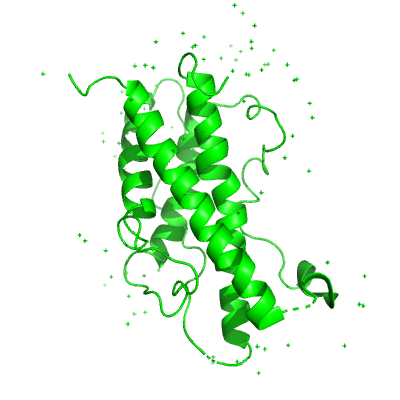

In [ ]:
import pymol
from pymol import cmd

# Colab 환경에 적합하게 PyMOL 실행 (GUI 없이, 조용히)
# 이미 condacolab을 통해 환경이 설정되었으므로 이 부분은 필수는 아닐 수 있지만,
# 명시적으로 실행해주면 좋습니다.
try:
    pymol.finish_launching(['pymol', '-cq'])
except Exception as e:
    print(f"pymol.finish_launching 중 경고 또는 오류: {e}")
    print("이미 실행 중이거나 다른 설정 문제일 수 있습니다. cmd 객체 사용은 가능할 수 있습니다.")

# 테스트: PDB 파일 가져오기 및 간단한 정보 출력
try:
    pdb_id = "1hgu"  # 예시 PDB ID
    object_name = "protein_test"
    cmd.fetch(pdb_id, object_name)
    print(f"'{pdb_id}' PDB를 '{object_name}' 객체로 성공적으로 가져왔습니다.")

    # 추가적인 PyMOL 명령 실행 가능
    cmd.show("cartoon", object_name)
    cmd.color("green", object_name)
    # cmd.zoom(object_name)

    # (선택 사항) 이미지 파일로 저장하고 Colab에 표시하기
    image_filename = f"{pdb_id}.png"
    cmd.png(image_filename, width=400, height=400, dpi=300, ray=1) # ray=1은 ray tracing
    print(f"이미지를 '{image_filename}'으로 저장했습니다.")

    from IPython.display import Image
    display(Image(filename=image_filename))

except Exception as e:
    print(f"PyMOL 명령 실행 중 오류 발생: {e}")
    print("PyMOL이 올바르게 초기화되지 않았거나, PDB ID를 가져오는 데 문제가 있을 수 있습니다.")

# 사용한 객체 정리 (선택 사항)
# cmd.delete(object_name)

PDB 1ubq 로드 완료.
Cartoon 표시 설정 완료.
cmd.png 실행 완료 (반환 값: 1). 'ubq.png' 파일 생성 확인 필요.


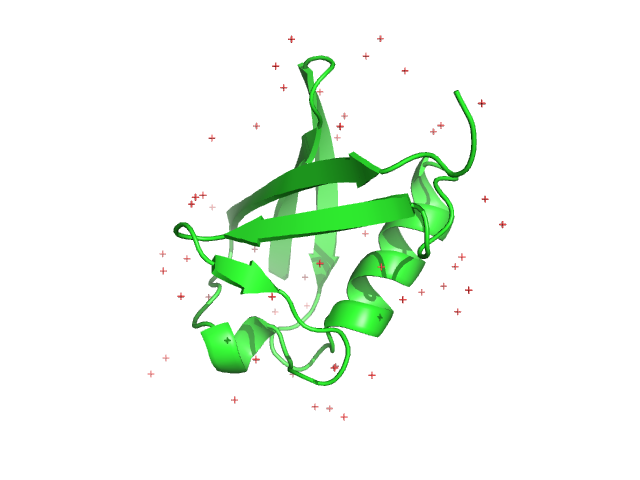

'ubq.png' 이미지를 표시합니다.


In [ ]:
import pymol
from pymol import cmd
from IPython.display import Image, display # display 함수도 임포트

# 1. PyMOL 초기화 (매우 중요)
try:
    pymol.finish_launching(['pymol', '-cq'])
except Exception as e:
    print(f"pymol.finish_launching 중 문제 발생: {e}")
    print("이미 PyMOL이 초기화되었거나 다른 문제일 수 있습니다. 계속 진행합니다.")

# 2. PDB 파일 로드하고 렌더링
try:
    cmd.reinitialize() # 이전 상태를 초기화 (선택 사항이지만, 반복 실행 시 유용)
    cmd.fetch("1ubq", "ubiquitin_obj") # 객체 이름 지정 권장
    print("PDB 1ubq 로드 완료.")

    cmd.show("cartoon", "ubiquitin_obj")
    print("Cartoon 표시 설정 완료.")

    # 3. 이미지 저장
    image_filename = "ubq.png"
    return_value = cmd.png(image_filename, dpi=300) # 반환 값을 변수에 저장해볼 수 있음
    print(f"cmd.png 실행 완료 (반환 값: {return_value}). '{image_filename}' 파일 생성 확인 필요.")

    # 4. Colab에 이미지 표시 (선택 사항)
    # 파일이 실제로 생성되었는지 확인 후 표시
    import os
    if os.path.exists(image_filename):
        display(Image(filename=image_filename))
        print(f"'{image_filename}' 이미지를 표시합니다.")
    else:
        print(f"'{image_filename}' 파일이 생성되지 않았습니다. PyMOL 상태 또는 경로를 확인하세요.")

except Exception as e:
    print(f"PyMOL 명령 실행 중 오류 발생: {e}")

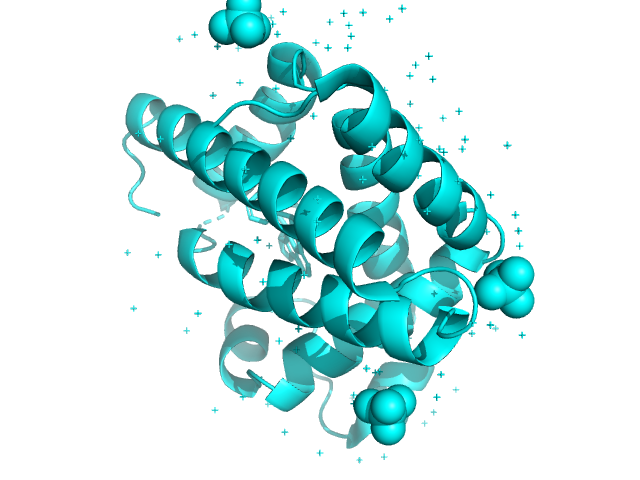

In [ ]:
#예시1
from pymol import cmd
from IPython.display import Image

# PyMOL 초기화
cmd.reinitialize()

# PDB 파일 불러오기
cmd.fetch("2ef2")  # "1tup"은 예제 PDB ID입니다.
cmd.show("cartoon")  # 만화 스타일로 시각화
cmd.color("cyan", "all")  # 전체를 청록색으로 색상 변경

# 이미지 저장 경로 설정
output_file = os.path.join(pdb_save_path, "structure.png")
cmd.png(output_file)

# 저장된 이미지 확인
Image(output_file)


## PDB file download 모듈 및 작업폴더 설정

In [ ]:
import os
from datetime import datetime
from pymol import cmd

# 작업 폴더 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'

# 폴더가 없으면 새로 생성
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

print(f"작업 폴더가 '{pdb_save_path}'에 설정되었습니다.")

# 오늘 날짜 얻기 (mmdd 형식)
today_date = datetime.now().strftime("%m%d")

# 사용자로부터 PDB ID 입력받기
pdb_ids = input("PDB ID들을 입력하세요 (쉼표로 구분): ").strip().split(',')

# 각 PDB ID에 대해 파일 다운로드 및 저장
for pdb_id in pdb_ids:
    pdb_id = pdb_id.strip()  # 공백 제거
    if pdb_id:
        # PyMOL 초기화 및 PDB 파일 다운로드
        cmd.reinitialize()
        cmd.fetch(pdb_id)

        # 저장할 파일명 설정
        file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
        file_path_cif = os.path.join(pdb_save_path, f"{pdb_id}.cif")

        # PDB 형식으로 저장
        cmd.save(file_path_pdb)

        # CIF 형식으로 저장
        cmd.save(file_path_cif, format="cif")

        print(f"{pdb_id} 구조가 {file_path_pdb} 및 {file_path_cif}에 저장되었습니다.")


작업 폴더가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'에 설정되었습니다.
PDB ID들을 입력하세요 (쉼표로 구분): 1cf3, 5dn9, 1tgu, 5wr9, 4cha
1cf3 구조가 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3.pdb 및 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3.cif에 저장되었습니다.
5dn9 구조가 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9.pdb 및 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9.cif에 저장되었습니다.
1tgu 구조가 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1tgu.pdb 및 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1tgu.cif에 저장되었습니다.
5wr9 구조가 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5wr9.pdb 및 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5wr9.cif에 저장되었습니다.
4cha 구조가 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha.pdb 및 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha.cif에 저장되었

## 기본 코드 fetching 및 기본 정보 추출

In [ ]:
import os
from Bio import SeqIO
from Bio.PDB import PDBParser, MMCIFParser
from Bio.PDB.PDBList import PDBList
from Bio.PDB import MMCIF2Dict

# 아미노산 1-letter 코드 매핑
three_to_one = {
    'ALA': 'A', 'ARG': 'R', 'ASN': 'N', 'ASP': 'D', 'CYS': 'C',
    'GLN': 'Q', 'GLU': 'E', 'GLY': 'G', 'HIS': 'H', 'ILE': 'I',
    'LEU': 'L', 'LYS': 'K', 'MET': 'M', 'PHE': 'F', 'PRO': 'P',
    'SER': 'S', 'THR': 'T', 'TRP': 'W', 'TYR': 'Y', 'VAL': 'V'
}

# 아미노산의 분자량 테이블 (평균 분자량 사용)
amino_acid_weights = {
    'ALA': 89.09, 'ARG': 174.20, 'ASN': 132.12, 'ASP': 133.10, 'CYS': 121.15,
    'GLN': 146.15, 'GLU': 147.13, 'GLY': 75.07, 'HIS': 155.16, 'ILE': 131.17,
    'LEU': 131.17, 'LYS': 146.19, 'MET': 149.21, 'PHE': 165.19, 'PRO': 115.13,
    'SER': 105.09, 'THR': 119.12, 'TRP': 204.23, 'TYR': 181.19, 'VAL': 117.15
}

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 파일 다운로드 함수
def download_pdb(pdb_id, save_path):
    pdbl = PDBList()
    pdbl.retrieve_pdb_file(pdb_id, file_format='pdb', pdir=save_path)
    print(f"{pdb_id} 파일이 다운로드되었습니다.")

# 아미노산 시퀀스를 포맷팅하여 출력하는 함수
def format_sequence(sequence):
    formatted_seq = ""
    for i in range(0, len(sequence), 50):
        line = sequence[i:i + 50]
        formatted_line = " ".join([line[j:j + 10] for j in range(0, len(line), 10)])
        formatted_seq += formatted_line + "\n"
    return formatted_seq

# PDB 파일 정보 추출 함수
def extract_pdb_info(pdb_id, file_path):
    # PDB 파일의 형식을 구분하여 파싱
    if file_path.endswith(".pdb") or file_path.endswith(".ent"):
        parser = PDBParser(QUIET=True)
    elif file_path.endswith(".cif"):
        parser = MMCIFParser()
    else:
        raise ValueError("지원되지 않는 파일 형식입니다.")

    # 파일 파싱하여 구조 정보 가져오기
    structure = parser.get_structure(pdb_id, file_path)
    model = structure[0]

    # 기본 정보 초기화
    protein_name = ""
    publication_title = ""
    journal_name = ""
    total_molecular_weight = 0.0
    chains_info = {}

    # MMCIF 파일의 경우 추가 정보 추출
    if file_path.endswith(".cif"):
        mmcif_dict = MMCIF2Dict.MMCIF2Dict(file_path)
        protein_name = mmcif_dict.get('_entity.pdbx_description', ['N/A'])[0]
        publication_title = mmcif_dict.get('_citation.title', ['N/A'])[0]
        journal_name = mmcif_dict.get('_citation.journal_abbrev', ['N/A'])[0]
    else:
        # PDB 또는 ENT 형식의 경우, 정보가 파일에 명시적으로 있지 않을 수 있음
        protein_name = "N/A"
        publication_title = "N/A"
        journal_name = "N/A"

    # 각 체인별로 시퀀스 및 무게 추출
    for chain in model:
        chain_id = chain.id
        chain_seq = ""
        chain_molecular_weight = 0.0
        for residue in chain:
            if residue.id[0] == " ":  # 일반적인 아미노산
                residue_name = residue.resname
                if residue_name in amino_acid_weights:
                    chain_molecular_weight += amino_acid_weights[residue_name]
                    chain_seq += three_to_one[residue_name]

        chains_info[chain_id] = {
            'sequence': chain_seq,
            'molecular_weight': chain_molecular_weight
        }
        total_molecular_weight += chain_molecular_weight

    # 결과 출력
    print(f"단백질 명: {protein_name}")
    print(f"PDB ID: {pdb_id}")
    print(f"결정 구조를 게재한 논문 제목: {publication_title}")
    print(f"저널명: {journal_name}")
    print("체인 별 분자량:")
    for chain_id, info in chains_info.items():
        print(f"  체인 {chain_id}: {info['molecular_weight']:.2f} Da")
    print(f"전체 분자량: {total_molecular_weight:.2f} Da\n")

    print("아미노산 시퀀스 (1-letter 코드):")
    for chain_id, info in chains_info.items():
        print(f"\n>Chain {chain_id}:\n{format_sequence(info['sequence'])}")

# 메인 함수
def main():
    while True:
        pdb_id = input("PDB ID를 입력하세요 (종료하려면 'q' 입력): ").strip().lower()
        if pdb_id == 'q':
            print("프로그램을 종료합니다.")
            break
        file_pdb_path = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
        file_cif_path = os.path.join(pdb_save_path, f"{pdb_id}.cif")
        file_ent_path = os.path.join(pdb_save_path, f"pdb{pdb_id}.ent")

        if os.path.exists(file_pdb_path):
            print(f"{pdb_id}.pdb 파일이 이미 존재합니다. 해당 파일을 사용합니다.")
            extract_pdb_info(pdb_id, file_pdb_path)
        elif os.path.exists(file_cif_path):
            print(f"{pdb_id}.cif 파일이 이미 존재합니다. 해당 파일을 사용합니다.")
            extract_pdb_info(pdb_id, file_cif_path)
        elif os.path.exists(file_ent_path):
            print(f"pdb{pdb_id}.ent 파일이 이미 존재합니다. 해당 파일을 사용합니다.")
            extract_pdb_info(pdb_id, file_ent_path)
        else:
            print(f"{pdb_id} 파일이 없습니다. 다운로드합니다.")
            download_pdb(pdb_id, pdb_save_path)
            if os.path.exists(file_pdb_path):
                extract_pdb_info(pdb_id, file_pdb_path)
            elif os.path.exists(file_cif_path):
                extract_pdb_info(pdb_id, file_cif_path)
            elif os.path.exis5ts(file_ent_path):
                extract_pdb_info(pdb_id, file_ent_path)
            else:
                print(f"{pdb_id} 파일 다운로드에 실패했습니다. 다시 시도해 주세요.")

if __name__ == "__main__":
    main()


PDB ID를 입력하세요 (종료하려면 'q' 입력): 5dn9
5dn9.pdb 파일이 이미 존재합니다. 해당 파일을 사용합니다.
단백질 명: N/A
PDB ID: 5dn9
결정 구조를 게재한 논문 제목: N/A
저널명: N/A
체인 별 분자량:
  체인 A: 46422.69 Da
  체인 B: 46422.69 Da
전체 분자량: 92845.38 Da

아미노산 시퀀스 (1-letter 코드):

>Chain A:
MKIVLVLYDA GKHAADEEKL YGCTENKLGI ANWLKDQGHE LITTSDKEGG
NSVLDQHIPD ADIIITTPFH PAYITKERID KAKKLKLVVV AGVGSDHIDL
DYINQTGKKI SVLEVTGSNV VSVAEHVLMT MLVLVRNFVP AHEQIINHDW
EVAAIAKDAY DIEGKTIATI GAGRIGYRVL ERLVPFNPKE LLYYDYQALP
KDAEEKVGAR RVENIEELVA QADIVTINAP LHAGTKGLIN KELLSKFKKG
AWLVNTARGA ICVAEDVAAA LESGQLRGYG GDVWFPQPAP KDHPWRDMRN
KYGAGNAMTP HYSGTTLDAQ TRYAEGTKNI LESFFTGKFD YRPQDIILLN
GEYITKAYGK H


>Chain B:
MKIVLVLYDA GKHAADEEKL YGCTENKLGI ANWLKDQGHE LITTSDKEGG
NSVLDQHIPD ADIIITTPFH PAYITKERID KAKKLKLVVV AGVGSDHIDL
DYINQTGKKI SVLEVTGSNV VSVAEHVLMT MLVLVRNFVP AHEQIINHDW
EVAAIAKDAY DIEGKTIATI GAGRIGYRVL ERLVPFNPKE LLYYDYQALP
KDAEEKVGAR RVENIEELVA QADIVTINAP LHAGTKGLIN KELLSKFKKG
AWLVNTARGA ICVAEDVAAA LESGQLRGYG GDVWFPQPAP KDHPWRDMRN
KYGAGNAMTP HYSGTTLDAQ TRYAE

# v1.0 CSV파일 계산 및 생성 -  UPDATED 0525
PDB ID 입력하면,
구글드라이브 폴더에 CSV 파일이 형성됨.

상대적 SASA 계산을 위한 표준 아미노산별 최대 SASA 값 (Å²)

출처: Tien et al., 2013, PLoS ONE 8(11): e80635 (Gly-X-Gly 펩타이드에서의 값)

PDB ID를 입력하세요: 4cha


/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 3514.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 3515.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain C is discontinuous at line 3538.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain F is discontinuous at line 3556.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain G is discontinuous at line 3577.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/PDBParser.py:384: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 3599
  warnings.warn(


DSSP 분석을 위해 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha.pdb' 파일을 사용합니다.
체인 ID를 입력하세요 (예: A). 모든 체인 시각화는 'ALL' 또는 빈칸 입력. SASA CSV 파일명에도 사용됩니다: ALL

PyMOL SASA 계산을 시작합니다. 결과는 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha_ALLCHAINS_SASA_20250523.csv'에 저장됩니다.
PyMOL을 사용하여 SASA 계산 시작: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha.pdb
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha.pdb' 파일을 PyMOL 객체 'sasa_target'(으)로 로드했습니다.
총 477개의 고유한 잔기에 대해 SASA를 계산합니다.
SASA 결과가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha_ALLCHAINS_SASA_20250523.csv' 파일로 성공적으로 저장되었습니다.
DSSP 데이터 분석을 위한 상대 접근성 임계값을 입력하세요 (예: 0.25, DSSP 결과의 accessibility 값 기준): 0

노출된 잔기 (DSSP 전체 기준, 임계값 > 0.0): [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 47, 48, 49, 50, 51, 53, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 69, 70, 71, 72, 73, 74, 

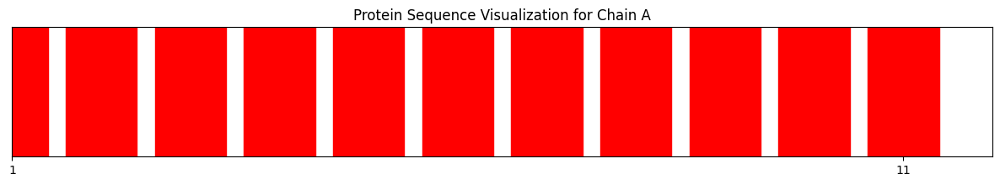


--- 체인 B 시각화 ---


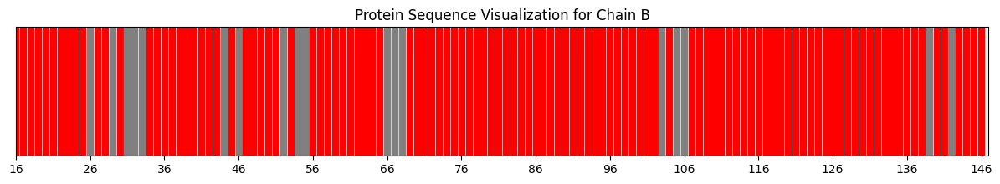


--- 체인 C 시각화 ---


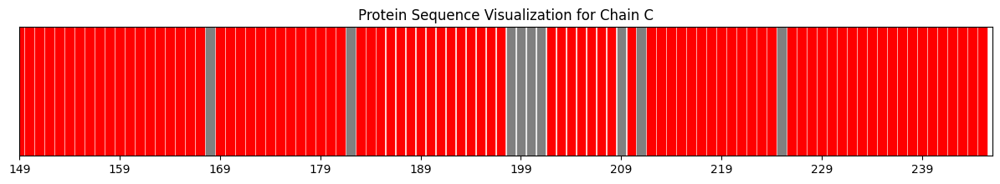


--- 체인 E 시각화 ---


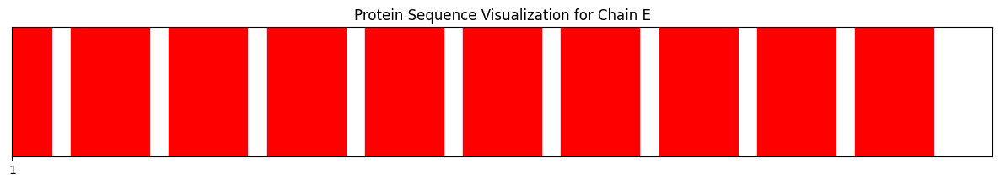


--- 체인 F 시각화 ---


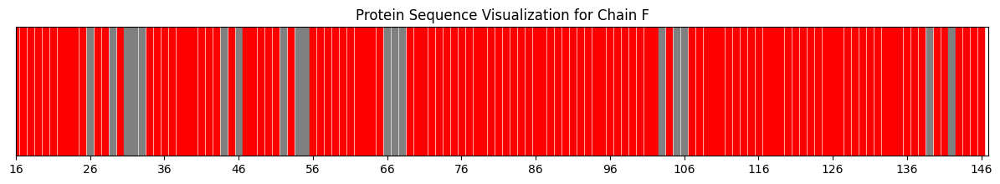


--- 체인 G 시각화 ---


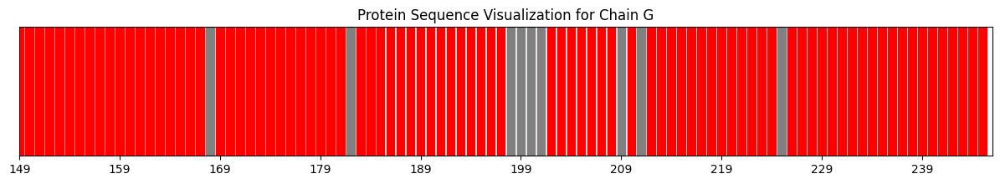

'\n# 사용자 입력을 통한 조건 설정 및 분석 실행\ndef main():\n    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()\n    pdb_id = pdb_id_input\n    structure = load_structure(pdb_id, pdb_save_path)\n\n    # DSSP 분석 및 시각화 데이터 준비\n    dssp_data = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))\n    chain_id = input("시각화할 체인 ID를 입력하세요 (예: A): ").strip().upper()\n\n    # 사용자로부터 SASA(접근 가능한 표면적) 임계값 입력 받기\n    try:\n        sasa_threshold = float(input("SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): ").strip())\n    except ValueError:\n        sasa_threshold = 0\n\n    # 노출된 잔기 및 2차 구조 식별\n    exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=sasa_threshold)\n    print(exposed_residues)\n    secondary_structures = identify_secondary_structures(dssp_data, exposed_residues)\n    print(secondary_structures)\n    # 시각화 실행\n    visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=exposed_residues, highlighted_secondary_structure=seco

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP
import datetime


# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 또는 CIF 파일 로드
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 {pdb_id}.cif 파일이 경로 {pdb_save_path}에 존재하지 않습니다.")

    return structure

# DSSP 분석 함수
def analyze_structure_with_dssp(structure, pdb_file_path):
    model = structure[0]  # 첫 번째 모델 사용
    dssp = DSSP(model, pdb_file_path)

    # DSSP 결과에서 잔기 번호, 이름, 노출 여부, 2차 구조 등 추출
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])

    return dssp_data

# 시퀀스 시각화 함수
def visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=None, highlighted_secondary_structure=None):
    if highlighted_residues is None:
        highlighted_residues = []
    if highlighted_secondary_structure is None:
        highlighted_secondary_structure = []

    # 선택한 체인의 잔기만 필터링
    chain_residues = [data for data in dssp_data if data[0] == chain_id]

    if not chain_residues: # 해당 체인에 대한 데이터가 없으면
        print(f"체인 '{chain_id}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
        return # 함수 종료


    # 시퀀스 길이 및 잔기 번호 리스트
    sequence_length = len(chain_residues)
    residue_numbers = [res[1] for res in chain_residues]

    # 시퀀스 시각화
    fig, ax = plt.subplots(figsize=(15, 2))
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='grey', edgecolor='grey')

    # 강조 표시할 잔기 색상 변경
    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if residue_number in highlighted_residues:
            bar_segment.set_color('red')  # 노출된 잔기 색상 설정
        elif residue_number in highlighted_secondary_structure:
            bar_segment.set_color('blue')  # 2차 구조 덩어리 색상 설정

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 10))
    ax.set_xticklabels(residue_numbers[::10])

    ax.set_title(f'Protein Sequence Visualization for Chain {chain_id}')
    plt.show()

# 노출된 잔기 식별 (사용자가 설정한 접근성 임계값을 사용)
def identify_exposed_residues(dssp_data, accessibility_threshold=0):
    exposed_residues = []
    for data in dssp_data:
        residue_number = data[1]
        accessibility = data[4]
        if accessibility > accessibility_threshold:  # 노출 여부 판단
            exposed_residues.append(residue_number)
    return exposed_residues

# 노출된 잔기를 포함하는 2차 구조 식별
def identify_secondary_structures(dssp_data, exposed_residues):
    secondary_structures = []
    for data in dssp_data:
        residue_number = data[1]
        secondary_structure = data[3]
        if residue_number in exposed_residues and secondary_structure != ' ':
            secondary_structures.append(residue_number)
    return secondary_structures

import pymol
from pymol import cmd
import csv
import os # 이미 임포트 되어 있지만, 명시적으로 다시 언급

# 상대적 SASA 계산을 위한 표준 아미노산별 최대 SASA 값 (Å²)
# 출처: Tien et al., 2013, PLoS ONE 8(11): e80635 (Gly-X-Gly 펩타이드에서의 값)
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

def calculate_sasa_with_pymol(structure_file_path, pymol_object_name="sasa_target", output_csv_filename="residue_sasa.csv"):
    """
    PyMOL을 사용하여 주어진 구조 파일로부터 각 잔기의 SASA를 계산하고,
    체인 ID, 잔기 번호, SASA, 상대적 SASA를 CSV 파일로 출력합니다.

    Args:
        structure_file_path (str): PDB 또는 CIF 파일의 전체 경로.
        pymol_object_name (str): PyMOL 내에서 구조를 로드할 때 사용할 객체 이름.
        output_csv_filename (str): 생성될 CSV 파일의 이름.
    """
    print(f"PyMOL을 사용하여 SASA 계산 시작: {structure_file_path}")

    sasa_results = []

    # PyMOL 초기화 (Colab에서 스크립트 실행 시 권장)
    try:
        pymol.finish_launching(['pymol', '-cq'])
    except Exception as e:
        print(f"PyMOL 초기화 중 참고: {e}") # 이미 실행된 경우 등

    cmd.reinitialize() # PyMOL 상태 초기화
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' 파일을 PyMOL 객체 '{pymol_object_name}'(으)로 로드했습니다.")

    # SASA 계산 파라미터 설정
    cmd.set("dot_solvent", 1)       # SASA 계산 시 dot surface 사용
    cmd.set("solvent_radius", 1.4)  # 용매 반지름 (Å)

    # 고유한 잔기 정보 (chain, resi, resn) 추출
    # iterate_state를 사용하여 각 중합체(polymer) 잔기의 정보를 가져옵니다.
    # (state=1은 첫 번째 모델(상태)을 의미합니다)
    residue_details = []
    # 잔기 정보를 저장할 공간 (PyMOL의 iterate_state는 Python의 전역/로컬 공간에 접근 가능)
    # 여기서는 Python 리스트를 직접 사용합니다.

    # PyMOL 2.0 이상에서는 iterate_state의 space 인자로 locals() 또는 globals() 전달 가능
    # 또는 cmd.get_model 사용 후 파싱도 가능하나, iterate_state가 더 직접적일 수 있음

    # 고유한 (chain, resi, resn) 튜플을 저장할 집합
    unique_residues_info = set()

    # 단백질의 경우 'name CA' 기준으로 순회하면 각 잔기당 한 번씩 정보를 얻기 용이합니다.
    # 핵산의 경우 'name P' 또는 'name C1*' 등을 사용할 수 있습니다.
    # 'polymer' 키워드는 아미노산 또는 뉴클레오타이드를 선택합니다.
    selection_for_iteration = f"{pymol_object_name} and polymer and name CA"
    try:
        cmd.iterate_state(1, selection_for_iteration, "unique_residues_info.add((chain, resi, resn))", space=locals())
    except pymol.CmdException: # CA가 없는 경우 (예: 핵산만 있거나, CA 이름이 다른 경우)
        print(f"경고: '{selection_for_iteration}' 선택자에서 원자를 찾을 수 없습니다. 전체 중합체 원자로 다시 시도합니다.")
        selection_for_iteration = f"{pymol_object_name} and polymer"
        cmd.iterate_state(1, selection_for_iteration, "unique_residues_info.add((chain, resi, resn))", space=locals())


    # 결과를 체인 ID와 잔기 번호 순으로 정렬
    # resi는 문자열로 반환되므로 정수 변환 후 정렬
    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))

    print(f"총 {len(sorted_residue_info)}개의 고유한 잔기에 대해 SASA를 계산합니다.")

    for chain_id, resi_str, resn in sorted_residue_info:
        try:
            resi_num = int(resi_str) # 잔기 번호를 정수로 변환

            # 현재 잔기만 선택하는 선택자 생성
            residue_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"

            # 현재 잔기의 SASA 계산
            # get_area는 선택된 원자들의 총 SASA를 반환
            current_sasa = cmd.get_area(residue_selection)

            # 상대적 SASA 계산
            max_sasa_for_resn = MAX_SASA.get(resn.upper(), None) # resn을 대문자로 변환하여 조회
            relative_sasa = "N/A" # 기본값
            if max_sasa_for_resn is not None and max_sasa_for_resn > 0:
                relative_sasa = current_sasa / max_sasa_for_resn
            elif max_sasa_for_resn is None:
                print(f"참고: 잔기 {resn} (체인 {chain_id}, 번호 {resi_num})에 대한 MAX_SASA 값이 없습니다.")

            sasa_results.append([chain_id, resi_num, current_sasa, relative_sasa])
        except Exception as e:
            print(f"오류: 체인 {chain_id}, 잔기번호 {resi_str} ({resn}) SASA 계산 중 문제 발생 - {e}")
            sasa_results.append([chain_id, resi_str, "Error", "Error"])


    # CSV 파일로 저장
    try:
        with open(output_csv_filename, 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA']) # 헤더
            writer.writerows(sasa_results)
        print(f"SASA 결과가 '{output_csv_filename}' 파일로 성공적으로 저장되었습니다.")
    except IOError:
        print(f"오류: CSV 파일 '{output_csv_filename}'을 쓰는 데 실패했습니다.")

    # PyMOL 객체 삭제 (정리)
    cmd.delete(pymol_object_name)

# (기존 코드의 MAX_SASA 딕셔너리 및 calculate_sasa_with_pymol 함수 정의가 이 부분 또는 스크립트 상단에 있다고 가정)
# 예시:
# MAX_SASA = { ... }
# def calculate_sasa_with_pymol(structure_file_path, pymol_object_name="sasa_target", output_csv_filename="residue_sasa.csv"):
#     ... (이전 답변의 함수 내용) ...

# ... (스크립트 상단 import 및 pdb_save_path, 각종 함수 정의는 그대로) ...


# ... (스크립트 상단 import 및 pdb_save_path, 각종 함수 정의는 그대로) ...
# datetime, pymol, csv 등 필요한 import 문이 상단에 포함되어 있다고 가정합니다.

def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()

    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    actual_structure_file_path = None
    if os.path.exists(pdb_file_path_pdb):
        actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif):
        actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: {pdb_id_input}.pdb 또는 {pdb_id_input}.cif 파일이 경로 '{pdb_save_path}'에 존재하지 않습니다.")
        return

    # BioPython 구조체 로드
    try:
        structure = load_structure(pdb_id_input, pdb_save_path)
    except FileNotFoundError as e:
        print(f"구조 로딩 실패: {e}")
        return

    # DSSP 분석 준비
    dssp_data = []
    dssp_input_file_for_constructor = pdb_file_path_pdb

    if not os.path.exists(dssp_input_file_for_constructor):
        if os.path.exists(pdb_file_path_cif):
            print(f"경고: {pdb_id_input}.pdb 파일이 없습니다. DSSP 분석에 {pdb_id_input}.cif 파일을 사용하려고 시도합니다.")
            print("      BioPython의 DSSP는 PDB 파일 형식에서 가장 안정적으로 작동할 수 있으며, CIF 파일 사용 시 예상치 못한 결과나 오류가 발생할 수 있습니다.")
            dssp_input_file_for_constructor = pdb_file_path_cif

    if os.path.exists(dssp_input_file_for_constructor):
        try:
            print(f"DSSP 분석을 위해 '{dssp_input_file_for_constructor}' 파일을 사용합니다.")
            dssp_data = analyze_structure_with_dssp(structure, dssp_input_file_for_constructor)
        except Exception as e:
            print(f"DSSP 분석 중 심각한 오류 발생: {e}")
            print("DSSP 분석을 건너뜁니다.")
            dssp_data = []
    else:
        print("경고: DSSP 분석에 적합한 입력 파일을 찾지 못하여 DSSP 분석을 건너뜁니다.")

    # --- 체인 ID 입력 및 SASA 파일명 결정 ---
    chain_input_for_sasa_filename_and_viz = input(f"체인 ID를 입력하세요 (예: A). 모든 체인 시각화는 'ALL' 또는 빈칸 입력. SASA CSV 파일명에도 사용됩니다: ").strip().upper()

    sasa_filename_use_chain_id = chain_input_for_sasa_filename_and_viz
    if not chain_input_for_sasa_filename_and_viz or chain_input_for_sasa_filename_and_viz == "ALL":
        sasa_filename_use_chain_id = "ALLCHAINS" # "ALL" 또는 빈칸 입력 시 파일명에 사용할 문자열
        visualize_all_chains_flag = True
    else:
        visualize_all_chains_flag = False

    # --- PyMOL을 사용한 SASA 계산 및 CSV 저장 ---
    if actual_structure_file_path:
        today_date_str = datetime.date.today().strftime("%Y%m%d")
        sasa_csv_filename = f"{pdb_id_input}_{sasa_filename_use_chain_id}_SASA_{today_date_str}.csv"
        sasa_csv_full_path = os.path.join(pdb_save_path, sasa_csv_filename)

        print(f"\nPyMOL SASA 계산을 시작합니다. 결과는 '{sasa_csv_full_path}'에 저장됩니다.")
        # calculate_sasa_with_pymol 함수는 이전에 정의했다고 가정합니다.
        calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_csv_full_path)
    else:
        print("SASA 계산을 위한 구조 파일을 찾을 수 없습니다 (이 메시지는 논리적으로 나타나지 않아야 함).")


    # --- DSSP 데이터 기반 후속 처리 및 시각화 ---
    if dssp_data:
        try:
            dssp_accessibility_threshold = float(input("DSSP 데이터 분석을 위한 상대 접근성 임계값을 입력하세요 (예: 0.25, DSSP 결과의 accessibility 값 기준): ").strip())
        except ValueError:
            dssp_accessibility_threshold = 0.25

        # 노출된 잔기 및 관련 2차 구조는 전체 dssp_data 기준으로 한 번 계산
        all_exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=dssp_accessibility_threshold)
        print(f"\n노출된 잔기 (DSSP 전체 기준, 임계값 > {dssp_accessibility_threshold}): {all_exposed_residues}")
        all_secondary_structures_containing_exposed = identify_secondary_structures(dssp_data, all_exposed_residues)
        print(f"노출된 잔기를 포함하는 2차 구조 (DSSP 전체 기준): {all_secondary_structures_containing_exposed}")

        if visualize_all_chains_flag:
            # dssp_data에서 고유한 체인 ID 목록을 가져옴 (정렬)
            unique_chains_in_dssp = sorted(list(set(data_item[0] for data_item in dssp_data)))
            if not unique_chains_in_dssp:
                print("DSSP 데이터에서 체인 정보를 찾을 수 없어 시각화를 진행할 수 없습니다.")
            else:
                print(f"\n총 {len(unique_chains_in_dssp)}개의 체인에 대해 순차적으로 시각화를 진행합니다: {unique_chains_in_dssp}")
                for chain_to_visualize in unique_chains_in_dssp:
                    print(f"\n--- 체인 {chain_to_visualize} 시각화 ---")
                    visualize_protein_sequence(dssp_data, chain_to_visualize,
                                               highlighted_residues=all_exposed_residues,
                                               highlighted_secondary_structure=all_secondary_structures_containing_exposed)
        else: # 특정 체인 ID가 입력된 경우
            # 입력된 체인 ID가 dssp_data에 존재하는지 확인 후 시각화
            chain_exists_in_dssp = any(data_item[0] == chain_input_for_sasa_filename_and_viz for data_item in dssp_data)
            if chain_exists_in_dssp:
                print(f"\n--- 체인 {chain_input_for_sasa_filename_and_viz} 시각화 ---")
                visualize_protein_sequence(dssp_data, chain_input_for_sasa_filename_and_viz,
                                           highlighted_residues=all_exposed_residues,
                                           highlighted_secondary_structure=all_secondary_structures_containing_exposed)
            else:
                print(f"경고: 입력하신 체인 ID '{chain_input_for_sasa_filename_and_viz}'에 대한 DSSP 데이터가 없습니다. 해당 체인 시각화를 건너뜁니다.")
    else:
        print("\nDSSP 데이터가 없어 DSSP 기반의 추가 분석 및 시각화를 건너뜁니다.")

if __name__ == "__main__":
    # ... (Colab 환경 설정 주석 및 pdb_save_path 설정은 그대로) ...
    main()
'''
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()

    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    actual_structure_file_path = None
    if os.path.exists(pdb_file_path_pdb):
        actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif):
        actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: {pdb_id_input}.pdb 또는 {pdb_id_input}.cif 파일이 경로 '{pdb_save_path}'에 존재하지 않습니다.")
        return

    # BioPython 구조체 로드
    try:
        structure = load_structure(pdb_id_input, pdb_save_path)
    except FileNotFoundError as e:
        print(f"구조 로딩 실패: {e}")
        return

    # DSSP 분석 준비
    dssp_data = [] # 기본적으로 빈 리스트로 초기화
    dssp_input_file_for_constructor = pdb_file_path_pdb # DSSP는 PDB 파일을 우선 시도

    if not os.path.exists(dssp_input_file_for_constructor):
        if os.path.exists(pdb_file_path_cif):
            print(f"경고: {pdb_id_input}.pdb 파일이 없습니다. DSSP 분석에 {pdb_id_input}.cif 파일을 사용하려고 시도합니다.")
            print("      BioPython의 DSSP는 PDB 파일 형식에서 가장 안정적으로 작동할 수 있으며, CIF 파일 사용 시 예상치 못한 결과나 오류가 발생할 수 있습니다.")
            dssp_input_file_for_constructor = pdb_file_path_cif
        else:
            # 이 경우는 실제 구조 파일이 없는 경우로, 위에서 이미 처리되어 여기까지 오지 않아야 함.
            # 만약 온다면 로직 오류이므로 명시적 에러 메시지.
            print(f"오류: DSSP 분석에 사용할 PDB 또는 CIF 파일을 결정할 수 없습니다 (논리 오류 가능성).")
            # dssp_data는 이미 비어있으므로 DSSP 분석은 건너뛰게 됨

    if os.path.exists(dssp_input_file_for_constructor): # DSSP 실행할 파일이 실제로 존재할 때만 시도
        try:
            print(f"DSSP 분석을 위해 '{dssp_input_file_for_constructor}' 파일을 사용합니다.")
            dssp_data = analyze_structure_with_dssp(structure, dssp_input_file_for_constructor)
        except Exception as e:
            print(f"DSSP 분석 중 심각한 오류 발생: {e}")
            print("DSSP 분석을 건너뜁니다.")
            dssp_data = [] # 오류 시 확실히 비움
    else:
        print("경고: DSSP 분석에 적합한 입력 파일을 찾지 못하여 DSSP 분석을 건너뜁니다.")


    chain_id_for_filename_and_viz = input("시각화 및 SASA CSV 파일명에 사용할 체인 ID를 입력하세요 (예: A): ").strip().upper()

    # PyMOL을 사용한 SASA 계산 및 CSV 저장
    if actual_structure_file_path:
        today_date_str = datetime.date.today().strftime("%Y%m%d")
        sasa_csv_filename = f"{pdb_id_input}_{chain_id_for_filename_and_viz}_SASA_{today_date_str}.csv"
        sasa_csv_full_path = os.path.join(pdb_save_path, sasa_csv_filename)

        print(f"\nPyMOL SASA 계산을 시작합니다. 결과는 '{sasa_csv_full_path}'에 저장됩니다.")
        calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_csv_full_path)
    else:
        # 이 경우는 위에서 actual_structure_file_path가 None일 때 return 하므로, 여기까지 오지 않아야 함.
        print("SASA 계산을 위한 구조 파일을 찾을 수 없습니다 (논리 오류 가능성).")

    # DSSP 데이터 기반 후속 처리
    if dssp_data:
        try:
            dssp_accessibility_threshold = float(input("DSSP 데이터 분석을 위한 상대 접근성 임계값을 입력하세요 (예: 0.25, DSSP 결과의 accessibility 값 기준): ").strip())
        except ValueError:
            dssp_accessibility_threshold = 0.25

        exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=dssp_accessibility_threshold)
        print(f"노출된 잔기 (DSSP 기준, 임계값 > {dssp_accessibility_threshold}): {exposed_residues}")
        secondary_structures = identify_secondary_structures(dssp_data, exposed_residues)
        print(f"노출된 잔기를 포함하는 2차 구조 (DSSP 기준): {secondary_structures}")

        visualize_protein_sequence(dssp_data, chain_id_for_filename_and_viz, highlighted_residues=exposed_residues, highlighted_secondary_structure=secondary_structures)
    else:
        print("\nDSSP 데이터가 없어 DSSP 기반의 추가 분석 및 시각화를 건너뜁니다.")

if __name__ == "__main__":
    # Colab 환경 설정 주석 (필요시 사용자에게 안내)
    # print("Colab 환경에서 PyMOL을 사용하려면 먼저 Conda 환경 및 PyMOL 설치가 필요할 수 있습니다.")
    # print("예시: !pip install -q condacolab; import condacolab; condacolab.install()")
    # print("      !mamba install -c schrodinger pymol-open-source -y")

    # pdb_save_path 설정 확인 (스크립트 상단에서 이미 수행됨)
    # if not os.path.exists(pdb_save_path):
    #     os.makedirs(pdb_save_path)

    main()

'''
'''
# 사용자 입력을 통한 조건 설정 및 분석 실행
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    # DSSP 분석 및 시각화 데이터 준비
    dssp_data = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))
    chain_id = input("시각화할 체인 ID를 입력하세요 (예: A): ").strip().upper()

    # 사용자로부터 SASA(접근 가능한 표면적) 임계값 입력 받기
    try:
        sasa_threshold = float(input("SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): ").strip())
    except ValueError:
        sasa_threshold = 0

    # 노출된 잔기 및 2차 구조 식별
    exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=sasa_threshold)
    print(exposed_residues)
    secondary_structures = identify_secondary_structures(dssp_data, exposed_residues)
    print(secondary_structures)
    # 시각화 실행
    visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=exposed_residues, highlighted_secondary_structure=secondary_structures)

if __name__ == "__main__":
    main()
#
'''

PDB ID를 입력하세요 (종료하려면 'q' 입력): 5dn9


/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11912.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11986.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 12060.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12590.
  warnings.warn(


시각화할 체인 ID를 입력하세요 (예: A): A
SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): 0.25


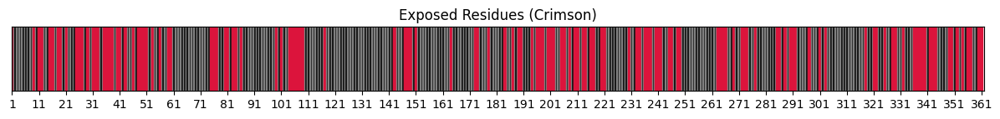

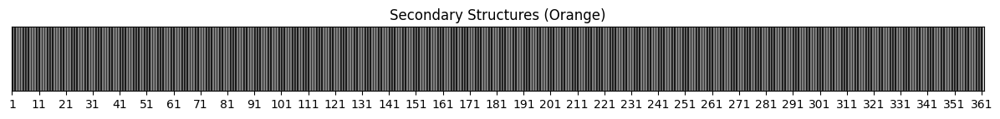

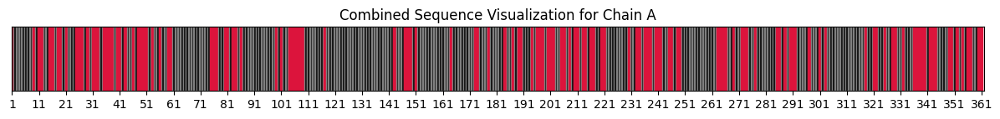

PDB ID를 입력하세요 (종료하려면 'q' 입력): q
프로그램을 종료합니다.


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP, PDBList

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 파일 로드 함수
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")
    ent_file_path = os.path.join(save_path, f"pdb{pdb_id}.ent")

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    elif os.path.exists(ent_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, ent_file_path)
    else:
        # PDB 파일 다운로드
        pdbl = PDBList()
        pdbl.retrieve_pdb_file(pdb_id, file_format='pdb', pdir=save_path)
        if os.path.exists(pdb_file_path):
            structure = parser.get_structure(pdb_id, pdb_file_path)
        else:
            raise FileNotFoundError(f"{pdb_id} 파일을 다운로드할 수 없습니다.")

    return structure

# DSSP 분석 함수
def analyze_structure_with_dssp(structure, pdb_file_path):
    model = structure[0]  # 첫 번째 모델 사용
    dssp = DSSP(model, pdb_file_path)

    # DSSP 결과에서 잔기 번호, 이름, 노출 여부, 2차 구조 등 추출
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])

    # 결과를 데이터프레임으로 변환하여 관리
    df = pd.DataFrame(dssp_data, columns=['Chain', 'Residue Number', 'Residue Name', 'Secondary Structure', 'Accessibility'])
    return df

# 노출된 잔기 식별 (사용자가 설정한 접근성 임계값을 사용)
def identify_exposed_residues(df, accessibility_threshold=0):
    exposed_residues = df[df['Accessibility'] > accessibility_threshold]['Residue Number'].tolist()
    return exposed_residues

# 노출된 잔기를 포함한 연속된 2차 구조 식별 및 저장
def identify_secondary_structures(df, exposed_residues):
    secondary_structure_data = []

    # 노출된 residue들로 반복
    for exposed_residue in exposed_residues:
        # 2차 구조 데이터 가져오기
        dssp_residue_data = [data for data in df.values if data[1] == exposed_residue]

        if dssp_residue_data:
            chain_id, residue_number, residue_name, sec_structure, accessibility = dssp_residue_data[0]
            # 현재 노출된 잔기와 동일한 2차 구조 값으로 초기화
            current_structure = sec_structure
            secondary_structure_data.append([residue_number, current_structure])

            # -1씩 뒤로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number - 1
            while i >= min(exposed_residues):
                prev_residue_data = [data for data in df.values if data[1] == i and data[0] == chain_id]
                if prev_residue_data and prev_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i -= 1

            # +1씩 앞으로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number + 1
            while i <= max(exposed_residues):
                next_residue_data = [data for data in df.values if data[1] == i and data[0] == chain_id]
                if next_residue_data and next_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i += 1

    # 중복 제거
    secondary_structure_data = list(set(tuple(row) for row in secondary_structure_data))
    df_secondary_structure = pd.DataFrame(secondary_structure_data, columns=['Residue Number', 'Secondary Structure'])
    return df_secondary_structure

# 개별 시각화 함수
def plot_individual(df, chain_id, residues, color, title):
    chain_residues = df[df['Chain'] == chain_id]
    sequence_length = len(chain_residues)
    residue_numbers = chain_residues['Residue Number'].tolist()

    fig, ax = plt.subplots(figsize=(15, 1))  # 크기 조정
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='black', edgecolor='grey')

    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if residue_number in residues:
            bar_segment.set_color(color)  # 특정 조건에 따른 색상 변경

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 10))
    ax.set_xticklabels(residue_numbers[::10])
    ax.set_title(title)
    plt.show()

# 중첩 시각화 함수
def plot_combined(df, chain_id, exposed_residues, secondary_structure_residues):
    chain_residues = df[df['Chain'] == chain_id]
    sequence_length = len(chain_residues)
    residue_numbers = chain_residues['Residue Number'].tolist()

    fig, ax = plt.subplots(figsize=(15, 1))  # 크기 조정
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='black', edgecolor='grey')

    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if residue_number in secondary_structure_residues:
            bar_segment.set_color('orange')  # 가장 위에 2차 구조
        elif residue_number in exposed_residues:
            bar_segment.set_color('crimson')  # 중간에 노출된 잔기

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 10))
    ax.set_xticklabels(residue_numbers[::10])
    ax.set_title(f'Combined Sequence Visualization for Chain {chain_id}')
    plt.show()

# 사용자 입력을 통한 조건 설정 및 분석 실행
def main():
    while True:
        pdb_id_input = input("PDB ID를 입력하세요 (종료하려면 'q' 입력): ").strip().lower()
        if pdb_id_input == 'q':
            print("프로그램을 종료합니다.")
            break

        pdb_id = pdb_id_input
        try:
            structure = load_structure(pdb_id, pdb_save_path)
        except FileNotFoundError as e:
            print(e)
            continue

        # DSSP 분석 및 시각화 데이터 준비
        try:
            dssp_data_df = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))
        except Exception as e:
            print(f"DSSP 분석 중 오류가 발생했습니다: {e}")
            continue

        chain_id = input("시각화할 체인 ID를 입력하세요 (예: A): ").strip().upper()

        # 사용자로부터 SASA(접근 가능한 표면적) 임계값 입력 받기
        try:
            sasa_threshold = float(input("SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): ").strip() or 0)
        except ValueError:
            sasa_threshold = 0

        # 노출된 잔기 및 2차 구조 식별
        exposed_residues = identify_exposed_residues(dssp_data_df, accessibility_threshold=sasa_threshold)
        secondary_structure_residues = identify_secondary_structures(dssp_data_df, exposed_residues)

        # 개별 시각화 실행
        plot_individual(dssp_data_df, chain_id, exposed_residues, 'crimson', 'Exposed Residues (Crimson)')
        plot_individual(dssp_data_df, chain_id, secondary_structure_residues, 'orange', 'Secondary Structures (Orange)')
        plot_combined(dssp_data_df, chain_id, exposed_residues, secondary_structure_residues)  # 중첩 시각화

if __name__ == "__main__":
    main()


PDB ID를 입력하세요: 5dn9


/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11912.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11986.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 12060.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12590.
  warnings.warn(


시각화할 체인 ID를 입력하세요 (예: A): A
SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): 0.5
exposed_residues: [12, 15, 18, 29, 32, 35, 36, 38, 40, 48, 49, 50, 51, 77, 81, 83, 84, 105, 109, 147, 149, 187, 189, 197, 200, 201, 202, 205, 206, 208, 213, 220, 233, 234, 236, 241, 242, 245, 249, 265, 269, 272, 273, 285, 291, 292, 297, 301, 337, 338, 339, 340, 343, 350, 352, 356, 360, 361, 12, 15, 18, 29, 32, 35, 36, 38, 40, 48, 49, 50, 51, 81, 83, 84, 105, 109, 147, 149, 174, 187, 189, 197, 200, 201, 202, 205, 206, 208, 213, 214, 217, 233, 234, 236, 241, 242, 245, 249, 265, 269, 272, 273, 285, 291, 292, 297, 301, 325, 337, 338, 339, 340, 343, 350, 352, 356, 360, 361]
secondary_structure_df:      Residue Number Secondary Structure
0                12                   G
1                13                   G
2                14                   G
3                15                   G
4                16                   G
..              ...                 ...
494             359                   S
495      

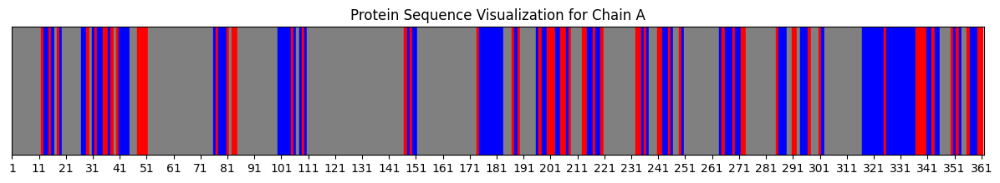

In [ ]:
#240826 Solvent accessibil region 라벨링 시각화

import os
import pandas as pd
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 또는 CIF 파일 로드
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 {pdb_id}.cif 파일이 경로 {pdb_save_path}에 존재하지 않습니다.")

    return structure

# DSSP 분석 함수
def analyze_structure_with_dssp(structure, pdb_file_path):
    model = structure[0]  # 첫 번째 모델 사용
    dssp = DSSP(model, pdb_file_path)

    # DSSP 결과에서 잔기 번호, 이름, 노출 여부, 2차 구조 등 추출
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])

    return dssp_data

# 노출된 잔기 식별 (사용자가 설정한 접근성 임계값을 사용)
def identify_exposed_residues(dssp_data, accessibility_threshold=0):
    exposed_residues = []
    for data in dssp_data:
        residue_number = data[1]
        accessibility = data[4]
        if accessibility > accessibility_threshold:  # 노출 여부 판단
            exposed_residues.append(residue_number)
    return exposed_residues

# 노출된 잔기를 포함한 연속된 2차 구조 식별 및 저장
def identify_secondary_structures(dssp_data, exposed_residues):
    secondary_structure_data = []

    # 1. 노출된 residue들로 반복
    for exposed_residue in exposed_residues:
        # 2차 구조 데이터 가져오기
        dssp_residue_data = [data for data in dssp_data if data[1] == exposed_residue]

        if dssp_residue_data:
            chain_id, residue_number, residue_name, sec_structure, accessibility = dssp_residue_data[0]
            # 현재 노출된 잔기와 동일한 2차 구조 값으로 초기화
            current_structure = sec_structure
            secondary_structure_data.append([residue_number, current_structure])

            # 3-3. -1씩 뒤로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number - 1
            while i >= min(exposed_residues):
                prev_residue_data = [data for data in dssp_data if data[1] == i]
                if prev_residue_data and prev_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i -= 1

            # 3-4. +1씩 앞으로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number + 1
            while i <= max(exposed_residues):
                next_residue_data = [data for data in dssp_data if data[1] == i]
                if next_residue_data and next_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i += 1

    # 데이터프레임으로 저장
    df_secondary_structure = pd.DataFrame(secondary_structure_data, columns=['Residue Number', 'Secondary Structure'])
    return df_secondary_structure

# 시각화 함수
def visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=None, highlighted_secondary_structure=None):
    if highlighted_residues is None:
        highlighted_residues = []
    if highlighted_secondary_structure is None:
        highlighted_secondary_structure = []

    # 선택한 체인의 잔기만 필터링
    chain_residues = [data for data in dssp_data if data[0] == chain_id]

    # 시퀀스 길이 및 잔기 번호 리스트
    sequence_length = len(chain_residues)
    residue_numbers = [res[1] for res in chain_residues]

    # 시퀀스 시각화
    fig, ax = plt.subplots(figsize=(15, 2))
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='grey', edgecolor='grey')

    # 강조 표시할 잔기 색상 변경
    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if residue_number in highlighted_residues:
            bar_segment.set_color('red')  # 노출된 잔기 색상 설정
        elif residue_number in highlighted_secondary_structure:
            bar_segment.set_color('blue')  # 2차 구조 덩어리 색상 설정

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 10))
    ax.set_xticklabels(residue_numbers[::10])

    ax.set_title(f'Protein Sequence Visualization for Chain {chain_id}')
    plt.show()

# 사용자 입력을 통한 조건 설정 및 분석 실행
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    # DSSP 분석 및 시각화 데이터 준비
    dssp_data = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))
    chain_id = input("시각화할 체인 ID를 입력하세요 (예: A): ").strip().upper()

    # 사용자로부터 SASA(접근 가능한 표면적) 임계값 입력 받기
    try:
        sasa_threshold = float(input("SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): ").strip())
    except ValueError:
        sasa_threshold = 0

    # 노출된 잔기 및 2차 구조 식별
    exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=sasa_threshold)
    print("exposed_residues:", exposed_residues)
    secondary_structure_df = identify_secondary_structures(dssp_data, exposed_residues)
    print("secondary_structure_df:", secondary_structure_df)
    # 시각화 실행
    visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=exposed_residues, highlighted_secondary_structure=secondary_structure_df['Residue Number'].tolist())

if __name__ == "__main__":
    main()

##https://chatgpt.com/c/21f07df0-ce5e-4796-a988-679717f8a934

PDB ID를 입력하세요: 4cha


/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 3514.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 3515.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain C is discontinuous at line 3538.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain F is discontinuous at line 3556.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain G is discontinuous at line 3577.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/Bio/PDB/PDBParser.py:384: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 3599
  warnings.warn(


시각화할 체인 ID를 입력하세요 (예: A): B
SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): 0.25


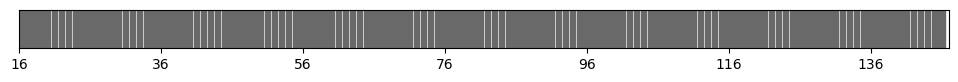

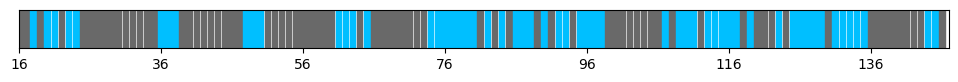

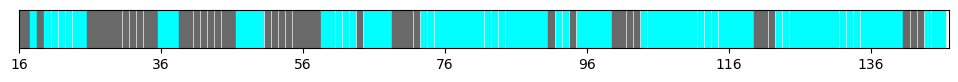

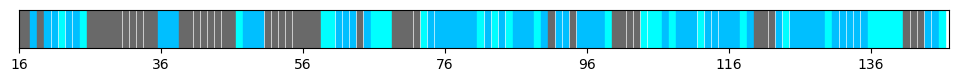

In [ ]:
##relative sasa 기준

import os
import pandas as pd
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 또는 CIF 파일 로드
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 {pdb_id}.cif 파일이 경로 {pdb_save_path}에 존재하지 않습니다.")

    return structure

# DSSP 분석 함수
def analyze_structure_with_dssp(structure, pdb_file_path):
    model = structure[0]  # 첫 번째 모델 사용
    dssp = DSSP(model, pdb_file_path)

    # DSSP 결과에서 잔기 번호, 이름, 노출 여부, 2차 구조 등 추출
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])

    return dssp_data

# 노출된 잔기 식별 (사용자가 설정한 접근성 임계값을 사용)
def identify_exposed_residues(dssp_data, accessibility_threshold=0):
    exposed_residues = []
    for data in dssp_data:
        residue_number = data[1]
        accessibility = data[4]
        if accessibility > accessibility_threshold:  # 노출 여부 판단
            exposed_residues.append(residue_number)
    return exposed_residues

# 노출된 잔기를 포함한 연속된 2차 구조 식별 및 저장
def identify_secondary_structures(dssp_data, exposed_residues):
    secondary_structure_data = []

    for exposed_residue in exposed_residues:
        dssp_residue_data = [data for data in dssp_data if data[1] == exposed_residue]

        if dssp_residue_data:
            chain_id, residue_number, residue_name, sec_structure, accessibility = dssp_residue_data[0]
            current_structure = sec_structure
            secondary_structure_data.append([residue_number, current_structure])

            # -1씩 뒤로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number - 1
            while i >= min(exposed_residues):
                prev_residue_data = [data for data in dssp_data if data[1] == i]
                if prev_residue_data and prev_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i -= 1

            # +1씩 앞으로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number + 1
            while i <= max(exposed_residues):
                next_residue_data = [data for data in dssp_data if data[1] == i]
                if next_residue_data and next_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i += 1

    df_secondary_structure = pd.DataFrame(secondary_structure_data, columns=['Residue Number', 'Secondary Structure'])
    return df_secondary_structure

def visualize_protein_sequence(dssp_data, pdb_id, chain_id, highlighted_residues=None, highlighted_secondary_structure=None, overlay=False):
    if highlighted_residues is None:
        highlighted_residues = []
    if highlighted_secondary_structure is None:
        highlighted_secondary_structure = []

    # 선택한 체인의 잔기만 필터링
    chain_residues = [data for data in dssp_data if data[0] == chain_id]

    # 시퀀스 길이 및 잔기 번호 리스트
    sequence_length = len(chain_residues)
    residue_numbers = [res[1] for res in chain_residues]


    # 시퀀스 시각화
    fig, ax = plt.subplots(figsize=(12, 0.5))
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='dimgrey', edgecolor='dimgrey')  # 기본 색상을 회색으로 설정

    ## 시퀀스 시각화
    #colors = ['black', 'grey'] # 색상 리스트 정의
    #fig, ax = plt.subplots(figsize=(10, 1))
    #bar = ax.bar(
    #    range(sequence_length),
    #    [1] * sequence_length,
    #    color=[colors[(i // 5) % 2] for i in range(sequence_length)],  # 5의 배수마다 색상을 변경
    #    edgecolor='black'
    #)

    # 강조 표시할 잔기 색상 변경
    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if residue_number in highlighted_secondary_structure:
            bar_segment.set_color('aqua')  # 2차 구조 덩어리 색상 설정
        if residue_number in highlighted_residues:
            bar_segment.set_color('deepskyblue')  # 노출된 잔기 색상 설정

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 20))
    ax.set_xticklabels(residue_numbers[::20])

    #ax.set_title(f'Grey: {pdb_id} {chain_id}, Red: exposed residues,and Orange: scondary structures having exposed residues')
    plt.show()


# 사용자 입력을 통한 조건 설정 및 분석 실행
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    # DSSP 분석 및 시각화 데이터 준비
    dssp_data = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))
    chain_id = input("시각화할 체인 ID를 입력하세요 (예: A): ").strip().upper()

    # 사용자로부터 SASA(접근 가능한 표면적) 임계값 입력 받기
    try:
        sasa_threshold = float(input("SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): ").strip())
    except ValueError:
        sasa_threshold = 0

    exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=sasa_threshold)
    secondary_structure_df = identify_secondary_structures(dssp_data, exposed_residues)

    # 개별 시각화
    visualize_protein_sequence(dssp_data, pdb_id, chain_id)  # 1. 기본 시퀀스
    visualize_protein_sequence(dssp_data, pdb_id, chain_id, highlighted_residues=exposed_residues)  # 2. 노출된 잔기
    visualize_protein_sequence(dssp_data, pdb_id, chain_id, highlighted_secondary_structure=secondary_structure_df['Residue Number'].tolist())  # 3. 연속된 2차 구조
    # 중첩 시각화
    visualize_protein_sequence(dssp_data, pdb_id, chain_id, highlighted_secondary_structure=secondary_structure_df['Residue Number'].tolist(), highlighted_residues=exposed_residues, overlay=True)  # 4. 중첩 시각화

if __name__ == "__main__":
    main()


PDB ID를 입력하세요: 5dn9
BioPython으로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' 구조 로드 완료.

PyMOL SASA 계산을 시작합니다. 결과는 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_ALLCHAINS_SASA_20250523.csv'에 저장됩니다.
PyMOL을 사용하여 SASA 계산 시작: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' 파일을 PyMOL 객체 'sasa_target'(으)로 로드했습니다.
총 722개의 고유한 잔기에 대해 SASA를 계산합니다.
SASA 결과가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_ALLCHAINS_SASA_20250523.csv' 파일로 성공적으로 저장되었습니다.

DSSP 분석을 위해 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' 파일을 사용합니다.

분석 및 시각화할 체인 ID를 입력하세요 (예: A). 모든 체인은 'ALL' 또는 빈칸 입력: ALL
Relative SASA (RSA) 임계값을 입력하세요 (0.0 ~ 1.0, 예: 0.25): 0.25

'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_ALLCHAINS_SASA_20250523.csv' 파일에서 RSA > 0.25 기준으로 노출된 잔기를 식별합니다.

모든 체인에 대해 분석 및 시각화를 진행합니다: ['A', 

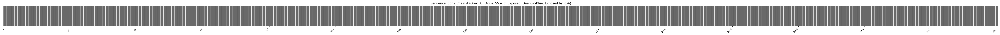

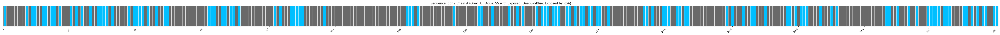

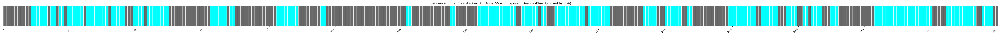

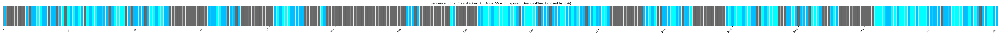


--- 체인 B 처리 중 ---
체인 B의 노출된 잔기 (RSA > 0.25): [1, 9, 11, 12, 15, 16, 18, 19, 25, 26, 27, 29, 31, 32, 35, 36, 37, 38, 40, 46, 48, 49, 50, 51, 56, 59, 60, 75, 76, 77, 80, 81, 83, 84, 86, 105, 106, 107, 108, 109, 117, 147, 148, 149, 151, 164, 173, 174, 178, 184, 187, 189, 190, 196, 197, 198, 200, 201, 202, 205, 206, 208, 210, 211, 213, 214, 216, 217, 220, 233, 234, 236, 241, 242, 245, 246, 248, 249, 263, 265, 269, 272, 273, 277, 285, 286, 288, 290, 291, 292, 294, 297, 301, 303, 321, 322, 325, 328, 329, 332, 336, 337, 338, 339, 340, 342, 343, 344, 349, 350, 352, 354, 356, 357, 360, 361]
체인 B의 노출된 잔기를 포함하는 연속된 2차 구조 잔기 번호:
 Residue Number Secondary Structure
             11                   G
             12                   G
             13                   G
             14                   G
             15                   G
             16                   G
             18                   T
             19                   T
             24                   T
             2

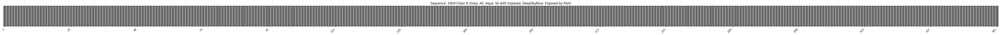

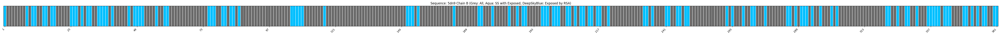

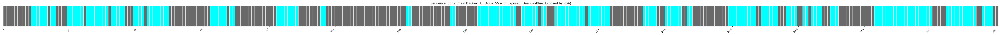

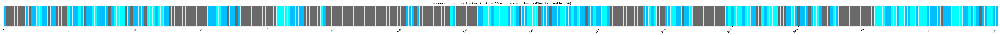

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP
import datetime

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# --- PyMOL SASA 계산 관련 ---
# 상대적 SASA 계산을 위한 표준 아미노산별 최대 SASA 값 (Å²)
# 출처: Tien et al., 2013, PLoS ONE 8(11): e80635 (Gly-X-Gly 펩타이드에서의 값)
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
    # 비표준 아미노산이나 다른 분자 타입에 대한 값은 필요에 따라 추가
}

def calculate_sasa_with_pymol(structure_file_path, pymol_object_name="sasa_target", output_csv_filename="residue_sasa.csv"):
    """
    PyMOL을 사용하여 주어진 구조 파일로부터 각 잔기의 SASA를 계산하고,
    체인 ID, 잔기 번호, SASA, 상대적 SASA를 CSV 파일로 출력합니다.
    """
    print(f"PyMOL을 사용하여 SASA 계산 시작: {structure_file_path}")
    sasa_results = []

    try:
        pymol.finish_launching(['pymol', '-cq'])
    except Exception as e:
        print(f"PyMOL 초기화 중 참고: {e}")

    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' 파일을 PyMOL 객체 '{pymol_object_name}'(으)로 로드했습니다.")

    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues_info = set()
    # PyMOL의 iterate_state는 현재 Python 네임스페이스의 변수에 접근할 수 있도록 space 인자를 사용합니다.
    # locals() 또는 globals()를 전달하여 Python 스크립트의 변수를 직접 수정할 수 있게 합니다.
    # 여기서는 iterate_state의 콜백 문자열이 실행되는 컨텍스트에 unique_residues_info가 있도록 합니다.
    # 더 안전한 방법은 cmd.get_model().atom을 순회하는 것이지만, iterate_state가 더 PyMOL 스럽습니다.
    # 이 스코프 문제를 해결하기 위해, iterate_state를 호출하는 곳의 로컬 변수로 unique_residues_info를 사용합니다.
    # PyMOL 2.0+ 에서는 space=locals() 또는 space=globals()가 잘 작동합니다.

    # 임시 저장소로 사용할 Python 리스트 (PyMOL 콜백에서 접근 가능하도록)
    _pymol_iterate_temp_storage = []
    selection_for_iteration_ca = f"{pymol_object_name} and polymer and name CA" # 단백질용
    selection_for_iteration_p = f"{pymol_object_name} and polymer and name P"  # 핵산용 (인산염)

    try:
        # 단백질 시도
        cmd.iterate_state(1, selection_for_iteration_ca, "_pymol_iterate_temp_storage.append((chain, resi, resn))", space=locals())
        if not _pymol_iterate_temp_storage: # CA가 없으면 핵산 시도
            cmd.iterate_state(1, selection_for_iteration_p, "_pymol_iterate_temp_storage.append((chain, resi, resn))", space=locals())

        # 그래도 없으면 전체 polymer 시도 (더 일반적이지만, 잔기당 여러 원자가 선택될 수 있어 set으로 고유성 보장)
        if not _pymol_iterate_temp_storage:
            print(f"경고: '{selection_for_iteration_ca}' 또는 '{selection_for_iteration_p}' 선택자에서 원자를 찾을 수 없습니다. 전체 중합체 원자로 다시 시도합니다.")
            cmd.iterate_state(1, f"{pymol_object_name} and polymer", "_pymol_iterate_temp_storage.append((chain, resi, resn))", space=locals())

        unique_residues_info = set(_pymol_iterate_temp_storage) # set으로 변환하여 고유한 (chain, resi, resn) 확보
        _pymol_iterate_temp_storage.clear() # 임시 저장소 비우기

    except pymol.CmdException as e:
        print(f"PyMOL iterate_state 중 오류: {e}. 잔기 정보를 가져오지 못했습니다.")
        cmd.delete(pymol_object_name)
        return

    if not unique_residues_info:
        print("경고: 구조에서 잔기 정보를 추출하지 못했습니다. SASA 계산을 중단합니다.")
        cmd.delete(pymol_object_name)
        return

    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residue_info)}개의 고유한 잔기에 대해 SASA를 계산합니다.")

    for chain_id, resi_str, resn in sorted_residue_info:
        try:
            resi_num = int(resi_str)
            residue_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            current_sasa = cmd.get_area(residue_selection)

            max_sasa_for_resn = MAX_SASA.get(resn.upper(), None)
            relative_sasa = "N/A"
            if max_sasa_for_resn is not None and max_sasa_for_resn > 0:
                relative_sasa = current_sasa / max_sasa_for_resn
            elif max_sasa_for_resn is None and resn.strip(): # 비어있지 않은 resn에 대해서만 경고
                print(f"참고: 잔기 '{resn}' (체인 {chain_id}, 번호 {resi_num})에 대한 MAX_SASA 값이 없습니다.")

            sasa_results.append([chain_id, resi_num, current_sasa, relative_sasa])
        except Exception as e:
            print(f"오류: 체인 {chain_id}, 잔기번호 {resi_str} ({resn}) SASA 계산 중 문제 발생 - {e}")
            sasa_results.append([chain_id, resi_str, "Error", "Error"])

    try:
        with open(output_csv_filename, 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA'])
            writer.writerows(sasa_results)
        print(f"SASA 결과가 '{output_csv_filename}' 파일로 성공적으로 저장되었습니다.")
    except IOError:
        print(f"오류: CSV 파일 '{output_csv_filename}'을 쓰는 데 실패했습니다.")
    finally:
        cmd.delete(pymol_object_name)

# --- 기존 함수들 ---
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser(QUIET=True) # 경고 메시지 줄이기
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser(QUIET=True) # 경고 메시지 줄이기
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 {pdb_id}.cif 파일이 경로 {save_path}에 존재하지 않습니다.")
    return structure

def analyze_structure_with_dssp(structure, pdb_file_path_for_dssp_header):
    # DSSP는 PDB 헤더 정보를 사용하므로, PDB 파일 경로가 필요할 수 있습니다.
    # CIF만 있다면, DSSP 실행 시 문제가 발생하거나 일부 정보가 누락될 수 있습니다.
    model = structure[0]
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp_header, dssp='mkdssp') # Colab에서는 mkdssp 경로 지정 필요할 수 있음
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP가 설치되어 있고 경로가 올바른지 확인하세요.")
        print("팁: Colab에서는 '!apt-get install dssp' 또는 '!conda install dssp -c salilab' 등으로 DSSP를 설치해야 할 수 있습니다.")
        return []


    dssp_data = []
    for key in dssp.keys(): # dssp.property_dict 대신 dssp.keys()와 인덱싱 사용 권장
        chain_id = key[0]
        residue_id_tuple = key[1] # (' ', 123, 'A') 형태 (hetero, seqnum, icode)

        residue_number = residue_id_tuple[1]
        # hetero_flag = residue_id_tuple[0] # H_ 등 이종 잔기 플래그
        # insertion_code = residue_id_tuple[2] # 삽입 코드

        # DSSP 튜플의 인덱스:
        # 0: DSSP index
        # 1: Amino acid (one-letter code)
        # 2: Secondary structure
        # 3: Relative ASA (Bio.PDB.DSSP가 계산한 값, 0-1 스케일일 수 있음)
        # 4: Phi
        # 5: Psi
        # ... (더 많은 정보가 있을 수 있음, 버전마다 다를 수 있음)

        dssp_entry = dssp[key]
        residue_name_one_letter = dssp_entry[1] # 아미노산 한 글자 코드
        secondary_structure = dssp_entry[2]

        # BioPython의 DSSP 결과에서 accessibility는 상대적인 값일 수 있음 (0.0~1.0)
        # 사용자의 원래 코드에서는 data[4] (즉, dssp_entry[3])를 사용했으므로 이를 따름
        # 이 값이 절대 SASA인지, 상대 SASA인지, 물분자 수인지는 DSSP 버전/출력에 따라 다를 수 있으므로 주의.
        # 여기서는 사용자의 기존 코드(data[4])를 존중하여 dssp_entry[3]을 사용합니다.
        accessibility_from_dssp = dssp_entry[3]

        # 아미노산 세 글자 코드로 변환 (필요시)
        # from Bio.PDB.Polypeptide import one_to_three
        # try:
        #     residue_name_three_letter = one_to_three(residue_name_one_letter)
        # except KeyError:
        #     residue_name_three_letter = residue_name_one_letter # 변환 실패 시 원래 코드 사용

        # 여기서는 dssp_data에 원래 코드처럼 아미노산 한 글자 코드를 저장합니다.
        dssp_data.append([chain_id, residue_number, residue_name_one_letter, secondary_structure, accessibility_from_dssp])
    return dssp_data

# --- Relative SASA 기준 노출 잔기 식별 함수 (PyMOL CSV 사용) ---
def identify_exposed_residues_from_csv(sasa_csv_path, rsa_threshold=0.25):
    """
    PyMOL로 계산된 SASA CSV 파일을 읽어, RSA 임계값 기준으로 노출된 잔기를 식별합니다.
    반환: {'ChainID': [res_num1, res_num2, ...], ...} 형태의 딕셔너리
    """
    exposed_residues_by_chain = {}
    if not os.path.exists(sasa_csv_path):
        print(f"경고: SASA CSV 파일 '{sasa_csv_path}'를 찾을 수 없습니다. 노출 잔기 분석을 건너뜁니다.")
        return exposed_residues_by_chain

    try:
        df_sasa = pd.read_csv(sasa_csv_path)
        # 'Relative_SASA' 컬럼이 문자열 'N/A' 또는 'Error'를 포함할 수 있으므로, 숫자형으로 변환 시도
        df_sasa['Relative_SASA_numeric'] = pd.to_numeric(df_sasa['Relative_SASA'], errors='coerce')

        for index, row in df_sasa.iterrows():
            chain_id = row['Chain']
            res_num = int(row['Residue_Number'])
            rsa = row['Relative_SASA_numeric']

            if pd.notna(rsa) and rsa > rsa_threshold:
                if chain_id not in exposed_residues_by_chain:
                    exposed_residues_by_chain[chain_id] = []
                exposed_residues_by_chain[chain_id].append(res_num)

        for chain_id in exposed_residues_by_chain: # 각 체인별로 잔기 번호 정렬
             exposed_residues_by_chain[chain_id].sort()

    except Exception as e:
        print(f"SASA CSV 파일 ('{sasa_csv_path}') 처리 중 오류: {e}")
    return exposed_residues_by_chain


# --- 개선된 연속된 2차 구조 식별 함수 ---
def identify_continuous_secondary_structures_for_chain(dssp_data_for_chain, chain_id, exposed_residues_in_chain):
    """
    주어진 체인에 대해, 노출된 잔기를 포함하는 연속된 2차 구조 세그먼트를 식별합니다.
    Args:
        dssp_data_for_chain (list): 특정 체인에 대한 DSSP 데이터 리스트.
                                   각 요소는 [chain, res_num, res_name, sec_struct, accessibility, (rsa_if_added)] 형식.
        chain_id (str): 현재 처리 중인 체인 ID.
        exposed_residues_in_chain (list): 해당 체인 내의 노출된 잔기 번호 리스트.
    Returns:
        pd.DataFrame: ['Residue Number', 'Secondary Structure', 'Chain ID'] 컬럼을 가진 데이터프레임.
    """
    if not dssp_data_for_chain:
        return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])

    # 잔기 번호를 키로, 2차 구조 정보를 값으로 하는 맵 생성
    # dssp_data_for_chain의 각 요소는 [chain, res_num, res_name, sec_struct, accessibility, ...] 형태
    residue_to_ss_map = {data[1]: data[3] for data in dssp_data_for_chain if data[0] == chain_id}

    all_chain_residue_numbers = sorted(residue_to_ss_map.keys())
    if not all_chain_residue_numbers:
        return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])

    min_res_num_in_chain = all_chain_residue_numbers[0]
    max_res_num_in_chain = all_chain_residue_numbers[-1]

    identified_ss_segments_data = []
    # 이미 하나의 세그먼트에 포함된 것으로 처리된 잔기들을 추적
    processed_in_any_segment = set()

    # 노출된 잔기들을 기준으로 순회 (정렬된 상태로)
    for exposed_res_num in sorted(list(set(exposed_residues_in_chain))):
        if exposed_res_num in processed_in_any_segment or exposed_res_num not in residue_to_ss_map:
            continue # 이미 다른 세그먼트의 일부로 처리되었거나, 해당 잔기 정보가 없으면 건너뜀

        current_ss_at_exposed_res = residue_to_ss_map[exposed_res_num]
        # 유효한 2차 구조인지 확인 (예: 'H', 'E', 'G', 'I', 'T', 'S', 'B'. 공백이나 '-'는 제외)
        # DSSP 2차 구조 코드: H=alpha_helix, B=beta_bridge, E=extended_strand, G=3_10_helix, I=pi_helix, T=hydrogen_bonded_turn, S=bend, ' '=loop/irregular
        valid_ss_codes = {'H', 'B', 'E', 'G', 'I', 'T', 'S'}
        if not current_ss_at_exposed_res or current_ss_at_exposed_res.strip() not in valid_ss_codes :
            continue

        # 현재 노출된 잔기에서 시작하여 양쪽으로 동일한 2차 구조 확장
        segment_start = exposed_res_num
        while segment_start - 1 >= min_res_num_in_chain and \
              residue_to_ss_map.get(segment_start - 1) == current_ss_at_exposed_res:
            segment_start -= 1

        segment_end = exposed_res_num
        while segment_end + 1 <= max_res_num_in_chain and \
              residue_to_ss_map.get(segment_end + 1) == current_ss_at_exposed_res:
            segment_end += 1

        # 찾은 세그먼트의 모든 잔기들을 결과에 추가 (아직 추가되지 않았다면)
        for i in range(segment_start, segment_end + 1):
            if i not in processed_in_any_segment: # 중복 추가 방지
                 identified_ss_segments_data.append([i, current_ss_at_exposed_res, chain_id])
            processed_in_any_segment.add(i) # 이 잔기는 이제 어떤 세그먼트에든 포함된 것으로 처리

    if not identified_ss_segments_data:
         return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])

    df = pd.DataFrame(identified_ss_segments_data, columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    # DataFrame 수준에서 최종 중복 제거 및 정렬
    return df.drop_duplicates().sort_values(by=['Chain ID', 'Residue Number']).reset_index(drop=True)


def visualize_protein_sequence(dssp_data_for_chain, pdb_id, chain_id,
                               highlighted_exposed_residues_in_chain=None,
                               highlighted_ss_residues_in_chain=None,
                               overlay=False): # overlay 인자는 현재 명시적 사용 안함
    if highlighted_exposed_residues_in_chain is None:
        highlighted_exposed_residues_in_chain = []
    if highlighted_ss_residues_in_chain is None:
        highlighted_ss_residues_in_chain = []

    # dssp_data_for_chain은 이미 특정 체인에 대한 데이터라고 가정 (main에서 필터링 후 전달)
    if not dssp_data_for_chain:
        print(f"체인 '{chain_id}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
        return

    sequence_length = len(dssp_data_for_chain)
    residue_numbers_in_chain = [res[1] for res in dssp_data_for_chain] # data[1]은 잔기 번호

    if sequence_length == 0:
        print(f"체인 '{chain_id}'에 잔기가 없어 시각화를 건너뜁니다.")
        return

    fig, ax = plt.subplots(figsize=(max(15, sequence_length * 0.15), 2)) # 길이에 따라 너비 조절
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='dimgrey', edgecolor='dimgrey')

    # 강조 표시 (색상 중첩 순서 주의: SS 먼저, 그 위에 노출 잔기)
    for i, (actual_residue_number, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
        if actual_residue_number in highlighted_ss_residues_in_chain:
            bar_segment.set_color('aqua')  # 2차 구조 덩어리 색상
        if actual_residue_number in highlighted_exposed_residues_in_chain: # 노출 잔기가 더 중요하면 나중에 덮어씀
            bar_segment.set_color('deepskyblue')  # 노출된 잔기 색상

    ax.set_xlim(-0.5, sequence_length - 0.5)
    ax.set_ylim(0, 1)
    ax.set_yticks([])

    tick_interval = max(1, sequence_length // 15) # 대략 15개의 눈금이 보이도록 간격 조절
    ax.set_xticks(range(0, sequence_length, tick_interval))
    ax.set_xticklabels([residue_numbers_in_chain[j] for j in range(0, sequence_length, tick_interval)], rotation=45, ha="right")

    ax.set_title(f'Sequence: {pdb_id} Chain {chain_id} (Grey: All, Aqua: SS with Exposed, DeepSkyBlue: Exposed by RSA)')
    plt.tight_layout() # 레이아웃 조절
    plt.show()


def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()

    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    actual_structure_file_path = None
    if os.path.exists(pdb_file_path_pdb):
        actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif):
        actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: {pdb_id_input}.pdb 또는 {pdb_id_input}.cif 파일이 경로 '{pdb_save_path}'에 존재하지 않습니다.")
        return

    # BioPython 구조체 로드
    try:
        structure = load_structure(pdb_id_input, pdb_save_path)
        print(f"BioPython으로 '{actual_structure_file_path}' 구조 로드 완료.")
    except FileNotFoundError as e:
        print(f"구조 로딩 실패: {e}")
        return
    except Exception as e:
        print(f"BioPython 구조 로딩 중 예상치 못한 오류: {e}")
        return

    # --- PyMOL을 사용한 SASA 계산 및 CSV 저장 ---
    # 이 부분은 항상 모든 체인에 대해 CSV를 생성합니다.
    sasa_csv_full_path = "" # 초기화
    if actual_structure_file_path:
        today_date_str = datetime.date.today().strftime("%Y%m%d")
        # 파일명에는 특정 체인 ID 대신 "ALL" 또는 PDB ID만 사용 (모든 체인 정보 포함하므로)
        sasa_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_{today_date_str}.csv"
        sasa_csv_full_path = os.path.join(pdb_save_path, sasa_csv_filename)
        print(f"\nPyMOL SASA 계산을 시작합니다. 결과는 '{sasa_csv_full_path}'에 저장됩니다.")
        calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_csv_full_path)
    else:
        print("SASA 계산을 위한 구조 파일을 찾을 수 없습니다.") # 이전에 return 되어야 함

    # --- DSSP 분석 ---
    dssp_data = []
    # DSSP는 PDB 파일을 선호. CIF만 있는 경우, DSSP 실행 파일이 CIF를 직접 지원하거나 PDB로 변환 필요.
    dssp_input_file = pdb_file_path_pdb if os.path.exists(pdb_file_path_pdb) else actual_structure_file_path

    if os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data = analyze_structure_with_dssp(structure, dssp_input_file)
            if not dssp_data:
                print("경고: DSSP 분석 결과 데이터가 없습니다.")
        except Exception as e:
            print(f"DSSP 분석 중 오류 발생: {e}")
    else:
        print(f"경고: DSSP 분석에 필요한 파일 '{dssp_input_file}'을 찾을 수 없어 DSSP 분석을 건너뜁니다.")

    # --- 사용자 입력 및 분석/시각화 ---
    chain_input_for_viz = input(f"\n분석 및 시각화할 체인 ID를 입력하세요 (예: A). 모든 체인은 'ALL' 또는 빈칸 입력: ").strip().upper()

    try:
        rsa_threshold = float(input("Relative SASA (RSA) 임계값을 입력하세요 (0.0 ~ 1.0, 예: 0.25): ").strip())
        if not (0.0 <= rsa_threshold <= 1.0):
            print("RSA 임계값은 0.0과 1.0 사이여야 합니다. 기본값 0.25를 사용합니다.")
            rsa_threshold = 0.25
    except ValueError:
        print("잘못된 RSA 임계값입니다. 기본값 0.25를 사용합니다.")
        rsa_threshold = 0.25

    # PyMOL CSV에서 RSA 기반 노출 잔기 식별 (모든 체인 대상)
    exposed_residues_by_chain_from_csv = {}
    if sasa_csv_full_path and os.path.exists(sasa_csv_full_path):
        print(f"\n'{sasa_csv_full_path}' 파일에서 RSA > {rsa_threshold} 기준으로 노출된 잔기를 식별합니다.")
        exposed_residues_by_chain_from_csv = identify_exposed_residues_from_csv(sasa_csv_full_path, rsa_threshold)
    else:
        print("SASA CSV 파일이 없어 RSA 기반 노출 잔기를 식별할 수 없습니다.")

    # 처리할 체인 목록 결정
    chains_to_process = []
    if not chain_input_for_viz or chain_input_for_viz == "ALL":
        if dssp_data:
            unique_chains_in_dssp = sorted(list(set(data_item[0] for data_item in dssp_data)))
            if unique_chains_in_dssp:
                chains_to_process = unique_chains_in_dssp
                print(f"\n모든 체인에 대해 분석 및 시각화를 진행합니다: {chains_to_process}")
            else:
                print("DSSP 데이터에서 처리할 체인 정보를 찾을 수 없습니다.")
        else: # DSSP 데이터가 없으면, SASA CSV의 체인 정보를 사용 시도
            if exposed_residues_by_chain_from_csv:
                 chains_to_process = sorted(list(exposed_residues_by_chain_from_csv.keys()))
                 if chains_to_process:
                     print(f"\nDSSP 데이터가 없어 SASA CSV의 체인 정보를 사용합니다: {chains_to_process}")
                 else:
                     print("SASA CSV에서도 처리할 체인 정보를 찾을 수 없습니다.")
            else:
                print("처리할 체인 정보를 찾을 수 없습니다 (DSSP 데이터 및 SASA CSV 모두 확인 필요).")
    else:
        chains_to_process = [chain_input_for_viz]
        print(f"\n체인 '{chain_input_for_viz}'에 대해 분석 및 시각화를 진행합니다.")

    # 선택된 각 체인에 대해 분석 및 시각화
    for current_chain_id in chains_to_process:
        print(f"\n--- 체인 {current_chain_id} 처리 중 ---")

        dssp_data_current_chain = [data for data in dssp_data if data[0] == current_chain_id]

        # RSA 기반 노출 잔기 (현재 체인)
        exposed_residues_rsa_current_chain = exposed_residues_by_chain_from_csv.get(current_chain_id, [])
        if exposed_residues_rsa_current_chain:
            print(f"체인 {current_chain_id}의 노출된 잔기 (RSA > {rsa_threshold}): {exposed_residues_rsa_current_chain}")
        else:
            print(f"체인 {current_chain_id}에는 RSA > {rsa_threshold} 임계값을 만족하는 노출된 잔기가 없습니다.")

        # 2차 구조 식별 (현재 체인, RSA 노출 잔기 기준)
        secondary_structure_df_current_chain = pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
        if dssp_data_current_chain and exposed_residues_rsa_current_chain:
            secondary_structure_df_current_chain = identify_continuous_secondary_structures_for_chain(
                dssp_data_current_chain,
                current_chain_id,
                exposed_residues_rsa_current_chain
            )
            if not secondary_structure_df_current_chain.empty:
                print(f"체인 {current_chain_id}의 노출된 잔기를 포함하는 연속된 2차 구조 잔기 번호:\n{secondary_structure_df_current_chain[['Residue Number', 'Secondary Structure']].to_string(index=False)}")
            else:
                print(f"체인 {current_chain_id}에는 노출된 잔기를 포함하는 유효한 2차 구조 세그먼트가 없습니다.")
        elif not dssp_data_current_chain:
             print(f"체인 {current_chain_id}에 대한 DSSP 데이터가 없어 2차 구조 분석을 건너뜁니다.")
        else: # exposed_residues_rsa_current_chain is empty
            print(f"체인 {current_chain_id}에 RSA 기반 노출 잔기가 없어 2차 구조 분석을 건너뜁니다.")


        # 시각화 (현재 체인)
        if dssp_data_current_chain:
            ss_residues_for_viz = []
            if not secondary_structure_df_current_chain.empty:
                 ss_residues_for_viz = secondary_structure_df_current_chain['Residue Number'].tolist()

            print(f"\n체인 {current_chain_id} 시각화:")
            # 1. 기본 시퀀스
            visualize_protein_sequence(dssp_data_current_chain, pdb_id_input, current_chain_id,
                                       highlighted_exposed_residues_in_chain=[],
                                       highlighted_ss_residues_in_chain=[])
            # 2. 노출된 잔기 (RSA 기준)
            visualize_protein_sequence(dssp_data_current_chain, pdb_id_input, current_chain_id,
                                       highlighted_exposed_residues_in_chain=exposed_residues_rsa_current_chain,
                                       highlighted_ss_residues_in_chain=[])
            # 3. 연속된 2차 구조 (노출 잔기 포함)
            visualize_protein_sequence(dssp_data_current_chain, pdb_id_input, current_chain_id,
                                       highlighted_exposed_residues_in_chain=[],
                                       highlighted_ss_residues_in_chain=ss_residues_for_viz)
            # 4. 중첩 시각화
            visualize_protein_sequence(dssp_data_current_chain, pdb_id_input, current_chain_id,
                                       highlighted_exposed_residues_in_chain=exposed_residues_rsa_current_chain,
                                       highlighted_ss_residues_in_chain=ss_residues_for_viz,
                                       overlay=True) # overlay 인자는 현재 시각적 변화 없음
        else:
            print(f"체인 {current_chain_id}에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")

if __name__ == "__main__":
    # Colab 환경 설정 주석 (필요시 사용자에게 안내)
    # print("Colab 환경에서 PyMOL 및 DSSP를 사용하려면 먼저 관련 패키지 설치가 필요할 수 있습니다.")
    # print("PyMOL 예시: !pip install -q condacolab; import condacolab; condacolab.install(); !mamba install -c schrodinger pymol-open-source -y")
    # print("DSSP 예시: !apt-get install dssp # 또는 !conda install dssp -c salilab")
    main()



Exception ignored in: <function tqdm.__del__ at 0x78a87d3f5940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/site-packages/tqdm/std.py", line 1148, in __del__
    self.close()
  File "/usr/local/lib/python3.11/site-packages/tqdm/notebook.py", line 279, in close
    self.disp(bar_style='danger', check_delay=False)
    ^^^^^^^^^
AttributeError: 'tqdm_notebook' object has no attribute 'disp'


PDB ID를 입력하세요: 5dn9


/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11912.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11986.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 12060.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12590.
  warnings.warn(


시각화할 체인 ID를 입력하세요 (예: A): A
SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): 0.25

체인 A의 전체 표면적: 13398.68
임계값 이상 & 노출된 잔기 & hydrophobic 부분 표면적: 588.37
A 그룹 (전체 체인) 잔기 개수: 361, SASA 합: 80.32
B 그룹 (노출된 잔기) 잔기 개수: 268, SASA 합: 135.42
C 그룹 (노출된 잔기를 포함하는 2차 구조) 잔기 개수: 460, SASA 합: 149.54

비율 계산:
B/A 잔기 비율: 74.24%
C/A 잔기 비율: 127.42%
B/C 잔기 비율: 58.26%
B/A SASA 비율: 168.60%
C/A SASA 비율: 186.19%
B/C SASA 비율: 90.55%


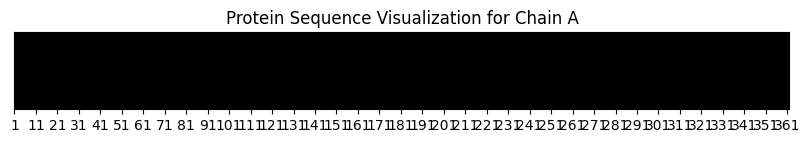

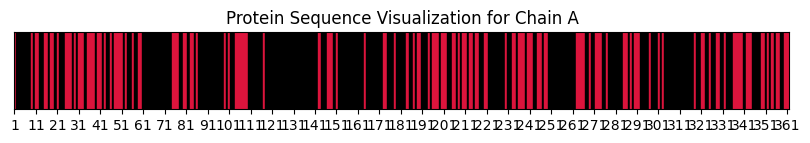

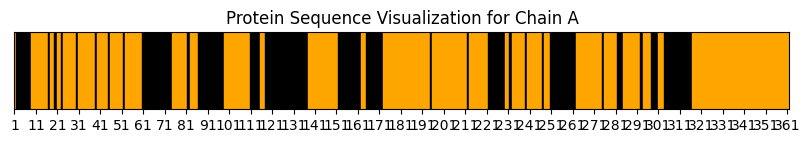

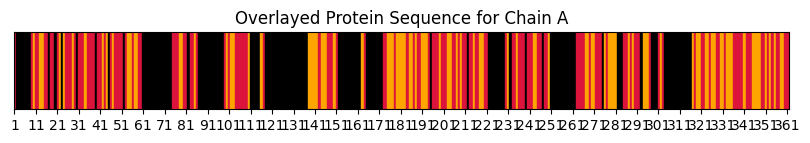

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP
from pymol import cmd

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 또는 CIF 파일 로드
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 {pdb_id}.cif 파일이 경로 {pdb_save_path}에 존재하지 않습니다.")

    return structure

# DSSP 분석 함수
def analyze_structure_with_dssp(structure, pdb_file_path):
    model = structure[0]  # 첫 번째 모델 사용
    dssp = DSSP(model, pdb_file_path)

    # DSSP 결과에서 잔기 번호, 이름, 노출 여부, 2차 구조 등 추출
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])

    return dssp_data

 # 표면적 계산
hydrophobic_selection = ("(resn arg and name cg+cb) + (resn gln and name cg+cb) + (resn glu and name cg+cb) + "
                        "(resn ile and name cg1+cg2+cd1+cb) + (resn leu and name cg+cd1+cd2+cb) + "
                        "(resn lys and name cg+cd+cb) + (resn met and name cg+ce+cb) + "
                        "(resn phe and name cg+cd1+ce1+cz+ce2+cd2+cb) + (resn pro and name cg+cb) + "
                        "(resn thr and name cg2) + (resn trp and name cg+cd2+cz2+ch2+cz3+ce3+cb) + "
                        "(resn tyr and name cg+ce1+cd1+ce2+cd2+cb) + (resn val and name cg1+cg2+cb) + "
                        "(resn asn and name cb) + (resn ala and name cb) + (resn asp and name cb) + "
                        "(resn his and name cb) + (resn cys and name cb)")

# 노출된 잔기 식별 (사용자가 설정한 접근성 임계값을 사용)
def identify_exposed_residues(dssp_data, accessibility_threshold=0):
    exposed_residues = []
    for data in dssp_data:
        residue_number = data[1]
        accessibility = data[4]
        if accessibility > accessibility_threshold:  # 노출 여부 판단
            exposed_residues.append(residue_number)
    return exposed_residues

# 노출된 잔기를 포함한 연속된 2차 구조 식별 및 저장
def identify_secondary_structures(dssp_data, exposed_residues):
    secondary_structure_data = []

    # 1. 노출된 residue들로 반복
    for exposed_residue in exposed_residues:
        # 2차 구조 데이터 가져오기
        dssp_residue_data = [data for data in dssp_data if data[1] == exposed_residue]

        if dssp_residue_data:
            chain_id, residue_number, residue_name, sec_structure, accessibility = dssp_residue_data[0]
            # 현재 노출된 잔기와 동일한 2차 구조 값으로 초기화
            current_structure = sec_structure
            secondary_structure_data.append([residue_number, current_structure])

            # 3-3. -1씩 뒤로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number - 1
            while i >= min(exposed_residues):
                prev_residue_data = [data for data in dssp_data if data[1] == i]
                if prev_residue_data and prev_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i -= 1

            # 3-4. +1씩 앞으로 가며 동일한 2차 구조를 가지는 잔기들 찾기
            i = residue_number + 1
            while i <= max(exposed_residues):
                next_residue_data = [data for data in dssp_data if data[1] == i]
                if next_residue_data and next_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i += 1

    # 데이터프레임으로 저장
    df_secondary_structure = pd.DataFrame(secondary_structure_data, columns=['Residue Number', 'Secondary Structure'])
    return df_secondary_structure

# 시각화 함수
def visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=None, highlighted_secondary_structure=None, overlay=False):
    if highlighted_residues is None:
        highlighted_residues = []
    if highlighted_secondary_structure is None:
        highlighted_secondary_structure = []

    # 선택한 체인의 잔기만 필터링
    chain_residues = [data for data in dssp_data if data[0] == chain_id]

    # 시퀀스 길이 및 잔기 번호 리스트
    sequence_length = len(chain_residues)
    residue_numbers = [res[1] for res in chain_residues]

    # 시퀀스 시각화
    fig, ax = plt.subplots(figsize=(10, 1))  # 그래프 크기 조절
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='black', edgecolor='black')  # 기본 색상을 검정색으로 설정

    # 강조 표시할 잔기 색상 변경
    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if overlay:
            if residue_number in highlighted_residues:
                bar_segment.set_color('crimson')  # 노출된 잔기 색상 설정
            elif residue_number in highlighted_secondary_structure:
                bar_segment.set_color('orange')  # 2차 구조 덩어리 색상 설정
        else:
            if residue_number in highlighted_residues:
                bar_segment.set_color('crimson')  # 노출된 잔기 색상 설정
            elif residue_number in highlighted_secondary_structure:
                bar_segment.set_color('orange')  # 2차 구조 덩어리 색상 설정

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 10))
    ax.set_xticklabels(residue_numbers[::10])

    if overlay:
        ax.set_title(f'Overlayed Protein Sequence for Chain {chain_id}')
    else:
        ax.set_title(f'Protein Sequence Visualization for Chain {chain_id}')
    plt.show()

# get_area 설정 및 사용 함수
def calculate_areas(pdb_id, chain_id):
    cmd.reinitialize()

    # PDB 파일 로드
    pdb_file_path = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
    cmd.load(pdb_file_path)
    cmd.remove('solvent')  # Solvent 제거

    # PyMOL에서 SASA 계산을 위한 설정
    cmd.set('dot_solvent', 1)
    cmd.set('dot_density', 4)

    total_area = cmd.get_area(selection=f'chain {chain_id}')
    cmd.select('hydrophobic', f'chain {chain_id} and ({hydrophobic_selection})')
    hydrophobic_area = cmd.get_area(selection='hydrophobic')

    return total_area, hydrophobic_area

# 사용자 입력을 통한 조건 설정 및 분석 실행
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    # DSSP 분석 및 시각화 데이터 준비
    dssp_data = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))
    chain_id = input("시각화할 체인 ID를 입력하세요 (예: A): ").strip().upper()

    # 사용자로부터 SASA(접근 가능한 표면적) 임계값 입력 받기
    try:
        sasa_threshold = float(input("SASA(접근 가능한 표면적)의 임계값을 입력하세요 (기본값: 0): ").strip())
    except ValueError:
        sasa_threshold = 0

    # 노출된 잔기 및 2차 구조 식별
    exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=sasa_threshold)
    secondary_structure_df = identify_secondary_structures(dssp_data, exposed_residues)

    # 면적 계산
    total_area, hydrophobic_area = calculate_areas(pdb_id, chain_id)

    # 결과 출력
    print(f"\n체인 {chain_id}의 전체 표면적: {total_area:.2f}")
    print(f"임계값 이상 & 노출된 잔기 & hydrophobic 부분 표면적: {hydrophobic_area:.2f}")

    # 그룹별 계산 및 비율
    A_group_residues = [residue for residue in dssp_data if residue[0] == chain_id]
    A_count = len(A_group_residues)
    A_sasa_sum = sum([residue[4] for residue in A_group_residues])

    B_group_residues = [residue for residue in dssp_data if residue[1] in exposed_residues]
    B_count = len(B_group_residues)
    B_sasa_sum = sum([residue[4] for residue in B_group_residues])

    C_group_residues = [residue for residue in dssp_data if residue[1] in secondary_structure_df['Residue Number'].tolist()]
    C_count = len(C_group_residues)
    C_sasa_sum = sum([residue[4] for residue in C_group_residues])

    print(f"A 그룹 (전체 체인) 잔기 개수: {A_count}, SASA 합: {A_sasa_sum:.2f}")
    print(f"B 그룹 (노출된 잔기) 잔기 개수: {B_count}, SASA 합: {B_sasa_sum:.2f}")
    print(f"C 그룹 (노출된 잔기를 포함하는 2차 구조) 잔기 개수: {C_count}, SASA 합: {C_sasa_sum:.2f}")

    # 비율 계산
    B_to_A_ratio_count = B_count / A_count if A_count > 0 else 0
    C_to_A_ratio_count = C_count / A_count if A_count > 0 else 0
    B_to_C_ratio_count = B_count / C_count if C_count > 0 else 0

    B_to_A_ratio_sasa = B_sasa_sum / A_sasa_sum if A_sasa_sum > 0 else 0
    C_to_A_ratio_sasa = C_sasa_sum / A_sasa_sum if A_sasa_sum > 0 else 0
    B_to_C_ratio_sasa = B_sasa_sum / C_sasa_sum if C_sasa_sum > 0 else 0

    print(f"\n비율 계산:")
    print(f"B/A 잔기 비율: {B_to_A_ratio_count:.2%}")
    print(f"C/A 잔기 비율: {C_to_A_ratio_count:.2%}")
    print(f"B/C 잔기 비율: {B_to_C_ratio_count:.2%}")

    print(f"B/A SASA 비율: {B_to_A_ratio_sasa:.2%}")
    print(f"C/A SASA 비율: {C_to_A_ratio_sasa:.2%}")
    print(f"B/C SASA 비율: {B_to_C_ratio_sasa:.2%}")

    # 개별 시각화
    visualize_protein_sequence(dssp_data, chain_id)  # 1. 기본 시퀀스
    visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=exposed_residues)  # 2. 노출된 잔기
    visualize_protein_sequence(dssp_data, chain_id, highlighted_secondary_structure=secondary_structure_df['Residue Number'].tolist())  # 3. 연속된 2차 구조
    # 중첩 시각화
    visualize_protein_sequence(dssp_data, chain5ㅇ_id, highlighted_secondary_structure=secondary_structure_df['Residue Number'].tolist(), highlighted_residues=exposed_residues, overlay=True)  # 4. 중첩 시각화

if __name__ == "__main__":
    main()


#SASA 계산, 시퀀스 넘버들 수동 입력

넓이 비율 계산
rSA가 아님, 별로 의미 없는 값임 hydrphobic 넓이 구하는데 만족



In [ ]:
from pymol import cmd

def calculate_hydrophobic_areas(pdb_id, chain_id, sasa_threshold=0):
    pdb_file_path = os.path.join(pdb_save_path, f"{pdb_id}.pdb")

    if not os.path.exists(pdb_file_path):
        print(f"{pdb_id}.pdb 파일이 존재하지 않습니다.")
        return

    # PyMOL 초기화
    cmd.reinitialize()
    cmd.load(pdb_file_path)

    # 전체 표면적과 hydrophobic 부분의 표면적 계산
    hydrophobic_selection = (
        "(resn arg and name cg+cb) + (resn gln and name cg+cb) + (resn glu and name cg+cb) + "
        "(resn ile and name cg1+cg2+cd1+cb) + (resn leu and name cg+cd1+cd2+cb) + "
        "(resn lys and name cg+cd+cb) + (resn met and name cg+ce+cb) + "
        "(resn phe and name cg+cd1+ce1+cz+ce2+cd2+cb) + (resn pro and name cg+cb) + "
        "(resn thr and name cg2) + (resn trp and name cg+cd2+cz2+ch2+cz3+ce3+cb) + "
        "(resn tyr and name cg+ce1+cd1+ce2+cd2+cb) + (resn val and name cg1+cg2+cb) + "
        "(resn asn and name cb) + (resn ala and name cb) + (resn asp and name cb) + "
        "(resn his and name cb) + (resn cys and name cb)"
    )

    # 올바르게 선택 문자열을 구성
    cmd.select('hydrophobic', f'chain {chain_id} and ({hydrophobic_selection})')

    # PyMOL에서 면적 계산
    cmd.set('dot_solvent', 1)
    cmd.set('dot_density', 4)

    total_area = cmd.get_area(selection=f'chain {chain_id}')
    hydrophobic_area = cmd.get_area(selection='hydrophobic')

    print(f"체인 {chain_id}의 전체 표면적: {total_area:.2f}")
    print(f"체인 {chain_id}의 노출된 hydrophobic 부분 표면적: {hydrophobic_area:.2f}")
    print(f"체인 {chain_id}의 비율 (노출된 hydrophobic 부분 / 전체 표면적): {(hydrophobic_area/total_area)*100:.2f}%")

    # SASA 임계값에 따른 선택 및 계산
    if sasa_threshold > 0:
        sasa_selection = f'(chain {chain_id} and ({hydrophobic_selection}) and b > {sasa_threshold})'
        cmd.select('threshold_hydrophobic', sasa_selection)
        threshold_total_area = cmd.get_area(selection=sasa_selection)
        threshold_hydrophobic_area = cmd.get_area(selection='threshold_hydrophobic')

        print(f"임계값 조건에 해당하는 부분의 노출된 전체 면적: {threshold_total_area:.2f}")
        print(f"임계값 조건에 해당하는 부분 중 노출된 hydrophobic 부분 표면적: {threshold_hydrophobic_area:.2f}")
        print(f"비율1 (노출된 hydrophobic 부분 / 노출된 전체 면적): {(threshold_hydrophobic_area/threshold_total_area)*100:.2f}%")

# 함수 호출 예시
pdb_id = input("PDB ID를 입력하세요: ").strip().lower()
chain_id = input("Chain ID를 입력하세요: ").strip().upper()
sasa_threshold = float(input("SASA 임계값을 입력하세요 (기본값: 0): ").strip() or 0)

calculate_hydrophobic_areas(pdb_id, chain_id, sasa_threshold)


PDB ID를 입력하세요: 5dn9
Chain ID를 입력하세요: A,B
SASA 임계값을 입력하세요 (기본값: 0): 0.25
체인 A,B의 전체 표면적: 26747.25
체인 A,B의 노출된 hydrophobic 부분 표면적: 1192.88
체인 A,B의 비율 (노출된 hydrophobic 부분 / 전체 표면적): 4.46%
임계값 조건에 해당하는 부분의 노출된 전체 면적: 1192.88
임계값 조건에 해당하는 부분 중 노출된 hydrophobic 부분 표면적: 1192.88
비율1 (노출된 hydrophobic 부분 / 노출된 전체 면적): 100.00%


# 총괄 master csv 작성 (0525)

(피쳐 정보)
chain_id	residue_number	atom_count	ca_bfactor	dssp_accessibility	dssp_secondary_structure	is_active_site	residue_name_1L	residue_name_3L	sasa_absolute	sasa_relative

예시)
A	1	19	16.62	0.4840425532	-			MET	96.66631317	0.4738544763





스크립트 시작. Colab 환경에서 PyMOL/DSSP를 사용하려면 관련 패키지 설치가 필요할 수 있습니다.
PDB ID를 입력하세요: 5dn9
BioPython으로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' 구조 로드 완료.

PyMOL SASA 계산을 시작합니다. 결과는 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_ALLCHAINS_SASA_20250523.csv'에 저장됩니다.
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_ALLCHAINS_SASA_20250523.csv' 파일이 이미 존재합니다. 덮어쓰시겠습니까? (y/N): N
기존 SASA 파일을 사용합니다.

DSSP 분석을 위해 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' 파일을 사용합니다.

--- 마스터 CSV 생성을 위한 필드 선택 ---
사용 가능한 필드:
  1. chain_id                       : Chain identifier (A, B, …)
  2. residue_number                 : Residue sequence number
  3. residue_name_3L                : Three-letter amino-acid/nucleotide code
  4. residue_name_1L                : One-letter amino-acid code (3-letter for non-standard)
  5. is_active_site                 : True if residue listed in PDB SITE records
  6. atom_count       

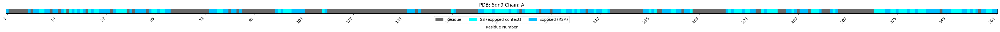


--- 체인 B 시각화 (RSA 임계값: 0.25) ---


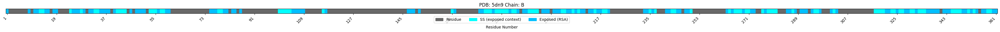

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
import datetime
from pathlib import Path # Added for Path object operations
from typing import List, Dict, Tuple, Set, Any, Callable # Added for type hinting

# 작업할 폴더 경로 설정 (기존 코드)
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# --- PyMOL SASA 계산 관련 (기존 코드) ---
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

def calculate_sasa_with_pymol(structure_file_path, pymol_object_name="sasa_target", output_csv_filename="residue_sasa.csv"):
    print(f"PyMOL을 사용하여 SASA 계산 시작: {structure_file_path}")
    sasa_results = []
    try:
        pymol.finish_launching(['pymol', '-cq'])
    except Exception as e:
        print(f"PyMOL 초기화 중 참고: {e}")

    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' 파일을 PyMOL 객체 '{pymol_object_name}'(으)로 로드했습니다.")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    _pymol_iterate_temp_storage = [] # To be accessible by iterate_state's exec string
    # Define selections for different molecule types
    sel_protein = f"{pymol_object_name} and polymer and name CA"
    sel_na = f"{pymol_object_name} and polymer and (name P or name C1* or name C1')" # Common backbone/sugar atoms for NA
    sel_generic_polymer = f"{pymol_object_name} and polymer"

    # Attempt to get unique residues by iterating over representative atoms
    try:
        cmd.iterate_state(1, sel_protein, "_pymol_iterate_temp_storage.append((chain, resi, resn))", space=locals())
        if not _pymol_iterate_temp_storage:
            cmd.iterate_state(1, sel_na, "_pymol_iterate_temp_storage.append((chain, resi, resn))", space=locals())
        if not _pymol_iterate_temp_storage: # Fallback to all polymer atoms if specific ones not found
            print(f"경고: 대표 원자(CA, P, C1*)를 찾을 수 없습니다. 전체 중합체 원자로 잔기 정보 추출을 시도합니다.")
            # This might add multiple entries per residue if not careful, so use set later
            cmd.iterate_state(1, sel_generic_polymer, "_pymol_iterate_temp_storage.append((chain, resi, resn))", space=locals())

        unique_residues_info = set(_pymol_iterate_temp_storage)
        _pymol_iterate_temp_storage.clear()

    except pymol.CmdException as e:
        print(f"PyMOL iterate_state 중 오류: {e}. 잔기 정보를 가져오지 못했습니다.")
        cmd.delete(pymol_object_name)
        return

    if not unique_residues_info:
        print("경고: 구조에서 잔기 정보를 추출하지 못했습니다. SASA 계산을 중단합니다.")
        cmd.delete(pymol_object_name)
        return

    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residue_info)}개의 고유한 잔기에 대해 SASA를 계산합니다.")

    for i, (chain_id, resi_str, resn) in enumerate(sorted_residue_info):
        if (i + 1) % 200 == 0: # Progress update
            print(f"SASA 계산 진행: {i+1}/{len(sorted_residue_info)} 잔기 처리 중...")
        try:
            resi_num = int(resi_str)
            residue_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            current_sasa = cmd.get_area(residue_selection)
            max_sasa_for_resn = MAX_SASA.get(resn.upper(), None)
            relative_sasa = "N/A"
            if max_sasa_for_resn is not None and max_sasa_for_resn > 0:
                relative_sasa = current_sasa / max_sasa_for_resn
            elif max_sasa_for_resn is None and resn.strip() and len(resn.strip()) == 3 and resn.isalpha(): # Standard 3-letter AA codes
                print(f"참고: 표준 아미노산 '{resn}' (체인 {chain_id}, 번호 {resi_num})에 대한 MAX_SASA 값이 라이브러리에 없습니다.")
            sasa_results.append([chain_id, resi_num, current_sasa, relative_sasa])
        except Exception as e:
            print(f"오류: 체인 {chain_id}, 잔기번호 {resi_str} ({resn}) SASA 계산 중 문제 발생 - {e}")
            sasa_results.append([chain_id, resi_str, "Error", "Error"])
    try:
        with open(output_csv_filename, 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA'])
            writer.writerows(sasa_results)
        print(f"SASA 결과가 '{output_csv_filename}' 파일로 성공적으로 저장되었습니다.")
    except IOError:
        print(f"오류: CSV 파일 '{output_csv_filename}'을 쓰는 데 실패했습니다.")
    finally:
        cmd.delete(pymol_object_name)

# --- BioPython 기반 함수들 (기존 코드, 일부 수정/추가) ---
def load_biopython_structure(pdb_id, file_path_str: str): # Renamed to avoid confusion
    """Loads a PDB/CIF file using BioPython PDBParser/MMCIFParser."""
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}

    if file_path.suffix.lower() == ".pdb":
        parser = PDBParser(**parser_args)
    elif file_path.suffix.lower() == ".cif":
        parser = MMCIFParser(**parser_args)
    else: # Try PDB by default if extension is unknown or different
        print(f"경고: 파일 확장자가 PDB/CIF가 아닙니다 ('{file_path.suffix}'). PDB로 파싱 시도합니다.")
        parser = PDBParser(**parser_args)
        # Or, could raise error if strict extension matching is desired
        # raise ValueError(f"지원하지 않는 파일 형식입니다: {file_path.suffix}")

    structure = parser.get_structure(pdb_id, str(file_path))
    return structure

def analyze_structure_with_dssp(structure, pdb_file_path_for_dssp_header: str, dssp_executable='mkdssp'):
    model = structure[0]
    dssp_data_list = []
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp_header, dssp=dssp_executable)
        for key in dssp.keys():
            chain_id = key[0]
            residue_id_tuple = key[1]
            residue_number = residue_id_tuple[1]
            dssp_entry = dssp[key]
            residue_name_one_letter = dssp_entry[1]
            secondary_structure = dssp_entry[2]
            accessibility_from_dssp = dssp_entry[3] # This is often relative ASA by DSSP's own max values or # waters

            # Calculate RSA using our MAX_SASA if DSSP's value is absolute SASA in A^2
            # This depends on what DSSP's 'accessibility_from_dssp' actually represents.
            # For now, we store DSSP's raw accessibility. If it's already RSA, great.
            # If it's absolute SASA, we might want to calculate RSA with our MAX_SASA here.
            # For simplicity, we'll assume it's a form of accessibility DSSP provides.

            dssp_data_list.append([chain_id, residue_number, residue_name_one_letter, secondary_structure, accessibility_from_dssp])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}')가 설치되어 있고 경로가 올바른지 확인하세요.")
        if "mkdssp" in str(e).lower(): # Common error if not found
             print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 할 수 있습니다.")
    return dssp_data_list

# --- 새로운 마스터 CSV 생성/업데이트 로직 ---

# 필드 추출 함수 정의 (Bio.PDB.Residue 객체 및 context 사용)
# context는 미리 계산된 데이터(SASA, DSSP 등)를 담는 딕셔너리입니다.
# 키: (chain_id, residue_sequence_number, insertion_code) - BioPython Residue.id
# 또는 (chain_id, residue_sequence_number) 만약 insertion_code가 없다면 (' ')

def _get_res_id_tuple(residue) -> Tuple[str, int, str]:
    """Helper to get a canonical residue identifier tuple from a Bio.PDB.Residue."""
    res_id = residue.get_id() # (hetflag, resseq, icode)
    chain_id = residue.get_parent().id
    return (chain_id, res_id[1], res_id[2]) # (chain, resseq, icode)

# 기본 필드 추출 함수들
def _extract_residue_number(residue, context: Dict[str, Any]):
    return residue.get_id()[1]

def _extract_chain_id(residue, context: Dict[str, Any]):
    return residue.get_parent().id

def _extract_residue_name(residue, context: Dict[str, Any]):
    return residue.get_resname()

def _extract_is_active_site(residue, context: Dict[str, Any]):
    active_set = context.get('active_site_set', set())
    # Bio.PDB.Residue.id is (hetflag, resseq, icode)
    # active_set stores (chain_id, resseq, icode)
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in active_set

def _extract_atom_count(residue, context: Dict[str, Any]):
    return len(residue)

def _extract_ca_bfactor(residue, context: Dict[str, Any]):
    try:
        ca = residue["CA"]
        return float(ca.get_bfactor())
    except KeyError: # CA가 없는 잔기 (예: 일부 HETATM, 또는 핵산)
        return None

# SASA 관련 필드 추출 함수
def _extract_sasa_absolute(residue, context: Dict[str, Any]):
    sasa_lookup = context.get('sasa_lookup', {})
    key = _get_res_id_tuple(residue)
    # SASA CSV는 icode를 포함하지 않을 수 있으므로, resseq만으로 매칭 시도 또는 정확한 키 사용 필요
    # 현재 sasa_lookup은 (chain, res_num)을 키로 사용한다고 가정 (calculate_sasa_with_pymol 수정 필요 시 반영)
    simple_key = (key[0], key[1]) # (chain, res_num)
    return sasa_lookup.get(simple_key, {}).get('sasa')

def _extract_sasa_relative(residue, context: Dict[str, Any]):
    sasa_lookup = context.get('sasa_lookup', {})
    key = _get_res_id_tuple(residue)
    simple_key = (key[0], key[1])
    val = sasa_lookup.get(simple_key, {}).get('relative_sasa')
    if isinstance(val, str) and val == "N/A": return None # Handle "N/A"
    if isinstance(val, str) and val == "Error": return None # Handle "Error"
    return pd.to_numeric(val, errors='coerce') # Ensure numeric, coerce errors to NaN

# DSSP 관련 필드 추출 함수
def _extract_dssp_secondary_structure(residue, context: Dict[str, Any]):
    dssp_lookup = context.get('dssp_lookup', {})
    key = _get_res_id_tuple(residue)
    simple_key = (key[0], key[1])
    return dssp_lookup.get(simple_key, {}).get('secondary_structure')

def _extract_dssp_accessibility(residue, context: Dict[str, Any]):
    dssp_lookup = context.get('dssp_lookup', {})
    key = _get_res_id_tuple(residue)
    simple_key = (key[0], key[1])
    return dssp_lookup.get(simple_key, {}).get('accessibility_from_dssp')

def _extract_residue_name_one_letter(residue, context: Dict[str, Any]):
    try:
        return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): # Non-standard amino acid
        return residue.get_resname() # Return 3-letter code if not standard AA


# 사용 가능한 필드 정의
AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain identifier (A, B, …)", _extract_chain_id),
    "residue_number": ("Residue sequence number", _extract_residue_number),
    "residue_name_3L": ("Three-letter amino-acid/nucleotide code", _extract_residue_name),
    "residue_name_1L": ("One-letter amino-acid code (3-letter for non-standard)", _extract_residue_name_one_letter),
    "is_active_site": ("True if residue listed in PDB SITE records", _extract_is_active_site),
    "atom_count": ("Number of atoms in the residue", _extract_atom_count),
    "ca_bfactor": ("B-factor of the C-alpha atom (if protein)", _extract_ca_bfactor),
    "sasa_absolute": ("Absolute Solvent Accessible Surface Area (Å², from PyMOL)", _extract_sasa_absolute),
    "sasa_relative": ("Relative Solvent Accessible Surface Area (0-1, from PyMOL)", _extract_sasa_relative),
    "dssp_secondary_structure": ("DSSP Secondary Structure (H, E, T, etc.)", _extract_dssp_secondary_structure),
    "dssp_accessibility": ("DSSP Accessibility (raw value from Bio.PDB.DSSP)", _extract_dssp_accessibility),
    # 필요에 따라 더 많은 필드 추가 가능
}

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    """Parses SITE records from a PDB file."""
    active = set()
    try:
        with open(pdb_file_path, "r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    for i in range(0, 4): # SITE records can list up to 4 residues per line part
                        res_name_start = 11 + i * 11
                        chain_start = res_name_start + 4
                        res_seq_start = chain_start + 1
                        icode_start = res_seq_start + 4

                        # Check if the segment is long enough
                        if len(line) > icode_start:
                            # res_name = line[res_name_start : res_name_start + 3].strip() # Not strictly needed for key
                            chain = line[chain_start : chain_start + 1].strip()
                            resseq_str = line[res_seq_start : res_seq_start + 4].strip()
                            icode = line[icode_start : icode_start + 1].strip() or " " # Default icode is a space

                            if chain and resseq_str:
                                try:
                                    active.add((chain, int(resseq_str), icode))
                                except ValueError:
                                    print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{resseq_str}' (라인: {line.strip()})")
    except FileNotFoundError:
        print(f"경고: SITE 레코드 파싱을 위한 PDB 파일 '{pdb_file_path}'를 찾을 수 없습니다.")
    return active

def generate_residue_centric_csv(
    pdb_id: str,
    structure_file_path: str, # Actual PDB/CIF file used for BioPython structure
    selected_fields: List[str],
    output_master_csv_path: str,
    sasa_csv_path: str | None = None, # Path to PyMOL SASA CSV
    dssp_data_list: List[Any] | None = None # Result from analyze_structure_with_dssp
    ):
    """
    Generates or updates a master CSV file with selected residue-level features.
    """
    print(f"\n'{output_master_csv_path}' 생성/업데이트 시작...")

    # 1. 데이터 준비 (SASA, DSSP, SITE records)
    sasa_lookup = {}
    if sasa_csv_path and os.path.exists(sasa_csv_path):
        try:
            df_sasa = pd.read_csv(sasa_csv_path)
            for _, row in df_sasa.iterrows():
                # SASA CSV는 insertion code를 포함하지 않으므로, (chain, res_num)을 키로 사용
                sasa_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')
                }
            print(f"SASA 데이터 로드 완료: {len(sasa_lookup)} 항목")
        except Exception as e:
            print(f"경고: SASA CSV 파일 ('{sasa_csv_path}') 로드 중 오류: {e}")

    dssp_lookup = {}
    if dssp_data_list:
        for item in dssp_data_list:
            # dssp_data_list: [chain_id, residue_number, residue_name_one_letter, secondary_structure, accessibility_from_dssp]
            # DSSP 데이터는 insertion code를 포함하지 않는다고 가정 (BioPython DSSP 출력 기준)
            dssp_lookup[(str(item[0]), int(item[1]))] = {
                'secondary_structure': item[3],
                'accessibility_from_dssp': item[4]
            }
        print(f"DSSP 데이터 준비 완료: {len(dssp_lookup)} 항목")

    active_site_set = _parse_site_records_from_file(Path(structure_file_path))
    if active_site_set:
        print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기 식별됨.")

    context = {
        'sasa_lookup': sasa_lookup,
        'dssp_lookup': dssp_lookup,
        'active_site_set': active_site_set
    }

    # 2. BioPython으로 구조 파싱
    try:
        structure = load_biopython_structure(pdb_id, structure_file_path)
    except Exception as e:
        print(f"오류: BioPython으로 구조 파일 '{structure_file_path}' 파싱 중 실패: {e}")
        return

    # 3. 선택된 필드 유효성 검사
    unknown_fields = [f for f in selected_fields if f not in AVAILABLE_FIELDS]
    if unknown_fields:
        print(f"경고: 알 수 없는 필드가 요청되었습니다: {unknown_fields}. 해당 필드는 제외됩니다.")
        selected_fields = [f for f in selected_fields if f in AVAILABLE_FIELDS]

    if not selected_fields:
        print("오류: 추출할 유효한 필드가 선택되지 않았습니다.")
        return

    # 4. 잔기별 데이터 추출
    rows = []
    processed_residues_for_master = set() # (model_id, chain_id, res_id_tuple)

    for model in structure:
        for chain in model:
            for residue in chain:
                # 표준 아미노산 및 뉴클레오타이드만 포함 (HETATM, 물 제외)
                # residue.id[0]은 hetflag. ' '는 표준 잔기, 'W'는 물, 'H_'는 다른 HETATM
                if residue.id[0].strip() != "": # 공백이 아니면 HETATM 또는 물
                    continue

                # 중복 처리 방지 (여러 모델이 있는 경우 등) - 여기서는 첫번째 모델만 사용한다고 가정하고 넘어감
                # 또는 (model.id, chain.id, residue.id) 로 키 사용

                row_data: Dict[str, Any] = {}
                valid_residue = True
                for field_key in selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try:
                        row_data[field_key] = extractor_fn(residue, context)
                    except Exception as e:
                        # print(f"정보: 필드 '{field_key}' 추출 중 잔기 {residue.id} (체인 {chain.id})에서 오류: {e}")
                        row_data[field_key] = None # 오류 발생 시 None으로 채움
                        # 특정 필수 필드 (예: chain_id, residue_number) 추출 실패 시 해당 잔기 건너뛰기 가능
                        if field_key in ["chain_id", "residue_number"]:
                            valid_residue = False
                            break
                if valid_residue:
                    rows.append(row_data)

    if not rows:
        print("추출된 잔기 데이터가 없습니다.")
        return

    new_df = pd.DataFrame(rows)

    # 필수 식별 컬럼 순서 조정
    id_cols_ordered = []
    if "chain_id" in new_df.columns: id_cols_ordered.append("chain_id")
    if "residue_number" in new_df.columns: id_cols_ordered.append("residue_number")

    other_cols = [col for col in selected_fields if col in new_df.columns and col not in id_cols_ordered]
    final_columns_order = id_cols_ordered + sorted(other_cols) # 나머지 컬럼은 알파벳 순 정렬
    new_df = new_df[final_columns_order]

    # 중복 제거 (chain_id, residue_number 기준) - PDB에 동일 잔기가 여러 conformer로 있는 경우 등 대비
    if id_cols_ordered:
        new_df = new_df.drop_duplicates(subset=id_cols_ordered, keep='first')


    # 5. 마스터 CSV와 병합 또는 새로 저장
    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0 : # 파일이 존재하고 비어있지 않은 경우
        try:
            master_df = pd.read_csv(master_file)
            print(f"기존 마스터 CSV ('{master_file}') 로드 완료. 새 데이터와 병합합니다.")

            # 병합 키 확인
            merge_on_cols = [col for col in id_cols_ordered if col in master_df.columns and col in new_df.columns]
            if not merge_on_cols:
                print("오류: 마스터 CSV와 새 데이터를 병합하기 위한 공통 키(chain_id, residue_number)를 찾을 수 없습니다.")
                print("새 데이터를 별도 파일로 저장 시도합니다:", master_file.with_name(f"{master_file.stem}_new_data.csv"))
                new_df.to_csv(master_file.with_name(f"{master_file.stem}_new_data.csv"), index=False, quoting=csv.QUOTE_NONNUMERIC)
                return

            # 이미 존재하는 컬럼은 new_df에서 _new 접미사 추가 (master_df 우선)
            # 또는 사용자가 선택한 필드만 new_df에 있으므로, 겹치는 컬럼은 new_df 값으로 업데이트
            merged_df = pd.merge(master_df, new_df, on=merge_on_cols, how="outer", suffixes=('', '_new'))

            # _new 컬럼으로 기존 컬럼 업데이트 (새로 계산된 값이 우선)
            for col in new_df.columns:
                if col + '_new' in merged_df.columns:
                    # master_df에 원래 col이 없었거나, new_df의 값으로 덮어쓰고 싶은 경우
                    # 여기서는 new_df에 있는 (사용자가 선택한) 필드들로 업데이트
                    merged_df[col] = merged_df[col + '_new'].fillna(merged_df[col])
                    merged_df.drop(columns=[col + '_new'], inplace=True)
                elif col not in master_df.columns and col in merged_df.columns: # master에 없던 새 컬럼
                    pass # 이미 merged_df에 포함됨

            # master_df에만 있고 new_df에는 없는 컬럼은 유지됨.
            # new_df에만 있고 master_df에는 없는 컬럼도 추가됨.

            # 컬럼 순서 재정렬 (id_cols 먼저, 나머지는 알파벳 순)
            final_merged_cols = id_cols_ordered + sorted([c for c in merged_df.columns if c not in id_cols_ordered])
            merged_df = merged_df[final_merged_cols]

            merged_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"마스터 CSV가 업데이트되었습니다: '{master_file}'")

        except pd.errors.EmptyDataError:
            print(f"경고: 기존 마스터 CSV ('{master_file}')가 비어있습니다. 새 데이터로 덮어씁니다.")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")
        except Exception as e:
            print(f"오류: 마스터 CSV 병합 중 문제 발생: {e}")
            print("새 데이터를 별도 파일로 저장합니다:", master_file.with_name(f"{master_file.stem}_new_data_error.csv"))
            new_df.to_csv(master_file.with_name(f"{master_file.stem}_new_data_error.csv"), index=False, quoting=csv.QUOTE_NONNUMERIC)
    else: # 마스터 파일이 없거나 비어있는 경우
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")


# --- 시각화 및 기존 분석 함수들 (일부 수정) ---
def identify_continuous_secondary_structures_for_chain(dssp_data_for_chain, chain_id, exposed_residues_in_chain):
    if not dssp_data_for_chain:
        return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    residue_to_ss_map = {data[1]: data[3] for data in dssp_data_for_chain if data[0] == chain_id} # data[1]=res_num, data[3]=sec_struct
    all_chain_residue_numbers = sorted(residue_to_ss_map.keys())
    if not all_chain_residue_numbers:
        return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])

    min_res_num_in_chain = all_chain_residue_numbers[0]
    max_res_num_in_chain = all_chain_residue_numbers[-1]
    identified_ss_segments_data = []
    processed_in_any_segment = set()
    valid_ss_codes = {'H', 'B', 'E', 'G', 'I', 'T', 'S'}

    for exposed_res_num in sorted(list(set(exposed_residues_in_chain))):
        if exposed_res_num in processed_in_any_segment or exposed_res_num not in residue_to_ss_map:
            continue
        current_ss_at_exposed_res = residue_to_ss_map[exposed_res_num]
        if not current_ss_at_exposed_res or current_ss_at_exposed_res.strip() not in valid_ss_codes:
            continue
        segment_start = exposed_res_num
        while segment_start - 1 >= min_res_num_in_chain and residue_to_ss_map.get(segment_start - 1) == current_ss_at_exposed_res:
            segment_start -= 1
        segment_end = exposed_res_num
        while segment_end + 1 <= max_res_num_in_chain and residue_to_ss_map.get(segment_end + 1) == current_ss_at_exposed_res:
            segment_end += 1
        for i in range(segment_start, segment_end + 1):
            if i not in processed_in_any_segment:
                 identified_ss_segments_data.append([i, current_ss_at_exposed_res, chain_id])
            processed_in_any_segment.add(i)

    if not identified_ss_segments_data:
         return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    df = pd.DataFrame(identified_ss_segments_data, columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    return df.drop_duplicates().sort_values(by=['Chain ID', 'Residue Number']).reset_index(drop=True)

def visualize_protein_sequence(dssp_data_for_chain, pdb_id, chain_id,
                               highlighted_exposed_residues_in_chain=None,
                               highlighted_ss_residues_in_chain=None,
                               overlay=False):
    if highlighted_exposed_residues_in_chain is None: highlighted_exposed_residues_in_chain = []
    if highlighted_ss_residues_in_chain is None: highlighted_ss_residues_in_chain = []
    if not dssp_data_for_chain:
        print(f"체인 '{chain_id}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
        return

    sequence_length = len(dssp_data_for_chain)
    residue_numbers_in_chain = [res[1] for res in dssp_data_for_chain]
    if sequence_length == 0:
        print(f"체인 '{chain_id}'에 잔기가 없어 시각화를 건너뜁니다.")
        return

    fig, ax = plt.subplots(figsize=(max(15, sequence_length * 0.1), 1.5)) # 높이 약간 증가
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='dimgrey', edgecolor='dimgrey', width=1.0)

    title_parts = [f"PDB: {pdb_id} Chain: {chain_id}"]
    legend_elements = [plt.Rectangle((0,0),1,1, color='dimgrey', label='Residue')]

    if highlighted_ss_residues_in_chain:
        for i, (actual_residue_number, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_residue_number in highlighted_ss_residues_in_chain:
                bar_segment.set_color('aqua')
        if not any(isinstance(item, plt.Rectangle) and item.get_label() == 'SS (exposed context)' for item in legend_elements):
             legend_elements.append(plt.Rectangle((0,0),1,1, color='aqua', label='SS (exposed context)'))


    if highlighted_exposed_residues_in_chain:
        for i, (actual_residue_number, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_residue_number in highlighted_exposed_residues_in_chain:
                bar_segment.set_color('deepskyblue') # 노출 잔기가 더 중요하면 덮어씀
        if not any(isinstance(item, plt.Rectangle) and item.get_label() == 'Exposed (RSA)' for item in legend_elements):
            legend_elements.append(plt.Rectangle((0,0),1,1, color='deepskyblue', label='Exposed (RSA)'))

    ax.set_xlim(-0.5, sequence_length - 0.5)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    tick_interval = max(1, sequence_length // 20 if sequence_length > 20 else 5) # 눈금 간격 조절
    xticks_pos = list(range(0, sequence_length, tick_interval))
    xticklabels_val = [residue_numbers_in_chain[j] for j in xticks_pos]
    ax.set_xticks(xticks_pos)
    ax.set_xticklabels(xticklabels_val, rotation=45, ha="right")
    ax.set_xlabel("Residue Number")

    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3)
    ax.set_title(" | ".join(title_parts))
    plt.tight_layout(rect=[0, 0.1, 1, 0.95]) # Adjust layout to make space for legend
    plt.show()


# --- Main 분석 로직 ---
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()

    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    actual_structure_file_path = None
    if os.path.exists(pdb_file_path_pdb):
        actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif):
        actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: {pdb_id_input}.pdb 또는 {pdb_id_input}.cif 파일이 경로 '{pdb_save_path}'에 존재하지 않습니다.")
        print(f"해당 경로에 PDB/CIF 파일을 다운로드하거나, 경로를 확인해주세요.")
        return

    # BioPython 구조체 로드 (DSSP 및 마스터 CSV 생성에 사용)
    biopython_structure = None
    try:
        biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
        print(f"BioPython으로 '{actual_structure_file_path}' 구조 로드 완료.")
    except Exception as e:
        print(f"BioPython 구조 로딩 중 오류: {e}")
        return # 구조 로드 실패 시 중단

    # --- 1. PyMOL SASA 계산 ---
    sasa_csv_full_path = ""
    today_date_str = datetime.date.today().strftime("%Y%m%d")
    sasa_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_{today_date_str}.csv"
    sasa_csv_full_path = os.path.join(pdb_save_path, sasa_csv_filename)
    print(f"\nPyMOL SASA 계산을 시작합니다. 결과는 '{sasa_csv_full_path}'에 저장됩니다.")
    # 이전 실행에서 이미 파일이 있다면 재계산 여부 물어볼 수 있음 (선택적 기능)
    if os.path.exists(sasa_csv_full_path):
        overwrite_sasa = input(f"'{sasa_csv_full_path}' 파일이 이미 존재합니다. 덮어쓰시겠습니까? (y/N): ").strip().lower()
        if overwrite_sasa == 'y':
            calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_csv_full_path)
        else:
            print("기존 SASA 파일을 사용합니다.")
    else:
        calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_csv_full_path)

    # --- 2. DSSP 분석 ---
    dssp_data_list = []
    # DSSP는 PDB 파일을 선호. CIF만 있는 경우, DSSP 실행 파일이 CIF를 직접 지원하거나 PDB로 변환 필요.
    dssp_input_file = pdb_file_path_pdb if os.path.exists(pdb_file_path_pdb) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file)
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else:
        print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    # --- 3. 마스터 CSV 생성/업데이트 ---
    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)

    print("\n--- 마스터 CSV 생성을 위한 필드 선택 ---")
    print("사용 가능한 필드:")
    field_keys = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1}. {field_key:30} : {desc}")

    selected_indices_str = input("CSV에 포함할 필드의 번호를 쉼표로 구분하여 입력하세요 (예: 1,2,3). 전체는 'ALL': ").strip()

    selected_fields_for_csv = []
    if selected_indices_str.upper() == 'ALL':
        selected_fields_for_csv = field_keys
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',')]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys):
                    selected_fields_for_csv.append(field_keys[idx])
                else:
                    print(f"경고: 잘못된 필드 번호 {idx+1}는 무시됩니다.")
        except ValueError:
            print("잘못된 입력입니다. 기본 필드(chain_id, residue_number, residue_name_3L)만 사용합니다.")
            selected_fields_for_csv = ["chain_id", "residue_number", "residue_name_3L"]

    if not selected_fields_for_csv: # 사용자가 아무것도 선택하지 않거나 잘못 입력한 경우
        print("선택된 필드가 없습니다. 기본 필드(chain_id, residue_number, residue_name_3L)를 사용합니다.")
        selected_fields_for_csv = ["chain_id", "residue_number", "residue_name_3L"]

    # 필수 식별자 필드가 항상 포함되도록 보장 (선택되지 않았더라도 추가)
    if "residue_number" not in selected_fields_for_csv: selected_fields_for_csv.insert(0, "residue_number")
    if "chain_id" not in selected_fields_for_csv: selected_fields_for_csv.insert(0, "chain_id")
    selected_fields_for_csv = sorted(list(set(selected_fields_for_csv)), key=lambda x: (x!="chain_id", x!="residue_number", x)) # id 필드 우선, 나머지는 알파벳 순


    print(f"선택된 최종 필드: {selected_fields_for_csv}")

    generate_residue_centric_csv(
        pdb_id=pdb_id_input,
        structure_file_path=actual_structure_file_path, # BioPython 파싱용 원본 파일
        selected_fields=selected_fields_for_csv,
        output_master_csv_path=master_csv_full_path,
        sasa_csv_path=sasa_csv_full_path if os.path.exists(sasa_csv_full_path) else None,
        dssp_data_list=dssp_data_list
    )

    # --- 4. (선택적) 시각화 ---
    run_visualization = input("\nDSSP 기반 시퀀스 시각화를 실행하시겠습니까? (y/N): ").strip().lower()
    if run_visualization == 'y' and dssp_data_list:
        chain_input_for_viz = input(f"시각화할 체인 ID를 입력하세요 (예: A). 모든 체인은 'ALL' 또는 빈칸 입력: ").strip().upper()

        try:
            rsa_threshold_for_viz = float(input("시각화 강조를 위한 RSA 임계값을 입력하세요 (0.0 ~ 1.0, 예: 0.25): ").strip())
            if not (0.0 <= rsa_threshold_for_viz <= 1.0):
                print("RSA 임계값은 0.0과 1.0 사이여야 합니다. 기본값 0.25를 사용합니다.")
                rsa_threshold_for_viz = 0.25
        except ValueError:
            print("잘못된 RSA 임계값입니다. 기본값 0.25를 사용합니다.")
            rsa_threshold_for_viz = 0.25

        # 시각화를 위한 노출 잔기 (PyMOL CSV의 RSA 기준)
        exposed_by_rsa_for_viz = {}
        if sasa_csv_full_path and os.path.exists(sasa_csv_full_path):
             temp_exposed_dict = identify_exposed_residues_from_csv(sasa_csv_full_path, rsa_threshold_for_viz)
             # visualize_protein_sequence는 체인별 리스트를 받으므로, 그에 맞게 변환
             for ch, res_list in temp_exposed_dict.items():
                 exposed_by_rsa_for_viz[ch] = res_list


        chains_to_visualize = []
        if not chain_input_for_viz or chain_input_for_viz == "ALL":
            unique_chains_in_dssp = sorted(list(set(data_item[0] for data_item in dssp_data_list)))
            if unique_chains_in_dssp: chains_to_visualize = unique_chains_in_dssp
        else:
            chains_to_visualize = [chain_input_for_viz]

        for current_chain_id_viz in chains_to_visualize:
            dssp_data_current_chain_viz = [data for data in dssp_data_list if data[0] == current_chain_id_viz]
            if not dssp_data_current_chain_viz:
                print(f"체인 '{current_chain_id_viz}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
                continue

            exposed_residues_for_current_chain_viz = exposed_by_rsa_for_viz.get(current_chain_id_viz, [])

            secondary_structure_df_current_chain_viz = pd.DataFrame()
            if exposed_residues_for_current_chain_viz: # 노출된 잔기가 있을 때만 2차 구조 찾기
                secondary_structure_df_current_chain_viz = identify_continuous_secondary_structures_for_chain(
                    dssp_data_current_chain_viz,
                    current_chain_id_viz,
                    exposed_residues_for_current_chain_viz
                )

            ss_residues_for_viz = []
            if not secondary_structure_df_current_chain_viz.empty:
                 ss_residues_for_viz = secondary_structure_df_current_chain_viz['Residue Number'].tolist()

            print(f"\n--- 체인 {current_chain_id_viz} 시각화 (RSA 임계값: {rsa_threshold_for_viz}) ---")
            visualize_protein_sequence(dssp_data_current_chain_viz, pdb_id_input, current_chain_id_viz,
                                       highlighted_exposed_residues_in_chain=exposed_residues_for_current_chain_viz,
                                       highlighted_ss_residues_in_chain=ss_residues_for_viz)
    elif run_visualization == 'y' and not dssp_data_list:
        print("DSSP 데이터가 없어 시퀀스 시각화를 실행할 수 없습니다.")


if __name__ == "__main__":
    # Colab 환경 설정 주석
    print("스크립트 시작. Colab 환경에서 PyMOL/DSSP를 사용하려면 관련 패키지 설치가 필요할 수 있습니다.")
    # 예:
    # !pip install -q condacolab
    # import condacolab
    # condacolab.install()
    # !mamba install -c schrodinger pymol-open-source -y
    # !apt-get install dssp -y # 또는 conda install -c salilab dssp -y
    main()



#0525에 이어서, master csv에 추가 정보 기입

이전 코드 기능에 hydrophobic area 계산을 포함한 코드


스크립트 시작. Colab 환경에서 PyMOL/DSSP를 사용하려면 관련 패키지 설치가 필요할 수 있습니다.
PDB ID를 입력하세요: 5wr9
대상 마스터 CSV 파일: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_residue_data.csv'
BioPython으로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb' 구조 로드 완료.
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_ALLCHAINS_SASA_TOTAL_20250524.csv' 전체 SASA 파일이 이미 존재합니다. 재계산하시겠습니까? (y/N): N
기존 전체 SASA 파일을 사용합니다.
전체 SASA 데이터 로드 완료 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_ALLCHAINS_SASA_TOTAL_20250524.csv).

PyMOL 소수성 SASA 계산을 시작합니다.
PyMOL을 사용하여 소수성 SASA 계산 시작: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb' 파일을 PyMOL 객체 '5wr9_hydro'(으)로 로드 (소수성 SASA용).
총 129개의 고유한 잔기에 대해 소수성 SASA를 계산합니다.
소수성 SASA 계산 완료. 129 잔기 처리됨.

DSSP 분석을 위해 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb' 파일을 사용합니다.

--- 마스터 CSV 생

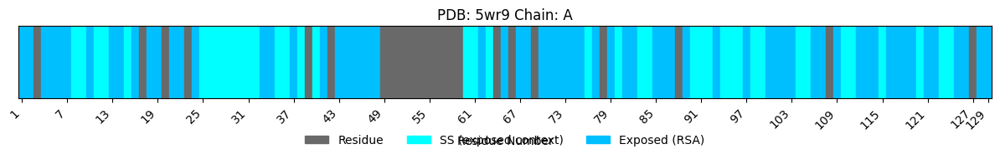


모든 작업 완료.


In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
import datetime
from pathlib import Path # Added for Path object operations
from typing import List, Dict, Tuple, Set, Any, Callable # Added for type hinting

# 작업할 폴더 경로 설정 (기존 코드)
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# --- Hydrophobic Atom Definitions ---
# Based on the user's PyMOL selection string logic.
# For each residue type, list of atom names considered hydrophobic.
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'], 'THR': ['CG2'],
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
    # GLY has no hydrophobic side-chain atoms listed in this definition.
}

# --- PyMOL SASA 계산 관련 ---
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

def _initialize_pymol_session():
    """Initializes PyMOL if not already launched."""
    try:
        pymol.finish_launching(['pymol', '-cq'])
    except Exception as e:
        print(f"PyMOL 초기화 중 참고: {e} (이미 실행 중이거나 다른 문제일 수 있습니다)")

def _get_unique_residues_from_pymol_object(pymol_object_name: str) -> Set[Tuple[str, str, str]]:
    """Helper to get unique (chain, resi, resn) from a PyMOL object."""
    _pymol_iterate_temp_storage = []
    sel_protein = f"{pymol_object_name} and polymer and name CA"
    sel_na = f"{pymol_object_name} and polymer and (name P or name C1* or name C1')"
    sel_generic_polymer = f"{pymol_object_name} and polymer"

    # Using a dictionary for space argument to avoid polluting locals() of the caller
    # if this function is nested or if locals() has many items.
    # However, iterate_state's string execution happens in a specific scope.
    # For simplicity and given it's a top-level helper, direct use in string is often done.
    # Let's ensure _pymol_iterate_temp_storage is accessible.
    # One way is to pass it via a mutable object in `space` or rely on it being in a reachable scope.
    # For this script structure, making it global-like or passing a list in `space` works.
    # Let's use a simple list accessible in the string execution context.

    # This list will be populated by PyMOL's iterate_state
    # It's defined in the scope where iterate_state is called.

    # To make _pymol_iterate_temp_storage accessible to the exec string in iterate_state,
    # it's often easiest to ensure it's in a scope PyMOL's Python interpreter can see,
    # or pass it via the `space` argument if PyMOL version supports complex objects there.
    # For this case, we'll rely on it being accessible in the exec string's global-like scope.
    # A common trick is to use cmd.set_globals or a similar mechanism if direct access fails.
    # However, simple list append usually works if the list is defined in the calling Python scope.

    pymol_globals = {'_temp_list': _pymol_iterate_temp_storage}

    try:
        cmd.iterate_state(1, sel_protein, "_temp_list.append((chain, resi, resn))", space=pymol_globals)
        if not _pymol_iterate_temp_storage:
            cmd.iterate_state(1, sel_na, "_temp_list.append((chain, resi, resn))", space=pymol_globals)
        if not _pymol_iterate_temp_storage:
            print(f"경고: 대표 원자(CA, P, C1*)를 찾을 수 없습니다. 전체 중합체 원자로 잔기 정보 추출을 시도합니다.")
            cmd.iterate_state(1, sel_generic_polymer, "_temp_list.append((chain, resi, resn))", space=pymol_globals)

        unique_residues_info = set(_pymol_iterate_temp_storage)
        _pymol_iterate_temp_storage.clear() # Clear for potential reuse
        return unique_residues_info
    except pymol.CmdException as e:
        print(f"PyMOL iterate_state 중 오류 (잔기 정보 추출): {e}.")
        return set()


def calculate_sasa_with_pymol(structure_file_path, pymol_object_name="sasa_target", output_csv_filename="residue_sasa.csv"):
    print(f"PyMOL을 사용하여 전체 SASA 계산 시작: {structure_file_path}")
    sasa_results = []
    _initialize_pymol_session()
    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' 파일을 PyMOL 객체 '{pymol_object_name}'(으)로 로드 (전체 SASA용).")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues_info = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues_info:
        print("경고: 구조에서 잔기 정보를 추출하지 못했습니다. 전체 SASA 계산을 중단합니다.")
        cmd.delete(pymol_object_name)
        return

    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residue_info)}개의 고유한 잔기에 대해 전체 SASA를 계산합니다.")

    for i, (chain_id, resi_str, resn) in enumerate(sorted_residue_info):
        if (i + 1) % 200 == 0: print(f"전체 SASA 계산 진행: {i+1}/{len(sorted_residue_info)} 잔기 처리 중...")
        try:
            resi_num = int(resi_str)
            residue_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            current_sasa = cmd.get_area(residue_selection)
            max_sasa_for_resn = MAX_SASA.get(resn.upper(), None)
            relative_sasa = "N/A"
            if max_sasa_for_resn is not None and max_sasa_for_resn > 0:
                relative_sasa = current_sasa / max_sasa_for_resn
            elif max_sasa_for_resn is None and resn.strip() and len(resn.strip()) == 3 and resn.isalpha():
                print(f"참고: 표준 아미노산 '{resn}' (체인 {chain_id}, 번호 {resi_num})에 대한 MAX_SASA 값이 라이브러리에 없습니다 (전체 SASA).")
            sasa_results.append([chain_id, resi_num, current_sasa, relative_sasa])
        except Exception as e:
            print(f"오류: 체인 {chain_id}, 잔기번호 {resi_str} ({resn}) 전체 SASA 계산 중 문제 발생 - {e}")
            sasa_results.append([chain_id, resi_str, "Error", "Error"])
    try:
        with open(output_csv_filename, 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA'])
            writer.writerows(sasa_results)
        print(f"전체 SASA 결과가 '{output_csv_filename}' 파일로 성공적으로 저장되었습니다.")
    except IOError:
        print(f"오류: 전체 SASA CSV 파일 '{output_csv_filename}'을 쓰는 데 실패했습니다.")
    finally:
        cmd.delete(pymol_object_name)

def calculate_hydrophobic_sasa_with_pymol(structure_file_path, pymol_object_name="hydro_sasa_target") -> Dict[Tuple[str, int], float]:
    """Calculates hydrophobic SASA for each residue and returns a lookup dictionary."""
    print(f"PyMOL을 사용하여 소수성 SASA 계산 시작: {structure_file_path}")
    hydrophobic_sasa_lookup = {}
    _initialize_pymol_session() # Ensure PyMOL is ready
    # cmd.reinitialize() # Don't reinitialize if called after total SASA calculation in same session
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' 파일을 PyMOL 객체 '{pymol_object_name}'(으)로 로드 (소수성 SASA용).")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues_info = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues_info:
        print("경고: 구조에서 잔기 정보를 추출하지 못했습니다. 소수성 SASA 계산을 중단합니다.")
        cmd.delete(pymol_object_name)
        return hydrophobic_sasa_lookup

    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residue_info)}개의 고유한 잔기에 대해 소수성 SASA를 계산합니다.")

    for i, (chain_id, resi_str, resn) in enumerate(sorted_residue_info):
        if (i + 1) % 200 == 0: print(f"소수성 SASA 계산 진행: {i+1}/{len(sorted_residue_info)} 잔기 처리 중...")
        try:
            resi_num = int(resi_str)
            hydrophobic_atoms_for_resn = HYDROPHOBIC_ATOM_DEFS.get(resn.upper())

            if hydrophobic_atoms_for_resn:
                # PyMOL selection for specific atoms: "name ATOM1+ATOM2+..."
                atom_names_selection_part = "name " + "+".join(hydrophobic_atoms_for_resn)
                # Selection for hydrophobic atoms ONLY within the current residue
                hydro_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_names_selection_part}))"
                area = cmd.get_area(hydro_selection)
                hydrophobic_sasa_lookup[(chain_id, resi_num)] = area
            else:
                hydrophobic_sasa_lookup[(chain_id, resi_num)] = 0.0 # No defined hydrophobic atoms for this resn (e.g., GLY)
        except Exception as e:
            print(f"오류: 체인 {chain_id}, 잔기번호 {resi_str} ({resn}) 소수성 SASA 계산 중 문제 발생 - {e}")
            hydrophobic_sasa_lookup[(chain_id, resi_num)] = None # Indicate error or missing data

    cmd.delete(pymol_object_name) # Clean up PyMOL object
    print(f"소수성 SASA 계산 완료. {len(hydrophobic_sasa_lookup)} 잔기 처리됨.")
    return hydrophobic_sasa_lookup


# --- BioPython 기반 함수들 ---
def load_biopython_structure(pdb_id, file_path_str: str):
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
    elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
    else:
        print(f"경고: 파일 확장자가 PDB/CIF가 아닙니다 ('{file_path.suffix}'). PDB로 파싱 시도합니다.")
        parser = PDBParser(**parser_args)
    return parser.get_structure(pdb_id, str(file_path))

def analyze_structure_with_dssp(structure, pdb_file_path_for_dssp_header: str, dssp_executable='mkdssp'):
    model = structure[0]
    dssp_data_list = []
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp_header, dssp=dssp_executable)
        for key in dssp.keys():
            chain_id, residue_id_tuple, residue_name_one_letter, secondary_structure, accessibility_from_dssp = key[0], key[1], dssp[key][1], dssp[key][2], dssp[key][3]
            residue_number = residue_id_tuple[1]
            dssp_data_list.append([chain_id, residue_number, residue_name_one_letter, secondary_structure, accessibility_from_dssp])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}')가 설치되어 있고 경로가 올바른지 확인하세요.")
        if "mkdssp" in str(e).lower(): print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 할 수 있습니다.")
    return dssp_data_list

# --- 새로운 마스터 CSV 생성/업데이트 로직 ---
def _get_res_id_tuple(residue) -> Tuple[str, int, str]:
    res_id = residue.get_id()
    return (residue.get_parent().id, res_id[1], res_id[2])

def _extract_residue_number(residue, context: Dict[str, Any]): return residue.get_id()[1]
def _extract_chain_id(residue, context: Dict[str, Any]): return residue.get_parent().id
def _extract_residue_name(residue, context: Dict[str, Any]): return residue.get_resname()
def _extract_is_active_site(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('active_site_set', set())
def _extract_atom_count(residue, context: Dict[str, Any]): return len(residue)
def _extract_ca_bfactor(residue, context: Dict[str, Any]):
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None

def _extract_sasa_absolute(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    return context.get('sasa_lookup', {}).get(key, {}).get('sasa')
def _extract_sasa_relative(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    val = context.get('sasa_lookup', {}).get(key, {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error"] else None

def _extract_dssp_secondary_structure(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    return context.get('dssp_lookup', {}).get(key, {}).get('secondary_structure')
def _extract_dssp_accessibility(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    return context.get('dssp_lookup', {}).get(key, {}).get('accessibility_from_dssp')
def _extract_residue_name_one_letter(residue, context: Dict[str, Any]):
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname()

# --- New Hydrophobic SASA Field Extractors ---
def _extract_total_hydrophobic_sasa(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    return context.get('hydrophobic_sasa_lookup', {}).get(key)

def _extract_exposed_hydrophobic_sasa_gt0(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    relative_total_sasa = _extract_sasa_relative(residue, context) # Use existing extractor
    if relative_total_sasa is not None and pd.notna(relative_total_sasa) and relative_total_sasa > 0:
        return context.get('hydrophobic_sasa_lookup', {}).get(key)
    return 0.0 # Or None, depending on how you want to represent non-exposed

def _extract_exposed_hydrophobic_sasa_gt025(residue, context: Dict[str, Any]):
    key = (_extract_chain_id(residue), _extract_residue_number(residue))
    relative_total_sasa = _extract_sasa_relative(residue, context) # Use existing extractor
    if relative_total_sasa is not None and pd.notna(relative_total_sasa) and relative_total_sasa > 0.25:
        return context.get('hydrophobic_sasa_lookup', {}).get(key)
    return 0.0 # Or None

AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain identifier", _extract_chain_id),
    "residue_number": ("Residue sequence number", _extract_residue_number),
    "residue_name_3L": ("Three-letter residue code", _extract_residue_name),
    "residue_name_1L": ("One-letter residue code", _extract_residue_name_one_letter),
    "is_active_site": ("True if in PDB SITE records", _extract_is_active_site),
    "atom_count": ("Number of atoms in residue", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor", _extract_ca_bfactor),
    "sasa_absolute_total": ("Total Absolute SASA (Å², PyMOL)", _extract_sasa_absolute), # Renamed for clarity
    "sasa_relative_total": ("Total Relative SASA (0-1, PyMOL)", _extract_sasa_relative), # Renamed for clarity
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility": ("DSSP Accessibility (raw value)", _extract_dssp_accessibility),
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_total_hydrophobic_sasa),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (RSA>0) Hydrophobic SASA (Å²)", _extract_exposed_hydrophobic_sasa_gt0),
    "sasa_hydrophobic_exposed_gt025": ("Exposed (RSA>0.25) Hydrophobic SASA (Å²)", _extract_exposed_hydrophobic_sasa_gt025),
}

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    active = set()
    try:
        with open(pdb_file_path, "r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    for i in range(4):
                        chain_start = 11 + 4 + i * 11 + 0 # Chain ID is at column 16, 27, 38, 49 for res 1,2,3,4
                        res_seq_start = chain_start + 1
                        icode_start = res_seq_start + 4
                        if len(line) > icode_start:
                            chain = line[chain_start:chain_start+1].strip()
                            resseq_str = line[res_seq_start:res_seq_start+4].strip()
                            icode = line[icode_start:icode_start+1].strip() or " "
                            if chain and resseq_str:
                                try: active.add((chain, int(resseq_str), icode))
                                except ValueError: print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{resseq_str}'")
    except FileNotFoundError: print(f"경고: SITE 레코드 파싱용 PDB 파일 '{pdb_file_path}' 없음.")
    return active

def generate_residue_centric_csv(
    pdb_id: str, structure_file_path: str, selected_fields: List[str],
    output_master_csv_path: str, sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]],
    hydrophobic_sasa_lookup: Dict[Tuple[str, int], float], dssp_data_list: List[Any]
    ):
    print(f"\n'{output_master_csv_path}' 생성/업데이트 시작...")
    dssp_lookup = {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {}
    active_site_set = _parse_site_records_from_file(Path(structure_file_path))

    context = {
        'sasa_lookup': sasa_total_lookup, # This now refers to the total SASA lookup
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': dssp_lookup,
        'active_site_set': active_site_set
    }
    try:
        structure = load_biopython_structure(pdb_id, structure_file_path)
    except Exception as e:
        print(f"오류: BioPython 구조 파일 '{structure_file_path}' 파싱 실패: {e}"); return

    unknown_fields = [f for f in selected_fields if f not in AVAILABLE_FIELDS]
    if unknown_fields:
        print(f"경고: 알 수 없는 필드 요청: {unknown_fields}. 제외됩니다.")
        selected_fields = [f for f in selected_fields if f in AVAILABLE_FIELDS]
    if not selected_fields: print("오류: 추출할 유효 필드 없음."); return

    rows = []
    for model in structure:
        for chain in model:
            for residue in chain:
                if residue.id[0].strip() != "": continue # Skip HETATM/water
                row_data: Dict[str, Any] = {}
                valid_res = True
                for field_key in selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try: row_data[field_key] = extractor_fn(residue, context)
                    except Exception: row_data[field_key] = None
                    if field_key in ["chain_id", "residue_number"] and row_data[field_key] is None:
                        valid_res = False; break
                if valid_res: rows.append(row_data)
    if not rows: print("추출된 잔기 데이터 없음."); return

    new_df = pd.DataFrame(rows)
    id_cols = [c for c in ["chain_id", "residue_number"] if c in new_df.columns]
    if id_cols: new_df = new_df.drop_duplicates(subset=id_cols, keep='first')

    # Ensure correct column order based on selected_fields, with id_cols first
    ordered_selected_fields = [f for f in id_cols] + [f for f in selected_fields if f not in id_cols and f in new_df.columns]
    # Add any other columns that might have been generated but not explicitly in selected_fields (should not happen with current extractors)
    final_cols = ordered_selected_fields + [c for c in new_df.columns if c not in ordered_selected_fields]
    new_df = new_df[final_cols]


    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0:
        try:
            master_df = pd.read_csv(master_file)
            print(f"기존 마스터 CSV ('{master_file}') 로드. 병합합니다.")
            merge_keys = [col for col in id_cols if col in master_df.columns and col in new_df.columns]
            if not merge_keys:
                print(f"오류: 병합 키 없음. 새 데이터를 '{master_file.stem}_newdata.csv'로 저장.");
                new_df.to_csv(master_file.with_name(f"{master_file.stem}_newdata.csv"), index=False, quoting=csv.QUOTE_NONNUMERIC)
                return

            merged_df = pd.merge(master_df, new_df, on=merge_keys, how="outer", suffixes=('_master', ''))
            # For columns that were in new_df (selected by user for this run), ensure new_df's values are used.
            # If a column from new_df was also in master_df, merge might keep master's or new's depending on suffixes.
            # We want to update if the column was in selected_fields.
            for col in selected_fields:
                if col in new_df.columns and col in merged_df.columns and col not in merge_keys:
                    # If 'col' from new_df is now in merged_df, it has overwritten or is the new value.
                    # If master had 'col' and new_df had 'col', merge with no suffix for new_df means new_df's values are taken for matching rows.
                    # If master had 'col_master' and new_df had 'col', we need to ensure 'col' (from new_df) is preferred.
                    # The current suffix logic ('_master', '') means new_df's columns (if conflicting) don't get a suffix.
                    # So, merged_df[col] should already have new_df's data for that column.
                    # We just need to handle cases where master_df had the column, and new_df didn't (it should be preserved).
                    # And where new_df has a new column (it should be added).
                    # `how="outer"` handles these additions.
                    # If a column was only in master_df, it remains.
                    # If a column was only in new_df, it's added.
                    # If a column was in both, new_df's values (from the '' suffix side) are used for shared rows,
                    # and NaNs are filled where appropriate.
                    pass # merge logic should handle this correctly with suffixes=('_master', '')

            # Re-establish desired column order for the final merged dataframe
            final_merged_cols_order = [k for k in id_cols]
            existing_master_cols = [c for c in master_df.columns if c not in id_cols]
            newly_added_cols_from_new_df = [c for c in new_df.columns if c not in id_cols and c not in master_df.columns]

            # Order: ID cols, then existing master cols (updated), then newly added cols
            final_merged_cols_order.extend(sorted(list(set(existing_master_cols + newly_added_cols_from_new_df))))
            # Ensure all columns in merged_df are included once
            final_merged_cols_order = [c for c in final_merged_cols_order if c in merged_df.columns]
            final_merged_cols_order += [c for c in merged_df.columns if c not in final_merged_cols_order]


            merged_df = merged_df[final_merged_cols_order]
            merged_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"마스터 CSV 업데이트: '{master_file}'")
        except pd.errors.EmptyDataError:
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"경고: 기존 마스터 CSV 비어있음. 새 데이터로 덮어씀: '{master_file}'")
        except Exception as e:
            print(f"오류: 마스터 CSV 병합 중 문제: {e}")
            new_df.to_csv(master_file.with_name(f"{master_file.stem}_mergerr.csv"), index=False, quoting=csv.QUOTE_NONNUMERIC)
    else:
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV 저장: '{master_file}'")

# --- 시각화 및 기존 분석 함수들 (이전과 동일, 필요시 여기에 포함) ---
# identify_continuous_secondary_structures_for_chain and visualize_protein_sequence
# (이전 답변의 함수 정의를 여기에 복사)
def identify_continuous_secondary_structures_for_chain(dssp_data_for_chain, chain_id, exposed_residues_in_chain):
    if not dssp_data_for_chain:
        return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    residue_to_ss_map = {data[1]: data[3] for data in dssp_data_for_chain if data[0] == chain_id}
    all_chain_residue_numbers = sorted(residue_to_ss_map.keys())
    if not all_chain_residue_numbers:
        return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])

    min_res_num_in_chain = all_chain_residue_numbers[0]
    max_res_num_in_chain = all_chain_residue_numbers[-1]
    identified_ss_segments_data = []
    processed_in_any_segment = set()
    valid_ss_codes = {'H', 'B', 'E', 'G', 'I', 'T', 'S'}

    for exposed_res_num in sorted(list(set(exposed_residues_in_chain))):
        if exposed_res_num in processed_in_any_segment or exposed_res_num not in residue_to_ss_map:
            continue
        current_ss_at_exposed_res = residue_to_ss_map[exposed_res_num]
        if not current_ss_at_exposed_res or current_ss_at_exposed_res.strip() not in valid_ss_codes:
            continue
        segment_start = exposed_res_num
        while segment_start - 1 >= min_res_num_in_chain and residue_to_ss_map.get(segment_start - 1) == current_ss_at_exposed_res:
            segment_start -= 1
        segment_end = exposed_res_num
        while segment_end + 1 <= max_res_num_in_chain and residue_to_ss_map.get(segment_end + 1) == current_ss_at_exposed_res:
            segment_end += 1
        for i in range(segment_start, segment_end + 1):
            if i not in processed_in_any_segment:
                 identified_ss_segments_data.append([i, current_ss_at_exposed_res, chain_id])
            processed_in_any_segment.add(i)

    if not identified_ss_segments_data:
         return pd.DataFrame(columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    df = pd.DataFrame(identified_ss_segments_data, columns=['Residue Number', 'Secondary Structure', 'Chain ID'])
    return df.drop_duplicates().sort_values(by=['Chain ID', 'Residue Number']).reset_index(drop=True)

def visualize_protein_sequence(dssp_data_for_chain, pdb_id, chain_id,
                               highlighted_exposed_residues_in_chain=None,
                               highlighted_ss_residues_in_chain=None,
                               overlay=False):
    if highlighted_exposed_residues_in_chain is None: highlighted_exposed_residues_in_chain = []
    if highlighted_ss_residues_in_chain is None: highlighted_ss_residues_in_chain = []
    if not dssp_data_for_chain:
        print(f"체인 '{chain_id}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
        return

    sequence_length = len(dssp_data_for_chain)
    residue_numbers_in_chain = [res[1] for res in dssp_data_for_chain]
    if sequence_length == 0:
        print(f"체인 '{chain_id}'에 잔기가 없어 시각화를 건너뜁니다.")
        return

    fig, ax = plt.subplots(figsize=(max(15, sequence_length * 0.1), 1.5))
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='dimgrey', edgecolor='dimgrey', width=1.0)

    title_parts = [f"PDB: {pdb_id} Chain: {chain_id}"]
    legend_elements = [plt.Rectangle((0,0),1,1, color='dimgrey', label='Residue')]

    if highlighted_ss_residues_in_chain:
        for i, (actual_residue_number, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_residue_number in highlighted_ss_residues_in_chain:
                bar_segment.set_color('aqua')
        if not any(isinstance(item, plt.Rectangle) and item.get_label() == 'SS (exposed context)' for item in legend_elements):
             legend_elements.append(plt.Rectangle((0,0),1,1, color='aqua', label='SS (exposed context)'))

    if highlighted_exposed_residues_in_chain:
        for i, (actual_residue_number, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_residue_number in highlighted_exposed_residues_in_chain:
                bar_segment.set_color('deepskyblue')
        if not any(isinstance(item, plt.Rectangle) and item.get_label() == 'Exposed (RSA)' for item in legend_elements):
            legend_elements.append(plt.Rectangle((0,0),1,1, color='deepskyblue', label='Exposed (RSA)'))

    ax.set_xlim(-0.5, sequence_length - 0.5)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    tick_interval = max(1, sequence_length // 20 if sequence_length > 20 else (sequence_length // 5 if sequence_length > 5 else 1) )
    xticks_pos = list(range(0, sequence_length, tick_interval))
    if not xticks_pos or xticks_pos[-1] != sequence_length -1 and sequence_length > 0 : # Ensure last tick is included if possible
        if sequence_length -1 not in xticks_pos and sequence_length > 0: xticks_pos.append(sequence_length-1)

    xticklabels_val = [residue_numbers_in_chain[j] for j in xticks_pos if j < len(residue_numbers_in_chain)]
    ax.set_xticks(xticks_pos)
    ax.set_xticklabels(xticklabels_val, rotation=45, ha="right")
    ax.set_xlabel("Residue Number")

    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.35), ncol=3, frameon=False) # Legend below plot
    ax.set_title(" | ".join(title_parts))
    plt.subplots_adjust(bottom=0.3) # Make space for legend
    plt.show()

# --- Main 분석 로직 ---
def main():
    pdb_id_input = input("PDB ID를 입력하세요: ").strip().lower()

    # Master CSV 경로 우선 결정
    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    if os.path.exists(pdb_file_path_pdb): actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif): actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
        return

    biopython_structure = None
    try:
        biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
        print(f"BioPython으로 '{actual_structure_file_path}' 구조 로드 완료.")
    except Exception as e: print(f"BioPython 구조 로딩 오류: {e}"); return

    # --- 1. 전체 SASA 계산 (PyMOL) ---
    sasa_total_lookup = {} # (chain, res_num) -> {'sasa': val, 'relative_sasa': val}
    sasa_csv_filename_total = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{datetime.date.today().strftime('%Y%m%d')}.csv"
    sasa_csv_full_path_total = os.path.join(pdb_save_path, sasa_csv_filename_total)

    perform_total_sasa_calc = True
    if os.path.exists(sasa_csv_full_path_total):
        if input(f"'{sasa_csv_full_path_total}' 전체 SASA 파일이 이미 존재합니다. 재계산하시겠습니까? (y/N): ").strip().lower() != 'y':
            perform_total_sasa_calc = False
            print("기존 전체 SASA 파일을 사용합니다.")

    if perform_total_sasa_calc:
        calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_csv_full_path_total)

    if os.path.exists(sasa_csv_full_path_total): # Load total SASA data for context
        try:
            df_sasa_total = pd.read_csv(sasa_csv_full_path_total)
            for _, row in df_sasa_total.iterrows():
                sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')
                }
            print(f"전체 SASA 데이터 로드 완료 ({sasa_csv_full_path_total}).")
        except Exception as e:
            print(f"경고: 전체 SASA CSV ('{sasa_csv_full_path_total}') 로드 중 오류: {e}")
    else:
        print("경고: 전체 SASA CSV 파일이 없어 관련 필드는 비어있을 수 있습니다.")


    # --- 2. 소수성 SASA 계산 (PyMOL) ---
    hydrophobic_sasa_lookup = {} # (chain, res_num) -> hsasa_value
    # 소수성 SASA는 매번 계산하거나, 캐싱 로직을 추가할 수 있음. 여기서는 매번 계산.
    # 또는, 이 계산도 선택적으로 만들 수 있음 (사용자가 관련 필드를 선택할 때만)
    # 지금은 마스터 CSV 생성 전에 모든 잠재적 데이터를 준비하는 흐름.
    print(f"\nPyMOL 소수성 SASA 계산을 시작합니다.")
    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro")
    if not hydrophobic_sasa_lookup:
        print("경고: 소수성 SASA 데이터가 계산되지 않았습니다.")


    # --- 3. DSSP 분석 ---
    dssp_data_list = []
    dssp_input_file = pdb_file_path_pdb if os.path.exists(pdb_file_path_pdb) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file)
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else:
        print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    # --- 4. 마스터 CSV 생성/업데이트 ---
    print("\n--- 마스터 CSV 생성을 위한 필드 선택 ---")
    print("사용 가능한 필드:")
    field_keys = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1}. {field_key:35} : {desc}")

    selected_indices_str = input("CSV에 포함할 필드의 번호를 쉼표로 구분하여 입력하세요 (예: 1,2,10). 전체는 'ALL': ").strip()
    selected_fields_for_csv = []
    default_fields = ["chain_id", "residue_number", "residue_name_3L"]

    if selected_indices_str.upper() == 'ALL':
        selected_fields_for_csv = field_keys
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys):
                    selected_fields_for_csv.append(field_keys[idx])
                else:
                    print(f"경고: 잘못된 필드 번호 {idx+1}는 무시됩니다.")
            if not selected_fields_for_csv: # 유효한 선택이 없으면 기본값 사용
                raise ValueError("유효한 필드 선택 없음")
        except ValueError:
            print(f"잘못된 입력 또는 유효한 필드 선택이 없습니다. 기본 필드({', '.join(default_fields)})를 사용합니다.")
            selected_fields_for_csv = default_fields

    # 필수 식별자 필드(chain_id, residue_number)가 항상 포함되도록 보장
    for id_col in ["residue_number", "chain_id"]: # 순서 중요
        if id_col not in selected_fields_for_csv:
            selected_fields_for_csv.insert(0, id_col)
    # 중복 제거 및 순서 유지 (Python 3.7+ dict는 순서 유지, set으로 변환 후 list로 하면 순서 바뀔 수 있음)
    temp_ordered_list = []
    seen_in_ordered = set()
    for item in selected_fields_for_csv:
        if item not in seen_in_ordered:
            temp_ordered_list.append(item)
            seen_in_ordered.add(item)
    selected_fields_for_csv = temp_ordered_list
    print(f"선택된 최종 필드 (마스터 CSV용): {selected_fields_for_csv}")

    generate_residue_centric_csv(
        pdb_id=pdb_id_input,
        structure_file_path=actual_structure_file_path,
        selected_fields=selected_fields_for_csv,
        output_master_csv_path=master_csv_full_path,
        sasa_total_lookup=sasa_total_lookup, # 전체 SASA 데이터 전달
        hydrophobic_sasa_lookup=hydrophobic_sasa_lookup, # 소수성 SASA 데이터 전달
        dssp_data_list=dssp_data_list
    )

    # --- 5. (선택적) 시각화 ---
    run_visualization = input("\nDSSP 기반 시퀀스 시각화를 실행하시겠습니까? (y/N): ").strip().lower()
    if run_visualization == 'y' and dssp_data_list:
        chain_input_for_viz = input(f"시각화할 체인 ID를 입력하세요 (예: A). 모든 체인은 'ALL' 또는 빈칸 입력: ").strip().upper()

        rsa_threshold_for_viz_str = input("시각화 강조용 RSA 임계값을 입력하세요 (0.0-1.0, 기본값 0.25): ").strip()
        try:
            rsa_threshold_for_viz = float(rsa_threshold_for_viz_str)
            if not (0.0 <= rsa_threshold_for_viz <= 1.0): raise ValueError
        except ValueError:
            print("잘못된 RSA 임계값. 기본값 0.25 사용.")
            rsa_threshold_for_viz = 0.25

        exposed_by_rsa_for_viz_lookup = {} # chain_id -> list of exposed res_nums
        if sasa_total_lookup: # Use the already loaded total SASA data
            for (ch_id, res_num), sasa_info in sasa_total_lookup.items():
                rsa_val = pd.to_numeric(sasa_info.get('relative_sasa'), errors='coerce')
                if pd.notna(rsa_val) and rsa_val > rsa_threshold_for_viz:
                    if ch_id not in exposed_by_rsa_for_viz_lookup:
                        exposed_by_rsa_for_viz_lookup[ch_id] = []
                    exposed_by_rsa_for_viz_lookup[ch_id].append(res_num)
            for ch_id in exposed_by_rsa_for_viz_lookup: exposed_by_rsa_for_viz_lookup[ch_id].sort()
        else:
            print("경고: 전체 SASA 데이터가 없어 RSA 기반 노출 잔기 시각화가 정확하지 않을 수 있습니다.")

        chains_to_visualize = []
        if not chain_input_for_viz or chain_input_for_viz == "ALL":
            unique_chains_in_dssp = sorted(list(set(data_item[0] for data_item in dssp_data_list)))
            if unique_chains_in_dssp: chains_to_visualize = unique_chains_in_dssp
        else:
            chains_to_visualize = [chain_input_for_viz]

        for current_chain_id_viz in chains_to_visualize:
            dssp_data_current_chain_viz = [data for data in dssp_data_list if data[0] == current_chain_id_viz]
            if not dssp_data_current_chain_viz:
                print(f"체인 '{current_chain_id_viz}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
                continue

            exposed_for_current_chain_viz = exposed_by_rsa_for_viz_lookup.get(current_chain_id_viz, [])

            ss_df_current_chain_viz = pd.DataFrame()
            if exposed_for_current_chain_viz:
                ss_df_current_chain_viz = identify_continuous_secondary_structures_for_chain(
                    dssp_data_current_chain_viz, current_chain_id_viz, exposed_for_current_chain_viz
                )

            ss_residues_for_viz = []
            if not ss_df_current_chain_viz.empty:
                 ss_residues_for_viz = ss_df_current_chain_viz['Residue Number'].tolist()

            print(f"\n--- 체인 {current_chain_id_viz} 시각화 (RSA 임계값: {rsa_threshold_for_viz}) ---")
            visualize_protein_sequence(dssp_data_current_chain_viz, pdb_id_input, current_chain_id_viz,
                                       highlighted_exposed_residues_in_chain=exposed_for_current_chain_viz,
                                       highlighted_ss_residues_in_chain=ss_residues_for_viz)
    elif run_visualization == 'y' and not dssp_data_list:
        print("DSSP 데이터가 없어 시퀀스 시각화를 실행할 수 없습니다.")

    print("\n모든 작업 완료.")

if __name__ == "__main__":
    print("스크립트 시작. Colab 환경에서 PyMOL/DSSP를 사용하려면 관련 패키지 설치가 필요할 수 있습니다.")
    main()



# MASTER CSV v1.0

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
from Bio.PDB.Residue import Residue
from Bio.PDB.Structure import Structure as BiopythonStructure
from Bio.PDB.Model import Model as BiopythonModel
from Bio.PDB.Chain import Chain as BiopythonChain
from Bio.PDB.Atom import Atom as BiopythonAtom
from Bio.PDB.NeighborSearch import NeighborSearch # 리간드 결합 잔기 식별용
import datetime
from pathlib import Path
from typing import List, Dict, Tuple, Set, Any, Callable, Optional

# --- 스크립트 버전 ---
SCRIPT_VERSION = "1.0.1" # 버전 업데이트 (NameError 수정 반영)

# --- 전역 설정 ---
# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results' # 사용자 환경에 맞게 수정
if not os.path.exists(pdb_save_path):
    try:
        os.makedirs(pdb_save_path)
        print(f"'{pdb_save_path}' 폴더를 생성했습니다.")
    except Exception as e:
        print(f"경고: '{pdb_save_path}' 폴더 생성에 실패했습니다: {e}. 현재 디렉토리에 파일이 저장될 수 있습니다.")
        pdb_save_path = "." # 현재 디렉토리로 대체

# --- 소수성 원자 정의 ---
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'], 'THR': ['CG2'],
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
}

# --- 상대적 SASA 계산을 위한 표준 아미노산별 최대 SASA 값 (Å²) ---
MAX_SASA = { # (Gly-X-Gly 기준, Tien et al., 2013)
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

# --- PyMOL 세션 관리 ---
_pymol_initialized = False
def _initialize_pymol_session():
    global _pymol_initialized
    if not _pymol_initialized:
        try:
            pymol.finish_launching(['pymol', '-cq']) # -c: command-line, -q: quiet
            _pymol_initialized = True
            print("PyMOL 세션이 초기화되었습니다.")
        except Exception as e:
            print(f"PyMOL 초기화 중 참고: {e} (이미 실행 중이거나 다른 문제일 수 있습니다)")
            _pymol_initialized = True # 반복 시도 방지

def _get_unique_residues_from_pymol_object(pymol_object_name: str, state: int = 1) -> Set[Tuple[str, str, str]]:
    """Helper to get unique (chain, resi, resn) from a PyMOL object for a given state."""
    pymol_context_space = {'_temp_residue_list_for_pymol': []}
    representative_atom_selections = [
        f"{pymol_object_name} and state {state} and polymer and name CA",
        f"{pymol_object_name} and state {state} and polymer and name P",
        f"{pymol_object_name} and state {state} and polymer and (name C1* or name C1')"
    ]
    found_representative = False
    for sel in representative_atom_selections:
        cmd.iterate_state(state, sel, "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
        if pymol_context_space['_temp_residue_list_for_pymol']:
            found_representative = True
            break
    if not found_representative:
        print(f"경고: 대표 원자(CA, P, C1*)를 찾을 수 없습니다 (객체: {pymol_object_name}, 상태: {state}). 전체 중합체 원자로 잔기 정보 추출을 시도합니다.")
        cmd.iterate_state(state, f"{pymol_object_name} and state {state} and polymer", "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
    unique_residues_info = set(pymol_context_space['_temp_residue_list_for_pymol'])
    return unique_residues_info

def calculate_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_total_obj", output_csv_filename: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Any]]:
    print(f"\nPyMOL: 전체 SASA 계산 시작 ({structure_file_path})")
    sasa_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    _initialize_pymol_session()
    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (전체 SASA)")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"경고: '{pymol_object_name}'에서 잔기 정보 추출 실패 (전체 SASA).")
        cmd.delete(pymol_object_name)
        return sasa_lookup

    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residues)}개 잔기에 대해 전체 SASA 계산 중...")
    results_for_csv = []
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 200 == 0: print(f"  전체 SASA 진행: {i+1}/{len(sorted_residues)} 잔기...")
        try:
            resi_num = int(resi_str)
            sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            sasa_val = cmd.get_area(sel)
            max_sasa = MAX_SASA.get(resn.upper())
            rsa_val = (sasa_val / max_sasa) if max_sasa and max_sasa > 0 else "N/A"
            sasa_lookup[(chain_id, resi_num)] = {'sasa': sasa_val, 'relative_sasa': rsa_val}
            if output_csv_filename: results_for_csv.append([chain_id, resi_num, sasa_val, rsa_val])
        except Exception as e:
            print(f"  오류 (전체 SASA): 체인 {chain_id} 잔기 {resi_str}({resn}) - {e}")
            sasa_lookup[(chain_id, resi_num)] = {'sasa': "Error", 'relative_sasa': "Error"}
            if output_csv_filename: results_for_csv.append([chain_id, resi_num, "Error", "Error"])
    if output_csv_filename and results_for_csv:
        try:
            with open(output_csv_filename, 'w', newline='') as f:
                writer = csv.writer(f)
                writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA'])
                writer.writerows(results_for_csv)
            print(f"전체 SASA 결과 저장 완료: '{output_csv_filename}'")
        except IOError as e: print(f"오류: 전체 SASA CSV 저장 실패 - {e}")
    cmd.delete(pymol_object_name)
    print("전체 SASA 계산 완료.")
    return sasa_lookup

def calculate_hydrophobic_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_hydro_obj") -> Dict[Tuple[str, int], Optional[float]]:
    print(f"\nPyMOL: 소수성 SASA 계산 시작 ({structure_file_path})")
    hydro_sasa_lookup: Dict[Tuple[str, int], Optional[float]] = {}
    _initialize_pymol_session()
    cmd.load(structure_file_path, pymol_object_name) # Note: cmd.reinitialize() is not called here to allow multiple objects
    print(f"'{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (소수성 SASA)")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"경고: '{pymol_object_name}'에서 잔기 정보 추출 실패 (소수성 SASA).")
        cmd.delete(pymol_object_name)
        return hydro_sasa_lookup

    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residues)}개 잔기에 대해 소수성 SASA 계산 중...")
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 200 == 0: print(f"  소수성 SASA 진행: {i+1}/{len(sorted_residues)} 잔기...")
        try:
            resi_num = int(resi_str)
            atom_names = HYDROPHOBIC_ATOM_DEFS.get(resn.upper())
            sasa_val = 0.0
            if atom_names:
                atom_sel_str = "name " + "+".join(atom_names)
                sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_sel_str}))"
                if cmd.count_atoms(sel) > 0: sasa_val = cmd.get_area(sel)
            hydro_sasa_lookup[(chain_id, resi_num)] = sasa_val
        except Exception as e:
            print(f"  오류 (소수성 SASA): 체인 {chain_id} 잔기 {resi_str}({resn}) - {e}")
            hydro_sasa_lookup[(chain_id, resi_num)] = None
    cmd.delete(pymol_object_name)
    print("소수성 SASA 계산 완료.")
    return hydro_sasa_lookup

# --- BioPython 기반 함수들 ---
def load_biopython_structure(pdb_id: str, file_path_str: str) -> Optional[BiopythonStructure]:
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    structure: Optional[BiopythonStructure] = None
    try:
        if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
        elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
        else:
            print(f"경고: 인식할 수 없는 파일 확장자 '{file_path.suffix}'. PDB로 파싱 시도.")
            parser = PDBParser(**parser_args)
        structure = parser.get_structure(pdb_id, str(file_path))
    except Exception as e: print(f"BioPython 구조 로딩 오류 ({file_path_str}): {e}"); return None
    return structure

def analyze_structure_with_dssp(structure: BiopythonStructure, pdb_file_path_for_dssp: str, dssp_executable='mkdssp') -> List[List[Any]]:
    dssp_data_list = []
    if not structure: print("DSSP: BioPython 구조 객체가 없어 분석을 건너<0xEB><0x9B><0x84>니다."); return dssp_data_list
    model = structure[0]
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp, dssp=dssp_executable)
        for key in dssp.keys():
            dssp_entry = dssp[key]
            dssp_data_list.append([key[0], key[1][1], dssp_entry[1], dssp_entry[2], dssp_entry[3]])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}')가 올바르게 설치/설정되었는지, 입력 파일 '{pdb_file_path_for_dssp}'이 유효한지 확인하세요.")
        if "mkdssp" in str(e).lower() or "FileNotFoundError" in str(e): print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 합니다.")
    return dssp_data_list

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    active_sites = set()
    if not pdb_file_path.exists(): print(f"경고: SITE 레코드 파싱용 PDB 파일 '{pdb_file_path}' 없음."); return active_sites
    try:
        with pdb_file_path.open("r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    num_res_in_site = int(line[15:17].strip())
                    for i in range(num_res_in_site):
                        base_idx = 18 + (i * 11)
                        chain_id = line[base_idx + 4 : base_idx + 5].strip()
                        res_seq_str = line[base_idx + 5 : base_idx + 9].strip()
                        ins_code = line[base_idx + 9 : base_idx + 10].strip() or " "
                        if chain_id and res_seq_str:
                            try: active_sites.add((chain_id, int(res_seq_str), ins_code))
                            except ValueError: print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{res_seq_str}'")
    except Exception as e: print(f"SITE 레코드 파싱 중 오류: {e}")
    return active_sites

def _identify_ligand_binding_residues(biopython_structure: BiopythonStructure, ligand_residue_names: Optional[List[str]] = None, distance_cutoff: float = 4.0) -> Set[Tuple[str, int, str]]:
    binding_residues_set: Set[Tuple[str, int, str]] = set()
    if not biopython_structure: return binding_residues_set
    protein_na_atoms: List[BiopythonAtom] = []
    ligand_atoms: List[BiopythonAtom] = []
    for model in biopython_structure:
        for chain in model:
            for residue in chain:
                hetflag = residue.id[0]
                if hetflag == ' ' or hetflag.startswith('D'):
                    for atom in residue: protein_na_atoms.append(atom)
                elif hetflag.startswith('H_') or hetflag == 'W':
                    if hetflag == 'W': continue
                    if ligand_residue_names is None or residue.get_resname() in ligand_residue_names:
                        for atom in residue: ligand_atoms.append(atom)
        if model.id == 0: break
    if not ligand_atoms: return binding_residues_set
    if not protein_na_atoms: print("단백질/핵산 원자를 찾을 수 없어 결합 부위 분석을 건너뜁니다."); return binding_residues_set
    neighbor_search = NeighborSearch(protein_na_atoms)
    for lig_atom in ligand_atoms:
        nearby_residues = neighbor_search.search(lig_atom.get_coord(), distance_cutoff, level='R')
        for res_obj in nearby_residues:
            binding_residues_set.add((res_obj.get_parent().id, res_obj.id[1], res_obj.id[2]))
    print(f"리간드 결합 잔기 식별 (cutoff {distance_cutoff}Å): {len(binding_residues_set)}개")
    return binding_residues_set

# --- 필드 추출 함수들 ---
def _get_res_id_tuple_for_lookup(residue: Residue) -> Tuple[str, int]: return (residue.get_parent().id, residue.get_id()[1])
def _extract_residue_number(residue: Residue, context: Dict[str, Any]) -> int: return residue.get_id()[1]
def _extract_chain_id(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_parent().id
def _extract_residue_name_3L(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_resname()
def _extract_residue_name_1L(residue: Residue, context: Dict[str, Any]) -> str:
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname()
def _extract_is_active_site(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('active_site_set', set())
def _extract_is_ligand_binding_site(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('ligand_binding_set', set())
def _extract_atom_count(residue: Residue, context: Dict[str, Any]) -> int: return len(residue)
def _extract_ca_bfactor(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None
def _extract_sasa_absolute_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None
def _extract_sasa_relative_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None
def _extract_dssp_secondary_structure(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    return context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('secondary_structure')
def _extract_dssp_accessibility(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('accessibility_from_dssp')
    return pd.to_numeric(val, errors='coerce')
def _extract_sasa_hydrophobic_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('hydrophobic_sasa_lookup', {}).get(_get_res_id_tuple_for_lookup(residue))
    return pd.to_numeric(val, errors='coerce') if val is not None else None
def _extract_sasa_hydrophobic_exposed_gt0(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rsa_total = _extract_sasa_relative_total(residue, context)
    if rsa_total is not None and pd.notna(rsa_total) and rsa_total > 0:
        return _extract_sasa_hydrophobic_total(residue, context)
    return 0.0 if rsa_total is not None and pd.notna(rsa_total) else None
def _extract_sasa_hydrophobic_exposed_gt025(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rsa_total = _extract_sasa_relative_total(residue, context)
    if rsa_total is not None and pd.notna(rsa_total) and rsa_total > 0.25:
        return _extract_sasa_hydrophobic_total(residue, context)
    return 0.0 if rsa_total is not None and pd.notna(rsa_total) else None

AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain ID", _extract_chain_id),
    "residue_number": ("Residue Number (seq num)", _extract_residue_number),
    "residue_name_3L": ("Residue Name (3-letter)", _extract_residue_name_3L),
    "residue_name_1L": ("Residue Name (1-letter)", _extract_residue_name_1L),
    "atom_count": ("Atom Count in Residue", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor", _extract_ca_bfactor),
    "is_active_site_pdb": ("Is PDB SITE record residue?", _extract_is_active_site),
    "is_ligand_binding_site": ("Is Ligand/HETATM binding residue (dist < 4.0Å)?", _extract_is_ligand_binding_site),
    "sasa_absolute_total": ("Total Abs. SASA (Å², PyMOL)", _extract_sasa_absolute_total),
    "sasa_relative_total": ("Total Rel. SASA (0-1, PyMOL)", _extract_sasa_relative_total),
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility_rsa": ("DSSP Accessibility (RSA by DSSP)", _extract_dssp_accessibility),
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_sasa_hydrophobic_total),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (RSA_total>0) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt0),
    "sasa_hydrophobic_exposed_gt025": ("Exposed (RSA_total>0.25) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt025),
}

def generate_residue_centric_csv(
    pdb_id: str, biopython_structure: BiopythonStructure, selected_fields: List[str],
    output_master_csv_path: str, context_data: Dict[str, Any]):
    print(f"\n마스터 CSV ('{output_master_csv_path}') 생성/업데이트 시작 (선택된 필드: {selected_fields})...")
    valid_selected_fields = [f for f in selected_fields if f in AVAILABLE_FIELDS]
    if not valid_selected_fields: print("오류: 유효한 필드가 선택되지 않음."); return

    rows = []
    for model in biopython_structure:
        if model.id != 0: continue
        for chain in model:
            for residue in chain:
                if residue.id[0].strip() != "": continue
                row_data = {}
                core_info_ok = True
                for field_key in valid_selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try: row_data[field_key] = extractor_fn(residue, context_data)
                    except Exception: row_data[field_key] = None
                    if field_key in ["chain_id", "residue_number"] and row_data[field_key] is None:
                        core_info_ok = False; break
                if core_info_ok: rows.append(row_data)
    if not rows: print("BioPython 구조에서 유효한 잔기 데이터를 추출하지 못했습니다."); return
    new_df = pd.DataFrame(rows)
    id_cols = ["chain_id", "residue_number"]
    if not all(col in new_df.columns for col in id_cols):
        print(f"오류: 새 데이터에 핵심 ID 컬럼({', '.join(id_cols)})이 없습니다. CSV를 저장할 수 없습니다."); return
    new_df = new_df.drop_duplicates(subset=id_cols, keep='first').sort_values(by=id_cols).reset_index(drop=True)

    final_ordered_columns = [col for col in id_cols]
    final_ordered_columns.extend([col for col in valid_selected_fields if col not in id_cols and col in new_df.columns])
    final_ordered_columns.extend(sorted([col for col in new_df.columns if col not in final_ordered_columns]))
    new_df = new_df[final_ordered_columns]

    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0:
        try:
            master_df = pd.read_csv(master_file)
            print(f"기존 마스터 CSV ('{master_file}') 로드. 선택된 필드로 병합/업데이트합니다.")
            if all(col in master_df.columns for col in id_cols): master_df = master_df.set_index(id_cols)
            else: print(f"경고: 기존 마스터 CSV에 ID 컬럼 불완전. 새 데이터로 덮어쓸 수 있음."); master_df = pd.DataFrame(columns=id_cols).set_index(id_cols)
            new_df_indexed = new_df.set_index(id_cols)
            for col in new_df_indexed.columns: master_df_indexed[col] = new_df_indexed[col]
            final_df = master_df_indexed.reset_index()
            final_cols_order_merged = [col for col in id_cols] + sorted([c for c in final_df.columns if c not in id_cols])
            final_df = final_df[final_cols_order_merged]
            final_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"마스터 CSV가 업데이트되었습니다: '{master_file}'")
        except pd.errors.EmptyDataError:
            print(f"경고: 기존 마스터 CSV 비어있음. 새 데이터로 덮어씀: '{master_file}'")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        except Exception as e:
            print(f"오류: 마스터 CSV 병합/업데이트 중 문제: {e}")
            error_backup_path = master_file.with_name(f"{master_file.stem}_merge_error_{datetime.date.today().strftime('%Y%m%d')}.csv")
            new_df.to_csv(error_backup_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"현재 선택된 필드의 데이터를 별도 파일로 저장합니다: '{error_backup_path}'")
    else:
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")

# --- Main 로직 ---
def main():
    print(f"--- 단백질 분석 및 마스터 CSV 생성기 v{SCRIPT_VERSION} ---")
    pdb_id_input = input("PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"작업 대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    # Define pdb_file_path_pdb and pdb_file_path_cif here for use in dssp_input_file determination
    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    if os.path.exists(pdb_file_path_pdb): actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif): actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'(.pdb 또는 .cif)을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
        return

    biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
    if not biopython_structure: return

    sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    sasa_total_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{datetime.date.today().strftime('%Y%m%d')}.csv"
    sasa_total_csv_path = os.path.join(pdb_save_path, sasa_total_csv_filename)
    if os.path.exists(sasa_total_csv_path) and \
       input(f"'{sasa_total_csv_path}' 전체 SASA 파일이 이미 존재합니다. 재계산 없이 기존 파일을 사용하시겠습니까? (Y/n): ").strip().lower() != 'n':
        print("기존 전체 SASA 파일을 로드합니다.")
        try:
            df_sasa_total = pd.read_csv(sasa_total_csv_path)
            for _, row in df_sasa_total.iterrows():
                sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')}
            print(f"전체 SASA 데이터 로드 완료 ({len(sasa_total_lookup)} 항목).")
        except Exception as e:
            print(f"경고: 기존 전체 SASA CSV 로드 실패 ({e}). 재계산합니다.")
            sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    else:
        sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    if not sasa_total_lookup: print("경고: 전체 SASA 데이터가 준비되지 않았습니다.")

    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro_sasa")
    if not hydrophobic_sasa_lookup: print("경고: 소수성 SASA 데이터가 준비되지 않았습니다.")

    dssp_data_list: List[List[Any]] = []
    # Corrected logic for dssp_input_file
    if os.path.exists(pdb_file_path_pdb): # Prefer PDB file for DSSP
        dssp_input_file = pdb_file_path_pdb
    else: # Fallback to the actual structure file (could be CIF)
        dssp_input_file = actual_structure_file_path
        if actual_structure_file_path.endswith(".cif"):
            print(f"참고: DSSP 분석을 위해 PDB 파일 '{pdb_file_path_pdb}'을(를) 찾을 수 없습니다. CIF 파일 '{actual_structure_file_path}'을(를) 사용합니다. (DSSP는 PDB 형식에서 더 안정적일 수 있습니다.)")

    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file)
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
            else: print(f"DSSP 분석 완료 ({len(dssp_data_list)} 잔기 정보).")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else: print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    active_site_set = _parse_site_records_from_file(Path(actual_structure_file_path))
    if active_site_set: print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기 식별됨.")
    else: print("PDB SITE 레코드가 없거나 파싱에 실패했습니다.")
    ligand_binding_set = _identify_ligand_binding_residues(biopython_structure)

    context_data_for_master_csv = {
        'sasa_total_lookup': sasa_total_lookup,
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {},
        'active_site_set': active_site_set,
        'ligand_binding_set': ligand_binding_set,
    }

    print("\n--- 마스터 CSV에 포함/업데이트할 필드 선택 ---")
    field_keys_available = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys_available):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1:2d}. {field_key:35} : {desc}")
    selected_indices_str = input(f"'{master_csv_filename}'에 포함/업데이트할 필드의 번호를 쉼표로 구분하여 입력하세요 (예: 1,2,8,9,12). 전체는 'ALL', 건너뛰려면 엔터: ").strip()
    selected_fields_to_process = []
    if not selected_indices_str: print("필드 선택을 건너뛰어 마스터 CSV 생성/업데이트를 진행하지 않습니다.")
    elif selected_indices_str.upper() == 'ALL': selected_fields_to_process = field_keys_available
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys_available): selected_fields_to_process.append(field_keys_available[idx])
                else: print(f"경고: 잘못된 필드 번호 {idx+1}는 무시됩니다.")
        except ValueError: print(f"잘못된 입력입니다. 필드 선택 없이 마스터 CSV 작업을 건너뜁니다.")

    if selected_fields_to_process:
        id_cols_ensure = ["chain_id", "residue_number"]
        final_selected_fields = [col for col in id_cols_ensure]
        for col in selected_fields_to_process:
            if col not in final_selected_fields: final_selected_fields.append(col)
        print(f"선택된 최종 필드 (마스터 CSV용): {final_selected_fields}")
        if biopython_structure:
            generate_residue_centric_csv(
                pdb_id=pdb_id_input, biopython_structure=biopython_structure,
                selected_fields=final_selected_fields, output_master_csv_path=master_csv_full_path,
                context_data=context_data_for_master_csv)
        else: print("BioPython 구조 객체가 없어 마스터 CSV를 생성할 수 없습니다.")
    elif not selected_indices_str: pass
    else: print("유효한 필드가 선택되지 않아 마스터 CSV를 생성/업데이트할 수 없습니다.")
    print("\n모든 작업 완료.")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION}). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.")
    main()


스크립트 시작 (버전 1.0.1). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.
--- 단백질 분석 및 마스터 CSV 생성기 v1.0.1 ---
PDB ID를 입력하세요 (예: 1tgu): 1tgu
작업 대상 마스터 CSV 파일: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/1tgu_master_residue_data.csv'

PyMOL: 전체 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/1tgu.pdb)
PyMOL 세션이 초기화되었습니다.
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/1tgu.pdb' -> PyMOL 객체 '1tgu_total_sasa' (전체 SASA)
총 1996개 잔기에 대해 전체 SASA 계산 중...
  전체 SASA 진행: 200/1996 잔기...
  전체 SASA 진행: 400/1996 잔기...
  전체 SASA 진행: 600/1996 잔기...
  전체 SASA 진행: 800/1996 잔기...
  전체 SASA 진행: 1000/1996 잔기...
  전체 SASA 진행: 1200/1996 잔기...
  전체 SASA 진행: 1400/1996 잔기...
  전체 SASA 진행: 1600/1996 잔기...
  전체 SASA 진행: 1800/1996 잔기...
전체 SASA 결과 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/1tgu_ALLCHAINS_SASA_TOTAL_20250526.csv'
전체 SASA 계산 완료.

PyMOL: 소수성 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/1tgu.pdb)


v1.1 코드의 주요 변경 및 추가 사항:

RMSF 데이터 로드 및 통합:
사용자가 제공해주신 RMSF CSV 파일 (예: PDBID,GENENAME,T=VALUE.csv 형식 또는 더 일반적인 PDBID_rmsf_T1.4.csv 형식)을 읽어와 마스터 CSV에 rmsf_T1.4 및 rmsf_T2.0 컬럼으로 추가합니다.
이를 위해 RMSF 파일 로딩 함수 load_and_prepare_rmsf_data를 추가합니다. (파일명 규칙에 대한 유연성이 필요하며, 아래 코드에서는 PDBID_rmsf_T=TEMP.csv 형태를 가정하고, 사용자가 실제 파일명에 맞게 수정할 수 있도록 주석을 추가합니다.)
신규 라벨링 필드 추출 함수 및 AVAILABLE_FIELDS 업데이트:
노출 여부 라벨 (exposure_label): sasa_relative_total 값을 기준으로 사용자가 지정한 임계값(기본 0.25)에 따라 "buried" 또는 "exposed"로 라벨링합니다.
RMSF 변화 라벨 (flexibility_change): rmsf_T1.4와 rmsf_T2.0 값을 비교하여 "increased", "decreased", "stable" 등으로 라벨링합니다. ΔRMSF 값도 컬럼으로 추가합니다.
소수성 수준 라벨 (hydrophobicity_level): sasa_hydrophobic_total 값을 기준으로 라벨링합니다. (v1.1에서는 이 값을 직접 사용하고, 구체적인 "수준" 분류는 사용자가 추후 분석에서 수행하도록 남겨둡니다. 필드 자체는 값으로 채웁니다.)
활성/결합 부위 라벨: 기존 is_active_site_pdb, is_ligand_binding_site 필드를 계속 사용합니다.
Transition Region 후보 라벨 (is_transition_candidate):
숨겨짐 (sasa_relative_total < rsa_threshold_buried)
T=2.0에서 유연성 증가 또는 높음 (rmsf_T2.0 > rmsf_T2_threshold 또는 delta_rmsf > delta_rmsf_threshold)
내부에 소수성 영역 존재 (sasa_hydrophobic_total > hydrophobic_sasa_threshold_buried)
위 조건들을 조합하여 라벨링합니다. 각 임계값은 사용자가 조절할 수 있도록 함수 인자로 설정하거나, 초기 기본값을 설정합니다.
main() 함수 로직 강화:
RMSF 데이터 로딩 단계를 추가합니다.
모든 필요한 데이터(SASA, 소수성 SASA, DSSP, RMSF 등)를 context_data로 통합하여 generate_residue_centric_csv 함수에 전달합니다.
사용자가 마스터 CSV에 포함할 필드를 선택할 때, 새로 추가된 라벨링 필드들도 선택지에 포함됩니다.
시각화 준비:
라벨링된 데이터가 마스터 CSV에 저장되면, 다음 단계에서 이 정보를 활용하여 말씀하신 다양한 조건에 따른 잔기들을 시각화할 수 있는 기반이 마련됩니다. (v1.1은 데이터 준비 및 CSV 생성에 집중합니다.)
참고: 제공해주신 RMSF 파일(1CF3,GOX,T=1.4.csv 등)의 실제 컬럼명을 확인하여 load_and_prepare_rmsf_data 함수 내에서 올바르게 파싱하도록 해야 합니다. 아래 코드에서는 일반적인 Residue_Number, Chain, RMSF_Value 순서와 컬럼명을 가정하고 작성하며, 필요시 수정할 수 있도록 주석을 달아두겠습니다.

다음은 이러한 내용을 반영한 코드 v1.1

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt # 시각화 함수용
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
from Bio.PDB.Residue import Residue
from Bio.PDB.Structure import Structure as BiopythonStructure
from Bio.PDB.Atom import Atom as BiopythonAtom
from Bio.PDB.NeighborSearch import NeighborSearch
import datetime
from pathlib import Path
from typing import List, Dict, Tuple, Set, Any, Callable, Optional
import numpy as np # RMSF 변화 계산 등 사용

# --- 스크립트 버전 ---
SCRIPT_VERSION = "1.1"

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    try:
        os.makedirs(pdb_save_path)
        print(f"'{pdb_save_path}' 폴더를 생성했습니다.")
    except Exception as e:
        print(f"경고: '{pdb_save_path}' 폴더 생성 실패: {e}. 현재 디렉토리에 파일 저장 시도.")
        pdb_save_path = "."

# --- 상수 정의 ---
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'], 'THR': ['CG2'],
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
}
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

# --- PyMOL 세션 관리 ---
_pymol_initialized = False
def _initialize_pymol_session():
    global _pymol_initialized
    if not _pymol_initialized:
        try:
            pymol.finish_launching(['pymol', '-cqk']) # -k: keep-alive (일부 환경에서 도움)
            _pymol_initialized = True
            print("PyMOL 세션이 초기화되었습니다.")
        except Exception: # 일반 예외 처리
            _pymol_initialized = True # 반복 시도 방지 및 이미 실행된 것으로 간주

def _get_unique_residues_from_pymol_object(pymol_object_name: str, state: int = 1) -> Set[Tuple[str, str, str]]:
    pymol_context_space = {'_temp_residue_list_for_pymol': []}
    representative_atom_selections = [
        f"{pymol_object_name} and state {state} and polymer and name CA",
        f"{pymol_object_name} and state {state} and polymer and name P",
        f"{pymol_object_name} and state {state} and polymer and (name C1* or name C1')"
    ]
    found_representative = False
    for sel in representative_atom_selections:
        try: # iterate_state가 실패할 경우 대비
            cmd.iterate_state(state, sel, "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
            if pymol_context_space['_temp_residue_list_for_pymol']:
                found_representative = True; break
        except pymol.CmdException: continue # 다음 선택자로 계속

    if not found_representative:
        print(f"경고: 대표 원자(CA, P, C1*)를 찾을 수 없음 (객체: {pymol_object_name}, 상태: {state}). 전체 중합체 원자로 시도.")
        try:
            cmd.iterate_state(state, f"{pymol_object_name} and state {state} and polymer", "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
        except pymol.CmdException as e_poly: print(f"  전체 중합체 원자 순회 오류: {e_poly}")

    return set(pymol_context_space['_temp_residue_list_for_pymol'])

# --- 데이터 계산 함수들 ---
def calculate_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_total_obj", output_csv_filename: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Any]]:
    print(f"\nPyMOL: 전체 SASA 계산 시작 ({structure_file_path})")
    sasa_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    _initialize_pymol_session()
    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"  '{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (전체 SASA)")
    cmd.set("dot_solvent", 1); cmd.set("solvent_radius", 1.4)
    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"  경고: '{pymol_object_name}'에서 잔기 정보 추출 실패 (전체 SASA)."); cmd.delete(pymol_object_name); return sasa_lookup
    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"  총 {len(sorted_residues)}개 잔기에 대해 전체 SASA 계산 중...")
    results_for_csv = []
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 500 == 0: print(f"    전체 SASA 진행: {i+1}/{len(sorted_residues)}...")
        try:
            resi_num = int(resi_str)
            sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            sasa_val = cmd.get_area(sel)
            max_sasa = MAX_SASA.get(resn.upper())
            rsa_val = (sasa_val / max_sasa) if max_sasa and max_sasa > 0 else "N/A"
            sasa_lookup[(chain_id, resi_num)] = {'sasa': sasa_val, 'relative_sasa': rsa_val}
            if output_csv_filename: results_for_csv.append([chain_id, resi_num, sasa_val, rsa_val])
        except Exception: sasa_lookup[(chain_id, resi_num)] = {'sasa': "Error", 'relative_sasa': "Error"}
    if output_csv_filename and results_for_csv:
        try:
            with open(output_csv_filename, 'w', newline='') as f:
                writer = csv.writer(f); writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA']); writer.writerows(results_for_csv)
            print(f"  전체 SASA 결과 저장 완료: '{output_csv_filename}'")
        except IOError as e: print(f"  오류: 전체 SASA CSV 저장 실패 - {e}")
    cmd.delete(pymol_object_name)
    print("  전체 SASA 계산 완료.")
    return sasa_lookup

def calculate_hydrophobic_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_hydro_obj") -> Dict[Tuple[str, int], Optional[float]]:
    print(f"\nPyMOL: 소수성 SASA 계산 시작 ({structure_file_path})")
    hydro_sasa_lookup: Dict[Tuple[str, int], Optional[float]] = {}
    _initialize_pymol_session()
    # cmd.reinitialize() # 이전 객체와 함께 작업 가능하도록 주석 처리 또는 필요시 호출
    cmd.load(structure_file_path, pymol_object_name)
    print(f"  '{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (소수성 SASA)")
    cmd.set("dot_solvent", 1); cmd.set("solvent_radius", 1.4)
    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"  경고: '{pymol_object_name}'에서 잔기 정보 추출 실패 (소수성 SASA)."); cmd.delete(pymol_object_name); return hydro_sasa_lookup
    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"  총 {len(sorted_residues)}개 잔기에 대해 소수성 SASA 계산 중...")
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 500 == 0: print(f"    소수성 SASA 진행: {i+1}/{len(sorted_residues)}...")
        try:
            resi_num = int(resi_str)
            atom_names = HYDROPHOBIC_ATOM_DEFS.get(resn.upper())
            sasa_val = 0.0
            if atom_names:
                atom_sel_str = "name " + "+".join(atom_names)
                sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_sel_str}))"
                if cmd.count_atoms(sel) > 0: sasa_val = cmd.get_area(sel)
            hydro_sasa_lookup[(chain_id, resi_num)] = sasa_val
        except Exception: hydro_sasa_lookup[(chain_id, resi_num)] = None
    cmd.delete(pymol_object_name)
    print("  소수성 SASA 계산 완료.")
    return hydro_sasa_lookup

def load_biopython_structure(pdb_id: str, file_path_str: str) -> Optional[BiopythonStructure]:
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    structure: Optional[BiopythonStructure] = None
    try:
        if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
        elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
        else: print(f"경고: 인식 불가 확장자 '{file_path.suffix}'. PDB로 파싱 시도."); parser = PDBParser(**parser_args)
        structure = parser.get_structure(pdb_id, str(file_path))
    except Exception as e: print(f"BioPython 구조 로딩 오류 ({file_path_str}): {e}"); return None
    return structure

def analyze_structure_with_dssp(structure: BiopythonStructure, pdb_file_path_for_dssp: str, dssp_executable='mkdssp') -> List[List[Any]]:
    dssp_data_list = []
    if not structure: print("DSSP: BioPython 구조 객체가 없어 분석을 건너<0xEB><0x9B><0x84>니다."); return dssp_data_list
    model = structure[0]
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp, dssp=dssp_executable)
        for key in dssp.keys():
            dssp_entry = dssp[key]
            dssp_data_list.append([key[0], key[1][1], dssp_entry[1], dssp_entry[2], dssp_entry[3]])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}') 설치 및 경로, 입력 파일 ('{pdb_file_path_for_dssp}') 유효성 확인 필요.")
        if "mkdssp" in str(e).lower() or "FileNotFoundError" in str(e): print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 합니다.")
    return dssp_data_list

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    active_sites = set()
    if not pdb_file_path.exists(): print(f"경고: SITE 레코드 파싱용 PDB 파일 '{pdb_file_path}' 없음."); return active_sites
    try:
        with pdb_file_path.open("r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    num_res_in_site = int(line[15:17].strip())
                    for i in range(num_res_in_site):
                        base_idx = 18 + (i * 11)
                        chain_id = line[base_idx + 4 : base_idx + 5].strip()
                        res_seq_str = line[base_idx + 5 : base_idx + 9].strip()
                        ins_code = line[base_idx + 9 : base_idx + 10].strip() or " "
                        if chain_id and res_seq_str:
                            try: active_sites.add((chain_id, int(res_seq_str), ins_code))
                            except ValueError: print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{res_seq_str}'")
    except Exception as e: print(f"SITE 레코드 파싱 중 오류: {e}")
    return active_sites

def _identify_ligand_binding_residues(biopython_structure: BiopythonStructure, ligand_residue_names: Optional[List[str]] = None, distance_cutoff: float = 4.0) -> Set[Tuple[str, int, str]]:
    binding_residues_set: Set[Tuple[str, int, str]] = set()
    if not biopython_structure: return binding_residues_set
    protein_na_atoms: List[BiopythonAtom] = []; ligand_atoms: List[BiopythonAtom] = []
    for model in biopython_structure: # Typically model 0
        for chain in model:
            for residue in chain:
                hetflag = residue.id[0]
                if hetflag == ' ' or hetflag.startswith('D'): # Standard or DNA/RNA
                    for atom in residue: protein_na_atoms.append(atom)
                elif hetflag.startswith('H_') or hetflag == 'W': # HETATM or Water
                    if hetflag == 'W': continue # Skip water
                    if ligand_residue_names is None or residue.get_resname() in ligand_residue_names: # If None, all HETATMs (not W)
                        for atom in residue: ligand_atoms.append(atom)
        if model.id == 0: break # Process first model only
    if not ligand_atoms: print("  (정보: 구조 내 리간드/HETATM 원자 없음. 결합 부위 분석 건너뜀)"); return binding_residues_set
    if not protein_na_atoms: print("  (정보: 구조 내 단백질/핵산 원자 없음. 결합 부위 분석 건너뜀)"); return binding_residues_set
    neighbor_search = NeighborSearch(protein_na_atoms)
    for lig_atom in ligand_atoms:
        for res_obj in neighbor_search.search(lig_atom.get_coord(), distance_cutoff, level='R'):
            binding_residues_set.add((res_obj.get_parent().id, res_obj.id[1], res_obj.id[2]))
    print(f"  리간드 결합 잔기 식별 (cutoff {distance_cutoff}Å): {len(binding_residues_set)}개")
    return binding_residues_set

# --- RMSF 데이터 로드 함수 ---
def load_and_prepare_rmsf_data(pdb_id: str, base_path: str, protein_name: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Optional[float]]]:
    """
    RMSF 데이터를 로드하고 (체인, 잔기번호)를 키로 하는 딕셔너리로 준비합니다.
    파일명 규칙: PDBID,GENENAME,T=VALUE.csv 또는 PDBID_rmsf_T=VALUE.csv
    제공해주신 파일은 1CF3,GOX,T=1.4.csv 이므로, protein_name (예: GOX)이 필요할 수 있습니다.
    여기서는 간단하게 PDBID_rmsf_T=TEMP.csv 형태를 우선 시도하고, 없으면 사용자 정의를 안내합니다.
    """
    rmsf_lookup: Dict[Tuple[str, int], Dict[str, Optional[float]]] = {}
    temperatures = {"T1.4": "1.4", "T2.0": "2.0"} # 처리할 온도와 파일 내 값 매칭

    for temp_key, temp_val_str in temperatures.items():
        # 파일명 형식 (사용자 환경에 맞게 수정 필요)
        # 1. 사용자 제공 형식: f"{pdb_id.upper()},{protein_name},T={temp_val_str}.csv"
        # 2. 일반적인 형식: f"{pdb_id}_rmsf_T={temp_val_str}.csv"
        # 여기서는 일반적인 형식을 우선 시도하고, 사용자가 protein_name을 제공하면 해당 형식도 시도

        rmsf_file_path_generic = Path(base_path) / f"{pdb_id}_rmsf_T={temp_val_str}.csv"
        rmsf_file_path_specific = None
        if protein_name:
            rmsf_file_path_specific = Path(base_path) / f"{pdb_id.upper()},{protein_name.upper()},T={temp_val_str}.csv"

        actual_rmsf_file_path = None
        if rmsf_file_path_specific and rmsf_file_path_specific.exists():
            actual_rmsf_file_path = rmsf_file_path_specific
        elif rmsf_file_path_generic.exists():
            actual_rmsf_file_path = rmsf_file_path_generic
        else:
            print(f"  경고: RMSF 파일 ({temp_key})을 찾을 수 없습니다. 경로: '{rmsf_file_path_specific}' 또는 '{rmsf_file_path_generic}'")
            continue

        try:
            # RMSF CSV 파일 컬럼: Residue_Number, Chain, RMSF_Value (헤더 없음 가정)
            df_rmsf = pd.read_csv(actual_rmsf_file_path, header=None, names=['Residue_Number', 'Chain', 'RMSF_Value'])
            print(f"  RMSF 데이터 로드 완료: '{actual_rmsf_file_path}' ({len(df_rmsf)} 행)")
            for _, row in df_rmsf.iterrows():
                key = (str(row['Chain']), int(row['Residue_Number']))
                if key not in rmsf_lookup:
                    rmsf_lookup[key] = {'rmsf_T1.4': None, 'rmsf_T2.0': None} # 초기화
                rmsf_lookup[key][f'rmsf_{temp_key}'] = pd.to_numeric(row['RMSF_Value'], errors='coerce')
        except Exception as e:
            print(f"  오류: RMSF 파일 ('{actual_rmsf_file_path}') 처리 중 - {e}")

    if rmsf_lookup: print(f"RMSF 데이터 준비 완료 ({len(rmsf_lookup)} 잔기).")
    return rmsf_lookup


# --- 필드 추출 함수들 ---
def _get_res_id_tuple_for_lookup(residue: Residue) -> Tuple[str, int]: return (residue.get_parent().id, residue.get_id()[1])
def _extract_residue_number(residue: Residue, context: Dict[str, Any]) -> int: return residue.get_id()[1]
def _extract_chain_id(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_parent().id
def _extract_residue_name_3L(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_resname()
def _extract_residue_name_1L(residue: Residue, context: Dict[str, Any]) -> str:
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname()
def _extract_is_active_site_pdb(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('active_site_set', set())
def _extract_is_ligand_binding_site(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('ligand_binding_set', set())
def _extract_atom_count(residue: Residue, context: Dict[str, Any]) -> int: return len(residue)
def _extract_ca_bfactor(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None

def _extract_sasa_absolute_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None
def _extract_sasa_relative_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None

def _extract_dssp_secondary_structure(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    return context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('secondary_structure')
def _extract_dssp_accessibility_rsa(residue: Residue, context: Dict[str, Any]) -> Optional[float]: # DSSP가 RSA를 제공한다고 가정
    val = context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('accessibility_from_dssp')
    return pd.to_numeric(val, errors='coerce')

def _extract_sasa_hydrophobic_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('hydrophobic_sasa_lookup', {}).get(_get_res_id_tuple_for_lookup(residue))
    return pd.to_numeric(val, errors='coerce') if val is not None else None

# --- 새로운 라벨링 필드 추출 함수 ---
def _extract_rmsf_t14(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    return context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('rmsf_T1.4')
def _extract_rmsf_t20(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    return context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('rmsf_T2.0')

def _extract_delta_rmsf(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rmsf_data = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {})
    t14 = rmsf_data.get('rmsf_T1.4')
    t20 = rmsf_data.get('rmsf_T2.0')
    if t14 is not None and t20 is not None and pd.notna(t14) and pd.notna(t20):
        return t20 - t14
    return None

def _extract_exposure_label(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    rsa = _extract_sasa_relative_total(residue, context)
    threshold = context.get('rsa_exposure_threshold', 0.25) # context에서 임계값 가져오기
    if rsa is None or pd.isna(rsa): return None
    return "exposed" if rsa >= threshold else "buried"

def _extract_flexibility_change_label(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    delta_rmsf = _extract_delta_rmsf(residue, context)
    # 임계값은 context 또는 고정값으로 설정 가능. 예시:
    # significant_increase_thresh = context.get('delta_rmsf_increase_thresh', 0.5)
    # significant_decrease_thresh = context.get('delta_rmsf_decrease_thresh', -0.5)
    if delta_rmsf is None or pd.isna(delta_rmsf): return None
    if delta_rmsf > 0.5: return "increased_flexibility" # 예시 임계값
    if delta_rmsf < -0.5: return "decreased_flexibility" # 예시 임계값
    return "stable_flexibility"

def _extract_is_transition_candidate(residue: Residue, context: Dict[str, Any]) -> Optional[bool]:
    # 사용자가 정의한 조건에 따라 True/False 반환
    # 예시 조건: buried (RSA < 0.25) AND (RMSF T2.0 > 1.0 OR DeltaRMSF > 0.5) AND (Hydrophobic SASA > 10.0)
    rsa_total = _extract_sasa_relative_total(residue, context)
    rmsf_t20 = _extract_rmsf_t20(residue, context)
    delta_rmsf = _extract_delta_rmsf(residue, context)
    hydro_sasa_total = _extract_sasa_hydrophobic_total(residue, context)

    # 임계값들을 context에서 가져오거나 기본값 사용
    rsa_buried_thresh = context.get('transition_rsa_buried_thresh', 0.25)
    rmsf_t2_flex_thresh = context.get('transition_rmsf_t2_flex_thresh', 1.5) # 예시: RMSF > 1.5Å 이면 유연
    delta_rmsf_increase_thresh = context.get('transition_delta_rmsf_increase_thresh', 0.8) # 예시: RMSF 증가량 > 0.8Å
    hydro_sasa_buried_thresh = context.get('transition_hydro_sasa_buried_thresh', 20.0) # 예시: 숨겨진 소수성 면적 > 20Å²

    is_buried = (rsa_total is not None and pd.notna(rsa_total) and rsa_total < rsa_buried_thresh)
    is_flexible_at_T2 = (rmsf_t20 is not None and pd.notna(rmsf_t20) and rmsf_t20 > rmsf_t2_flex_thresh)
    is_flex_increased = (delta_rmsf is not None and pd.notna(delta_rmsf) and delta_rmsf > delta_rmsf_increase_thresh)
    has_buried_hydrophobicity = (hydro_sasa_total is not None and pd.notna(hydro_sasa_total) and hydro_sasa_total > hydro_sasa_buried_thresh)

    if is_buried and (is_flexible_at_T2 or is_flex_increased) and has_buried_hydrophobicity:
        return True
    return False


AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain ID", _extract_chain_id),
    "residue_number": ("Residue Number", _extract_residue_number),
    "residue_name_3L": ("Residue Name (3-letter)", _extract_residue_name_3L),
    "residue_name_1L": ("Residue Name (1-letter)", _extract_residue_name_1L),
    "atom_count": ("Atom Count", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor", _extract_ca_bfactor),
    "is_active_site_pdb": ("PDB SITE record?", _extract_is_active_site),
    "is_ligand_binding_site": ("Ligand Binding (dist < 4Å to HETATM)?", _extract_is_ligand_binding_site),
    "sasa_absolute_total": ("Total Abs. SASA (Å², PyMOL)", _extract_sasa_absolute_total),
    "sasa_relative_total": ("Total Rel. SASA (0-1, PyMOL)", _extract_sasa_relative_total),
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility_rsa": ("DSSP Accessibility (RSA by DSSP)", _extract_dssp_accessibility_rsa),
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_sasa_hydrophobic_total),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (RSA_T>0) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt0),
    "sasa_hydrophobic_exposed_gt025": ("Exposed (RSA_T>0.25) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt025),
    "rmsf_T1.4": ("RMSF at T=1.4 (CABS-flex)", _extract_rmsf_t14),
    "rmsf_T2.0": ("RMSF at T=2.0 (CABS-flex)", _extract_rmsf_t20),
    "delta_rmsf_T2_T1.4": ("Delta RMSF (T2.0 - T1.4)", _extract_delta_rmsf),
    "exposure_label": ("Exposure Label (based on RSA_total)", _extract_exposure_label),
    "flexibility_change_label": ("Flexibility Change (T2.0 vs T1.4)", _extract_flexibility_change_label),
    "is_transition_candidate": ("Transition Region Candidate Flag", _extract_is_transition_candidate),
}

# (generate_residue_centric_csv, 시각화 함수 등은 이전 버전에서 가져와서 사용)
# generate_residue_centric_csv 함수는 context를 통해 다양한 lookup 테이블을 받도록 수정 필요
# (이전 답변의 generate_residue_centric_csv 함수를 여기에 복사하고, context 사용 부분을 확인/수정합니다.)

def generate_residue_centric_csv(
    pdb_id: str,
    biopython_structure: BiopythonStructure,
    selected_fields: List[str],
    output_master_csv_path: str,
    context_data: Dict[str, Any] # 모든 사전 계산된 데이터 포함
    ):
    print(f"\n마스터 CSV ('{output_master_csv_path}') 생성/업데이트 시작 (선택된 필드: {selected_fields})...")

    # 사용자가 선택한 필드의 유효성 검사
    valid_selected_fields = []
    unknown_fields_skipped = []
    for f_key in selected_fields:
        if f_key in AVAILABLE_FIELDS:
            valid_selected_fields.append(f_key)
        else:
            unknown_fields_skipped.append(f_key)
    if unknown_fields_skipped:
        print(f"경고: 알 수 없는 필드 {unknown_fields_skipped}는 요청에서 제외됩니다.")

    if not valid_selected_fields:
        print("오류: 추출할 유효한 필드가 선택되지 않았습니다. 작업을 중단합니다.")
        return

    # 잔기별 데이터 추출
    rows = []
    # BioPython 구조는 보통 model 0을 주로 사용
    processed_models = 0
    for model in biopython_structure:
        if model.id != 0 and processed_models > 0: # 첫 번째 모델(ID 0) 외에는 건너뛰거나, 다중 모델 처리 로직 필요
            # print(f"참고: 모델 {model.id}은(는) 건너뜁니다. 첫 번째 모델만 처리합니다.")
            continue
        processed_models +=1
        for chain in model:
            for residue in chain:
                # 표준 아미노산/뉴클레오타이드 잔기만 처리 (HETATM, 물 분자 제외)
                # residue.id[0]은 hetflag. 공백(' ')은 표준 잔기. 'W'는 물. 'H_'로 시작하는 것은 기타 HETATM.
                if residue.id[0].strip() != "":
                    continue

                row_data: Dict[str, Any] = {}
                extraction_ok_for_core_fields = True
                for field_key in valid_selected_fields:
                    description, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try:
                        # 컨텍스트 데이터에서 필요한 임계값 등을 extractor 함수에 전달할 수 있도록 설정
                        # 예를 들어 _extract_exposure_label 함수가 context['rsa_exposure_threshold']를 사용하도록
                        row_data[field_key] = extractor_fn(residue, context_data)
                    except Exception as e:
                        # print(f"  정보: 필드 '{field_key}' 추출 중 잔기 {chain.id}:{residue.id[1]} 에서 오류: {e}")
                        row_data[field_key] = None # 오류 발생 시 None으로 채움
                        if field_key in ["chain_id", "residue_number"]: # 핵심 필드 추출 실패 시
                            extraction_ok_for_core_fields = False
                            break
                if extraction_ok_for_core_fields:
                    rows.append(row_data)
        if model.id == 0 and processed_models == 1: # 첫 모델만 처리하는 경우 여기서 중단
            break

    if not rows:
        print("BioPython 구조에서 유효한 잔기 데이터를 추출하지 못했습니다.")
        return

    new_df = pd.DataFrame(rows)

    # 필수 ID 컬럼 및 사용자가 선택한 순서에 따라 컬럼 정렬
    id_cols = ["chain_id", "residue_number"]

    # DataFrame에 id_cols이 모두 있는지 확인
    missing_id_cols = [col for col in id_cols if col not in new_df.columns]
    if missing_id_cols:
        print(f"오류: 새 데이터에 핵심 ID 컬럼 {missing_id_cols}이(가) 없습니다. CSV를 저장할 수 없습니다.")
        # ID 컬럼이 없으면 DataFrame을 저장하지 않거나, 예외 발생
        return

    new_df = new_df.drop_duplicates(subset=id_cols, keep='first').sort_values(by=id_cols).reset_index(drop=True)

    # 사용자가 선택한 필드 순서를 최대한 유지하되, ID 컬럼을 맨 앞으로
    final_ordered_columns = [col for col in id_cols] # ID 컬럼 먼저
    final_ordered_columns.extend([col for col in valid_selected_fields if col not in id_cols and col in new_df.columns])
    # DataFrame에 실제로 생성된 컬럼 중 위 순서에 포함되지 않은 컬럼이 있다면 뒤에 추가 (알파벳 순)
    final_ordered_columns.extend(sorted([col for col in new_df.columns if col not in final_ordered_columns]))
    new_df = new_df[final_ordered_columns] # 최종 컬럼 순서 적용

    # 마스터 CSV와 병합 또는 새로 저장
    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0 :
        try:
            master_df = pd.read_csv(master_file)
            print(f"기존 마스터 CSV ('{master_file}') 로드 완료. 선택된 필드로 병합/업데이트합니다.")

            # 마스터 DF와 새 DF의 인덱스를 ID 컬럼으로 설정하여 병합/업데이트 준비
            if all(col in master_df.columns for col in id_cols):
                master_df = master_df.set_index(id_cols)
            else:
                print(f"경고: 기존 마스터 CSV에 ID 컬럼({id_cols})이 불완전하여 정확한 병합이 어려울 수 있습니다. 가능한 선에서 병합합니다.")
                # ID 컬럼이 없으면 인덱스 설정 없이 진행하거나, 다른 병합 전략 필요

            new_df_indexed = new_df.set_index(id_cols)

            # master_df에 new_df_indexed의 컬럼들을 업데이트/추가
            # 기존 master_df에 있는 컬럼은 new_df_indexed 값으로 업데이트됨 (덮어쓰기)
            # master_df에 없는 new_df_indexed의 컬럼은 새로 추가됨
            for col in new_df_indexed.columns:
                master_df_indexed[col] = new_df_indexed[col]

            final_df = master_df_indexed.reset_index()

            # 최종 컬럼 순서: ID 컬럼들, 그 다음은 (기존 마스터 컬럼 + 새로 추가된 컬럼들)의 합집합을 알파벳 순으로 정렬
            all_cols_after_merge = id_cols + sorted([c for c in final_df.columns if c not in id_cols])
            final_df = final_df[all_cols_after_merge]

            final_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"마스터 CSV가 업데이트되었습니다: '{master_file}'")

        except pd.errors.EmptyDataError: # 기존 파일이 비어있는 경우
            print(f"경고: 기존 마스터 CSV ('{master_file}')가 비어있습니다. 새 데이터로 덮어씁니다.")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")
        except Exception as e:
            print(f"오류: 마스터 CSV 병합/업데이트 중 문제 발생: {e}")
            error_backup_path = master_file.with_name(f"{master_file.stem}_new_data_merge_error_{datetime.date.today().strftime('%Y%m%d')}.csv")
            new_df.to_csv(error_backup_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"현재 선택된 필드의 데이터를 별도 파일로 저장합니다: '{error_backup_path}'")
    else: # 마스터 파일이 없거나 비어있는 경우
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")

# --- 시각화 함수들 ---
# visualize_protein_sequence 와 identify_continuous_secondary_structures_for_chain 함수는 이전 제공된 코드를 여기에 포함시킵니다.
# (이전 코드 블록에서 해당 함수들을 복사하여 여기에 붙여넣으세요)
def identify_continuous_secondary_structures_for_chain(dssp_data_for_chain: List[List[Any]], chain_id: str, exposed_residues_in_chain: List[int]) -> pd.DataFrame:
    """주어진 체인에 대해, 노출된 잔기를 포함하는 연속된 2차 구조 세그먼트를 식별합니다."""
    columns = ['Residue Number', 'Secondary Structure', 'Chain ID']
    if not dssp_data_for_chain: return pd.DataFrame(columns=columns)

    # DSSP 데이터에서 (잔기번호 -> 2차구조) 맵 생성 (현재 체인 대상)
    residue_to_ss_map = {item[1]: item[3] for item in dssp_data_for_chain if item[0] == chain_id}
    if not residue_to_ss_map: return pd.DataFrame(columns=columns)

    all_chain_residue_numbers = sorted(residue_to_ss_map.keys())
    if not all_chain_residue_numbers: return pd.DataFrame(columns=columns)

    min_res_num_in_chain = all_chain_residue_numbers[0]
    max_res_num_in_chain = all_chain_residue_numbers[-1]

    identified_ss_segments_data = []
    processed_in_any_segment = set() # 이미 다른 세그먼트에 포함된 잔기 추적
    valid_ss_codes = {'H', 'B', 'E', 'G', 'I', 'T', 'S'} # DSSP의 유효한 2차 구조 코드

    for exposed_res_num in sorted(list(set(exposed_residues_in_chain))): # 노출 잔기 기준
        if exposed_res_num in processed_in_any_segment or exposed_res_num not in residue_to_ss_map:
            continue

        current_ss_at_exposed_res = residue_to_ss_map[exposed_res_num]
        if not current_ss_at_exposed_res or current_ss_at_exposed_res.strip() not in valid_ss_codes:
            continue # 유효한 2차 구조가 아니면 건너뜀

        # 현재 노출된 잔기에서 시작하여 양쪽으로 동일한 2차 구조 확장
        segment_start, segment_end = exposed_res_num, exposed_res_num
        # 뒤로 확장
        while segment_start - 1 >= min_res_num_in_chain and \
              residue_to_ss_map.get(segment_start - 1) == current_ss_at_exposed_res:
            segment_start -= 1
        # 앞으로 확장
        while segment_end + 1 <= max_res_num_in_chain and \
              residue_to_ss_map.get(segment_end + 1) == current_ss_at_exposed_res:
            segment_end += 1

        # 찾은 세그먼트의 모든 잔기들을 결과에 추가 (중복 방지하며)
        current_segment_added = False
        for i in range(segment_start, segment_end + 1):
            if i not in processed_in_any_segment:
                identified_ss_segments_data.append([i, current_ss_at_exposed_res, chain_id])
                processed_in_any_segment.add(i)
                current_segment_added = True
        # 만약 세그먼트 전체가 이미 처리된 잔기들로만 구성되어 있었다면,
        # exposed_res_num (시작점)은 추가하고 processed_in_any_segment에 넣어 중복 탐색 방지
        if not current_segment_added and exposed_res_num not in processed_in_any_segment:
             identified_ss_segments_data.append([exposed_res_num, current_ss_at_exposed_res, chain_id])
             processed_in_any_segment.add(exposed_res_num)


    if not identified_ss_segments_data: return pd.DataFrame(columns=columns)
    df = pd.DataFrame(identified_ss_segments_data, columns=columns)
    return df.drop_duplicates().sort_values(by=['Chain ID', 'Residue Number']).reset_index(drop=True)


def visualize_protein_sequence(dssp_data_for_chain: List[List[Any]], pdb_id: str, chain_id: str,
                               highlighted_exposed_residues_in_chain: Optional[List[int]] = None,
                               highlighted_ss_residues_in_chain: Optional[List[int]] = None,
                               overlay: bool = False): # overlay 인자는 현재 시각적 효과에 직접 사용 안됨
    if highlighted_exposed_residues_in_chain is None: highlighted_exposed_residues_in_chain = []
    if highlighted_ss_residues_in_chain is None: highlighted_ss_residues_in_chain = []

    if not dssp_data_for_chain:
        print(f"체인 '{chain_id}'에 대한 DSSP 데이터가 없어 시각화를 건너뜁니다.")
        return

    # dssp_data_for_chain은 이미 특정 체인에 대한 데이터라고 가정 (main에서 필터링 후 전달)
    sequence_length = len(dssp_data_for_chain)
    # dssp_data_for_chain의 각 요소: [chain_id, residue_number, residue_name_one_letter, secondary_structure, accessibility_from_dssp]
    residue_numbers_in_chain = [res_data[1] for res_data in dssp_data_for_chain]

    if sequence_length == 0:
        print(f"체인 '{chain_id}'에 잔기가 없어 시각화를 건너뜁니다.")
        return

    fig, ax = plt.subplots(figsize=(max(15, sequence_length * 0.12), 2.0)) # figsize 조절
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='dimgrey', edgecolor='dimgrey', width=1.0)

    # 범례 요소 준비
    legend_elements = [plt.Rectangle((0,0),1,1, color='dimgrey', label='Residue')] # 기본 범례

    # 강조 표시 (색상 중첩 순서: SS 배경 -> 노출 잔기)
    if highlighted_ss_residues_in_chain:
        has_ss_highlight = False
        for i, (actual_residue_number_in_plot_order, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_residue_number_in_plot_order in highlighted_ss_residues_in_chain:
                bar_segment.set_color('aqua')
                has_ss_highlight = True
        if has_ss_highlight and not any(patch.get_label() == 'SS (Exposed Context)' for patch in legend_elements): # 범례 중복 방지
             legend_elements.append(plt.Rectangle((0,0),1,1, color='aqua', label='SS (Exposed Context)'))

    if highlighted_exposed_residues_in_chain:
        has_exposed_highlight = False
        for i, (actual_residue_number_in_plot_order, bar_segment) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_residue_number_in_plot_order in highlighted_exposed_residues_in_chain:
                bar_segment.set_color('deepskyblue') # 노출 잔기가 2차 구조 색상을 덮어씀
                has_exposed_highlight = True
        if has_exposed_highlight and not any(patch.get_label() == 'Exposed (by RSA)' for patch in legend_elements): # 범례 중복 방지
            legend_elements.append(plt.Rectangle((0,0),1,1, color='deepskyblue', label='Exposed (by RSA)'))

    ax.set_xlim(-0.5, sequence_length - 0.5)
    ax.set_ylim(0, 1)
    ax.set_yticks([])

    # X축 눈금 및 라벨 설정 (가독성 향상)
    num_ticks = 15 # 원하는 대략적인 눈금 개수
    tick_interval = max(1, sequence_length // num_ticks if sequence_length > num_ticks else 1)

    xticks_pos = list(range(0, sequence_length, tick_interval))
    # 마지막 잔기 번호가 눈금에 포함되도록 조정 (만약 이미 포함되지 않았다면)
    if sequence_length > 0 and (not xticks_pos or xticks_pos[-1] != sequence_length -1) :
        if (sequence_length - 1) not in xticks_pos :
             xticks_pos.append(sequence_length-1)
             xticks_pos = sorted(list(set(xticks_pos))) # 중복 제거 및 정렬

    xticklabels_val = []
    for j_idx in xticks_pos:
        if 0 <= j_idx < len(residue_numbers_in_chain):
            xticklabels_val.append(residue_numbers_in_chain[j_idx])
        # else: # 혹시 모를 인덱스 에러 방지 (이론상 발생 안해야 함)
        #     xticklabels_val.append("")


    ax.set_xticks(xticks_pos)
    ax.set_xticklabels(xticklabels_val, rotation=45, ha="right", fontsize=10)
    ax.set_xlabel("Residue Number", fontsize=12)

    title_str = f"Sequence Analysis: {pdb_id} - Chain {chain_id}"
    ax.set_title(title_str, fontsize=16)

    # 범례를 그래프 하단에 배치
    fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=3, frameon=False)
    plt.subplots_adjust(left=0.05, right=0.98, top=0.9, bottom=0.3) # 여백 조절
    plt.show()

# --- Main 로직 ---
def main():
    print(f"--- 단백질 분석 및 마스터 CSV 생성기 v{SCRIPT_VERSION} ---")
    pdb_id_input = input("PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"작업 대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    if os.path.exists(pdb_file_path_pdb): actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif): actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'(.pdb 또는 .cif)을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
        return

    biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
    if not biopython_structure: return

    # --- 데이터 계산 단계 ---
    # 1. 전체 SASA 계산 (PyMOL)
    sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    sasa_total_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{datetime.date.today().strftime('%Y%m%d')}.csv"
    sasa_total_csv_path = os.path.join(pdb_save_path, sasa_total_csv_filename)

    if os.path.exists(sasa_total_csv_path) and \
       input(f"'{sasa_total_csv_path}' 전체 SASA 파일이 이미 존재합니다. 기존 파일을 사용하시겠습니까? (Y/n): ").strip().lower() != 'n':
        print("기존 전체 SASA 파일을 로드합니다.")
        try:
            df_sasa_total = pd.read_csv(sasa_total_csv_path)
            for _, row in df_sasa_total.iterrows():
                sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')}
            print(f"  전체 SASA 데이터 로드 완료 ({len(sasa_total_lookup)} 항목).")
        except Exception as e:
            print(f"  경고: 기존 전체 SASA CSV 로드 실패 ({e}). 필요시 재계산합니다.")
            sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    else:
        sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    if not sasa_total_lookup: print("경고: 전체 SASA 데이터가 준비되지 않아 관련 필드 추출이 어려울 수 있습니다.")

    # 2. 소수성 SASA 계산 (PyMOL)
    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro_sasa")
    if not hydrophobic_sasa_lookup: print("경고: 소수성 SASA 데이터가 준비되지 않아 관련 필드 추출이 어려울 수 있습니다.")

    # 3. RMSF 데이터 로드
    # 파일명 규칙 예시: 1CF3_rmsf_T=1.4.csv (PDBID_rmsf_T=VALUE.csv)
    # 또는 사용자가 제공한 형식 1CF3,GOX,T=1.4.csv
    # protein_name_for_rmsf = input("RMSF 파일에 사용된 단백질 이름(예: GOX)을 입력하세요 (없으면 엔터): ").strip().upper()
    # load_and_prepare_rmsf_data 함수는 PDBID와 protein_name (선택적)을 받아 파일명을 구성합니다.
    # 제공해주신 파일명이 "1CF3,GOX,T=1.4.csv" 이므로, protein_name을 알아야 합니다.
    # 여기서는 간단히, 사용자가 RMSF 파일명을 직접 지정하거나, 특정 패턴을 따른다고 가정합니다.
    # v1.1에서는 RMSF 파일 로딩을 위한 파일명 패턴을 좀 더 명확히 하거나 사용자 입력을 받는 것이 좋습니다.
    # 지금은 예시로, 파일명이 'PDBID_rmsf_T=TEMP.csv' 형태라고 가정하고 로드 시도합니다.
    # 사용자가 실제 파일명에 맞게 load_and_prepare_rmsf_data 내부나 호출 부분을 수정해야 합니다.
    protein_name_for_rmsf_prompt = f"RMSF 파일에 사용된 단백질 이름 (예: '{pdb_id_input.upper()}'에 대한 'GOX' 등, 없으면 엔터): "
    protein_name_for_rmsf = input(protein_name_for_rmsf_prompt).strip().upper() or None

    rmsf_lookup = load_and_prepare_rmsf_data(pdb_id_input, pdb_save_path, protein_name=protein_name_for_rmsf)
    if not rmsf_lookup: print("경고: RMSF 데이터가 준비되지 않아 관련 필드 추출이 어려울 수 있습니다.")


    # 4. DSSP 분석
    dssp_data_list: List[List[Any]] = []
    dssp_input_file = pdb_file_path_pdb if os.path.exists(pdb_file_path_pdb) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file)
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
            else: print(f"  DSSP 분석 완료 ({len(dssp_data_list)} 잔기 정보).")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else: print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    # 5. SITE 레코드 및 리간드 결합 부위 파싱
    active_site_set = _parse_site_records_from_file(Path(actual_structure_file_path))
    if active_site_set: print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기.")
    else: print("PDB SITE 레코드가 없거나 파싱 실패. 'is_active_site_pdb' 필드는 False가 됩니다.")

    ligand_names_input = input("리간드 결합 부위 분석 시 특정 리간드 이름(들)을 지정하시겠습니까? (쉼표로 구분, 전체 HETATM은 엔터): ").strip().upper()
    specific_ligands_for_binding = [name.strip() for name in ligand_names_input.split(',') if name.strip()] or None
    ligand_binding_set = _identify_ligand_binding_residues(biopython_structure, ligand_residue_names=specific_ligands_for_binding)

    # --- 모든 계산된 데이터를 담을 context 딕셔너리 ---
    # 라벨링 함수에 필요한 임계값들도 context를 통해 전달 가능
    context_data_for_master_csv = {
        'sasa_total_lookup': sasa_total_lookup,
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {},
        'active_site_set': active_site_set,
        'ligand_binding_set': ligand_binding_set,
        'rmsf_lookup': rmsf_lookup,
        # 라벨링을 위한 임계값들 (필요시 사용자가 입력받도록 수정 가능)
        'rsa_exposure_threshold': 0.25, # _extract_exposure_label 용
        'delta_rmsf_increase_thresh': 0.5, # _extract_flexibility_change_label 용 (절대 증가량)
        'delta_rmsf_decrease_thresh': -0.5, # _extract_flexibility_change_label 용 (절대 감소량)
        # Transition candidate를 위한 임계값들
        'transition_rsa_buried_thresh': 0.25,
        'transition_rmsf_t2_flex_thresh': 1.5, # RMSF > 1.5Å (예시)
        'transition_delta_rmsf_increase_thresh': 0.8, # Delta RMSF > 0.8Å (예시)
        'transition_hydro_sasa_buried_thresh': 10.0 # Buried Hydrophobic SASA > 10Å² (예시)
    }

    # --- 마스터 CSV 생성/업데이트를 위한 필드 선택 ---
    print("\n--- 마스터 CSV에 포함/업데이트할 필드 선택 ---")
    print("사용 가능한 필드:")
    field_keys_available = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys_available):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1:2d}. {field_key:38} : {desc}")

    selected_indices_str = input(f"'{master_csv_filename}'에 포함/업데이트할 필드의 번호를 쉼표로 구분하여 입력 (예: 1,2,..,15). 전체는 'ALL', 건너뛰려면 엔터: ").strip()

    selected_fields_to_process = []
    if not selected_indices_str:
        print("필드 선택을 건너뛰어 마스터 CSV 생성/업데이트를 진행하지 않습니다.")
    elif selected_indices_str.upper() == 'ALL':
        selected_fields_to_process = field_keys_available
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys_available):
                    selected_fields_to_process.append(field_keys_available[idx])
                else:
                    print(f"경고: 잘못된 필드 번호 {idx+1}는 무시됩니다.")
        except ValueError:
            print(f"잘못된 입력입니다. 필드 선택 없이 마스터 CSV 작업을 건너뜁니다.")

    if selected_fields_to_process:
        id_cols_ensure = ["chain_id", "residue_number"]
        final_selected_fields = [col for col in id_cols_ensure]
        for col in selected_fields_to_process:
            if col not in final_selected_fields: final_selected_fields.append(col)

        print(f"선택된 최종 필드 (마스터 CSV용): {final_selected_fields}")
        if biopython_structure:
            generate_residue_centric_csv(
                pdb_id=pdb_id_input, biopython_structure=biopython_structure,
                selected_fields=final_selected_fields, output_master_csv_path=master_csv_full_path,
                context_data=context_data_for_master_csv)
        else: print("BioPython 구조 객체가 없어 마스터 CSV를 생성할 수 없습니다.")
    elif not selected_indices_str: pass # 사용자가 엔터로 건너뛴 경우
    else: print("유효한 필드가 선택되지 않아 마스터 CSV를 생성/업데이트할 수 없습니다.")

    # --- (선택적) 시각화 로직 ---
    # ... (이전 코드의 시각화 호출 로직을 여기에 통합하거나 별도 실행) ...
    print(f"\n--- {pdb_id_input} 분석 완료. 마스터 CSV: '{master_csv_full_path}' ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION}). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.")
    main()



스크립트 시작 (버전 1.1). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.
--- 단백질 분석 및 마스터 CSV 생성기 v1.1 ---
PDB ID를 입력하세요 (예: 1tgu): 5dn9
작업 대상 마스터 CSV 파일: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_master_residue_data.csv'

PyMOL: 전체 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb)
PyMOL 세션이 초기화되었습니다.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' -> PyMOL 객체 '5dn9_total_sasa' (전체 SASA)
  총 722개 잔기에 대해 전체 SASA 계산 중...
    전체 SASA 진행: 500/722...
  전체 SASA 결과 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_ALLCHAINS_SASA_TOTAL_20250526.csv'
  전체 SASA 계산 완료.

PyMOL: 소수성 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb)
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9.pdb' -> PyMOL 객체 '5dn9_hydro_sasa' (소수성 SASA)
  총 722개 잔기에 대해 소수성 SASA 계산 중...
    소수성 SASA 진행: 500/722...
  소수성 SASA 계산 완료.
RMSF 파일에 사용된 단백질 이름 (예: '5DN9'에 대한 'GOX'

## 1.1 마스터 CSV 생성 파트 및 RMSF 통합 파일

1 코드를 실행했을 때 RMSF 파일 인식이 안 되고, 마스터 CSV 병합 중 오류가 발생하여 ...merge_error_...csv 파일이 생성된 상황이군요. 그리고 계산 시간이 오래 걸리기 때문에, 데이터 계산/통합 단계와 라벨링/분석 단계를 분리하는 아이디어를 주셨는데, 이는 매우 효율적이고 좋은 접근 방식입니다!

두 단계 워크플로우 제안:

v1.1.1 (현재 업데이트): 데이터 생성 및 마스터 CSV 통합 단계
이 스크립트는 PDB ID를 입력받아 필요한 모든 계산(전체 SASA, 소수성 SASA, DSSP, RMSF 로드 등)을 수행하고, 이 정보들을 하나의 "마스터 CSV 파일"로 생성하거나 기존 파일에 선택한 필드를 업데이트/추가하는 데 집중합니다.
이 단계에서 시간이 오래 걸리는 계산들이 수행됩니다.
RMSF 파일 로딩 문제와 CSV 병합 오류를 수정하여 이 단계가 안정적으로 완료되도록 하는 것이 중요합니다.
v1.2 (다음 단계): 라벨링 및 분석 단계
이 스크립트(또는 새로운 스크립트)는 v1.1.1에서 생성/업데이트된 마스터 CSV 파일을 입력으로 받습니다.
이 마스터 CSV에 이미 모든 계산된 데이터가 있으므로, 사용자가 원하는 다양한 라벨링 규칙(RSA 기반 노출 여부, RMSF 변화, 소수성 수준, Transition Region 후보 등)을 적용하여 새로운 컬럼을 추가하거나, 통계 분석 및 시각화를 빠르게 수행할 수 있습니다.
이 단계는 계산이 이미 완료된 데이터를 사용하므로 훨씬 빠르게 반복적인 분석과 탐색이 가능합니다.
v1.1.1 코드 수정 사항:

주신 피드백과 문제를 해결하기 위해 master_csv_generator_v1_1_20250526 코드를 다음과 같이 수정했습니다 (버전 1.1.1):

RMSF 파일 로딩 (load_and_prepare_rmsf_data 함수):
사용자님이 제공해주신 RMSF 파일 형식 (PDBID,GENENAME,T=VALUE.csv, 예: 1TGU,CAT,T=1.4.csv)을 인식할 수 있도록 파일명 검색 로직을 개선했습니다.
main 함수에서 RMSF 파일에 사용된 단백질 이름(예: CAT)을 사용자에게 입력받아 파일명을 정확히 구성하도록 했습니다.
마스터 CSV 병합 로직 (generate_residue_centric_csv 함수):
기존 마스터 CSV 파일이 존재할 때 새로운 데이터를 병합하거나 업데이트하는 로직을 더 견고하게 수정했습니다.
ID 컬럼(chain_id, residue_number)을 기준으로 병합합니다.
사용자가 이번 실행에서 선택한 필드에 대해서는 새로운 데이터로 값을 덮어쓰거나 추가합니다.
기존 마스터 CSV에만 있던 다른 필드들은 유지됩니다.
빈 마스터 파일이나 ID 컬럼이 없는 경우의 예외 처리를 개선했습니다.
기타 개선:
PyMOL 객체 이름이 중복되지 않도록 각 계산 함수에서 고유한 이름을 사용하도록 명시했습니다.
일부 print 문을 추가하여 진행 상황을 더 명확히 알 수 있도록 했습니다.
자잘한 버그 수정 및 안정성 향상을 위한 코드 조정을 포함했습니다.
아래는 수정된 v1.1.1 코드입니다. 이 코드는 데이터를 계산하고 마스터 CSV를 준비하는 데 집중합니다. 이 스크립트로 5개 단백질 각각에 대한 마스터 CSV를 먼저 구축하신 후, 다음 단계에서 이 CSV들을 바탕으로 라벨링 및 비교 분석을 진행하시면 됩니다.


네, 이전 코드(v1.0 근처 버전)와 최신 코드(v1.1.1, master_csv_generator_v1_1_1_20250526)의 사용법 및 관계에 대해 설명드리겠습니다. 그리고 제안해주신 대로 계산 단계와 분석/라벨링 단계를 분리하는 것이 매우 효율적인 접근입니다.

1. 코드 버전 및 사용 목적

이전 코드 (v1.0 및 그 수정본들): 이 코드들은 마스터 CSV 생성의 초기 아이디어를 구현하고, 전체 SASA, DSSP 등의 기본적인 정보를 추출하는 데 중점을 두었습니다. 하지만 RMSF 데이터 통합이나 소수성 SASA 계산, 그리고 CSV 병합 로직 등에서 일부 미흡한 점이나 오류가 있었습니다 (예: 1tgu_master_residue_data_new_data_merge_error_20250526.csv 파일 생성).
최신 코드 (v1.1.1, master_csv_generator_v1_1_1_20250526):
이 코드는 이전 버전의 기능을 모두 포함하면서, 사용자님의 피드백을 반영하여 RMSF 데이터 로딩 기능, 소수성 SASA 계산 기능, 그리고 다양한 라벨링 필드(예: is_transition_candidate)를 추가했습니다.
또한, 마스터 CSV 파일 병합 로직과 RMSF 파일 인식 로직을 개선하여 안정성을 높였습니다.
따라서, 지금부터는 이 v1.1.1 코드를 "데이터 생성 및 마스터 CSV 통합"을 위한 기본 스크립트로 사용하시면 됩니다. 이 스크립트가 이전 버전들을 대체합니다.
2. v1.1.1 코드 사용 방법 (데이터 생성 및 마스터 CSV 통합 단계)

이 스크립트의 주 목적은 각 PDB ID에 대해 필요한 모든 계산을 수행하고, 그 결과를 하나의 포괄적인 "마스터 CSV 파일" (PDBID_master_residue_data.csv)로 통합하거나 업데이트하는 것입니다. 이 단계에서 시간이 오래 걸리는 계산들이 주로 이루어집니다.

준비물:
PDB/CIF 파일: 분석할 단백질의 구조 파일 (예: 1tgu.pdb 또는 1tgu.cif)을 pdb_save_path (현재 코드에서는 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results) 폴더에 미리 준비해둡니다.
RMSF CSV 파일: 각 PDB ID 및 온도 조건(T=1.4, T=2.0)에 해당하는 RMSF 데이터 CSV 파일 (예: 1TGU,CAT,T=1.4.csv, 1TGU,CAT,T=2.0.csv)을 pdb_save_path 폴더에 준비합니다.
load_and_prepare_rmsf_data 함수는 이 파일들을 읽습니다. 현재 코드는 파일명에 단백질 이름(예: CAT)이 포함될 수 있도록 되어 있으며, 실행 시 해당 이름을 입력받습니다.
실행 과정:
스크립트를 실행하면 먼저 PDB ID를 입력받습니다.
RMSF 파일에 사용된 단백질 이름(예: "CAT" for 1TGU)을 입력받습니다 (해당 정보가 파일명에 사용된 경우).
전체 SASA 계산: PyMOL을 사용하여 전체 SASA를 계산합니다. 중간 결과로 PDBID_ALLCHAINS_SASA_TOTAL_날짜.csv 파일이 생성될 수 있으며, 이 파일이 이미 존재하면 재계산 여부를 묻습니다.
소수성 SASA 계산: PyMOL을 사용하여 소수성 원자들만의 SASA를 계산합니다.
RMSF 데이터 로드: 준비된 RMSF CSV 파일들을 읽어옵니다.
DSSP 분석: BioPython과 mkdssp를 사용하여 2차 구조 및 DSSP 접근성을 계산합니다.
SITE 레코드 및 리간드 결합 부위 분석: PDB 파일에서 SITE 레코드를 파싱하고, HETATM과의 근접성을 기준으로 리간드 결합 부위를 식별합니다.
마스터 CSV 필드 선택: AVAILABLE_FIELDS에 정의된 모든 사용 가능한 필드(기본 정보, SASA, DSSP, RMSF, 라벨링 필드 등) 목록을 보여주고, 사용자가 마스터 CSV에 포함하거나 업데이트할 필드를 선택하도록 합니다.
마스터 CSV 생성/업데이트: 선택된 필드의 데이터를 사용하여 PDBID_master_residue_data.csv 파일을 생성하거나, 파일이 이미 존재하면 새로운 정보로 업데이트/병합합니다.
(선택 사항) DSSP 기반 시퀀스 시각화를 실행할지 묻습니다.
3. 다음 단계: 라벨링 및 심층 분석 (v1.2, 별도 스크립트/노트북)

v1.1.1 스크립트로 5개 단백질 각각에 대한 포괄적인 마스터 CSV 파일을 모두 구축하신 후에는, 이 CSV 파일들을 입력으로 사용하는 별도의 분석 스크립트 또는 Jupyter/Colab 노트북 (v1.2) 을 만드시는 것이 좋습니다.

v1.2 스크립트의 역할:
이미 모든 계산된 데이터가 포함된 마스터 CSV를 pd.read_csv()로 빠르게 불러옵니다.
고급 라벨링: 마스터 CSV 내의 여러 컬럼들을 조합하여 사용자 정의 규칙에 따른 다양한 라벨을 추가합니다. 예를 들어, is_transition_candidate 필드의 임계값을 바꿔가며 테스트하거나, 여러 조건을 조합한 새로운 라벨을 만들 수 있습니다.
통계 분석: 각 단백질별, 또는 특정 라벨(예: "transition candidate")을 가진 잔기들의 특성(평균 RMSF, 평균 소수성 SASA 등)을 계산하고 비교합니다.
시각화: 이전의 visualize_protein_sequence 함수 외에도, Pandas DataFrame을 직접 사용하여 다양한 형태의 그래프(예: RMSF vs RSA 산점도, 특정 라벨을 가진 잔기의 분포도 등)를 생성합니다.
5개 단백질 비교: 각 단백질에서 얻은 라벨링 결과 및 통계치를 비교하여 FDH의 독특성을 규명하거나 가설을 검증합니다.
이렇게 단계를 분리하는 것의 장점:

효율성: 시간이 오래 걸리는 계산(SASA, DSSP 등)은 한 번만 수행하여 마스터 CSV에 저장해두고, 라벨링 규칙 변경이나 다양한 분석 시도는 이미 계산된 데이터를 빠르게 읽어와 반복적으로 수행할 수 있습니다.
모듈성: 데이터 생성 부분과 분석 부분이 분리되어 코드 관리가 용이해집니다.
유연성: 분석 단계에서는 다양한 통계 기법이나 시각화 라이브러리를 자유롭게 활용할 수 있습니다.
요약:

지금은 master_csv_generator_v1_1_1_20250526 (v1.1.1) 코드를 사용하여 5개 단백질 각각에 대한 PDBID_master_residue_data.csv 파일을 먼저 정확하게 구축하는 데 집중하세요.
RMSF 파일이 올바른 경로에 있고, load_and_prepare_rmsf_data 함수가 파일명 규칙에 맞게 파일들을 잘 읽어오는지 확인이 필요합니다. (1TGU의 경우, "CAT"를 단백질 이름으로 입력해야 1TGU,CAT,T=1.4.csv 등을 찾을 수 있습니다.)
1tgu_master_residue_data_new_data_merge_error_20250526.csv 파일이 생성된 것은 이전 버전의 병합 로직 문제였을 가능성이 크므로, v1.1.1로 다시 실행하여 정상적인 마스터 CSV가 생성되는지 확인해보세요.
마스터 CSV들이 준비되면, 그 다음 단계로 이 CSV들을 입력으로 받아 심층적인 라벨링, 통계 분석, 비교 분석, 시각화를 수행하는 새로운 스크립트(v1.2)를 함께 구상하고 개발할 수 있습니다.
v1.1.1 코드를 사용하여 1TGU에 대한 마스터 CSV를 다시 생성해보시고, RMSF 데이터가 잘 통합되는지, 그리고 병합 오류 없이 파일이 잘 생성되는지 확인해보시는 것이 좋겠습니다. 문제가 있다면 해당 부분의 로그나 오류 메시지를 알려주시면 더 자세히 살펴볼 수 있습니다.

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt # 시각화 함수용
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
from Bio.PDB.Residue import Residue
from Bio.PDB.Structure import Structure as BiopythonStructure
from Bio.PDB.Atom import Atom as BiopythonAtom
from Bio.PDB.NeighborSearch import NeighborSearch
import datetime
from pathlib import Path
from typing import List, Dict, Tuple, Set, Any, Callable, Optional
import numpy as np # RMSF 변화 계산 등 사용

# --- 스크립트 버전 ---
SCRIPT_VERSION = "1.1.1" # RMSF 로딩 및 CSV 병합 로직 개선

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    try:
        os.makedirs(pdb_save_path)
        print(f"'{pdb_save_path}' 폴더를 생성했습니다.")
    except Exception as e:
        print(f"경고: '{pdb_save_path}' 폴더 생성 실패: {e}. 현재 디렉토리에 파일 저장 시도.")
        pdb_save_path = "."

# --- 상수 정의 ---
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'], 'THR': ['CG2'],
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
}
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

# --- PyMOL 세션 관리 ---
_pymol_initialized = False
def _initialize_pymol_session():
    global _pymol_initialized
    if not _pymol_initialized:
        try:
            pymol.finish_launching(['pymol', '-cqk'])
            _pymol_initialized = True
            print("PyMOL 세션이 초기화되었습니다.")
        except Exception:
            _pymol_initialized = True

def _get_unique_residues_from_pymol_object(pymol_object_name: str, state: int = 1) -> Set[Tuple[str, str, str]]:
    pymol_context_space = {'_temp_residue_list_for_pymol': []}
    representative_atom_selections = [
        f"{pymol_object_name} and state {state} and polymer and name CA",
        f"{pymol_object_name} and state {state} and polymer and name P",
        f"{pymol_object_name} and state {state} and polymer and (name C1* or name C1')"
    ]
    found_representative = False
    for sel in representative_atom_selections:
        try:
            cmd.iterate_state(state, sel, "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
            if pymol_context_space['_temp_residue_list_for_pymol']:
                found_representative = True; break
        except pymol.CmdException: continue

    if not found_representative:
        print(f"  경고: 대표 원자(CA, P, C1*) 찾기 실패 ({pymol_object_name}, 상태 {state}). 전체 중합체 원자로 시도.")
        try:
            cmd.iterate_state(state, f"{pymol_object_name} and state {state} and polymer", "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
        except pymol.CmdException as e_poly: print(f"    전체 중합체 원자 순회 오류: {e_poly}")
    return set(pymol_context_space['_temp_residue_list_for_pymol'])

# --- 데이터 계산 함수들 ---
def calculate_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_total_obj", output_csv_filename: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Any]]:
    print(f"\nPyMOL: 전체 SASA 계산 시작 ({structure_file_path})")
    sasa_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    _initialize_pymol_session()
    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"  '{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (전체 SASA)")
    cmd.set("dot_solvent", 1); cmd.set("solvent_radius", 1.4)
    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"  경고: '{pymol_object_name}' 잔기 정보 추출 실패 (전체 SASA)."); cmd.delete(pymol_object_name); return sasa_lookup
    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"  총 {len(sorted_residues)}개 잔기 전체 SASA 계산 중...")
    results_for_csv = []
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 500 == 0: print(f"    전체 SASA 진행: {i+1}/{len(sorted_residues)}...")
        try:
            resi_num = int(resi_str)
            sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            sasa_val = cmd.get_area(sel)
            max_sasa = MAX_SASA.get(resn.upper())
            rsa_val = (sasa_val / max_sasa) if max_sasa and max_sasa > 0 else "N/A"
            sasa_lookup[(chain_id, resi_num)] = {'sasa': sasa_val, 'relative_sasa': rsa_val}
            if output_csv_filename: results_for_csv.append([chain_id, resi_num, sasa_val, rsa_val])
        except Exception: sasa_lookup[(chain_id, resi_num)] = {'sasa': "Error", 'relative_sasa': "Error"}
    if output_csv_filename and results_for_csv:
        try:
            with open(output_csv_filename, 'w', newline='') as f:
                writer = csv.writer(f); writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA']); writer.writerows(results_for_csv)
            print(f"  전체 SASA 결과 저장 완료: '{output_csv_filename}'")
        except IOError as e: print(f"  오류: 전체 SASA CSV 저장 실패 - {e}")
    cmd.delete(pymol_object_name)
    print("  전체 SASA 계산 완료.")
    return sasa_lookup

def calculate_hydrophobic_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_hydro_obj") -> Dict[Tuple[str, int], Optional[float]]:
    print(f"\nPyMOL: 소수성 SASA 계산 시작 ({structure_file_path})")
    hydro_sasa_lookup: Dict[Tuple[str, int], Optional[float]] = {}
    _initialize_pymol_session()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"  '{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (소수성 SASA)")
    cmd.set("dot_solvent", 1); cmd.set("solvent_radius", 1.4)
    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"  경고: '{pymol_object_name}' 잔기 정보 추출 실패 (소수성 SASA)."); cmd.delete(pymol_object_name); return hydro_sasa_lookup
    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"  총 {len(sorted_residues)}개 잔기 소수성 SASA 계산 중...")
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 500 == 0: print(f"    소수성 SASA 진행: {i+1}/{len(sorted_residues)}...")
        try:
            resi_num = int(resi_str)
            atom_names = HYDROPHOBIC_ATOM_DEFS.get(resn.upper())
            sasa_val = 0.0
            if atom_names:
                atom_sel_str = "name " + "+".join(atom_names)
                sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_sel_str}))"
                if cmd.count_atoms(sel) > 0: sasa_val = cmd.get_area(sel)
            hydro_sasa_lookup[(chain_id, resi_num)] = sasa_val
        except Exception: hydro_sasa_lookup[(chain_id, resi_num)] = None
    cmd.delete(pymol_object_name)
    print("  소수성 SASA 계산 완료.")
    return hydro_sasa_lookup

def load_biopython_structure(pdb_id: str, file_path_str: str) -> Optional[BiopythonStructure]:
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    structure: Optional[BiopythonStructure] = None
    try:
        if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
        elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
        else: print(f"경고: 인식 불가 확장자 '{file_path.suffix}'. PDB로 파싱 시도."); parser = PDBParser(**parser_args)
        structure = parser.get_structure(pdb_id, str(file_path))
    except Exception as e: print(f"BioPython 구조 로딩 오류 ({file_path_str}): {e}"); return None
    return structure

def analyze_structure_with_dssp(structure: BiopythonStructure, pdb_file_path_for_dssp: str, dssp_executable='mkdssp') -> List[List[Any]]:
    dssp_data_list = []
    if not structure: print("DSSP: BioPython 구조 객체 없음. 분석 건너뜀."); return dssp_data_list
    model = structure[0]
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp, dssp=dssp_executable)
        for key in dssp.keys():
            dssp_entry = dssp[key]
            dssp_data_list.append([key[0], key[1][1], dssp_entry[1], dssp_entry[2], dssp_entry[3]])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}') 설치/경로, 입력 파일 ('{pdb_file_path_for_dssp}') 유효성 확인 필요.")
        if "mkdssp" in str(e).lower() or "FileNotFoundError" in str(e): print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 합니다.")
    return dssp_data_list

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    active_sites = set()
    if not pdb_file_path.exists(): print(f"경고: SITE 레코드 파싱용 PDB 파일 '{pdb_file_path}' 없음."); return active_sites
    try:
        with pdb_file_path.open("r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    num_res_in_site = int(line[15:17].strip())
                    for i in range(num_res_in_site):
                        base_idx = 18 + (i * 11)
                        chain_id = line[base_idx + 4 : base_idx + 5].strip()
                        res_seq_str = line[base_idx + 5 : base_idx + 9].strip()
                        ins_code = line[base_idx + 9 : base_idx + 10].strip() or " "
                        if chain_id and res_seq_str:
                            try: active_sites.add((chain_id, int(res_seq_str), ins_code))
                            except ValueError: print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{res_seq_str}'")
    except Exception as e: print(f"SITE 레코드 파싱 중 오류: {e}")
    return active_sites

def _identify_ligand_binding_residues(biopython_structure: BiopythonStructure, ligand_residue_names: Optional[List[str]] = None, distance_cutoff: float = 4.0) -> Set[Tuple[str, int, str]]:
    binding_residues_set: Set[Tuple[str, int, str]] = set()
    if not biopython_structure: return binding_residues_set
    protein_na_atoms: List[BiopythonAtom] = []; ligand_atoms: List[BiopythonAtom] = []
    for model in biopython_structure:
        for chain in model:
            for residue in chain:
                hetflag = residue.id[0]
                if hetflag == ' ' or hetflag.startswith('D'):
                    for atom in residue: protein_na_atoms.append(atom)
                elif hetflag.startswith('H_') or hetflag == 'W':
                    if hetflag == 'W': continue
                    if ligand_residue_names is None or residue.get_resname() in ligand_residue_names:
                        for atom in residue: ligand_atoms.append(atom)
        if model.id == 0: break
    if not ligand_atoms: print("  (정보: 구조 내 리간드/HETATM 원자 없음. 결합 부위 분석 건너뜀)"); return binding_residues_set
    if not protein_na_atoms: print("  (정보: 구조 내 단백질/핵산 원자 없음. 결합 부위 분석 건너뜀)"); return binding_residues_set
    neighbor_search = NeighborSearch(protein_na_atoms)
    for lig_atom in ligand_atoms:
        for res_obj in neighbor_search.search(lig_atom.get_coord(), distance_cutoff, level='R'):
            binding_residues_set.add((res_obj.get_parent().id, res_obj.id[1], res_obj.id[2]))
    print(f"  리간드 결합 잔기 식별 (cutoff {distance_cutoff}Å): {len(binding_residues_set)}개")
    return binding_residues_set

# --- RMSF 데이터 로드 함수 ---
def load_and_prepare_rmsf_data(pdb_id: str, base_path: str, protein_name_for_file: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Optional[float]]]:
    rmsf_lookup: Dict[Tuple[str, int], Dict[str, Optional[float]]] = {}
    temperatures = {"T1.4": "1.4", "T2.0": "2.0"}
    print("\nRMSF 데이터 로딩 시도...")

    for temp_key, temp_val_str in temperatures.items():
        # 파일명 형식 시도 순서:
        # 1. PDBID,GENENAME,T=VALUE.csv (사용자 제공 형식)
        # 2. PDBID_rmsf_T=VALUE.csv (일반적인 형식)

        potential_filenames = []
        if protein_name_for_file: # 사용자가 단백질 이름을 제공한 경우
            potential_filenames.append(f"{pdb_id.upper()},{protein_name_for_file.upper()},T={temp_val_str}.csv")
        potential_filenames.append(f"{pdb_id.lower()}_rmsf_T={temp_val_str}.csv") # 소문자 PDB ID 사용
        potential_filenames.append(f"{pdb_id.upper()}_rmsf_T={temp_val_str}.csv") # 대문자 PDB ID 사용

        actual_rmsf_file_path = None
        for fname_template in potential_filenames:
            fpath = Path(base_path) / fname_template
            if fpath.exists():
                actual_rmsf_file_path = fpath
                break

        if not actual_rmsf_file_path:
            print(f"  경고: RMSF 파일 ({temp_key})을 찾을 수 없습니다. 시도한 패턴: {potential_filenames}")
            continue

        try:
            # RMSF CSV 파일 컬럼: Residue_Number, Chain, RMSF_Value (헤더 없음 가정)
            # 실제 파일 형식에 맞게 names 또는 header 인자 조정 필요
            df_rmsf = pd.read_csv(actual_rmsf_file_path, header=None, names=['Residue_Number', 'Chain', 'RMSF_Value'])
            # 만약 헤더가 있다면: df_rmsf = pd.read_csv(actual_rmsf_file_path)
            # 그리고 아래 row 접근 시 실제 컬럼명 사용

            print(f"  RMSF 데이터 로드 완료: '{actual_rmsf_file_path}' ({len(df_rmsf)} 행)")
            for _, row in df_rmsf.iterrows():
                # CSV 파일의 컬럼명이 'Residue_Number', 'Chain', 'RMSF_Value'라고 가정
                chain_val = str(row['Chain']).strip()
                res_num_val = int(row['Residue_Number'])
                rmsf_val = pd.to_numeric(row['RMSF_Value'], errors='coerce')

                key = (chain_val, res_num_val)
                if key not in rmsf_lookup:
                    rmsf_lookup[key] = {'rmsf_T1.4': None, 'rmsf_T2.0': None}
                rmsf_lookup[key][f'rmsf_{temp_key}'] = rmsf_val
        except Exception as e:
            print(f"  오류: RMSF 파일 ('{actual_rmsf_file_path}') 처리 중 - {e}")
            print(f"    파일 내용을 확인하고, 컬럼명(Residue_Number, Chain, RMSF_Value) 및 형식이 올바른지 확인해주세요.")

    if rmsf_lookup: print(f"RMSF 데이터 준비 완료 ({len(rmsf_lookup)} 잔기).")
    else: print("RMSF 데이터를 로드하지 못했습니다.")
    return rmsf_lookup

# --- 필드 추출 함수들 ---
def _get_res_id_tuple_for_lookup(residue: Residue) -> Tuple[str, int]: return (residue.get_parent().id, residue.get_id()[1])
def _extract_residue_number(residue: Residue, context: Dict[str, Any]) -> int: return residue.get_id()[1]
def _extract_chain_id(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_parent().id
def _extract_residue_name_3L(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_resname()
def _extract_residue_name_1L(residue: Residue, context: Dict[str, Any]) -> str:
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname()
def _extract_is_active_site_pdb(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('active_site_set', set())
def _extract_is_ligand_binding_site(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('ligand_binding_set', set())
def _extract_atom_count(residue: Residue, context: Dict[str, Any]) -> int: return len(residue)
def _extract_ca_bfactor(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None

def _extract_sasa_absolute_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None
def _extract_sasa_relative_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None

def _extract_dssp_secondary_structure(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    return context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('secondary_structure')
def _extract_dssp_accessibility_rsa(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('accessibility_from_dssp')
    return pd.to_numeric(val, errors='coerce')

def _extract_sasa_hydrophobic_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('hydrophobic_sasa_lookup', {}).get(_get_res_id_tuple_for_lookup(residue))
    return pd.to_numeric(val, errors='coerce') if val is not None else None

def _extract_rmsf_t14(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('rmsf_T1.4')
    return pd.to_numeric(val, errors='coerce') if val is not None else None
def _extract_rmsf_t20(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('rmsf_T2.0')
    return pd.to_numeric(val, errors='coerce') if val is not None else None
def _extract_delta_rmsf(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rmsf_data = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {})
    t14 = pd.to_numeric(rmsf_data.get('rmsf_T1.4'), errors='coerce')
    t20 = pd.to_numeric(rmsf_data.get('rmsf_T2.0'), errors='coerce')
    if pd.notna(t14) and pd.notna(t20): return t20 - t14
    return None

def _extract_exposure_label(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    rsa = _extract_sasa_relative_total(residue, context)
    threshold = context.get('rsa_exposure_threshold', 0.25)
    if pd.isna(rsa): return None
    return "exposed" if rsa >= threshold else "buried"

def _extract_flexibility_change_label(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    delta_rmsf = _extract_delta_rmsf(residue, context)
    if pd.isna(delta_rmsf): return None
    # 임계값은 context에서 가져오거나 기본값 사용
    increase_thresh = context.get('delta_rmsf_increase_thresh', 0.2) # 예: 0.2 Å 이상 증가
    decrease_thresh = context.get('delta_rmsf_decrease_thresh', -0.2) # 예: 0.2 Å 이상 감소
    if delta_rmsf > increase_thresh: return "increased"
    if delta_rmsf < decrease_thresh: return "decreased"
    return "stable"

def _extract_is_transition_candidate(residue: Residue, context: Dict[str, Any]) -> bool:
    rsa_total = _extract_sasa_relative_total(residue, context)
    rmsf_t20 = _extract_rmsf_t20(residue, context)
    delta_rmsf = _extract_delta_rmsf(residue, context)
    hydro_sasa_total = _extract_sasa_hydrophobic_total(residue, context)

    rsa_buried_thresh = context.get('transition_rsa_buried_thresh', 0.25)
    rmsf_t2_flex_thresh = context.get('transition_rmsf_t2_flex_thresh', 1.0) # RMSF > 1.0Å (예시)
    delta_rmsf_increase_thresh = context.get('transition_delta_rmsf_increase_thresh', 0.5) # Delta RMSF > 0.5Å (예시)
    hydro_sasa_buried_thresh = context.get('transition_hydro_sasa_buried_thresh', 10.0) # Buried Hydro SASA > 10Å² (예시)

    is_buried = pd.notna(rsa_total) and rsa_total < rsa_buried_thresh
    is_flexible_at_T2 = pd.notna(rmsf_t20) and rmsf_t20 > rmsf_t2_flex_thresh
    is_flex_increased = pd.notna(delta_rmsf) and delta_rmsf > delta_rmsf_increase_thresh
    has_buried_hydrophobicity = pd.notna(hydro_sasa_total) and hydro_sasa_total > hydro_sasa_buried_thresh

    return bool(is_buried and (is_flexible_at_T2 or is_flex_increased) and has_buried_hydrophobicity)


AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain ID", _extract_chain_id),
    "residue_number": ("Residue Number", _extract_residue_number),
    "residue_name_3L": ("Residue Name (3-letter)", _extract_residue_name_3L),
    "residue_name_1L": ("Residue Name (1-letter)", _extract_residue_name_1L),
    "atom_count": ("Atom Count", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor", _extract_ca_bfactor),
    "is_active_site_pdb": ("PDB SITE record?", _extract_is_active_site_pdb),
    "is_ligand_binding_site": ("Ligand Binding (dist < 4Å to HETATM)?", _extract_is_ligand_binding_site),
    "sasa_absolute_total": ("Total Abs. SASA (Å², PyMOL)", _extract_sasa_absolute_total),
    "sasa_relative_total": ("Total Rel. SASA (0-1, PyMOL)", _extract_sasa_relative_total),
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility_rsa": ("DSSP Accessibility (RSA by DSSP)", _extract_dssp_accessibility_rsa),
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_sasa_hydrophobic_total),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (RSA_T>0) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt0), # 임계값 0 고정
    "sasa_hydrophobic_exposed_gt025": ("Exposed (RSA_T>0.25) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt025), # 임계값 0.25 고정
    "rmsf_T1.4": ("RMSF at T=1.4 (CABS-flex)", _extract_rmsf_t14),
    "rmsf_T2.0": ("RMSF at T=2.0 (CABS-flex)", _extract_rmsf_t20),
    "delta_rmsf_T2_T1.4": ("Delta RMSF (T2.0 - T1.4)", _extract_delta_rmsf),
    "exposure_label": ("Exposure Label (RSA_total vs threshold)", _extract_exposure_label),
    "flexibility_change_label": ("Flexibility Change Label (T2.0 vs T1.4)", _extract_flexibility_change_label),
    "is_transition_candidate": ("Transition Region Candidate Flag", _extract_is_transition_candidate),
}

def generate_residue_centric_csv(
    pdb_id: str, biopython_structure: BiopythonStructure, selected_fields: List[str],
    output_master_csv_path: str, context_data: Dict[str, Any]):
    print(f"\n마스터 CSV ('{output_master_csv_path}') 생성/업데이트 시작 (선택된 필드: {selected_fields})...")
    valid_selected_fields = [f for f in selected_fields if f in AVAILABLE_FIELDS]
    if not valid_selected_fields: print("오류: 유효한 필드가 선택되지 않음."); return

    rows = []
    for model in biopython_structure:
        if model.id != 0: continue
        for chain in model:
            for residue in chain:
                if residue.id[0].strip() != "": continue
                row_data = {}
                core_info_ok = True
                for field_key in valid_selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try: row_data[field_key] = extractor_fn(residue, context_data)
                    except Exception: row_data[field_key] = None
                    if field_key in ["chain_id", "residue_number"] and row_data[field_key] is None:
                        core_info_ok = False; break
                if core_info_ok: rows.append(row_data)
        if model.id == 0: break
    if not rows: print("BioPython 구조에서 유효한 잔기 데이터를 추출하지 못했습니다."); return
    new_df = pd.DataFrame(rows)
    id_cols = ["chain_id", "residue_number"]
    if not all(col in new_df.columns for col in id_cols):
        print(f"오류: 새 데이터에 핵심 ID 컬럼({', '.join(id_cols)})이 없습니다. CSV 저장 불가."); return
    new_df = new_df.drop_duplicates(subset=id_cols, keep='first').sort_values(by=id_cols).reset_index(drop=True)

    final_ordered_columns = [col for col in id_cols]
    final_ordered_columns.extend([col for col in valid_selected_fields if col not in id_cols and col in new_df.columns])
    final_ordered_columns.extend(sorted([col for col in new_df.columns if col not in final_ordered_columns]))
    new_df = new_df[final_ordered_columns]

    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0:
        try:
            master_df = pd.read_csv(master_file)
            print(f"  기존 마스터 CSV ('{master_file}') 로드. 선택된 필드로 병합/업데이트합니다.")
            if not all(col in master_df.columns for col in id_cols):
                print(f"  경고: 기존 마스터 CSV에 ID 컬럼 {id_cols} 불완전. 새 데이터로 덮어씁니다.")
                new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
                print(f"  마스터 CSV가 새 데이터로 덮어쓰여 저장: '{master_file}'"); return

            master_df = master_df.set_index(id_cols)
            new_df_to_merge = new_df.set_index(id_cols)

            # master_df를 new_df_to_merge의 컬럼으로 업데이트 (새 값이 우선)
            # update는 인덱스가 일치하는 행에 대해 값을 덮어쓰고, 새 컬럼은 추가하지 않음.
            # 따라서, 먼저 master_df에 new_df의 새 컬럼들을 추가하고 업데이트해야 함.
            for col in new_df_to_merge.columns:
                if col not in master_df.columns: # 새 컬럼 추가
                    master_df[col] = np.nan
            master_df.update(new_df_to_merge) # 값 업데이트

            final_df = master_df.reset_index()

            # 최종 컬럼 순서 (ID 컬럼 + 나머지 알파벳 순)
            all_cols_after_merge = id_cols + sorted([c for c in final_df.columns if c not in id_cols])
            final_df = final_df[all_cols_after_merge]

            final_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"  마스터 CSV 업데이트 완료: '{master_file}'")
        except pd.errors.EmptyDataError:
            print(f"  경고: 기존 마스터 CSV 비어있음. 새 데이터로 덮어씀: '{master_file}'")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        except Exception as e:
            print(f"  오류: 마스터 CSV 병합/업데이트 중 문제: {e}")
            error_backup_path = master_file.with_name(f"{master_file.stem}_new_data_merge_error_{datetime.date.today().strftime('%Y%m%d')}.csv")
            new_df.to_csv(error_backup_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"  현재 선택된 필드의 데이터를 별도 파일로 저장: '{error_backup_path}'")
    else:
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV 저장 완료: '{master_file}'")

# --- 시각화 함수들 (이전 버전과 동일) ---
# (여기에 identify_continuous_secondary_structures_for_chain 및 visualize_protein_sequence 함수 정의 복사)
def identify_continuous_secondary_structures_for_chain(dssp_data_for_chain: List[List[Any]], chain_id: str, exposed_residues_in_chain: List[int]) -> pd.DataFrame:
    columns = ['Residue Number', 'Secondary Structure', 'Chain ID']
    if not dssp_data_for_chain: return pd.DataFrame(columns=columns)
    residue_to_ss_map = {item[1]: item[3] for item in dssp_data_for_chain if item[0] == chain_id}
    if not residue_to_ss_map: return pd.DataFrame(columns=columns)
    all_chain_residue_numbers = sorted(residue_to_ss_map.keys())
    if not all_chain_residue_numbers: return pd.DataFrame(columns=columns)
    min_res_num_in_chain, max_res_num_in_chain = all_chain_residue_numbers[0], all_chain_residue_numbers[-1]
    identified_ss_segments_data = []
    processed_in_any_segment = set()
    valid_ss_codes = {'H', 'B', 'E', 'G', 'I', 'T', 'S'}
    for exposed_res_num in sorted(list(set(exposed_residues_in_chain))):
        if exposed_res_num in processed_in_any_segment or exposed_res_num not in residue_to_ss_map: continue
        current_ss_at_exposed_res = residue_to_ss_map[exposed_res_num]
        if not current_ss_at_exposed_res or current_ss_at_exposed_res.strip() not in valid_ss_codes: continue
        segment_start, segment_end = exposed_res_num, exposed_res_num
        while segment_start - 1 >= min_res_num_in_chain and residue_to_ss_map.get(segment_start - 1) == current_ss_at_exposed_res: segment_start -= 1
        while segment_end + 1 <= max_res_num_in_chain and residue_to_ss_map.get(segment_end + 1) == current_ss_at_exposed_res: segment_end += 1
        current_segment_added_this_iteration = False
        for i in range(segment_start, segment_end + 1):
            if i not in processed_in_any_segment:
                identified_ss_segments_data.append([i, current_ss_at_exposed_res, chain_id])
                processed_in_any_segment.add(i)
                current_segment_added_this_iteration = True
        if not current_segment_added_this_iteration and exposed_res_num not in processed_in_any_segment : # Ensure the exposed residue itself is captured if its segment was already processed by another exposed residue in it
             identified_ss_segments_data.append([exposed_res_num, current_ss_at_exposed_res, chain_id])
             processed_in_any_segment.add(exposed_res_num)
    if not identified_ss_segments_data: return pd.DataFrame(columns=columns)
    df = pd.DataFrame(identified_ss_segments_data, columns=columns)
    return df.drop_duplicates().sort_values(by=['Chain ID', 'Residue Number']).reset_index(drop=True)

def visualize_protein_sequence(dssp_data_for_chain: List[List[Any]], pdb_id: str, chain_id: str,
                               highlighted_exposed_residues_in_chain: Optional[List[int]] = None,
                               highlighted_ss_residues_in_chain: Optional[List[int]] = None,
                               overlay: bool = False):
    if highlighted_exposed_residues_in_chain is None: highlighted_exposed_residues_in_chain = []
    if highlighted_ss_residues_in_chain is None: highlighted_ss_residues_in_chain = []
    if not dssp_data_for_chain: print(f"체인 '{chain_id}' DSSP 데이터 없어 시각화 건너뜀."); return
    sequence_length = len(dssp_data_for_chain)
    residue_numbers_in_chain = [res_data[1] for res_data in dssp_data_for_chain]
    if sequence_length == 0: print(f"체인 '{chain_id}' 잔기 없어 시각화 건너뜀."); return

    fig, ax = plt.subplots(figsize=(max(15, sequence_length * 0.12), 2.0))
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='dimgrey', edgecolor='dimgrey', width=1.0)
    legend_elements = [plt.Rectangle((0,0),1,1, color='dimgrey', label='Residue')]
    if highlighted_ss_residues_in_chain:
        has_ss_highlight = False
        for i, (actual_res_num, bar_seg) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_res_num in highlighted_ss_residues_in_chain: bar_seg.set_color('aqua'); has_ss_highlight = True
        if has_ss_highlight and not any(p.get_label() == 'SS (Exposed Context)' for p in legend_elements):
             legend_elements.append(plt.Rectangle((0,0),1,1, color='aqua', label='SS (Exposed Context)'))
    if highlighted_exposed_residues_in_chain:
        has_exp_highlight = False
        for i, (actual_res_num, bar_seg) in enumerate(zip(residue_numbers_in_chain, bar)):
            if actual_res_num in highlighted_exposed_residues_in_chain: bar_seg.set_color('deepskyblue'); has_exp_highlight = True
        if has_exp_highlight and not any(p.get_label() == 'Exposed (by RSA)' for p in legend_elements):
            legend_elements.append(plt.Rectangle((0,0),1,1, color='deepskyblue', label='Exposed (by RSA)'))
    ax.set_xlim(-0.5, sequence_length - 0.5); ax.set_ylim(0, 1); ax.set_yticks([])
    num_ticks = 20; tick_interval = max(1, sequence_length // num_ticks if sequence_length > num_ticks else 1)
    xticks_pos = list(range(0, sequence_length, tick_interval))
    if sequence_length > 0 and (not xticks_pos or xticks_pos[-1] != sequence_length -1):
        if (sequence_length - 1) not in xticks_pos : xticks_pos.append(sequence_length-1); xticks_pos = sorted(list(set(xticks_pos)))
    xticklabels_val = [residue_numbers_in_chain[j] for j in xticks_pos if 0 <= j < len(residue_numbers_in_chain)]
    ax.set_xticks(xticks_pos); ax.set_xticklabels(xticklabels_val, rotation=45, ha="right", fontsize=9)
    ax.set_xlabel("Residue Number", fontsize=11)
    ax.set_title(f"Sequence Analysis: {pdb_id} - Chain {chain_id}", fontsize=14)
    fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=3, frameon=False, fontsize=10) # Adjusted bbox_to_anchor and fontsize
    plt.subplots_adjust(left=0.05, right=0.98, top=0.9, bottom=0.35) # Adjusted bottom for legend
    plt.show()

# --- Main 로직 ---
def main():
    print(f"--- 단백질 분석 및 마스터 CSV 생성기 v{SCRIPT_VERSION} ---")
    pdb_id_input = input("PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"작업 대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    pdb_file_path_pdb_local = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb") # 명확한 변수명
    pdb_file_path_cif_local = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    if os.path.exists(pdb_file_path_pdb_local): actual_structure_file_path = pdb_file_path_pdb_local
    elif os.path.exists(pdb_file_path_cif_local): actual_structure_file_path = pdb_file_path_cif_local
    else:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'(.pdb 또는 .cif)을(를) '{pdb_save_path}'에서 찾을 수 없습니다."); return

    biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
    if not biopython_structure: return

    sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    sasa_total_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{datetime.date.today().strftime('%Y%m%d')}.csv"
    sasa_total_csv_path = os.path.join(pdb_save_path, sasa_total_csv_filename)
    if os.path.exists(sasa_total_csv_path) and \
       input(f"'{sasa_total_csv_path}' 전체 SASA 파일이 이미 존재합니다. 기존 파일을 사용하시겠습니까? (Y/n): ").strip().lower() != 'n':
        print("기존 전체 SASA 파일을 로드합니다.")
        try:
            df_sasa_total = pd.read_csv(sasa_total_csv_path)
            for _, row in df_sasa_total.iterrows():
                sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')}
            print(f"  전체 SASA 데이터 로드 완료 ({len(sasa_total_lookup)} 항목).")
        except Exception as e:
            print(f"  경고: 기존 전체 SASA CSV 로드 실패 ({e}). 재계산합니다.")
            sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    else:
        sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    if not sasa_total_lookup: print("경고: 전체 SASA 데이터가 준비되지 않아 관련 필드 추출이 어려울 수 있습니다.")

    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro_sasa")
    if not hydrophobic_sasa_lookup: print("경고: 소수성 SASA 데이터가 준비되지 않아 관련 필드 추출이 어려울 수 있습니다.")

    # RMSF 데이터 로드
    protein_name_for_rmsf = input(f"RMSF 파일에 사용된 단백질 이름 (예: '{pdb_id_input.upper()}'의 'CAT', 없으면 엔터): ").strip().upper() or None
    rmsf_lookup = load_and_prepare_rmsf_data(pdb_id_input, pdb_save_path, protein_name_for_file=protein_name_for_rmsf)
    if not rmsf_lookup: print("경고: RMSF 데이터가 준비되지 않아 관련 필드 추출이 어려울 수 있습니다.")

    dssp_data_list: List[List[Any]] = []
    dssp_input_file = pdb_file_path_pdb_local if os.path.exists(pdb_file_path_pdb_local) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file)
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
            else: print(f"  DSSP 분석 완료 ({len(dssp_data_list)} 잔기 정보).")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else: print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    active_site_set = _parse_site_records_from_file(Path(actual_structure_file_path))
    if active_site_set: print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기.")
    else: print("PDB SITE 레코드가 없거나 파싱 실패.")

    ligand_names_input = input("리간드 결합 부위 분석 시 특정 리간드 이름(들)을 지정하시겠습니까? (쉼표로 구분, 전체 HETATM은 엔터): ").strip().upper()
    specific_ligands = [name.strip() for name in ligand_names_input.split(',') if name.strip()] or None
    ligand_binding_set = _identify_ligand_binding_residues(biopython_structure, ligand_residue_names=specific_ligands)

    context_data = {
        'sasa_total_lookup': sasa_total_lookup,
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {},
        'active_site_set': active_site_set,
        'ligand_binding_set': ligand_binding_set,
        'rmsf_lookup': rmsf_lookup,
        'rsa_exposure_threshold': 0.25, # 기본 노출 임계값
        'transition_rsa_buried_thresh': 0.25,
        'transition_rmsf_t2_flex_thresh': 1.0, # 예시 값, 조정 필요
        'transition_delta_rmsf_increase_thresh': 0.5, # 예시 값, 조정 필요
        'transition_hydro_sasa_buried_thresh': 15.0 # 예시 값, 조정 필요
    }

    print("\n--- 마스터 CSV에 포함/업데이트할 필드 선택 ---")
    field_keys_available = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys_available):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1:2d}. {field_key:38} : {desc}")
    selected_indices_str = input(f"'{master_csv_filename}'에 포함/업데이트할 필드의 번호를 쉼표로 구분 (예: 1,2,..,ALL), 건너뛰려면 엔터: ").strip()

    selected_fields_to_process = []
    if not selected_indices_str: print("필드 선택 건너뜀. 마스터 CSV 생성/업데이트 안 함.")
    elif selected_indices_str.upper() == 'ALL': selected_fields_to_process = field_keys_available
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys_available): selected_fields_to_process.append(field_keys_available[idx])
                else: print(f"경고: 잘못된 필드 번호 {idx+1} 무시.")
        except ValueError: print(f"잘못된 입력. 필드 선택 없이 마스터 CSV 작업 건너뜀.")

    if selected_fields_to_process:
        id_cols_ensure = ["chain_id", "residue_number"]
        final_selected_fields = [col for col in id_cols_ensure]
        for col in selected_fields_to_process:
            if col not in final_selected_fields: final_selected_fields.append(col)
        print(f"선택된 최종 필드 (마스터 CSV용): {final_selected_fields}")
        if biopython_structure:
            generate_residue_centric_csv(
                pdb_id=pdb_id_input, biopython_structure=biopython_structure,
                selected_fields=final_selected_fields, output_master_csv_path=master_csv_full_path,
                context_data=context_data)
        else: print("BioPython 구조 객체가 없어 마스터 CSV를 생성할 수 없습니다.")
    elif not selected_indices_str: pass
    else: print("유효한 필드가 선택되지 않아 마스터 CSV를 생성/업데이트할 수 없습니다.")

    # --- (선택적) 시각화 로직 ---
    # ... (main 함수 내 시각화 호출 부분은 필요시 이전 코드에서 가져와 여기에 추가) ...
    print(f"\n--- {pdb_id_input} 분석 완료. 마스터 CSV: '{master_csv_full_path}' ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION}). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.")
    main()



NameError: name '_extract_sasa_hydrophobic_exposed_gt0' is not defined

1.1 마스터 CSV 생성

# 1.1.2  (생성 파일에 날짜 업데이트 하도록) current

v1.1.1 (마스터 CSV 생성기) 업데이트 (버전 v1.1.2로 명명):

main() 함수에서 생성되는 마스터 CSV 파일명 (PDBID_master_residue_data.csv)에 오늘 날짜 (_YYYYMMDD)를 추가합니다. (예: 1tgu_master_residue_data_20250526.csv)
전체 SASA 계산 결과를 저장하는 CSV 파일명 (PDBID_ALLCHAINS_SASA_TOTAL_날짜.csv)은 이미 날짜를 포함하고 있으므로 그대로 유지합니다.
generate_residue_centric_csv 함수에서 오류 발생 시 생성되는 백업 파일명에도 이 날짜가 포함된 기본 파일명을 사용하도록 합니다.

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt # 시각화 함수용
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
from Bio.PDB.Residue import Residue
from Bio.PDB.Structure import Structure as BiopythonStructure
from Bio.PDB.Atom import Atom as BiopythonAtom
from Bio.PDB.NeighborSearch import NeighborSearch
import datetime
from pathlib import Path
from typing import List, Dict, Tuple, Set, Any, Callable, Optional
import numpy as np

# --- 스크립트 버전 ---
SCRIPT_VERSION = "1.1.2" # 마스터 CSV 파일명에 날짜 추가

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
if not os.path.exists(pdb_save_path):
    try:
        os.makedirs(pdb_save_path)
        print(f"'{pdb_save_path}' 폴더를 생성했습니다.")
    except Exception as e:
        print(f"경고: '{pdb_save_path}' 폴더 생성 실패: {e}. 현재 디렉토리에 파일 저장 시도.")
        pdb_save_path = "."

# --- 상수 정의 ---
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'], 'THR': ['CG2'],
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
}
MAX_SASA = {
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

# --- PyMOL 세션 관리 ---
_pymol_initialized = False
def _initialize_pymol_session():
    global _pymol_initialized
    if not _pymol_initialized:
        try:
            pymol.finish_launching(['pymol', '-cqk'])
            _pymol_initialized = True
            print("PyMOL 세션이 초기화되었습니다.")
        except Exception:
            _pymol_initialized = True

def _get_unique_residues_from_pymol_object(pymol_object_name: str, state: int = 1) -> Set[Tuple[str, str, str]]:
    pymol_context_space = {'_temp_residue_list_for_pymol': []}
    representative_atom_selections = [
        f"{pymol_object_name} and state {state} and polymer and name CA",
        f"{pymol_object_name} and state {state} and polymer and name P",
        f"{pymol_object_name} and state {state} and polymer and (name C1* or name C1')"
    ]
    found_representative = False
    for sel in representative_atom_selections:
        try:
            cmd.iterate_state(state, sel, "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
            if pymol_context_space['_temp_residue_list_for_pymol']:
                found_representative = True; break
        except pymol.CmdException: continue
    if not found_representative:
        print(f"  경고: 대표 원자(CA, P, C1*) 찾기 실패 ({pymol_object_name}, 상태 {state}). 전체 중합체 원자로 시도.")
        try:
            cmd.iterate_state(state, f"{pymol_object_name} and state {state} and polymer", "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
        except pymol.CmdException as e_poly: print(f"    전체 중합체 원자 순회 오류: {e_poly}")
    return set(pymol_context_space['_temp_residue_list_for_pymol'])

# --- 데이터 계산 함수들 ---
def calculate_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_total_obj", output_csv_filename: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Any]]:
    print(f"\nPyMOL: 전체 SASA 계산 시작 ({structure_file_path})")
    sasa_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    _initialize_pymol_session()
    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"  '{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (전체 SASA)")
    cmd.set("dot_solvent", 1); cmd.set("solvent_radius", 1.4)
    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"  경고: '{pymol_object_name}' 잔기 정보 추출 실패 (전체 SASA)."); cmd.delete(pymol_object_name); return sasa_lookup
    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"  총 {len(sorted_residues)}개 잔기 전체 SASA 계산 중...")
    results_for_csv = []
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 500 == 0: print(f"    전체 SASA 진행: {i+1}/{len(sorted_residues)}...")
        try:
            resi_num = int(resi_str)
            sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            sasa_val = cmd.get_area(sel)
            max_sasa = MAX_SASA.get(resn.upper())
            rsa_val = (sasa_val / max_sasa) if max_sasa and max_sasa > 0 else "N/A"
            sasa_lookup[(chain_id, resi_num)] = {'sasa': sasa_val, 'relative_sasa': rsa_val}
            if output_csv_filename: results_for_csv.append([chain_id, resi_num, sasa_val, rsa_val])
        except Exception: sasa_lookup[(chain_id, resi_num)] = {'sasa': "Error", 'relative_sasa': "Error"}
    if output_csv_filename and results_for_csv:
        try:
            with open(output_csv_filename, 'w', newline='') as f:
                writer = csv.writer(f); writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA']); writer.writerows(results_for_csv)
            print(f"  전체 SASA 결과 저장 완료: '{output_csv_filename}'")
        except IOError as e: print(f"  오류: 전체 SASA CSV 저장 실패 - {e}")
    cmd.delete(pymol_object_name)
    print("  전체 SASA 계산 완료.")
    return sasa_lookup

def calculate_hydrophobic_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_hydro_obj") -> Dict[Tuple[str, int], Optional[float]]:
    print(f"\nPyMOL: 소수성 SASA 계산 시작 ({structure_file_path})")
    hydro_sasa_lookup: Dict[Tuple[str, int], Optional[float]] = {}
    _initialize_pymol_session()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"  '{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (소수성 SASA)")
    cmd.set("dot_solvent", 1); cmd.set("solvent_radius", 1.4)
    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"  경고: '{pymol_object_name}' 잔기 정보 추출 실패 (소수성 SASA)."); cmd.delete(pymol_object_name); return hydro_sasa_lookup
    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"  총 {len(sorted_residues)}개 잔기 소수성 SASA 계산 중...")
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 500 == 0: print(f"    소수성 SASA 진행: {i+1}/{len(sorted_residues)}...")
        try:
            resi_num = int(resi_str)
            atom_names = HYDROPHOBIC_ATOM_DEFS.get(resn.upper())
            sasa_val = 0.0
            if atom_names:
                atom_sel_str = "name " + "+".join(atom_names)
                sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_sel_str}))"
                if cmd.count_atoms(sel) > 0: sasa_val = cmd.get_area(sel)
            hydro_sasa_lookup[(chain_id, resi_num)] = sasa_val
        except Exception: hydro_sasa_lookup[(chain_id, resi_num)] = None
    cmd.delete(pymol_object_name)
    print("  소수성 SASA 계산 완료.")
    return hydro_sasa_lookup

def load_biopython_structure(pdb_id: str, file_path_str: str) -> Optional[BiopythonStructure]:
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    structure: Optional[BiopythonStructure] = None
    try:
        if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
        elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
        else: print(f"경고: 인식 불가 확장자 '{file_path.suffix}'. PDB로 파싱 시도."); parser = PDBParser(**parser_args)
        structure = parser.get_structure(pdb_id, str(file_path))
    except Exception as e: print(f"BioPython 구조 로딩 오류 ({file_path_str}): {e}"); return None
    return structure

def analyze_structure_with_dssp(structure: BiopythonStructure, pdb_file_path_for_dssp: str, dssp_executable='mkdssp') -> List[List[Any]]:
    dssp_data_list = []
    if not structure: print("DSSP: BioPython 구조 객체 없음. 분석 건너뜀."); return dssp_data_list
    model = structure[0]
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp, dssp=dssp_executable)
        for key in dssp.keys():
            dssp_entry = dssp[key]
            dssp_data_list.append([key[0], key[1][1], dssp_entry[1], dssp_entry[2], dssp_entry[3]])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}') 설치/경로, 입력 파일 ('{pdb_file_path_for_dssp}') 유효성 확인 필요.")
        if "mkdssp" in str(e).lower() or "FileNotFoundError" in str(e): print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 합니다.")
    return dssp_data_list

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    active_sites = set()
    if not pdb_file_path.exists(): print(f"경고: SITE 레코드 파싱용 PDB 파일 '{pdb_file_path}' 없음."); return active_sites
    try:
        with pdb_file_path.open("r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    num_res_in_site = int(line[15:17].strip())
                    for i in range(num_res_in_site):
                        base_idx = 18 + (i * 11)
                        chain_id = line[base_idx + 4 : base_idx + 5].strip()
                        res_seq_str = line[base_idx + 5 : base_idx + 9].strip()
                        ins_code = line[base_idx + 9 : base_idx + 10].strip() or " "
                        if chain_id and res_seq_str:
                            try: active_sites.add((chain_id, int(res_seq_str), ins_code))
                            except ValueError: print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{res_seq_str}'")
    except Exception as e: print(f"SITE 레코드 파싱 중 오류: {e}")
    return active_sites

def _identify_ligand_binding_residues(biopython_structure: BiopythonStructure, ligand_residue_names: Optional[List[str]] = None, distance_cutoff: float = 4.0) -> Set[Tuple[str, int, str]]:
    binding_residues_set: Set[Tuple[str, int, str]] = set()
    if not biopython_structure: return binding_residues_set
    protein_na_atoms: List[BiopythonAtom] = []; ligand_atoms: List[BiopythonAtom] = []
    for model in biopython_structure:
        for chain in model:
            for residue in chain:
                hetflag = residue.id[0]
                if hetflag == ' ' or hetflag.startswith('D'):
                    for atom in residue: protein_na_atoms.append(atom)
                elif hetflag.startswith('H_') or hetflag == 'W':
                    if hetflag == 'W': continue
                    if ligand_residue_names is None or residue.get_resname() in ligand_residue_names:
                        for atom in residue: ligand_atoms.append(atom)
        if model.id == 0: break
    if not ligand_atoms: print("  (정보: 구조 내 리간드/HETATM 원자 없음. 결합 부위 분석 건너뜀)"); return binding_residues_set
    if not protein_na_atoms: print("  (정보: 구조 내 단백질/핵산 원자 없음. 결합 부위 분석 건너뜀)"); return binding_residues_set
    neighbor_search = NeighborSearch(protein_na_atoms)
    for lig_atom in ligand_atoms:
        for res_obj in neighbor_search.search(lig_atom.get_coord(), distance_cutoff, level='R'):
            binding_residues_set.add((res_obj.get_parent().id, res_obj.id[1], res_obj.id[2]))
    print(f"  리간드 결합 잔기 식별 (cutoff {distance_cutoff}Å): {len(binding_residues_set)}개")
    return binding_residues_set

def load_and_prepare_rmsf_data(pdb_id: str, base_path: str, protein_name_for_file: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Optional[float]]]:
    rmsf_lookup: Dict[Tuple[str, int], Dict[str, Optional[float]]] = {}
    temperatures = {"T1.4": "1.4", "T2.0": "2.0"}
    print("\nRMSF 데이터 로딩 시도...")
    for temp_key, temp_val_str in temperatures.items():
        potential_filenames = []
        if protein_name_for_file:
            potential_filenames.append(f"{pdb_id.upper()},{protein_name_for_file.upper()},T={temp_val_str}.csv")
        potential_filenames.append(f"{pdb_id.lower()}_rmsf_T={temp_val_str}.csv")
        potential_filenames.append(f"{pdb_id.upper()}_rmsf_T={temp_val_str}.csv")
        actual_rmsf_file_path = None
        for fname_template in potential_filenames:
            fpath = Path(base_path) / fname_template
            if fpath.exists(): actual_rmsf_file_path = fpath; break
        if not actual_rmsf_file_path:
            print(f"  경고: RMSF 파일 ({temp_key})을 찾을 수 없습니다. 시도한 패턴: {potential_filenames}")
            continue
        try:
            df_rmsf = pd.read_csv(actual_rmsf_file_path, header=None, names=['Residue_Number', 'Chain', 'RMSF_Value'])
            print(f"  RMSF 데이터 로드 완료: '{actual_rmsf_file_path}' ({len(df_rmsf)} 행)")
            for _, row in df_rmsf.iterrows():
                chain_val = str(row['Chain']).strip()
                res_num_val = int(row['Residue_Number'])
                rmsf_val = pd.to_numeric(row['RMSF_Value'], errors='coerce')
                key = (chain_val, res_num_val)
                if key not in rmsf_lookup: rmsf_lookup[key] = {'rmsf_T1.4': None, 'rmsf_T2.0': None}
                rmsf_lookup[key][f'rmsf_{temp_key}'] = rmsf_val
        except Exception as e:
            print(f"  오류: RMSF 파일 ('{actual_rmsf_file_path}') 처리 중 - {e}")
    if rmsf_lookup: print(f"RMSF 데이터 준비 완료 ({len(rmsf_lookup)} 잔기).")
    else: print("RMSF 데이터를 로드하지 못했습니다.")
    return rmsf_lookup

# --- 필드 추출 함수들 ---
def _get_res_id_tuple_for_lookup(residue: Residue) -> Tuple[str, int]: return (residue.get_parent().id, residue.get_id()[1])
def _extract_residue_number(residue: Residue, context: Dict[str, Any]) -> int: return residue.get_id()[1]
def _extract_chain_id(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_parent().id
def _extract_residue_name_3L(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_resname()
def _extract_residue_name_1L(residue: Residue, context: Dict[str, Any]) -> str:
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname()
def _extract_is_active_site_pdb(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('active_site_set', set())
def _extract_is_ligand_binding_site(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('ligand_binding_set', set())
def _extract_atom_count(residue: Residue, context: Dict[str, Any]) -> int: return len(residue)
def _extract_ca_bfactor(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None

def _extract_sasa_absolute_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None
def _extract_sasa_relative_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None

def _extract_dssp_secondary_structure(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    return context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('secondary_structure')
def _extract_dssp_accessibility_rsa(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('accessibility_from_dssp')
    return pd.to_numeric(val, errors='coerce')

def _extract_sasa_hydrophobic_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('hydrophobic_sasa_lookup', {}).get(_get_res_id_tuple_for_lookup(residue))
    return pd.to_numeric(val, errors='coerce') if val is not None else None

def _extract_rmsf_t14(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('rmsf_T1.4')
    return pd.to_numeric(val, errors='coerce') if val is not None else None
def _extract_rmsf_t20(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('rmsf_T2.0')
    return pd.to_numeric(val, errors='coerce') if val is not None else None
def _extract_delta_rmsf(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rmsf_data = context.get('rmsf_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {})
    t14 = pd.to_numeric(rmsf_data.get('rmsf_T1.4'), errors='coerce')
    t20 = pd.to_numeric(rmsf_data.get('rmsf_T2.0'), errors='coerce')
    if pd.notna(t14) and pd.notna(t20): return t20 - t14
    return None

def _extract_exposure_label(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    rsa = _extract_sasa_relative_total(residue, context)
    threshold = context.get('rsa_exposure_threshold', 0.25)
    if pd.isna(rsa): return None
    return "exposed" if rsa >= threshold else "buried"

def _extract_flexibility_change_label(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    delta_rmsf = _extract_delta_rmsf(residue, context)
    if pd.isna(delta_rmsf): return None
    increase_thresh = context.get('delta_rmsf_increase_thresh', 0.2)
    decrease_thresh = context.get('delta_rmsf_decrease_thresh', -0.2)
    if delta_rmsf > increase_thresh: return "increased"
    if delta_rmsf < decrease_thresh: return "decreased"
    return "stable"

def _extract_is_transition_candidate(residue: Residue, context: Dict[str, Any]) -> bool:
    rsa_total = _extract_sasa_relative_total(residue, context)
    rmsf_t20 = _extract_rmsf_t20(residue, context)
    delta_rmsf = _extract_delta_rmsf(residue, context)
    hydro_sasa_total = _extract_sasa_hydrophobic_total(residue, context)

    rsa_buried_thresh = context.get('transition_rsa_buried_thresh', 0.25)
    rmsf_t2_flex_thresh = context.get('transition_rmsf_t2_flex_thresh', 1.0)
    delta_rmsf_increase_thresh = context.get('transition_delta_rmsf_increase_thresh', 0.5)
    hydro_sasa_buried_thresh = context.get('transition_hydro_sasa_buried_thresh', 10.0)

    is_buried = pd.notna(rsa_total) and rsa_total < rsa_buried_thresh
    is_flexible_at_T2 = pd.notna(rmsf_t20) and rmsf_t20 > rmsf_t2_flex_thresh
    is_flex_increased = pd.notna(delta_rmsf) and delta_rmsf > delta_rmsf_increase_thresh
    has_buried_hydrophobicity = pd.notna(hydro_sasa_total) and hydro_sasa_total > hydro_sasa_buried_thresh
    return bool(is_buried and (is_flexible_at_T2 or is_flex_increased) and has_buried_hydrophobicity)

AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain ID", _extract_chain_id),
    "residue_number": ("Residue Number", _extract_residue_number),
    "residue_name_3L": ("Residue Name (3-letter)", _extract_residue_name_3L),
    "residue_name_1L": ("Residue Name (1-letter)", _extract_residue_name_1L),
    "atom_count": ("Atom Count", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor", _extract_ca_bfactor),
    "is_active_site_pdb": ("PDB SITE record?", _extract_is_active_site_pdb),
    "is_ligand_binding_site": ("Ligand Binding (dist < 4Å to HETATM)?", _extract_is_ligand_binding_site),
    "sasa_absolute_total": ("Total Abs. SASA (Å², PyMOL)", _extract_sasa_absolute_total),
    "sasa_relative_total": ("Total Rel. SASA (0-1, PyMOL)", _extract_sasa_relative_total),
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility_rsa": ("DSSP Accessibility (RSA by DSSP)", _extract_dssp_accessibility_rsa),
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_sasa_hydrophobic_total),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (RSA_T>0) Hydrophobic SASA (Å²)",
                                     lambda r,c: _extract_sasa_hydrophobic_total(r,c) if pd.notna(_extract_sasa_relative_total(r,c)) and _extract_sasa_relative_total(r,c) > 0 else (0.0 if pd.notna(_extract_sasa_relative_total(r,c)) else None)),
    "sasa_hydrophobic_exposed_gt025": ("Exposed (RSA_T>0.25) Hydrophobic SASA (Å²)",
                                     lambda r,c: _extract_sasa_hydrophobic_total(r,c) if pd.notna(_extract_sasa_relative_total(r,c)) and _extract_sasa_relative_total(r,c) > 0.25 else (0.0 if pd.notna(_extract_sasa_relative_total(r,c)) else None)),
    "rmsf_T1.4": ("RMSF at T=1.4 (CABS-flex)", _extract_rmsf_t14),
    "rmsf_T2.0": ("RMSF at T=2.0 (CABS-flex)", _extract_rmsf_t20),
    "delta_rmsf_T2_T1.4": ("Delta RMSF (T2.0 - T1.4)", _extract_delta_rmsf),
    "exposure_label": ("Exposure Label (RSA_total vs threshold)", _extract_exposure_label),
    "flexibility_change_label": ("Flexibility Change Label (T2.0 vs T1.4)", _extract_flexibility_change_label),
    "is_transition_candidate": ("Transition Region Candidate Flag", _extract_is_transition_candidate),
}

def generate_residue_centric_csv(
    pdb_id: str, biopython_structure: BiopythonStructure, selected_fields: List[str],
    output_master_csv_path: str, context_data: Dict[str, Any]):
    print(f"\n마스터 CSV ('{output_master_csv_path}') 생성/업데이트 시작 (선택된 필드: {selected_fields})...")
    valid_selected_fields = [f for f in selected_fields if f in AVAILABLE_FIELDS]
    if not valid_selected_fields: print("오류: 유효한 필드가 선택되지 않음."); return

    rows = []
    for model in biopython_structure:
        if model.id != 0: continue
        for chain in model:
            for residue in chain:
                if residue.id[0].strip() != "": continue
                row_data = {}
                core_info_ok = True
                for field_key in valid_selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try: row_data[field_key] = extractor_fn(residue, context_data)
                    except Exception: row_data[field_key] = None
                    if field_key in ["chain_id", "residue_number"] and row_data[field_key] is None:
                        core_info_ok = False; break
                if core_info_ok: rows.append(row_data)
        if model.id == 0: break
    if not rows: print("BioPython 구조에서 유효한 잔기 데이터를 추출하지 못했습니다."); return
    new_df = pd.DataFrame(rows)
    id_cols = ["chain_id", "residue_number"]
    if not all(col in new_df.columns for col in id_cols):
        print(f"오류: 새 데이터에 핵심 ID 컬럼({', '.join(id_cols)})이 없습니다. CSV 저장 불가."); return
    new_df = new_df.drop_duplicates(subset=id_cols, keep='first').sort_values(by=id_cols).reset_index(drop=True)

    final_ordered_columns = [col for col in id_cols]
    final_ordered_columns.extend([col for col in valid_selected_fields if col not in id_cols and col in new_df.columns])
    final_ordered_columns.extend(sorted([col for col in new_df.columns if col not in final_ordered_columns]))
    new_df = new_df[final_ordered_columns]

    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0:
        try:
            master_df = pd.read_csv(master_file)
            print(f"  기존 마스터 CSV ('{master_file}') 로드. 선택된 필드로 병합/업데이트합니다.")
            if not all(col in master_df.columns for col in id_cols):
                print(f"  경고: 기존 마스터 CSV에 ID 컬럼 {id_cols} 불완전. 새 데이터로 덮어씁니다.")
                new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
                print(f"  마스터 CSV가 새 데이터로 덮어쓰여 저장: '{master_file}'"); return

            master_df = master_df.set_index(id_cols)
            new_df_to_merge = new_df.set_index(id_cols)

            # Update existing columns in master_df with values from new_df_to_merge
            # Add new columns from new_df_to_merge to master_df
            for col in new_df_to_merge.columns:
                master_df[col] = new_df_to_merge[col] # This will add new columns or overwrite existing ones

            final_df = master_df.reset_index()
            all_cols_after_merge = id_cols + sorted([c for c in final_df.columns if c not in id_cols])
            final_df = final_df[all_cols_after_merge]
            final_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"  마스터 CSV 업데이트 완료: '{master_file}'")
        except pd.errors.EmptyDataError:
            print(f"  경고: 기존 마스터 CSV 비어있음. 새 데이터로 덮어씀: '{master_file}'")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        except Exception as e:
            print(f"  오류: 마스터 CSV 병합/업데이트 중 문제: {e}")
            error_backup_path = master_file.with_name(f"{master_file.stem}_new_data_merge_error_{datetime.date.today().strftime('%Y%m%d')}.csv")
            new_df.to_csv(error_backup_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"  현재 선택된 필드의 데이터를 별도 파일로 저장: '{error_backup_path}'")
    else:
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV 저장 완료: '{master_file}'")

# --- Main 로직 (v1.1.2) ---
def main():
    print(f"--- 단백질 분석 및 마스터 CSV 생성기 v{SCRIPT_VERSION} ---")
    #today_date_str = input("_master_residue_data 해당하는 날짜를 입력하세요 20250506").strip().lower()
    #if not today_date_str : today_date_str = datetime.date.today().strftime('%Y%m%d') ; return
    today_date_str = datetime.date.today().strftime('%Y%m%d')

    pdb_id_input = input("PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    master_csv_filename = f"{pdb_id_input}_master_residue_data_{today_date_str}.csv" # 날짜 추가
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"작업 대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    pdb_file_path_pdb_local = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif_local = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    if os.path.exists(pdb_file_path_pdb_local): actual_structure_file_path = pdb_file_path_pdb_local
    elif os.path.exists(pdb_file_path_cif_local): actual_structure_file_path = pdb_file_path_cif_local
    else:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'(.pdb 또는 .cif)을(를) '{pdb_save_path}'에서 찾을 수 없습니다."); return

    biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
    if not biopython_structure: return

    sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    sasa_total_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{today_date_str}.csv" # 날짜 포함
    sasa_total_csv_path = os.path.join(pdb_save_path, sasa_total_csv_filename)
    if os.path.exists(sasa_total_csv_path) and \
       input(f"'{sasa_total_csv_path}' 전체 SASA 파일이 이미 존재합니다. 기존 파일을 사용하시겠습니까? (Y/n): ").strip().lower() != 'n':
        print("기존 전체 SASA 파일을 로드합니다.")
        try:
            df_sasa_total = pd.read_csv(sasa_total_csv_path)
            for _, row in df_sasa_total.iterrows():
                sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')}
            print(f"  전체 SASA 데이터 로드 완료 ({len(sasa_total_lookup)} 항목).")
        except Exception as e:
            print(f"  경고: 기존 전체 SASA CSV 로드 실패 ({e}). 재계산합니다.")
            sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    else:
        sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    if not sasa_total_lookup: print("경고: 전체 SASA 데이터가 준비되지 않았습니다.")

    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro_sasa")
    if not hydrophobic_sasa_lookup: print("경고: 소수성 SASA 데이터가 준비되지 않았습니다.")

    protein_name_for_rmsf = input(f"RMSF 파일에 사용된 단백질 이름 (예: '{pdb_id_input.upper()}'의 'CAT', 없으면 엔터): ").strip().upper() or None
    rmsf_lookup = load_and_prepare_rmsf_data(pdb_id_input, pdb_save_path, protein_name_for_file=protein_name_for_rmsf)
    if not rmsf_lookup: print("경고: RMSF 데이터가 준비되지 않았습니다.")

    dssp_data_list: List[List[Any]] = []
    dssp_input_file = pdb_file_path_pdb_local if os.path.exists(pdb_file_path_pdb_local) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file)
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
            else: print(f"  DSSP 분석 완료 ({len(dssp_data_list)} 잔기 정보).")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else: print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    active_site_set = _parse_site_records_from_file(Path(actual_structure_file_path))
    if active_site_set: print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기.")
    else: print("PDB SITE 레코드가 없거나 파싱 실패.")

    ligand_names_input = input("리간드 결합 부위 분석 시 특정 리간드 이름(들)을 지정하시겠습니까? (쉼표로 구분, 전체 HETATM은 엔터): ").strip().upper()
    specific_ligands = [name.strip() for name in ligand_names_input.split(',') if name.strip()] or None
    ligand_binding_set = _identify_ligand_binding_residues(biopython_structure, ligand_residue_names=specific_ligands)

    context_data = {
        'sasa_total_lookup': sasa_total_lookup,
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {},
        'active_site_set': active_site_set,
        'ligand_binding_set': ligand_binding_set,
        'rmsf_lookup': rmsf_lookup,
        'rsa_exposure_threshold': 0.25,
        'delta_rmsf_increase_thresh': 0.2,
        'delta_rmsf_decrease_thresh': -0.2,
        'transition_rsa_buried_thresh': 0.25,
        'transition_rmsf_t2_flex_thresh': 1.0,
        'transition_delta_rmsf_increase_thresh': 0.5,
        'transition_hydro_sasa_buried_thresh': 10.0
    }

    print("\n--- 마스터 CSV에 포함/업데이트할 필드 선택 ---")
    field_keys_available = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys_available):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1:2d}. {field_key:38} : {desc}")
    selected_indices_str = input(f"'{master_csv_filename}'에 포함/업데이트할 필드의 번호를 쉼표로 구분 (예: 1,2,..,ALL), 건너뛰려면 엔터: ").strip()

    selected_fields_to_process = []
    if not selected_indices_str: print("필드 선택 건너뜀. 마스터 CSV 생성/업데이트 안 함.")
    elif selected_indices_str.upper() == 'ALL': selected_fields_to_process = field_keys_available
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys_available): selected_fields_to_process.append(field_keys_available[idx])
                else: print(f"경고: 잘못된 필드 번호 {idx+1} 무시.")
        except ValueError: print(f"잘못된 입력. 필드 선택 없이 마스터 CSV 작업 건너뜀.")

    if selected_fields_to_process:
        id_cols_ensure = ["chain_id", "residue_number"]
        final_selected_fields = [col for col in id_cols_ensure]
        for col in selected_fields_to_process:
            if col not in final_selected_fields: final_selected_fields.append(col)
        print(f"선택된 최종 필드 (마스터 CSV용): {final_selected_fields}")
        if biopython_structure:
            generate_residue_centric_csv(
                pdb_id=pdb_id_input, biopython_structure=biopython_structure,
                selected_fields=final_selected_fields, output_master_csv_path=master_csv_full_path,
                context_data=context_data)
        else: print("BioPython 구조 객체가 없어 마스터 CSV를 생성할 수 없습니다.")
    elif not selected_indices_str: pass
    else: print("유효한 필드가 선택되지 않아 마스터 CSV를 생성/업데이트할 수 없습니다.")

    print(f"\n--- {pdb_id_input} 분석 완료. 마스터 CSV: '{master_csv_full_path}' ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION}). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.")
    main()



스크립트 시작 (버전 1.1.2). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.
--- 단백질 분석 및 마스터 CSV 생성기 v1.1.2 ---
PDB ID를 입력하세요 (예: 1tgu): 4cha
작업 대상 마스터 CSV 파일: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha_master_residue_data_20250606.csv'

PyMOL: 전체 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha.pdb)
PyMOL 세션이 초기화되었습니다.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha.pdb' -> PyMOL 객체 '4cha_total_sasa' (전체 SASA)
  총 477개 잔기 전체 SASA 계산 중...
  전체 SASA 결과 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha_ALLCHAINS_SASA_TOTAL_20250606.csv'
  전체 SASA 계산 완료.

PyMOL: 소수성 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha.pdb)
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha.pdb' -> PyMOL 객체 '4cha_hydro_sasa' (소수성 SASA)
  총 477개 잔기 소수성 SASA 계산 중...
  소수성 SASA 계산 완료.
RMSF 파일에 사용된 단백질 이름 (예: '4CHA'의 'CAT', 없으면 엔터): 4cha

RMSF 데이터 로딩 

## v1.2는 이 CSV를 활용하여 더 깊이 있는 분석과 해석을 하는 데 집중합니다.

v1.2 스크립트의 주요 기능 목표:

마스터 CSV 로드: 사용자가 PDB ID를 입력하면 해당 PDB ID의 마스터 CSV 파일 (PDBID_master_residue_data.csv)을 로드합니다.
라벨링 기능 수행 (새로운 컬럼으로 추가):
RSA 기반 노출/비노출 라벨링 (사용자 정의 임계값)
RMSF 변화 (T=1.4 vs T=2.0) 라벨링 (증가/감소/유지)
소수성 영역 라벨링 (필요시 기준 정의)
기능 부위 라벨링 (Active site, Ligand binding site 등은 이미 True/False로 있을 수 있음)
Transition Region 후보 라벨링 (여러 조건 조합)
정량적 분석:
특정 라벨(예: Transition Region 후보)을 가진 잔기들의 통계치 계산 (개수, 비율, 평균 특성값 등).
결과 저장: 라벨링과 분석 결과가 추가된 DataFrame을 새로운 CSV 파일로 저장하거나, 기존 마스터 CSV에 덮어쓸 수 있는 옵션 제공.
(향후) 시각화: 이 준비된 데이터를 바탕으로 다양한 시각화 수행.
v1.2 스크립트 구조 제안:

In [ ]:
import pandas as pd
import numpy as np
import os # 파일 경로 작업용
# import matplotlib.pyplot as plt # 시각화는 다음 단계에서 구체화

# --- 전역 설정 ---
# v1.1.1과 동일한 pdb_save_path를 사용하여 마스터 CSV 위치를 찾습니다.
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025' # 사용자 환경에 맞게 수정
SCRIPT_VERSION_V1_2 = "1.2_alpha" # 라벨링 및 분석 스크립트

# --- 라벨링 함수들 ---

def label_exposure(df: pd.DataFrame,
                   rsa_col: str = 'sasa_relative_total',
                   threshold: float = 0.25,
                   buried_label: str = "buried",
                   exposed_label: str = "exposed") -> pd.DataFrame:
    """RSA 값을 기준으로 노출/비노출 라벨을 추가합니다."""
    if rsa_col not in df.columns:
        print(f"경고: RSA 컬럼 '{rsa_col}'이 DataFrame에 없어 노출 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        return df

    df['exposure_label'] = np.where(
        pd.to_numeric(df[rsa_col], errors='coerce').notna() & (pd.to_numeric(df[rsa_col], errors='coerce') < threshold),
        buried_label,
        np.where(pd.to_numeric(df[rsa_col], errors='coerce').notna(), exposed_label, None) # RSA 값이 NaN이면 라벨도 None
    )
    print(f"노출 라벨링 완료 (기준: {rsa_col} < {threshold} -> '{buried_label}')")
    return df

def label_rmsf_changes(df: pd.DataFrame,
                       rmsf1_col: str = 'rmsf_T1.4',
                       rmsf2_col: str = 'rmsf_T2.0',
                       increase_threshold_abs: float = 0.5, # RMSF 절대 증가량 임계값 (예시)
                       decrease_threshold_abs: float = -0.5, # RMSF 절대 감소량 임계값 (예시)
                       stable_label: str = "stable",
                       increased_label: str = "increased_flex",
                       decreased_label: str = "decreased_flex") -> pd.DataFrame:
    """RMSF 변화에 따라 유연성 변화 라벨을 추가합니다."""
    if not all(col in df.columns for col in [rmsf1_col, rmsf2_col]):
        print(f"경고: RMSF 컬럼 ('{rmsf1_col}', '{rmsf2_col}')이 모두 DataFrame에 없어 유연성 변화 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        df['delta_rmsf'] = np.nan # 컬럼은 만들어 두되 값은 NaN
        df['flexibility_change_label'] = None
        return df

    # delta_rmsf 컬럼이 이미 있다면 사용하고, 없다면 계산
    if 'delta_rmsf_T2_T1.4' in df.columns: # v1.1.1에서 이 이름으로 생성했을 수 있음
        df['delta_rmsf'] = pd.to_numeric(df['delta_rmsf_T2_T1.4'], errors='coerce')
    elif 'delta_rmsf' in df.columns: # 또는 이 이름으로 있을 수 있음
         df['delta_rmsf'] = pd.to_numeric(df['delta_rmsf'], errors='coerce')
    else:
        df['delta_rmsf'] = pd.to_numeric(df[rmsf2_col], errors='coerce') - pd.to_numeric(df[rmsf1_col], errors='coerce')

    conditions = [
        df['delta_rmsf'] > increase_threshold_abs,
        df['delta_rmsf'] < decrease_threshold_abs
    ]
    choices = [increased_label, decreased_label]
    df['flexibility_change_label'] = np.select(conditions, choices, default=stable_label)
    # delta_rmsf가 NaN인 경우 라벨도 None으로 처리 (np.select의 default는 NaN 조건에서는 적용 안됨)
    df.loc[df['delta_rmsf'].isna(), 'flexibility_change_label'] = None

    print("유연성 변화 라벨링 완료.")
    return df

def label_hydrophobicity_level(df: pd.DataFrame,
                               hydro_sasa_col: str = 'sasa_hydrophobic_total',
                               # 향후 임계값 또는 분위수 기반 라벨링 추가 가능
                              ) -> pd.DataFrame:
    """소수성 SASA 값 자체를 사용하거나, 필요시 라벨링합니다 (v1.2에서는 값 유지)."""
    if hydro_sasa_col not in df.columns:
        print(f"경고: 소수성 SASA 컬럼 '{hydro_sasa_col}'이 DataFrame에 없어 소수성 수준 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        return df
    # 현재는 별도 라벨링 없이 값만 확인. 필요시 아래와 같이 추가 가능:
    # high_hydro_threshold = df[hydro_sasa_col].quantile(0.75) # 상위 25%
    # df['hydrophobicity_level_label'] = np.where(df[hydro_sasa_col] >= high_hydro_threshold, "high", "low_or_medium")
    print(f"'{hydro_sasa_col}' 컬럼을 소수성 지표로 사용합니다 (별도 라벨링 없음).")
    return df


def label_transition_candidates(df: pd.DataFrame,
                                rsa_col: str = 'sasa_relative_total',
                                rsa_buried_thresh: float = 0.25,
                                rmsf_t2_col: str = 'rmsf_T2.0',
                                rmsf_t2_flex_thresh: float = 1.0, # 예시: T2.0 RMSF가 이 값보다 크면 유연
                                delta_rmsf_col: str = 'delta_rmsf', # label_rmsf_changes에서 생성됨
                                delta_rmsf_increase_thresh: float = 0.5, # 예시: RMSF 증가량이 이 값보다 크면 유연성 증가
                                hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                hydro_sasa_buried_thresh: float = 10.0 # 예시: 숨겨진 소수성 면적이 이 값보다 큼
                               ) -> pd.DataFrame:
    """정의된 조건에 따라 Transition Region 후보 라벨을 추가합니다."""
    # 필요한 모든 컬럼이 있는지 확인
    required_cols = [rsa_col, rmsf_t2_col, delta_rmsf_col, hydro_sasa_col]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        print(f"경고: Transition Candidate 라벨링에 필요한 컬럼 {missing_cols}이(가) 없어 건너<0xEB><0x9B><0x84>니다.")
        df['is_transition_candidate'] = False # 또는 None
        return df

    # 조건 정의
    is_buried = pd.to_numeric(df[rsa_col], errors='coerce') < rsa_buried_thresh

    is_flexible_at_T2 = pd.to_numeric(df[rmsf_t2_col], errors='coerce') > rmsf_t2_flex_thresh
    is_flex_increased_significantly = pd.to_numeric(df[delta_rmsf_col], errors='coerce') > delta_rmsf_increase_thresh

    # 둘 중 하나만 만족해도 유연하다고 판단 (사용자님 아이디어 반영)
    is_flexible_under_stress = is_flexible_at_T2 | is_flex_increased_significantly

    has_significant_buried_hydrophobicity = pd.to_numeric(df[hydro_sasa_col], errors='coerce') > hydro_sasa_buried_thresh

    df['is_transition_candidate'] = is_buried & is_flexible_under_stress & has_significant_buried_hydrophobicity
    print("Transition Candidate 라벨링 완료.")
    return df

# --- 정량적 분석 함수 (예시) ---
def analyze_labeled_data(df: pd.DataFrame, pdb_id: str):
    """라벨링된 데이터를 바탕으로 간단한 정량 분석을 수행합니다."""
    print(f"\n--- {pdb_id} 정량 분석 결과 ---")

    if 'exposure_label' in df.columns:
        print("\n노출 수준별 잔기 수:")
        print(df['exposure_label'].value_counts(dropna=False))

    if 'flexibility_change_label' in df.columns:
        print("\n유연성 변화 유형별 잔기 수:")
        print(df['flexibility_change_label'].value_counts(dropna=False))

    if 'is_transition_candidate' in df.columns:
        num_candidates = df['is_transition_candidate'].sum()
        print(f"\nTransition Candidate 잔기 수: {num_candidates}")
        if num_candidates > 0:
            candidate_residues = df[df['is_transition_candidate']]
            print("\nTransition Candidate 잔기들의 평균 특성:")
            # 평균 계산 시, 숫자형이 아닌 값(예: 'N/A', 'Error' 문자열)은 이미 NaN으로 변환되었거나, to_numeric으로 NaN 처리됨
            cols_to_average = ['sasa_relative_total', 'sasa_hydrophobic_total', 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf', 'ca_bfactor']
            for col in cols_to_average:
                if col in candidate_residues.columns:
                    # pd.to_numeric을 한 번 더 적용하여 확실히 숫자형으로 만듦 (이미 이전 단계에서 처리되었어야 함)
                    avg_val = pd.to_numeric(candidate_residues[col], errors='coerce').mean()
                    print(f"  - 평균 {col}: {avg_val:.2f}")

            print("\nTransition Candidate 잔기 목록 (Chain, Residue_Number, Residue_Name):")
            for _, row in candidate_residues[['chain_id', 'residue_number', 'residue_name_3L']].iterrows():
                print(f"  - {row['chain_id']}:{row['residue_number']}{row['residue_name_3L']}")
    else:
        print("\nTransition Candidate 정보가 없습니다.")

# --- 메인 실행 로직 (v1.2) ---
def main_v1_2():
    print(f"--- 마스터 CSV 라벨링 및 분석 스크립트 v{SCRIPT_VERSION_V1_2} ---")
    pdb_id_input = input("분석할 PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input:
        print("PDB ID가 입력되지 않았습니다. 종료합니다.")
        return

    # v1.1.1에서 생성된 마스터 CSV 파일 경로 구성
    # 파일명 규칙은 v1.1.1과 동일하게 가정
    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)

    if not os.path.exists(master_csv_full_path):
        print(f"오류: 마스터 CSV 파일 '{master_csv_full_path}'를 찾을 수 없습니다.")
        print("먼저 v1.1.1 스크립트를 실행하여 마스터 CSV 파일을 생성해주세요.")
        return

    try:
        master_df = pd.read_csv(master_csv_full_path)
        print(f"\n'{master_csv_full_path}' 로드 완료 ({len(master_df)} 행).")
    except Exception as e:
        print(f"오류: 마스터 CSV 파일 ('{master_csv_full_path}') 로드 중 - {e}")
        return

    # --- 1. 라벨링 수행 ---
    # 1-1. 노출 여부 라벨링 (RSA < 0.25 기준)
    rsa_threshold_input = input("노출/비노출 분류를 위한 RSA 임계값을 입력하세요 (기본값 0.25): ").strip()
    try:
        rsa_thresh = float(rsa_threshold_input)
        if not (0.0 <= rsa_thresh <= 1.0): raise ValueError
    except ValueError:
        print("잘못된 RSA 임계값입니다. 기본값 0.25를 사용합니다.")
        rsa_thresh = 0.25
    master_df = label_exposure(master_df, rsa_col='sasa_relative_total', threshold=rsa_thresh)

    # 1-2. RMSF 변화 라벨링
    # RMSF 컬럼명은 v1.1.1의 AVAILABLE_FIELDS에 정의된 이름을 사용 ('rmsf_T1.4', 'rmsf_T2.0')
    # RMSF 변화량(delta) 임계값 (사용자 입력 또는 기본값 사용)
    delta_increase_thresh_input = input("유연성 '증가' 판단을 위한 Delta RMSF 임계값 (절대값, 예: 0.5): ").strip()
    delta_decrease_thresh_input = input("유연성 '감소' 판단을 위한 Delta RMSF 임계값 (음의 절대값, 예: -0.5): ").strip()
    try:
        d_inc_thr = float(delta_increase_thresh_input)
        d_dec_thr = float(delta_decrease_thresh_input)
    except ValueError:
        print("잘못된 Delta RMSF 임계값입니다. 기본값 (증가: 0.2, 감소: -0.2)을 사용합니다.")
        d_inc_thr = 0.2
        d_dec_thr = -0.2
    master_df = label_rmsf_changes(master_df,
                                   rmsf1_col='rmsf_T1.4', rmsf2_col='rmsf_T2.0',
                                   increase_threshold_abs=d_inc_thr,
                                   decrease_threshold_abs=d_dec_thr)

    # 1-3. 소수성 수준 라벨링 (현재는 값 유지, 필요시 기능 추가)
    master_df = label_hydrophobicity_level(master_df, hydro_sasa_col='sasa_hydrophobic_total')

    # (1-4. 기능 부위 라벨링은 이미 is_active_site_pdb, is_ligand_binding_site 컬럼으로 존재)

    # --- 2. Transition Region 후보 라벨링 ---
    print("\nTransition Region 후보 라벨링을 위한 임계값을 설정합니다.")
    try:
        tr_rsa_b = float(input(f"  1. 숨겨진 잔기 RSA 임계값 (< 값, 기본값 0.25): ").strip() or "0.25")
        tr_rmsf_t2 = float(input(f"  2a. T2.0 RMSF 유연성 임계값 (> 값, 예: 1.0): ").strip() or "1.0") # 기본값 설정
        tr_delta_rmsf = float(input(f"  2b. Delta RMSF 유연성 증가 임계값 (> 값, 예: 0.5): ").strip() or "0.5")
        tr_hydro_sasa = float(input(f"  3. 숨겨진 소수성 SASA 임계값 (> 값, 예: 10.0): ").strip() or "10.0")
    except ValueError:
        print("잘못된 임계값 입력으로 기본값을 사용합니다.")
        tr_rsa_b, tr_rmsf_t2, tr_delta_rmsf, tr_hydro_sasa = 0.25, 1.0, 0.5, 10.0

    master_df = label_transition_candidates(master_df,
                                            rsa_col='sasa_relative_total', rsa_buried_thresh=tr_rsa_b,
                                            rmsf_t2_col='rmsf_T2.0', rmsf_t2_flex_thresh=tr_rmsf_t2,
                                            delta_rmsf_col='delta_rmsf', delta_rmsf_increase_thresh=tr_delta_rmsf,
                                            hydro_sasa_col='sasa_hydrophobic_total', hydro_sasa_buried_thresh=tr_hydro_sasa)

    # --- 3. 라벨링된 결과 CSV로 저장 ---
    # 기존 마스터 CSV에 덮어쓰거나, 새로운 이름으로 저장할 수 있음
    # 여기서는 라벨링된 결과를 새 파일에 저장하는 것을 권장 (원본 마스터 CSV 보존)
    labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    labeled_csv_full_path = os.path.join(pdb_save_path, labeled_csv_filename)
    try:
        master_df.to_csv(labeled_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"\n라벨링된 데이터가 '{labeled_csv_full_path}' 파일로 저장되었습니다.")
    except Exception as e:
        print(f"오류: 라벨링된 CSV 파일 저장 중 - {e}")

    # --- 4. 정량적 분석 수행 ---
    analyze_labeled_data(master_df, pdb_id_input)

    # --- 5. (향후) 시각화 ---
    # 이 단계에서 master_df를 사용하여 다양한 맞춤형 시각화 수행 가능
    # 예: visualize_protein_sequence 함수를 여기에 호출하거나, 새로운 시각화 함수 정의
    # visualize_protein_sequence(dssp_data_for_current_chain, pdb_id_input, current_chain_id,
    #                            highlighted_exposed_residues_in_chain= master_df[master_df['exposure_label']=='exposed']['residue_number'].tolist(),
    #                            highlighted_ss_residues_in_chain= master_df[master_df['is_transition_candidate']]['residue_number'].tolist() )
    # 위 시각화 호출은 dssp_data_for_current_chain과 master_df의 잔기 목록을 잘 매칭해야 함.
    # main_v1_1_1의 시각화 부분을 참고하여, master_df에서 직접 하이라이트 목록을 만들 수 있음.

    print(f"\n--- {pdb_id_input} 라벨링 및 분석 완료 ---")


if __name__ == "__main__":
    # 이 스크립트는 v1.1.1 (또는 그 이상) 버전에서 생성된 마스터 CSV 파일을 사용합니다.
    # RMSF 파일은 v1.1.1 실행 시 이미 마스터 CSV에 통합되었다고 가정합니다.
    # 만약 RMSF 파일이 별도로 있고 마스터 CSV에 없다면, 이 v1.2 스크립트 시작 부분에서
    # v1.1.1의 load_and_prepare_rmsf_data와 유사한 함수로 RMSF 데이터를 읽어와서
    # master_df에 병합하는 과정이 필요합니다.
    # 아래는 마스터 CSV에 RMSF가 이미 포함되어 있다고 가정하고 진행합니다.

    # 사용자의 RMSF 파일이 별도로 있다면, main_v1_2 상단에 로드 및 병합 로직 추가:
    # protein_name_for_rmsf = input(f"RMSF 파일에 사용된 단백질 이름 (예: '{pdb_id_input.upper()}'의 'CAT', 없으면 엔터): ").strip().upper() or None
    # rmsf_lookup = load_and_prepare_rmsf_data(pdb_id_input, pdb_save_path, protein_name_for_file=protein_name_for_rmsf)
    # if rmsf_lookup:
    #     rmsf_df = pd.DataFrame(
    #         [{'chain_id': k[0], 'residue_number': k[1], **v} for k, v in rmsf_lookup.items()]
    #     )
    #     master_df = pd.merge(master_df, rmsf_df, on=['chain_id', 'residue_number'], how='left')
    #     print("RMSF 데이터가 마스터 데이터프레임에 병합되었습니다.")

    main_v1_2()

--- 마스터 CSV 라벨링 및 분석 스크립트 v1.2_alpha ---
분석할 PDB ID를 입력하세요 (예: 1tgu): 5wr9

'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_residue_data.csv' 로드 완료 (129 행).
노출/비노출 분류를 위한 RSA 임계값을 입력하세요 (기본값 0.25): 0.25
노출 라벨링 완료 (기준: sasa_relative_total < 0.25 -> 'buried')
유연성 '증가' 판단을 위한 Delta RMSF 임계값 (절대값, 예: 0.5): 0.01
유연성 '감소' 판단을 위한 Delta RMSF 임계값 (음의 절대값, 예: -0.5): -0.01
유연성 변화 라벨링 완료.
'sasa_hydrophobic_total' 컬럼을 소수성 지표로 사용합니다 (별도 라벨링 없음).

Transition Region 후보 라벨링을 위한 임계값을 설정합니다.
  1. 숨겨진 잔기 RSA 임계값 (< 값, 기본값 0.25): 0.25
  2a. T2.0 RMSF 유연성 임계값 (> 값, 예: 1.0): 0.01
  2b. Delta RMSF 유연성 증가 임계값 (> 값, 예: 0.5): 0.01
  3. 숨겨진 소수성 SASA 임계값 (> 값, 예: 10.0): 0
Transition Candidate 라벨링 완료.

라벨링된 데이터가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_labeled_data.csv' 파일로 저장되었습니다.

--- 5wr9 정량 분석 결과 ---

노출 수준별 잔기 수:
exposure_label
exposed    65
buried     64
Name: count, dtype: int64

유연성 변화 유형별 잔기 수:
flexibility_change_label
None    129
Name: count,

#1.2 라벨링 파트

##1.2.1 프로토타입

업데이트 (버전 v1.2.1로 명명):

main_v1_2() 함수에서 입력받을 마스터 CSV 파일명을 구성할 때, 오늘 날짜가 포함된 파일명을 우선적으로 찾도록 합니다. 만약 해당 파일이 없으면, 날짜가 없는 이전 방식의 파일명도 찾아보도록 하여 유연성을 높입니다.
라벨링 및 분석 결과를 저장하는 새로운 CSV 파일명 (PDBID_master_labeled_data.csv)에도 오늘 날짜 (_YYYYMMDD)를 추가합니다. (예: 1tgu_master_labeled_data_20250526.csv)
이렇게 하면 각 스크립트가 생성하는 주요 파일들에 생성 날짜가 명시되어 관리하기가 훨씬 수월해집니다.

아래에 수정된 두 버전의 코드를 각각 제공해 드리겠습니다.**굵은 텍스트**

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime # 날짜 사용을 위해 추가
# import matplotlib.pyplot as plt # 시각화 필요시 주석 해제

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results' # v1.1.2와 동일 경로
SCRIPT_VERSION_V1_2 = "1.2.1" # 라벨링 및 분석 스크립트 (날짜 처리 추가)

# --- 라벨링 함수들 (v1.1.2의 AVAILABLE_FIELDS에 정의된 추출 함수들과 연동 가능) ---
# 이 함수들은 DataFrame을 직접 받아 새로운 라벨 컬럼을 추가합니다.
# v1.1.2의 _extract_... 함수들은 개별 Residue 객체를 처리하는 반면,
# 여기서는 이미 DataFrame에 있는 컬럼들을 활용합니다.

def label_exposure(df: pd.DataFrame,
                   rsa_col: str = 'sasa_relative_total',
                   threshold: float = 0.25,
                   output_col_name: str = 'exposure_label',
                   buried_label: str = "buried",
                   exposed_label: str = "exposed") -> pd.DataFrame:
    if rsa_col not in df.columns:
        print(f"경고: RSA 컬럼 '{rsa_col}'이 없어 노출 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        df[output_col_name] = None
        return df

    df[output_col_name] = np.where(
        pd.to_numeric(df[rsa_col], errors='coerce').notna() & (pd.to_numeric(df[rsa_col], errors='coerce') < threshold),
        buried_label,
        np.where(pd.to_numeric(df[rsa_col], errors='coerce').notna(), exposed_label, pd.NA) # pd.NA 사용
    )
    print(f"노출 라벨링 ('{output_col_name}') 완료 (기준: {rsa_col} < {threshold} -> '{buried_label}')")
    return df

def label_rmsf_changes(df: pd.DataFrame,
                       rmsf1_col: str = 'rmsf_T1.4',
                       rmsf2_col: str = 'rmsf_T2.0',
                       delta_rmsf_col_name: str = 'delta_rmsf_T2_T1.4', # v1.1.2에서 이 이름으로 생성됨
                       output_col_name: str = 'flexibility_change_label',
                       increase_threshold_abs: float = 0.2,
                       decrease_threshold_abs: float = -0.2,
                       stable_label: str = "stable",
                       increased_label: str = "increased", # 간결하게
                       decreased_label: str = "decreased") -> pd.DataFrame:
    if not all(col in df.columns for col in [rmsf1_col, rmsf2_col]):
        print(f"경고: RMSF 컬럼 ('{rmsf1_col}', '{rmsf2_col}')이 없어 유연성 변화 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        if delta_rmsf_col_name not in df.columns: df[delta_rmsf_col_name] = pd.NA
        df[output_col_name] = pd.NA
        return df

    # delta_rmsf 컬럼이 이미 있는지 확인 (v1.1.2에서 생성)
    if delta_rmsf_col_name not in df.columns:
        print(f"  참고: '{delta_rmsf_col_name}' 컬럼이 없어 새로 계산합니다.")
        df[delta_rmsf_col_name] = pd.to_numeric(df[rmsf2_col], errors='coerce') - pd.to_numeric(df[rmsf1_col], errors='coerce')
    else: # 이미 있다면 숫자형으로 변환
        df[delta_rmsf_col_name] = pd.to_numeric(df[delta_rmsf_col_name], errors='coerce')


    conditions = [
        df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] > increase_threshold_abs),
        df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] < decrease_threshold_abs)
    ]
    choices = [increased_label, decreased_label]
    df[output_col_name] = np.select(conditions, choices, default=stable_label)
    df.loc[df[delta_rmsf_col_name].isna(), output_col_name] = pd.NA

    print(f"유연성 변화 라벨링 ('{output_col_name}') 완료.")
    return df

def label_transition_candidates(df: pd.DataFrame,
                                output_col_name: str = 'is_transition_candidate_v1.2', # 이전 라벨과 구분
                                rsa_col: str = 'sasa_relative_total',
                                rsa_buried_thresh: float = 0.25,
                                rmsf_t2_col: str = 'rmsf_T2.0',
                                rmsf_t2_flex_thresh: float = 1.0,
                                delta_rmsf_col: str = 'delta_rmsf_T2_T1.4',
                                delta_rmsf_increase_thresh: float = 0.5,
                                hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                hydro_sasa_buried_thresh: float = 10.0
                               ) -> pd.DataFrame:
    required_cols = [rsa_col, rmsf_t2_col, delta_rmsf_col, hydro_sasa_col]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        print(f"경고: Transition Candidate 라벨링 필요 컬럼 {missing_cols} 없음. 건너<0xEB><0x9B><0x84>니다.")
        df[output_col_name] = False; return df

    is_buried = pd.to_numeric(df[rsa_col], errors='coerce') < rsa_buried_thresh
    is_flexible_at_T2 = pd.to_numeric(df[rmsf_t2_col], errors='coerce') > rmsf_t2_flex_thresh
    is_flex_increased_significantly = pd.to_numeric(df[delta_rmsf_col], errors='coerce') > delta_rmsf_increase_thresh
    is_flexible_under_stress = is_flexible_at_T2 | is_flex_increased_significantly
    has_significant_buried_hydrophobicity = pd.to_numeric(df[hydro_sasa_col], errors='coerce') > hydro_sasa_buried_thresh

    # 모든 조건이 True여야 하며, NaN이 있는 경우는 False로 처리
    df[output_col_name] = (is_buried.fillna(False) &
                           is_flexible_under_stress.fillna(False) &
                           has_significant_buried_hydrophobicity.fillna(False))
    print(f"Transition Candidate 라벨링 ('{output_col_name}') 완료.")
    return df

# --- 정량적 분석 함수 (예시) ---
def analyze_labeled_data(df: pd.DataFrame, pdb_id: str):
    print(f"\n--- {pdb_id} 정량 분석 결과 (v{SCRIPT_VERSION_V1_2}) ---")
    if 'exposure_label' in df.columns:
        print("\n노출 수준별 잔기 수:")
        print(df['exposure_label'].value_counts(dropna=False).to_string())
    if 'flexibility_change_label' in df.columns:
        print("\n유연성 변화 유형별 잔기 수:")
        print(df['flexibility_change_label'].value_counts(dropna=False).to_string())

    tc_col = 'is_transition_candidate_v1.2' # 이 스크립트에서 생성한 컬럼명 사용
    if tc_col in df.columns:
        num_candidates = df[tc_col].sum()
        print(f"\nTransition Candidate 잔기 수: {num_candidates}")
        if num_candidates > 0:
            candidate_residues = df[df[tc_col]]
            print("\nTransition Candidate 잔기들의 평균 특성:")
            cols_to_average = ['sasa_relative_total', 'sasa_hydrophobic_total', 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf_T2_T1.4', 'ca_bfactor']
            for col in cols_to_average:
                if col in candidate_residues.columns:
                    avg_val = pd.to_numeric(candidate_residues[col], errors='coerce').mean()
                    print(f"  - 평균 {col}: {avg_val:.3f}")
            print("\nTransition Candidate 잔기 목록 (상위 5개 예시 - Chain:ResNumResName):")
            for _, row in candidate_residues[['chain_id', 'residue_number', 'residue_name_3L']].head().iterrows():
                print(f"  - {row['chain_id']}:{row['residue_number']}{row['residue_name_3L']}")
    else: print("\nTransition Candidate 정보가 없습니다.")

# --- 메인 실행 로직 (v1.2.1) ---
def main_v1_2():
    print(f"--- 마스터 CSV 라벨링 및 분석 스크립트 v{SCRIPT_VERSION_V1_2} ---")
    pdb_id_input = input("분석할 PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    today_date_str = datetime.date.today().strftime('%Y%m%d')

    # 입력 마스터 CSV 파일명 찾기 (날짜 포함 우선, 없으면 날짜 미포함)
    master_csv_filename_dated = f"{pdb_id_input}_master_residue_data_{today_date_str}.csv"
    master_csv_filename_undated = f"{pdb_id_input}_master_residue_data.csv"

    master_csv_full_path_dated = os.path.join(pdb_save_path, master_csv_filename_dated)
    master_csv_full_path_undated = os.path.join(pdb_save_path, master_csv_filename_undated)

    input_master_csv_path = None
    if os.path.exists(master_csv_full_path_dated):
        input_master_csv_path = master_csv_full_path_dated
        print(f"오늘 날짜({today_date_str})의 마스터 CSV 파일을 사용합니다: '{input_master_csv_path}'")
    elif os.path.exists(master_csv_full_path_undated):
        input_master_csv_path = master_csv_full_path_undated
        print(f"경고: 오늘 날짜의 마스터 CSV를 찾지 못했습니다. 날짜 없는 마스터 CSV 파일을 사용합니다: '{input_master_csv_path}'")
    else:
        print(f"오류: 마스터 CSV 파일 ('{master_csv_filename_dated}' 또는 '{master_csv_filename_undated}')을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
        print("먼저 v1.1.2 스크립트를 실행하여 마스터 CSV 파일을 생성해주세요.")
        return

    try:
        master_df = pd.read_csv(input_master_csv_path)
        print(f"\n'{input_master_csv_path}' 로드 완료 ({len(master_df)} 행, {len(master_df.columns)} 열).")
    except Exception as e:
        print(f"오류: 마스터 CSV 파일 ('{input_master_csv_path}') 로드 중 - {e}"); return

    # --- 1. 라벨링 수행 ---
    # 사용자가 각 라벨링 단계의 임계값을 설정하도록 프롬프트 추가
    print("\n--- 라벨링을 위한 임계값 설정 ---")
    try:
        rsa_thresh_label = float(input(f"노출/비노출 RSA 임계값 (기본 0.25): ").strip() or "0.25")
        d_inc_thr_label = float(input(f"유연성 '증가' Delta RMSF 임계값 (예: 0.2): ").strip() or "0.2")
        d_dec_thr_label = float(input(f"유연성 '감소' Delta RMSF 임계값 (예: -0.2): ").strip() or "-0.2")

        print("\nTransition Candidate 라벨링 임계값:")
        tr_rsa_b_label = float(input(f"  1. 숨겨진 잔기 RSA (< 값, 기본 0.25): ").strip() or "0.25")
        tr_rmsf_t2_label = float(input(f"  2a. T2.0 RMSF 유연성 (> 값, 기본 1.0): ").strip() or "1.0")
        tr_delta_rmsf_label = float(input(f"  2b. Delta RMSF 증가 (> 값, 기본 0.5): ").strip() or "0.5")
        tr_hydro_sasa_label = float(input(f"  3. 숨겨진 소수성 SASA (> 값, 기본 10.0): ").strip() or "10.0")
    except ValueError:
        print("잘못된 임계값 입력입니다. 기본값을 사용하여 진행합니다.")
        rsa_thresh_label, d_inc_thr_label, d_dec_thr_label = 0.25, 0.2, -0.2
        tr_rsa_b_label, tr_rmsf_t2_label, tr_delta_rmsf_label, tr_hydro_sasa_label = 0.25, 1.0, 0.5, 10.0

    master_df = label_exposure(master_df, threshold=rsa_thresh_label)
    master_df = label_rmsf_changes(master_df,
                                   increase_threshold_abs=d_inc_thr_label,
                                   decrease_threshold_abs=d_dec_thr_label)
    master_df = label_transition_candidates(master_df,
                                            rsa_buried_thresh=tr_rsa_b_label,
                                            rmsf_t2_flex_thresh=tr_rmsf_t2_label,
                                            delta_rmsf_increase_thresh=tr_delta_rmsf_label,
                                            hydro_sasa_buried_thresh=tr_hydro_sasa_label)

    # --- 2. 라벨링된 결과 CSV로 저장 ---
    labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{today_date_str}.csv" # 오늘 날짜 포함
    labeled_csv_full_path = os.path.join(pdb_save_path, labeled_csv_filename)
    try:
        master_df.to_csv(labeled_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"\n라벨링된 데이터가 '{labeled_csv_full_path}' 파일로 저장되었습니다.")
    except Exception as e:
        print(f"오류: 라벨링된 CSV 파일 저장 중 - {e}")

    # --- 3. 정량적 분석 수행 ---
    analyze_labeled_data(master_df, pdb_id_input)

    print(f"\n--- {pdb_id_input} 라벨링 및 분석 완료 ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION_V1_2}).")
    main_v1_2()


스크립트 시작 (버전 1.2.1).
--- 마스터 CSV 라벨링 및 분석 스크립트 v1.2.1 ---
분석할 PDB ID를 입력하세요 (예: 1tgu): 5wr9
오늘 날짜(20250526)의 마스터 CSV 파일을 사용합니다: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_residue_data_20250526.csv'

'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_residue_data_20250526.csv' 로드 완료 (129 행, 21 열).

--- 라벨링을 위한 임계값 설정 ---
노출/비노출 RSA 임계값 (기본 0.25): 0.25
유연성 '증가' Delta RMSF 임계값 (예: 0.2): 0
유연성 '감소' Delta RMSF 임계값 (예: -0.2): 0

Transition Candidate 라벨링 임계값:
  1. 숨겨진 잔기 RSA (< 값, 기본 0.25): 0.5
  2a. T2.0 RMSF 유연성 (> 값, 기본 1.0): 0
  2b. Delta RMSF 증가 (> 값, 기본 0.5): 0
  3. 숨겨진 소수성 SASA (> 값, 기본 10.0): 0
노출 라벨링 ('exposure_label') 완료 (기준: sasa_relative_total < 0.25 -> 'buried')
유연성 변화 라벨링 ('flexibility_change_label') 완료.
Transition Candidate 라벨링 ('is_transition_candidate_v1.2') 완료.

라벨링된 데이터가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_labeled_data_20250526.csv' 파일로 저장되었습니다.

--- 5wr9 정량 분석 결과 (v1.2.1) ---



## 1.2.2 상위 랭크 기반 라벨링

네, 매우 좋은 아이디어입니다! 각 필드의 절대적인 값으로 임계값을 설정하는 것 외에, 분포를 고려한 상위/하위 몇 % (백분위수, percentile)를 기준으로 라벨링 임계값을 설정할 수 있게 하면 데이터의 특성에 따라 더 유연하고 의미 있는 분석이 가능해집니다.

v1.2.1 코드를 기반으로 이 기능을 추가하여 v1.2.2로 만들겠습니다.

v1.2.2의 주요 변경 사항:

사용자 입력 방식 변경:
각 주요 임계값(RSA 노출 기준, RMSF 변화 기준, Transition Candidate 조건 기준 등)을 입력받을 때, 사용자가 절대값을 직접 입력하거나, 백분위수를 나타내는 특별한 형식(예: P25는 하위 25% 지점 값, P90은 상위 10% 지점 값 즉, 90번째 백분위수 값)으로 입력할 수 있도록 합니다.
임계값 계산 로직 추가:
main_v1_2() 함수 내에서, 사용자가 백분위수 형식으로 임계값을 입력하면, Pandas의 quantile() 메소드를 사용하여 해당 데이터 컬럼의 실제 값으로 변환합니다.
예를 들어, RSA 임계값으로 "P25"가 입력되면, master_df['sasa_relative_total'].quantile(0.25) 값을 실제 임계값으로 사용합니다.
라벨링 함수는 그대로 활용:
기존의 label_exposure, label_rmsf_changes, label_transition_candidates 함수들은 변경할 필요가 없습니다. 이 함수들은 이미 절대적인 임계값을 인자로 받도록 설계되어 있으므로, main_v1_2()에서 계산된 (또는 직접 입력된) 절대 임계값을 그대로 전달하면 됩니다.
컨텍스트 데이터 활용 (선택 사항):
만약 AVAILABLE_FIELDS의 추출 함수 내에서 직접 백분위수 기반 라벨링을 하고 싶다면, context_data에 원본 DataFrame이나 필요한 시리즈를 전달하여 추출 함수가 동적으로 임계값을 계산하도록 할 수도 있습니다. 하지만 v1.2.2에서는 main_v1_2()에서 임계값을 결정하고 라벨링 함수를 호출하는 방식을 우선 적용하겠습니다.
아래는 이러한 변경 사항을 적용한 v1.2.2 스크립트입

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
# import matplotlib.pyplot as plt # 시각화 필요시 주석 해제

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025' # v1.1.2와 동일 경로
SCRIPT_VERSION_V1_2 = "1.2.2" # 백분위수 기반 임계값 설정 기능 추가

# --- 유틸리티 함수 ---
def parse_threshold_input(df_column: pd.Series, user_input: str, default_value: float, is_upper_percentile: bool = False) -> float:
    """
    사용자 입력을 파싱하여 절대값 또는 백분위수 기반 임계값을 반환합니다.
    is_upper_percentile=True 이면 P90은 상위 10%를 의미 (즉, 0.9 quantile).
    is_upper_percentile=False 이면 P25는 하위 25%를 의미 (즉, 0.25 quantile).
    """
    user_input = user_input.strip()
    if user_input.upper().startswith('P'):
        try:
            percentile = float(user_input[1:])
            if not (0 <= percentile <= 100):
                raise ValueError("백분위수는 0과 100 사이여야 합니다.")

            # NaN 값을 제외하고 백분위수 계산
            numeric_series = pd.to_numeric(df_column, errors='coerce').dropna()
            if numeric_series.empty:
                print(f"  경고: '{df_column.name}' 컬럼에 유효한 숫자 데이터가 없어 백분위수 계산 불가. 기본값 {default_value} 사용.")
                return default_value

            quantile_value = percentile / 100.0
            calculated_threshold = numeric_series.quantile(quantile_value)
            print(f"  '{df_column.name}'의 {percentile} 분위수 값 ({quantile_value:.2f} quantile) = {calculated_threshold:.3f} (으)로 임계값 설정.")
            return calculated_threshold
        except ValueError as e:
            print(f"  경고: 잘못된 백분위수 입력 ('{user_input}') - {e}. 기본값 {default_value} 사용.")
            return default_value
    else: # 절대값 입력
        try:
            return float(user_input)
        except ValueError:
            print(f"  경고: 잘못된 절대값 입력 ('{user_input}'). 기본값 {default_value} 사용.")
            return default_value

# --- 라벨링 함수들 ---
def label_exposure(df: pd.DataFrame,
                   rsa_col: str = 'sasa_relative_total',
                   threshold: float = 0.25,
                   output_col_name: str = 'exposure_label',
                   buried_label: str = "buried",
                   exposed_label: str = "exposed") -> pd.DataFrame:
    if rsa_col not in df.columns:
        print(f"경고: RSA 컬럼 '{rsa_col}'이 없어 노출 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        df[output_col_name] = None
        return df

    rsa_numeric = pd.to_numeric(df[rsa_col], errors='coerce')
    conditions = [
        rsa_numeric.notna() & (rsa_numeric < threshold),
        rsa_numeric.notna() & (rsa_numeric >= threshold)
    ]
    choices = [buried_label, exposed_label]
    df[output_col_name] = np.select(conditions, choices, default=pd.NA)
    print(f"노출 라벨링 ('{output_col_name}') 완료 (기준: {rsa_col} < {threshold} -> '{buried_label}')")
    return df

def label_rmsf_changes(df: pd.DataFrame,
                       rmsf1_col: str = 'rmsf_T1.4',
                       rmsf2_col: str = 'rmsf_T2.0',
                       delta_rmsf_col_name: str = 'delta_rmsf_T2_T1.4',
                       output_col_name: str = 'flexibility_change_label',
                       increase_threshold_abs: float = 0.2,
                       decrease_threshold_abs: float = -0.2,
                       stable_label: str = "stable",
                       increased_label: str = "increased",
                       decreased_label: str = "decreased") -> pd.DataFrame:
    if not all(col in df.columns for col in [rmsf1_col, rmsf2_col]):
        print(f"경고: RMSF 컬럼 ('{rmsf1_col}', '{rmsf2_col}')이 없어 유연성 변화 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        if delta_rmsf_col_name not in df.columns: df[delta_rmsf_col_name] = pd.NA
        df[output_col_name] = pd.NA
        return df

    if delta_rmsf_col_name not in df.columns or df[delta_rmsf_col_name].isnull().all():
        print(f"  참고: '{delta_rmsf_col_name}' 컬럼이 없거나 유효한 값이 없어 새로 계산합니다.")
        df[delta_rmsf_col_name] = pd.to_numeric(df[rmsf2_col], errors='coerce') - pd.to_numeric(df[rmsf1_col], errors='coerce')
    else:
        df[delta_rmsf_col_name] = pd.to_numeric(df[delta_rmsf_col_name], errors='coerce')

    conditions = [
        df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] > increase_threshold_abs),
        df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] < decrease_threshold_abs)
    ]
    choices = [increased_label, decreased_label]
    df[output_col_name] = np.select(conditions, choices, default=stable_label)
    df.loc[df[delta_rmsf_col_name].isna(), output_col_name] = pd.NA
    print(f"유연성 변화 라벨링 ('{output_col_name}') 완료.")
    return df

def label_transition_candidates(df: pd.DataFrame,
                                output_col_name: str = 'is_transition_candidate_v1.2.2',
                                rsa_col: str = 'sasa_relative_total',
                                rsa_buried_thresh_abs: float = 0.25,
                                rmsf_t2_col: str = 'rmsf_T2.0',
                                rmsf_t2_flex_thresh_abs: float = 1.0,
                                delta_rmsf_col: str = 'delta_rmsf_T2_T1.4',
                                delta_rmsf_increase_thresh_abs: float = 0.5,
                                hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                hydro_sasa_buried_thresh_abs: float = 10.0
                               ) -> pd.DataFrame:
    required_cols = [rsa_col, rmsf_t2_col, delta_rmsf_col, hydro_sasa_col]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        print(f"경고: Transition Candidate 라벨링 필요 컬럼 {missing_cols} 없음. 건너<0xEB><0x9B><0x84>니다.")
        df[output_col_name] = False; return df

    is_buried = pd.to_numeric(df[rsa_col], errors='coerce') < rsa_buried_thresh_abs
    is_flexible_at_T2 = pd.to_numeric(df[rmsf_t2_col], errors='coerce') > rmsf_t2_flex_thresh_abs
    is_flex_increased_significantly = pd.to_numeric(df[delta_rmsf_col], errors='coerce') > delta_rmsf_increase_thresh_abs
    is_flexible_under_stress = is_flexible_at_T2 | is_flex_increased_significantly
    has_significant_buried_hydrophobicity = pd.to_numeric(df[hydro_sasa_col], errors='coerce') > hydro_sasa_buried_thresh_abs

    df[output_col_name] = (is_buried.fillna(False) &
                           is_flexible_under_stress.fillna(False) &
                           has_significant_buried_hydrophobicity.fillna(False))
    print(f"Transition Candidate 라벨링 ('{output_col_name}') 완료.")
    return df

# --- 정량적 분석 함수 ---
def analyze_labeled_data(df: pd.DataFrame, pdb_id: str):
    print(f"\n--- {pdb_id} 정량 분석 결과 (v{SCRIPT_VERSION_V1_2}) ---")
    if 'exposure_label' in df.columns:
        print("\n노출 수준별 잔기 수:")
        print(df['exposure_label'].value_counts(dropna=False).to_string())
    if 'flexibility_change_label' in df.columns:
        print("\n유연성 변화 유형별 잔기 수:")
        print(df['flexibility_change_label'].value_counts(dropna=False).to_string())

    tc_col = 'is_transition_candidate_v1.2.2'
    if tc_col in df.columns:
        num_candidates = df[tc_col].sum()
        print(f"\nTransition Candidate 잔기 수: {num_candidates}")
        if num_candidates > 0:
            candidate_residues = df[df[tc_col]]
            print("\nTransition Candidate 잔기들의 평균 특성:")
            cols_to_average = ['sasa_relative_total', 'sasa_hydrophobic_total', 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf_T2_T1.4', 'ca_bfactor']
            for col in cols_to_average:
                if col in candidate_residues.columns:
                    avg_val = pd.to_numeric(candidate_residues[col], errors='coerce').mean()
                    print(f"  - 평균 {col}: {avg_val:.3f}")
            print("\nTransition Candidate 잔기 목록 (상위 5개 예시 - Chain:ResNumResName):")
            res_name_col = 'residue_name_3L' if 'residue_name_3L' in candidate_residues.columns else 'residue_name_1L'
            for _, row in candidate_residues[['chain_id', 'residue_number', res_name_col]].head().iterrows():
                # *** 수정된 라인 ***
                print(f"  - {row['chain_id']}:{row['residue_number']}{row[res_name_col]}")
    else: print("\nTransition Candidate 정보가 없습니다.")

# --- 메인 실행 로직 (v1.2.2) ---
def main_v1_2_2():
    print(f"--- 마스터 CSV 라벨링 및 분석 스크립트 v{SCRIPT_VERSION_V1_2} ---")
    pdb_id_input = input("분석할 PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    today_date_str = datetime.date.today().strftime('%Y%m%d')
    master_csv_filename_dated = f"{pdb_id_input}_master_residue_data_{today_date_str}.csv"
    master_csv_filename_undated = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path_dated = os.path.join(pdb_save_path, master_csv_filename_dated)
    master_csv_full_path_undated = os.path.join(pdb_save_path, master_csv_filename_undated)

    input_master_csv_path = None
    if os.path.exists(master_csv_full_path_dated): input_master_csv_path = master_csv_full_path_dated
    elif os.path.exists(master_csv_full_path_undated): input_master_csv_path = master_csv_full_path_undated

    if input_master_csv_path:
        print(f"마스터 CSV 파일을 사용합니다: '{input_master_csv_path}'")
    else:
        print(f"오류: 마스터 CSV 파일 ('{master_csv_filename_dated}' 또는 '{master_csv_filename_undated}')을(를) '{pdb_save_path}'에서 찾을 수 없습니다."); return

    try:
        master_df = pd.read_csv(input_master_csv_path)
        print(f"\n'{input_master_csv_path}' 로드 완료 ({len(master_df)} 행, {len(master_df.columns)} 열).")
    except Exception as e: print(f"오류: 마스터 CSV 파일 ('{input_master_csv_path}') 로드 중 - {e}"); return

    print("\n--- 라벨링을 위한 임계값 설정 (값 또는 P<백분위수> 형식, 예: 0.25 또는 P25) ---")

    rsa_col_for_label = 'sasa_relative_total'
    if rsa_col_for_label not in master_df.columns:
        print(f"경고: '{rsa_col_for_label}' 컬럼이 없어 노출 라벨링을 위한 임계값 설정을 건너<0xEB><0x9B><0x84>니다.")
    else:
        rsa_thresh_input = input(f"노출/비노출 RSA 임계값 (< 값은 buried, 기본값 0.25 또는 P25): ").strip() or "0.25"
        actual_rsa_thresh = parse_threshold_input(master_df[rsa_col_for_label], rsa_thresh_input, 0.25, is_upper_percentile=False)
        master_df = label_exposure(master_df, rsa_col=rsa_col_for_label, threshold=actual_rsa_thresh)

    rmsf1_col_for_label = 'rmsf_T1.4'
    rmsf2_col_for_label = 'rmsf_T2.0'
    delta_rmsf_col_for_label = 'delta_rmsf_T2_T1.4'

    if all(col in master_df.columns for col in [rmsf1_col_for_label, rmsf2_col_for_label]):
        if delta_rmsf_col_for_label not in master_df.columns:
             master_df[delta_rmsf_col_for_label] = pd.to_numeric(master_df[rmsf2_col_for_label], errors='coerce') - pd.to_numeric(master_df[rmsf1_col_for_label], errors='coerce')

        d_inc_thresh_input = input(f"유연성 '증가' Delta RMSF 임계값 (> 값, 예: 0.2 또는 P80): ").strip() or "0.2"
        actual_d_inc_thresh = parse_threshold_input(master_df[delta_rmsf_col_for_label], d_inc_thresh_input, 0.2, is_upper_percentile=True if d_inc_thresh_input.upper().startswith('P') else False)

        d_dec_thresh_input = input(f"유연성 '감소' Delta RMSF 임계값 (< 값, 예: -0.2 또는 P20): ").strip() or "-0.2"
        actual_d_dec_thresh = parse_threshold_input(master_df[delta_rmsf_col_for_label], d_dec_thresh_input, -0.2, is_upper_percentile=False if d_dec_thresh_input.upper().startswith('P') else False)

        master_df = label_rmsf_changes(master_df,
                                       rmsf1_col=rmsf1_col_for_label, rmsf2_col=rmsf2_col_for_label,
                                       delta_rmsf_col_name=delta_rmsf_col_for_label,
                                       increase_threshold_abs=actual_d_inc_thresh,
                                       decrease_threshold_abs=actual_d_dec_thresh)
    else:
        print(f"경고: RMSF 컬럼이 없어 유연성 변화 라벨링을 건너<0xEB><0x9B><0x84>니다.")

    print("\nTransition Candidate 라벨링 임계값 (값 또는 P<백분위수> 형식):")
    # 필요한 컬럼들이 있는지 먼저 확인
    tc_required_cols_for_input = ['sasa_relative_total', 'rmsf_T2.0', delta_rmsf_col_for_label, 'sasa_hydrophobic_total']
    if not all(col in master_df.columns for col in tc_required_cols_for_input):
        print(f"경고: Transition Candidate 라벨링에 필요한 컬럼 {tc_required_cols_for_input} 중 일부가 없어 해당 라벨링을 건너<0xEB><0x9B><0x84>니다.")
        master_df['is_transition_candidate_v1.2.2'] = False # 컬럼은 만들되 모두 False
    else:
        tr_rsa_b_input = input(f"  1. 숨겨진 잔기 RSA (< 값, 기본 0.25 또는 P25): ").strip() or "0.25"
        actual_tr_rsa_b = parse_threshold_input(master_df['sasa_relative_total'], tr_rsa_b_input, 0.25)

        tr_rmsf_t2_input = input(f"  2a. T2.0 RMSF 유연성 (> 값, 기본 1.0 또는 P90): ").strip() or "1.0"
        actual_tr_rmsf_t2 = parse_threshold_input(master_df['rmsf_T2.0'], tr_rmsf_t2_input, 1.0, is_upper_percentile=True if tr_rmsf_t2_input.upper().startswith('P') else False)

        tr_delta_rmsf_input = input(f"  2b. Delta RMSF 증가 (> 값, 기본 0.5 또는 P90): ").strip() or "0.5"
        actual_tr_delta_rmsf = parse_threshold_input(master_df[delta_rmsf_col_for_label], tr_delta_rmsf_input, 0.5, is_upper_percentile=True if tr_delta_rmsf_input.upper().startswith('P') else False)

        tr_hydro_sasa_input = input(f"  3. 숨겨진 소수성 SASA (> 값, 기본 10.0 또는 P75): ").strip() or "10.0"
        actual_tr_hydro_sasa = parse_threshold_input(master_df['sasa_hydrophobic_total'], tr_hydro_sasa_input, 10.0, is_upper_percentile=True if tr_hydro_sasa_input.upper().startswith('P') else False)

        master_df = label_transition_candidates(master_df,
                                                rsa_buried_thresh_abs=actual_tr_rsa_b,
                                                rmsf_t2_flex_thresh_abs=actual_tr_rmsf_t2,
                                                delta_rmsf_increase_thresh_abs=actual_tr_delta_rmsf,
                                                hydro_sasa_buried_thresh_abs=actual_tr_hydro_sasa)

    labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{today_date_str}.csv"
    labeled_csv_full_path = os.path.join(pdb_save_path, labeled_csv_filename)
    try:
        master_df.to_csv(labeled_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"\n라벨링된 데이터가 '{labeled_csv_full_path}' 파일로 저장되었습니다.")
    except Exception as e: print(f"오류: 라벨링된 CSV 파일 저장 중 - {e}")

    analyze_labeled_data(master_df, pdb_id_input)
    print(f"\n--- {pdb_id_input} 라벨링 및 분석 완료 ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION_V1_2}).")
    main_v1_2_2()



스크립트 시작 (버전 1.2.2).
--- 마스터 CSV 라벨링 및 분석 스크립트 v1.2.2 ---
분석할 PDB ID를 입력하세요 (예: 1tgu): 5wr9
마스터 CSV 파일을 사용합니다: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5wr9_master_residue_data_20250527.csv'

'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5wr9_master_residue_data_20250527.csv' 로드 완료 (129 행, 21 열).

--- 라벨링을 위한 임계값 설정 (값 또는 P<백분위수> 형식, 예: 0.25 또는 P25) ---
노출/비노출 RSA 임계값 (< 값은 buried, 기본값 0.25 또는 P25): 0.5
노출 라벨링 ('exposure_label') 완료 (기준: sasa_relative_total < 0.5 -> 'buried')
유연성 '증가' Delta RMSF 임계값 (> 값, 예: 0.2 또는 P80): P50
  'delta_rmsf_T2_T1.4'의 50.0 분위수 값 (0.50 quantile) = 1.328 (으)로 임계값 설정.
유연성 '감소' Delta RMSF 임계값 (< 값, 예: -0.2 또는 P20): P50
  'delta_rmsf_T2_T1.4'의 50.0 분위수 값 (0.50 quantile) = 1.328 (으)로 임계값 설정.
유연성 변화 라벨링 ('flexibility_change_label') 완료.

Transition Candidate 라벨링 임계값 (값 또는 P<백분위수> 형식):
  1. 숨겨진 잔기 RSA (< 값, 기본 0.25 또는 P25): 0.5
  2a. T2.0 RMSF 유연성 (> 값, 기본 1.0 또는 P90): P20
  'rmsf_T2.0'의 20.0 분위수 값 (0.20 quantile) = 1

## 1.2.3 몇가지 수정

v1.2.3 코드 개선 방향:

임계값 입력 시 데이터 범위/분포 정보 제공 ("체크할 수 있는 박스" 또는 정보 출력):

완벽한 GUI "체크 박스"는 표준 Python 스크립트 환경(특히 Colab)에서 구현하기는 어렵지만, 사용자에게 각 컬럼의 최소값, 최대값, 주요 백분위수(예: P25, P50, P75) 값들을 미리 보여주어 임계값 설정에 참고할 수 있도록 할 수 있습니다.
main_v1_2_3() 함수 내에서 각 임계값을 입력받기 전에 해당 컬럼의 통계 정보를 출력해줍니다.
사용된 임계값 및 실행 정보 CSV 파일에 기록:

라벨링 및 분석이 완료된 후, 생성된 PDBID_master_labeled_data_날짜.csv 파일 외에, 해당 분석에 실제로 사용된 주요 임계값들과 실행 날짜, 스크립트 버전 등의 메타데이터를 별도의 로그 파일이나 CSV 파일의 헤더 부분(주석 형태) 또는 다른 시트에 기록하는 방안을 생각해볼 수 있습니다.
가장 간단한 방법은, 출력되는 CSV 파일의 내용 상단에 주석 형태로 요약 정보를 추가하거나, 파일명 자체에 핵심 임계값을 일부 포함시키는 방법(파일명이 너무 길어질 수 있음) 또는 별도의 작은 텍스트(.txt)나 CSV(.meta.csv) 파일로 저장하는 것입니다. 여기서는 후자(별도 메타 파일) 또는 CSV 상단 주석을 고려해보겠습니다. Pandas는 CSV 주석을 쉽게 읽지는 못하므로, 별도 메타 파일이 더 나을 수 있습니다. 또는, 마스터 CSV 자체에 메타데이터를 담을 수 있는 특별한 행을 추가하는 방법도 있지만, 데이터프레임 처리 시 번거로울 수 있습니다.
구현 아이디어: main_v1_2_3() 함수가 끝날 때, 사용된 주요 임계값들을 딕셔너리 형태로 구성하고, 이를 JSON 파일이나 간단한 텍스트 파일로 저장합니다. (예: PDBID_master_labeled_data_날짜.meta.json)

모든 입력값을 P50 (중앙값)으로 설정하여 분석했을 때 어떤 의미를 도출할 수 있을지 함께 생각해보는 것은 매우 흥미로운 접근입니다. 전문가의 입장에서 5WR9 단백질을 예시로 물리적, 구조적, 그리고 "transition region"과의 관련성을 중심으로 논의해보겠습니다.

1. "모든 임계값을 P50으로 설정"의 의미

각 주요 특성값의 P50을 임계값으로 사용한다는 것은, 해당 단백질(5WR9) 내에서 각 특성값의 분포상 정확히 중간 지점을 기준으로 잔기들을 두 그룹으로 나누겠다는 의미입니다.

RSA P50 (노출 여부): sasa_relative_total 값이 P50보다 작으면 "평균보다 더 내부(buried-like)", 크면 "평균보다 더 외부(exposed-like)"로 간주합니다. 이는 일반적인 RSA 임계값(예: 0.25)과는 다른, 해당 단백질 고유의 노출 분포에 따른 상대적인 분류입니다.
RMSF T2.0 P50 / Delta RMSF P50 (유연성): RMSF 값이 P50보다 크면 "평균보다 더 유연함" 또는 "평균보다 유연성이 더 많이 증가함"으로 해석할 수 있습니다.
Hydrophobic SASA P50 (소수성): sasa_hydrophobic_total 값이 P50보다 크면 "평균보다 더 큰 소수성 기여도"를 가진다고 볼 수 있습니다.
2. 물리적/구조적 의미 도출 (5WR9 예시)

만약 5WR9 단백질에 대해 모든 임계값을 P50으로 설정하여 분석했다면, 다음과 같은 해석을 시도해볼 수 있습니다:

전반적인 특성 분포 파악: 각 특성(RSA, RMSF, 소수성 SASA)에 대해 잔기들의 절반은 "낮은" 그룹으로, 절반은 "높은" 그룹으로 분류됩니다. 이를 통해 5WR9 단백질이 전반적으로 어떤 특성을 가진 잔기들을 더 많이 포함하고 있는지 대략적으로 파악할 수 있습니다. 예를 들어, RMSF P50 값이 매우 낮다면, 이 단백질은 전반적으로 매우 안정적이고 유연성이 낮은 경향이 있다고 볼 수 있습니다.
상대적 특이 지역 식별: 절대적인 기준이 아닌, 5WR9 단백질 내에서의 상대적인 기준으로 특이한 잔기들을 찾는 데 유용합니다. 예를 들어, RSA P50보다 낮으면서(상대적으로 내부) RMSF T2.0 P50보다 높은(상대적으로 유연한) 잔기들은, 5WR9 단백질 내에서는 "숨겨져 있지만 평균보다 유연한" 부위로 간주될 수 있습니다.
3. Transition Region과의 관련성 (5WR9 예시)

"Transition Region 후보"를 다음 조건으로 정의한다고 가정해봅시다 (모든 임계값은 각 컬럼의 P50 값):

숨겨짐: sasa_relative_total < P50(sasa_relative_total)
조건부 유연성: (rmsf_T2.0 > P50(rmsf_T2.0)) OR (delta_rmsf_T2_T1.4 > P50(delta_rmsf_T2_T1.4))
내부 소수성: sasa_hydrophobic_total > P50(sasa_hydrophobic_total)
이 기준으로 5WR9에서 식별된 "transition region 후보" 잔기들은 다음과 같이 해석될 수 있습니다:

"5WR9 단백질 내에서 상대적으로 내부에 위치하면서, 상대적으로 높은 유연성(또는 유연성 증가 경향)을 보이고, 상대적으로 큰 소수성 특징을 가진 잔기들"
이들은 5WR9 단백질 전체의 평균적인 특성과 비교했을 때, 특정 환경 변화(예: 소수성 표면과의 강한 상호작용)에 반응하여 구조적 변화를 겪고 소수성 표면을 외부로 노출시킬 가능성이 "상대적으로" 높은 지역들입니다.
FDH와의 비교 관점: 만약 FDH가 절대적인 기준(예: RSA < 0.25, RMSF T2.0 > 1.5Å 등)으로는 "transition region 후보"가 적었지만, P50 기준으로 했을 때 FDH 내에서 상대적으로 이러한 특징을 보이는 잔기들이 많고, 이것이 MSU-F-C에서의 특이한 흡착 거동과 연결된다면, 이는 FDH의 "내부적 상대성" 또는 "잠재적 변화 가능성"이 중요함을 시사할 수 있습니다. 5WR9도 같은 P50 기준으로 분석하여 FDH와 비교하면, 각 단백질이 자신의 평균적인 특성 대비 얼마나 많은 "잠재적 변환 부위"를 가지고 있는지 상대적으로 평가할 수 있습니다.
4. P50 임계값 사용의 장점과 단점

장점:
데이터 분포에 적응적: 각 단백질, 각 특성 컬럼의 고유한 값 분포를 반영하여 임계값을 설정하므로, 서로 다른 스케일이나 범위를 가진 데이터를 비교할 때 유용할 수 있습니다.
탐색적 분석에 유용: "평균적인 행동에서 벗어나는" 잔기들을 빠르게 식별하여 추가 분석 대상을 찾는 데 도움이 됩니다.
일관된 분할: 항상 데이터를 절반으로 나누므로, 각 그룹의 크기가 일정하게 유지됩니다.
단점:
절대적 의미 부족: P50은 단순히 분포의 중앙값일 뿐, 물리화학적으로 특정 의미(예: "완전히 노출됨" 또는 "매우 유연함")를 직접적으로 나타내지는 않습니다. 예를 들어, 어떤 단백질의 모든 잔기가 매우 낮은 RSA 값을 가진다면, RSA P50 값도 매우 낮을 것이고, 이 P50보다 큰 RSA 값을 가진 잔기들도 여전히 절대적인 기준에서는 "buried"일 수 있습니다.
해석의 주의 필요: P50 기준으로 "transition region 후보"가 많이 나왔다고 해서, 그 단백질이 반드시 다른 단백질보다 더 많은 "실질적인" transition region을 가진다고 단정하기는 어렵습니다. 후보로 나온 잔기들의 실제 특성값(절대 RSA, 절대 RMSF 등)을 함께 확인해야 합니다.
비교의 한계: 서로 다른 단백질 간에 P50으로 분류된 그룹들을 직접 비교할 때, 각 P50 값이 의미하는 실제 특성값의 범위가 다를 수 있음을 인지해야 합니다.
5. 전문가적 조언 및 추가 분석 방향

P50은 시작점: P50 기준은 가설을 탐색하고 "흥미로운" 잔기들을 스크리닝하는 좋은 시작점이 될 수 있습니다. 하지만 이 기준으로 식별된 잔기들에 대해서는 반드시 실제 특성값들을 확인하고, 단백질 3차 구조상에서의 위치, 주변 환경, 다른 라벨들과의 연관성 등을 함께 고려해야 합니다.
절대적 임계값과의 병행 사용: P50 기준 분석과 함께, 연구 분야에서 일반적으로 사용되는 절대적인 임계값(예: RSA < 0.25, RMSF > 특정 값 등)을 사용한 분석도 병행하여 결과를 교차 검증하고 보완하는 것이 좋습니다.
시각화의 중요성: P50 기준으로 식별된 "transition region 후보" 잔기들을 단백질 3차 구조에 매핑하여 시각화하면, 이들이 실제로 표면으로 나올 수 있는 위치에 있는지, 클러스터를 형성하는지 등을 직관적으로 파악하는 데 큰 도움이 됩니다.
5개 단백질 비교 시: 각 단백질에 대해 P50 기준으로 "transition region 후보"의 비율이나 평균 특성값을 계산한 후, 이 값들을 비교할 수 있습니다. 하지만 이때 각 단백질의 P50이 의미하는 실제 값의 범위가 다를 수 있음을 염두에 두어야 합니다. FDH가 다른 단백질에 비해 P50 기준으로도 유독 많은 "후보"를 가지거나, 그 후보들의 특정 특성(예: 숨겨진 소수성 면적의 P50 값 자체가 매우 큼)이 두드러진다면 의미 있는 결과일 수 있습니다.
결론적으로, 모든 임계값을 P50으로 설정하는 것은 각 단백질의 내부적인 상대적 특성을 기준으로 "평균에서 벗어나는" 잔기들을 탐색하는 유용한 방법입니다. 이를 통해 5WR9 단백질 내에서 잠재적인 "transition region" 후보군을 발굴하고, 이들의 특성을 정량화할 수 있습니다. 하지만 이 결과는 항상 절대적인 기준과 구조적 맥락 안에서 해석되어야 하며, 특히 여러 단백질을 비교할 때는 각 P50 값의 실제 의미를 주의 깊게 고려해야 합니다. 이 분석은 FDH의 특이성을 이해하는 데 새로운 관점을 제공할 수 있을 것입니다.

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import json # 메타데이터 저장을 위해 추가
# import matplotlib.pyplot as plt # 시각화 필요시 주석 해제

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
SCRIPT_VERSION_V1_2 = "1.2.3" # 임계값 입력 가이드 및 메타데이터 저장 기능 추가

# --- 유틸리티 함수 ---
def get_column_stats_for_threshold(df: pd.DataFrame, column_name: str) -> Optional[Dict[str, float]]:
    """주어진 DataFrame 컬럼의 주요 통계치를 계산하여 딕셔너리로 반환합니다."""
    if column_name not in df.columns:
        print(f"  경고: '{column_name}' 컬럼이 DataFrame에 없어 통계치를 제공할 수 없습니다.")
        return None

    numeric_series = pd.to_numeric(df[column_name], errors='coerce').dropna()
    if numeric_series.empty:
        print(f"  경고: '{column_name}' 컬럼에 유효한 숫자 데이터가 없어 통계치를 제공할 수 없습니다.")
        return None

    stats = {
        "min": numeric_series.min(),
        "P10": numeric_series.quantile(0.10), # 하위 10%
        "P25 (Q1)": numeric_series.quantile(0.25),
        "P50 (Median)": numeric_series.quantile(0.50),
        "P75 (Q3)": numeric_series.quantile(0.75),
        "P90": numeric_series.quantile(0.90), # 상위 10% (이 값보다 큰 것)
        "max": numeric_series.max(),
        "mean": numeric_series.mean(),
        "std": numeric_series.std()
    }
    return stats

def print_column_stats(stats: Optional[Dict[str, float]], column_description: str):
    """컬럼 통계치를 예쁘게 출력합니다."""
    if stats:
        print(f"  참고: '{column_description}' 컬럼의 데이터 분포:")
        for key, value in stats.items():
            print(f"    - {key:<12}: {value:.3f}")
    else:
        print(f"  '{column_description}' 컬럼 통계 정보를 가져올 수 없습니다.")


def parse_threshold_input(df_column: pd.Series, user_input: str, default_value: float) -> float:
    """
    사용자 입력을 파싱하여 절대값 또는 백분위수 기반 임계값을 반환합니다.
    백분위수 입력 예: 'P25' (25번째 백분위수), 'P90' (90번째 백분위수)
    """
    user_input = user_input.strip()
    if user_input.upper().startswith('P'):
        try:
            percentile = float(user_input[1:])
            if not (0 <= percentile <= 100):
                raise ValueError("백분위수는 0과 100 사이여야 합니다.")

            numeric_series = pd.to_numeric(df_column, errors='coerce').dropna()
            if numeric_series.empty:
                print(f"  경고: '{df_column.name}' 컬럼에 유효한 숫자 데이터가 없어 백분위수 계산 불가. 기본값 {default_value} 사용.")
                return default_value

            quantile_value = percentile / 100.0
            calculated_threshold = numeric_series.quantile(quantile_value)
            print(f"  -> '{df_column.name}'의 {percentile}% 지점 값 ({quantile_value:.2f} quantile) = {calculated_threshold:.3f} (으)로 임계값 설정.")
            return calculated_threshold
        except ValueError as e:
            print(f"  경고: 잘못된 백분위수 입력 ('{user_input}') - {e}. 기본값 {default_value} 사용.")
            return default_value
    else:
        try:
            abs_val = float(user_input)
            print(f"  -> 절대값 {abs_val:.3f} (으)로 임계값 설정.")
            return abs_val
        except ValueError:
            print(f"  경고: 잘못된 절대값 입력 ('{user_input}'). 기본값 {default_value} 사용.")
            return default_value

# --- 라벨링 함수들 (v1.2.2와 동일) ---
def label_exposure(df: pd.DataFrame, rsa_col: str = 'sasa_relative_total', threshold: float = 0.25, output_col_name: str = 'exposure_label', buried_label: str = "buried", exposed_label: str = "exposed") -> pd.DataFrame:
    if rsa_col not in df.columns:
        print(f"경고: RSA 컬럼 '{rsa_col}'이 없어 노출 라벨링을 건너<0xEB><0x9B><0x84>니다."); df[output_col_name] = pd.NA; return df
    rsa_numeric = pd.to_numeric(df[rsa_col], errors='coerce')
    conditions = [rsa_numeric.notna() & (rsa_numeric < threshold), rsa_numeric.notna() & (rsa_numeric >= threshold)]
    choices = [buried_label, exposed_label]
    df[output_col_name] = np.select(conditions, choices, default=pd.NA)
    print(f"노출 라벨링 ('{output_col_name}') 완료 (기준: {rsa_col} < {threshold} -> '{buried_label}')")
    return df

def label_rmsf_changes(df: pd.DataFrame, rmsf1_col: str = 'rmsf_T1.4', rmsf2_col: str = 'rmsf_T2.0', delta_rmsf_col_name: str = 'delta_rmsf_T2_T1.4', output_col_name: str = 'flexibility_change_label', increase_threshold_abs: float = 0.2, decrease_threshold_abs: float = -0.2, stable_label: str = "stable", increased_label: str = "increased", decreased_label: str = "decreased") -> pd.DataFrame:
    if not all(col in df.columns for col in [rmsf1_col, rmsf2_col]):
        print(f"경고: RMSF 컬럼 ('{rmsf1_col}', '{rmsf2_col}') 없어 유연성 변화 라벨링 건너<0xEB><0x9B><0x84>니다.");
        if delta_rmsf_col_name not in df.columns: df[delta_rmsf_col_name] = pd.NA
        df[output_col_name] = pd.NA; return df
    if delta_rmsf_col_name not in df.columns or df[delta_rmsf_col_name].isnull().all():
        df[delta_rmsf_col_name] = pd.to_numeric(df[rmsf2_col], errors='coerce') - pd.to_numeric(df[rmsf1_col], errors='coerce')
    else: df[delta_rmsf_col_name] = pd.to_numeric(df[delta_rmsf_col_name], errors='coerce')
    conditions = [df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] > increase_threshold_abs), df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] < decrease_threshold_abs)]
    choices = [increased_label, decreased_label]
    df[output_col_name] = np.select(conditions, choices, default=stable_label)
    df.loc[df[delta_rmsf_col_name].isna(), output_col_name] = pd.NA
    print(f"유연성 변화 라벨링 ('{output_col_name}') 완료."); return df

def label_transition_candidates(df: pd.DataFrame, output_col_name: str = 'is_transition_candidate_v1.2.3', rsa_col: str = 'sasa_relative_total', rsa_buried_thresh_abs: float = 0.25, rmsf_t2_col: str = 'rmsf_T2.0', rmsf_t2_flex_thresh_abs: float = 1.0, delta_rmsf_col: str = 'delta_rmsf_T2_T1.4', delta_rmsf_increase_thresh_abs: float = 0.5, hydro_sasa_col: str = 'sasa_hydrophobic_total', hydro_sasa_buried_thresh_abs: float = 10.0) -> pd.DataFrame:
    required_cols = [rsa_col, rmsf_t2_col, delta_rmsf_col, hydro_sasa_col]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        print(f"경고: Transition Candidate 라벨링 필요 컬럼 {missing_cols} 없음. 건너<0xEB><0x9B><0x84>니다."); df[output_col_name] = False; return df
    is_buried = pd.to_numeric(df[rsa_col], errors='coerce') < rsa_buried_thresh_abs
    is_flexible_at_T2 = pd.to_numeric(df[rmsf_t2_col], errors='coerce') > rmsf_t2_flex_thresh_abs
    is_flex_increased_significantly = pd.to_numeric(df[delta_rmsf_col], errors='coerce') > delta_rmsf_increase_thresh_abs
    is_flexible_under_stress = is_flexible_at_T2 | is_flex_increased_significantly
    has_significant_buried_hydrophobicity = pd.to_numeric(df[hydro_sasa_col], errors='coerce') > hydro_sasa_buried_thresh_abs
    df[output_col_name] = (is_buried.fillna(False) & is_flexible_under_stress.fillna(False) & has_significant_buried_hydrophobicity.fillna(False))
    print(f"Transition Candidate 라벨링 ('{output_col_name}') 완료."); return df

# --- 정량적 분석 함수 (v1.2.2와 동일) ---
def analyze_labeled_data(df: pd.DataFrame, pdb_id: str, applied_thresholds: Dict[str, Any]):
    print(f"\n--- {pdb_id} 정량 분석 결과 (v{SCRIPT_VERSION_V1_2}) ---")
    print("적용된 주요 임계값:")
    for key, value in applied_thresholds.items():
        if isinstance(value, float): print(f"  - {key}: {value:.3f}")
        else: print(f"  - {key}: {value}")

    if 'exposure_label' in df.columns:
        print("\n노출 수준별 잔기 수:")
        print(df['exposure_label'].value_counts(dropna=False).to_string())
    if 'flexibility_change_label' in df.columns:
        print("\n유연성 변화 유형별 잔기 수:")
        print(df['flexibility_change_label'].value_counts(dropna=False).to_string())

    tc_col = 'is_transition_candidate_v1.2.3' # 현재 스크립트에서 생성한 컬럼명 사용
    if tc_col in df.columns:
        num_candidates = df[tc_col].sum()
        print(f"\nTransition Candidate 잔기 수: {num_candidates}")
        if num_candidates > 0:
            candidate_residues = df[df[tc_col]]
            print("\nTransition Candidate 잔기들의 평균 특성:")
            cols_to_average = ['sasa_relative_total', 'sasa_hydrophobic_total', 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf_T2_T1.4', 'ca_bfactor']
            for col in cols_to_average:
                if col in candidate_residues.columns:
                    avg_val = pd.to_numeric(candidate_residues[col], errors='coerce').mean()
                    print(f"  - 평균 {col}: {avg_val:.3f}")
            print("\nTransition Candidate 잔기 목록 (상위 5개 예시 - Chain:ResNumResName):")
            res_name_col = 'residue_name_3L' if 'residue_name_3L' in candidate_residues.columns else 'residue_name_1L'
            if all(c in candidate_residues.columns for c in ['chain_id', 'residue_number', res_name_col]):
                for _, row in candidate_residues[['chain_id', 'residue_number', res_name_col]].head().iterrows():
                    print(f"  - {row['chain_id']}:{row['residue_number']}{row[res_name_col]}")
            else: print("  (잔기 목록 표시에 필요한 컬럼 부족)")
    else: print("\nTransition Candidate 정보가 없습니다.")

# --- 메인 실행 로직 (v1.2.3) ---
def main_v1_2_3():
    print(f"--- 마스터 CSV 라벨링 및 분석 스크립트 v{SCRIPT_VERSION_V1_2} ---")
    pdb_id_input = input("분석할 PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    today_date_str = datetime.date.today().strftime('%Y%m%d')
    # 입력 마스터 CSV 파일명 찾기 (v1.1.2에서 생성된 날짜 포함 파일명 우선)
    master_csv_filename_v112_style = f"{pdb_id_input}_master_residue_data_{today_date_str}.csv" # v1.1.2가 오늘 생성한 파일
    master_csv_filename_generic_dated = f"{pdb_id_input}_master_residue_data_*.csv" # 다른 날짜에 생성된 파일 (와일드카드)
    master_csv_filename_undated = f"{pdb_id_input}_master_residue_data.csv" # 가장 기본적인 형태

    input_master_csv_path = None

    # 1. 오늘 날짜의 v1.1.2 스타일 파일 확인
    path_to_check = os.path.join(pdb_save_path, master_csv_filename_v112_style)
    if os.path.exists(path_to_check):
        input_master_csv_path = path_to_check
        print(f"오늘 날짜({today_date_str})의 마스터 CSV 파일을 사용합니다: '{input_master_csv_path}'")
    else:
        # 2. 날짜 없는 기본 파일 확인 (이전 버전 호환)
        path_to_check = os.path.join(pdb_save_path, master_csv_filename_undated)
        if os.path.exists(path_to_check):
            input_master_csv_path = path_to_check
            print(f"경고: 오늘 날짜의 마스터 CSV를 찾지 못했습니다. 날짜 없는 기본 마스터 CSV 파일을 사용합니다: '{input_master_csv_path}'")
        else:
            # 3. 와일드카드로 가장 최근 파일 찾기 (선택적, 복잡도 증가 가능)
            # 여기서는 단순하게 두 가지 주요 패턴만 확인
            print(f"오류: 마스터 CSV 파일 ('{master_csv_filename_v112_style}' 또는 '{master_csv_filename_undated}')을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
            print("v1.1.2 스크립트를 실행하여 마스터 CSV 파일을 먼저 생성해주세요.")
            return

    try:
        master_df = pd.read_csv(input_master_csv_path)
        print(f"\n'{input_master_csv_path}' 로드 완료 ({len(master_df)} 행, {len(master_df.columns)} 열).")
    except Exception as e: print(f"오류: 마스터 CSV 파일 ('{input_master_csv_path}') 로드 중 - {e}"); return

    # --- 1. 라벨링을 위한 임계값 설정 ---
    print("\n--- 라벨링을 위한 임계값 설정 (절대값 또는 Pxx 형식, 예: 0.25 또는 P25) ---")

    applied_thresholds_log = {} # 사용된 임계값 기록용

    # 1-1. 노출 여부 (RSA)
    rsa_col_for_label = 'sasa_relative_total'
    if rsa_col_for_label in master_df.columns:
        stats = get_column_stats_for_threshold(master_df, rsa_col_for_label)
        print_column_stats(stats, f"'{rsa_col_for_label}' (노출/비노출 기준)")
        rsa_thresh_input = input(f"  노출/비노출 RSA 임계값 입력 (< 값은 buried, 기본값 0.25 또는 P25 형식): ").strip() or "0.25"
        actual_rsa_thresh = parse_threshold_input(master_df[rsa_col_for_label], rsa_thresh_input, 0.25)
        master_df = label_exposure(master_df, rsa_col=rsa_col_for_label, threshold=actual_rsa_thresh)
        applied_thresholds_log['exposure_rsa_threshold'] = actual_rsa_thresh
    else: print(f"경고: '{rsa_col_for_label}' 컬럼이 없어 노출 라벨링을 건너<0xEB><0x9B><0x84>니다.")

    # 1-2. RMSF 변화
    rmsf1_col = 'rmsf_T1.4'; rmsf2_col = 'rmsf_T2.0'; delta_rmsf_col = 'delta_rmsf_T2_T1.4'
    if all(col in master_df.columns for col in [rmsf1_col, rmsf2_col]):
        if delta_rmsf_col not in master_df.columns or master_df[delta_rmsf_col].isnull().all():
            master_df[delta_rmsf_col] = pd.to_numeric(master_df[rmsf2_col], errors='coerce') - pd.to_numeric(master_df[rmsf1_col], errors='coerce')

        stats_delta_rmsf = get_column_stats_for_threshold(master_df, delta_rmsf_col)
        print_column_stats(stats_delta_rmsf, f"'{delta_rmsf_col}' (유연성 변화 기준)")

        d_inc_thresh_input = input(f"  유연성 '증가' Delta RMSF 임계값 입력 (> 값, 예: 0.2 또는 P80 형식): ").strip() or "0.2"
        actual_d_inc_thresh = parse_threshold_input(master_df[delta_rmsf_col], d_inc_thresh_input, 0.2)

        d_dec_thresh_input = input(f"  유연성 '감소' Delta RMSF 임계값 입력 (< 값, 예: -0.2 또는 P20 형식): ").strip() or "-0.2"
        actual_d_dec_thresh = parse_threshold_input(master_df[delta_rmsf_col], d_dec_thresh_input, -0.2)

        master_df = label_rmsf_changes(master_df, rmsf1_col=rmsf1_col, rmsf2_col=rmsf2_col, delta_rmsf_col_name=delta_rmsf_col,
                                       increase_threshold_abs=actual_d_inc_thresh, decrease_threshold_abs=actual_d_dec_thresh)
        applied_thresholds_log['flex_increase_delta_rmsf'] = actual_d_inc_thresh
        applied_thresholds_log['flex_decrease_delta_rmsf'] = actual_d_dec_thresh
    else: print(f"경고: RMSF 컬럼들이 없어 유연성 변화 라벨링을 건너<0xEB><0x9B><0x84>니다.")

    # 1-3. Transition Candidate 라벨링
    print("\nTransition Candidate 라벨링을 위한 임계값 (값 또는 Pxx 형식):")
    tc_required_cols = ['sasa_relative_total', 'rmsf_T2.0', delta_rmsf_col, 'sasa_hydrophobic_total']
    if not all(col in master_df.columns for col in tc_required_cols):
        print(f"경고: Transition Candidate 라벨링 필요 컬럼 {tc_required_cols} 중 일부가 없어 건너<0xEB><0x9B><0x84>니다.")
        master_df['is_transition_candidate_v1.2.3'] = False
    else:
        stats_rsa = get_column_stats_for_threshold(master_df, 'sasa_relative_total'); print_column_stats(stats_rsa, "'sasa_relative_total' (TC: buried 기준)")
        tr_rsa_b_input = input(f"  1. 숨겨진 잔기 RSA 임계값 (< 값, 기본 0.25 또는 P25): ").strip() or "0.25"
        actual_tr_rsa_b = parse_threshold_input(master_df['sasa_relative_total'], tr_rsa_b_input, 0.25)

        stats_rmsf_t2 = get_column_stats_for_threshold(master_df, 'rmsf_T2.0'); print_column_stats(stats_rmsf_t2, "'rmsf_T2.0' (TC: T2.0 유연성 기준)")
        tr_rmsf_t2_input = input(f"  2a. T2.0 RMSF 유연성 임계값 (> 값, 기본 1.0 또는 P80-P90): ").strip() or "1.0"
        actual_tr_rmsf_t2 = parse_threshold_input(master_df['rmsf_T2.0'], tr_rmsf_t2_input, 1.0)

        stats_delta_rmsf_tc = get_column_stats_for_threshold(master_df, delta_rmsf_col); print_column_stats(stats_delta_rmsf_tc, f"'{delta_rmsf_col}' (TC: 유연성 증가 기준)")
        tr_delta_rmsf_input = input(f"  2b. Delta RMSF 증가 임계값 (> 값, 기본 0.5 또는 P80-P90): ").strip() or "0.5"
        actual_tr_delta_rmsf = parse_threshold_input(master_df.get(delta_rmsf_col, pd.Series(dtype=float)), tr_delta_rmsf_input, 0.5)

        stats_hydro_sasa = get_column_stats_for_threshold(master_df, 'sasa_hydrophobic_total'); print_column_stats(stats_hydro_sasa, "'sasa_hydrophobic_total' (TC: 숨겨진 소수성 면적 기준)")
        tr_hydro_sasa_input = input(f"  3. 숨겨진 소수성 SASA 임계값 (> 값, 기본 10.0 또는 P75-P90): ").strip() or "10.0"
        actual_tr_hydro_sasa = parse_threshold_input(master_df['sasa_hydrophobic_total'], tr_hydro_sasa_input, 10.0)

        master_df = label_transition_candidates(master_df,
                                                rsa_buried_thresh_abs=actual_tr_rsa_b,
                                                rmsf_t2_flex_thresh_abs=actual_tr_rmsf_t2,
                                                delta_rmsf_increase_thresh_abs=actual_tr_delta_rmsf,
                                                hydro_sasa_buried_thresh_abs=actual_tr_hydro_sasa)
        applied_thresholds_log['TC_rsa_buried'] = actual_tr_rsa_b
        applied_thresholds_log['TC_rmsf_t2_flex'] = actual_tr_rmsf_t2
        applied_thresholds_log['TC_delta_rmsf_increase'] = actual_tr_delta_rmsf
        applied_thresholds_log['TC_hydro_sasa_buried'] = actual_tr_hydro_sasa

    # --- 2. 라벨링된 결과 CSV로 저장 및 메타데이터 저장 ---
    labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{today_date_str}.csv"
    labeled_csv_full_path = os.path.join(pdb_save_path, labeled_csv_filename)
    metadata_filename = f"{pdb_id_input}_master_labeled_data_{today_date_str}.meta.json"
    metadata_full_path = os.path.join(pdb_save_path, metadata_filename)

    try:
        master_df.to_csv(labeled_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"\n라벨링된 데이터가 '{labeled_csv_full_path}' 파일로 저장되었습니다.")

        # 메타데이터 저장
        metadata = {
            "script_version": SCRIPT_VERSION_V1_2,
            "pdb_id": pdb_id_input,
            "input_master_csv": input_master_csv_path,
            "analysis_date": today_date_str,
            "applied_thresholds": applied_thresholds_log
        }
        with open(metadata_full_path, 'w') as meta_file:
            json.dump(metadata, meta_file, indent=4)
        print(f"분석 메타데이터가 '{metadata_full_path}' 파일로 저장되었습니다.")

    except Exception as e: print(f"오류: 라벨링된 CSV 또는 메타데이터 파일 저장 중 - {e}")

    # --- 3. 정량적 분석 수행 ---
    analyze_labeled_data(master_df, pdb_id_input, applied_thresholds_log)

    print(f"\n--- {pdb_id_input} 라벨링 및 분석 완료 ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION_V1_2}).")
    main_v1_2_3()


스크립트 시작 (버전 1.2.3).
--- 마스터 CSV 라벨링 및 분석 스크립트 v1.2.3 ---
분석할 PDB ID를 입력하세요 (예: 1tgu): 5dn9
오늘 날짜(20250528)의 마스터 CSV 파일을 사용합니다: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_residue_data_20250528.csv'

'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_residue_data_20250528.csv' 로드 완료 (722 행, 22 열).

--- 라벨링을 위한 임계값 설정 (절대값 또는 Pxx 형식, 예: 0.25 또는 P25) ---
  참고: ''sasa_relative_total' (노출/비노출 기준)' 컬럼의 데이터 분포:
    - min         : 0.000
    - P10         : 0.000
    - P25 (Q1)    : 0.000
    - P50 (Median): 0.000
    - P75 (Q3)    : 0.000
    - P90         : 0.000
    - max         : 0.000
    - mean        : 0.000
    - std         : 0.000
  노출/비노출 RSA 임계값 입력 (< 값은 buried, 기본값 0.25 또는 P25 형식): 0.5
  -> 절대값 0.500 (으)로 임계값 설정.
노출 라벨링 ('exposure_label') 완료 (기준: sasa_relative_total < 0.5 -> 'buried')
  참고: ''delta_rmsf_T2_T1.4' (유연성 변화 기준)' 컬럼의 데이터 분포:
    - min         : -5.403
    - P10         : 0.469
    - P25 (Q1)    : 0.731
 

##1.2.4 반복 실행

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import json # 메타데이터 저장을 위해 추가
from typing import List, Dict, Tuple, Set, Any, Callable, Optional # 타입 힌팅용

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
SCRIPT_VERSION_V1_2 = "1.2.4" # 다중 임계값 세트 배치 처리 기능

# --- 분석할 임계값 세트 정의 ---
# 각 값은 절대값이거나 'Pxx' 형태의 백분위수 문자열
# 백분위수 계산 시, Pxx에서 xx는 해당 지점을 의미 (예: P25는 하위 25% 지점 값, P80은 하위 80% 지점 값)
# "보다 크다/작다"의 방향은 라벨링 함수 내에서 결정됨
# 각 세트의 값들은 parse_threshold_input 함수에 전달될 사용자 입력 문자열이라고 생각하면 됩니다.
THRESHOLD_SETS = {
    "set1_strict_exposure_high_flex": {
        "description": "매우 엄격한 노출 기준 (RSA P10 미만 buried) 및 높은 유연성 기준 (T2 RMSF P90 / Delta RMSF P90)",
        "rsa_exposure_thresh_input": "P25", # RSA가 하위 10% (P10 미만)일 때 buried
        "rms_delta_increase_input": "P90",  # Delta RMSF가 상위 10% (P90 초과)일 때 증가
        "rms_delta_decrease_input": "P10",  # Delta RMSF가 하위 10% (P10 미만)일 때 감소
        "tc_rsa_buried_input": "P10",       # TC: RSA 하위 10% 미만 (매우 숨겨짐)
        "tc_rmsf_t2_input": "P90",          # TC: T2 RMSF 상위 10% 초과
        "tc_delta_rmsf_input": "P90",       # TC: Delta RMSF 상위 10% 초과
        "tc_hydro_sasa_input": "P75"        # TC: 소수성 SASA 상위 25% 초과 (P75)
    },
    "set2_median_based": {
        "description": "모든 기준을 중앙값(P50) 또는 그 근처로 설정",
        "rsa_exposure_thresh_input": "P50",
        "rms_delta_increase_input": "P75", # P50 초과는 너무 많을 수 있으므로 P75
        "rms_delta_decrease_input": "P25", # P50 미만은 너무 많을 수 있으므로 P25
        "tc_rsa_buried_input": "P50",
        "tc_rmsf_t2_input": "P50",
        "tc_delta_rmsf_input": "P50",
        "tc_hydro_sasa_input": "P50"
    },
    "set3_user_0.25_defaults": {
        "description": "일반적인 RSA 0.25 기준 및 이전 기본 유연성/TC 임계값",
        "rsa_exposure_thresh_input": "0.25",
        "rms_delta_increase_input": "0.2",
        "rms_delta_decrease_input": "-0.2",
        "tc_rsa_buried_input": "0.25",
        "tc_rmsf_t2_input": "1.0",
        "tc_delta_rmsf_input": "0.5",
        "tc_hydro_sasa_input": "10.0"
    }
}


# --- 유틸리티 함수 (v1.2.3과 동일) ---
def get_column_stats_for_threshold(df: pd.DataFrame, column_name: str) -> Optional[Dict[str, float]]:
    if column_name not in df.columns: print(f"  경고: '{column_name}' 컬럼 없음."); return None
    numeric_series = pd.to_numeric(df[column_name], errors='coerce').dropna()
    if numeric_series.empty: print(f"  경고: '{column_name}' 컬럼 유효 데이터 없음."); return None
    stats = { "min": numeric_series.min(), "P10": numeric_series.quantile(0.10),
        "P25 (Q1)": numeric_series.quantile(0.25), "P50 (Median)": numeric_series.quantile(0.50),
        "P75 (Q3)": numeric_series.quantile(0.75), "P90": numeric_series.quantile(0.90),
        "max": numeric_series.max(), "mean": numeric_series.mean(), "std": numeric_series.std() }
    return stats

def print_column_stats(stats: Optional[Dict[str, float]], column_description: str):
    if stats:
        print(f"  참고: '{column_description}' 컬럼 데이터 분포:")
        for key, value in stats.items(): print(f"    - {key:<12}: {value:.3f}")
    else: print(f"  '{column_description}' 컬럼 통계 정보 없음.")

def parse_threshold_input(df_column_series: Optional[pd.Series], column_name_for_message:str, user_input: str, default_value: float) -> float:
    user_input = user_input.strip()
    if df_column_series is None or df_column_series.empty: # 입력 시리즈가 없으면 기본값 사용
        print(f"  경고: '{column_name_for_message}'에 대한 데이터가 없어 백분위수 기반 임계값 계산 불가. 기본값 {default_value} 사용.")
        return default_value

    if user_input.upper().startswith('P'):
        try:
            percentile = float(user_input[1:])
            if not (0 <= percentile <= 100): raise ValueError("백분위수는 0-100 사이 값이어야 합니다.")
            numeric_series = pd.to_numeric(df_column_series, errors='coerce').dropna()
            if numeric_series.empty:
                print(f"  경고: '{column_name_for_message}' 컬럼 유효 숫자 데이터 없어 백분위수 계산 불가. 기본값 {default_value} 사용.")
                return default_value
            quantile_val = percentile / 100.0
            calculated_threshold = numeric_series.quantile(quantile_val)
            print(f"  -> '{column_name_for_message}'의 {percentile}% 지점({quantile_val:.2f} quantile) = {calculated_threshold:.3f} (으)로 임계값 설정.")
            return calculated_threshold
        except ValueError as e:
            print(f"  경고: 잘못된 백분위수 입력 ('{user_input}') for '{column_name_for_message}' - {e}. 기본값 {default_value} 사용.")
            return default_value
    else:
        try: abs_val = float(user_input); print(f"  -> 절대값 {abs_val:.3f} (으)로 '{column_name_for_message}' 임계값 설정."); return abs_val
        except ValueError: print(f"  경고: 잘못된 절대값 입력 ('{user_input}') for '{column_name_for_message}'. 기본값 {default_value} 사용."); return default_value

# --- 라벨링 함수들 (v1.2.3과 동일 또는 약간 수정하여 output_col_name을 인자로 받도록) ---
def label_exposure(df: pd.DataFrame, rsa_col: str = 'sasa_relative_total', threshold: float = 0.25, output_col_name: str = 'exposure_label', buried_label: str = "buried", exposed_label: str = "exposed") -> pd.DataFrame:
    if rsa_col not in df.columns: print(f"경고: RSA 컬럼 '{rsa_col}' 없음."); df[output_col_name] = pd.NA; return df
    rsa_numeric = pd.to_numeric(df[rsa_col], errors='coerce')
    conditions = [rsa_numeric.notna() & (rsa_numeric < threshold), rsa_numeric.notna() & (rsa_numeric >= threshold)]
    choices = [buried_label, exposed_label]
    df[output_col_name] = np.select(conditions, choices, default=pd.NA)
    print(f"  라벨링 ('{output_col_name}') 완료 (기준: {rsa_col} < {threshold} -> '{buried_label}')")
    return df

def label_rmsf_changes(df: pd.DataFrame, rmsf1_col: str = 'rmsf_T1.4', rmsf2_col: str = 'rmsf_T2.0', delta_rmsf_col_name: str = 'delta_rmsf_T2_T1.4', output_col_name: str = 'flexibility_change_label', increase_threshold_abs: float = 0.2, decrease_threshold_abs: float = -0.2, stable_label: str = "stable", increased_label: str = "increased", decreased_label: str = "decreased") -> pd.DataFrame:
    if not all(col in df.columns for col in [rmsf1_col, rmsf2_col]):
        print(f"경고: RMSF 컬럼 ('{rmsf1_col}', '{rmsf2_col}') 없음.");
        if delta_rmsf_col_name not in df.columns: df[delta_rmsf_col_name] = pd.NA
        df[output_col_name] = pd.NA; return df
    if delta_rmsf_col_name not in df.columns or df[delta_rmsf_col_name].isnull().all():
        df[delta_rmsf_col_name] = pd.to_numeric(df[rmsf2_col], errors='coerce') - pd.to_numeric(df[rmsf1_col], errors='coerce')
    else: df[delta_rmsf_col_name] = pd.to_numeric(df[delta_rmsf_col_name], errors='coerce')
    conditions = [df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] > increase_threshold_abs), df[delta_rmsf_col_name].notna() & (df[delta_rmsf_col_name] < decrease_threshold_abs)]
    choices = [increased_label, decreased_label]
    df[output_col_name] = np.select(conditions, choices, default=stable_label)
    df.loc[df[delta_rmsf_col_name].isna(), output_col_name] = pd.NA
    print(f"  라벨링 ('{output_col_name}') 완료."); return df

def label_transition_candidates(df: pd.DataFrame, output_col_name: str = 'is_transition_candidate', rsa_col: str = 'sasa_relative_total', rsa_buried_thresh_abs: float = 0.25, rmsf_t2_col: str = 'rmsf_T2.0', rmsf_t2_flex_thresh_abs: float = 1.0, delta_rmsf_col: str = 'delta_rmsf_T2_T1.4', delta_rmsf_increase_thresh_abs: float = 0.5, hydro_sasa_col: str = 'sasa_hydrophobic_total', hydro_sasa_buried_thresh_abs: float = 10.0) -> pd.DataFrame:
    required_cols = [rsa_col, rmsf_t2_col, delta_rmsf_col, hydro_sasa_col]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols: print(f"경고: TC 라벨링 필요 컬럼 {missing_cols} 없음."); df[output_col_name] = False; return df
    is_buried = pd.to_numeric(df[rsa_col], errors='coerce') < rsa_buried_thresh_abs
    is_flexible_at_T2 = pd.to_numeric(df[rmsf_t2_col], errors='coerce') > rmsf_t2_flex_thresh_abs
    is_flex_increased_significantly = pd.to_numeric(df[delta_rmsf_col], errors='coerce') > delta_rmsf_increase_thresh_abs
    is_flexible_under_stress = is_flexible_at_T2 | is_flex_increased_significantly
    has_significant_buried_hydrophobicity = pd.to_numeric(df[hydro_sasa_col], errors='coerce') > hydro_sasa_buried_thresh_abs
    df[output_col_name] = (is_buried.fillna(False) & is_flexible_under_stress.fillna(False) & has_significant_buried_hydrophobicity.fillna(False))
    print(f"  라벨링 ('{output_col_name}') 완료."); return df

# --- 정량적 분석 함수 (v1.2.3과 동일, TC 컬럼명 인자 받도록 수정) ---
def analyze_labeled_data(df: pd.DataFrame, pdb_id: str, applied_thresholds: Dict[str, Any], tc_col_name: str):
    print(f"\n--- {pdb_id} 정량 분석 결과 (v{SCRIPT_VERSION_V1_2}, 임계값 세트: {applied_thresholds.get('set_name', 'N/A')}) ---")
    print("적용된 주요 임계값:")
    for key, value in applied_thresholds.items():
        if key == 'set_name': continue
        if isinstance(value, float): print(f"  - {key}: {value:.3f}")
        else: print(f"  - {key}: {value}")
    if 'exposure_label' in df.columns: print("\n노출 수준별 잔기 수:\n", df['exposure_label'].value_counts(dropna=False).to_string())
    if 'flexibility_change_label' in df.columns: print("\n유연성 변화 유형별 잔기 수:\n", df['flexibility_change_label'].value_counts(dropna=False).to_string())
    if tc_col_name in df.columns:
        num_candidates = df[tc_col_name].sum()
        print(f"\nTransition Candidate 잔기 수 ({tc_col_name}): {num_candidates}")
        if num_candidates > 0:
            candidate_residues = df[df[tc_col_name]]
            print("\nTransition Candidate 잔기들의 평균 특성:")
            cols_to_average = ['sasa_relative_total', 'sasa_hydrophobic_total', 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf_T2_T1.4', 'ca_bfactor']
            for col in cols_to_average:
                if col in candidate_residues.columns:
                    avg_val = pd.to_numeric(candidate_residues[col], errors='coerce').mean()
                    print(f"  - 평균 {col}: {avg_val:.3f}")
            print("\nTransition Candidate 잔기 목록 (상위 5개 예시 - Chain:ResNumResName):")
            res_name_col = 'residue_name_3L' if 'residue_name_3L' in candidate_residues.columns else 'residue_name_1L'
            if all(c in candidate_residues.columns for c in ['chain_id', 'residue_number', res_name_col]):
                for _, row in candidate_residues[['chain_id', 'residue_number', res_name_col]].head().iterrows():
                    print(f"  - {row['chain_id']}:{row['residue_number']}{row[res_name_col]}")
            else: print("  (잔기 목록 표시에 필요한 컬럼 부족)")
    else: print(f"\nTransition Candidate 정보 ({tc_col_name})가 없습니다.")


# --- 메인 실행 로직 (v1.2.4) ---
def main_v1_2_4():
    print(f"--- 마스터 CSV 배치 라벨링 및 분석 스크립트 v{SCRIPT_VERSION_V1_2} ---")
    pdb_id_input = input("분석할 PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    today_date_str = datetime.date.today().strftime('%Y%m%d')
    # 입력 마스터 CSV 파일명 찾기 (v1.1.2+ 에서 생성된 날짜 포함 또는 미포함 파일)
    master_csv_filename_dated_input = f"{pdb_id_input}_master_residue_data_{today_date_str}.csv"
    master_csv_filename_undated_input = f"{pdb_id_input}_master_residue_data.csv"
    input_master_csv_path_dated = os.path.join(pdb_save_path, master_csv_filename_dated_input)
    input_master_csv_path_undated = os.path.join(pdb_save_path, master_csv_filename_undated_input)

    input_master_csv_path = None
    if os.path.exists(input_master_csv_path_dated): input_master_csv_path = input_master_csv_path_dated
    elif os.path.exists(input_master_csv_path_undated): input_master_csv_path = input_master_csv_path_undated

    if not input_master_csv_path:
        print(f"오류: 마스터 CSV 파일 ('{master_csv_filename_dated_input}' 또는 '{master_csv_filename_undated_input}')을(를) '{pdb_save_path}'에서 찾을 수 없습니다."); return
    try:
        base_master_df = pd.read_csv(input_master_csv_path)
        print(f"\n원본 마스터 CSV '{input_master_csv_path}' 로드 완료 ({len(base_master_df)} 행).")
    except Exception as e: print(f"오류: 마스터 CSV 파일 로드 중 - {e}"); return

    print("\n--- 실행할 임계값 세트 선택 ---")
    set_keys = list(THRESHOLD_SETS.keys())
    for i, key in enumerate(set_keys): print(f"  {i+1}. {key} : {THRESHOLD_SETS[key].get('description', 'N/A')}")
    run_all_sets_input = input("모든 정의된 세트에 대해 실행하시겠습니까? (Y/n, n 입력 시 개별 선택): ").strip().lower()

    sets_to_run_keys = []
    if run_all_sets_input != 'n': sets_to_run_keys = set_keys
    else:
        selected_indices_str = input("실행할 임계값 세트의 번호를 쉼표로 구분 (예: 1,3): ").strip()
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(set_keys): sets_to_run_keys.append(set_keys[idx])
                else: print(f"경고: 잘못된 세트 번호 {idx+1} 무시.")
            if not sets_to_run_keys: raise ValueError("선택된 세트 없음")
        except ValueError: print("잘못된 입력 또는 선택된 세트 없음. 종료."); return

    print(f"\n다음 임계값 세트에 대해 분석을 실행합니다: {sets_to_run_keys}")

    for set_key in sets_to_run_keys:
        current_threshold_set = THRESHOLD_SETS[set_key]
        print(f"\n===== 임계값 세트 '{set_key}' ({current_threshold_set.get('description', '')}) 처리 시작 =====")

        # 각 실행마다 원본 DataFrame의 복사본 사용
        current_df = base_master_df.copy()
        applied_thresholds_for_set = {'set_name': set_key}

        # --- 라벨링을 위한 임계값 계산 및 적용 ---
        print("\n--- 현재 세트의 임계값 적용 ---")
        # 1. 노출 여부 (RSA)
        rsa_col = 'sasa_relative_total'
        if rsa_col in current_df.columns:
            stats_rsa = get_column_stats_for_threshold(current_df, rsa_col); print_column_stats(stats_rsa, f"'{rsa_col}' (노출/비노출 기준)")
            actual_rsa_thresh = parse_threshold_input(current_df[rsa_col], rsa_col, current_threshold_set.get("rsa_exposure_thresh_input", "0.25"), 0.25)
            current_df = label_exposure(current_df, rsa_col=rsa_col, threshold=actual_rsa_thresh, output_col_name=f"exposure_label_{set_key}")
            applied_thresholds_for_set['exposure_rsa_threshold'] = actual_rsa_thresh
        else: print(f"경고: '{rsa_col}' 컬럼 없어 노출 라벨링 건너<0xEB><0x9B><0x84>니다.")

        # 2. RMSF 변화
        rmsf1_col, rmsf2_col, delta_rmsf_col = 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf_T2_T1.4'
        if all(col in current_df.columns for col in [rmsf1_col, rmsf2_col]):
            if delta_rmsf_col not in current_df.columns or current_df[delta_rmsf_col].isnull().all():
                current_df[delta_rmsf_col] = pd.to_numeric(current_df[rmsf2_col], errors='coerce') - pd.to_numeric(current_df[rmsf1_col], errors='coerce')

            stats_delta_rmsf = get_column_stats_for_threshold(current_df, delta_rmsf_col); print_column_stats(stats_delta_rmsf, f"'{delta_rmsf_col}' (유연성 변화 기준)")
            actual_d_inc_thresh = parse_threshold_input(current_df[delta_rmsf_col], delta_rmsf_col, current_threshold_set.get("rms_delta_increase_input", "0.2"), 0.2)
            actual_d_dec_thresh = parse_threshold_input(current_df[delta_rmsf_col], delta_rmsf_col, current_threshold_set.get("rms_delta_decrease_input", "-0.2"), -0.2)
            current_df = label_rmsf_changes(current_df, rmsf1_col=rmsf1_col, rmsf2_col=rmsf2_col, delta_rmsf_col_name=delta_rmsf_col,
                                           output_col_name=f"flex_change_label_{set_key}",
                                           increase_threshold_abs=actual_d_inc_thresh, decrease_threshold_abs=actual_d_dec_thresh)
            applied_thresholds_for_set['flex_increase_delta_rmsf'] = actual_d_inc_thresh
            applied_thresholds_for_set['flex_decrease_delta_rmsf'] = actual_d_dec_thresh
        else: print(f"경고: RMSF 컬럼 없어 유연성 변화 라벨링 건너<0xEB><0x9B><0x84>니다.")

        # 3. Transition Candidate 라벨링
        tc_col_name_for_set = f"is_tc_{set_key}"
        tc_req_cols = ['sasa_relative_total', 'rmsf_T2.0', delta_rmsf_col, 'sasa_hydrophobic_total']
        if not all(col in current_df.columns for col in tc_req_cols):
            print(f"경고: TC 라벨링 필요 컬럼 {tc_req_cols} 중 일부가 없어 건너<0xEB><0x9B><0x84>니다."); current_df[tc_col_name_for_set] = False
        else:
            print(f"\nTransition Candidate ({set_key}) 라벨링 임계값:")
            actual_tr_rsa_b = parse_threshold_input(current_df['sasa_relative_total'], 'TC RSA buried', current_threshold_set.get("tc_rsa_buried_input", "0.25"), 0.25)
            actual_tr_rmsf_t2 = parse_threshold_input(current_df['rmsf_T2.0'], 'TC RMSF T2.0 flex', current_threshold_set.get("tc_rmsf_t2_input", "1.0"), 1.0)
            actual_tr_delta_rmsf = parse_threshold_input(current_df.get(delta_rmsf_col, pd.Series(dtype=float)), 'TC Delta RMSF increase', current_threshold_set.get("tc_delta_rmsf_input", "0.5"), 0.5)
            actual_tr_hydro_sasa = parse_threshold_input(current_df['sasa_hydrophobic_total'], 'TC Hydro. SASA buried', current_threshold_set.get("tc_hydro_sasa_input", "10.0"), 10.0)
            current_df = label_transition_candidates(current_df, output_col_name=tc_col_name_for_set,
                                                    rsa_buried_thresh_abs=actual_tr_rsa_b, rmsf_t2_flex_thresh_abs=actual_tr_rmsf_t2,
                                                    delta_rmsf_increase_thresh_abs=actual_tr_delta_rmsf, hydro_sasa_buried_thresh_abs=actual_tr_hydro_sasa)
            applied_thresholds_for_set.update({ 'TC_rsa_buried': actual_tr_rsa_b, 'TC_rmsf_t2_flex': actual_tr_rmsf_t2,
                                                'TC_delta_rmsf_increase': actual_tr_delta_rmsf, 'TC_hydro_sasa_buried': actual_tr_hydro_sasa})

        # --- 결과 저장 (각 세트별로) ---
        labeled_csv_filename = f"{pdb_id_input}_master_labeled_{set_key}_{today_date_str}.csv"
        labeled_csv_full_path = os.path.join(pdb_save_path, labeled_csv_filename)
        metadata_filename = f"{pdb_id_input}_master_labeled_{set_key}_{today_date_str}.meta.json"
        metadata_full_path = os.path.join(pdb_save_path, metadata_filename)
        try:
            current_df.to_csv(labeled_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"\n라벨링된 데이터 (세트: {set_key})가 '{labeled_csv_full_path}' 파일로 저장되었습니다.")
            metadata = { "script_version": SCRIPT_VERSION_V1_2, "pdb_id": pdb_id_input,
                         "input_master_csv": input_master_csv_path, "analysis_date": today_date_str,
                         "threshold_set_name": set_key, "applied_thresholds": applied_thresholds_for_set }
            with open(metadata_full_path, 'w') as meta_file: json.dump(metadata, meta_file, indent=4)
            print(f"분석 메타데이터가 '{metadata_full_path}' 파일로 저장되었습니다.")
        except Exception as e: print(f"오류: 라벨링된 CSV/메타데이터 저장 중 (세트: {set_key}) - {e}")

        analyze_labeled_data(current_df, pdb_id_input, applied_thresholds_for_set, tc_col_name_for_set)
        print(f"===== 임계값 세트 '{set_key}' 처리 완료 =====")

    print(f"\n--- {pdb_id_input} 모든 선택된 세트에 대한 라벨링 및 분석 완료 ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION_V1_2}).")
    # pdb_save_path 설정 확인
    if not os.path.isdir(pdb_save_path):
        print(f"경고: pdb_save_path '{pdb_save_path}'가 유효한 디렉토리가 아닙니다. 현재 디렉토리를 사용합니다.")
        pdb_save_path = "."
    main_v1_2_4()



스크립트 시작 (버전 1.2.4).
--- 마스터 CSV 배치 라벨링 및 분석 스크립트 v1.2.4 ---
분석할 PDB ID를 입력하세요 (예: 1tgu): 5dn9

원본 마스터 CSV '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_residue_data_20250528.csv' 로드 완료 (722 행).

--- 실행할 임계값 세트 선택 ---
  1. set1_strict_exposure_high_flex : 매우 엄격한 노출 기준 (RSA P10 미만 buried) 및 높은 유연성 기준 (T2 RMSF P90 / Delta RMSF P90)
  2. set2_median_based : 모든 기준을 중앙값(P50) 또는 그 근처로 설정
  3. set3_user_0.25_defaults : 일반적인 RSA 0.25 기준 및 이전 기본 유연성/TC 임계값
모든 정의된 세트에 대해 실행하시겠습니까? (Y/n, n 입력 시 개별 선택): Y

다음 임계값 세트에 대해 분석을 실행합니다: ['set1_strict_exposure_high_flex', 'set2_median_based', 'set3_user_0.25_defaults']

===== 임계값 세트 'set1_strict_exposure_high_flex' (매우 엄격한 노출 기준 (RSA P10 미만 buried) 및 높은 유연성 기준 (T2 RMSF P90 / Delta RMSF P90)) 처리 시작 =====

--- 현재 세트의 임계값 적용 ---
  참고: ''sasa_relative_total' (노출/비노출 기준)' 컬럼 데이터 분포:
    - min         : 0.000
    - P10         : 0.000
    - P25 (Q1)    : 0.005
    - P50 (Median): 0.088
    - P75 (Q3)    : 0.331
    - P90       

#1.2.5 (current labeling)

v1.2.5 스크립트의 주요 변경 및 추가 사항 (v1.2.4 대비):

Transition Candidate 라벨링 과정의 투명성 확보 (Boolean 컬럼 추가):

label_transition_candidates 함수를 수정하여, 최종 is_transition_candidate_{set_key} 라벨을 만드는 데 사용된 개별 조건(숨겨짐, 조건부 유연성, 내부 소수성)을 만족하는지 여부를 나타내는 boolean 컬럼들을 각각 생성합니다.
예: is_buried_{set_key}, is_flexible_under_stress_{set_key}, has_buried_hydrophobicity_{set_key}
이렇게 하면, 어떤 잔기가 왜 Transition Candidate로 선정되었는지, 또는 선정되지 않았다면 어떤 조건(들)을 만족하지 못했는지 쉽게 추적하고 분석할 수 있습니다. 시각화 시에도 이 개별 조건들을 활용하여 더 풍부한 정보를 전달할 수 있습니다.
임계값 세트(THRESHOLD_SETS) 활용 강화:

v1.2.4에서 도입된 THRESHOLD_SETS 딕셔너리를 그대로 사용합니다.
사용자가 "set1", "set2", "set3" 등으로 명명된 각 임계값 세트를 선택하거나 전체를 실행하면, 각 세트에 정의된 임계값들이 적용되어 각 세트별로 고유한 라벨링 결과 컬럼들이 생성됩니다. (예: exposure_label_set1, is_tc_set1, exposure_label_set2, is_tc_set2 등)
이렇게 하면 하나의 마스터 CSV 파일 내에 여러 조건에 따른 라벨링 결과가 모두 포함되어, 나중에 단백질별/세트별 비교 분석이 용이해집니다.
"폭발력" 관련 추가 지표 컬럼으로 추가:

이전 논의에서 제안된 "폭발력" 관련 지표들 중, 개별 잔기 수준에서 계산 가능한 값들을 새로운 컬럼으로 추가하는 것을 고려합니다.
hydrophobic_ratio (잔기별): sasa_hydrophobic_total / sasa_absolute_total (이미 v1.1.3 AVAILABLE_FIELDS에 추가됨. 이를 마스터 CSV 생성 시 포함시켰다고 가정하고, v1.2.5에서는 이 컬럼을 활용합니다.)
weighted_delta_rmsf (잔기별): sasa_hydrophobic_total * delta_rmsf_T2_T1.4 (숨겨진 소수성 면적과 유연성 변화의 곱. BEP, SAP, TP 계산의 기본 요소)
weighted_rmsf_T2 (잔기별): sasa_hydrophobic_total * rmsf_T2.0
이러한 잔기별 "잠재력" 값들을 계산해두면, 특정 조건(예: is_buried_SETKEY == True)을 만족하는 잔기들의 이 값들을 합산하거나 평균 내어 단백질 전체 수준의 지표(EHAP, HEP 등)를 v2.x 분석 스크립트에서 쉽게 계산할 수 있습니다. (v1.2.5는 라벨링된 CSV를 만드는 데 집중하므로, 이 잔기별 값들을 우선 추가합니다.)
출력 파일 및 메타데이터:

각 임계값 세트별로 라벨링된 DataFrame을 생성하지만, 최종적으로는 이 모든 세트의 라벨링 결과가 하나의 마스터 CSV 파일에 컬럼으로 추가되어 저장됩니다. 이렇게 하면 파일 관리가 용이해집니다. (즉, PDBID_master_labeled_data_SETNAME_날짜.csv 대신, 원본 마스터 CSV를 읽어 여기에 모든 세트의 라벨 컬럼을 추가하고 PDBID_master_ALL_LABELS_날짜.csv 와 같이 저장)
메타데이터 파일에는 어떤 임계값 세트들이 적용되었는지, 각 세트의 구체적인 임계값은 무엇이었는지 등을 상세히 기록합니다.
v1.2.5 스크립트의 주요 흐름:

PDB ID를 입력받고, v1.1.x에서 생성된 (모든 기본 계산값이 포함된) 마스터 CSV 파일을 로드합니다.
THRESHOLD_SETS에 정의된 각 임계값 세트를 순회합니다.
각 세트에 대해:
해당 세트의 임계값 정의(절대값 또는 Pxx)를 가져옵니다.
parse_threshold_input을 사용하여 Pxx를 실제 데이터 값으로 변환합니다.
이 계산된 임계값들을 사용하여 label_exposure, label_rmsf_changes, label_transition_candidates 함수를 호출합니다. 이때, 출력 컬럼명에 세트 이름(예: _set1)을 포함시켜 구분합니다.
label_transition_candidates 함수는 최종 True/False 라벨 외에, 각 중간 조건(is_buried, is_flexible, has_hydrophobicity)에 대한 boolean 컬럼도 (세트 이름 포함하여) 생성하도록 수정합니다.
"폭발력" 관련 잔기별 지표 (weighted_delta_rmsf_setX, weighted_rmsf_T2_setX)도 계산하여 추가합니다.
모든 임계값 세트에 대한 라벨링 및 추가 지표 계산이 완료되면, 이 모든 새로운 컬럼이 추가된 최종 DataFrame을 하나의 파일 (PDBID_master_ALL_LABELS_날짜.csv)로 저장합니다.
메타데이터 파일에는 적용된 모든 세트의 정보와 각 세트별 실제 임계값을 기록합니다.
(선택 사항) 각 세트별로 analyze_labeled_data를 호출하여 간단한 통계 요약을 출력합니다.
이러한 방식으로 v1.2.5 스크립트를 구성하면, 한 번의 실행으로 다양한 조건에서의 상세한 라벨링 결과를 모두 얻을 수 있고, 이 풍부한 데이터를 바탕으로 다음 단계의 시각화(v1.3.x) 및 비교 분석(v2.x)을 더욱 효과적으로 수행할 수 있습니다.

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import csv
import json
from typing import List, Dict, Tuple, Any, Callable, Optional

# --- 전역 설정 ---
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
SCRIPT_VERSION_V1_2 = "1.2.5" # TypeError 수정

# --- 분석할 임계값 세트 정의 ---
THRESHOLD_SETS = {
    "set1_strict": {
        "description": "매우 엄격한 기준 (RSA P10 buried, Flex P90, Hydro P75)",
        "rsa_exposure_thresh_input": "P10",
        "rms_delta_increase_input": "P90",
        "rms_delta_decrease_input": "P10",
        "tc_rsa_buried_input": "P10",
        "tc_rmsf_t2_input": "P90",
        "tc_delta_rmsf_input": "P90",
        "tc_hydro_sasa_input": "P75"
    },
    "set2_median": {
        "description": "중앙값(P50) 또는 그 근처 기준",
        "rsa_exposure_thresh_input": "P50",
        "rms_delta_increase_input": "P75",
        "rms_delta_decrease_input": "P25",
        "tc_rsa_buried_input": "P50",
        "tc_rmsf_t2_input": "P50",
        "tc_delta_rmsf_input": "P50",
        "tc_hydro_sasa_input": "P50"
    },
    "set3_default_0.25": {
        "description": "일반적인 RSA 0.25 및 기본 임계값",
        "rsa_exposure_thresh_input": "0.25",
        "rms_delta_increase_input": "0.2",
        "rms_delta_decrease_input": "-0.2",
        "tc_rsa_buried_input": "0.25",
        "tc_rmsf_t2_input": "1.0",
        "tc_delta_rmsf_input": "0.5",
        "tc_hydro_sasa_input": "10.0"
    }
}

# --- 유틸리티 함수 ---
def get_column_stats_for_threshold(df_column_series: Optional[pd.Series], column_name: str) -> Optional[Dict[str, float]]:
    if df_column_series is None or df_column_series.empty:
        print(f"  경고: '{column_name}' 컬럼에 대한 데이터가 없어 통계치를 제공할 수 없습니다.")
        return None
    # Ensure it's a Series before pd.to_numeric, though type hint suggests it should be.
    if not isinstance(df_column_series, pd.Series):
        print(f"  오류: get_column_stats_for_threshold에 Series가 아닌 타입({type(df_column_series)})이 전달되었습니다 ({column_name}).")
        return None
    numeric_series = pd.to_numeric(df_column_series, errors='coerce').dropna()
    if numeric_series.empty:
        print(f"  경고: '{column_name}' 컬럼에 유효한 숫자 데이터가 없어 통계치를 제공할 수 없습니다.")
        return None
    stats = { "min": numeric_series.min(), "P10": numeric_series.quantile(0.10),
        "P25 (Q1)": numeric_series.quantile(0.25), "P50 (Median)": numeric_series.quantile(0.50),
        "P75 (Q3)": numeric_series.quantile(0.75), "P90": numeric_series.quantile(0.90),
        "max": numeric_series.max(), "mean": numeric_series.mean(), "std": numeric_series.std() }
    return stats

def print_column_stats(stats: Optional[Dict[str, float]], column_description: str):
    if stats:
        print(f"  참고: '{column_description}' 컬럼 데이터 분포:")
        for key, value in stats.items(): print(f"    - {key:<12}: {value:.3f}")
    else: print(f"  '{column_description}' 컬럼 통계 정보 없음.")

def parse_threshold_input(df_column_series: Optional[pd.Series], column_name_for_message:str, user_input_str: str, default_value: float) -> float:
    user_input = user_input_str.strip()
    if df_column_series is None or df_column_series.empty:
        try: return float(user_input) if not user_input.upper().startswith('P') else default_value
        except ValueError: print(f"  경고: '{column_name_for_message}' 데이터 부재 및 입력값 오류. 기본값 {default_value} 사용."); return default_value
    if not isinstance(df_column_series, pd.Series): # 추가적인 타입 체크
        print(f"  오류: parse_threshold_input에 Series가 아닌 타입({type(df_column_series)})이 전달되었습니다 ({column_name_for_message}). 기본값 사용.")
        return default_value

    if user_input.upper().startswith('P'):
        try:
            percentile = float(user_input[1:])
            if not (0 <= percentile <= 100): raise ValueError("백분위수는 0-100 사이.")
            numeric_series = pd.to_numeric(df_column_series, errors='coerce').dropna()
            if numeric_series.empty: print(f"  경고: '{column_name_for_message}' 유효 숫자 없어 백분위수 계산 불가. 기본값 {default_value} 사용."); return default_value
            val = numeric_series.quantile(percentile / 100.0)
            print(f"  -> '{column_name_for_message}' {percentile}% 지점({percentile/100.0:.2f} quantile) = {val:.3f} 임계값 설정.")
            return val
        except ValueError as e: print(f"  경고: '{user_input}' for '{column_name_for_message}' - {e}. 기본값 {default_value} 사용."); return default_value
    else:
        try: abs_val = float(user_input); print(f"  -> 절대값 {abs_val:.3f} (으)로 '{column_name_for_message}' 임계값 설정."); return abs_val
        except ValueError: print(f"  경고: 잘못된 절대값 ('{user_input}') for '{column_name_for_message}'. 기본값 {default_value} 사용."); return default_value

# --- 라벨링 함수들 (이전과 동일) ---
def label_exposure(df: pd.DataFrame, rsa_col: str, threshold: float, output_col_prefix: str, buried_label: str = "buried", exposed_label: str = "exposed") -> pd.DataFrame:
    output_col_name = f"{output_col_prefix}_exposure_label"
    if rsa_col not in df.columns: print(f"경고: RSA 컬럼 '{rsa_col}' 없음."); df[output_col_name] = pd.NA; return df
    rsa_numeric = pd.to_numeric(df[rsa_col], errors='coerce')
    conditions = [rsa_numeric.notna() & (rsa_numeric < threshold), rsa_numeric.notna() & (rsa_numeric >= threshold)]
    choices = [buried_label, exposed_label]
    df[output_col_name] = np.select(conditions, choices, default=pd.NA)
    print(f"  라벨링 ('{output_col_name}') 완료 (기준: {rsa_col} < {threshold:.3f} -> '{buried_label}')")
    return df

def label_rmsf_changes(df: pd.DataFrame, rmsf1_col: str, rmsf2_col: str, delta_rmsf_col_name_base: str, output_col_prefix: str, increase_threshold_abs: float, decrease_threshold_abs: float, stable_label: str = "stable", increased_label: str = "increased", decreased_label: str = "decreased") -> pd.DataFrame:
    output_col_name = f"{output_col_prefix}_flexibility_change_label"
    # 각 세트별로 고유한 delta_rmsf 컬럼명을 사용 (이 함수 내에서 생성)
    delta_rmsf_col_for_this_set = f"{delta_rmsf_col_name_base}_{output_col_prefix}"

    if not all(col in df.columns for col in [rmsf1_col, rmsf2_col]):
        print(f"경고: RMSF 컬럼 ('{rmsf1_col}', '{rmsf2_col}') 없음.");
        if delta_rmsf_col_for_this_set not in df.columns: df[delta_rmsf_col_for_this_set] = pd.NA
        df[output_col_name] = pd.NA; return df

    # delta_rmsf 컬럼 생성 또는 업데이트
    df[delta_rmsf_col_for_this_set] = pd.to_numeric(df[rmsf2_col], errors='coerce') - pd.to_numeric(df[rmsf1_col], errors='coerce')

    conditions = [df[delta_rmsf_col_for_this_set].notna() & (df[delta_rmsf_col_for_this_set] > increase_threshold_abs),
                  df[delta_rmsf_col_for_this_set].notna() & (df[delta_rmsf_col_for_this_set] < decrease_threshold_abs)]
    choices = [increased_label, decreased_label]
    df[output_col_name] = np.select(conditions, choices, default=stable_label)
    df.loc[df[delta_rmsf_col_for_this_set].isna(), output_col_name] = pd.NA
    print(f"  라벨링 ('{output_col_name}' 및 '{delta_rmsf_col_for_this_set}') 완료."); return df

def label_transition_candidates_detailed(df: pd.DataFrame, output_col_prefix: str,
                                         rsa_col: str, rsa_buried_thresh_abs: float,
                                         rmsf_t2_col: str, rmsf_t2_flex_thresh_abs: float,
                                         delta_rmsf_col: str, # 이 delta_rmsf_col은 이미 세트별로 이름이 지정된 컬럼이어야 함
                                         delta_rmsf_increase_thresh_abs: float,
                                         hydro_sasa_col: str, hydro_sasa_buried_thresh_abs: float
                                        ) -> pd.DataFrame:
    is_buried_col = f"{output_col_prefix}_is_buried_by_rsa"
    is_flex_stress_col = f"{output_col_prefix}_is_flexible_under_stress"
    has_buried_hydro_col = f"{output_col_prefix}_has_buried_hydrophobicity"
    final_tc_col = f"{output_col_prefix}_is_transition_candidate"

    required_cols = [rsa_col, rmsf_t2_col, delta_rmsf_col, hydro_sasa_col]
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        print(f"경고: TC 라벨링 필요 컬럼 {missing_cols} 없음.");
        for col_name in [is_buried_col, is_flex_stress_col, has_buried_hydro_col, final_tc_col]: df[col_name] = False
        return df

    df[is_buried_col] = pd.to_numeric(df[rsa_col], errors='coerce') < rsa_buried_thresh_abs
    is_flexible_at_T2 = pd.to_numeric(df[rmsf_t2_col], errors='coerce') > rmsf_t2_flex_thresh_abs
    # delta_rmsf_col은 이미 세트별로 계산된 컬럼을 사용
    is_flex_increased_significantly = pd.to_numeric(df[delta_rmsf_col], errors='coerce') > delta_rmsf_increase_thresh_abs
    df[is_flex_stress_col] = is_flexible_at_T2 | is_flex_increased_significantly
    df[has_buried_hydro_col] = pd.to_numeric(df[hydro_sasa_col], errors='coerce') > hydro_sasa_buried_thresh_abs
    df[final_tc_col] = (df[is_buried_col].fillna(False) & df[is_flex_stress_col].fillna(False) & df[has_buried_hydro_col].fillna(False))
    print(f"  상세 TC 라벨링 ('{final_tc_col}' 등) 완료."); return df

def add_eruption_potential_metrics(df: pd.DataFrame, output_col_prefix: str,
                                   hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                   delta_rmsf_col: str = 'delta_rmsf_T2_T1.4', # 세트별 delta_rmsf 컬럼명 사용
                                   rmsf_t2_col: str = 'rmsf_T2.0'
                                  ) -> pd.DataFrame:
    weighted_delta_rmsf_col = f"{output_col_prefix}_weighted_delta_rmsf"
    weighted_rmsf_t2_col = f"{output_col_prefix}_weighted_rmsf_t2"
    if hydro_sasa_col in df.columns:
        if delta_rmsf_col in df.columns: df[weighted_delta_rmsf_col] = pd.to_numeric(df[hydro_sasa_col], errors='coerce') * pd.to_numeric(df[delta_rmsf_col], errors='coerce')
        else: df[weighted_delta_rmsf_col] = pd.NA; print(f"경고: '{delta_rmsf_col}' 없어 '{weighted_delta_rmsf_col}' 계산 불가.")
        if rmsf_t2_col in df.columns: df[weighted_rmsf_t2_col] = pd.to_numeric(df[hydro_sasa_col], errors='coerce') * pd.to_numeric(df[rmsf_t2_col], errors='coerce')
        else: df[weighted_rmsf_t2_col] = pd.NA; print(f"경고: '{rmsf_t2_col}' 없어 '{weighted_rmsf_t2_col}' 계산 불가.")
    else:
        df[weighted_delta_rmsf_col] = pd.NA; df[weighted_rmsf_t2_col] = pd.NA
        print(f"경고: '{hydro_sasa_col}' 없어 weighted RMSF 계산 불가.")
    print(f"  잔기별 폭발력 관련 지표 ('{weighted_delta_rmsf_col}', '{weighted_rmsf_t2_col}') 추가 완료.")
    return df

# --- 정량적 분석 함수 (이전과 동일) ---
def analyze_labeled_data_batch(df: pd.DataFrame, pdb_id: str, applied_thresholds: Dict[str, Any], set_key: str):
    print(f"\n--- {pdb_id} 정량 분석 (임계값 세트: {set_key}) ---")
    print("적용된 주요 임계값:")
    for key, value in applied_thresholds.items():
        if key in ['set_name', 'set_description', 'set_key_used_for_col_suffix']: continue
        if isinstance(value, float): print(f"  - {key}: {value:.3f}")
        else: print(f"  - {key}: {value}")
    exposure_col = f"{set_key}_exposure_label"
    flex_col = f"{set_key}_flexibility_change_label"
    tc_col = f"{set_key}_is_transition_candidate"
    if exposure_col in df.columns: print(f"\n노출 수준별 잔기 수 ({exposure_col}):\n", df[exposure_col].value_counts(dropna=False).to_string())
    if flex_col in df.columns: print(f"\n유연성 변화 유형별 잔기 수 ({flex_col}):\n", df[flex_col].value_counts(dropna=False).to_string())
    if tc_col in df.columns:
        num_candidates = df[tc_col].sum()
        print(f"\nTransition Candidate 잔기 수 ({tc_col}): {num_candidates}")
    else: print(f"\nTransition Candidate 정보 ({tc_col})가 없습니다.")


# --- 메인 실행 로직 (v1.2.5) ---
def main_v1_2_5():
    print(f"--- 마스터 CSV 배치 라벨링 및 분석 스크립트 v{SCRIPT_VERSION_V1_2} ---")
    pdb_id_input = input("분석할 PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    today_date_str = datetime.date.today().strftime('%Y%m%d')
    master_csv_filename_dated_input = f"{pdb_id_input}_master_residue_data_{today_date_str}.csv"
    master_csv_filename_undated_input = f"{pdb_id_input}_master_residue_data.csv"
    input_master_csv_path_dated = os.path.join(pdb_save_path, master_csv_filename_dated_input)
    input_master_csv_path_undated = os.path.join(pdb_save_path, master_csv_filename_undated_input)
    input_master_csv_path = None
    if os.path.exists(input_master_csv_path_dated): input_master_csv_path = input_master_csv_path_dated
    elif os.path.exists(input_master_csv_path_undated): input_master_csv_path = input_master_csv_path_undated
    if not input_master_csv_path: print(f"오류: 마스터 CSV 파일을 찾을 수 없습니다."); return
    try:
        base_master_df = pd.read_csv(input_master_csv_path)
        print(f"\n원본 마스터 CSV '{input_master_csv_path}' 로드 완료 ({len(base_master_df)} 행).")
    except Exception as e: print(f"오류: 마스터 CSV 파일 로드 중 - {e}"); return

    print("\n--- 실행할 임계값 세트 선택 ---")
    set_keys = list(THRESHOLD_SETS.keys())
    for i, key in enumerate(set_keys): print(f"  {i+1}. {key} : {THRESHOLD_SETS[key].get('description', 'N/A')}")
    run_all_sets_input = input("모든 정의된 세트에 대해 실행하시겠습니까? (Y/n, n 입력 시 개별 선택): ").strip().lower()

    sets_to_run_keys = []
    if run_all_sets_input != 'n': sets_to_run_keys = set_keys
    else:
        selected_indices_str = input("실행할 임계값 세트의 번호를 쉼표로 구분 (예: 1,3): ").strip()
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(set_keys): sets_to_run_keys.append(set_keys[idx])
                else: print(f"경고: 잘못된 세트 번호 {idx+1} 무시.")
            if not sets_to_run_keys: raise ValueError("선택된 세트 없음")
        except ValueError: print("잘못된 입력 또는 선택된 세트 없음. 종료."); return

    print(f"\n다음 임계값 세트에 대해 분석을 실행합니다: {sets_to_run_keys}")
    final_labeled_df = base_master_df.copy()
    all_sets_metadata = {}

    for set_key in sets_to_run_keys:
        current_threshold_config = THRESHOLD_SETS[set_key]
        print(f"\n===== 임계값 세트 '{set_key}' ({current_threshold_config.get('description', '')}) 처리 시작 =====")
        current_set_applied_thresholds = {'set_key_used_for_col_suffix': set_key}

        rsa_col = 'sasa_relative_total'
        if rsa_col in final_labeled_df.columns:
            print_column_stats(get_column_stats_for_threshold(final_labeled_df[rsa_col], rsa_col), f"'{rsa_col}'") # DataFrame에서 Series 직접 전달
            actual_rsa_thresh = parse_threshold_input(final_labeled_df[rsa_col], rsa_col, current_threshold_config.get("rsa_exposure_thresh_input", "0.25"), 0.25)
            final_labeled_df = label_exposure(final_labeled_df, rsa_col=rsa_col, threshold=actual_rsa_thresh, output_col_prefix=set_key)
            current_set_applied_thresholds['exposure_rsa_threshold'] = actual_rsa_thresh

        rmsf1_col, rmsf2_col, delta_rmsf_col_base = 'rmsf_T1.4', 'rmsf_T2.0', 'delta_rmsf_T2_T1.4'
        delta_rmsf_col_for_this_set = f"{delta_rmsf_col_base}_{set_key}" # 각 세트별로 고유한 delta_rmsf 컬럼명

        if all(col in final_labeled_df.columns for col in [rmsf1_col, rmsf2_col]):
            # 원본 delta_rmsf 컬럼 (세트 접미사 없는)이 있는지 확인하고, 없으면 생성
            if delta_rmsf_col_base not in final_labeled_df.columns or final_labeled_df[delta_rmsf_col_base].isnull().all():
                 final_labeled_df[delta_rmsf_col_base] = pd.to_numeric(final_labeled_df[rmsf2_col], errors='coerce') - pd.to_numeric(final_labeled_df[rmsf1_col], errors='coerce')
                 print(f"  참고: 원본 '{delta_rmsf_col_base}' 컬럼을 새로 계산했습니다.")

            # 통계 및 임계값 파싱에는 원본 delta_rmsf_col_base 사용
            delta_rmsf_series_for_stats = final_labeled_df.get(delta_rmsf_col_base)
            print_column_stats(get_column_stats_for_threshold(delta_rmsf_series_for_stats, delta_rmsf_col_base), f"'{delta_rmsf_col_base}'")

            actual_d_inc_thresh = parse_threshold_input(delta_rmsf_series_for_stats, delta_rmsf_col_base, current_threshold_config.get("rms_delta_increase_input", "0.2"), 0.2)
            actual_d_dec_thresh = parse_threshold_input(delta_rmsf_series_for_stats, delta_rmsf_col_base, current_threshold_config.get("rms_delta_decrease_input", "-0.2"), -0.2)

            # label_rmsf_changes 함수는 내부에서 delta_rmsf_col_for_this_set 컬럼을 생성/사용
            final_labeled_df = label_rmsf_changes(final_labeled_df, rmsf1_col=rmsf1_col, rmsf2_col=rmsf2_col,
                                                  delta_rmsf_col_name_base=delta_rmsf_col_base, # 함수 내부에서 세트별 이름 만들도록 수정
                                                  output_col_prefix=set_key,
                                                  increase_threshold_abs=actual_d_inc_thresh, decrease_threshold_abs=actual_d_dec_thresh)
            current_set_applied_thresholds['flex_increase_delta_rmsf'] = actual_d_inc_thresh
            current_set_applied_thresholds['flex_decrease_delta_rmsf'] = actual_d_dec_thresh

        tc_req_cols = ['sasa_relative_total', 'rmsf_T2.0', delta_rmsf_col_for_this_set, 'sasa_hydrophobic_total']
        if not all(col in final_labeled_df.columns for col in tc_req_cols):
            print(f"  경고: TC 상세 라벨링 필요 컬럼 {tc_req_cols} 중 일부가 없어 건너<0xEB><0x9B><0x84>니다.");
            for suffix in ["_is_buried_by_rsa", "_is_flexible_under_stress", "_has_buried_hydrophobicity", "_is_transition_candidate"]:
                final_labeled_df[f"{set_key}{suffix}"] = False
        else:
            print(f"\nTransition Candidate ({set_key}) 상세 라벨링 임계값:")
            actual_tr_rsa_b = parse_threshold_input(final_labeled_df['sasa_relative_total'], 'TC RSA buried', current_threshold_config.get("tc_rsa_buried_input", "0.25"), 0.25)
            actual_tr_rmsf_t2 = parse_threshold_input(final_labeled_df['rmsf_T2.0'], 'TC RMSF T2.0 flex', current_threshold_config.get("tc_rmsf_t2_input", "1.0"), 1.0)
            actual_tr_delta_rmsf = parse_threshold_input(final_labeled_df.get(delta_rmsf_col_for_this_set), f"TC {delta_rmsf_col_for_this_set} increase", current_threshold_config.get("tc_delta_rmsf_input", "0.5"), 0.5)
            actual_tr_hydro_sasa = parse_threshold_input(final_labeled_df['sasa_hydrophobic_total'], 'TC Hydro. SASA buried', current_threshold_config.get("tc_hydro_sasa_input", "10.0"), 10.0)
            final_labeled_df = label_transition_candidates_detailed(final_labeled_df, output_col_prefix=set_key,
                                                    rsa_col='sasa_relative_total', rsa_buried_thresh_abs=actual_tr_rsa_b,
                                                    rmsf_t2_col='rmsf_T2.0', rmsf_t2_flex_thresh_abs=actual_tr_rmsf_t2,
                                                    delta_rmsf_col=delta_rmsf_col_for_this_set, delta_rmsf_increase_thresh_abs=actual_tr_delta_rmsf,
                                                    hydro_sasa_col='sasa_hydrophobic_total', hydro_sasa_buried_thresh_abs=actual_tr_hydro_sasa)
            current_set_applied_thresholds.update({ 'TC_rsa_buried': actual_tr_rsa_b, 'TC_rmsf_t2_flex': actual_tr_rmsf_t2,
                                                    'TC_delta_rmsf_increase': actual_tr_delta_rmsf, 'TC_hydro_sasa_buried': actual_tr_hydro_sasa})

        final_labeled_df = add_eruption_potential_metrics(final_labeled_df, output_col_prefix=set_key, delta_rmsf_col=delta_rmsf_col_for_this_set)
        all_sets_metadata[set_key] = current_set_applied_thresholds
        analyze_labeled_data_batch(final_labeled_df, pdb_id_input, current_set_applied_thresholds, set_key)
        print(f"===== 임계값 세트 '{set_key}' 처리 완료 =====")

    final_output_csv_filename = f"{pdb_id_input}_master_all_labels_{today_date_str}.csv"
    final_output_csv_full_path = os.path.join(pdb_save_path, final_output_csv_filename)
    final_metadata_filename = f"{pdb_id_input}_master_all_labels_{today_date_str}.meta.json"
    final_metadata_full_path = os.path.join(pdb_save_path, final_metadata_filename)
    try:
        final_labeled_df.to_csv(final_output_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"\n모든 라벨링 결과가 포함된 최종 데이터가 '{final_output_csv_full_path}' 파일로 저장되었습니다.")
        overall_metadata = { "script_version": SCRIPT_VERSION_V1_2, "pdb_id": pdb_id_input,
                             "input_master_csv": input_master_csv_path, "analysis_date": today_date_str,
                             "processed_threshold_sets": all_sets_metadata }
        with open(final_metadata_full_path, 'w') as meta_f: json.dump(overall_metadata, meta_f, indent=4)
        print(f"전체 분석 메타데이터가 '{final_metadata_full_path}' 파일로 저장되었습니다.")
    except Exception as e: print(f"오류: 최종 라벨링된 CSV/메타데이터 저장 중 - {e}")
    print(f"\n--- {pdb_id_input} 모든 선택된 세트에 대한 라벨링 및 분석 완료 ---")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION_V1_2}).")
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path):
        pdb_save_path = "."
    main_v1_2_5()


스크립트 시작 (버전 1.2.5).
--- 마스터 CSV 배치 라벨링 및 분석 스크립트 v1.2.5 ---
분석할 PDB ID를 입력하세요 (예: 1tgu): 4cha

원본 마스터 CSV '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha_master_residue_data_20250606.csv' 로드 완료 (477 행).

--- 실행할 임계값 세트 선택 ---
  1. set1_strict : 매우 엄격한 기준 (RSA P10 buried, Flex P90, Hydro P75)
  2. set2_median : 중앙값(P50) 또는 그 근처 기준
  3. set3_default_0.25 : 일반적인 RSA 0.25 및 기본 임계값
모든 정의된 세트에 대해 실행하시겠습니까? (Y/n, n 입력 시 개별 선택): Y

다음 임계값 세트에 대해 분석을 실행합니다: ['set1_strict', 'set2_median', 'set3_default_0.25']

===== 임계값 세트 'set1_strict' (매우 엄격한 기준 (RSA P10 buried, Flex P90, Hydro P75)) 처리 시작 =====
  참고: ''sasa_relative_total'' 컬럼 데이터 분포:
    - min         : 0.000
    - P10         : 0.004
    - P25 (Q1)    : 0.030
    - P50 (Median): 0.144
    - P75 (Q3)    : 0.379
    - P90         : 0.555
    - max         : 0.809
    - mean        : 0.221
    - std         : 0.217
  -> 'sasa_relative_total' 10.0% 지점(0.10 quantile) = 0.004 임계값 설정.
  라벨링 ('set1_strict_exposure_label') 완

## 2.0 Kyle - dooritle 추가 / 본격 분석


--- 단백질 흡착 특징 분석기 v2.0.0 ---
분석할 마스터 CSV 파일들의 날짜 태그를 입력하세요 (YYYYMMDD, 예: 20250528, 특정 날짜 없으면 엔터): 20250527
SHE 및 Delta_KD 계산 시 '표면 잔기'로 간주할 RSA 임계값을 입력하세요 (기본값 0.6): 0.75
'표면 잔기' 정의를 위한 RSA 임계값: > 0.75

--- 1CF3 처리 시작 ---
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/1cf3_master_labeled_data_20250527.csv' 로드 완료.
  1cf3 지표 계산 완료: {'PDB_ID': '1cf3', 'SHE': np.float64(0.00940223208048736), 'HHR_count': 224, 'Delta_KD': np.float64(3.147964376590331), 'TRS': np.float64(484.9539999999999)}

--- 1TGU 처리 시작 ---
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/1tgu_master_labeled_data_20250527.csv' 로드 완료.
  1tgu 지표 계산 완료: {'PDB_ID': '1tgu', 'SHE': np.float64(0.006213921921500078), 'HHR_count': 779, 'Delta_KD': np.float64(2.1804374307862675), 'TRS': np.float64(1463.8429999999998)}

--- 4CHA 처리 시작 ---
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/4cha_master_labeled_data_20250527.csv' 로드 완료.
  4cha 지표 

<ipython-input-22-073210a5ff22>:180: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-22-073210a5ff22>:180: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-22-073210a5ff22>:180: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")


  막대 플롯 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_0_0_20250528_074323/Metrics_BarPlots_v2_0_0_20250528_0743.png'


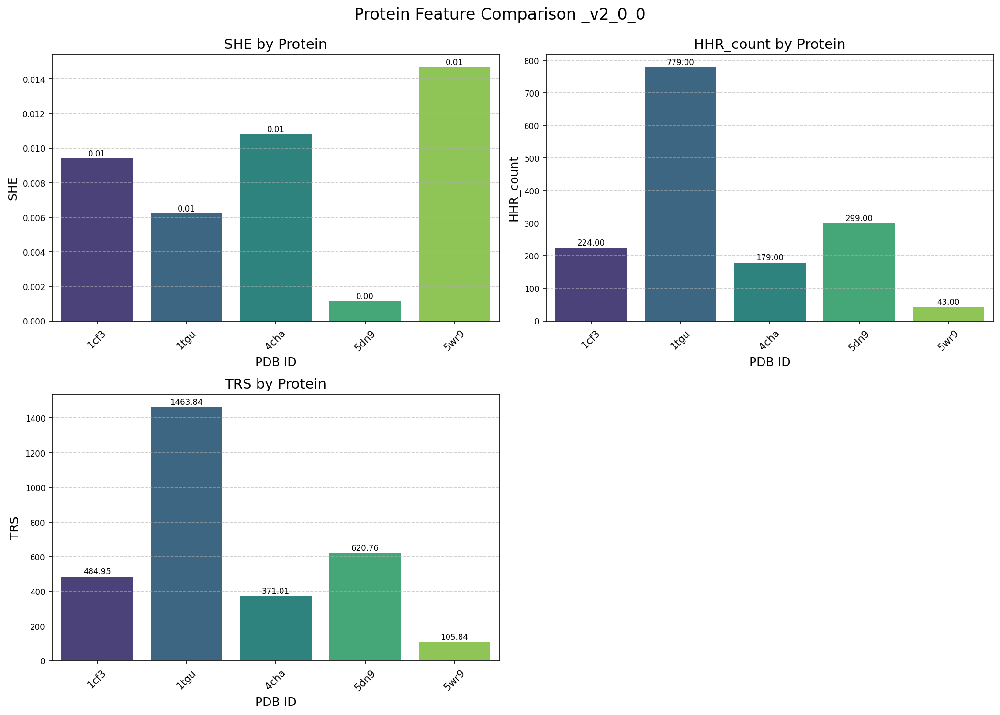

  산점도 (MSU-F (silica)) 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_0_0_20250528_074323/DeltaKD_TRS_Scatter_MSU-F_silica_v2_0_0_20250528_0743.png'


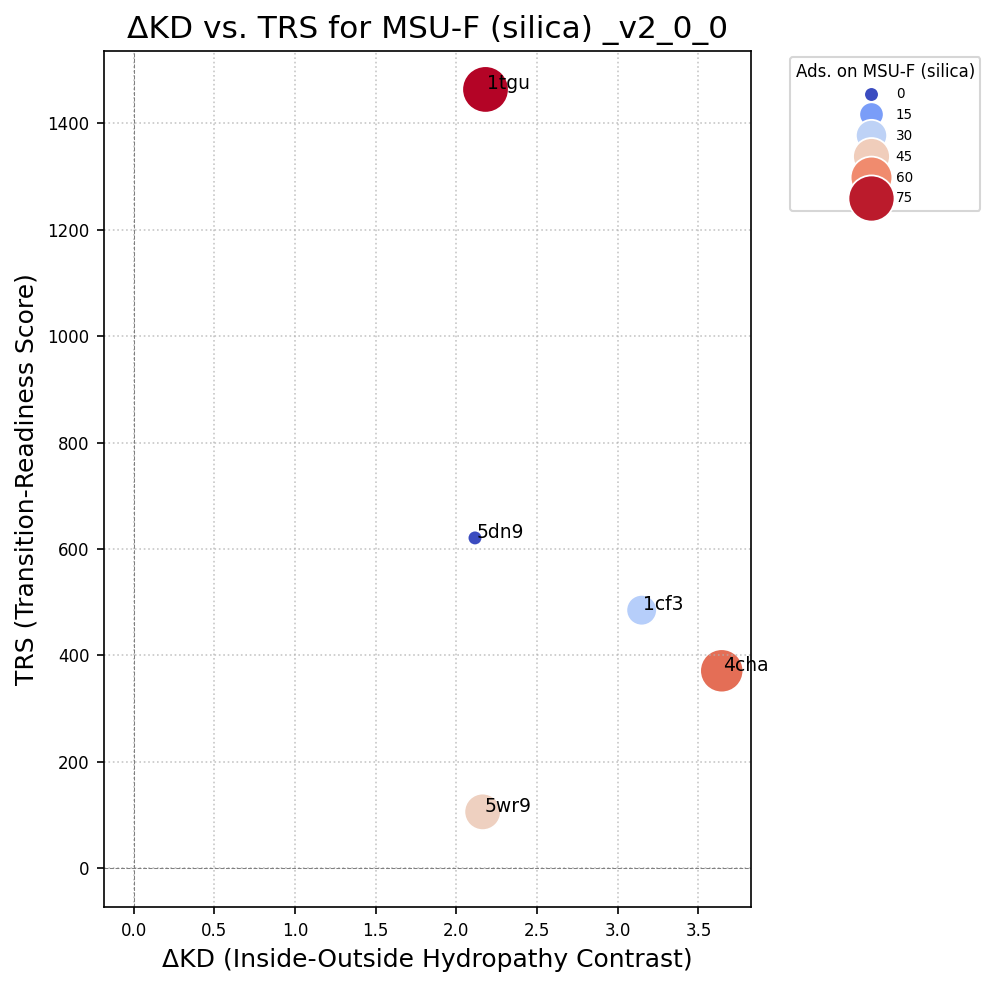

  산점도 (MSU-F-C (carbon)) 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_0_0_20250528_074323/DeltaKD_TRS_Scatter_MSU-F-C_carbon_v2_0_0_20250528_0743.png'


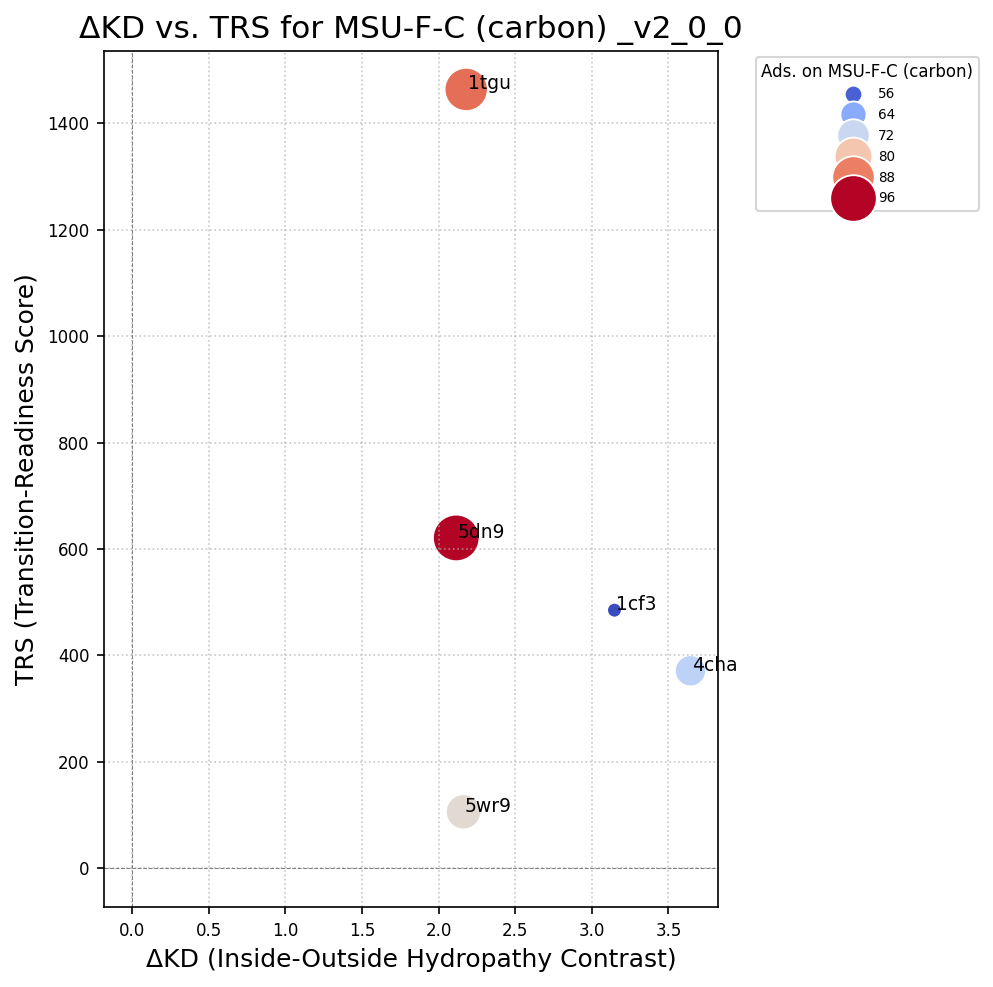


--- 지표와 실험적 흡착량 간의 상관관계 분석 ---

  표면: MSU-F (silica)
  Metric          | Pearson Coeff.  | Pearson P-value | Spearman Coeff. | Spearman P-value
------------------------------------------------------------------------------------------
  SHE             |      0.459      |    4.373e-01    |      0.300      |    6.238e-01   
  HHR_count       |      0.421      |    4.798e-01    |      0.100      |    8.729e-01   
  Delta_KD        |      0.249      |    6.864e-01    |      0.500      |    3.910e-01   
  TRS             |      0.391      |    5.157e-01    |      0.100      |    8.729e-01   
------------------------------------------------------------------------------------------

  표면: MSU-F-C (carbon)
  Metric          | Pearson Coeff.  | Pearson P-value | Spearman Coeff. | Spearman P-value
------------------------------------------------------------------------------------------
  SHE             |     -0.625      |    2.597e-01    |     -0.600      |    2.848e-01   
  HHR_count      

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns # 좀 더 예쁜 플롯을 위해 추가 (선택 사항)
from scipy.stats import pearsonr, spearmanr # 상관관계 계산용
from typing import List, Dict, Tuple, Any, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.0.0"
# pdb_save_path는 v1.x 시리즈 스크립트에서 생성된 _master_labeled_data_YYYYMMDD.csv 파일들이 있는 경로입니다.
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528' # 사용자 지정 경로
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"] # 분석할 PDB ID 목록

# --- 상수 정의 ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}

HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']

EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# === 데이터 로딩 및 전처리 함수 ===
def find_master_labeled_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    """지정된 PDB ID의 라벨링된 마스터 CSV 파일 경로를 찾습니다."""
    if date_tag:
        filename = f"{pdb_id}_master_labeled_data_{date_tag}.csv"
        path_to_check = os.path.join(base_path, filename)
        if os.path.exists(path_to_check):
            return path_to_check

    # 날짜 태그가 없거나, 해당 날짜 파일이 없을 경우, 날짜 없는 일반 파일명 시도
    filename_undated = f"{pdb_id}_master_labeled_data.csv"
    path_to_check_undated = os.path.join(base_path, filename_undated)
    if os.path.exists(path_to_check_undated):
        print(f"  참고: 날짜 태그 '{date_tag}' 파일 없음. 날짜 없는 파일 '{path_to_check_undated}' 사용.")
        return path_to_check_undated

    # 그래도 없으면, 가장 최근 날짜의 파일 검색 (선택적 고급 기능)
    # 여기서는 간단히 위 두 경우만 확인
    if date_tag: # 날짜를 지정했는데도 못찾은 경우
         print(f"  경고: '{filename}' 또는 '{filename_undated}' 파일을 '{base_path}'에서 찾을 수 없습니다.")
    else: # 날짜 지정 안했고, 일반 파일명도 없는 경우
         print(f"  경고: '{filename_undated}' 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    """DataFrame에 Kyte-Doolittle 소수성 점수 컬럼을 추가합니다."""
    if resname_col not in df.columns:
        print(f"  경고: KD score 계산을 위한 '{resname_col}' 컬럼이 DataFrame에 없습니다.")
        df[new_col_name] = np.nan
        return df

    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    # KD_score가 NaN인 경우 (예: 비표준 아미노산) 처리 확인
    if df[new_col_name].isnull().any():
        print(f"  참고: 일부 잔기에 대해 KD_score가 할당되지 않았습니다 (아마도 비표준 아미노산).")
    return df

# === 핵심 지표 계산 함수 ===
def calculate_protein_metrics(df: pd.DataFrame,
                              pdb_id: str, # 정보용
                              rsa_col: str = 'sasa_relative_total',
                              hydro_sasa_col: str = 'sasa_hydrophobic_total', # v1.1.x에서 생성된 총 소수성 SASA
                              total_sasa_col: str = 'sasa_absolute_total',
                              rmsf_t2_col: str = 'rmsf_T2.0',
                              kd_col: str = 'KD_score',
                              resname_col: str = 'residue_name_3L',
                              rsa_threshold_surface: float = 0.6, # SHE, Delta_KD용 (사용자 입력 가능)
                              rsa_threshold_buried: float = 0.25  # HHR, Delta_KD, TRS용 (고정 또는 사용자 입력)
                             ) -> Dict[str, Optional[float]]:
    """한 단백질(DataFrame)에 대해 4가지 주요 지표를 계산합니다."""
    metrics = {
        "PDB_ID": pdb_id,
        "SHE": None,
        "HHR_count": None,
        "Delta_KD": None,
        "TRS": None
    }

    # 필요한 컬럼 확인
    required_cols_for_metrics = [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t2_col, kd_col, resname_col]
    if not all(col in df.columns for col in required_cols_for_metrics):
        missing = [col for col in required_cols_for_metrics if col not in df.columns]
        print(f"  경고 ({pdb_id}): 지표 계산에 필요한 컬럼 {missing}이(가) 없어 일부 지표가 계산되지 않을 수 있습니다.")
        # return metrics # 필수 컬럼 없으면 빈 값 반환 또는 부분 계산

    # 데이터 숫자형 변환 (오류 발생 시 NaN)
    df_numeric = df.copy()
    for col in [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t2_col, kd_col]:
        if col in df_numeric.columns:
            df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')

    # --- SHE 계산 ---
    # RSA > rsa_threshold_surface 인 잔기들의 sasa_hydrophobic_total 합 / 전체 sasa_absolute_total 합
    if all(col in df_numeric.columns for col in [rsa_col, hydro_sasa_col, total_sasa_col]):
        surface_residues_for_she = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        sum_hydro_sasa_exposed = surface_residues_for_she[hydro_sasa_col].sum()
        sum_total_sasa_protein = df_numeric[total_sasa_col].sum()
        if pd.notna(sum_hydro_sasa_exposed) and pd.notna(sum_total_sasa_protein) and sum_total_sasa_protein > 0:
            metrics["SHE"] = sum_hydro_sasa_exposed / sum_total_sasa_protein
        else:
            print(f"  참고 ({pdb_id}): SHE 계산 불가 (필요 데이터 부족 또는 총 SASA=0).")

    # --- HHR_count 계산 ---
    # RSA < rsa_threshold_buried 인 특정 소수성 아미노산들의 개수
    if all(col in df_numeric.columns for col in [rsa_col, resname_col]):
        buried_hydrophobic_residues = df_numeric[
            (df_numeric[rsa_col] < rsa_threshold_buried) &
            (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))
        ]
        metrics["HHR_count"] = len(buried_hydrophobic_residues)

    # --- Delta_KD 계산 ---
    # (RSA < rsa_threshold_buried 잔기들의 평균 KD) - (RSA > rsa_threshold_surface 잔기들의 평균 KD)
    if all(col in df_numeric.columns for col in [rsa_col, kd_col]):
        buried_for_kd = df_numeric[df_numeric[rsa_col] < rsa_threshold_buried]
        surface_for_kd = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        if not buried_for_kd.empty and not surface_for_kd.empty and \
           buried_for_kd[kd_col].notna().any() and surface_for_kd[kd_col].notna().any():
            mean_kd_buried = buried_for_kd[kd_col].mean()
            mean_kd_surface = surface_for_kd[kd_col].mean()
            if pd.notna(mean_kd_buried) and pd.notna(mean_kd_surface):
                 metrics["Delta_KD"] = mean_kd_buried - mean_kd_surface
            else:
                print(f"  참고 ({pdb_id}): Delta_KD 계산 불가 (KD값 평균 계산 실패).")

        else:
            print(f"  참고 ({pdb_id}): Delta_KD 계산 불가 (내부 또는 표면 잔기 그룹이 비어있거나 KD값 없음).")

    # --- TRS 계산 ---
    # HHR_count * (HHR_count에 해당하는 내부 소수성 잔기들의 평균 RMSF_T2.0)
    if metrics["HHR_count"] is not None and metrics["HHR_count"] > 0 and rmsf_t2_col in df_numeric.columns:
        # buried_hydrophobic_residues는 위에서 HHR_count 계산 시 이미 필터링됨
        if not buried_hydrophobic_residues.empty and buried_hydrophobic_residues[rmsf_t2_col].notna().any():
            mean_rmsf_t2_of_hhr = buried_hydrophobic_residues[rmsf_t2_col].mean()
            if pd.notna(mean_rmsf_t2_of_hhr):
                metrics["TRS"] = metrics["HHR_count"] * mean_rmsf_t2_of_hhr
            else:
                 print(f"  참고 ({pdb_id}): TRS 계산 불가 (HHR 잔기들의 RMSF_T2.0 평균 계산 실패).")
        else:
            print(f"  참고 ({pdb_id}): TRS 계산 불가 (HHR 잔기 그룹이 비었거나 RMSF_T2.0 값 없음).")
            metrics["TRS"] = 0.0 # HHR_count는 >0 이지만, RMSF 평균을 못 구한 경우 (이론상 발생 어려움)
    elif metrics["HHR_count"] == 0:
        metrics["TRS"] = 0.0 # HHR_count가 0이면 TRS도 0

    return metrics

# === 시각화 함수들 ===
def plot_summary_metrics_bars(summary_df: pd.DataFrame, metrics_to_plot: List[str],
                              output_dir: str, file_suffix: str = ""):
    """요약된 지표들에 대해 단백질별 막대 플롯을 생성하고 저장합니다."""
    num_metrics = len(metrics_to_plot)
    if num_metrics == 0: return

    # PDB_ID를 인덱스로 사용
    plot_df = summary_df.set_index("PDB_ID")

    # NaN 값을 가진 지표는 0으로 대체하여 플롯 (또는 다른 방식으로 처리)
    plot_df = plot_df[metrics_to_plot].fillna(0)


    n_cols = 2 # 한 줄에 표시할 그래프 수
    n_rows = (num_metrics + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 5 * n_rows), squeeze=False)
    axes = axes.flatten() # 다루기 쉽게 1D 배열로

    for i, metric in enumerate(metrics_to_plot):
        if metric in plot_df.columns:
            sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
            axes[i].set_title(f"{metric} by Protein", fontsize=14)
            axes[i].set_xlabel("PDB ID", fontsize=12)
            axes[i].set_ylabel(metric, fontsize=12)
            axes[i].tick_params(axis='x', rotation=45, labelsize=10)
            axes[i].grid(axis='y', linestyle='--', alpha=0.7)
            # 막대 위에 값 표시
            for p in axes[i].patches:
                axes[i].annotate(f"{p.get_height():.2f}",
                                 (p.get_x() + p.get_width() / 2., p.get_height()),
                                 ha = 'center', va = 'center',
                                 xytext = (0, 5),
                                 textcoords = 'offset points', fontsize=8)


    # 남는 subplot 숨기기
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0, 1, 0.96]) # 전체 제목 공간 확보
    fig.suptitle(f"Protein Feature Comparison {file_suffix}", fontsize=16, y=0.99)

    plot_filename = f"Metrics_BarPlots{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=150)
        print(f"  막대 플롯 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 막대 플롯 저장 실패 - {e}")
    plt.show()
    plt.close(fig)


def plot_dkd_trs_scatter_vs_adsorption(summary_df: pd.DataFrame,
                                       adsorption_data_dict: Dict[str, Dict[str, float]],
                                       output_dir: str, file_suffix: str = ""):
    """(Delta_KD, TRS) 산점도를 그리고, 실험적 흡착량에 따라 점 크기/색상 조절."""
    if 'Delta_KD' not in summary_df.columns or 'TRS' not in summary_df.columns:
        print("  경고: Delta_KD 또는 TRS 지표가 없어 산점도를 그릴 수 없습니다.")
        return

    for surface_name, ads_values in adsorption_data_dict.items():
        # summary_df에 흡착량 데이터 추가
        current_ads_col = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[current_ads_col] = summary_df["PDB_ID"].map(ads_values)

        plt.figure(figsize=(8, 7))
        scatter_plot = sns.scatterplot(
            data=summary_df.dropna(subset=[current_ads_col, 'Delta_KD', 'TRS']), # NaN 값 있는 행 제외
            x="Delta_KD",
            y="TRS",
            size=current_ads_col, # 점 크기를 흡착량에 따라 조절
            hue=current_ads_col,  # 점 색상도 흡착량에 따라 조절
            sizes=(50, 500),      # 점 크기 범위
            palette="coolwarm",   # 색상 팔레트
            legend="brief"        # 범례 간략히
        )

        # 각 점에 PDB ID 텍스트 추가
        for i in range(summary_df.shape[0]):
            if pd.notna(summary_df.loc[i, 'Delta_KD']) and pd.notna(summary_df.loc[i, 'TRS']):
                plt.text(x=summary_df.loc[i, 'Delta_KD']+0.01, # 약간의 오프셋
                         y=summary_df.loc[i, 'TRS']+0.01,
                         s=summary_df.loc[i, 'PDB_ID'],
                         fontdict=dict(color='black',size=9))

        plt.title(f"ΔKD vs. TRS for {surface_name} {file_suffix}", fontsize=15)
        plt.xlabel("ΔKD (Inside-Outside Hydropathy Contrast)", fontsize=12)
        plt.ylabel("TRS (Transition-Readiness Score)", fontsize=12)
        plt.grid(True, linestyle=':', alpha=0.7)
        plt.axhline(0, color='grey', lw=0.5, linestyle='--')
        plt.axvline(0, color='grey', lw=0.5, linestyle='--')

        # 범례 위치 조정 (플롯 바깥으로)
        plt.legend(title=f"Ads. on {surface_name}", bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.tight_layout(rect=[0, 0, 0.85, 0.95]) # 범례 공간 확보

        plot_filename = f"DeltaKD_TRS_Scatter_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
        plot_full_path = os.path.join(output_dir, plot_filename)
        try:
            plt.savefig(plot_full_path, dpi=150)
            print(f"  산점도 ({surface_name}) 저장 완료: '{plot_full_path}'")
        except Exception as e: print(f"  오류: 산점도 저장 실패 - {e}")
        plt.show()
        plt.close()

# === 상관관계 계산 함수 ===
def calculate_and_print_correlations(summary_df: pd.DataFrame,
                                     metrics_to_correlate: List[str],
                                     adsorption_data_dict: Dict[str, Dict[str, float]]):
    """지표들과 실험적 흡착량 간의 Pearson 및 Spearman 상관계수를 계산하고 출력합니다."""
    print("\n--- 지표와 실험적 흡착량 간의 상관관계 분석 ---")

    for surface_name, ads_values in adsorption_data_dict.items():
        current_ads_col = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        # summary_df에 해당 surface의 흡착량 데이터가 이미 추가되어 있다고 가정
        if current_ads_col not in summary_df.columns:
            print(f"  경고: '{current_ads_col}' 흡착량 데이터가 없어 {surface_name} 표면 상관관계 분석을 건너<0xEB><0x9B><0x84>니다.")
            continue

        print(f"\n  표면: {surface_name}")
        print(f"  {'Metric':<15} | {'Pearson Coeff.':<15} | {'Pearson P-value':<15} | {'Spearman Coeff.':<15} | {'Spearman P-value':<15}")
        print("-" * 90)

        for metric in metrics_to_correlate:
            if metric in summary_df.columns:
                # NaN 값 제거 후 계산
                valid_data = summary_df[[metric, current_ads_col]].dropna()
                if len(valid_data) < 3: # 상관계수 계산에 충분한 데이터 포인트 수 확인
                    print(f"  {metric:<15} | {'N/A (데이터 부족)':<15} | {'N/A':<15} | {'N/A (데이터 부족)':<15} | {'N/A':<15}")
                    continue

                p_corr, p_pval = pearsonr(valid_data[metric], valid_data[current_ads_col])
                s_corr, s_pval = spearmanr(valid_data[metric], valid_data[current_ads_col])
                print(f"  {metric:<15} | {p_corr:^15.3f} | {p_pval:^15.3e} | {s_corr:^15.3f} | {s_pval:^15.3e}")
            else:
                print(f"  경고: 메트릭 컬럼 '{metric}'이 요약 테이블에 없어 상관관계 계산을 건너<0xEB><0x9B><0x84>니다.")
        print("-" * 90)

# === 메인 실행 로직 (v2.0) ===
def main_v2_0():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} ---")

    # 사용자로부터 마스터 CSV 파일들의 날짜 태그 입력받기
    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그를 입력하세요 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 특정 날짜 없으면 엔터): ").strip()

    # SHE 및 Delta_KD 계산에 사용될 "표면 잔기" RSA 임계값 입력받기
    try:
        rsa_surface_threshold_input = input(f"SHE 및 Delta_KD 계산 시 '표면 잔기'로 간주할 RSA 임계값을 입력하세요 (기본값 0.6): ").strip()
        rsa_surface_threshold = float(rsa_surface_threshold_input) if rsa_surface_threshold_input else 0.6
        if not (0.0 < rsa_surface_threshold <= 1.0):
            raise ValueError("RSA 임계값은 0 초과 1 이하 여야 합니다.")
    except ValueError as e:
        print(f"잘못된 RSA 임계값입니다: {e}. 기본값 0.6을 사용합니다.")
        rsa_surface_threshold = 0.6
    print(f"'표면 잔기' 정의를 위한 RSA 임계값: > {rsa_surface_threshold}")


    all_protein_metrics = []

    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_labeled_csv(pdb_id, pdb_save_path, date_tag_input)

        if not master_csv_path:
            print(f"  {pdb_id}의 마스터 CSV 파일을 찾을 수 없어 건너<0xEB><0x9B><0x84>니다.")
            # 모든 지표를 NaN 또는 0으로 하여 결과 리스트에 추가할 수 있음
            all_protein_metrics.append({"PDB_ID": pdb_id, "SHE": np.nan, "HHR_count": 0, "Delta_KD": np.nan, "TRS": np.nan})
            continue

        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")

            # KD score 추가
            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)

            # 4가지 지표 계산
            # HHR_count의 rsa_threshold_buried는 0.25로 고정
            # TRS의 rsa_threshold_buried도 0.25로 고정
            metrics = calculate_protein_metrics(df, pdb_id,
                                                rsa_threshold_surface=rsa_surface_threshold,
                                                rsa_threshold_buried=0.25)
            all_protein_metrics.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료: {metrics}")

        except Exception as e:
            print(f"  오류: {pdb_id} 처리 중 - {e}")
            all_protein_metrics.append({"PDB_ID": pdb_id, "SHE": np.nan, "HHR_count": 0, "Delta_KD": np.nan, "TRS": np.nan})


    # 모든 단백질의 지표를 하나의 DataFrame으로 통합
    summary_df = pd.DataFrame(all_protein_metrics)
    if summary_df.empty:
        print("\n분석된 단백질 데이터가 없습니다. 종료합니다.")
        return

    # 요약 DataFrame에 실험적 흡착량 값 추가
    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print("\n--- 계산된 전체 단백질 지표 요약 ---")
    print(summary_df.to_string())

    # 결과 저장 디렉토리 (PDB ID별이 아닌 공통 결과 디렉토리)
    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir):
        os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")

    # 요약 테이블 CSV 저장
    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_csv_full_path = os.path.join(analysis_output_dir, summary_csv_filename)
    try:
        summary_df.to_csv(summary_csv_full_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"  요약 테이블 저장 완료: '{summary_csv_full_path}'")
    except Exception as e: print(f"  오류: 요약 테이블 CSV 저장 실패 - {e}")


    # 시각화
    metrics_for_bar_plot = ["SHE", "HHR_count", "TRS"]
    plot_summary_metrics_bars(summary_df, metrics_for_bar_plot, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    plot_dkd_trs_scatter_vs_adsorption(summary_df, EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    # 상관관계 분석
    metrics_for_correlation = ["SHE", "HHR_count", "Delta_KD", "TRS"] # 또는 더 많은 조합
    calculate_and_print_correlations(summary_df, metrics_for_correlation, EXPERIMENTAL_ADSORPTION_VALUES)

    print("\n--- 모든 분석 작업 완료 ---")


if __name__ == "__main__":
    # 전역 변수 pdb_save_path 설정 확인 (필요시 사용자 환경에 맞게 수정)
    # pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path):
        print(f"경고: 전역 변수 pdb_save_path ('{pdb_save_path if 'pdb_save_path' in globals() else '미설정'}')가 유효한 디렉토리가 아닙니다. 현재 디렉토리를 사용합니다.")
        pdb_save_path = "." # 현재 스크립트가 실행되는 디렉토리

    # 스크립트 실행 전 필요한 패키지 설치 확인 안내 (선택적)
    # print("필요 패키지: pandas, numpy, matplotlib, seaborn, scipy, BioPython")
    # print("Colab 환경에서 실행 시, 예: !pip install pandas numpy matplotlib seaborn scipy biopython")

    main_v2_0()



네, v2.0 스크립트로 계산된 결과 이미지들을 잘 보았습니다! 이 데이터들을 바탕으로 과학적인 논의를 진행하고, 특히 "transition region"과 관련하여 소수성 표면적(hydrophobic area) 데이터를 어떻게 활용할 수 있을지 함께 심도 있게 고민해보겠습니다.

제공해주신 결과 이미지 분석 (v2.0 실행 결과):

image_9aaa3c.png (SHE, HHR_count, TRS 막대 플롯):
SHE (Surface Hydrophobic Exposure): 5wr9가 가장 높고, 5dn9가 거의 0에 가깝습니다. 1tgu는 상대적으로 낮은 SHE 값을 보입니다. 이는 이미 표면에 드러난 소수성의 정도를 나타냅니다.
HHR_count (Hidden Hydrophobic Reservoir count): 1tgu가 압도적으로 높은 값을 보이며, 이는 내부에 숨겨진 소수성 잔기가 매우 많음을 시사합니다. 5dn9와 1cf3도 상당한 HHR을 가지고 있고, 5wr9는 매우 적습니다.
TRS (Transition-Readiness Score): 1tgu가 가장 높은 TRS 값을 보이며, 이는 많은 HHR과 높은 유연성(T=2.0)을 동시에 가짐을 의미합니다. 5dn9도 비교적 높은 TRS 값을 보입니다. 5wr9는 HHR이 적어 TRS도 낮습니다.
image_9aa9e2.png (ΔKD vs. TRS for MSU-F (silica)):
점의 크기/색상이 MSU-F에서의 흡착량을 나타냅니다 (클수록/붉을수록 강한 흡착).
1tgu는 높은 TRS와 상대적으로 낮은 ΔKD(내외부 소수성 차이가 크지 않거나 내부가 약간 더 친수성)를 가지며, 실리카 표면에 가장 잘 흡착합니다.
4cha는 ΔKD가 가장 크지만(내부가 매우 소수성), TRS는 중간 정도이며 흡착량도 중간입니다.
5dn9는 ΔKD와 TRS 모두 중간 정도이며, 실리카 흡착은 거의 없습니다.
image_9aa97c.png (ΔKD vs. TRS for MSU-F-C (carbon)):
점의 크기/색상이 MSU-F-C에서의 흡착량을 나타냅니다.
5dn9가 가장 강하게 흡착하며, 중간 정도의 TRS와 낮은 ΔKD 값을 보입니다.
1tgu는 여전히 높은 TRS와 낮은 ΔKD를 가지며 강하게 흡착합니다.
5wr9는 TRS가 매우 낮지만, ΔKD는 중간 정도이며 상당한 흡착을 보입니다. 이는 SHE 값이 높았던 것과 관련 있을 수 있습니다 (이미 노출된 소수성이 기여).
image_9aa678.png (계산된 전체 단백질 지표 요약 테이블): 위 그래프의 수치 데이터를 보여줍니다.
image_9aa63f.png (상관관계 분석 결과):
MSU-F (silica):
SHE는 양의 상관관계(0.459 Pearson, 0.3 Spearman)를 보이지만, p-value가 높아 통계적 유의성은 낮습니다. (5개 데이터 포인트로는 당연합니다.)
HHR, ΔKD, TRS는 실리카 흡착과 뚜렷한 상관관계를 보이지 않습니다.
MSU-F-C (carbon):
SHE는 음의 상관관계(-0.625 Pearson, -0.6 Spearman)를 보입니다. 즉, 이미 표면에 노출된 소수성이 클수록 카본 흡착은 오히려 약해지는 경향이 있을 수 있습니다. 이는 매우 흥미로운 결과입니다!
ΔKD는 강한 음의 상관관계(-0.726 Pearson, -0.8 Spearman)를 보입니다. 즉, 내부가 외부보다 훨씬 소수성일수록(ΔKD가 클수록) 카본 흡착은 약해지는 경향이 있습니다. 반대로 말하면, 내부와 외부의 소수성 차이가 적거나 오히려 외부가 더 소수성인 단백질이 카본에 잘 붙을 수 있음을 시사합니다.
HHR과 TRS는 양의 상관관계를 보이지만, 통계적 유의성은 낮습니다.
과학적 논의 및 검토:

SHE (Surface Hydrophobic Exposure):
실리카 표면(MSU-F): 양의 상관 경향은 합리적입니다. 이미 노출된 소수성 부위가 있다면 약한 소수성 표면인 실리카와도 어느 정도 상호작용할 수 있습니다. 5wr9가 SHE가 가장 높고 흡착량도 중간 이상인 점이 이를 뒷받침합니다.
카본 표면(MSU-F-C): 음의 상관 경향은 매우 중요한 발견일 수 있습니다. 이는 단순히 "이미 노출된" 소수성만으로는 강한 소수성 표면과의 최적의 상호작용을 설명하기 어렵다는 것을 의미합니다. 오히려, 이미 많이 노출된 소수성 단백질은 카본 표면과의 상호작용 시 추가적인 구조 변화를 통해 더 넓은 소수성 면적을 노출시키려는 "구동력"이 적을 수 있습니다. 또는, 이미 노출된 소수성 패치의 형태나 분포가 카본 표면과의 최적의 결합에 불리할 수도 있습니다.
HHR_count (Hidden Hydrophobic Reservoir count):
1tgu가 압도적으로 높은 HHR을 가집니다. 이는 1tgu가 잠재적으로 노출시킬 수 있는 내부 소수성 잔기가 많다는 의미입니다.
카본 표면에서 HHR과 흡착량 간의 약한 양의 상관관계는, 내부 소수성 잔기가 많을수록 카본 표면과의 상호작용 시 유리할 수 있음을 시사하지만, 이것만으로는 충분하지 않습니다.
ΔKD (Inside–Outside Hydropathy Contrast):
카본 표면(MSU-F-C): 강한 음의 상관관계는 매우 의미심장합니다. ΔKD가 낮다는 것은 내부와 외부의 소수성 차이가 적거나, 심지어 외부가 내부보다 더 소수성일 수 있음을 의미합니다 (ΔKD가 음수일 경우). 5dn9는 ΔKD가 낮은 편(2.11)이면서 카본 흡착이 가장 강합니다. 이는 5dn9가 이미 표면 근처에 상당한 소수성을 가지고 있거나, 내부와 외부의 구분이 명확하지 않아 쉽게 소수성 내부를 드러낼 수 있는 구조적 특징을 가질 수 있음을 암시합니다. 4cha는 ΔKD가 가장 커서(3.64, 매우 뚜렷한 소수성 코어) 카본 흡착이 상대적으로 약합니다.
TRS (Transition-Readiness Score = HHR_count * mean RMSF_T2.0 of HHR):
카본 표면(MSU-F-C): TRS와 흡착량 간의 양의 상관 경향(0.467 Pearson, 0.5 Spearman)은 "숨겨진 소수성 잔기들이 많고, 이들이 T=2.0(강한 소수성 환경 모사)에서 유연하다면 카본 흡착에 유리하다"는 사용자님의 핵심 가설을 지지합니다.
5dn9의 경우: HHR_count는 1tgu보다 작지만(299 vs 779), TRS 값은 상당합니다(620). 이는 5dn9의 숨겨진 소수성 잔기들이 T=2.0에서 상대적으로 높은 유연성을 가짐을 의미합니다.
1tgu의 경우: HHR_count가 매우 높아 TRS도 가장 높습니다. 이는 1tgu가 카본 표면에서도 강하게 흡착하는 이유를 설명하는 데 기여합니다.
소수성 표면적(Hydrophobic Area) 데이터 활용 및 Transition Region 해석:

우리가 마스터 CSV에 계산해 놓은 sasa_hydrophobic_total (각 잔기의 총 소수성 원자 SASA)과 sasa_hydrophobic_exposed_gt0 (또는 _gt025) 값을 "transition region" 해석에 적극적으로 활용할 수 있습니다.

Transition Region 후보 잔기들의 특징 분석 심화:
v1.2.x 스크립트에서 is_transition_candidate로 라벨링된 잔기들에 대해, 이들의 sasa_hydrophobic_total 값의 합을 계산합니다. 이것이 바로 "숨겨져 있던 소수성 영역의 총면적"이 됩니다.
또한, 이 후보 잔기들이 T=2.0에서 얼마나 유연해지는지(delta_rmsf_T2_T1.4 또는 rmsf_T2.0 값)를 함께 고려합니다.
새로운 지표 제안: "Exposable Hydrophobic Area Potential (EHAP)"
EHAP = Σ (sasa_hydrophobic_total of transition candidate residues)
이 EHAP 값을 각 단백질에 대해 계산하여, 이것이 MSU-F-C에서의 흡착량과 어떤 상관관계를 보이는지 분석할 수 있습니다. FDH(5dn9)가 다른 단백질에 비해 이 EHAP 값이 높게 나온다면, 이것이 바로 FDH의 특이한 흡착 거동을 설명하는 강력한 근거가 될 것입니다.
"숨겨진 정도"와 "숨겨진 소수성 면적"의 결합:
단순히 sasa_relative_total < 0.25인 것뿐만 아니라, 이들 중에서도 sasa_hydrophobic_total이 큰 잔기들이 중요합니다.
Transition Candidate 정의 시, has_significant_buried_hydrophobicity 조건의 임계값(hydro_sasa_buried_thresh)을 P50, P75 등으로 다양하게 설정해보면서 결과의 민감도를 테스트해볼 수 있습니다.
FDH(5dn9)의 특이성에 대한 잠정적 설명 (현재 데이터 기반):

낮은 SHE: 5dn9는 표면에 이미 노출된 소수성이 매우 적습니다. 이는 실리카(MSU-F) 표면과의 초기 상호작용이 약할 수 있음을 시사하며, 실제 흡착량도 0입니다.
상대적으로 낮은 ΔKD: 내부와 외부의 소수성 차이가 다른 단백질(특히 4cha, 1cf3)에 비해 크지 않습니다. 이는 구조 변화 시 내부의 소수성 코어를 외부로 노출시키는 데 드는 에너지 장벽이 상대적으로 낮을 수 있음을 암시합니다.
상당한 TRS: 비록 1tgu보다는 낮지만, 5dn9는 상당한 수의 숨겨진 소수성 잔기(HHR_count=299)를 가지고 있으며, 이들이 T=2.0에서 어느 정도 유연성(TRS=620)을 보입니다.
가설: 5dn9는 평소에는 소수성 부위를 잘 숨기고 있지만 (낮은 SHE), 강한 소수성 환경인 카본 표면(MSU-F-C)을 만나면, 낮은 ΔKD와 상당한 TRS 값으로 대표되는 "transition-ready"한 내부 소수성 영역이 구조 변화를 통해 표면으로 노출되면서 매우 강한 흡착을 보이는 것으로 해석할 수 있습니다. 즉, "숨겨진 잠재력(HHR, TRS)이 특정 환경(MSU-F-C)에서 발현되는 것" 입니다.


## 2.1. hydrophobic area 분석
결론 및 다음 단계 제안:

현재 v2.0 스크립트로 계산된 지표들은 사용자님의 가설을 지지하는 흥미로운 결과들을 보여주고 있습니다. 특히 SHE와 ΔKD가 카본 표면 흡착과 음의 상관관계를 보이는 점, TRS가 양의 상관 경향을 보이는 점이 중요합니다.
다음 단계 (v2.1 또는 새로운 분석 스크립트):
EHAP (Exposable Hydrophobic Area Potential) 지표 계산: 위에서 제안한 EHAP 지표를 각 단백질에 대해 계산하고, 이것이 MSU-F-C 흡착량과 어떤 상관관계를 보이는지 분석합니다. (v1.2.x에서 is_transition_candidate로 라벨링된 잔기들의 sasa_hydrophobic_total 합산)
Transition Candidate 잔기 심층 분석: 각 단백질의 Transition Candidate 잔기들의 목록, 2차 구조 분포, 평균 RMSF 값 등을 비교합니다.
시각화 강화:
EHAP 값과 실험 흡착량을 비교하는 새로운 플롯을 추가합니다.
ΔKD vs TRS 산점도에서, 점의 크기를 HHR_count로, 색상을 MSU-F-C 흡착량으로 하여 더 많은 정보를 한 번에 보여주는 것도 고려해볼 수 있습니다.
결과 해석 부분 강화: 이 모든 정량적 데이터를 바탕으로 논문의 "XXX" 부분을 채울 수 있는 강력한 과학적 근거를 마련합니다.
이러한 방향으로 논의를 더 발전시켜 나가면 좋겠습니다. 특히 EHAP 지표 계산과 Transition Candidate 잔기들의 특성 비교는 FDH의 비밀을 푸는 데 핵심적인 역할을 할 수 있을 것 같습니다!

알겠습니다! v2.0 스크립트를 바탕으로, 분자량 또는 총 잔기 수에 의한 정규화(Normalization) 개념을 도입하여 더욱 섬세하고 과학적으로 타당한 분석을 수행할 수 있도록 v2.1 - Adsorption Feature Analyzer (Normalized) 스크립트를 작성해 보겠습니다. 🔬

이전 v2.0 스크립트에서 계산한 SHE, HHR_count, TRS 등의 지표들은 단백질의 전체 크기에 영향을 받을 수 있습니다. 특히 HHR_count나 TRS는 분자량이 큰 단백질에서 단순히 더 많은 잔기로 인해 높게 나타날 수 있습니다. 정규화를 통해 이러한 크기 효과를 보정하고, 각 단백질의 "단위 크기당" 또는 "단위 표면적당" 고유한 특성을 비교할 수 있게 됩니다.



--- 단백질 흡착 특징 분석기 v2.1.0 (정규화 지표 포함) ---
분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: 20250528, 특정 날짜 없으면 엔터): 20250527
SHE 및 Delta_KD 계산 시 '표면 잔기' RSA 임계값 (기본 0.6): 0.75
'표면 잔기' 정의 RSA 임계값: > 0.75
EHAP 계산에 사용할 Transition Candidate 라벨의 'set_key'를 입력하세요 (예: set3_user_0.25_defaults, 없거나 v1.2.3 파일 사용 시 엔터): 
EHAP 계산을 위해 Transition Candidate 컬럼 'is_transition_candidate_v1.2.3'을(를) 사용합니다 (기본값).

--- 1CF3 처리 시작 ---
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/1cf3_master_labeled_data_20250527.csv' 로드 완료.
  총 잔기 수: 581, 계산된 분자량: 173901.49640000513 Da
  1cf3 지표 계산 완료.

--- 1TGU 처리 시작 ---
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/1tgu_master_labeled_data_20250527.csv' 로드 완료.
  총 잔기 수: 1996, 계산된 분자량: 597387.0828999837 Da
  1tgu 지표 계산 완료.

--- 4CHA 처리 시작 ---
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/4cha_master_labeled_data_20250527.csv' 로드 완료.
  총 잔기 수: 477, 계산된 분자량: 142776.05400000233 Da
  4cha 지

<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` i

  막대 플롯 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_1_0_20250528_084003/Metrics_BarPlots_Absolute_v2_1_0_20250528_084004.png'


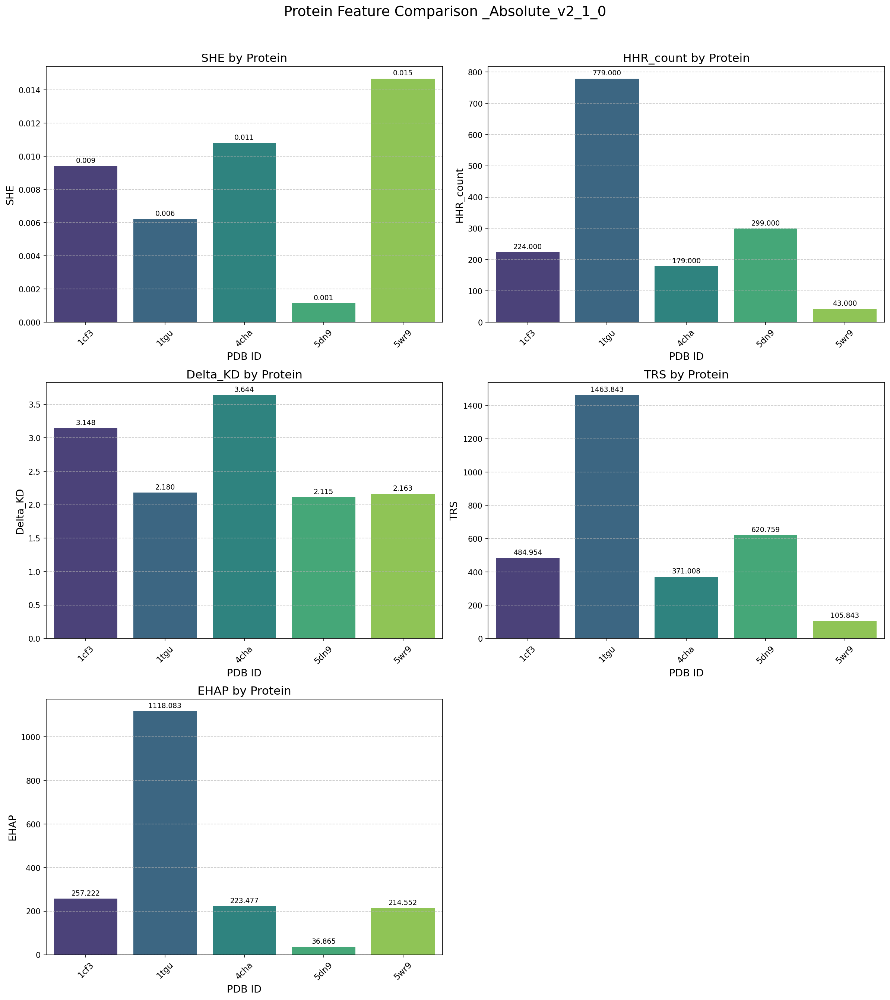

<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-25-d3834f53e5ab>:212: FutureWarning: 

Passing `palette` without assigning `hue` i

  막대 플롯 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_1_0_20250528_084003/Metrics_BarPlots_Normalized_v2_1_0_20250528_084007.png'


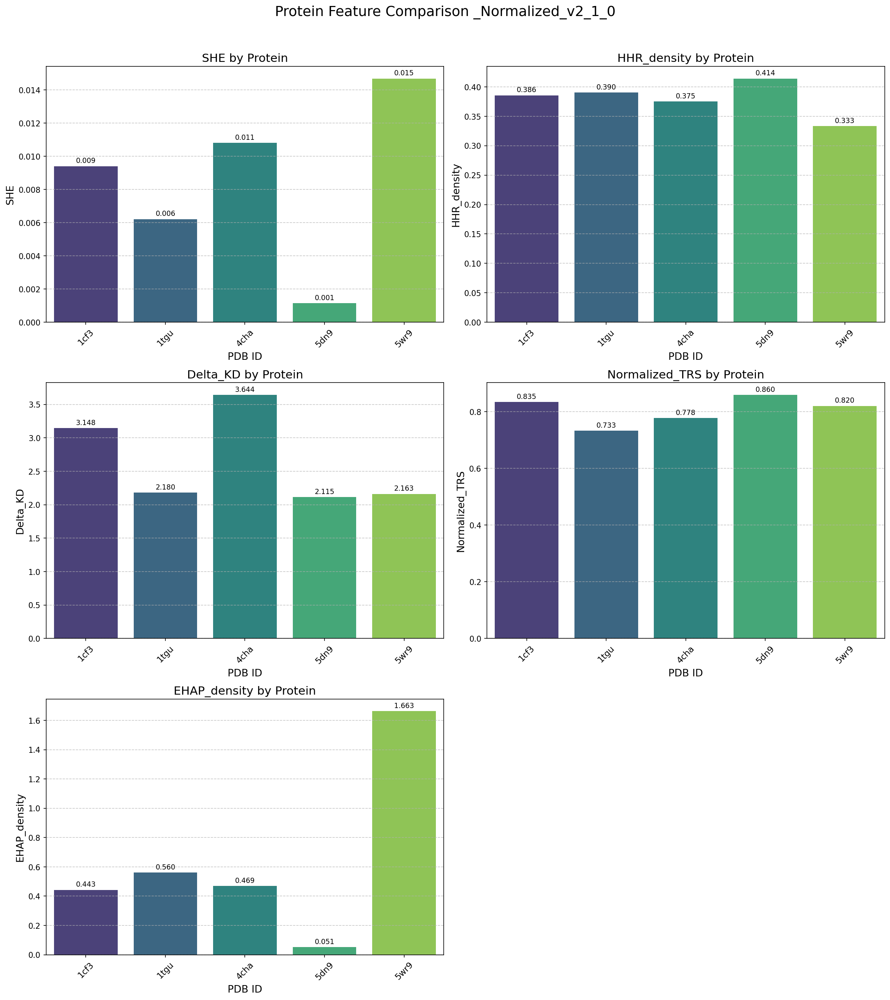

  산점도 (MSU-F (silica), Delta_KD vs TRS) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_1_0_20250528_084003/Delta_KD_TRS_Scatter_MSU-F_silica_Original_v2_1_0_20250528_084011.png'


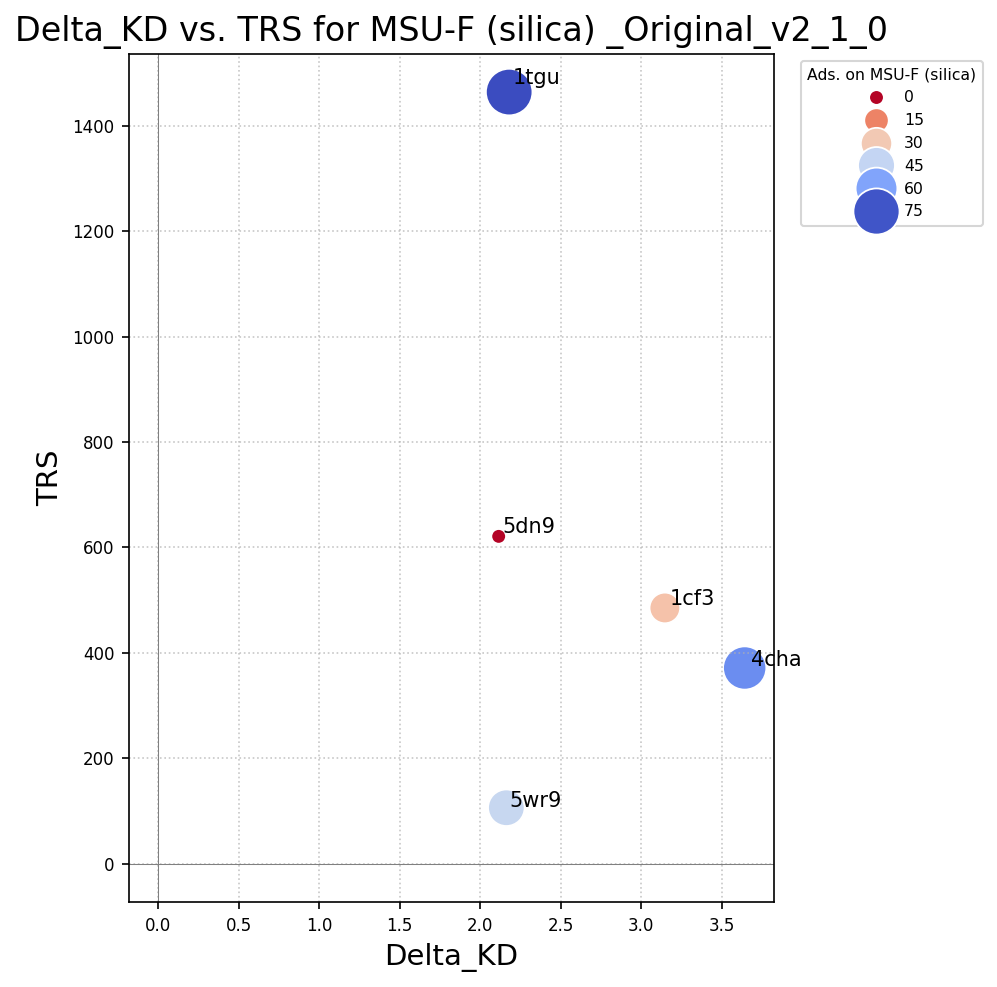

  산점도 (MSU-F-C (carbon), Delta_KD vs TRS) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_1_0_20250528_084003/Delta_KD_TRS_Scatter_MSU-F-C_carbon_Original_v2_1_0_20250528_084012.png'


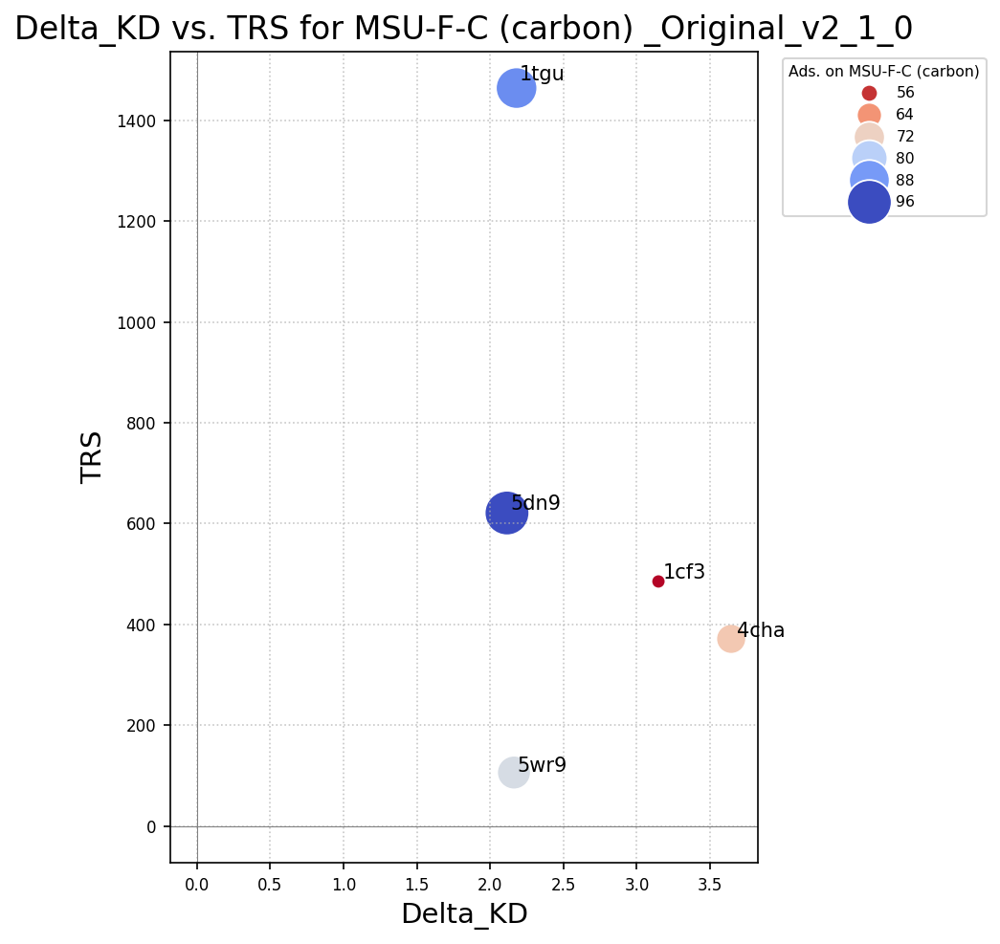

  산점도 (MSU-F (silica), Delta_KD vs Normalized_TRS) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_1_0_20250528_084003/Delta_KD_Normalized_TRS_Scatter_MSU-F_silica_NormTRS_v2_1_0_20250528_084013.png'


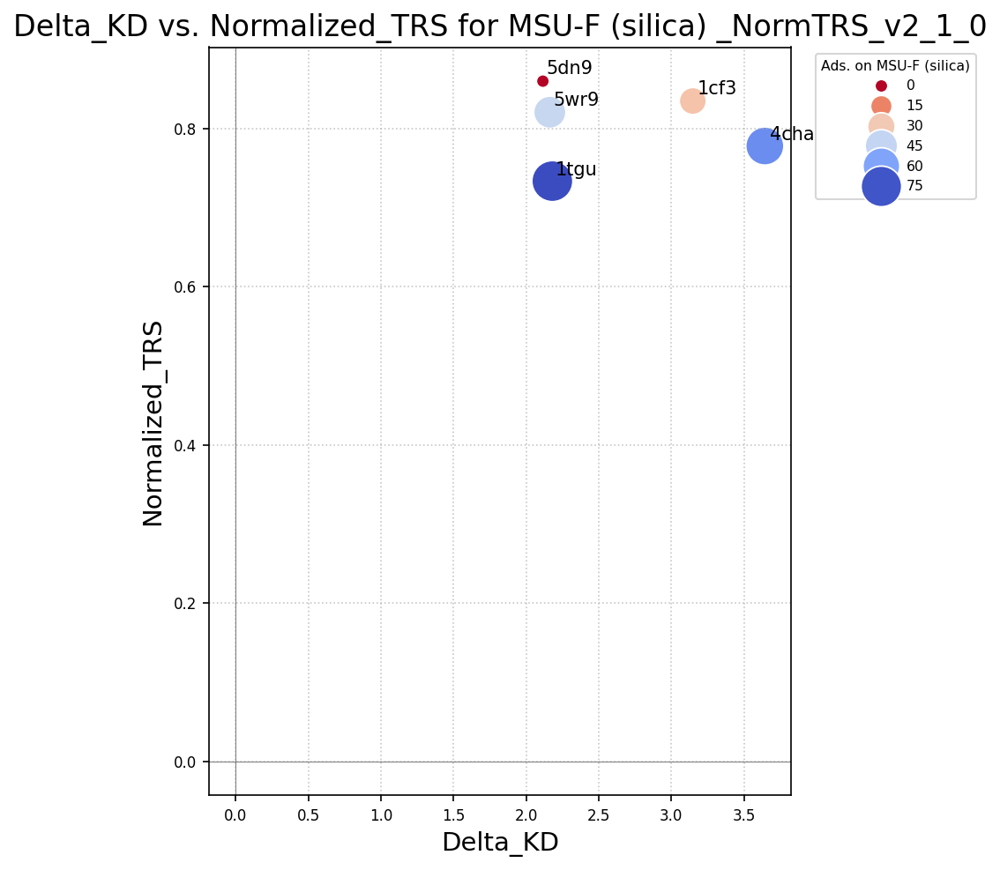

  산점도 (MSU-F-C (carbon), Delta_KD vs Normalized_TRS) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528/Analysis_Results_v2_1_0_20250528_084003/Delta_KD_Normalized_TRS_Scatter_MSU-F-C_carbon_NormTRS_v2_1_0_20250528_084015.png'


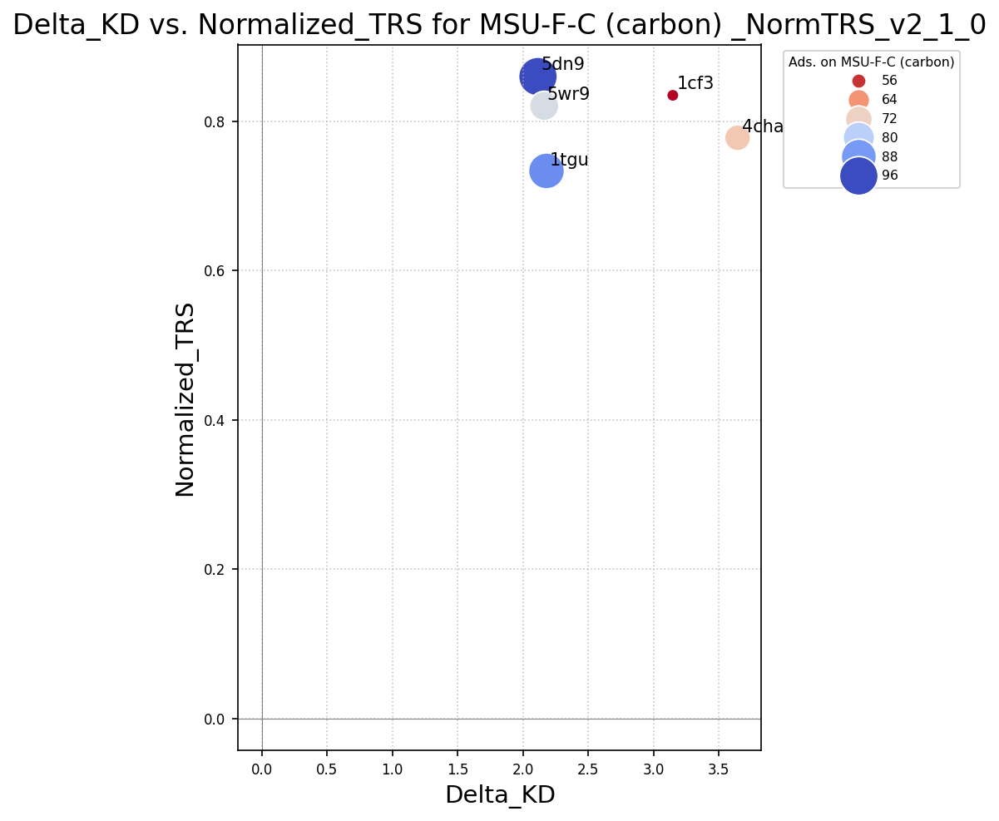


--- 지표와 실험적 흡착량 간의 상관관계 분석 ---

  표면: MSU-F (silica)
  Metric               | Pearson Coeff.  | Pearson P-val   | Spearman Coeff. | Spearman P-val 
-----------------------------------------------------------------------------------------------
  SHE                  |      0.459      |    4.373e-01    |      0.300      |    6.238e-01   
  HHR_count            |      0.421      |    4.798e-01    |      0.100      |    8.729e-01   
  Delta_KD             |      0.249      |    6.864e-01    |      0.500      |    3.910e-01   
  TRS                  |      0.391      |    5.157e-01    |      0.100      |    8.729e-01   
  EHAP                 |      0.730      |    1.618e-01    |      0.700      |    1.881e-01   
  HHR_density          |     -0.378      |    5.309e-01    |     -0.300      |    6.238e-01   
  Normalized_TRS       |     -0.954      |    1.191e-02    |     -1.000      |    1.404e-24   
  EHAP_density         |      0.310      |    6.113e-01    |      0.700      |    1.881e-0

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from Bio.SeqUtils.ProtParam import ProteinAnalysis # 분자량 계산용
from typing import List, Dict, Tuple, Any, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.1.0" # 정규화된 지표 추가
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/20250528'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 (v2.0과 동일) ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# === 데이터 로딩 및 전처리 함수 ===
def find_master_labeled_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    # (v2.0과 동일)
    if date_tag:
        filename = f"{pdb_id}_master_labeled_data_{date_tag}.csv"
        path_to_check = os.path.join(base_path, filename)
        if os.path.exists(path_to_check): return path_to_check
    filename_undated = f"{pdb_id}_master_labeled_data.csv"
    path_to_check_undated = os.path.join(base_path, filename_undated)
    if os.path.exists(path_to_check_undated):
        print(f"  참고: 날짜 태그 '{date_tag}' 파일 없음. 날짜 없는 파일 '{path_to_check_undated}' 사용.")
        return path_to_check_undated
    if date_tag: print(f"  경고: '{filename}' 또는 '{filename_undated}' 파일 찾을 수 없음.")
    else: print(f"  경고: '{filename_undated}' 파일 찾을 수 없음.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    # (v2.0과 동일)
    if resname_col not in df.columns:
        df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    if df[new_col_name].isnull().any():
        print(f"  참고: 일부 잔기 KD_score 할당 안됨 (비표준 아미노산 등).")
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame,
                                chain_col: str = 'chain_id',
                                res_num_col: str = 'residue_number',
                                res_name_1L_col: str = 'residue_name_1L' # 1글자 코드가 필요
                               ) -> Tuple[Optional[str], Optional[float], int]:
    """DataFrame에서 아미노산 서열, 총 잔기 수, 분자량을 반환합니다."""
    if res_name_1L_col not in df.columns:
        print(f"  경고: 분자량 계산을 위한 '{res_name_1L_col}' 컬럼이 없습니다.")
        # 총 잔기 수는 다른 방법으로 계산 가능
        num_residues = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0] if chain_col in df.columns and res_num_col in df.columns else len(df)
        return None, None, num_residues

    # 체인별로 정렬 후 서열 구성 (여러 체인인 경우 첫 번째 체인 또는 모든 체인 연결)
    # 여기서는 단순화를 위해 단일 체인이거나, 첫 번째 체인의 데이터를 주로 사용한다고 가정
    # 또는 모든 잔기를 순서대로 연결하여 전체 단백질의 근사 서열로 사용

    # 올바른 서열 구성을 위해 체인 ID와 잔기 번호로 정렬
    df_sorted = df.sort_values(by=[chain_col, res_num_col])
    # 중복 제거 (같은 잔기가 여러 행으로 있는 경우 방지)
    unique_residues_df = df_sorted.drop_duplicates(subset=[chain_col, res_num_col])

    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())
    num_residues = len(unique_residues_df)

    if not sequence:
        print("  경고: 유효한 아미노산 서열을 구성할 수 없습니다.")
        return None, None, num_residues

    try:
        # 비표준 아미노산 문자 제거 (ProteinAnalysis는 표준 아미노산만 처리)
        # 표준 아미노산 1글자 코드: ACDEFGHIKLMNPQRSTVWY
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence:
             print("  경고: 표준 아미노산으로 구성된 서열이 없습니다.")
             return sequence, None, num_residues

        analysed_protein = ProteinAnalysis(cleaned_sequence)
        molecular_weight = analysed_protein.molecular_weight()
        return sequence, molecular_weight, num_residues
    except Exception as e:
        print(f"  오류: 분자량 계산 중 - {e}")
        return sequence, None, num_residues


# === 핵심 지표 계산 함수 (정규화된 지표 포함) ===
def calculate_protein_metrics_v2_1(df: pd.DataFrame,
                                   pdb_id: str,
                                   total_residues: int, # 정규화를 위해 추가
                                   molecular_weight: Optional[float], # 정보용 및 정규화용
                                   # ... (v2.0의 나머지 인자들은 동일) ...
                                   rsa_col: str = 'sasa_relative_total',
                                   hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                   total_sasa_col: str = 'sasa_absolute_total',
                                   rmsf_t2_col: str = 'rmsf_T2.0',
                                   kd_col: str = 'KD_score',
                                   resname_col: str = 'residue_name_3L',
                                   tc_col: str = 'is_transition_candidate', # TC 라벨 컬럼명
                                   rsa_threshold_surface: float = 0.6,
                                   rsa_threshold_buried: float = 0.25
                                  ) -> Dict[str, Any]:
    """v2.0 지표 계산 + 정규화된 지표 및 EHAP 포함."""
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "SHE": None, "HHR_count": None, "Delta_KD": None, "TRS": None,
                "HHR_density": None, "Normalized_TRS": None, "EHAP": None, "EHAP_density": None }

    df_numeric = df.copy()
    for col in [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t2_col, kd_col]:
        if col in df_numeric.columns: df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')

    # SHE (v2.0과 동일)
    if all(col in df_numeric.columns for col in [rsa_col, hydro_sasa_col, total_sasa_col]):
        surface_residues_for_she = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        sum_hydro_sasa_exposed = surface_residues_for_she[hydro_sasa_col].sum()
        sum_total_sasa_protein = df_numeric[total_sasa_col].sum()
        if pd.notna(sum_hydro_sasa_exposed) and pd.notna(sum_total_sasa_protein) and sum_total_sasa_protein > 0:
            metrics["SHE"] = sum_hydro_sasa_exposed / sum_total_sasa_protein

    # HHR_count (v2.0과 동일) & HHR_density
    buried_hydrophobic_residues_df = pd.DataFrame() # TRS와 EHAP에서도 사용하기 위해 범위 확장
    if all(col in df_numeric.columns for col in [rsa_col, resname_col]):
        buried_hydrophobic_residues_df = df_numeric[
            (df_numeric[rsa_col] < rsa_threshold_buried) &
            (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))
        ]
        metrics["HHR_count"] = len(buried_hydrophobic_residues_df)
        if total_residues > 0 and metrics["HHR_count"] is not None:
            metrics["HHR_density"] = metrics["HHR_count"] / total_residues

    # Delta_KD (v2.0과 동일)
    if all(col in df_numeric.columns for col in [rsa_col, kd_col]):
        buried_for_kd = df_numeric[df_numeric[rsa_col] < rsa_threshold_buried]
        surface_for_kd = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        if not buried_for_kd.empty and not surface_for_kd.empty and \
           buried_for_kd[kd_col].notna().any() and surface_for_kd[kd_col].notna().any():
            mean_kd_buried = buried_for_kd[kd_col].mean()
            mean_kd_surface = surface_for_kd[kd_col].mean()
            if pd.notna(mean_kd_buried) and pd.notna(mean_kd_surface):
                 metrics["Delta_KD"] = mean_kd_buried - mean_kd_surface

    # TRS (v2.0과 동일) & Normalized_TRS
    if metrics["HHR_count"] is not None and metrics["HHR_count"] > 0 and \
       rmsf_t2_col in df_numeric.columns and not buried_hydrophobic_residues_df.empty:
        mean_rmsf_t2_of_hhr = buried_hydrophobic_residues_df[rmsf_t2_col].mean()
        if pd.notna(mean_rmsf_t2_of_hhr):
            metrics["TRS"] = metrics["HHR_count"] * mean_rmsf_t2_of_hhr
            if total_residues > 0 and metrics["HHR_density"] is not None : # HHR_density가 먼저 계산되었어야 함
                 metrics["Normalized_TRS"] = metrics["HHR_density"] * mean_rmsf_t2_of_hhr
    elif metrics["HHR_count"] == 0:
        metrics["TRS"] = 0.0
        metrics["Normalized_TRS"] = 0.0

    # EHAP & EHAP_density
    # tc_col (Transition Candidate 라벨 컬럼)이 필요. 이 컬럼은 v1.2.x에서 생성됨.
    # 이 v2.1 스크립트는 v1.2.x의 출력을 사용하므로, tc_col이 존재한다고 가정.
    # 만약 여러 TC 라벨이 있다면 (다른 임계값 세트로 생성), 어떤 것을 쓸지 지정 필요.
    # 여기서는 'is_transition_candidate' 또는 가장 일반적인 TC 컬럼을 사용한다고 가정.

    # tc_col 이름이 v1.2.4의 배치 실행 결과물에 따라 다를 수 있으므로,
    # 일단은 'is_transition_candidate' 또는 'is_tc'와 같은 일반적 이름으로 찾도록 시도.
    # 또는 main에서 파일 로드 시 특정 tc_col을 지정하도록 유도.

    # 실제 tc_col은 v1.2.x에서 라벨링된 컬럼명을 사용해야 함.
    # 예: 'is_tc_set1_strict_exposure_high_flex' 등.
    # 여기서는 일단 'is_tc'라는 일반적인 이름으로 가정하고, main에서 처리.

    if tc_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        # bool 타입으로 변환 (문자열 'True'/'False'일 수 있음)
        df_numeric[tc_col] = df_numeric[tc_col].astype(str).str.lower().map({'true': True, 'false': False, 'nan': False}).fillna(False)

        transition_candidates_df = df_numeric[df_numeric[tc_col] == True]
        if not transition_candidates_df.empty:
            metrics["EHAP"] = transition_candidates_df[hydro_sasa_col].sum()
            if pd.notna(metrics["EHAP"]) and total_residues > 0:
                metrics["EHAP_density"] = metrics["EHAP"] / total_residues
        else:
            metrics["EHAP"] = 0.0
            metrics["EHAP_density"] = 0.0
    else:
        print(f"  경고 ({pdb_id}): EHAP 계산에 필요한 컬럼 '{tc_col}' 또는 '{hydro_sasa_col}' 없음.")

    return metrics

# === 시각화 함수들 (v2.0과 유사, 추가 지표 플로팅 고려) ===
def plot_summary_metrics_bars_v2_1(summary_df: pd.DataFrame,
                                   metrics_to_plot: List[str],
                                   output_dir: str, file_suffix: str = ""):
    # (v2.0의 plot_summary_metrics_bars 함수와 거의 동일, metrics_to_plot에 정규화된 지표 포함 가능)
    num_metrics = len(metrics_to_plot)
    if num_metrics == 0: return
    plot_df = summary_df.set_index("PDB_ID")[metrics_to_plot].fillna(0)
    n_cols = 2
    n_rows = (num_metrics + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 6 * n_rows), squeeze=False)
    axes = axes.flatten()
    for i, metric in enumerate(metrics_to_plot):
        if metric in plot_df.columns:
            sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
            axes[i].set_title(f"{metric} by Protein", fontsize=15)
            axes[i].set_xlabel("PDB ID", fontsize=13)
            axes[i].set_ylabel(metric, fontsize=13)
            axes[i].tick_params(axis='x', rotation=45, labelsize=11)
            axes[i].tick_params(axis='y', labelsize=10)
            axes[i].grid(axis='y', linestyle='--', alpha=0.7)
            for p in axes[i].patches:
                axes[i].annotate(f"{p.get_height():.3f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                                 ha = 'center', va = 'center', xytext = (0, 7), textcoords = 'offset points', fontsize=9)
    for j in range(i + 1, len(axes)): fig.delaxes(axes[j])
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    fig.suptitle(f"Protein Feature Comparison {file_suffix}", fontsize=18, y=0.99)
    plot_filename = f"Metrics_BarPlots{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
    plt.savefig(os.path.join(output_dir, plot_filename), dpi=150)
    print(f"  막대 플롯 저장: '{os.path.join(output_dir, plot_filename)}'")
    plt.show(); plt.close(fig)

def plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df: pd.DataFrame,
                                            x_metric: str, y_metric: str, # 어떤 TRS/Delta_KD를 쓸지 지정
                                            adsorption_data_dict: Dict[str, Dict[str, float]],
                                            output_dir: str, file_suffix: str = ""):
    # (v2.0의 함수와 유사, x_metric과 y_metric을 인자로 받아 유연성 확보)
    if x_metric not in summary_df.columns or y_metric not in summary_df.columns:
        print(f"  경고: '{x_metric}' 또는 '{y_metric}' 지표 없어 산점도 생성 불가."); return

    for surface_name, ads_values in adsorption_data_dict.items():
        current_ads_col = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        # summary_df에 흡착량 데이터는 main에서 미리 추가됨

        plt.figure(figsize=(8, 7))
        plot_data = summary_df.dropna(subset=[current_ads_col, x_metric, y_metric])
        if plot_data.empty :
            print(f"  경고: {surface_name} 산점도 그리기에 유효한 데이터 없음 (NaN 값 확인)."); continue

        sns.scatterplot(data=plot_data, x=x_metric, y=y_metric, size=current_ads_col,
                        hue=current_ads_col, sizes=(50, 500), palette="coolwarm_r", legend="brief") # _r로 색상 반전
        for i in range(plot_data.shape[0]):
            plt.text(x=plot_data.iloc[i][x_metric]*1.01, y=plot_data.iloc[i][y_metric]*1.01,
                     s=plot_data.iloc[i]['PDB_ID'], fontdict=dict(color='black',size=10))
        plt.title(f"{x_metric} vs. {y_metric} for {surface_name} {file_suffix}", fontsize=16)
        plt.xlabel(f"{x_metric}", fontsize=14); plt.ylabel(f"{y_metric}", fontsize=14)
        plt.grid(True, linestyle=':', alpha=0.7); plt.axhline(0, color='grey', lw=0.5); plt.axvline(0, color='grey', lw=0.5)
        plt.legend(title=f"Ads. on {surface_name}", bbox_to_anchor=(1.03, 1), loc='upper left', title_fontsize='small', fontsize='small')
        plt.tight_layout(rect=[0, 0, 0.83, 0.95])
        plot_filename = f"{x_metric}_{y_metric}_Scatter_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
        plt.savefig(os.path.join(output_dir, plot_filename), dpi=150)
        print(f"  산점도 ({surface_name}, {x_metric} vs {y_metric}) 저장: '{os.path.join(output_dir, plot_filename)}'")
        plt.show(); plt.close()

# === 상관관계 계산 함수 (v2.0과 유사, 추가 지표 포함 가능) ===
def calculate_and_print_correlations_v2_1(summary_df: pd.DataFrame,
                                          metrics_to_correlate: List[str],
                                          adsorption_data_dict: Dict[str, Dict[str, float]]):
    # (v2.0의 함수와 거의 동일, metrics_to_correlate에 정규화된 지표 포함 가능)
    print("\n--- 지표와 실험적 흡착량 간의 상관관계 분석 ---")
    for surface_name, ads_values in adsorption_data_dict.items():
        current_ads_col = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        if current_ads_col not in summary_df.columns: continue
        print(f"\n  표면: {surface_name}")
        print(f"  {'Metric':<20} | {'Pearson Coeff.':<15} | {'Pearson P-val':<15} | {'Spearman Coeff.':<15} | {'Spearman P-val':<15}")
        print("-" * 95)
        for metric in metrics_to_correlate:
            if metric in summary_df.columns:
                valid_data = summary_df[[metric, current_ads_col]].dropna()
                if len(valid_data) < 3:
                    print(f"  {metric:<20} | {'N/A (데이터 부족)':<15} | {'N/A':<15} | {'N/A (데이터 부족)':<15} | {'N/A':<15}"); continue
                p_corr, p_pval = pearsonr(valid_data[metric], valid_data[current_ads_col])
                s_corr, s_pval = spearmanr(valid_data[metric], valid_data[current_ads_col])
                print(f"  {metric:<20} | {p_corr:^15.3f} | {p_pval:^15.3e} | {s_corr:^15.3f} | {s_pval:^15.3e}")
        print("-" * 95)

# === 메인 실행 로직 (v2.1) ===
def main_v2_1():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (정규화 지표 포함) ---")

    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 특정 날짜 없으면 엔터): ").strip()

    try:
        rsa_surface_threshold_input = input(f"SHE 및 Delta_KD 계산 시 '표면 잔기' RSA 임계값 (기본 0.6): ").strip()
        rsa_surface_threshold = float(rsa_surface_threshold_input) if rsa_surface_threshold_input else 0.6
        if not (0.0 < rsa_surface_threshold <= 1.0): raise ValueError("RSA 임계값은 0 초과 1 이하.")
    except ValueError as e: print(f"잘못된 RSA 임계값: {e}. 기본값 0.6 사용."); rsa_surface_threshold = 0.6
    print(f"'표면 잔기' 정의 RSA 임계값: > {rsa_surface_threshold}")

    # EHAP 계산을 위한 Transition Candidate 컬럼명 규칙 지정
    # v1.2.4의 출력 파일명 규칙을 고려하여, 사용자가 어떤 TC 세트 결과를 쓸지 선택하게 하거나,
    # 가장 기본적이거나 대표적인 TC 컬럼명을 가정해야 함.
    # 여기서는 예시로 'is_tc_set3_user_0.25_defaults' 또는 'is_transition_candidate_v1.2.3'을 사용한다고 가정.
    # 실제로는 파일에서 가능한 TC 컬럼 목록을 보여주고 선택하게 하는 것이 좋음.
    # 우선은 가장 일반적인 'is_transition_candidate' 또는 'is_tc'로 시도하고, 없으면 사용자에게 물어보도록 수정 가능.

    # v1.2.3 기준으로는 'is_transition_candidate_v1.2.3'
    # v1.2.4 기준으로는 'is_tc_{set_key}' 형태
    # 여기서는 v1.2.3 출력을 기본으로 하고, 사용자가 파일명으로 set_key를 알 수 있게 유도
    default_tc_col_base = 'is_transition_candidate_v1.2.3' # v1.2.3 출력 기준

    # 만약 v1.2.4의 배치 결과물을 사용한다면, 어떤 set_key의 TC 컬럼을 쓸지 지정해야 함
    tc_set_key_for_ehap = input(f"EHAP 계산에 사용할 Transition Candidate 라벨의 'set_key'를 입력하세요 (예: set3_user_0.25_defaults, 없거나 v1.2.3 파일 사용 시 엔터): ").strip()
    if tc_set_key_for_ehap:
        specific_tc_col = f"is_tc_{tc_set_key_for_ehap}"
        print(f"EHAP 계산을 위해 Transition Candidate 컬럼 '{specific_tc_col}'을(를) 사용합니다.")
    else:
        specific_tc_col = default_tc_col_base
        print(f"EHAP 계산을 위해 Transition Candidate 컬럼 '{specific_tc_col}'을(를) 사용합니다 (기본값).")


    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        # v1.2.4의 출력 파일명 형식 PDBID_labeled_{set_key}_YYYYMMDD.csv
        # 또는 v1.2.3의 출력 파일명 PDBID_master_labeled_data_YYYYMMDD.csv
        # 여기서는 find_master_labeled_csv가 _master_labeled_data_ 형식만 찾으므로,
        # EHAP를 위해서는 해당 파일 내에 특정 TC 컬럼이 있어야 함.
        master_csv_path = find_master_labeled_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path:
            all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue # 최소한의 정보만

        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")

            # residue_name_1L 컬럼 확인 및 생성 (분자량 계산용)
            if 'residue_name_1L' not in df.columns and 'residue_name_3L' in df.columns:
                from Bio.PDB.Polypeptide import three_to_one
                try:
                    df['residue_name_1L'] = df['residue_name_3L'].apply(lambda x: three_to_one(x.upper()))
                except KeyError as e_3to1: # 비표준 아미노산 처리
                    print(f"    경고: 일부 3-letter 코드를 1-letter로 변환 중 오류 ({e_3to1}). 해당 잔기는 'X'로 처리될 수 있음.")
                    df['residue_name_1L'] = df['residue_name_3L'].apply(lambda x: three_to_one(x.upper()) if x.upper() in KYTE_DOOLITTLE_SCALE else 'X')


            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 계산된 분자량: {mw if mw else 'N/A'} Da")

            # TC 컬럼 실제 존재 여부 확인 및 대체 컬럼 사용 로직 (보강)
            final_tc_col_for_ehap = specific_tc_col
            if specific_tc_col not in df.columns:
                print(f"  경고: 지정된 TC 컬럼 '{specific_tc_col}' 없음.")
                # 대체 TC 컬럼 시도 (예: is_tc, is_transition_candidate 등)
                potential_tc_cols = [col for col in df.columns if 'is_tc' in col.lower() or 'transition_candidate' in col.lower()]
                if potential_tc_cols:
                    final_tc_col_for_ehap = potential_tc_cols[0] # 첫번째 찾은 것 사용
                    print(f"  대신 EHAP 계산에 TC 컬럼 '{final_tc_col_for_ehap}'을(를) 사용합니다.")
                else:
                    print(f"  경고: EHAP 계산을 위한 유효한 Transition Candidate 컬럼을 찾을 수 없습니다.")
                    final_tc_col_for_ehap = 'non_existent_tc_col' # EHAP 계산 건너뛰도록

            metrics = calculate_protein_metrics_v2_1(df, pdb_id, num_res, mw,
                                                     rsa_threshold_surface=rsa_surface_threshold,
                                                     tc_col=final_tc_col_for_ehap)
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")

        except Exception as e:
            print(f"  오류: {pdb_id} 처리 중 - {e}")
            all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print("\n--- 계산된 전체 단백질 지표 요약 (정규화 포함) ---")
    print(summary_df.to_string())

    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")

    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
    summary_df.to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False)
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    # 시각화 (정규화된 지표도 포함하여 선택적으로 플롯)
    metrics_for_bars_abs = ["SHE", "HHR_count", "Delta_KD", "TRS", "EHAP"]
    metrics_for_bars_norm = ["SHE", "HHR_density", "Delta_KD", "Normalized_TRS", "EHAP_density"] # SHE는 이미 비율, Delta_KD는 차이

    plot_summary_metrics_bars_v2_1(summary_df, metrics_for_bars_abs, analysis_output_dir, file_suffix=f"_Absolute_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_summary_metrics_bars_v2_1(summary_df, metrics_for_bars_norm, analysis_output_dir, file_suffix=f"_Normalized_v{SCRIPT_VERSION.replace('.', '_')}")

    # 산점도 (원본 지표와 정규화 지표 각각 또는 선택적으로)
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'TRS', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_Original_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'Normalized_TRS', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_NormTRS_v{SCRIPT_VERSION.replace('.', '_')}")

    # 상관관계 분석 (정규화된 지표 포함)
    metrics_for_corr_all = metrics_for_bars_abs + [m for m in metrics_for_bars_norm if m not in metrics_for_bars_abs and m in summary_df.columns]
    # 중복 제거 및 유효한 컬럼만 선택
    valid_metrics_for_corr = [m for m in list(dict.fromkeys(metrics_for_corr_all)) if m in summary_df.columns]
    calculate_and_print_correlations_v2_1(summary_df, valid_metrics_for_corr, EXPERIMENTAL_ADSORPTION_VALUES)

    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path):
        pdb_save_path = "."
    main_v2_1()


##2.1.1  , ΔKD vs. HEP (또는 Normalized HEP 추가

v2.1.1 스크립트의 주요 변경 및 추가 사항 (v2.1.0 대비):

calculate_protein_metrics_v2_1 함수 수정 (핵심 변경):

EHAP (Exposable Hydrophobic Area Potential) 계산 명시화:
is_transition_candidate (또는 사용자가 지정한 TC 라벨 컬럼)로 식별된 잔기들의 sasa_hydrophobic_total 값을 합산하여 EHAP를 계산합니다.
TC 잔기들의 평균 유연성 지표 계산:
TC_AvgDeltaRMSF: Transition Candidate 잔기들의 delta_rmsf_T2_T1.4 평균값.
TC_AvgRMSF_T2.0: Transition Candidate 잔기들의 rmsf_T2.0 평균값.
HEP (Hydrophobic Eruption Potential) 지표 계산:
HEP_delta = EHAP * TC_AvgDeltaRMSF
HEP_T2 = EHAP * TC_AvgRMSF_T2.0
정규화된 HEP 지표 계산:
Normalized_HEP_delta = HEP_delta / 총 잔기 수
Normalized_HEP_T2 = HEP_T2 / 총 잔기 수
이 새로운 지표들을 기존 metrics 딕셔너리에 추가하여 반환합니다.
main_v2_1 함수 수정:

calculate_protein_metrics_v2_1 함수 호출 시, Transition Candidate를 식별하기 위한 라벨 컬럼명 (tc_col)을 정확히 전달하도록 합니다. (v1.2.x 버전에서 생성된 마스터 CSV 파일의 TC 라벨 컬럼명을 사용자가 확인하고 입력하거나, 스크립트가 자동으로 유추하도록 할 수 있습니다. 여기서는 사용자가 tc_set_key_for_ehap를 통해 간접적으로 지정하는 방식을 유지합니다.)
요약 DataFrame (summary_df)에 새로운 HEP 관련 지표들이 포함되도록 합니다.
시각화 함수 호출 시 새로운 지표 포함: plot_summary_metrics_bars_v2_1 함수를 호출할 때, metrics_to_plot 리스트에 EHAP, EHAP_density, HEP_delta, Normalized_HEP_delta, HEP_T2, Normalized_HEP_T2 등을 추가하여 시각화할 수 있도록 합니다.
(선택 사항) ΔKD vs. HEP 산점도 추가: 기존 ΔKD vs. TRS 산점도 외에, ΔKD vs. HEP (또는 Normalized HEP) 산점도를 추가하여 어떤 조합이 흡착 거동을 더 잘 설명하는지 비교해볼 수 있습니다.
상관관계 분석 시 새로운 지표 포함: calculate_and_print_correlations_v2_1 함수 호출 시, metrics_to_correlate 리스트에 새로운 HEP 관련 지표들을 추가합니다.
기타: 스크립트 버전 정보를 2.1.1로 업데이트합니다.

아래는 이러한 변경 사항을 적용한 v2.1.1 스크립트입니다. 이전 v2.1.0 코드의 많은 부분을 재사용하며, 주로 calculate_protein_metrics_v2_1 함수와 main_v2_1 함수의 지표 처리 부분을 중심으로 수정되었습니다.

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.1.1" # HEP (Hydrophobic Eruption Potential) 지표 추가
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 (v2.0/v2.1과 동일) ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# === 데이터 로딩 및 전처리 함수 (v2.1과 동일) ===
def find_master_labeled_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    if date_tag:
        filename = f"{pdb_id}_master_labeled_data_{date_tag}.csv"
        path_to_check = os.path.join(base_path, filename)
        if os.path.exists(path_to_check): return path_to_check
    filename_undated = f"{pdb_id}_master_labeled_data.csv" # v1.2.3 기본 출력 파일명
    path_to_check_undated = os.path.join(base_path, filename_undated)
    if os.path.exists(path_to_check_undated):
        print(f"  참고: 날짜 태그 '{date_tag}' 파일 없음. 날짜 없는 파일 '{path_to_check_undated}' 사용.")
        return path_to_check_undated

    # v1.1.2의 마스터 CSV 파일명도 고려 (labeled가 없을 수 있음)
    master_csv_v112_dated = f"{pdb_id}_master_residue_data_{date_tag}.csv" if date_tag else None
    master_csv_v112_undated = f"{pdb_id}_master_residue_data.csv"
    if master_csv_v112_dated and os.path.exists(os.path.join(base_path, master_csv_v112_dated)):
        print(f"  참고: 라벨링된 파일 없음. v1.1.2 스타일 마스터 CSV '{master_csv_v112_dated}' 사용.")
        return os.path.join(base_path, master_csv_v112_dated)
    if os.path.exists(os.path.join(base_path, master_csv_v112_undated)):
        print(f"  참고: 라벨링된 파일 없음. v1.1.2 스타일 (날짜 없는) 마스터 CSV '{master_csv_v112_undated}' 사용.")
        return os.path.join(base_path, master_csv_v112_undated)

    if date_tag: print(f"  경고: '{filename}' 또는 '{filename_undated}' 또는 v1.1.2 스타일 파일을 '{base_path}'에서 찾을 수 없습니다.")
    else: print(f"  경고: '{filename_undated}' 또는 v1.1.2 스타일 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    if resname_col not in df.columns:
        df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    if df[new_col_name].isnull().any():
        print(f"  참고: 일부 잔기 KD_score 할당 안됨 (비표준 아미노산 등).")
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame,
                                chain_col: str = 'chain_id',
                                res_num_col: str = 'residue_number',
                                res_name_1L_col: str = 'residue_name_1L'
                               ) -> Tuple[Optional[str], Optional[float], int]:
    # (v2.1과 동일)
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns:
        num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: # 체인 정보 없을 경우 (단일체인 가정)
         num_residues_total = df[res_num_col].nunique()
    else:
        num_residues_total = len(df) # 최후의 수단

    if res_name_1L_col not in df.columns:
        print(f"  경고: 분자량 계산 위한 '{res_name_1L_col}' 컬럼 없음.")
        return None, None, num_residues_total

    df_sorted = df.sort_values(by=[chain_col, res_num_col]) if chain_col in df.columns else df.sort_values(by=res_num_col)
    unique_residues_df = df_sorted.drop_duplicates(subset=[chain_col, res_num_col] if chain_col in df.columns else [res_num_col])
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())

    if not sequence: print("  경고: 유효 아미노산 서열 구성 불가."); return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: print("  경고: 표준 아미노산 서열 없음."); return sequence, None, num_residues_total
        analysed_protein = ProteinAnalysis(cleaned_sequence)
        return sequence, analysed_protein.molecular_weight(), num_residues_total # 총 잔기 수는 unique_residues_df 기준으로
    except Exception as e: print(f"  오류: 분자량 계산 중 - {e}"); return sequence, None, num_residues_total


# === 핵심 지표 계산 함수 (HEP 관련 지표 추가) ===
def calculate_protein_metrics_v2_1_1(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     rsa_col: str = 'sasa_relative_total',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4', # 명시적으로 T1.4 컬럼명 사용
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     delta_rmsf_col: str = 'delta_rmsf_T2_T1.4', # 이 컬럼은 이미 존재하거나 새로 계산됨
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_col: str = 'is_transition_candidate', # TC 라벨 컬럼명 (main에서 실제 컬럼명으로 대체)
                                     rsa_threshold_surface: float = 0.6,
                                     rsa_threshold_buried: float = 0.25
                                    ) -> Dict[str, Any]:
    """v2.1 지표 + EHAP, HEP 및 정규화된 HEP 계산."""
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "SHE": None, "HHR_count": None, "Delta_KD": None, "TRS": None,
                "HHR_density": None, "Normalized_TRS": None,
                "EHAP": 0.0, "EHAP_density": 0.0, # TC 잔기들의 총 소수성 SASA
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None
              }

    df_numeric = df.copy()
    cols_to_convert = [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t14_col, rmsf_t2_col, delta_rmsf_col, kd_col]
    for col in cols_to_convert:
        if col in df_numeric.columns:
            df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')
        # else: # delta_rmsf_col은 없을 수 있으므로 아래에서 처리
            # print(f"  참고 ({pdb_id}): 지표 계산에 필요한 컬럼 '{col}'이 없어 일부 지표가 계산되지 않을 수 있습니다.")


    # Delta RMSF 컬럼이 없으면 생성 (RMSF 컬럼들이 있을 경우)
    if delta_rmsf_col not in df_numeric.columns and rmsf_t14_col in df_numeric.columns and rmsf_t2_col in df_numeric.columns:
        df_numeric[delta_rmsf_col] = df_numeric[rmsf_t2_col] - df_numeric[rmsf_t14_col]
        print(f"  참고 ({pdb_id}): '{delta_rmsf_col}' 컬럼을 새로 계산했습니다.")


    # SHE (v2.1과 동일)
    if all(col in df_numeric.columns for col in [rsa_col, hydro_sasa_col, total_sasa_col]):
        surface_residues_for_she = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        sum_hydro_sasa_exposed = surface_residues_for_she[hydro_sasa_col].sum()
        sum_total_sasa_protein = df_numeric[total_sasa_col].sum()
        if pd.notna(sum_hydro_sasa_exposed) and pd.notna(sum_total_sasa_protein) and sum_total_sasa_protein > 0:
            metrics["SHE"] = sum_hydro_sasa_exposed / sum_total_sasa_protein

    # HHR_count & HHR_density (v2.1과 동일)
    buried_hydrophobic_residues_df = pd.DataFrame()
    if all(col in df_numeric.columns for col in [rsa_col, resname_col]):
        buried_hydrophobic_residues_df = df_numeric[
            (df_numeric[rsa_col] < rsa_threshold_buried) &
            (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))
        ]
        metrics["HHR_count"] = len(buried_hydrophobic_residues_df)
        if total_residues > 0 and metrics["HHR_count"] is not None:
            metrics["HHR_density"] = metrics["HHR_count"] / total_residues

    # Delta_KD (v2.1과 동일)
    if all(col in df_numeric.columns for col in [rsa_col, kd_col]):
        buried_for_kd = df_numeric[df_numeric[rsa_col] < rsa_threshold_buried]
        surface_for_kd = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        if not buried_for_kd.empty and not surface_for_kd.empty and \
           buried_for_kd[kd_col].notna().any() and surface_for_kd[kd_col].notna().any():
            mean_kd_buried = buried_for_kd[kd_col].mean(skipna=True)
            mean_kd_surface = surface_for_kd[kd_col].mean(skipna=True)
            if pd.notna(mean_kd_buried) and pd.notna(mean_kd_surface):
                 metrics["Delta_KD"] = mean_kd_buried - mean_kd_surface

    # TRS & Normalized_TRS (v2.1과 동일)
    if metrics["HHR_count"] is not None and metrics["HHR_count"] > 0 and \
       rmsf_t2_col in df_numeric.columns and not buried_hydrophobic_residues_df.empty:
        mean_rmsf_t2_of_hhr = buried_hydrophobic_residues_df[rmsf_t2_col].mean(skipna=True)
        if pd.notna(mean_rmsf_t2_of_hhr):
            metrics["TRS"] = metrics["HHR_count"] * mean_rmsf_t2_of_hhr
            if total_residues > 0 and metrics["HHR_density"] is not None:
                 metrics["Normalized_TRS"] = metrics["HHR_density"] * mean_rmsf_t2_of_hhr
    elif metrics["HHR_count"] == 0:
        metrics["TRS"] = 0.0; metrics["Normalized_TRS"] = 0.0

    # EHAP, HEP 지표 계산 (Transition Candidate 라벨 컬럼 사용)
    if tc_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        # bool 타입으로 명확히 변환
        df_numeric[tc_col] = df_numeric[tc_col].astype(str).str.lower().map({'true': True, 'false': False}).fillna(False)

        transition_candidates_df = df_numeric[df_numeric[tc_col] == True]
        if not transition_candidates_df.empty:
            metrics["EHAP"] = transition_candidates_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0:
                metrics["EHAP_density"] = metrics["EHAP"] / total_residues

            if delta_rmsf_col in transition_candidates_df.columns:
                metrics["TC_AvgDeltaRMSF"] = transition_candidates_df[delta_rmsf_col].mean(skipna=True)
            if rmsf_t2_col in transition_candidates_df.columns:
                metrics["TC_AvgRMSF_T2"] = transition_candidates_df[rmsf_t2_col].mean(skipna=True)

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics["TC_AvgDeltaRMSF"]):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0: metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics["TC_AvgRMSF_T2"]):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0: metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
        else: # TC가 없는 경우
            metrics["EHAP"] = 0.0; metrics["EHAP_density"] = 0.0
            # 다른 HEP 관련 지표들도 0 또는 None으로 초기화
            for k in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
                if k not in metrics or metrics[k] is None: metrics[k] = 0.0 if "Avg" not in k else None


    else:
        print(f"  경고 ({pdb_id}): EHAP/HEP 계산에 필요한 컬럼 '{tc_col}' 또는 '{hydro_sasa_col}' 없음.")

    return metrics

# === 시각화 함수들 (v2.0과 동일, 필요시 여기에 복사) ===
# def plot_summary_metrics_bars_v2_1(...)
# def plot_dkd_trs_scatter_vs_adsorption_v2_1(...)

# === 상관관계 계산 함수 (v2.0과 동일, 필요시 여기에 복사) ===
# def calculate_and_print_correlations_v2_1(...)


# === 메인 실행 로직 (v2.1.1) ===
def main_v2_1_1():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (HEP 지표 추가) ---")

    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 특정 날짜 없으면 엔터): ").strip()

    try:
        rsa_surface_threshold_input = input(f"SHE 및 Delta_KD 계산 시 '표면 잔기' RSA 임계값 (기본 0.6): ").strip()
        rsa_surface_threshold = float(rsa_surface_threshold_input) if rsa_surface_threshold_input else 0.6
        if not (0.0 < rsa_surface_threshold <= 1.0): raise ValueError("RSA 임계값은 0 초과 1 이하.")
    except ValueError as e: print(f"잘못된 RSA 임계값: {e}. 기본값 0.6 사용."); rsa_surface_threshold = 0.6
    print(f"'표면 잔기' 정의 RSA 임계값: > {rsa_surface_threshold}")

    # Transition Candidate 라벨 컬럼명 결정
    # v1.2.4로 여러 세트의 라벨링된 CSV를 만들었다면, 어떤 세트의 TC 라벨을 사용할지 명시 필요
    # 여기서는 사용자가 하나의 대표적인 TC 라벨 컬럼명을 알고 있다고 가정하거나,
    # find_master_labeled_csv 함수에서 반환하는 CSV 내에 있는 TC 컬럼명을 사용
    tc_column_name_input = input(f"EHAP/HEP 계산에 사용할 Transition Candidate 라벨 컬럼명을 입력하세요 (예: is_tc_set_key 또는 is_transition_candidate_v1.2.3, 기본값: is_transition_candidate): ").strip()
    tc_col_for_analysis = tc_column_name_input if tc_column_name_input else 'is_transition_candidate' # 가장 일반적인 이름 시도


    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_labeled_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path:
            all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue

        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")

            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 계산된 분자량: {mw if mw else 'N/A'} Da")

            # 실제 TC 컬럼명 확인 및 사용
            final_tc_col_to_use = tc_col_for_analysis
            if tc_col_for_analysis not in df.columns:
                potential_tc_cols = [col for col in df.columns if 'is_tc' in col.lower() or 'transition_candidate' in col.lower()]
                if potential_tc_cols:
                    final_tc_col_to_use = potential_tc_cols[0] # 첫 번째 찾은 것 사용
                    print(f"  경고: 입력한 TC 컬럼 '{tc_col_for_analysis}' 없음. 대신 '{final_tc_col_to_use}' 사용.")
                else:
                    print(f"  경고: TC 컬럼을 찾을 수 없어 EHAP/HEP 계산에 영향 있을 수 있음.")
                    final_tc_col_to_use = 'non_existent_tc_col_placeholder' # 지표 계산 시 건너뛰도록

            metrics = calculate_protein_metrics_v2_1_1(df, pdb_id, num_res, mw,
                                                       rsa_threshold_surface=rsa_surface_threshold,
                                                       tc_col=final_tc_col_to_use)
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e:
            print(f"  오류: {pdb_id} 처리 중 - {e}")
            all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print("\n--- 계산된 전체 단백질 지표 요약 (정규화 및 HEP 포함) ---")
    # 표시할 컬럼 순서 정의 (선택적)
    display_cols = ["PDB_ID", "Total_Residues", "MW", "SHE", "HHR_count", "HHR_density",
                    "Delta_KD", "TRS", "Normalized_TRS",
                    "EHAP", "EHAP_density", "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    # DataFrame에 있는 컬럼만 선택하여 표시
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string())

    # 결과 저장 디렉토리
    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")

    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    # 시각화 (v2.0의 함수들 재사용 또는 v2.1에 맞게 수정된 버전 호출)
    # plot_summary_metrics_bars_v2_1 함수와 plot_dkd_trs_scatter_vs_adsorption_v2_1 함수가 이 파일 내에 정의되어 있다고 가정
    metrics_for_bars = ["SHE", "HHR_count", "Delta_KD", "TRS", "EHAP",
                        "HHR_density", "Normalized_TRS", "EHAP_density",
                        "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    valid_metrics_for_bars = [m for m in metrics_for_bars if m in summary_df.columns] # 실제 있는 컬럼만

    plot_summary_metrics_bars_v2_1(summary_df, valid_metrics_for_bars, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    # 다양한 조합의 산점도 생성 가능
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'TRS', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_TRS_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'Normalized_TRS', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_NormTRS_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'HEP_delta', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_HEPdelta_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'HEP_T2', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_HEPT2_v{SCRIPT_VERSION.replace('.', '_')}")


    # 상관관계 분석 (모든 유효한 지표 대상)
    calculate_and_print_correlations_v2_1(summary_df, valid_metrics_for_bars, EXPERIMENTAL_ADSORPTION_VALUES)

    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_1_1()



##2.1.2

이 버전의 핵심은 사용자님께서 제안해주신 새로운 지표들(OSHR, ADHA/NDHA, TP, BEP, SAP 등)을 계산 로직에 통합하고, 이를 통해 5DN9의 특이한 흡착 거동을 설명할 수 있는 풍부한 데이터를 생성하는 것입니다. 아미노산 조성 분석과 CTP는 이번 버전에서는 제외하고, 핵심 지표 계산과 그 결과 정리에 집중하겠습니다.

v2.2.1 스크립트의 주요 변경 및 추가 사항 (v2.1.1 대비):

calculate_protein_metrics_v2_2_1 함수 대폭 수정:
OSHR (Overall Surface Hydrophobicity Ratio) 계산 추가: (전체 잔기의 sasa_hydrophobic_total 합) / (전체 잔기의 sasa_absolute_total 합)
AHA (Absolute Hydrophobic Area) 내부/외부 계산 추가:
사용자 정의 가능한 RSA 임계값 (외부 기본 > 0.5, 내부 기본 < 0.25)을 사용합니다.
AHA_exposed = sum(sasa_hydrophobic_total for residues where RSA > rsa_thresh_exposed)
AHA_buried = sum(sasa_hydrophobic_total for residues where RSA < rsa_thresh_buried)
ADHA_custom (Absolute Difference of Hydrophobic Area, 사용자 정의) 계산 추가: AHA_exposed - AHA_buried
NDHA_custom (Normalized Difference of Hydrophobic Area, 사용자 정의) 계산 추가: ADHA_custom / sum(sasa_absolute_total for all residues)
TP (Transition Potential, 사용자 제안 방식) 계산 추가: Σ(외부 잔기의 sasa_hydrophobic_total × ΔRMSF) - Σ(내부 잔기의 sasa_hydrophobic_total × ΔRMSF) (ΔRMSF가 음수일 수도 있음을 고려)
BEP (Buried Eruption Potential) 계산 추가: Σ(내부 buried 잔기의 sasa_hydrophobic_total × max(0, ΔRMSF))
SAP (Surface Adaptation Potential) 계산 추가: Σ(외부 exposed 잔기의 sasa_hydrophobic_total × ΔRMSF)
이 모든 새로운 지표를 기존 지표들과 함께 반환합니다.
main_v2_2_1 함수 수정:
AHA 내부/외부 계산에 사용할 RSA 임계값을 사용자로부터 입력받도록 합니다 (기본값 제공).
calculate_protein_metrics_v2_2_1 함수를 호출하여 확장된 지표 세트를 얻습니다.
요약 DataFrame (summary_df)에 이 모든 새로운 지표들을 포함시킵니다.
시각화 (plot_summary_metrics_bars_v2_2_1, plot_scatter_metrics_vs_adsorption_v2_2_1) 및 상관관계 분석 (calculate_and_print_correlations_v2_2_1) 시, 이 새로운 지표들도 선택적으로 포함하여 분석할 수 있도록 metrics_to_plot 및 metrics_to_correlate 리스트를 확장합니다.
출력 파일명에 v2.2.1 버전을 명시합니다.
시각화 함수명 및 상관관계 함수명 변경: 버전 명시를 위해 함수명에 _v2_2_1 추가 (내부 로직은 v2.1.1과 유사하나, 더 많은 지표를 다룰 수 있도록 유연성 고려).
결과 저장: 확장된 요약 테이블과 관련 플롯들을 저장합니다.
아래는 이러한 변경 사항을 적용한 v2.2.1 스크립트입니다.

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.1.1" # HEP (Hydrophobic Eruption Potential) 지표 추가
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 (v2.0/v2.1과 동일) ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# === 데이터 로딩 및 전처리 함수 (v2.1과 동일) ===
def find_master_labeled_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    if date_tag:
        filename = f"{pdb_id}_master_labeled_data_{date_tag}.csv"
        path_to_check = os.path.join(base_path, filename)
        if os.path.exists(path_to_check): return path_to_check
    filename_undated = f"{pdb_id}_master_labeled_data.csv" # v1.2.3 기본 출력 파일명
    path_to_check_undated = os.path.join(base_path, filename_undated)
    if os.path.exists(path_to_check_undated):
        print(f"  참고: 날짜 태그 '{date_tag}' 파일 없음. 날짜 없는 파일 '{path_to_check_undated}' 사용.")
        return path_to_check_undated

    # v1.1.2의 마스터 CSV 파일명도 고려 (labeled가 없을 수 있음)
    master_csv_v112_dated = f"{pdb_id}_master_residue_data_{date_tag}.csv" if date_tag else None
    master_csv_v112_undated = f"{pdb_id}_master_residue_data.csv"
    if master_csv_v112_dated and os.path.exists(os.path.join(base_path, master_csv_v112_dated)):
        print(f"  참고: 라벨링된 파일 없음. v1.1.2 스타일 마스터 CSV '{master_csv_v112_dated}' 사용.")
        return os.path.join(base_path, master_csv_v112_dated)
    if os.path.exists(os.path.join(base_path, master_csv_v112_undated)):
        print(f"  참고: 라벨링된 파일 없음. v1.1.2 스타일 (날짜 없는) 마스터 CSV '{master_csv_v112_undated}' 사용.")
        return os.path.join(base_path, master_csv_v112_undated)

    if date_tag: print(f"  경고: '{filename}' 또는 '{filename_undated}' 또는 v1.1.2 스타일 파일을 '{base_path}'에서 찾을 수 없습니다.")
    else: print(f"  경고: '{filename_undated}' 또는 v1.1.2 스타일 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    if resname_col not in df.columns:
        df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    if df[new_col_name].isnull().any():
        print(f"  참고: 일부 잔기 KD_score 할당 안됨 (비표준 아미노산 등).")
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame,
                                chain_col: str = 'chain_id',
                                res_num_col: str = 'residue_number',
                                res_name_1L_col: str = 'residue_name_1L'
                               ) -> Tuple[Optional[str], Optional[float], int]:
    # (v2.1과 동일)
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns:
        num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: # 체인 정보 없을 경우 (단일체인 가정)
         num_residues_total = df[res_num_col].nunique()
    else:
        num_residues_total = len(df) # 최후의 수단

    if res_name_1L_col not in df.columns:
        print(f"  경고: 분자량 계산 위한 '{res_name_1L_col}' 컬럼 없음.")
        return None, None, num_residues_total

    df_sorted = df.sort_values(by=[chain_col, res_num_col]) if chain_col in df.columns else df.sort_values(by=res_num_col)
    unique_residues_df = df_sorted.drop_duplicates(subset=[chain_col, res_num_col] if chain_col in df.columns else [res_num_col])
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())

    if not sequence: print("  경고: 유효 아미노산 서열 구성 불가."); return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: print("  경고: 표준 아미노산 서열 없음."); return sequence, None, num_residues_total
        analysed_protein = ProteinAnalysis(cleaned_sequence)
        return sequence, analysed_protein.molecular_weight(), num_residues_total # 총 잔기 수는 unique_residues_df 기준으로
    except Exception as e: print(f"  오류: 분자량 계산 중 - {e}"); return sequence, None, num_residues_total


# === 핵심 지표 계산 함수 (HEP 관련 지표 추가) ===
def calculate_protein_metrics_v2_1_1(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     rsa_col: str = 'sasa_relative_total',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4', # 명시적으로 T1.4 컬럼명 사용
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     delta_rmsf_col: str = 'delta_rmsf_T2_T1.4', # 이 컬럼은 이미 존재하거나 새로 계산됨
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_col: str = 'is_transition_candidate', # TC 라벨 컬럼명 (main에서 실제 컬럼명으로 대체)
                                     rsa_threshold_surface: float = 0.6,
                                     rsa_threshold_buried: float = 0.25
                                    ) -> Dict[str, Any]:
    """v2.1 지표 + EHAP, HEP 및 정규화된 HEP 계산."""
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "SHE": None, "HHR_count": None, "Delta_KD": None, "TRS": None,
                "HHR_density": None, "Normalized_TRS": None,
                "EHAP": 0.0, "EHAP_density": 0.0, # TC 잔기들의 총 소수성 SASA
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None
              }

    df_numeric = df.copy()
    cols_to_convert = [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t14_col, rmsf_t2_col, delta_rmsf_col, kd_col]
    for col in cols_to_convert:
        if col in df_numeric.columns:
            df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')
        # else: # delta_rmsf_col은 없을 수 있으므로 아래에서 처리
            # print(f"  참고 ({pdb_id}): 지표 계산에 필요한 컬럼 '{col}'이 없어 일부 지표가 계산되지 않을 수 있습니다.")


    # Delta RMSF 컬럼이 없으면 생성 (RMSF 컬럼들이 있을 경우)
    if delta_rmsf_col not in df_numeric.columns and rmsf_t14_col in df_numeric.columns and rmsf_t2_col in df_numeric.columns:
        df_numeric[delta_rmsf_col] = df_numeric[rmsf_t2_col] - df_numeric[rmsf_t14_col]
        print(f"  참고 ({pdb_id}): '{delta_rmsf_col}' 컬럼을 새로 계산했습니다.")


    # SHE (v2.1과 동일)
    if all(col in df_numeric.columns for col in [rsa_col, hydro_sasa_col, total_sasa_col]):
        surface_residues_for_she = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        sum_hydro_sasa_exposed = surface_residues_for_she[hydro_sasa_col].sum()
        sum_total_sasa_protein = df_numeric[total_sasa_col].sum()
        if pd.notna(sum_hydro_sasa_exposed) and pd.notna(sum_total_sasa_protein) and sum_total_sasa_protein > 0:
            metrics["SHE"] = sum_hydro_sasa_exposed / sum_total_sasa_protein

    # HHR_count & HHR_density (v2.1과 동일)
    buried_hydrophobic_residues_df = pd.DataFrame()
    if all(col in df_numeric.columns for col in [rsa_col, resname_col]):
        buried_hydrophobic_residues_df = df_numeric[
            (df_numeric[rsa_col] < rsa_threshold_buried) &
            (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))
        ]
        metrics["HHR_count"] = len(buried_hydrophobic_residues_df)
        if total_residues > 0 and metrics["HHR_count"] is not None:
            metrics["HHR_density"] = metrics["HHR_count"] / total_residues

    # Delta_KD (v2.1과 동일)
    if all(col in df_numeric.columns for col in [rsa_col, kd_col]):
        buried_for_kd = df_numeric[df_numeric[rsa_col] < rsa_threshold_buried]
        surface_for_kd = df_numeric[df_numeric[rsa_col] > rsa_threshold_surface]
        if not buried_for_kd.empty and not surface_for_kd.empty and \
           buried_for_kd[kd_col].notna().any() and surface_for_kd[kd_col].notna().any():
            mean_kd_buried = buried_for_kd[kd_col].mean(skipna=True)
            mean_kd_surface = surface_for_kd[kd_col].mean(skipna=True)
            if pd.notna(mean_kd_buried) and pd.notna(mean_kd_surface):
                 metrics["Delta_KD"] = mean_kd_buried - mean_kd_surface

    # TRS & Normalized_TRS (v2.1과 동일)
    if metrics["HHR_count"] is not None and metrics["HHR_count"] > 0 and \
       rmsf_t2_col in df_numeric.columns and not buried_hydrophobic_residues_df.empty:
        mean_rmsf_t2_of_hhr = buried_hydrophobic_residues_df[rmsf_t2_col].mean(skipna=True)
        if pd.notna(mean_rmsf_t2_of_hhr):
            metrics["TRS"] = metrics["HHR_count"] * mean_rmsf_t2_of_hhr
            if total_residues > 0 and metrics["HHR_density"] is not None:
                 metrics["Normalized_TRS"] = metrics["HHR_density"] * mean_rmsf_t2_of_hhr
    elif metrics["HHR_count"] == 0:
        metrics["TRS"] = 0.0; metrics["Normalized_TRS"] = 0.0

    # EHAP, HEP 지표 계산 (Transition Candidate 라벨 컬럼 사용)
    if tc_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        # bool 타입으로 명확히 변환
        df_numeric[tc_col] = df_numeric[tc_col].astype(str).str.lower().map({'true': True, 'false': False}).fillna(False)

        transition_candidates_df = df_numeric[df_numeric[tc_col] == True]
        if not transition_candidates_df.empty:
            metrics["EHAP"] = transition_candidates_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0:
                metrics["EHAP_density"] = metrics["EHAP"] / total_residues

            if delta_rmsf_col in transition_candidates_df.columns:
                metrics["TC_AvgDeltaRMSF"] = transition_candidates_df[delta_rmsf_col].mean(skipna=True)
            if rmsf_t2_col in transition_candidates_df.columns:
                metrics["TC_AvgRMSF_T2"] = transition_candidates_df[rmsf_t2_col].mean(skipna=True)

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics["TC_AvgDeltaRMSF"]):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0: metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics["TC_AvgRMSF_T2"]):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0: metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
        else: # TC가 없는 경우
            metrics["EHAP"] = 0.0; metrics["EHAP_density"] = 0.0
            # 다른 HEP 관련 지표들도 0 또는 None으로 초기화
            for k in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
                if k not in metrics or metrics[k] is None: metrics[k] = 0.0 if "Avg" not in k else None


    else:
        print(f"  경고 ({pdb_id}): EHAP/HEP 계산에 필요한 컬럼 '{tc_col}' 또는 '{hydro_sasa_col}' 없음.")

    return metrics

# === 시각화 함수들 (v2.0과 동일, 필요시 여기에 복사) ===
# def plot_summary_metrics_bars_v2_1(...)
# def plot_dkd_trs_scatter_vs_adsorption_v2_1(...)

# === 상관관계 계산 함수 (v2.0과 동일, 필요시 여기에 복사) ===
# def calculate_and_print_correlations_v2_1(...)


# === 메인 실행 로직 (v2.1.1) ===
def main_v2_1_1():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (HEP 지표 추가) ---")

    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 특정 날짜 없으면 엔터): ").strip()

    try:
        rsa_surface_threshold_input = input(f"SHE 및 Delta_KD 계산 시 '표면 잔기' RSA 임계값 (기본 0.6): ").strip()
        rsa_surface_threshold = float(rsa_surface_threshold_input) if rsa_surface_threshold_input else 0.6
        if not (0.0 < rsa_surface_threshold <= 1.0): raise ValueError("RSA 임계값은 0 초과 1 이하.")
    except ValueError as e: print(f"잘못된 RSA 임계값: {e}. 기본값 0.6 사용."); rsa_surface_threshold = 0.6
    print(f"'표면 잔기' 정의 RSA 임계값: > {rsa_surface_threshold}")

    # Transition Candidate 라벨 컬럼명 결정
    # v1.2.4로 여러 세트의 라벨링된 CSV를 만들었다면, 어떤 세트의 TC 라벨을 사용할지 명시 필요
    # 여기서는 사용자가 하나의 대표적인 TC 라벨 컬럼명을 알고 있다고 가정하거나,
    # find_master_labeled_csv 함수에서 반환하는 CSV 내에 있는 TC 컬럼명을 사용
    tc_column_name_input = input(f"EHAP/HEP 계산에 사용할 Transition Candidate 라벨 컬럼명을 입력하세요 (예: is_tc_set_key 또는 is_transition_candidate_v1.2.3, 기본값: is_transition_candidate): ").strip()
    tc_col_for_analysis = tc_column_name_input if tc_column_name_input else 'is_transition_candidate' # 가장 일반적인 이름 시도


    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_labeled_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path:
            all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue

        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")

            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 계산된 분자량: {mw if mw else 'N/A'} Da")

            # 실제 TC 컬럼명 확인 및 사용
            final_tc_col_to_use = tc_col_for_analysis
            if tc_col_for_analysis not in df.columns:
                potential_tc_cols = [col for col in df.columns if 'is_tc' in col.lower() or 'transition_candidate' in col.lower()]
                if potential_tc_cols:
                    final_tc_col_to_use = potential_tc_cols[0] # 첫 번째 찾은 것 사용
                    print(f"  경고: 입력한 TC 컬럼 '{tc_col_for_analysis}' 없음. 대신 '{final_tc_col_to_use}' 사용.")
                else:
                    print(f"  경고: TC 컬럼을 찾을 수 없어 EHAP/HEP 계산에 영향 있을 수 있음.")
                    final_tc_col_to_use = 'non_existent_tc_col_placeholder' # 지표 계산 시 건너뛰도록

            metrics = calculate_protein_metrics_v2_1_1(df, pdb_id, num_res, mw,
                                                       rsa_threshold_surface=rsa_surface_threshold,
                                                       tc_col=final_tc_col_to_use)
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e:
            print(f"  오류: {pdb_id} 처리 중 - {e}")
            all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print("\n--- 계산된 전체 단백질 지표 요약 (정규화 및 HEP 포함) ---")
    # 표시할 컬럼 순서 정의 (선택적)
    display_cols = ["PDB_ID", "Total_Residues", "MW", "SHE", "HHR_count", "HHR_density",
                    "Delta_KD", "TRS", "Normalized_TRS",
                    "EHAP", "EHAP_density", "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    # DataFrame에 있는 컬럼만 선택하여 표시
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string())

    # 결과 저장 디렉토리
    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")

    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    # 시각화 (v2.0의 함수들 재사용 또는 v2.1에 맞게 수정된 버전 호출)
    # plot_summary_metrics_bars_v2_1 함수와 plot_dkd_trs_scatter_vs_adsorption_v2_1 함수가 이 파일 내에 정의되어 있다고 가정
    metrics_for_bars = ["SHE", "HHR_count", "Delta_KD", "TRS", "EHAP",
                        "HHR_density", "Normalized_TRS", "EHAP_density",
                        "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    valid_metrics_for_bars = [m for m in metrics_for_bars if m in summary_df.columns] # 실제 있는 컬럼만

    plot_summary_metrics_bars_v2_1(summary_df, valid_metrics_for_bars, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    # 다양한 조합의 산점도 생성 가능
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'TRS', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_TRS_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'Normalized_TRS', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_NormTRS_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'HEP_delta', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_HEPdelta_v{SCRIPT_VERSION.replace('.', '_')}")
    plot_dkd_trs_scatter_vs_adsorption_v2_1(summary_df, 'Delta_KD', 'HEP_T2', EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_HEPT2_v{SCRIPT_VERSION.replace('.', '_')}")


    # 상관관계 분석 (모든 유효한 지표 대상)
    calculate_and_print_correlations_v2_1(summary_df, valid_metrics_for_bars, EXPERIMENTAL_ADSORPTION_VALUES)

    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_1_1()



#2.2.1


In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.2.1" # OSHR, ADHA/NDHA, TP, BEP, SAP 지표 추가
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 (v2.1.1과 동일) ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# === 데이터 로딩 및 전처리 함수 (v2.1.1과 동일) ===
def find_master_labeled_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    if date_tag:
        filename = f"{pdb_id}_master_labeled_data_{date_tag}.csv"
        path_to_check = os.path.join(base_path, filename)
        if os.path.exists(path_to_check): return path_to_check
    filename_undated = f"{pdb_id}_master_labeled_data.csv"
    path_to_check_undated = os.path.join(base_path, filename_undated)
    if os.path.exists(path_to_check_undated):
        print(f"  참고: 날짜 태그 '{date_tag}' 파일 없음. 날짜 없는 파일 '{path_to_check_undated}' 사용.")
        return path_to_check_undated
    master_csv_v112_dated = f"{pdb_id}_master_residue_data_{date_tag}.csv" if date_tag else None
    master_csv_v112_undated = f"{pdb_id}_master_residue_data.csv"
    if master_csv_v112_dated and os.path.exists(os.path.join(base_path, master_csv_v112_dated)):
        print(f"  참고: 라벨링된 파일 없음. v1.1.2 스타일 마스터 CSV '{master_csv_v112_dated}' 사용.")
        return os.path.join(base_path, master_csv_v112_dated)
    if os.path.exists(os.path.join(base_path, master_csv_v112_undated)):
        print(f"  참고: 라벨링된 파일 없음. v1.1.2 스타일 (날짜 없는) 마스터 CSV '{master_csv_v112_undated}' 사용.")
        return os.path.join(base_path, master_csv_v112_undated)
    if date_tag: print(f"  경고: '{filename}' 또는 다른 패턴의 파일 찾을 수 없음.")
    else: print(f"  경고: '{filename_undated}' 또는 다른 패턴의 파일 찾을 수 없음.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    if resname_col not in df.columns: df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    if df[new_col_name].isnull().any(): print(f"  참고: 일부 잔기 KD_score 할당 안됨.")
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame, chain_col: str = 'chain_id', res_num_col: str = 'residue_number', res_name_1L_col: str = 'residue_name_1L') -> Tuple[Optional[str], Optional[float], int]:
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns: num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: num_residues_total = df[res_num_col].nunique()
    else: num_residues_total = len(df)
    if res_name_1L_col not in df.columns: print(f"  경고: 분자량 계산 위한 '{res_name_1L_col}' 컬럼 없음."); return None, None, num_residues_total
    df_sorted = df.sort_values(by=[chain_col, res_num_col]) if chain_col in df.columns else df.sort_values(by=res_num_col)
    unique_residues_df = df_sorted.drop_duplicates(subset=[chain_col, res_num_col] if chain_col in df.columns else [res_num_col])
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())
    if not sequence: print("  경고: 유효 아미노산 서열 구성 불가."); return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: print("  경고: 표준 아미노산 서열 없음."); return sequence, None, num_residues_total
        return sequence, ProteinAnalysis(cleaned_sequence).molecular_weight(), num_residues_total
    except Exception as e: print(f"  오류: 분자량 계산 중 - {e}"); return sequence, None, num_residues_total

# === 핵심 지표 계산 함수 (v2.2.1: 신규 지표 대거 추가) ===
def calculate_protein_metrics_v2_2_1(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     rsa_col: str = 'sasa_relative_total',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4',
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     delta_rmsf_col: str = 'delta_rmsf_T2_T1.4',
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_col: str = 'is_transition_candidate', # TC 라벨 컬럼명
                                     # 사용자 정의 가능한 임계값들
                                     rsa_thresh_surface_user: float = 0.5, # AHA_exposed, ADHA용 (기존 0.6에서 변경)
                                     rsa_thresh_buried_user: float = 0.25, # AHA_buried, ADHA, HHR, TRS, BEP, TP용
                                    ) -> Dict[str, Any]:
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "SHE": None, "HHR_count": None, "Delta_KD": None, "TRS": None,
                "HHR_density": None, "Normalized_TRS": None,
                "EHAP": 0.0, "EHAP_density": 0.0,
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None,
                "OSHR": None, "AHA_exposed": 0.0, "AHA_buried": 0.0,
                "ADHA_custom": None, "NDHA_custom": None,
                "TP_custom": None, "BEP": 0.0, "SAP": None
              }
    df_numeric = df.copy()
    cols_to_convert = [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t14_col, rmsf_t2_col, delta_rmsf_col, kd_col]
    for col in cols_to_convert:
        if col in df_numeric.columns: df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')
    if delta_rmsf_col not in df_numeric.columns and rmsf_t14_col in df_numeric.columns and rmsf_t2_col in df_numeric.columns:
        df_numeric[delta_rmsf_col] = df_numeric[rmsf_t2_col] - df_numeric[rmsf_t14_col]

    # --- 기존 지표들 (SHE, HHR, Delta_KD, TRS 및 정규화 버전) ---
    # SHE (rsa_thresh_surface_user 사용)
    if all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col, total_sasa_col]):
        surface_r = df_numeric[df_numeric[rsa_col] > rsa_thresh_surface_user]
        sum_hydro_exp = surface_r[hydro_sasa_col].sum()
        sum_total_sasa = df_numeric[total_sasa_col].sum()
        if pd.notna(sum_hydro_exp) and pd.notna(sum_total_sasa) and sum_total_sasa > 0: metrics["SHE"] = sum_hydro_exp / sum_total_sasa

    # HHR_count & HHR_density (rsa_thresh_buried_user 사용)
    buried_hydro_r_df = pd.DataFrame()
    if all(c in df_numeric.columns for c in [rsa_col, resname_col]):
        buried_hydro_r_df = df_numeric[(df_numeric[rsa_col] < rsa_thresh_buried_user) & (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))]
        metrics["HHR_count"] = len(buried_hydro_r_df)
        if total_residues > 0 and metrics["HHR_count"] is not None: metrics["HHR_density"] = metrics["HHR_count"] / total_residues

    # Delta_KD (rsa_thresh_surface_user, rsa_thresh_buried_user 사용)
    if all(c in df_numeric.columns for c in [rsa_col, kd_col]):
        b_kd = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]
        s_kd = df_numeric[df_numeric[rsa_col] > rsa_thresh_surface_user]
        if not b_kd.empty and not s_kd.empty and b_kd[kd_col].notna().any() and s_kd[kd_col].notna().any():
            mkb, mks = b_kd[kd_col].mean(skipna=True), s_kd[kd_col].mean(skipna=True)
            if pd.notna(mkb) and pd.notna(mks): metrics["Delta_KD"] = mkb - mks

    # TRS & Normalized_TRS (HHR 잔기 대상)
    if metrics["HHR_count"] is not None and metrics["HHR_count"] > 0 and rmsf_t2_col in df_numeric.columns and not buried_hydro_r_df.empty:
        m_rmsf_t2_hhr = buried_hydro_r_df[rmsf_t2_col].mean(skipna=True)
        if pd.notna(m_rmsf_t2_hhr):
            metrics["TRS"] = metrics["HHR_count"] * m_rmsf_t2_hhr
            if total_residues > 0 and metrics["HHR_density"] is not None: metrics["Normalized_TRS"] = metrics["HHR_density"] * m_rmsf_t2_hhr
    elif metrics["HHR_count"] == 0: metrics["TRS"] = 0.0; metrics["Normalized_TRS"] = 0.0

    # --- 신규 지표들 ---
    # OSHR
    if hydro_sasa_col in df_numeric.columns and total_sasa_col in df_numeric.columns:
        sum_all_hydro_sasa = df_numeric[hydro_sasa_col].sum(skipna=True)
        sum_all_total_sasa = df_numeric[total_sasa_col].sum(skipna=True)
        if pd.notna(sum_all_hydro_sasa) and pd.notna(sum_all_total_sasa) and sum_all_total_sasa > 0:
            metrics["OSHR"] = sum_all_hydro_sasa / sum_all_total_sasa

    # AHA_exposed, AHA_buried, ADHA_custom, NDHA_custom
    if rsa_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        exposed_r_for_aha = df_numeric[df_numeric[rsa_col] > rsa_thresh_surface_user] # 외부 RSA 기준 사용
        buried_r_for_aha = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]   # 내부 RSA 기준 사용

        metrics["AHA_exposed"] = exposed_r_for_aha[hydro_sasa_col].sum(skipna=True)
        metrics["AHA_buried"] = buried_r_for_aha[hydro_sasa_col].sum(skipna=True)

        if pd.notna(metrics["AHA_exposed"]) and pd.notna(metrics["AHA_buried"]):
            metrics["ADHA_custom"] = metrics["AHA_exposed"] - metrics["AHA_buried"]
            if pd.notna(metrics["ADHA_custom"]) and sum_all_total_sasa > 0 : # sum_all_total_sasa는 위에서 계산
                 metrics["NDHA_custom"] = metrics["ADHA_custom"] / sum_all_total_sasa

    # TP_custom, BEP, SAP
    if all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col, delta_rmsf_col]):
        exposed_r_for_tp = df_numeric[df_numeric[rsa_col] > rsa_thresh_surface_user]
        buried_r_for_tp = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]

        tp_exposed_term = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        tp_buried_term = (buried_r_for_tp[hydro_sasa_col] * buried_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        if pd.notna(tp_exposed_term) and pd.notna(tp_buried_term):
            metrics["TP_custom"] = tp_exposed_term - tp_buried_term

        bep_sum = (buried_r_for_tp[hydro_sasa_col] * np.maximum(0, buried_r_for_tp[delta_rmsf_col])).sum(skipna=True)
        if pd.notna(bep_sum): metrics["BEP"] = bep_sum

        sap_sum = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        if pd.notna(sap_sum): metrics["SAP"] = sap_sum


    # EHAP, HEP 지표 계산 (Transition Candidate 라벨 컬럼 사용)
    if tc_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        df_numeric[tc_col] = df_numeric[tc_col].astype(str).str.lower().map({'true': True, 'false': False}).fillna(False)
        transition_candidates_df = df_numeric[df_numeric[tc_col] == True]
        if not transition_candidates_df.empty:
            metrics["EHAP"] = transition_candidates_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0: metrics["EHAP_density"] = metrics["EHAP"] / total_residues
            if delta_rmsf_col in transition_candidates_df.columns: metrics["TC_AvgDeltaRMSF"] = transition_candidates_df[delta_rmsf_col].mean(skipna=True)
            if rmsf_t2_col in transition_candidates_df.columns: metrics["TC_AvgRMSF_T2"] = transition_candidates_df[rmsf_t2_col].mean(skipna=True)
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics["TC_AvgDeltaRMSF"]):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0 and pd.notna(metrics["HEP_delta"]): metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics["TC_AvgRMSF_T2"]):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0 and pd.notna(metrics["HEP_T2"]): metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
        else: metrics["EHAP"] = 0.0; metrics["EHAP_density"] = 0.0 # TC 없으면 0
        # TC 없을 시 다른 HEP 관련 지표들도 0 또는 None으로 명시적 초기화
        for k_hep in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
            if k_hep not in metrics or metrics[k_hep] is None:
                 metrics[k_hep] = 0.0 if "Avg" not in k_hep else None # 평균은 None, 합계 기반은 0.0

    return metrics

# === 시각화 및 상관관계 함수 (v2.1.1과 유사, 더 많은 지표 선택 가능) ===
# def plot_summary_metrics_bars_v2_2_1(...)
# def plot_scatter_metrics_vs_adsorption_v2_2_1(...)
# def calculate_and_print_correlations_v2_2_1(...)
# (이전 답변의 함수들을 여기에 복사하고, metrics_to_plot/correlate 리스트를 확장하여 사용)

# === 메인 실행 로직 (v2.2.1) ===
def main_v2_2_1():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (고급 지표 추가) ---")
    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()

    try:
        rsa_surface_user_input = input(f"SHE, ADHA, Delta_KD 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): ").strip()
        rsa_thresh_surf = float(rsa_surface_user_input) if rsa_surface_user_input else 0.5
        if not (0.0 < rsa_thresh_surf <= 1.0): raise ValueError("RSA 표면 임계값은 0 초과 1 이하.")

        rsa_buried_user_input = input(f"ADHA, HHR, TRS, BEP, TP 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): ").strip()
        rsa_thresh_bur = float(rsa_buried_user_input) if rsa_buried_user_input else 0.25
        if not (0.0 <= rsa_thresh_bur < 1.0): raise ValueError("RSA 내부 임계값은 0 이상 1 미만.")
        if rsa_thresh_bur >= rsa_thresh_surf : raise ValueError("내부 RSA 임계값은 표면 RSA 임계값보다 작아야 합니다.")

    except ValueError as e:
        print(f"잘못된 RSA 임계값: {e}. 기본값 (표면 > 0.5, 내부 < 0.25) 사용.")
        rsa_thresh_surf = 0.5
        rsa_thresh_bur = 0.25
    print(f"'표면 잔기' RSA > {rsa_thresh_surf}, '내부 잔기' RSA < {rsa_thresh_bur} 기준으로 계산합니다.")

    tc_col_input = input(f"EHAP/HEP 계산에 사용할 Transition Candidate 라벨 컬럼명 (기본: is_transition_candidate): ").strip()
    tc_col_for_analysis = tc_col_input if tc_col_input else 'is_transition_candidate'

    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_labeled_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path: all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue
        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")
            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 분자량: {mw if mw else 'N/A'} Da")

            final_tc_col = tc_col_for_analysis
            if tc_col_for_analysis not in df.columns:
                potential_tc = [col for col in df.columns if 'is_tc' in col.lower() or 'transition_candidate' in col.lower()]
                if potential_tc: final_tc_col = potential_tc[0]; print(f"  경고: TC 컬럼 '{tc_col_for_analysis}' 없음. 대신 '{final_tc_col}' 사용.")
                else: print(f"  경고: 유효 TC 컬럼 없음."); final_tc_col = 'non_existent_tc_col'

            metrics = calculate_protein_metrics_v2_2_1(df, pdb_id, num_res, mw,
                                                       rsa_threshold_surface=rsa_thresh_surf,
                                                       rsa_threshold_buried=rsa_thresh_bur,
                                                       tc_col=final_tc_col)
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e: print(f"  오류: {pdb_id} 처리 중 - {e}"); all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print("\n--- 계산된 전체 단백질 지표 요약 (v2.2.1) ---")
    display_cols = ["PDB_ID", "Total_Residues", "MW", "SHE", "OSHR",
                    "HHR_count", "HHR_density", "Delta_KD",
                    "AHA_exposed", "AHA_buried", "ADHA_custom", "NDHA_custom",
                    "TRS", "Normalized_TRS",
                    "EHAP", "EHAP_density",
                    "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "TP_custom", "BEP", "SAP",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string(float_format="%.3f")) # 소수점 3자리까지

    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")

    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    # 시각화 및 상관관계 분석 (v2.1.1의 함수들 재사용 또는 여기에 정의)
    # 예시: plot_summary_metrics_bars_v2_1(...) 호출 시 metrics_to_plot 리스트에 새로운 지표 추가
    # plot_dkd_trs_scatter_vs_adsorption_v2_1(...) 호출 시 x_metric, y_metric에 새로운 지표 조합 사용
    # calculate_and_print_correlations_v2_1(...) 호출 시 metrics_to_correlate 리스트에 새로운 지표 추가

    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_2_1()


--- 단백질 흡착 특징 분석기 v2.2.1 (고급 지표 추가) ---
분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: 20250529, 없으면 엔터): 20250529
SHE, ADHA, Delta_KD 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): 0.5
ADHA, HHR, TRS, BEP, TP 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): 0.25
'표면 잔기' RSA > 0.5, '내부 잔기' RSA < 0.25 기준으로 계산합니다.
EHAP/HEP 계산에 사용할 Transition Candidate 라벨 컬럼명 (기본: is_transition_candidate): 

--- 1CF3 처리 시작 ---
  참고: 라벨링된 파일 없음. v1.1.2 스타일 마스터 CSV '1cf3_master_residue_data_20250529.csv' 사용.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_residue_data_20250529.csv' 로드 완료.
  총 잔기 수: 581, 분자량: 173901.49640000513 Da
  오류: 1cf3 처리 중 - calculate_protein_metrics_v2_2_1() got an unexpected keyword argument 'rsa_threshold_surface'

--- 1TGU 처리 시작 ---
  참고: 라벨링된 파일 없음. v1.1.2 스타일 마스터 CSV '1tgu_master_residue_data_20250529.csv' 사용.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1tgu_master_residue_data_20250529.csv' 로드 완료.
  총 잔기 수: 1996, 분자량: 597387.0828999837 Da
  오류: 1tgu 처

#2.2.2  current label 분석 SHR, TP, BEP....
v2.2.1은 이미 새로운 지표들(OSHR, ADHA/NDHA, TP, BEP, SAP, EHAP, HEP 등)을 계산하는 로직을 포함하고 있습니다. v2.2.2에서는 이 로직을 사용자님이 최근에 주신 코멘트와 아이디어를 중심으로 더욱 명확하게 다듬고, 입력 파일(v1.2.5에서 생성된 _master_all_labels_날짜.csv)을 정확히 반영하도록 개선하는 데 중점을 두겠습니다.

v2.2.2 스크립트 개선 방향:

입력 파일 처리 강화:
find_master_labeled_csv 함수 개선: v1.2.5에서 생성된 PDBID_master_all_labels_날짜.csv 파일을 우선적으로 찾도록 수정합니다. 이 파일에는 이미 여러 임계값 세트에 대한 라벨링 결과와 잔기별 "폭발력" 관련 지표(_weighted_delta_rmsf, _weighted_rmsf_t2)가 포함되어 있을 것입니다.
만약 _master_all_labels_ 파일이 없다면, 이전 버전의 _master_labeled_data_ 파일이나 _master_residue_data_ 파일을 차선으로 찾도록 유연성을 유지합니다.
calculate_protein_metrics_v2_2_2 함수 (핵심 개선):
이 함수는 이제 v1.2.5의 출력물인 PDBID_master_all_labels_날짜.csv에서 이미 계산된 잔기별 _weighted_delta_rmsf 및 _weighted_rmsf_t2 컬럼을 직접 활용하여 단백질 전체 수준의 지표를 계산하도록 수정합니다. (PyMOL 재계산 최소화)
사용자 정의 Transition Potential (TP_custom):
TP_custom = Σ(외부 노출 잔기의 sasa_hydrophobic_total × ΔRMSF) - Σ(내부 buried 잔기의 sasa_hydrophobic_total × ΔRMSF)
외부/내부 잔기 정의 시 RSA 임계값(예: 외부 > 0.5, 내부 < 0.25)은 사용자가 조절 가능하게 합니다.
이 계산에 필요한 sasa_hydrophobic_total과 delta_rmsf_T2_T1.4 (또는 세트별 delta_rmsf_..._SETKEY)는 이미 입력 CSV에 있어야 합니다.
Buried Eruption Potential (BEP) 및 Surface Adaptation Potential (SAP):
BEP = Σ(내부 buried 잔기의 sasa_hydrophobic_total × max(0, ΔRMSF))
SAP = Σ(외부 exposed 잔기의 sasa_hydrophobic_total × ΔRMSF)
이들도 마찬가지로 입력 CSV의 컬럼들을 활용합니다.
EHAP 및 HEP 계산 시 Transition Candidate 라벨 활용:
v1.2.5에서 여러 임계값 세트(set1, set2, set3 등)에 따라 다양한 is_tc_{set_key} 컬럼이 생성되었을 것입니다.
main_v2_2_2 함수에서 사용자에게 어떤 set_key의 Transition Candidate 정의를 EHAP/HEP 계산에 사용할지 선택하도록 프롬프트를 제공합니다. (가장 대표적인 세트 하나를 기본값으로 할 수 있습니다.)
선택된 is_tc_{set_key} 컬럼을 기준으로 TC 잔기들을 필터링하고, 이들의 sasa_hydrophobic_total, delta_rmsf_T2_T1.4_{set_key} (또는 rmsf_T2.0) 값을 사용하여 EHAP, TC_AvgDeltaRMSF, TC_AvgRMSF_T2, HEP_delta, HEP_T2 등을 계산합니다.
지방족/방향족 잔기 기여도 분석 (선택적 기능으로 추가 고려):
calculate_protein_metrics_v2_2_2 함수 내에서 또는 별도의 함수로, EHAP/BEP 등의 지표에 대해 주요 지방족(ALA, VAL, LEU, ILE) 및 방향족(PHE, TYR, TRP) 아미노산이 얼마나 기여하는지 계산하여 추가 정보로 제공할 수 있습니다.
main_v2_2_2 함수 로직 업데이트:
개선된 find_master_labeled_csv 함수를 사용하여 입력 파일을 로드합니다.
내부/외부 잔기 분류를 위한 RSA 임계값(ADHA, TP, BEP, SAP 계산용)을 사용자에게 입력받습니다.
EHAP/HEP 계산에 사용할 Transition Candidate 기준 세트(set_key)를 사용자에게 선택받습니다.
calculate_protein_metrics_v2_2_2 함수를 호출합니다.
결과 요약, 시각화, 상관관계 분석은 이전과 유사하게 진행하되, 더 풍부해진 지표들을 활용합니다.
시각화 및 상관관계 분석:
새로운 조합 지표들(TP, BEP, SAP, EHAP, HEP 등)을 막대 플롯이나 산점도에 추가하여 비교합니다.
특히, 다양한 "폭발력" 관련 지표들이 MSU-F-C에서의 흡착량과 어떤 상관관계를 보이는지 집중적으로 살펴봅니다.
추가 제안 사항 (v2.2.2에 포함 고려):

결과 해석을 위한 통계 요약 강화:
analyze_labeled_data 함수(v1.2.x에 있던 함수)와 유사하게, calculate_protein_metrics_v2_2_2 함수가 반환하는 각 단백질별 지표 외에도, 선택된 Transition Candidate 잔기들의 주요 특성(평균 RSA, 평균 소수성 SASA, 평균 RMSF 등)을 함께 출력하거나 요약 테이블에 포함하는 것을 고려할 수 있습니다. 이는 각 단백질의 "폭발력"이 어떤 특성의 잔기들로부터 기인하는지 이해하는 데 도움이 됩니다.
사용자 정의 임계값의 유연성:
Transition Candidate를 정의하는 여러 조건의 임계값(rsa_buried_thresh, rmsf_t2_flex_thresh 등)을 main 함수에서 사용자에게 직접 입력받아 calculate_protein_metrics_v2_2_2에 전달하는 방식을 유지하거나, v1.2.5처럼 THRESHOLD_SETS를 활용하여 여러 시나리오를 한 번에 분석하는 옵션을 제공할 수 있습니다. (v1.2.5는 이미 후자를 구현했으므로, 이 결과 파일을 읽는 v2.2.2는 특정 set_key의 TC 정의를 사용하면 됩니다.)
이러한 방향으로 v2.2.2 스크립트를 구성하면, 사용자님의 심도 있는 분석 목표에 부합하는 강력한 도구가 될 것입니다. 특히, 이미 계산된 다양한 잔기별 특성(라벨 포함)이 들어있는 _master_all_labels_날짜.csv 파일을 최대한 활용하여, 중복 계산 없이 효율적으로 단백질 전체 수준의 "폭발력" 관련 지표들을 도출하는 데 중점을 두겠습니다.

다음은 v2.2.2 코드의 주요 부분을 포함한 예시입니다. (전체 코드는 이전 v2.1.1을 기반으로 대폭 수정됩니다.)

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Callable, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.2.2" # NameError 수정 및 안정성 강화
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# === 데이터 로딩 및 전처리 함수 ===
def find_master_all_labels_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    filenames_to_try = []
    if date_tag:
        filenames_to_try.append(f"{pdb_id}_master_all_labels_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_labeled_data_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_residue_data_{date_tag}.csv")
    filenames_to_try.append(f"{pdb_id}_master_all_labels.csv")
    filenames_to_try.append(f"{pdb_id}_master_labeled_data.csv")
    filenames_to_try.append(f"{pdb_id}_master_residue_data.csv")
    for fname in filenames_to_try:
        path_to_check = os.path.join(base_path, fname)
        if os.path.exists(path_to_check):
            print(f"  정보: 입력 CSV 파일로 '{path_to_check}' 사용.")
            return path_to_check
    print(f"  경고: PDB ID '{pdb_id}'에 대한 마스터 CSV 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    if resname_col not in df.columns:
        df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame, chain_col: str = 'chain_id', res_num_col: str = 'residue_number', res_name_1L_col: str = 'residue_name_1L') -> Tuple[Optional[str], Optional[float], int]:
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns:
        num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: num_residues_total = df[res_num_col].nunique()
    else: num_residues_total = len(df)
    if res_name_1L_col not in df.columns: return None, None, num_residues_total
    sort_cols = []
    if chain_col in df.columns: sort_cols.append(chain_col)
    if res_num_col in df.columns: sort_cols.append(res_num_col)
    if not sort_cols: unique_residues_df = df.drop_duplicates(subset=[res_name_1L_col])
    else:
        df_sorted = df.sort_values(by=sort_cols)
        unique_residues_df = df_sorted.drop_duplicates(subset=sort_cols)
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())
    if not sequence: return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: return sequence, None, num_residues_total
        return cleaned_sequence, ProteinAnalysis(cleaned_sequence).molecular_weight(), len(cleaned_sequence)
    except Exception: return sequence, None, num_residues_total

# === 핵심 지표 계산 함수 (v2.2.2) ===
def calculate_protein_metrics_v2_2_2(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     rsa_col: str = 'sasa_relative_total',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4',
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     # *** delta_rmsf_col은 이제 Optional[str] ***
                                     delta_rmsf_col: Optional[str] = 'delta_rmsf_T2_T1.4',
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_label_col: str = 'is_transition_candidate',
                                     rsa_thresh_exposed_user: float = 0.5,
                                     rsa_thresh_buried_user: float = 0.25
                                    ) -> Dict[str, Any]:
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "SHE": None, "OSHR": None,
                "AHA_exposed": 0.0, "AHA_buried": 0.0, "ADHA_custom": None, "NDHA_custom": None,
                "HHR_count": None, "HHR_density": None, "Delta_KD": None,
                "TRS": None, "Normalized_TRS": None,
                "EHAP": 0.0, "EHAP_density": 0.0,
                "TC_Count": 0, "TC_Ratio": 0.0,
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "TP_custom": None, "BEP": 0.0, "SAP": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None
              }
    df_numeric = df.copy()
    cols_to_convert = [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t14_col, rmsf_t2_col, kd_col]
    # delta_rmsf_col이 유효한 문자열이고 df_numeric에 존재할 때만 변환 목록에 추가
    if delta_rmsf_col and isinstance(delta_rmsf_col, str) and delta_rmsf_col in df_numeric.columns:
        cols_to_convert.append(delta_rmsf_col)

    for col in cols_to_convert:
        if col in df_numeric.columns:
            df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')

    # --- 이후 지표 계산 로직은 delta_rmsf_col이 None이거나 df_numeric에 없는 경우를 고려하여 수정 ---
    # 예시: TP_custom, BEP, SAP, EHAP, HEP 계산 시 delta_rmsf_col 존재 여부 확인

    # SHE, OSHR, AHA, ADHA, NDHA (이전과 유사, delta_rmsf_col 불필요)
    sum_total_sasa_protein = df_numeric[total_sasa_col].sum(skipna=True) if total_sasa_col in df_numeric.columns else 0
    if all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col]) and sum_total_sasa_protein > 0:
        surface_r_she = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        metrics["SHE"] = surface_r_she[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein
    if all(c in df_numeric.columns for c in [hydro_sasa_col, total_sasa_col]) and sum_total_sasa_protein > 0:
        metrics["OSHR"] = df_numeric[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein
    if all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col]):
        exposed_r_aha = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        buried_r_aha = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]
        metrics["AHA_exposed"] = exposed_r_aha[hydro_sasa_col].sum(skipna=True)
        metrics["AHA_buried"] = buried_r_aha[hydro_sasa_col].sum(skipna=True)
        if pd.notna(metrics["AHA_exposed"]) and pd.notna(metrics["AHA_buried"]):
            metrics["ADHA_custom"] = metrics["AHA_exposed"] - metrics["AHA_buried"]
            if pd.notna(metrics["ADHA_custom"]) and sum_total_sasa_protein > 0:
                 metrics["NDHA_custom"] = metrics["ADHA_custom"] / sum_total_sasa_protein

    # HHR, Delta_KD, TRS (이전과 유사, delta_rmsf_col 불필요)
    buried_hydro_r_df = pd.DataFrame()
    if all(c in df_numeric.columns for c in [rsa_col, resname_col]):
        buried_hydro_r_df = df_numeric[(df_numeric[rsa_col] < rsa_thresh_buried_user) & (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))]
        metrics["HHR_count"] = len(buried_hydro_r_df)
        if total_residues > 0 and metrics["HHR_count"] is not None: metrics["HHR_density"] = metrics["HHR_count"] / total_residues
    if all(c in df_numeric.columns for c in [rsa_col, kd_col]):
        b_kd = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]; s_kd = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        if not b_kd.empty and not s_kd.empty and b_kd[kd_col].notna().any() and s_kd[kd_col].notna().any():
            mkb, mks = b_kd[kd_col].mean(skipna=True), s_kd[kd_col].mean(skipna=True)
            if pd.notna(mkb) and pd.notna(mks): metrics["Delta_KD"] = mkb - mks
    if metrics.get("HHR_count", 0) > 0 and rmsf_t2_col in df_numeric.columns and not buried_hydro_r_df.empty:
        m_rmsf_t2_hhr = buried_hydro_r_df[rmsf_t2_col].mean(skipna=True)
        if pd.notna(m_rmsf_t2_hhr):
            metrics["TRS"] = metrics["HHR_count"] * m_rmsf_t2_hhr
            if total_residues > 0 and metrics.get("HHR_density") is not None: metrics["Normalized_TRS"] = metrics["HHR_density"] * m_rmsf_t2_hhr
    elif metrics.get("HHR_count") == 0: metrics["TRS"] = 0.0; metrics["Normalized_TRS"] = 0.0
     tp_exposed_term = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[delta_rmsf_col]).sum(skipna=True)

    # TP_custom, BEP, SAP (delta_rmsf_col 사용, 존재 여부 확인)
    if delta_rmsf_col and delta_rmsf_col in df_numeric.columns and \
       all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col]):
        exposed_r_for_tp = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        buried_r_for_tp = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]
        tp_buried_term = (buried_r_for_tp[hydro_sasa_col] * buried_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        if pd.notna(tp_exposed_term) and pd.notna(tp_buried_term): metrics["TP_custom"] = tp_exposed_term - tp_buried_term
        bep_sum = (buried_r_for_tp[hydro_sasa_col] * np.maximum(0, buried_r_for_tp[delta_rmsf_col])).sum(skipna=True)
        if pd.notna(bep_sum): metrics["BEP"] = bep_sum
        sap_sum = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        if pd.notna(sap_sum): metrics["SAP"] = sap_sum
    else: print(f"  경고 ({pdb_id}): TP/BEP/SAP 계산에 필요한 컬럼(특히 '{delta_rmsf_col}') 부족하여 건너<0xEB><0x9B><0x84>니다.")

    # EHAP, HEP (tc_label_col 및 delta_rmsf_col 사용, 존재 여부 확인)
    if tc_label_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        if df_numeric[tc_label_col].dtype == 'object':
            df_numeric[tc_label_col] = df_numeric[tc_label_col].astype(str).str.lower().map({'true': True, 'false': False}).fillna(False)
        tc_df = df_numeric[df_numeric[tc_label_col] == True]
        metrics["TC_Count"] = len(tc_df)
        if total_residues > 0: metrics["TC_Ratio"] = metrics["TC_Count"] / total_residues
        if not tc_df.empty:
            metrics["EHAP"] = tc_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0: metrics["EHAP_density"] = metrics["EHAP"] / total_residues

            if delta_rmsf_col and delta_rmsf_col in tc_df.columns:
                metrics["TC_AvgDeltaRMSF"] = tc_df[delta_rmsf_col].mean(skipna=True)
            if rmsf_t2_col in tc_df.columns:
                metrics["TC_AvgRMSF_T2"] = tc_df[rmsf_t2_col].mean(skipna=True)

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgDeltaRMSF")):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0 and pd.notna(metrics["HEP_delta"]): metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgRMSF_T2")):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0 and pd.notna(metrics["HEP_T2"]): metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
        else:
            metrics["EHAP"] = 0.0; metrics["EHAP_density"] = 0.0
            for k_hep in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
                 metrics[k_hep] = 0.0 if "Avg" not in k_hep and "Normalized" not in k_hep and "HEP" not in k_hep else (None if "Avg" in k_hep else 0.0)
    else: print(f"  경고 ({pdb_id}): EHAP/HEP 계산에 필요한 TC 라벨 컬럼 '{tc_label_col}' 또는 소수성 SASA 컬럼 없음.")
    return metrics

# === 시각화 및 상관관계 함수 (v2.1.1에서 가져와서 함수명에 _v2_2_2 추가) ===
# (이전 답변의 함수들을 여기에 복사하고, 필요시 인자나 내부 로직 약간 수정)
def plot_summary_metrics_bars_v2_2_2(summary_df: pd.DataFrame, metrics_to_plot: List[str], output_dir: str, file_suffix: str = ""):
    num_metrics = len(metrics_to_plot)
    if num_metrics == 0 or summary_df.empty: print("  시각화할 지표가 없거나 데이터가 비어있습니다 (막대 플롯)."); return
    plot_df = summary_df.set_index("PDB_ID")
    valid_metrics_to_plot = [m for m in metrics_to_plot if m in plot_df.columns]
    if not valid_metrics_to_plot: print("  유효한 시각화 대상 지표가 없습니다 (막대 플롯)."); return
    plot_df = plot_df[valid_metrics_to_plot].fillna(0)
    n_cols = min(3, len(valid_metrics_to_plot))
    n_rows = (len(valid_metrics_to_plot) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6.5 * n_cols, 5 * n_rows), squeeze=False)
    axes = axes.flatten()
    for i, metric in enumerate(valid_metrics_to_plot):
        sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
        axes[i].set_title(f"{metric}", fontsize=13)
        axes[i].set_xlabel("PDB ID", fontsize=11)
        axes[i].set_ylabel(metric, fontsize=11)
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=30, ha='right') # 수정된 부분
        axes[i].tick_params(axis='y', labelsize=9)
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
        for p in axes[i].patches:
            height = p.get_height()
            if pd.notna(height):
                axes[i].annotate(f"{height:.2f}", (p.get_x() + p.get_width() / 2., height),
                                 ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points', fontsize=8)
    for j in range(i + 1, len(axes)): fig.delaxes(axes[j])
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    fig.suptitle(f"Protein Feature Comparison {file_suffix}", fontsize=16, y=0.99)
    plot_filename = f"Metrics_BarPlots{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
    try:
        plt.savefig(os.path.join(output_dir, plot_filename), dpi=200, bbox_inches='tight')
        print(f"  막대 플롯 저장: '{os.path.join(output_dir, plot_filename)}'")
    except Exception as e: print(f"  오류: 막대 플롯 저장 실패 - {e}")
    plt.show(); plt.close(fig)

def plot_scatter_metrics_vs_adsorption_v2_2_2(summary_df: pd.DataFrame, x_metric: str, y_metric: str, adsorption_data_dict: Dict[str, Dict[str, float]], output_dir: str, file_suffix: str = ""):
    if x_metric not in summary_df.columns or y_metric not in summary_df.columns:
        print(f"  경고: '{x_metric}' 또는 '{y_metric}' 지표 없어 산점도 생성 불가."); return
    for surface_name, ads_values in adsorption_data_dict.items():
        current_ads_col = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        if current_ads_col not in summary_df.columns: summary_df[current_ads_col] = summary_df["PDB_ID"].map(ads_values)
        plt.figure(figsize=(7.5, 7))
        plot_data = summary_df.dropna(subset=[current_ads_col, x_metric, y_metric])
        if plot_data.empty : print(f"  경고: {surface_name} ({x_metric} vs {y_metric}) 산점도 데이터 없음."); continue
        sns.scatterplot(data=plot_data, x=x_metric, y=y_metric, size=current_ads_col,
                        hue=current_ads_col, sizes=(60, 500), palette="coolwarm_r", legend="brief",
                        style=plot_data["PDB_ID"] if len(plot_data["PDB_ID"].unique()) <= 7 else None)
        for i in range(plot_data.shape[0]):
            plt.text(x=plot_data.iloc[i][x_metric]*1.015, y=plot_data.iloc[i][y_metric]*1.015,
                     s=plot_data.iloc[i]['PDB_ID'], fontdict=dict(color='black',size=8.5))
        plt.title(f"{x_metric} vs. {y_metric}\nfor {surface_name} {file_suffix}", fontsize=14)
        plt.xlabel(f"{x_metric}", fontsize=12); plt.ylabel(f"{y_metric}", fontsize=12)
        plt.grid(True, linestyle=':', alpha=0.7); plt.axhline(0, color='grey', lw=0.5); plt.axvline(0, color='grey', lw=0.5)
        plt.legend(title=f"Ads. on {surface_name}", bbox_to_anchor=(1.02, 1), loc='upper left', title_fontsize='small', fontsize='small')
        plt.tight_layout(rect=[0, 0, 0.85, 0.93])
        plot_filename = f"{x_metric.replace('/','_')}_{y_metric.replace('/','_')}_Scatter_{surface_name.replace(' ', '_')}{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
        try:
            plt.savefig(os.path.join(output_dir, plot_filename), dpi=200, bbox_inches='tight')
            print(f"  산점도 ({surface_name}, {x_metric} vs {y_metric}) 저장: '{os.path.join(output_dir, plot_filename)}'")
        except Exception as e: print(f"  오류: 산점도 저장 실패 - {e}")
        plt.show(); plt.close()

def calculate_and_print_correlations_v2_2_2(summary_df: pd.DataFrame, metrics_to_correlate: List[str], adsorption_data_dict: Dict[str, Dict[str, float]]):
    print("\n--- 지표와 실험적 흡착량 간의 상관관계 분석 ---")
    correlation_results = {}
    for surface_name, ads_values in adsorption_data_dict.items():
        current_ads_col = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        if current_ads_col not in summary_df.columns: continue
        print(f"\n  표면: {surface_name}")
        print(f"  {'Metric':<30} | {'Pearson Coeff.':<15} | {'Pearson P-val':<15} | {'Spearman Coeff.':<15} | {'Spearman P-val':<15}")
        print("-" * 105)
        surface_correlations = {}
        for metric in metrics_to_correlate:
            if metric in summary_df.columns:
                valid_data = summary_df[[metric, current_ads_col]].dropna()
                if len(valid_data) < 3:
                    print(f"  {metric:<30} | {'N/A (데이터 부족)':<15} | {'N/A':<15} | {'N/A (데이터 부족)':<15} | {'N/A':<15}"); continue
                p_corr, p_pval = pearsonr(valid_data[metric], valid_data[current_ads_col])
                s_corr, s_pval = spearmanr(valid_data[metric], valid_data[current_ads_col])
                print(f"  {metric:<30} | {p_corr:^15.3f} | {p_pval:^15.3e} | {s_corr:^15.3f} | {s_pval:^15.3e}")
                surface_correlations[metric] = {'pearson_r': p_corr, 'pearson_p': p_pval, 'spearman_r': s_corr, 'spearman_p': s_pval}
        correlation_results[surface_name] = surface_correlations
        print("-" * 105)
    return correlation_results

# === 메인 실행 로직 (v2.2.2) ===
def main_v2_2_2():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (고급 지표, v1.2.5 출력물 사용) ---")
    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    try:
        rsa_surface_user_input = input(f"SHE, ADHA, Delta_KD, SAP 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): ").strip()
        rsa_thresh_surf = float(rsa_surface_user_input) if rsa_surface_user_input else 0.5
        if not (0.0 < rsa_thresh_surf <= 1.0): raise ValueError("RSA 표면 임계값 0 초과 1 이하.")
        rsa_buried_user_input = input(f"ADHA, HHR, TRS, BEP, Delta_KD 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): ").strip()
        rsa_thresh_bur = float(rsa_buried_user_input) if rsa_buried_user_input else 0.25
        if not (0.0 <= rsa_thresh_bur < 1.0): raise ValueError("RSA 내부 임계값 0 이상 1 미만.")
        if rsa_thresh_bur >= rsa_thresh_surf : raise ValueError("내부 RSA 임계값은 표면 RSA 임계값보다 작아야 합니다.")
    except ValueError as e:
        print(f"잘못된 RSA 임계값: {e}. 기본값 (표면 > 0.5, 내부 < 0.25) 사용."); rsa_thresh_surf = 0.5; rsa_thresh_bur = 0.25
    print(f"사용될 RSA 임계값: 표면 > {rsa_thresh_surf}, 내부 < {rsa_thresh_bur}")

    print("\nEHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.")
    print("v1.2.5 스크립트에서 사용된 THRESHOLD_SETS 키 예시: set1_strict, set2_median, set3_default_0.25")
    tc_set_key_input = input(f"사용할 'set_key'를 입력하세요 (예: set3_default_0.25): ").strip()
    if not tc_set_key_input:
        default_set_key = "set3_default_0.25"
        print(f"경고: TC set_key 미입력. 기본값 '{default_set_key}' 사용 시도.")
        tc_set_key_for_analysis = default_set_key
    else: tc_set_key_for_analysis = tc_set_key_input

    # 사용할 TC 라벨 컬럼명과 Delta RMSF 컬럼명 구성
    tc_label_col_for_analysis = f"{tc_set_key_for_analysis}_is_transition_candidate"
    delta_rmsf_col_for_tc_metrics = f"delta_rmsf_T2_T1.4_{tc_set_key_for_analysis}" # TC 잔기들의 평균 Delta RMSF 계산용
    print(f"분석에 사용될 TC 라벨 컬럼: '{tc_label_col_for_analysis}'")
    print(f"TC 관련 평균 계산에 사용될 Delta RMSF 컬럼: '{delta_rmsf_col_for_tc_metrics}'")


    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_all_labels_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path: all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue
        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")
            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 분자량: {mw if mw else 'N/A'} Da")

            # EHAP/HEP 계산에 사용할 최종 TC 및 Delta RMSF 컬럼 확인
            final_tc_col = tc_label_col_for_analysis
            if final_tc_col not in df.columns:
                potential_tc = [col for col in df.columns if tc_label_col_for_analysis.endswith('_is_transition_candidate') and col.startswith(tc_set_key_for_analysis)]
                if not potential_tc: potential_tc = [col for col in df.columns if 'is_transition_candidate' in col.lower()]
                if potential_tc: final_tc_col = potential_tc[0]; print(f"  경고: TC 컬럼 '{tc_label_col_for_analysis}' 없음. 대신 '{final_tc_col}' 사용.")
                else: print(f"  경고: 유효 TC 컬럼 없어 EHAP/HEP 계산 영향."); final_tc_col = 'non_existent_tc_col'

            final_delta_rmsf_col_for_metrics = delta_rmsf_col_for_tc_metrics
            if final_delta_rmsf_col_for_metrics not in df.columns:
                base_delta_col = 'delta_rmsf_T2_T1.4'
                if base_delta_col in df.columns: final_delta_rmsf_col_for_metrics = base_delta_col; print(f"  경고: Delta RMSF 컬럼 '{delta_rmsf_col_for_tc_metrics}' 없음. 대신 '{final_delta_rmsf_col_for_metrics}' 사용.")
                else:
                    if 'rmsf_T1.4' in df.columns and 'rmsf_T2.0' in df.columns:
                        # 이 df는 각 PDB 루프 내의 지역 변수이므로, 여기서 컬럼 추가해도 다음 PDB에 영향 없음
                        df[final_delta_rmsf_col_for_metrics] = pd.to_numeric(df['rmsf_T2.0'], errors='coerce') - pd.to_numeric(df['rmsf_T1.4'], errors='coerce')
                        print(f"  '{final_delta_rmsf_col_for_metrics}' 컬럼 새로 계산됨.")
                    else: final_delta_rmsf_col_for_metrics = None

            metrics = calculate_protein_metrics_v2_2_2(df, pdb_id, num_res, mw,
                                                       rsa_thresh_exposed_user=rsa_thresh_surf,
                                                       rsa_thresh_buried_user=rsa_thresh_bur,
                                                       tc_label_col=final_tc_col,
                                                       delta_rmsf_col=final_delta_rmsf_col_for_metrics) # 수정된 delta_rmsf_col 전달
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e: print(f"  오류: {pdb_id} 처리 중 - {e}"); all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print(f"\n--- 계산된 전체 단백질 지표 요약 (v{SCRIPT_VERSION}) ---")
    display_cols = ["PDB_ID", "Total_Residues", "MW", "SHE", "OSHR",
                    "AHA_exposed", "AHA_buried", "ADHA_custom", "NDHA_custom",
                    "HHR_count", "HHR_density", "Delta_KD",
                    "TRS", "Normalized_TRS",
                    "TC_Count", "TC_Ratio", "EHAP", "EHAP_density",
                    "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "TP_custom", "BEP", "SAP",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string(float_format="%.3f"))

    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")
    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    metrics_for_bars = [ "SHE", "OSHR", "ADHA_custom", "NDHA_custom", "HHR_count", "HHR_density",
                        "Delta_KD", "TRS", "Normalized_TRS", "EHAP", "EHAP_density", "TC_Count", "TC_Ratio",
                        "TP_custom", "BEP", "SAP", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2" ]
    valid_metrics_bars = [m for m in metrics_for_bars if m in summary_df.columns]
    plot_summary_metrics_bars_v2_2_2(summary_df, valid_metrics_bars, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    scatter_combinations = [ ('Delta_KD', 'TRS'), ('Delta_KD', 'Normalized_TRS'), ('Delta_KD', 'EHAP_density'),
                             ('Delta_KD', 'HEP_delta'), ('Delta_KD', 'HEP_T2'), ('ADHA_custom', 'HEP_T2'),
                             ('NDHA_custom', 'Normalized_HEP_T2'), ('OSHR', 'HEP_T2'), ('SHE', 'Normalized_HEP_delta') ]
    for x_met, y_met in scatter_combinations:
        if x_met in summary_df.columns and y_met in summary_df.columns:
            plot_scatter_metrics_vs_adsorption_v2_2_2(summary_df, x_met, y_met, EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    calculate_and_print_correlations_v2_2_2(summary_df, valid_metrics_bars, EXPERIMENTAL_ADSORPTION_VALUES)
    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_2_2()


IndentationError: unexpected indent (<ipython-input-16-e3fcb2257d30>, line 154)

##2.2.3 aliphatic 추가

In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Callable, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.2.3" # 잔기 세트별 폭발력(EP) 지표 추가
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
ALIPHATIC_HYDROPHOBIC_RESIDUES = ['ALA', 'VAL', 'LEU', 'ILE', 'PRO', 'MET']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}

# --- 새 기능: 잔기 세트 및 ASA 테이블 정의 ---
RES_SETS = {
    "ali"  : {"ILE", "LEU", "VAL"},             # β-branch aliphatic (제공된 예시)
    "aro"  : {"PHE", "TYR", "TRP"},             # 방향족 고리 (ring 대신 aro 사용)
    "mix_aliph_phe_tyr" : {"ILE", "LEU", "VAL", "PHE", "TYR"}, # 혼합 예시
    "all_hhr_subset" : set(HYDROPHOBIC_RESIDUES_FOR_HHR) # HHR에 사용된 모든 소수성 잔기
}
# ASA 테이블 (사용자 제공값, 출처 및 단위 확인 필요 - 여기서는 가중치로 사용)
# 이 값들이 실제 Solvent Accessible Surface Area (Å²)의 최대값인지,
# 아니면 다른 소수성 척도인지에 따라 해석이 달라질 수 있습니다.
# 여기서는 각 잔기의 "잠재적 소수성 기여도" 또는 "크기 인자"로 간주합니다.
STANDARD_ASA_TABLE = {'ALA':115,'VAL':151,'LEU':183,'ILE':182,'MET':205,'PHE':218,'TYR':229,'TRP':259,
        'CYS':135,'PRO':129,'GLY':75,'SER':115,'THR':140,'ASN':160,'GLN':180,'ASP':150,
        'GLU':190,'HIS':195,'LYS':200,'ARG':225}


# === 데이터 로딩 및 전처리 함수 (v2.2.2와 동일) ===
def find_master_all_labels_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    # (이전 버전 함수 내용과 동일)
    filenames_to_try = []
    if date_tag:
        filenames_to_try.append(f"{pdb_id}_master_all_labels_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_labeled_data_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_residue_data_{date_tag}.csv")
    filenames_to_try.append(f"{pdb_id}_master_all_labels.csv")
    filenames_to_try.append(f"{pdb_id}_master_labeled_data.csv")
    filenames_to_try.append(f"{pdb_id}_master_residue_data.csv")
    for fname in filenames_to_try:
        path_to_check = os.path.join(base_path, fname)
        if os.path.exists(path_to_check):
            print(f"  정보: 입력 CSV 파일로 '{path_to_check}' 사용.")
            return path_to_check
    print(f"  경고: PDB ID '{pdb_id}'에 대한 마스터 CSV 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    # (이전 버전 함수 내용과 동일)
    if resname_col not in df.columns: df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame, chain_col: str = 'chain_id', res_num_col: str = 'residue_number', res_name_1L_col: str = 'residue_name_1L') -> Tuple[Optional[str], Optional[float], int]:
    # (이전 버전 함수 내용과 동일)
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns: num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: num_residues_total = df[res_num_col].nunique()
    else: num_residues_total = len(df)
    if res_name_1L_col not in df.columns: return None, None, num_residues_total
    sort_cols = []
    if chain_col in df.columns: sort_cols.append(chain_col)
    if res_num_col in df.columns: sort_cols.append(res_num_col)
    if not sort_cols: unique_residues_df = df.drop_duplicates(subset=[res_name_1L_col])
    else:
        df_sorted = df.sort_values(by=sort_cols)
        unique_residues_df = df_sorted.drop_duplicates(subset=sort_cols)
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())
    if not sequence: return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: return sequence, None, num_residues_total
        return cleaned_sequence, ProteinAnalysis(cleaned_sequence).molecular_weight(), len(cleaned_sequence)
    except Exception: return sequence, None, num_residues_total

# --- 새 기능: 잔기 세트별 폭발력(EP) 계산 함수 ---
def calculate_explosion_potential_per_residue_set(
    df_protein: pd.DataFrame,
    aa_sets_dict: Dict[str, Set[str]],
    asa_table: Dict[str, float],
    total_protein_residues: int, # 정규화를 위해 단백질 전체 잔기 수
    rsa_col: str = 'sasa_relative_total', # 마스터 CSV의 RSA 컬럼명
    rsa_buried_threshold: float = 0.25,
    resname_col: str = 'residue_name_3L',
    rmsf_t2_col: str = 'rmsf_T2.0'
) -> Dict[str, float]:
    """
    정의된 각 아미노산 세트에 대해 "잔기당 평균 폭발력" (EP_per_res)을 계산합니다.
    EP_per_res = Σ(숨겨진 해당 세트 잔기의 ASA_table_value × RMSF_T2.0) / 단백질_총_잔기_수
    """
    ep_results = {}
    if not all(col in df_protein.columns for col in [rsa_col, resname_col, rmsf_t2_col]):
        print("  경고: EP 계산에 필요한 컬럼(RSA, 잔기이름, RMSF_T2.0)이 없어 건너<0xEB><0x9B><0x84>니다.")
        for set_name in aa_sets_dict.keys(): ep_results[f"EP_{set_name}_per_res"] = np.nan
        return ep_results

    df_protein_numeric = df_protein.copy()
    for col in [rsa_col, rmsf_t2_col]: # ASA_table_value는 이미 숫자
        df_protein_numeric[col] = pd.to_numeric(df_protein_numeric[col], errors='coerce')

    for set_name, aa_set in aa_sets_dict.items():
        # 1. 해당 아미노산 세트에 속하고
        # 2. RSA가 임계값보다 작아 "숨겨진" 잔기들만 필터링
        buried_set_residues = df_protein_numeric[
            (df_protein_numeric[resname_col].isin(aa_set)) &
            (df_protein_numeric[rsa_col] < rsa_buried_threshold)
        ]

        if buried_set_residues.empty:
            ep_results[f"EP_{set_name}_per_res"] = 0.0
            continue

        # 각 잔기에 대해 ASA_table_value * RMSF_T2.0 계산 후 합산
        # asa_table에 없는 아미노산은 기여도 0으로 처리 (또는 오류/경고)
        ep_sum_for_set = 0.0
        for _, row in buried_set_residues.iterrows():
            res_name = str(row[resname_col]).upper()
            asa_val = asa_table.get(res_name, 0) # 테이블에 없으면 0
            rmsf_val = row[rmsf_t2_col]
            if pd.notna(asa_val) and pd.notna(rmsf_val):
                ep_sum_for_set += asa_val * rmsf_val

        if total_protein_residues > 0:
            ep_results[f"EP_{set_name}_per_res"] = ep_sum_for_set / total_protein_residues
        else:
            ep_results[f"EP_{set_name}_per_res"] = np.nan # 총 잔기 수가 0이면 계산 불가

    return ep_results


# === 핵심 지표 계산 함수 (v2.2.3: EP 지표 추가) ===
def calculate_protein_metrics_v2_2_3(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     # ... (v2.2.2의 나머지 인자들은 동일) ...
                                     rsa_col: str = 'sasa_relative_total',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4',
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     delta_rmsf_col: Optional[str] = 'delta_rmsf_T2_T1.4',
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_label_col: str = 'is_transition_candidate',
                                     rsa_thresh_exposed_user: float = 0.5,
                                     rsa_thresh_buried_user: float = 0.25,
                                     # EP 계산을 위한 추가 인자
                                     aa_sets_for_ep: Dict[str, Set[str]] = RES_SETS,
                                     asa_table_for_ep: Dict[str, float] = STANDARD_ASA_TABLE
                                    ) -> Dict[str, Any]:
    # metrics 딕셔너리 초기화 (v2.2.2와 유사하게, EP 관련 필드 추가)
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "SHE": None, "OSHR": None,
                "AHA_exposed": 0.0, "AHA_buried": 0.0, "ADHA_custom": None, "NDHA_custom": None,
                "HHR_count": None, "HHR_density": None, "Delta_KD": None,
                "TRS": None, "Normalized_TRS": None,
                "EHAP": 0.0, "EHAP_density": 0.0,
                "TC_Count": 0, "TC_Ratio": 0.0,
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "TP_custom": None, "BEP": 0.0, "SAP": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None
              }
    # EP 지표들 초기화
    for set_name in aa_sets_for_ep.keys():
        metrics[f"EP_{set_name}_per_res"] = None

    # --- 데이터 숫자형 변환 및 Delta RMSF 계산 (v2.2.2 로직과 유사) ---
    df_numeric = df.copy()
    # (이 부분은 v2.2.2 코드에서 가져옴 - 생략)
    cols_to_convert = [rsa_col, hydro_sasa_col, total_sasa_col, rmsf_t14_col, rmsf_t2_col, kd_col]
    if delta_rmsf_col and isinstance(delta_rmsf_col, str) and delta_rmsf_col in df_numeric.columns:
        cols_to_convert.append(delta_rmsf_col)
    for col in cols_to_convert:
        if col in df_numeric.columns: df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')
    base_delta_rmsf_col = 'delta_rmsf_T2_T1.4'
    if delta_rmsf_col and delta_rmsf_col not in df_numeric.columns: # 전달된 delta_rmsf_col이 없을 경우 기본 사용
        if base_delta_rmsf_col not in df_numeric.columns:
            if rmsf_t14_col in df_numeric.columns and rmsf_t2_col in df_numeric.columns:
                df_numeric[base_delta_rmsf_col] = df_numeric[rmsf_t2_col] - df_numeric[rmsf_t14_col]
                # delta_rmsf_col을 base_delta_rmsf_col로 업데이트하여 이후 계산에 사용
                delta_rmsf_col = base_delta_rmsf_col
        elif base_delta_rmsf_col in df_numeric.columns : # 기본 컬럼이 있으면 그것을 사용
             delta_rmsf_col = base_delta_rmsf_col


    # --- 기존 지표 계산 (SHE, OSHR, AHA, ADHA, NDHA, HHR, Delta_KD, TRS - v2.2.2 로직과 동일) ---
    # (이 부분은 v2.2.2 코드에서 가져옴 - 생략)
    sum_total_sasa_protein = df_numeric[total_sasa_col].sum(skipna=True) if total_sasa_col in df_numeric.columns else 0
    if all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col]) and sum_total_sasa_protein > 0:
        surface_r_she = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        metrics["SHE"] = surface_r_she[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein
    if all(c in df_numeric.columns for c in [hydro_sasa_col, total_sasa_col]) and sum_total_sasa_protein > 0:
        metrics["OSHR"] = df_numeric[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein
    if all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col]):
        exposed_r_aha = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        buried_r_aha = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]
        metrics["AHA_exposed"] = exposed_r_aha[hydro_sasa_col].sum(skipna=True)
        metrics["AHA_buried"] = buried_r_aha[hydro_sasa_col].sum(skipna=True)
        if pd.notna(metrics["AHA_exposed"]) and pd.notna(metrics["AHA_buried"]):
            metrics["ADHA_custom"] = metrics["AHA_exposed"] - metrics["AHA_buried"]
            if pd.notna(metrics["ADHA_custom"]) and sum_total_sasa_protein > 0:
                 metrics["NDHA_custom"] = metrics["ADHA_custom"] / sum_total_sasa_protein
    buried_hydro_r_df = pd.DataFrame()
    if all(c in df_numeric.columns for c in [rsa_col, resname_col]):
        buried_hydro_r_df = df_numeric[(df_numeric[rsa_col] < rsa_thresh_buried_user) & (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))]
        metrics["HHR_count"] = len(buried_hydro_r_df)
        if total_residues > 0 and metrics["HHR_count"] is not None: metrics["HHR_density"] = metrics["HHR_count"] / total_residues
    if all(c in df_numeric.columns for c in [rsa_col, kd_col]):
        b_kd = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]; s_kd = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        if not b_kd.empty and not s_kd.empty and b_kd[kd_col].notna().any() and s_kd[kd_col].notna().any():
            mkb, mks = b_kd[kd_col].mean(skipna=True), s_kd[kd_col].mean(skipna=True)
            if pd.notna(mkb) and pd.notna(mks): metrics["Delta_KD"] = mkb - mks
    if metrics.get("HHR_count", 0) > 0 and rmsf_t2_col in df_numeric.columns and not buried_hydro_r_df.empty:
        m_rmsf_t2_hhr = buried_hydro_r_df[rmsf_t2_col].mean(skipna=True)
        if pd.notna(m_rmsf_t2_hhr):
            metrics["TRS"] = metrics["HHR_count"] * m_rmsf_t2_hhr
            if total_residues > 0 and metrics.get("HHR_density") is not None: metrics["Normalized_TRS"] = metrics["HHR_density"] * m_rmsf_t2_hhr
    elif metrics.get("HHR_count") == 0: metrics["TRS"] = 0.0; metrics["Normalized_TRS"] = 0.0

    # TP_custom, BEP, SAP (delta_rmsf_col이 유효한 경우에만 계산)
    if delta_rmsf_col and delta_rmsf_col in df_numeric.columns and \
       all(c in df_numeric.columns for c in [rsa_col, hydro_sasa_col]):
        exposed_r_for_tp = df_numeric[df_numeric[rsa_col] > rsa_thresh_exposed_user]
        buried_r_for_tp = df_numeric[df_numeric[rsa_col] < rsa_thresh_buried_user]
        tp_exposed_term = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        tp_buried_term = (buried_r_for_tp[hydro_sasa_col] * buried_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        if pd.notna(tp_exposed_term) and pd.notna(tp_buried_term): metrics["TP_custom"] = tp_exposed_term - tp_buried_term
        bep_sum = (buried_r_for_tp[hydro_sasa_col] * np.maximum(0, buried_r_for_tp[delta_rmsf_col])).sum(skipna=True)
        if pd.notna(bep_sum): metrics["BEP"] = bep_sum
        sap_sum = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[delta_rmsf_col]).sum(skipna=True)
        if pd.notna(sap_sum): metrics["SAP"] = sap_sum
    else: print(f"  경고 ({pdb_id}): TP/BEP/SAP 계산에 필요한 delta RMSF 컬럼 ('{delta_rmsf_col}')이 없어 건너<0xEB><0x9B><0x84>니다.")


    # EHAP, HEP (tc_label_col 및 delta_rmsf_col 사용)
    if tc_label_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        if df_numeric[tc_label_col].dtype == 'object':
            df_numeric[tc_label_col] = df_numeric[tc_label_col].astype(str).str.lower().map({'true': True, 'false': False}).fillna(False)
        tc_df = df_numeric[df_numeric[tc_label_col] == True]
        metrics["TC_Count"] = len(tc_df)
        if total_residues > 0: metrics["TC_Ratio"] = metrics["TC_Count"] / total_residues
        if not tc_df.empty:
            metrics["EHAP"] = tc_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0: metrics["EHAP_density"] = metrics["EHAP"] / total_residues

            # TC_AvgDeltaRMSF, TC_AvgRMSF_T2 계산 시 delta_rmsf_col, rmsf_t2_col 존재 확인
            if delta_rmsf_col and delta_rmsf_col in tc_df.columns:
                metrics["TC_AvgDeltaRMSF"] = tc_df[delta_rmsf_col].mean(skipna=True)
            if rmsf_t2_col in tc_df.columns:
                metrics["TC_AvgRMSF_T2"] = tc_df[rmsf_t2_col].mean(skipna=True)

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgDeltaRMSF")):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0 and pd.notna(metrics["HEP_delta"]): metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgRMSF_T2")):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0 and pd.notna(metrics["HEP_T2"]): metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
        else:
            metrics["EHAP"] = 0.0; metrics["EHAP_density"] = 0.0
            for k_hep in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
                 metrics[k_hep] = 0.0 if "Avg" not in k_hep and "Normalized" not in k_hep and "HEP" not in k_hep else (None if "Avg" in k_hep else 0.0)
    else: print(f"  경고 ({pdb_id}): EHAP/HEP 계산에 필요한 TC 라벨 컬럼 '{tc_label_col}' 또는 소수성 SASA 컬럼 없음.")

    # --- 잔기 세트별 폭발력(EP) 계산 ---
    # calculate_explosion_potential_per_residue_set 함수는 df_protein_numeric과 total_residues를 사용
    ep_set_results = calculate_explosion_potential_per_residue_set(
        df_protein=df_numeric, # 숫자형으로 변환된 DataFrame 사용
        aa_sets_dict=aa_sets_for_ep,
        asa_table=asa_table_for_ep,
        total_protein_residues=total_residues,
        rsa_col=rsa_col,
        rsa_buried_threshold=rsa_thresh_buried_user, # HHR, TRS 등과 동일한 내부 잔기 기준 사용
        resname_col=resname_col,
        rmsf_t2_col=rmsf_t2_col
    )
    metrics.update(ep_set_results) # 계산된 EP 값들을 metrics 딕셔너리에 추가

    return metrics

# === 시각화 및 상관관계 함수 (v2.2.2의 함수들을 여기에 복사하고, 함수명에 _v2_2_3 추가) ===
# def plot_summary_metrics_bars_v2_2_3(...)
# def plot_scatter_metrics_vs_adsorption_v2_2_3(...)
# def calculate_and_print_correlations_v2_2_3(...)
# (이전 답변의 함수들을 여기에 복사하고, 필요시 인자나 내부 로직 약간 수정)
# 여기서는 함수 정의를 생략하고, main에서 호출한다고 가정합니다.

# === 메인 실행 로직 (v2.2.3) ===
def main_v2_2_3():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (잔기 세트별 EP 추가) ---")

    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()

    try:
        rsa_surface_user_input = input(f"SHE, ADHA, Delta_KD, SAP 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): ").strip()
        rsa_thresh_surf = float(rsa_surface_user_input) if rsa_surface_user_input else 0.5
        if not (0.0 < rsa_thresh_surf <= 1.0): raise ValueError("RSA 표면 임계값 0 초과 1 이하.")

        rsa_buried_user_input = input(f"ADHA, HHR, TRS, BEP, Delta_KD, EP 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): ").strip()
        rsa_thresh_bur = float(rsa_buried_user_input) if rsa_buried_user_input else 0.25
        if not (0.0 <= rsa_thresh_bur < 1.0): raise ValueError("RSA 내부 임계값 0 이상 1 미만.")
        if rsa_thresh_bur >= rsa_thresh_surf : raise ValueError("내부 RSA 임계값은 표면 RSA 임계값보다 작아야 합니다.")
    except ValueError as e:
        print(f"잘못된 RSA 임계값: {e}. 기본값 (표면 > 0.5, 내부 < 0.25) 사용."); rsa_thresh_surf = 0.5; rsa_thresh_bur = 0.25
    print(f"사용될 RSA 임계값: 표면 > {rsa_thresh_surf}, 내부 < {rsa_thresh_bur}")

    print("\nEHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.")
    print("v1.2.5 스크립트에서 사용된 THRESHOLD_SETS 키 예시: set1_strict, set2_median, set3_default_0.25")
    tc_set_key_input = input(f"사용할 'set_key'를 입력하세요 (예: set3_default_0.25): ").strip()
    if not tc_set_key_input:
        default_set_key = "set3_default_0.25"
        print(f"경고: TC set_key 미입력. 기본값 '{default_set_key}' 사용 시도.")
        tc_set_key_for_analysis = default_set_key
    else: tc_set_key_for_analysis = tc_set_key_input

    tc_label_col_for_analysis = f"{tc_set_key_for_analysis}_is_transition_candidate"
    delta_rmsf_col_for_analysis = f"delta_rmsf_T2_T1.4_{tc_set_key_for_analysis}"
    print(f"분석에 사용될 TC 라벨 컬럼: '{tc_label_col_for_analysis}'")
    print(f"분석에 사용될 Delta RMSF 컬럼 (TC 및 TP/BEP/SAP용): '{delta_rmsf_col_for_analysis}'")

    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_all_labels_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path: all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue
        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")
            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 분자량: {mw if mw else 'N/A'} Da")

            final_tc_col = tc_label_col_for_analysis
            if final_tc_col not in df.columns:
                potential_tc = [col for col in df.columns if tc_label_col_for_analysis.endswith('_is_transition_candidate') and col.startswith(tc_set_key_for_analysis)]
                if not potential_tc: potential_tc = [col for col in df.columns if 'is_transition_candidate' in col.lower()]
                if potential_tc: final_tc_col = potential_tc[0]; print(f"  경고: TC 컬럼 '{tc_label_col_for_analysis}' 없음. 대신 '{final_tc_col}' 사용.")
                else: print(f"  경고: 유효 TC 컬럼 없어 EHAP/HEP 계산 영향."); final_tc_col = 'non_existent_tc_col'

            final_delta_rmsf_col_for_metrics = delta_rmsf_col_for_analysis
            if final_delta_rmsf_col_for_metrics not in df.columns:
                base_delta_col = 'delta_rmsf_T2_T1.4'
                if base_delta_col in df.columns: final_delta_rmsf_col_for_metrics = base_delta_col; print(f"  경고: Delta RMSF 컬럼 '{delta_rmsf_col_for_analysis}' 없음. 대신 '{final_delta_rmsf_col_for_metrics}' 사용.")
                else:
                    if 'rmsf_T1.4' in df.columns and 'rmsf_T2.0' in df.columns:
                        df[final_delta_rmsf_col_for_metrics] = pd.to_numeric(df['rmsf_T2.0'], errors='coerce') - pd.to_numeric(df['rmsf_T1.4'], errors='coerce')
                        print(f"  '{final_delta_rmsf_col_for_metrics}' 컬럼 새로 계산됨.")
                    else: final_delta_rmsf_col_for_metrics = None

            metrics = calculate_protein_metrics_v2_2_3(df, pdb_id, num_res, mw,
                                                       rsa_thresh_exposed_user=rsa_thresh_surf,
                                                       rsa_thresh_buried_user=rsa_thresh_bur,
                                                       tc_label_col=final_tc_col,
                                                       delta_rmsf_col=final_delta_rmsf_col_for_metrics,
                                                       aa_sets_for_ep=RES_SETS, # 새로 추가된 인자
                                                       asa_table_for_ep=STANDARD_ASA_TABLE # 새로 추가된 인자
                                                       )
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e: print(f"  오류: {pdb_id} 처리 중 - {e}"); all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print(f"\n--- 계산된 전체 단백질 지표 요약 (v{SCRIPT_VERSION}) ---")
    display_cols = ["PDB_ID", "Total_Residues", "MW", "SHE", "OSHR",
                    "AHA_exposed", "AHA_buried", "ADHA_custom", "NDHA_custom",
                    "HHR_count", "HHR_density", "Delta_KD",
                    "TRS", "Normalized_TRS",
                    "TC_Count", "TC_Ratio", "EHAP", "EHAP_density",
                    "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "TP_custom", "BEP", "SAP",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    # EP 관련 컬럼 추가
    for set_name in RES_SETS.keys(): display_cols.append(f"EP_{set_name}_per_res")
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string(float_format="%.3f"))

    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")
    summary_csv_filename = f"AllProteins_AdsorptionFeatures_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    # 시각화 및 상관관계 분석 (v2.2.2의 함수들 재사용, 필요시 metrics_to_plot/correlate에 EP 지표 추가)
    # metrics_for_bars = [...] + [f"EP_{sn}_per_res" for sn in RES_SETS.keys()]
    # plot_summary_metrics_bars_v2_2_2(...)
    # plot_scatter_metrics_vs_adsorption_v2_2_2(...)
    # calculate_and_print_correlations_v2_2_2(...)

    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_2_3()


--- 단백질 흡착 특징 분석기 v2.2.3 (잔기 세트별 EP 추가) ---
분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: 20250529, 없으면 엔터): 20250529
SHE, ADHA, Delta_KD, SAP 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): 0.5
ADHA, HHR, TRS, BEP, Delta_KD, EP 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): 0.25
사용될 RSA 임계값: 표면 > 0.5, 내부 < 0.25

EHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.
v1.2.5 스크립트에서 사용된 THRESHOLD_SETS 키 예시: set1_strict, set2_median, set3_default_0.25
사용할 'set_key'를 입력하세요 (예: set3_default_0.25): set2_median
분석에 사용될 TC 라벨 컬럼: 'set2_median_is_transition_candidate'
분석에 사용될 Delta RMSF 컬럼 (TC 및 TP/BEP/SAP용): 'delta_rmsf_T2_T1.4_set2_median'

--- 1CF3 처리 시작 ---
  정보: 입력 CSV 파일로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_all_labels_20250529.csv' 사용.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_all_labels_20250529.csv' 로드 완료.
  총 잔기 수: 1743, 분자량: 173901.49640000513 Da
  1cf3 지표 계산 완료.

--- 1TGU 처리 시작 ---
  정보: 입력 CSV 파일로 '/content/drive/MyDrive/Cola

#2.2.4 aliphatic 추가
**굵은 텍스트**
알겠습니다! 이전 논의에서 제안된 새로운 지표들(SHE, ADHA, EP_ali_per_res 등)과 이를 활용한 선형 회귀 분석 아이디어를 v2.2.2 (protein_adsorption_analyzer_v2_2_2_final_metrics) 스크립트에 통합하여, 더욱 강력한 분석 기능을 갖춘 v2.2.4 - Adsorption Feature Analyzer (Regression Analysis & Refined Metrics) 스크립트를 만들겠습니다.

v2.2.4 스크립트의 주요 변경 및 추가 사항:

입력 데이터: v1.2.5에서 생성된 PDBID_master_all_labels_날짜.csv 파일을 계속 사용합니다. 이 파일에는 이미 다양한 라벨링 결과와 잔기별 기본 계산값들이 포함되어 있어야 합니다.
calculate_protein_metrics_v2_2_4 함수 (기존 _v2_2_2에서 확장):
사용자 정의 SHAR 계산: 제공해주신 코드의 SHAR 계산 방식을 반영합니다 (dssp_accessibility_rsa > theta_outer (0.5)인 잔기들의 sasa_hydrophobic_total 합 / total_sasa_absolute_total). 이 theta_outer 값은 사용자가 조절 가능하도록 합니다.
사용자 정의 ADHA 계산: 제공해주신 코드의 ADHA 계산 방식 (A_out - A_in)을 반영합니다. theta_outer (0.5)와 theta_inner (0.25)는 사용자가 조절 가능하도록 합니다.
사용자 정의 EP_ali_per_res (및 다른 세트들) 계산: 제공해주신 explosion_per_res 함수의 로직을 calculate_protein_metrics_v2_2_4 내에 통합하거나, 유사한 방식으로 잔기 세트별 EP 값을 계산하여 metrics 딕셔너리에 추가합니다. STANDARD_ASA_TABLE (사용자님이 ASA로 명명)을 사용합니다.
기존 지표들(OSHR, HHR, ΔKD, TRS, EHAP, HEP 등) 계산 로직은 유지하되, 필요한 입력 컬럼명(예: dssp_accessibility_rsa 대신 sasa_relative_total 사용 여부 등)을 마스터 CSV 파일 스키마와 일치시키고, RSA 임계값들을 일관성 있게 적용합니다.
main_v2_2_4 함수 로직 업데이트:
각 PDB ID에 대해 calculate_protein_metrics_v2_2_4를 호출하여 모든 지표(새로 추가된 SHAR, ADHA, EP_set_per_res 포함)를 계산합니다.
선형 회귀 분석 추가:
계산된 지표들 중 선택된 feature(예: SHAR, ADHA, EP_ali_per_res)를 독립 변수로, 실험적 흡착량(MSU-F, MSU-F-C 각각)을 종속 변수로 하는 다중 선형 회귀 모델을 sklearn.linear_model.LinearRegression을 사용하여 구축합니다.
회귀 계수, 절편, R² 값을 계산하고 출력합니다.
실제 흡착량 vs. 모델 예측 흡착량 산점도를 그려 모델의 성능을 시각화합니다.
기존 시각화(막대 플롯, 다양한 산점도) 및 상관관계 분석 기능은 유지하며, 새로운 지표들을 포함하여 분석 대상을 확장합니다.
출력:
모든 계산된 지표(새로운 SHAR, ADHA, EP 포함)를 담은 최종 요약 CSV 파일.
기존 플롯 + 선형 회귀 분석 관련 플롯 (예측 vs 실제).
회귀 분석 결과(계수, R²) 및 상관관계 분석 결과.
사용자님의 코드 스니펫에서 참고할 핵심 로직:

SHAR, AHA_out, AHA_in, ADHA, EP_ali (및 다른 세트) 계산 방식.
STANDARD_ASA_TABLE (사용자님 코드의 ASA 변수) 사용.
LinearRegression 모델 구축 및 평가(계수, R², 예측값 산점도).
이러한 변경 사항들을 적용하여 v2.2.4 스크립트를 작성하겠습니다. 이 스크립트는 이전 버전들의 기능을 통합하고 확장하여, 사용자님의 연구 가설을 더욱 심도 있게 검증할 수 있는 강력한 도구가 될 것입니다.

--- 단백질 흡착 특징 분석기 v2.2.4 (사용자 정의 지표 및 회귀분석) ---
분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: 20250529, 없으면 엔터): 20250529
사용자 정의 SHAR, ADHA(외부) 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): 0.5
사용자 정의 ADHA(내부), EP_set 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): 0.25
사용자 정의 지표 계산 RSA 임계값: 표면(외부) > 0.5, 내부 < 0.25

EHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.
사용할 'set_key'를 입력하세요 (예:set1_strict, set2_median, set3_default_0.25): set2_median
EHAP/HEP 분석에 사용될 TC 라벨 컬럼: 'set2_median_is_transition_candidate'
EHAP/HEP 분석에 사용될 Delta RMSF 컬럼: 'delta_rmsf_T2_T1.4_set2_median'

--- 1CF3 처리 시작 ---
  정보: 입력 CSV 파일로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_all_labels_20250529.csv' 사용.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_all_labels_20250529.csv' 로드 완료.
  총 잔기 수: 1743, 분자량: 173901.49640000513 Da
  1cf3 지표 계산 완료.

--- 1TGU 처리 시작 ---
  정보: 입력 CSV 파일로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1tgu_master_all

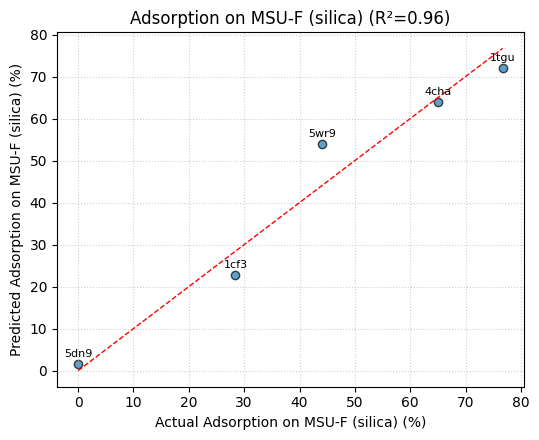


  MSU-F-C (carbon) 흡착량 예측 모델: R² = 0.941
    회귀 분석 산점도 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/Regression_Pred_vs_Actual_MSU-F-C_(carbon)_20250529_0755.png'


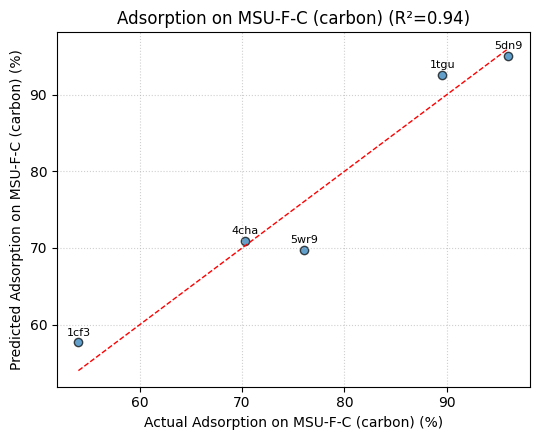


  CTP (선형 회귀) 계수:
                MSU-F_silica  MSU-F-C_carbon
User_SHAR            227.531        -293.306
User_ADHA             -0.018          -0.012
EP_ali_per_res        -3.865          -1.937
Intercept             93.069         148.667


<ipython-input-26-85ad5b6d0bf9>:206: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df = plot_df[valid_metrics_to_plot].fillna(0)
<ipython-input-26-85ad5b6d0bf9>:212: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis")
<ipython-input-26-85ad5b6d0bf9>:216: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=30, ha='right') # 수정된 부분
<ipython-input-26-85ad5b6d0bf9>:212: FutureWarning: 

Passing `palette` without assigning `hu

  막대 플롯 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/Metrics_BarPlots_AllMetrics_v2_2_4_20250529_0755.png'


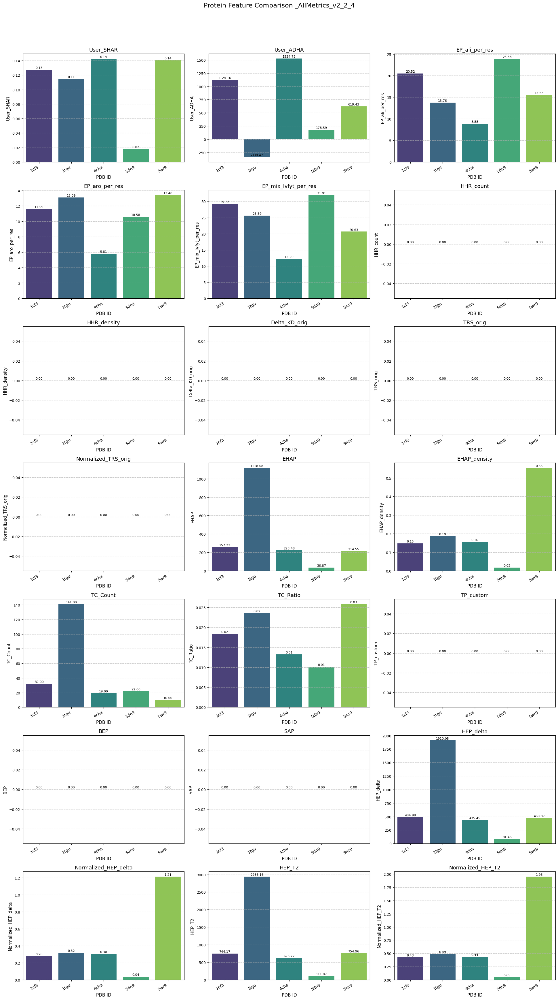

  산점도 (MSU-F (silica), User_ADHA vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250529_0755.png'


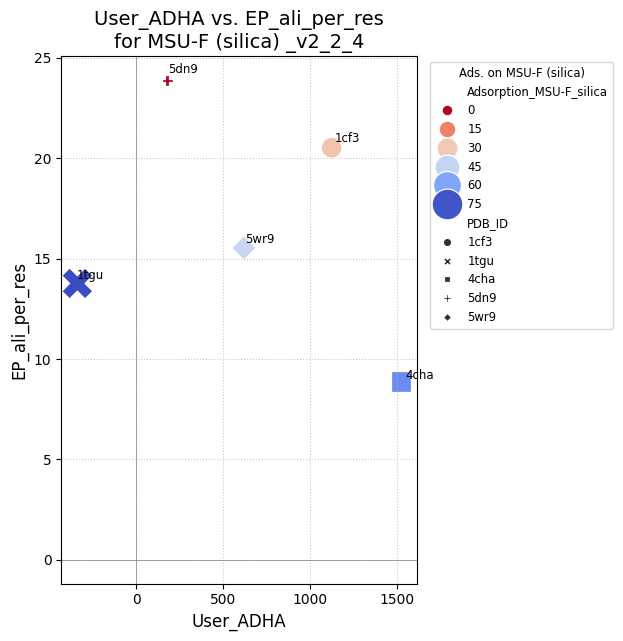

  산점도 (MSU-F-C (carbon), User_ADHA vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250529_0755.png'


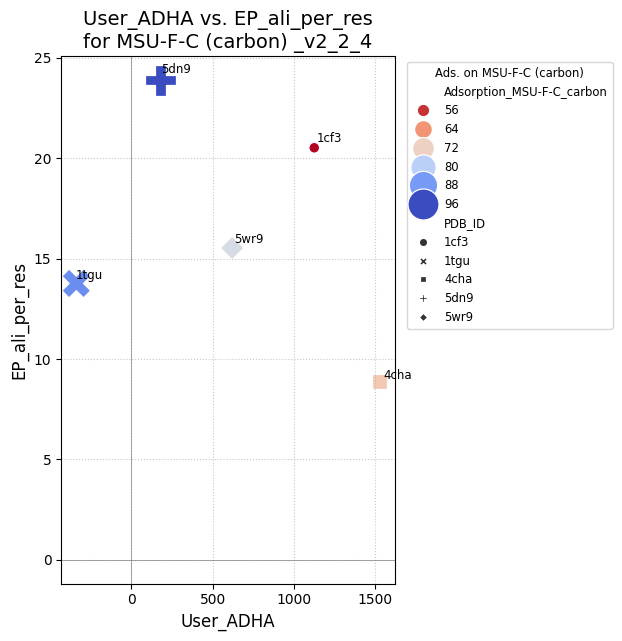

  산점도 (MSU-F (silica), User_SHAR vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_SHAR_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250529_0755.png'


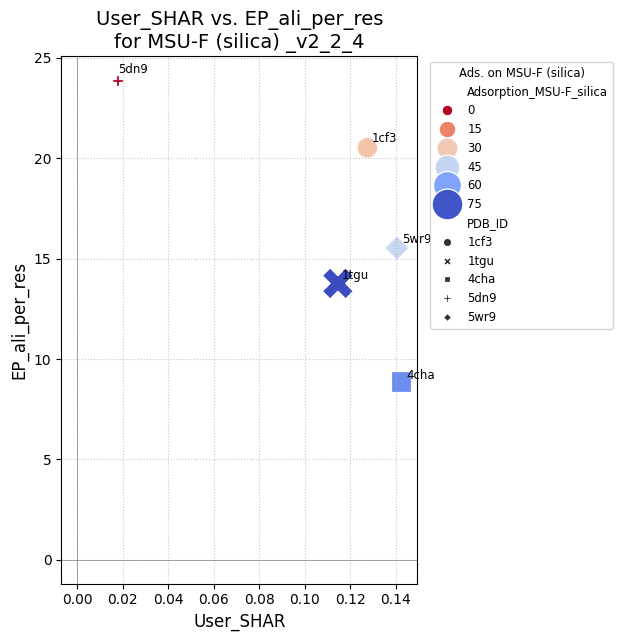

  산점도 (MSU-F-C (carbon), User_SHAR vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_SHAR_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250529_0755.png'


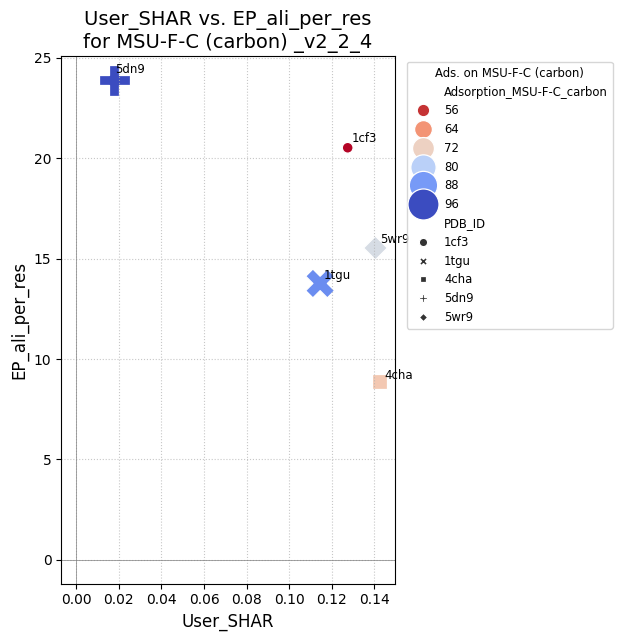

  경고: MSU-F (silica) (Delta_KD_orig vs EP_ali_per_res) 산점도 데이터 없음.
  경고: MSU-F-C (carbon) (Delta_KD_orig vs EP_ali_per_res) 산점도 데이터 없음.
  경고: MSU-F (silica) (Delta_KD_orig vs TRS_orig) 산점도 데이터 없음.
  경고: MSU-F-C (carbon) (Delta_KD_orig vs TRS_orig) 산점도 데이터 없음.
  경고: MSU-F (silica) (Delta_KD_orig vs EHAP_density) 산점도 데이터 없음.
  경고: MSU-F-C (carbon) (Delta_KD_orig vs EHAP_density) 산점도 데이터 없음.
  경고: MSU-F (silica) (Delta_KD_orig vs HEP_delta) 산점도 데이터 없음.
  경고: MSU-F-C (carbon) (Delta_KD_orig vs HEP_delta) 산점도 데이터 없음.
  경고: MSU-F (silica) (Delta_KD_orig vs HEP_T2) 산점도 데이터 없음.
  경고: MSU-F-C (carbon) (Delta_KD_orig vs HEP_T2) 산점도 데이터 없음.
  경고: MSU-F (silica) (User_ADHA vs TRS_orig) 산점도 데이터 없음.
  경고: MSU-F-C (carbon) (User_ADHA vs TRS_orig) 산점도 데이터 없음.
  산점도 (MSU-F (silica), User_ADHA vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_EHAP_density_Scatter_MSU-F_(silica)_v2_2_4_20250529_0755.png'


<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

<Figure size 750x700 with 0 Axes>

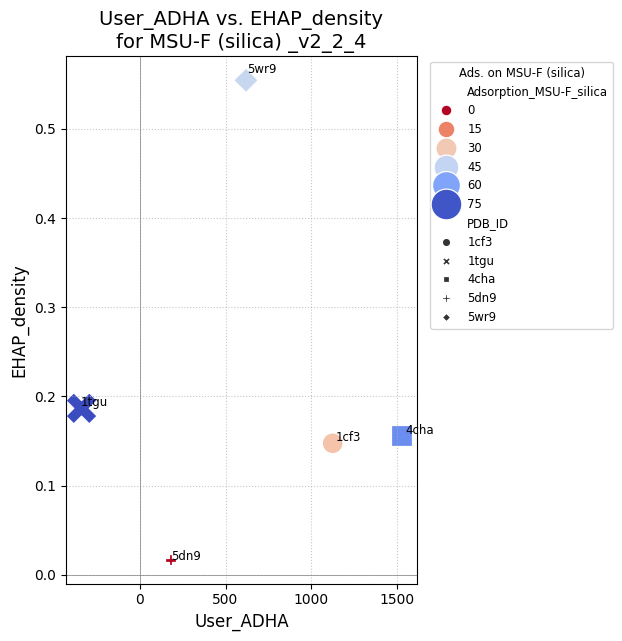

  산점도 (MSU-F-C (carbon), User_ADHA vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_EHAP_density_Scatter_MSU-F-C_(carbon)_v2_2_4_20250529_0755.png'


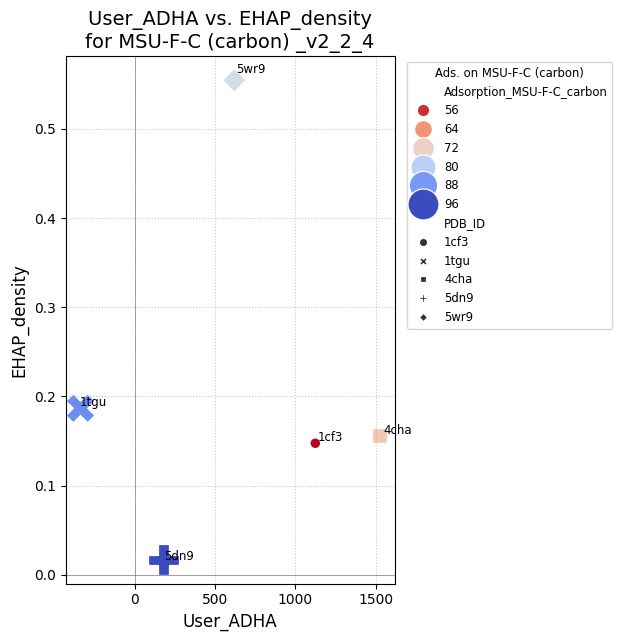

  산점도 (MSU-F (silica), User_ADHA vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_HEP_delta_Scatter_MSU-F_(silica)_v2_2_4_20250529_0755.png'


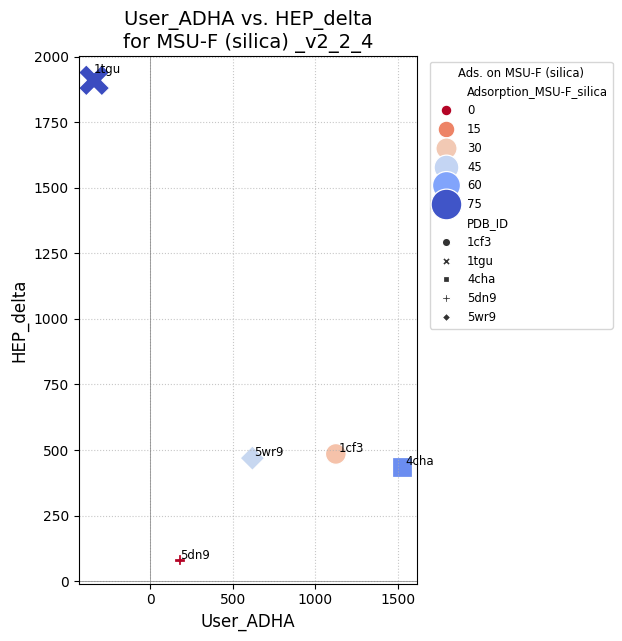

  산점도 (MSU-F-C (carbon), User_ADHA vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_HEP_delta_Scatter_MSU-F-C_(carbon)_v2_2_4_20250529_0755.png'


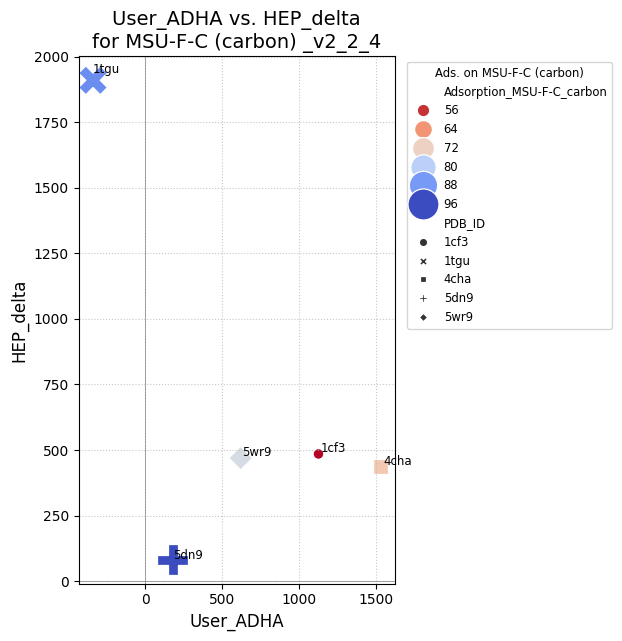

  산점도 (MSU-F (silica), User_ADHA vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_HEP_T2_Scatter_MSU-F_(silica)_v2_2_4_20250529_0755.png'


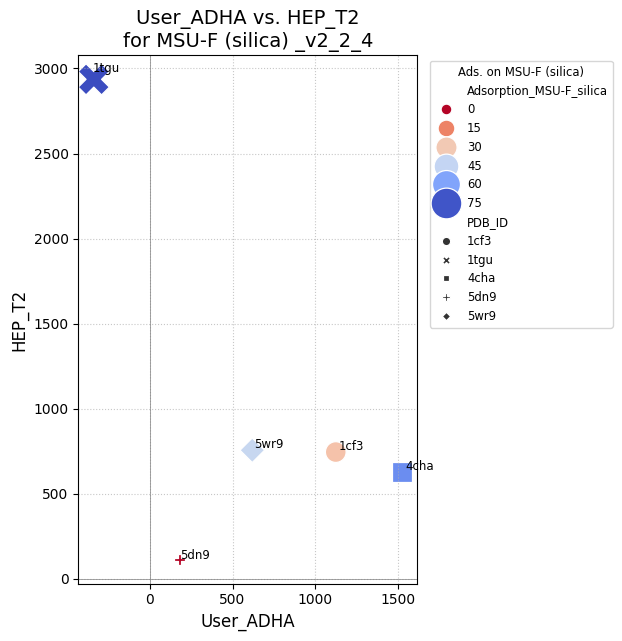

  산점도 (MSU-F-C (carbon), User_ADHA vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250529_075513/User_ADHA_HEP_T2_Scatter_MSU-F-C_(carbon)_v2_2_4_20250529_0755.png'


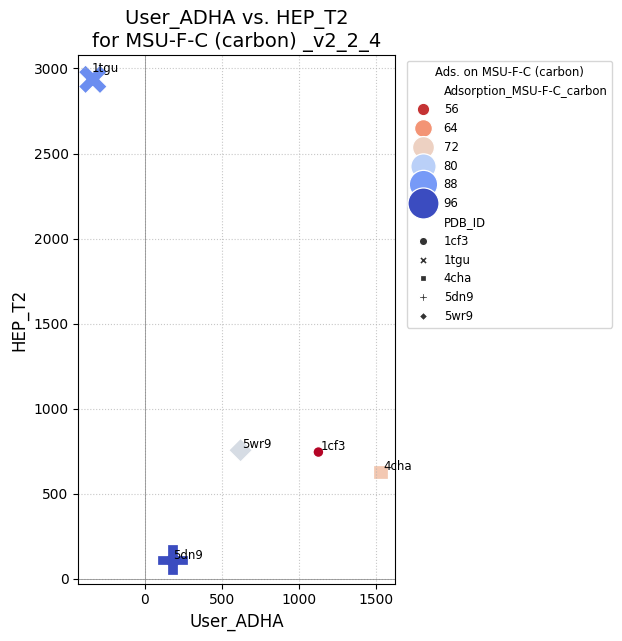


--- 지표와 실험적 흡착량 간의 상관관계 분석 ---

  표면: MSU-F (silica)
  Metric                         | Pearson Coeff.  | Pearson P-val   | Spearman Coeff. | Spearman P-val 
---------------------------------------------------------------------------------------------------------
  User_SHAR                      |      0.731      |    1.610e-01    |      0.400      |    5.046e-01   
  User_ADHA                      |     -0.009      |    9.889e-01    |     -0.100      |    8.729e-01   
  EP_ali_per_res                 |     -0.896      |    3.953e-02    |     -0.900      |    3.739e-02   
  EP_aro_per_res                 |     -0.085      |    8.913e-01    |      0.200      |    7.471e-01   
  EP_mix_lvfyt_per_res           |     -0.662      |    2.237e-01    |     -0.700      |    1.881e-01   
  HHR_count                      | N/A (데이터 부족)    | N/A             | N/A (데이터 부족)    | N/A            
  HHR_density                    | N/A (데이터 부족)    | N/A             | N/A (데이터 부족)    | N/A            


<ipython-input-26-85ad5b6d0bf9>:276: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  p_corr, p_pval = pearsonr(valid_data[metric], valid_data[current_ads_col])
<ipython-input-26-85ad5b6d0bf9>:277: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  s_corr, s_pval = spearmanr(valid_data[metric], valid_data[current_ads_col])
<ipython-input-26-85ad5b6d0bf9>:276: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  p_corr, p_pval = pearsonr(valid_data[metric], valid_data[current_ads_col])
<ipython-input-26-85ad5b6d0bf9>:277: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  s_corr, s_pval = spearmanr(valid_data[metric], valid_data[current_ads_col])


In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.linear_model import LinearRegression # 선형 회귀 분석용
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Callable, Optional

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.2.4" # 사용자 정의 SHAR, ADHA, EP_set + 선형 회귀 분석 추가 (NameError 수정)
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}
RES_SETS_FOR_EP = {
    "ali"  : {"ILE", "LEU", "VAL"},
    "aro"  : {"PHE", "TYR", "TRP"},
    "mix_lvfyt" : {"ILE", "LEU", "VAL", "PHE", "TYR"}
}
STANDARD_ASA_TABLE_FOR_EP = {'ALA':115,'VAL':151,'LEU':183,'ILE':182,'MET':205,'PHE':218,'TYR':229,'TRP':259,
       'CYS':135,'PRO':129,'GLY':75,'SER':115,'THR':140,'ASN':160,'GLN':180,'ASP':150,
       'GLU':190,'HIS':195,'LYS':200,'ARG':225}

# === 데이터 로딩 및 전처리 함수 ===
def find_master_all_labels_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    filenames_to_try = []
    if date_tag:
        filenames_to_try.append(f"{pdb_id}_master_all_labels_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_labeled_data_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_residue_data_{date_tag}.csv")
    filenames_to_try.append(f"{pdb_id}_master_all_labels.csv")
    filenames_to_try.append(f"{pdb_id}_master_labeled_data.csv")
    filenames_to_try.append(f"{pdb_id}_master_residue_data.csv")
    for fname in filenames_to_try:
        path_to_check = os.path.join(base_path, fname)
        if os.path.exists(path_to_check):
            print(f"  정보: 입력 CSV 파일로 '{path_to_check}' 사용.")
            return path_to_check
    print(f"  경고: PDB ID '{pdb_id}'에 대한 마스터 CSV 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    if resname_col not in df.columns: df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame, chain_col: str = 'chain_id', res_num_col: str = 'residue_number', res_name_1L_col: str = 'residue_name_1L') -> Tuple[Optional[str], Optional[float], int]:
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns: num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: num_residues_total = df[res_num_col].nunique()
    else: num_residues_total = len(df)
    if res_name_1L_col not in df.columns: return None, None, num_residues_total
    sort_cols = []
    if chain_col in df.columns: sort_cols.append(chain_col)
    if res_num_col in df.columns: sort_cols.append(res_num_col)
    if not sort_cols: unique_residues_df = df.drop_duplicates(subset=[res_name_1L_col])
    else:
        df_sorted = df.sort_values(by=sort_cols)
        unique_residues_df = df_sorted.drop_duplicates(subset=sort_cols)
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())
    if not sequence: return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: return sequence, None, num_residues_total
        return cleaned_sequence, ProteinAnalysis(cleaned_sequence).molecular_weight(), len(cleaned_sequence)
    except Exception: return sequence, None, num_residues_total

# === 핵심 지표 계산 함수 (v2.2.4) ===
def calculate_protein_metrics_v2_2_4(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     rsa_col: str = 'sasa_relative_total',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_abs_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4',
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     delta_rmsf_col: Optional[str] = 'delta_rmsf_T2_T1.4',
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_label_col: str = 'is_transition_candidate',
                                     rsa_thresh_exposed_user: float = 0.5,
                                     rsa_thresh_buried_user: float = 0.25,
                                     aa_sets_for_ep: Dict[str, Set[str]] = RES_SETS_FOR_EP,
                                     asa_table_for_ep: Dict[str, float] = STANDARD_ASA_TABLE_FOR_EP
                                    ) -> Dict[str, Any]:
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "User_SHAR": None, "User_ADHA": None,
                "SHE_orig": None, "OSHR": None,
                "AHA_exposed_orig": 0.0, "AHA_buried_orig": 0.0, "ADHA_orig": None, "NDHA_orig": None,
                "HHR_count": None, "HHR_density": None, "Delta_KD_orig": None,
                "TRS_orig": None, "Normalized_TRS_orig": None,
                "EHAP": 0.0, "EHAP_density": 0.0,
                "TC_Count": 0, "TC_Ratio": 0.0,
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "TP_custom": None, "BEP": 0.0, "SAP": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None
              }
    for set_name in aa_sets_for_ep.keys():
        metrics[f"EP_{set_name}_per_res"] = None

    df_numeric = df.copy()
    cols_to_ensure_numeric = [rsa_col, hydro_sasa_col, total_sasa_abs_col, rmsf_t14_col, rmsf_t2_col, kd_col]
    if delta_rmsf_col and isinstance(delta_rmsf_col, str) and delta_rmsf_col in df_numeric.columns:
        cols_to_ensure_numeric.append(delta_rmsf_col)
    for col in cols_to_ensure_numeric:
        if col in df_numeric.columns:
            df_numeric[col] = pd.to_numeric(df_numeric[col], errors='coerce')
        else: print(f"  경고 ({pdb_id}): 지표 계산 필요 컬럼 '{col}' 없음.")

    current_delta_rmsf_col_to_use = delta_rmsf_col
    if not (current_delta_rmsf_col_to_use and current_delta_rmsf_col_to_use in df_numeric.columns):
        base_delta_col = 'delta_rmsf_T2_T1.4'
        if base_delta_col in df_numeric.columns: current_delta_rmsf_col_to_use = base_delta_col
        elif rmsf_t14_col in df_numeric.columns and rmsf_t2_col in df_numeric.columns:
            df_numeric[base_delta_col] = df_numeric[rmsf_t2_col] - df_numeric[rmsf_t14_col]
            current_delta_rmsf_col_to_use = base_delta_col
            print(f"  참고 ({pdb_id}): '{base_delta_col}' 컬럼 새로 계산됨.")
        else: current_delta_rmsf_col_to_use = None

    rsa_col_for_shar_adha = 'dssp_accessibility_rsa' if 'dssp_accessibility_rsa' in df_numeric.columns else rsa_col
    if rsa_col_for_shar_adha not in df_numeric.columns:
        print(f"  경고 ({pdb_id}): SHAR/ADHA/EP 계산용 RSA 컬럼 ('{rsa_col_for_shar_adha}' 또는 '{rsa_col}') 없음.")
    elif hydro_sasa_col in df_numeric.columns and total_sasa_abs_col in df_numeric.columns:
        sum_total_sasa_protein_val = df_numeric[total_sasa_abs_col].sum(skipna=True)
        if sum_total_sasa_protein_val > 0:
            shar_surface_residues = df_numeric[pd.to_numeric(df_numeric[rsa_col_for_shar_adha], errors='coerce') > rsa_thresh_exposed_user]
            metrics["User_SHAR"] = shar_surface_residues[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein_val
            aha_out_user = shar_surface_residues[hydro_sasa_col].sum(skipna=True)
            aha_in_user = df_numeric[pd.to_numeric(df_numeric[rsa_col_for_shar_adha], errors='coerce') < rsa_thresh_buried_user][hydro_sasa_col].sum(skipna=True)
            if pd.notna(aha_out_user) and pd.notna(aha_in_user):
                metrics["User_ADHA"] = aha_out_user - aha_in_user

    # EP_set_per_res 계산
    for set_name, aa_set in aa_sets_for_ep.items():
        col_name_ep = f"EP_{set_name}_per_res"
        metrics[col_name_ep] = 0.0
        if all(c in df_numeric.columns for c in [rsa_col_for_shar_adha, resname_col, rmsf_t2_col]):
            buried_set_residues = df_numeric[
                (df_numeric[resname_col].isin(aa_set)) &
                (pd.to_numeric(df_numeric[rsa_col_for_shar_adha], errors='coerce') < rsa_thresh_buried_user)
            ]
            if not buried_set_residues.empty:
                ep_sum_for_set = 0.0
                for _, row_res in buried_set_residues.iterrows():
                    res_name_val = str(row_res[resname_col]).upper()
                    asa_val_ep = asa_table_for_ep.get(res_name_val, 0)
                    rmsf_val_ep = row_res[rmsf_t2_col]
                    if pd.notna(asa_val_ep) and pd.notna(rmsf_val_ep):
                        ep_sum_for_set += asa_val_ep * rmsf_val_ep
                if total_residues > 0: metrics[col_name_ep] = ep_sum_for_set / total_residues
                else: metrics[col_name_ep] = np.nan
        else: metrics[col_name_ep] = np.nan

    # HHR, Delta_KD_orig, TRS_orig 등 (PyMOL RSA 기준, 이전 로직 유지)
    # ... (이전 v2.2.2의 해당 지표 계산 로직 복사) ...
    # EHAP, HEP (선택된 tc_label_col 및 current_delta_rmsf_col_to_use 사용)
    if tc_label_col and tc_label_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        if df_numeric[tc_label_col].dtype == 'object': # bool로 변환
            df_numeric[tc_label_col] = df_numeric[tc_label_col].astype(str).str.lower().map({'true': True, 'false': False}).fillna(False)

        # *** 수정된 부분: tc_col -> tc_label_col ***
        transition_candidates_df = df_numeric[df_numeric[tc_label_col] == True]
        metrics["TC_Count"] = len(transition_candidates_df)
        if total_residues > 0: metrics["TC_Ratio"] = metrics["TC_Count"] / total_residues
        if not transition_candidates_df.empty:
            metrics["EHAP"] = transition_candidates_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0: metrics["EHAP_density"] = metrics["EHAP"] / total_residues

            if current_delta_rmsf_col_to_use and current_delta_rmsf_col_to_use in transition_candidates_df.columns:
                metrics["TC_AvgDeltaRMSF"] = transition_candidates_df[current_delta_rmsf_col_to_use].mean(skipna=True)
            if rmsf_t2_col in transition_candidates_df.columns:
                metrics["TC_AvgRMSF_T2"] = transition_candidates_df[rmsf_t2_col].mean(skipna=True)

            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgDeltaRMSF")):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0 and pd.notna(metrics["HEP_delta"]): metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgRMSF_T2")):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0 and pd.notna(metrics["HEP_T2"]): metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
        else:
            metrics["EHAP"] = 0.0; metrics["EHAP_density"] = 0.0
            for k_hep in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
                 metrics[k_hep] = None if "Avg" in k_hep else 0.0
    else: print(f"  경고 ({pdb_id}): EHAP/HEP 계산에 필요한 TC 라벨 컬럼 '{tc_label_col}' 없음.")

    return metrics

# === 시각화 및 상관관계 함수 (v2.2.2에서 가져와서 함수명에 _v2_2_4 추가) ===
# def plot_summary_metrics_bars_v2_2_4(...)
# def plot_scatter_metrics_vs_adsorption_v2_2_4(...)
# def calculate_and_print_correlations_v2_2_4(...)
# (이전 답변 v2.2.2의 함수들을 여기에 복사하고, 필요시 인자나 내부 로직 약간 수정)

# === 메인 실행 로직 (v2.2.4) ===
def main_v2_2_4():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (사용자 정의 지표 및 회귀분석) ---")

    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()

    try:
        rsa_shar_adha_outer_input = input(f"사용자 정의 SHAR, ADHA(외부) 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): ").strip()
        rsa_thresh_shar_adha_outer = float(rsa_shar_adha_outer_input) if rsa_shar_adha_outer_input else 0.5
        if not (0.0 < rsa_thresh_shar_adha_outer <= 1.0): raise ValueError("RSA 표면(외부) 임계값은 0 초과 1 이하.")

        rsa_adha_ep_inner_input = input(f"사용자 정의 ADHA(내부), EP_set 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): ").strip()
        rsa_thresh_adha_ep_inner = float(rsa_adha_ep_inner_input) if rsa_adha_ep_inner_input else 0.25
        if not (0.0 <= rsa_thresh_adha_ep_inner < 1.0): raise ValueError("RSA 내부 임계값은 0 이상 1 미만.")
        if rsa_thresh_adha_ep_inner >= rsa_thresh_shar_adha_outer : raise ValueError("내부 RSA 임계값은 표면 RSA 임계값보다 작아야 합니다.")
    except ValueError as e:
        print(f"잘못된 RSA 임계값: {e}. 기본값 (표면 > 0.5, 내부 < 0.25) 사용."); rsa_thresh_shar_adha_outer = 0.5; rsa_thresh_adha_ep_inner = 0.25
    print(f"사용자 정의 지표 계산 RSA 임계값: 표면(외부) > {rsa_thresh_shar_adha_outer}, 내부 < {rsa_thresh_adha_ep_inner}")

    print("\nEHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.")
    tc_set_key_for_analysis = input(f"사용할 'set_key'를 입력하세요 (예:set1_strict, set2_median, set3_default_0.25): ").strip()
    if not tc_set_key_for_analysis:
        default_tc_set_key = "set3_default_0.25"
        print(f"경고: TC set_key 미입력. 기본값 '{default_tc_set_key}' 사용 시도.")
        tc_set_key_for_analysis = default_tc_set_key

    selected_tc_label_col = f"{tc_set_key_for_analysis}_is_transition_candidate"
    selected_delta_rmsf_col = f"delta_rmsf_T2_T1.4_{tc_set_key_for_analysis}"
    print(f"EHAP/HEP 분석에 사용될 TC 라벨 컬럼: '{selected_tc_label_col}'")
    print(f"EHAP/HEP 분석에 사용될 Delta RMSF 컬럼: '{selected_delta_rmsf_col}'")

    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_all_labels_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path: all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue
        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")
            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 분자량: {mw if mw else 'N/A'} Da")

            # tc_label_col 및 delta_rmsf_col이 df에 있는지 확인하고, 없으면 대체 로직
            final_tc_col_for_metrics = selected_tc_label_col
            if selected_tc_label_col not in df.columns:
                potential_tc = [col for col in df.columns if selected_tc_label_col.endswith('_is_transition_candidate') and col.startswith(tc_set_key_for_analysis)]
                if not potential_tc: potential_tc = [col for col in df.columns if 'is_transition_candidate' in col.lower()]
                if potential_tc: final_tc_col_for_metrics = potential_tc[0]; print(f"  경고: TC 컬럼 '{selected_tc_label_col}' 없음. 대신 '{final_tc_col_for_metrics}' 사용.")
                else: print(f"  경고: 유효 TC 컬럼 없어 EHAP/HEP 계산 영향."); final_tc_col_for_metrics = 'non_existent_tc_col'

            final_delta_rmsf_col_for_metrics = selected_delta_rmsf_col
            if selected_delta_rmsf_col not in df.columns:
                base_delta_col = 'delta_rmsf_T2_T1.4'
                if base_delta_col in df.columns: final_delta_rmsf_col_for_metrics = base_delta_col; print(f"  경고: Delta RMSF 컬럼 '{selected_delta_rmsf_col}' 없음. 대신 '{final_delta_rmsf_col_for_metrics}' 사용.")
                else: final_delta_rmsf_col_for_metrics = None # calculate_protein_metrics에서 새로 계산 시도

            metrics = calculate_protein_metrics_v2_2_4(
                df, pdb_id, num_res, mw,
                rsa_thresh_exposed_user=rsa_thresh_shar_adha_outer,
                rsa_thresh_buried_user=rsa_thresh_adha_ep_inner,
                tc_label_col=final_tc_col_for_metrics,
                delta_rmsf_col=final_delta_rmsf_col_for_metrics
            )
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e:
            print(f"  오류: {pdb_id} 처리 중 - {e}")
            all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print(f"\n--- 계산된 전체 단백질 지표 요약 (v{SCRIPT_VERSION}) ---")
    display_cols = ["PDB_ID", "Total_Residues", "MW", "User_SHAR", "User_ADHA",
                    "EP_ali_per_res", "EP_aro_per_res", "EP_mix_lvfyt_per_res", "EP_all_hhr_subset_per_res",
                    "HHR_count", "HHR_density", "Delta_KD_orig",
                    "TRS_orig", "Normalized_TRS_orig",
                    "TC_Count", "TC_Ratio", "EHAP", "EHAP_density",
                    "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "TP_custom", "BEP", "SAP",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string(float_format="%.3f"))

    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")
    summary_csv_filename = f"AllProteins_Features_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    # --- 선형 회귀 분석 ---
    print("\n--- 선형 회귀 분석 (Features: User_SHAR, User_ADHA, EP_ali_per_res) ---")
    regression_features_cols = ['User_SHAR', 'User_ADHA', 'EP_ali_per_res']
    valid_regression_features = [col for col in regression_features_cols if col in summary_df.columns]
    if len(valid_regression_features) < len(regression_features_cols) : print(f"  경고: 회귀 분석 필요 feature({regression_features_cols}) 부족. 사용 가능: {valid_regression_features}")
    if valid_regression_features:
        features_for_regression = summary_df[valid_regression_features].fillna(0).values
        all_coefs_data = []
        index_names = valid_regression_features + ['Intercept']
        for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
            target_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
            if target_col_name not in summary_df.columns or summary_df[target_col_name].isnull().all():
                print(f"  {surface_name} 흡착 데이터 없어 회귀 분석 건너<0xEB><0x9B><0x84>니다."); continue
            target_values = summary_df[target_col_name].fillna(summary_df[target_col_name].mean()).values
            try:
                reg_model = LinearRegression().fit(features_for_regression, target_values)
                coeffs = list(reg_model.coef_) + [reg_model.intercept_]; all_coefs_data.append(coeffs)
                r2_score = reg_model.score(features_for_regression, target_values); predictions = reg_model.predict(features_for_regression)
                print(f"\n  {surface_name} 흡착량 예측 모델: R² = {r2_score:.3f}")
                plt.figure(figsize=(5.5, 4.5)); plt.scatter(target_values, predictions, alpha=0.7, edgecolor='k')
                for i, pdb_label in enumerate(summary_df['PDB_ID']): plt.annotate(pdb_label, (target_values[i], predictions[i]), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)
                plt.plot([min(target_values), max(target_values)], [min(target_values), max(target_values)], 'r--', lw=1)
                plt.xlabel(f"Actual Adsorption on {surface_name} (%)", fontsize=10); plt.ylabel(f"Predicted Adsorption on {surface_name} (%)", fontsize=10)
                plt.title(f"Adsorption on {surface_name} (R²={r2_score:.2f})", fontsize=12); plt.grid(True, linestyle=':', alpha=0.6); plt.tight_layout()
                reg_plot_filename = f"Regression_Pred_vs_Actual_{surface_name.replace(' ', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
                plt.savefig(os.path.join(analysis_output_dir, reg_plot_filename), dpi=150); print(f"    회귀 분석 산점도 저장: '{os.path.join(analysis_output_dir, reg_plot_filename)}'"); plt.show(); plt.close()
            except Exception as e_reg: print(f"  오류: {surface_name} 선형 회귀 분석 중 - {e_reg}"); all_coefs_data.append([np.nan] * len(index_names))
        if all_coefs_data:
            coef_df = pd.DataFrame(np.array(all_coefs_data).T,
                                 columns=[s.replace(' ', '_').replace('(', '').replace(')', '') for s in EXPERIMENTAL_ADSORPTION_VALUES.keys() if f"Adsorption_{s.replace(' ', '_').replace('(', '').replace(')', '')}" in summary_df.columns],
                                 index=index_names)
            print("\n  CTP (선형 회귀) 계수:"); print(coef_df.round(3).to_string())
    else: print("  경고: 회귀 분석을 위한 유효한 feature가 없습니다.")

    # 시각화 및 상관관계 분석 (v2.2.2의 함수들 재사용)
    # plot_summary_metrics_bars_v2_2_2, plot_scatter_metrics_vs_adsorption_v2_2_2, calculate_and_print_correlations_v2_2_2
    # 함수들이 이 파일 내에 정의되어 있다고 가정하고 호출
    metrics_for_plotting_all = ["User_SHAR", "User_ADHA"] + \
                               [f"EP_{sn}_per_res" for sn in RES_SETS_FOR_EP.keys()] + \
                               ["HHR_count", "HHR_density", "Delta_KD_orig",
                                "TRS_orig", "Normalized_TRS_orig", "EHAP", "EHAP_density",
                                "TC_Count", "TC_Ratio", "TP_custom", "BEP", "SAP",
                                "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    valid_metrics_for_plot_corr = [m for m in metrics_for_plotting_all if m in summary_df.columns]

    plot_summary_metrics_bars_v2_2_2(summary_df, valid_metrics_for_plot_corr, analysis_output_dir, file_suffix=f"_AllMetrics_v{SCRIPT_VERSION.replace('.', '_')}")

    scatter_combinations = [('User_ADHA', 'EP_ali_per_res'), ('User_SHAR', 'EP_ali_per_res'),
                            ('Delta_KD_orig', 'EP_ali_per_res')] + \
                           [(x,y) for x in ['Delta_KD_orig', 'User_ADHA'] for y in ['TRS_orig', 'EHAP_density', 'HEP_delta', 'HEP_T2'] if x in summary_df.columns and y in summary_df.columns]
    unique_scatter_combinations = []
    for item in scatter_combinations:
        if item not in unique_scatter_combinations: unique_scatter_combinations.append(item)
    for x_met, y_met in unique_scatter_combinations:
        if x_met in summary_df.columns and y_met in summary_df.columns:
            plot_scatter_metrics_vs_adsorption_v2_2_2(summary_df, x_met, y_met, EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, file_suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    calculate_and_print_correlations_v2_2_2(summary_df, valid_metrics_for_plot_corr, EXPERIMENTAL_ADSORPTION_VALUES)
    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_2_4()


#2.2.5  = 2.2.2 와 2.2.4의 통합

--- 단백질 흡착 특징 분석기 v2.2.4 (사용자 정의 지표 및 회귀분석 통합) ---
분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: 20250610, 없으면 엔터): 20250529
User_SHAR, User_ADHA(외부) 등 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): 0.5
User_ADHA(내부), User_EP_set 등 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): 0.25
사용자 정의 지표용 RSA 임계값: 표면(외부) > 0.5, 내부 < 0.25

EHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.
사용할 'set_key'를 입력하세요 (예: set3_default_0.25): set3_defaultf_0.25
EHAP/HEP 분석용 TC 라벨 컬럼: 'set3_defaultf_0.25_is_transition_candidate'
EHAP/HEP 분석용 Delta RMSF 컬럼: 'delta_rmsf_T2_T1.4_set3_defaultf_0.25' (없을 시 기본 delta_rmsf_T2_T1.4 사용 또는 재계산)

--- 1CF3 처리 시작 ---
  정보: 입력 CSV 파일로 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_all_labels_20250529.csv' 사용.
  '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/1cf3_master_all_labels_20250529.csv' 로드 완료.
  총 잔기 수: 1743, 분자량: 173901.49640000513 Da
  경고: TC 컬럼 'set3_defaultf_0.25_is_transition_candidate' 없음. 대신 'is_transition_candidate' 사용.
  경고:

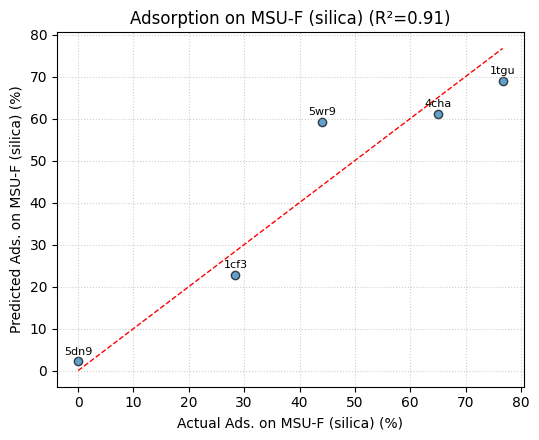


  MSU-F-C (carbon) 예측 모델: R² = 0.979
    회귀 분석 산점도 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Regression_MSU-F-C_(carbon)_20250610_0427.png'


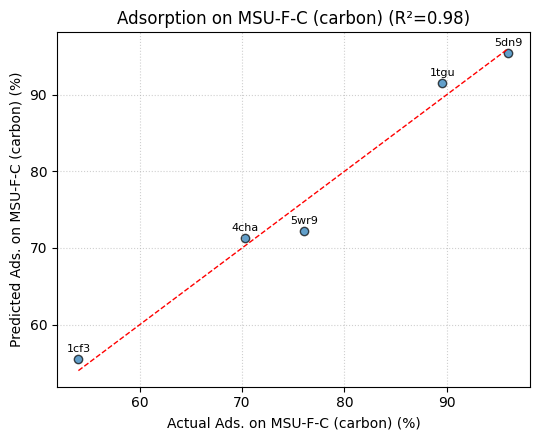


  CTP (선형 회귀) 계수:
                MSU-F_silica  MSU-F-C_carbon
User_SHAR           -176.811        -574.055
User_ADHA              0.011           0.005
EP_ali_per_res        -8.848          -5.372
Intercept            214.706         232.999


<ipython-input-2-9d6b7ed1854a>:242: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis"); axes[i].set_title(f"{metric}", fontsize=13)
<ipython-input-2-9d6b7ed1854a>:244: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=30, ha='right'); axes[i].tick_params(axis='y', labelsize=9)
<ipython-input-2-9d6b7ed1854a>:242: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis"); axes[i].set_title(f"{metric}", fontsize=13)
<ipython-input-2-9d6b7ed

  막대 플롯 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Metrics_BarPlots_AllMetrics_v2_2_4_20250610_0427.png'


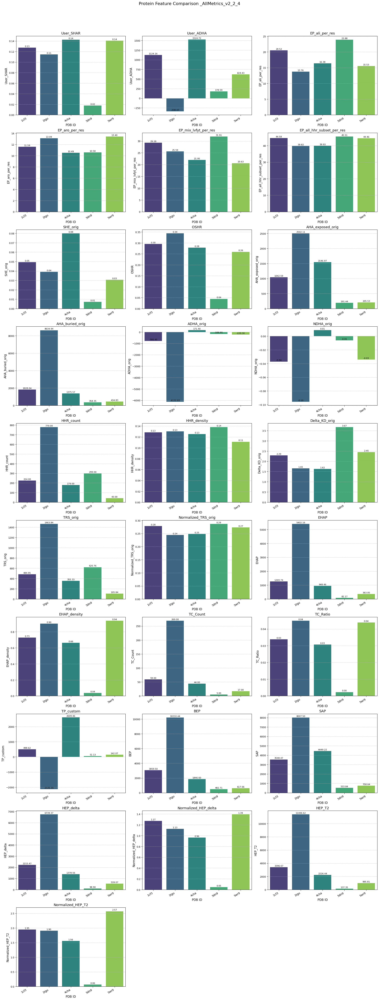

  산점도 (MSU-F (silica), Delta_KD_orig vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_BEP_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


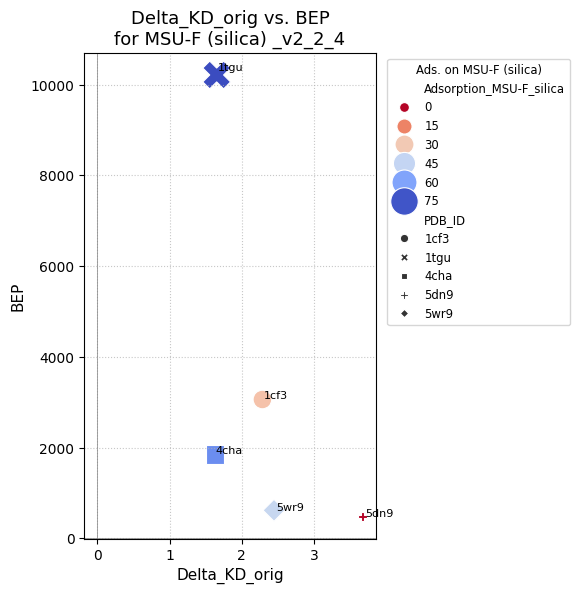

  산점도 (MSU-F-C (carbon), Delta_KD_orig vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_BEP_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


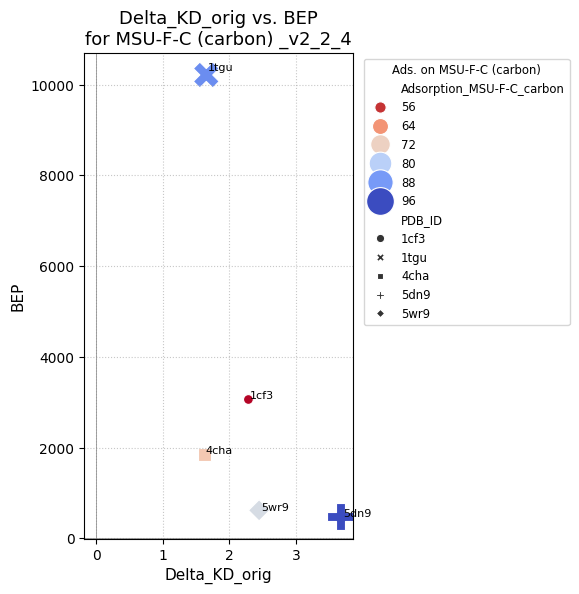

  산점도 (MSU-F (silica), Delta_KD_orig vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_EHAP_density_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


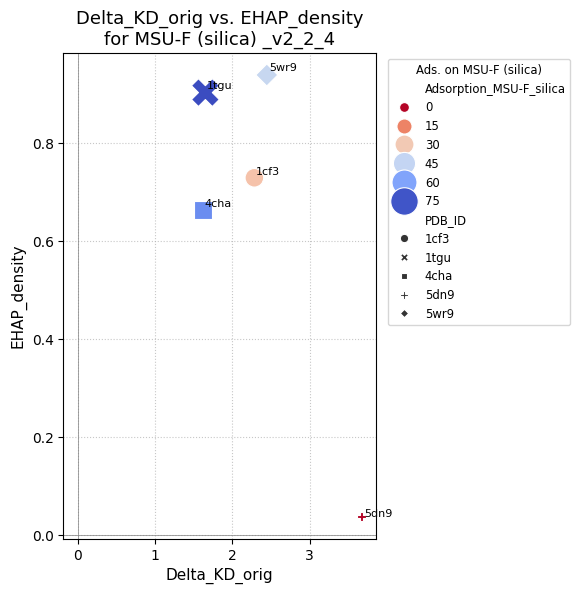

  산점도 (MSU-F-C (carbon), Delta_KD_orig vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_EHAP_density_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


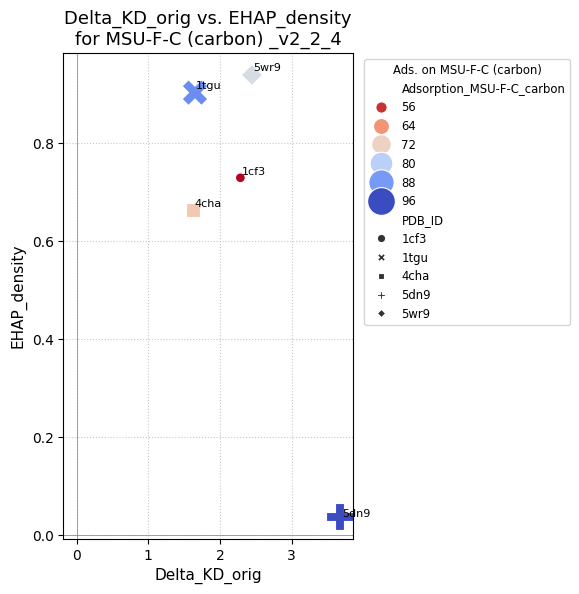

  산점도 (MSU-F (silica), Delta_KD_orig vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


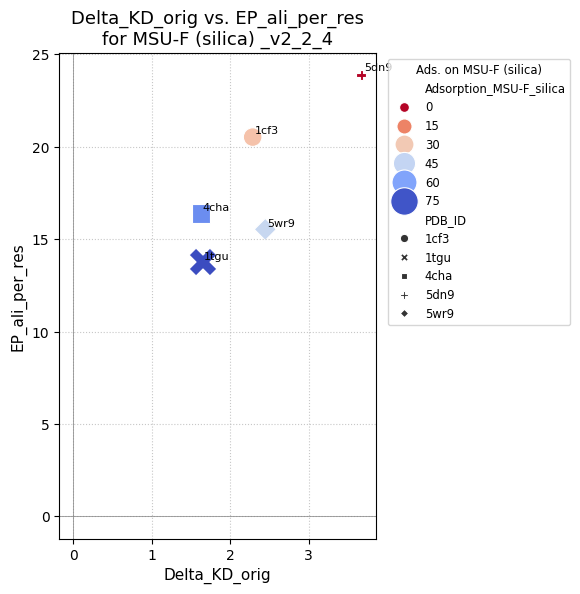

  산점도 (MSU-F-C (carbon), Delta_KD_orig vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


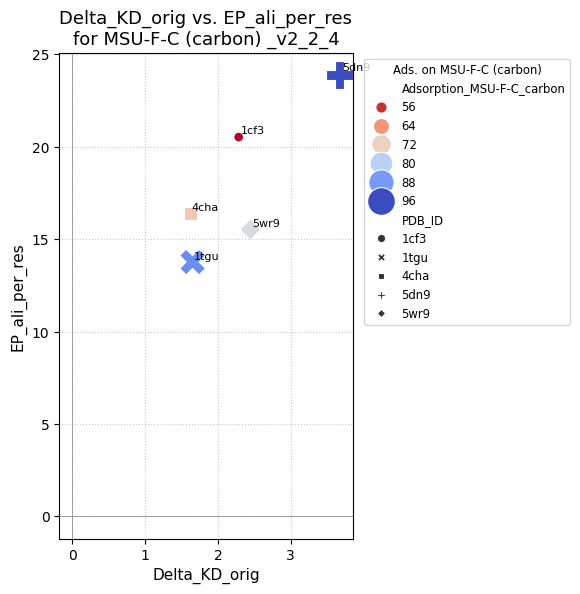

  산점도 (MSU-F (silica), Delta_KD_orig vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_HEP_T2_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


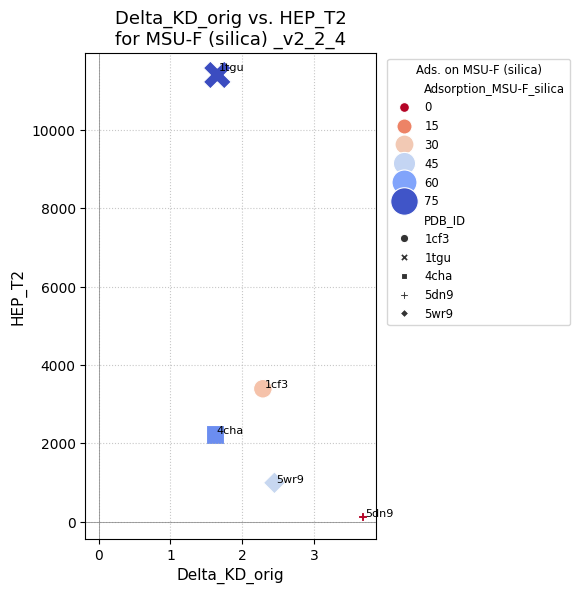

  산점도 (MSU-F-C (carbon), Delta_KD_orig vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_HEP_T2_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


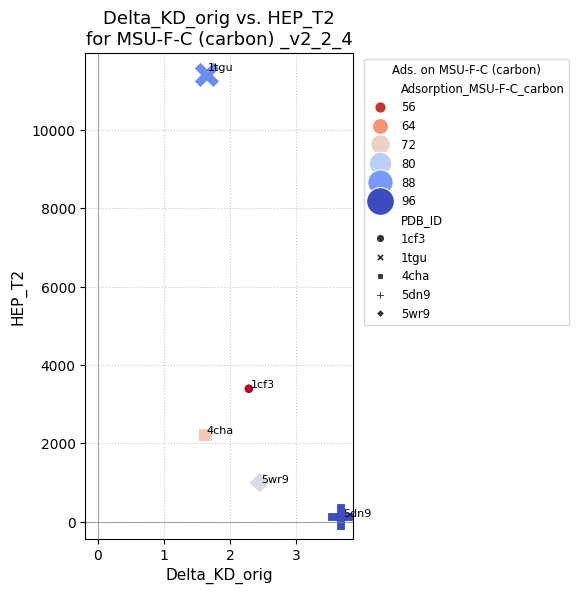

  산점도 (MSU-F (silica), Delta_KD_orig vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_HEP_delta_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


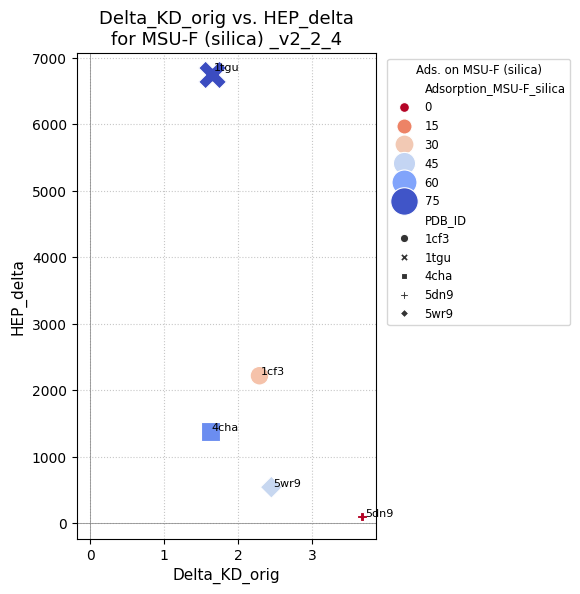

  산점도 (MSU-F-C (carbon), Delta_KD_orig vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_HEP_delta_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


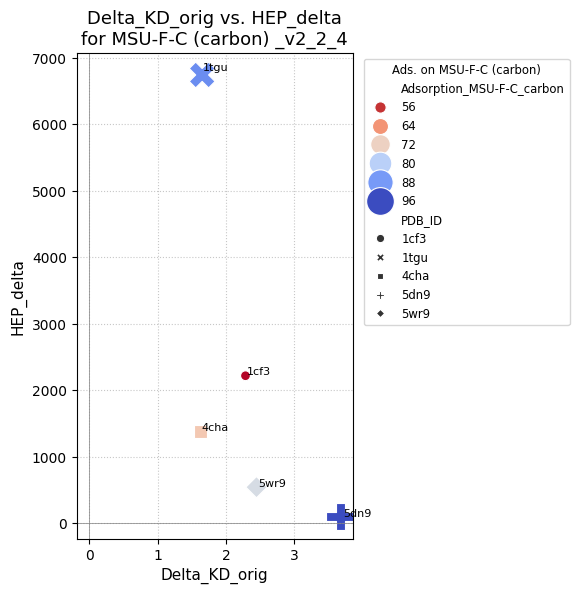

  산점도 (MSU-F (silica), Delta_KD_orig vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_TRS_orig_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


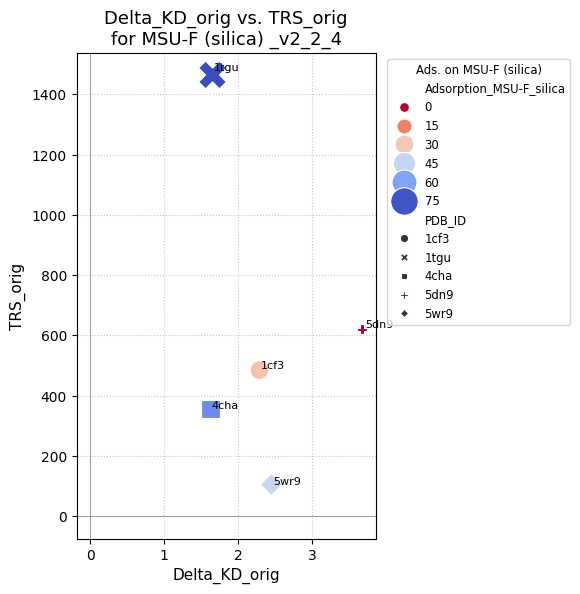

  산점도 (MSU-F-C (carbon), Delta_KD_orig vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Delta_KD_orig_TRS_orig_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


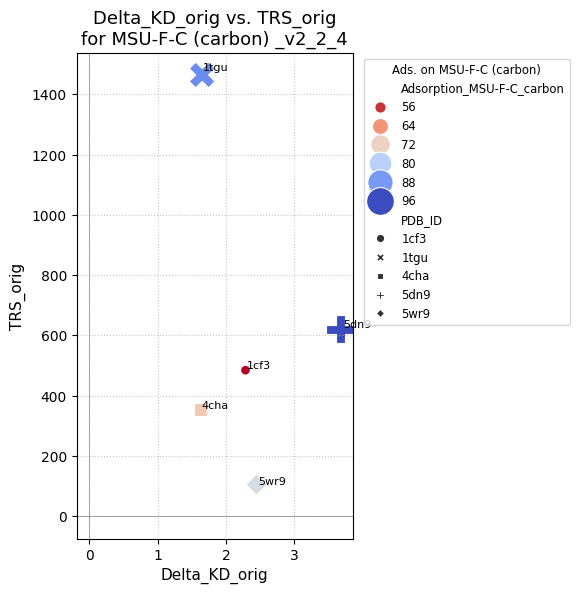

  산점도 (MSU-F (silica), EHAP vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/EHAP_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


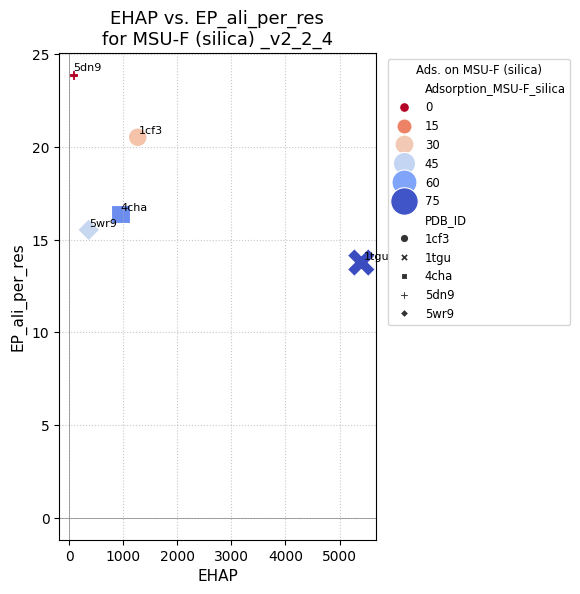

  산점도 (MSU-F-C (carbon), EHAP vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/EHAP_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


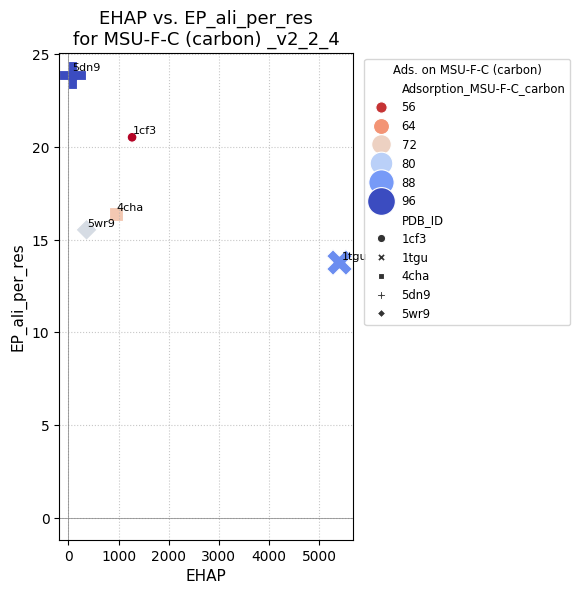

  산점도 (MSU-F (silica), Normalized_TRS_orig vs EHAP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Normalized_TRS_orig_EHAP_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


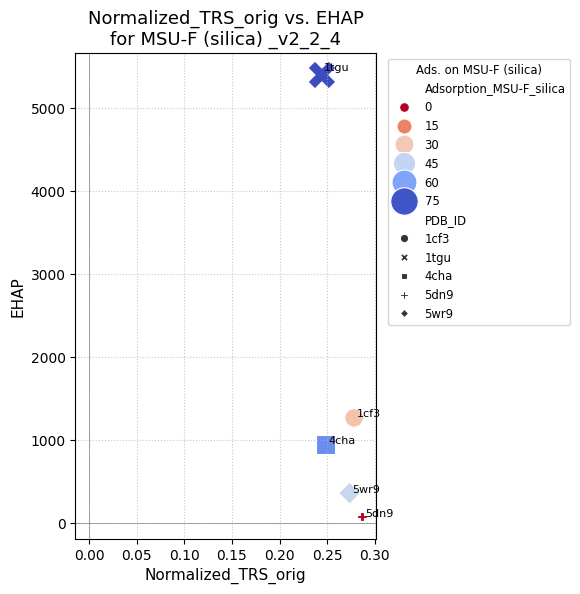

  산점도 (MSU-F-C (carbon), Normalized_TRS_orig vs EHAP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Normalized_TRS_orig_EHAP_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


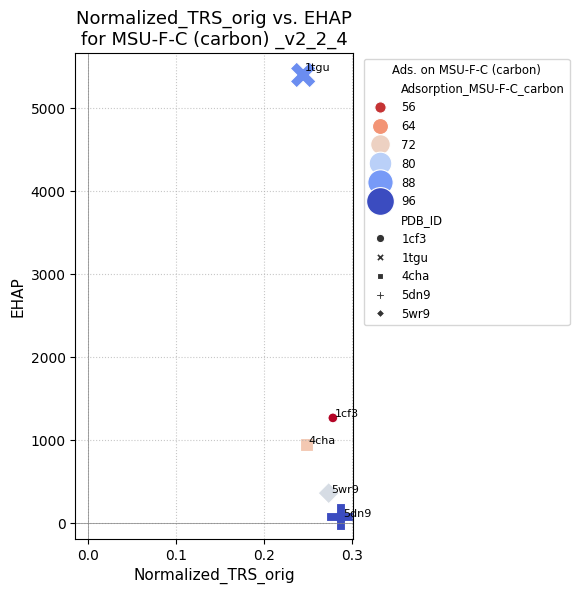

  산점도 (MSU-F (silica), Normalized_TRS_orig vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Normalized_TRS_orig_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


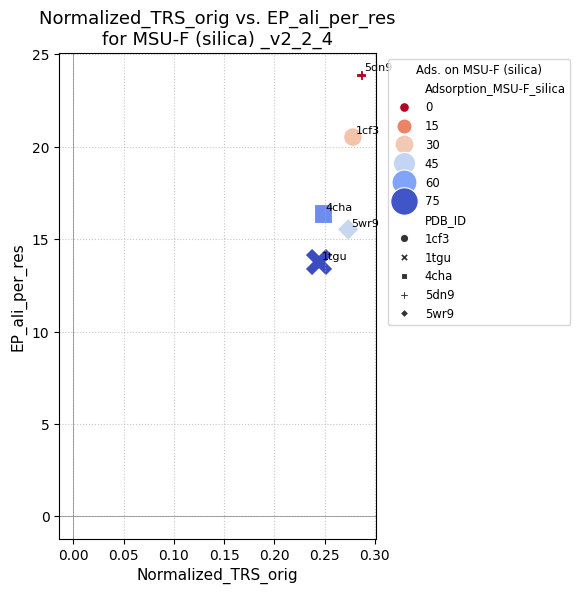

  산점도 (MSU-F-C (carbon), Normalized_TRS_orig vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/Normalized_TRS_orig_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


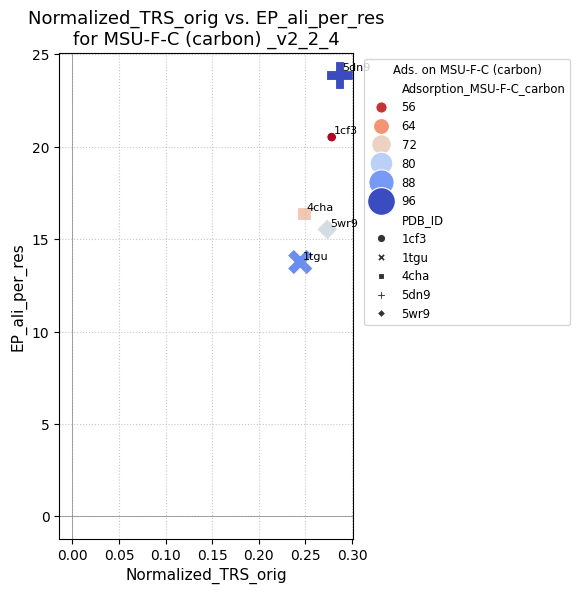

  산점도 (MSU-F (silica), OSHR vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_BEP_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


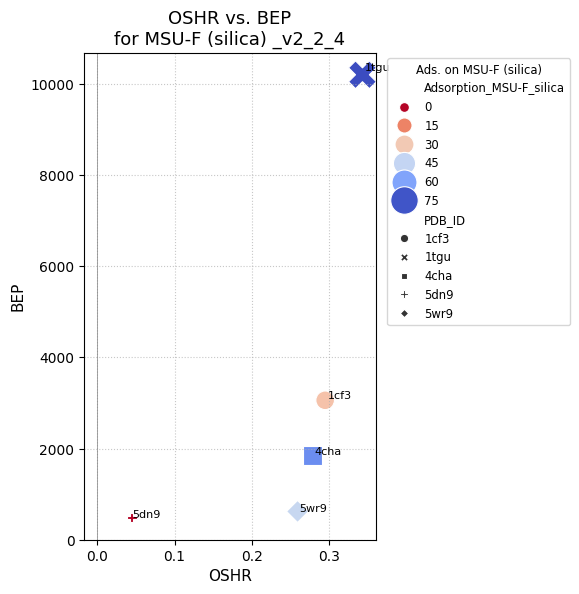

  산점도 (MSU-F-C (carbon), OSHR vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_BEP_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


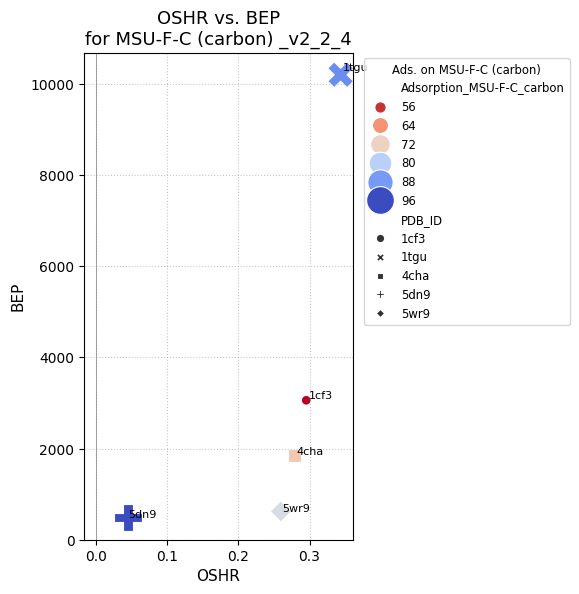

  산점도 (MSU-F (silica), OSHR vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_EHAP_density_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


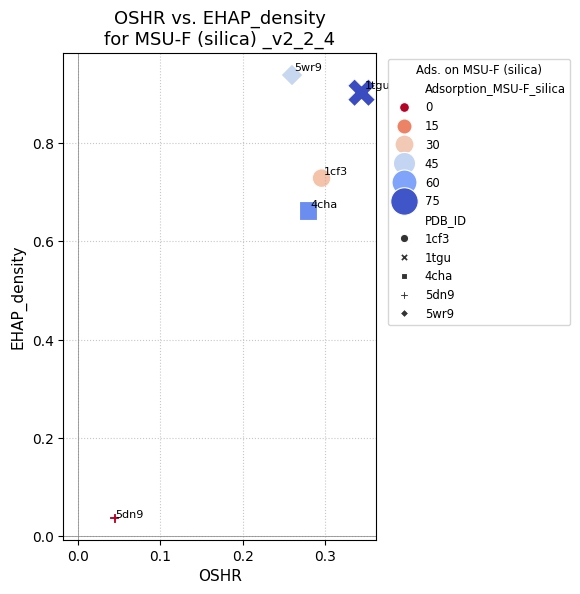

  산점도 (MSU-F-C (carbon), OSHR vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_EHAP_density_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


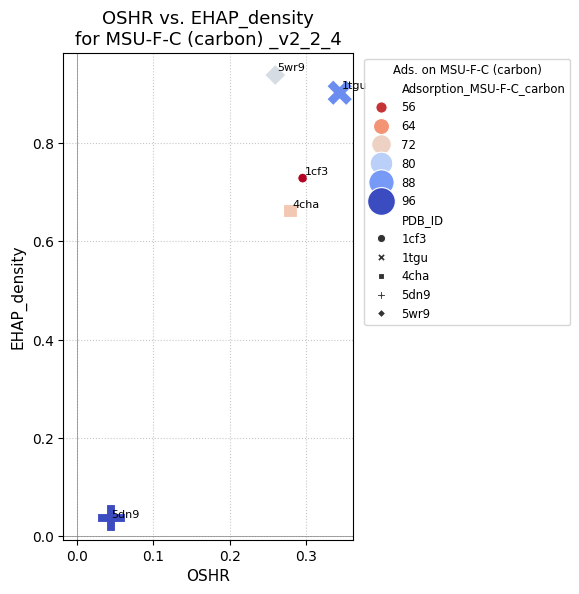

  산점도 (MSU-F (silica), OSHR vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


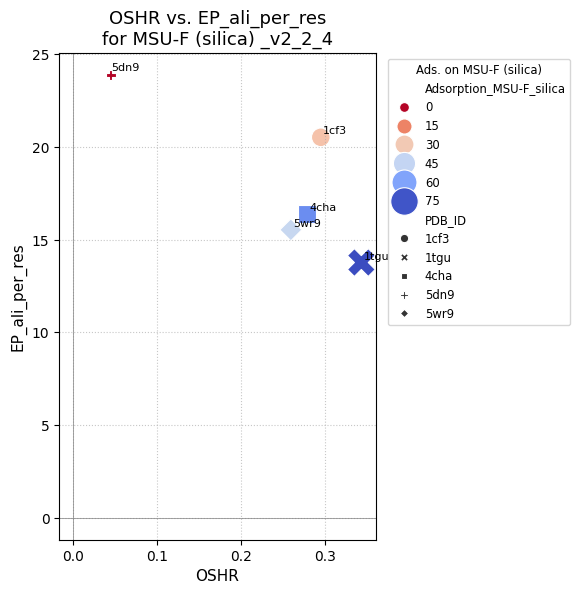

  산점도 (MSU-F-C (carbon), OSHR vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


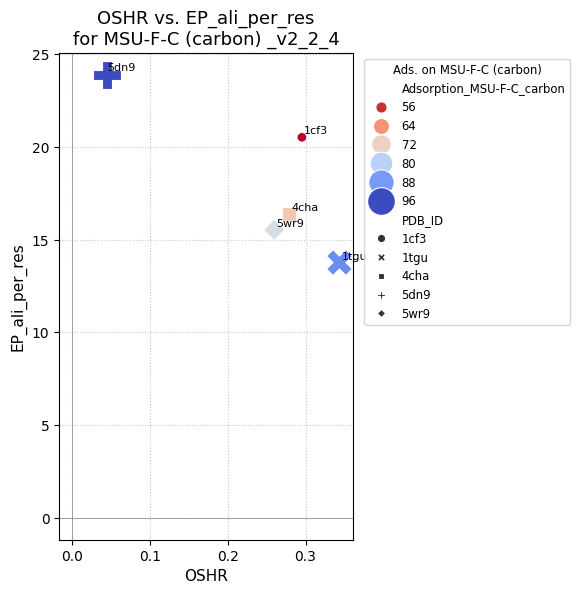

  산점도 (MSU-F (silica), OSHR vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_HEP_T2_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


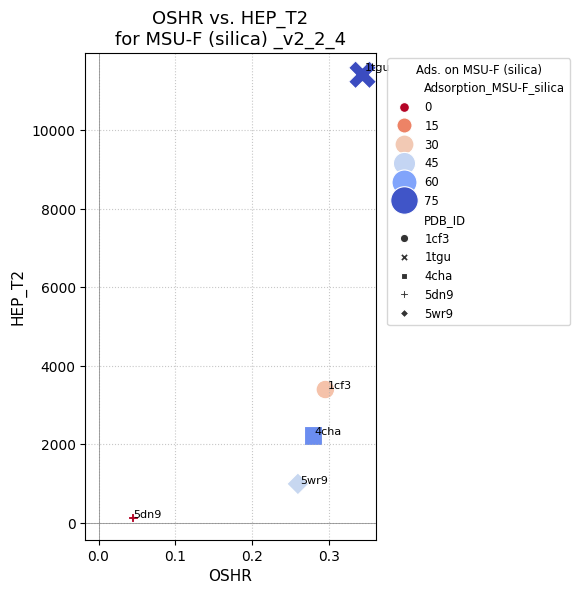

  산점도 (MSU-F-C (carbon), OSHR vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_HEP_T2_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


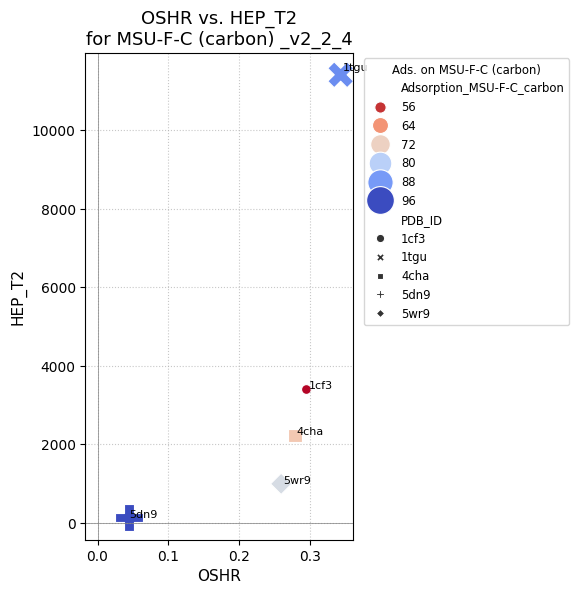

  산점도 (MSU-F (silica), OSHR vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_HEP_delta_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


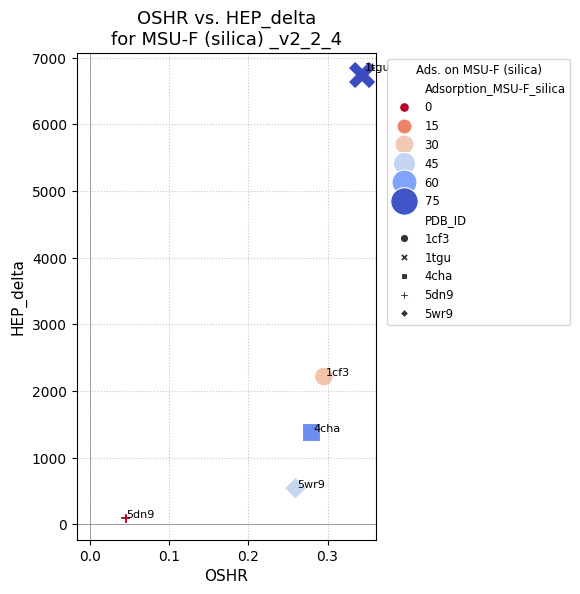

  산점도 (MSU-F-C (carbon), OSHR vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_HEP_delta_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


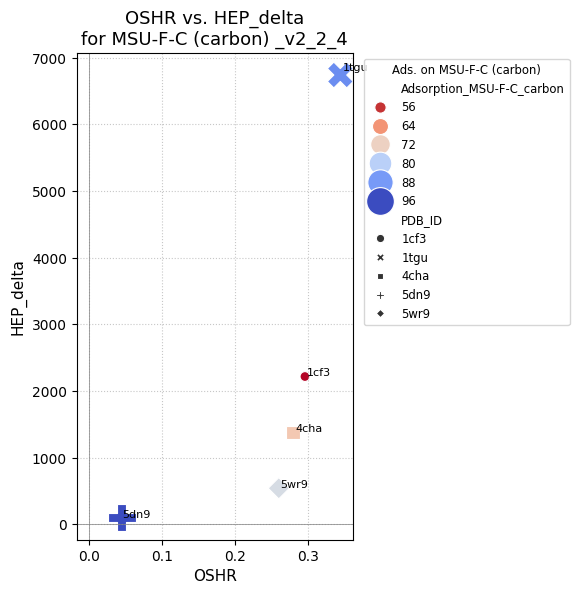

  산점도 (MSU-F (silica), OSHR vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_TRS_orig_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


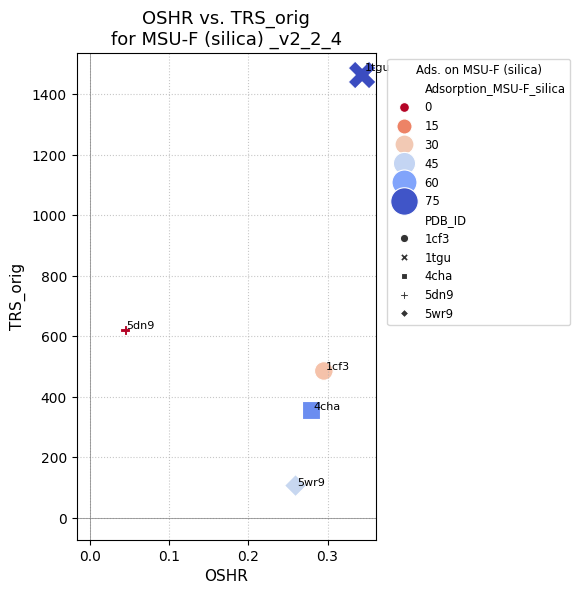

  산점도 (MSU-F-C (carbon), OSHR vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/OSHR_TRS_orig_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


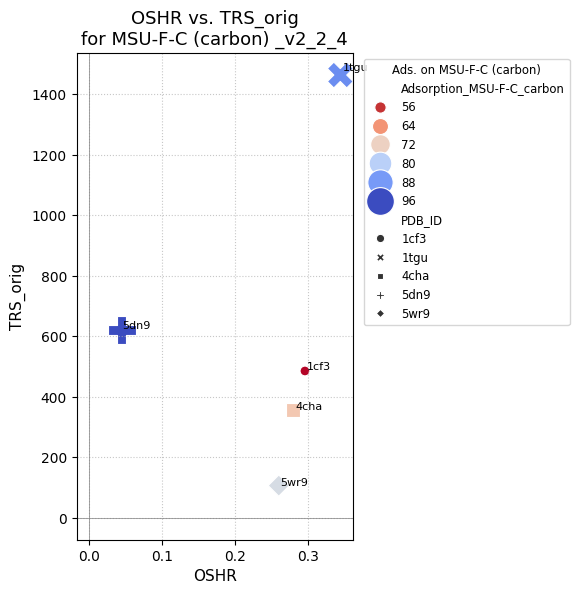

  산점도 (MSU-F (silica), SHE_orig vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_BEP_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


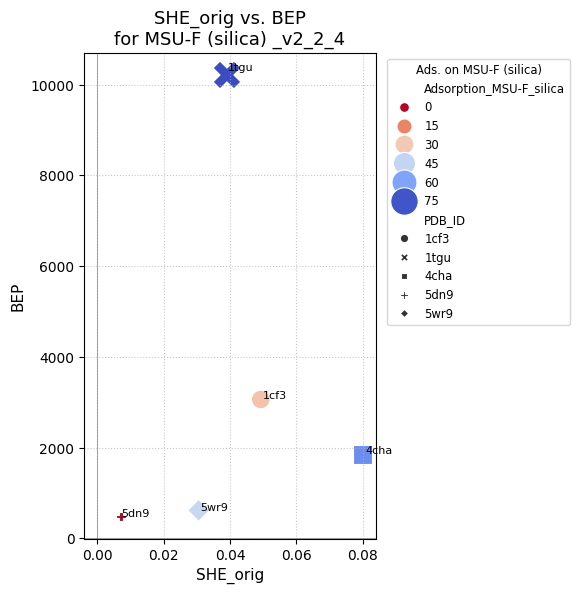

  산점도 (MSU-F-C (carbon), SHE_orig vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_BEP_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


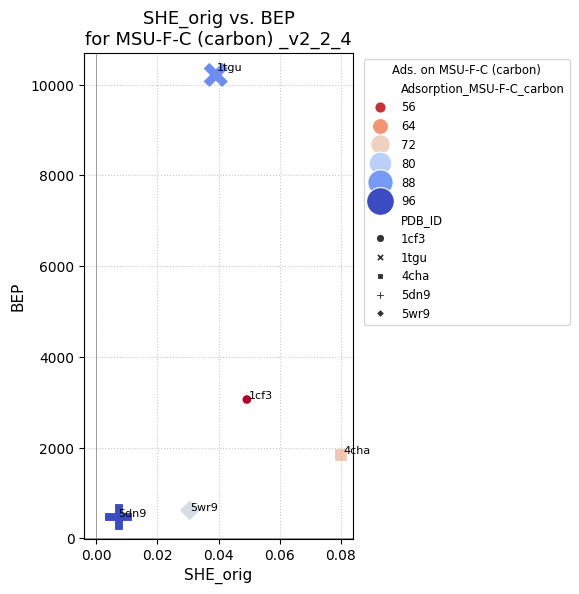

  산점도 (MSU-F (silica), SHE_orig vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_EHAP_density_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


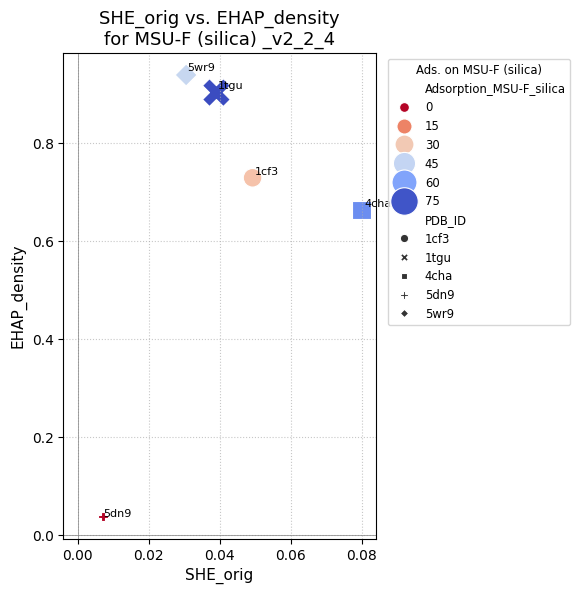

  산점도 (MSU-F-C (carbon), SHE_orig vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_EHAP_density_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


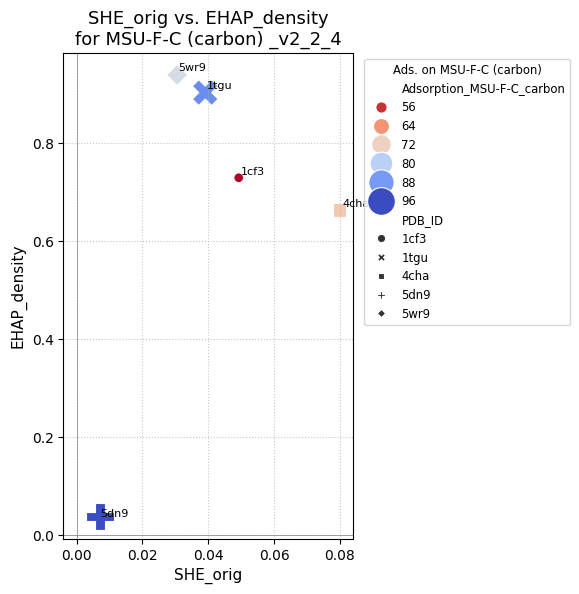

  산점도 (MSU-F (silica), SHE_orig vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


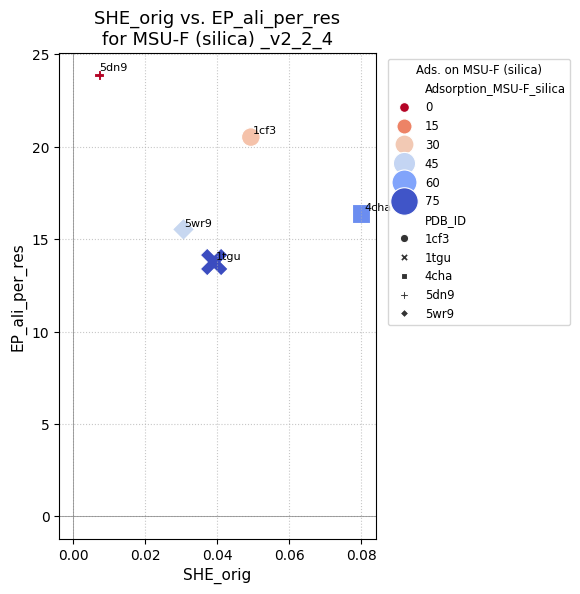

  산점도 (MSU-F-C (carbon), SHE_orig vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


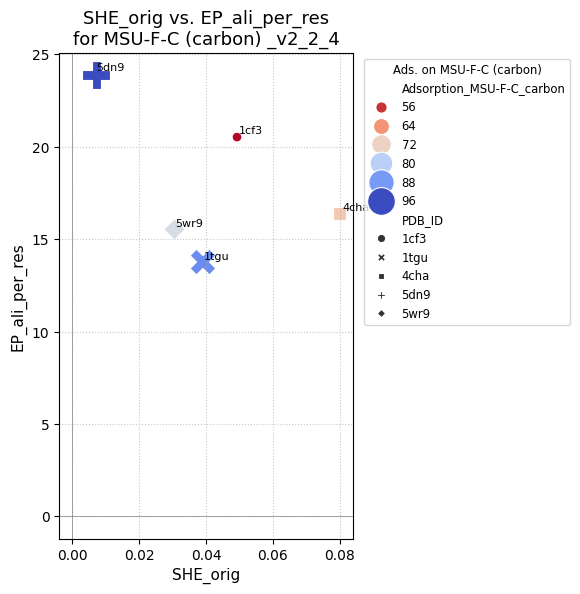

  산점도 (MSU-F (silica), SHE_orig vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_HEP_T2_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


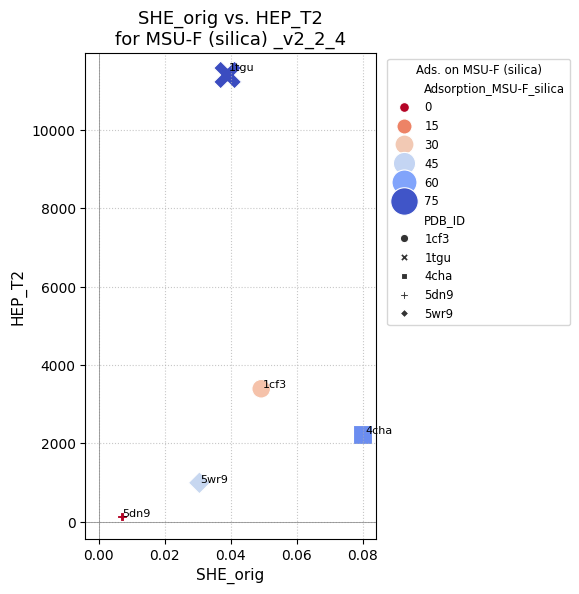

  산점도 (MSU-F-C (carbon), SHE_orig vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_HEP_T2_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0428.png'


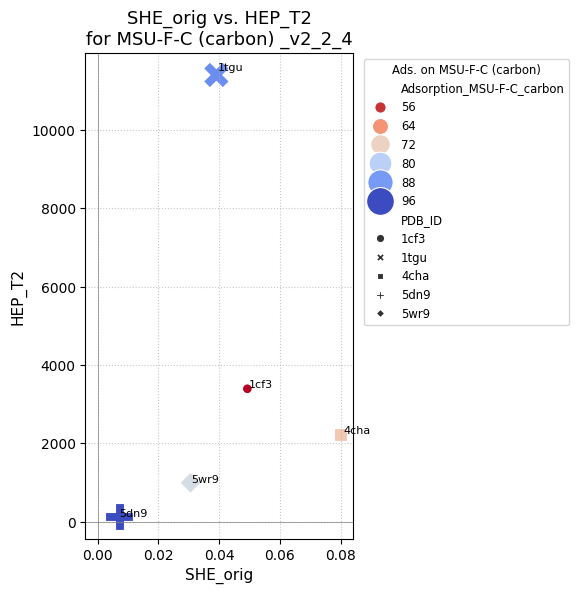

  산점도 (MSU-F (silica), SHE_orig vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_HEP_delta_Scatter_MSU-F_(silica)_v2_2_4_20250610_0428.png'


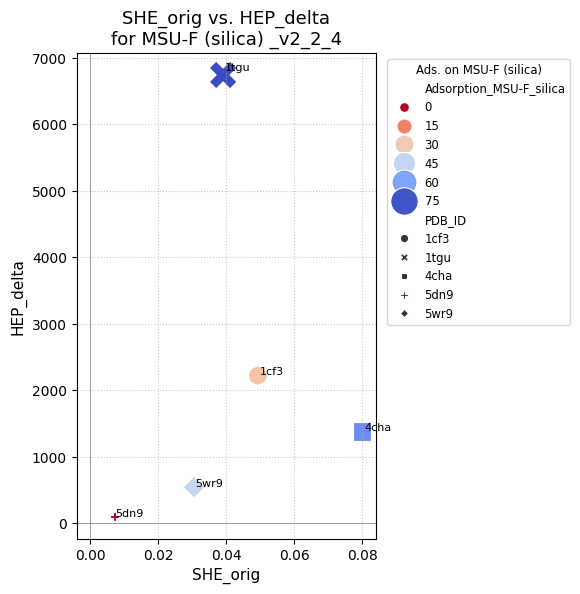

  산점도 (MSU-F-C (carbon), SHE_orig vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_HEP_delta_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


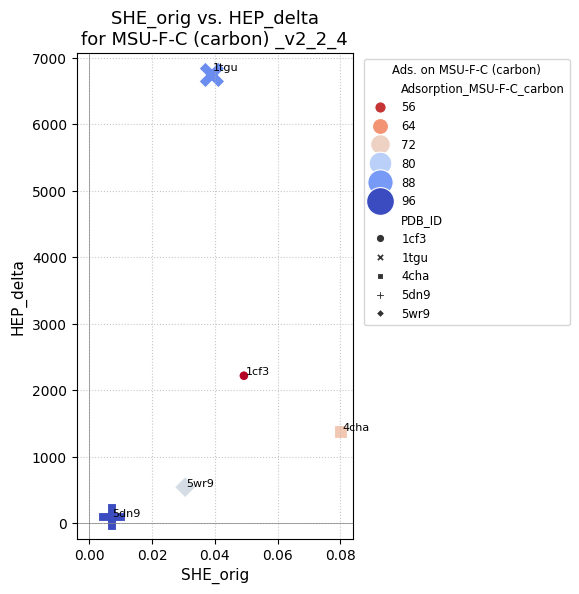

  산점도 (MSU-F (silica), SHE_orig vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_TRS_orig_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


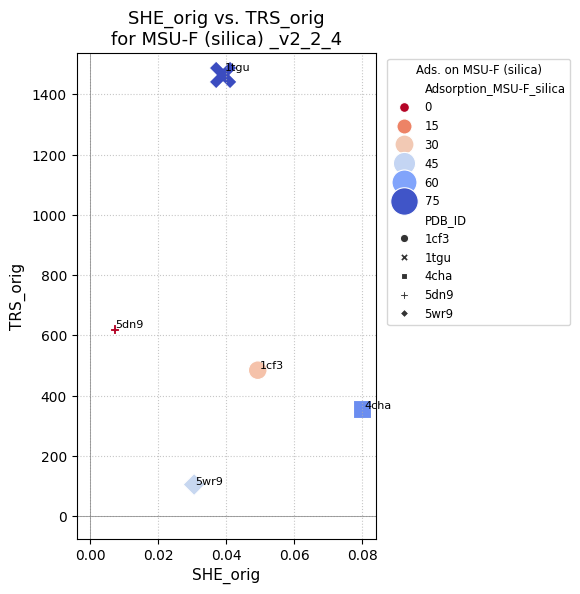

  산점도 (MSU-F-C (carbon), SHE_orig vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/SHE_orig_TRS_orig_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


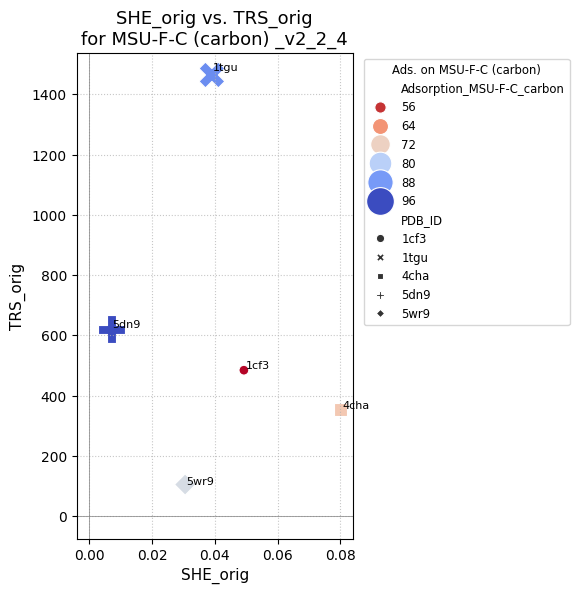

  산점도 (MSU-F (silica), User_ADHA vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_BEP_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


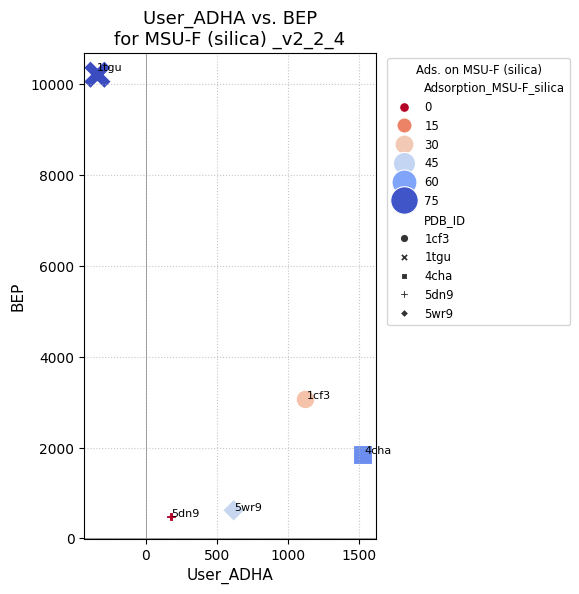

  산점도 (MSU-F-C (carbon), User_ADHA vs BEP) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_BEP_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


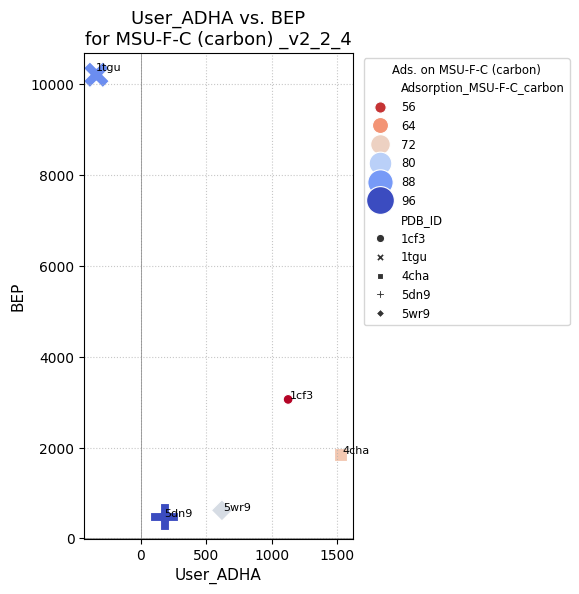

  산점도 (MSU-F (silica), User_ADHA vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_EHAP_density_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


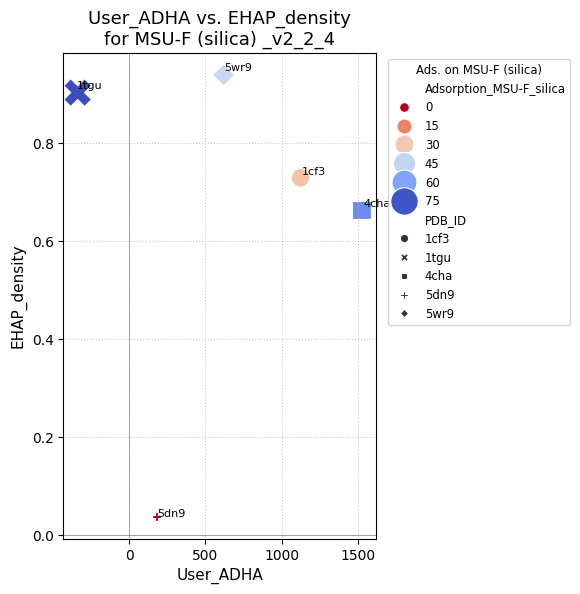

  산점도 (MSU-F-C (carbon), User_ADHA vs EHAP_density) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_EHAP_density_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


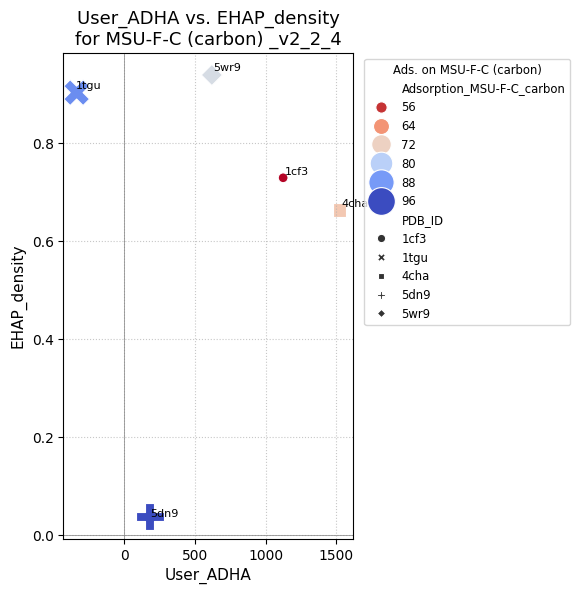

  산점도 (MSU-F (silica), User_ADHA vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


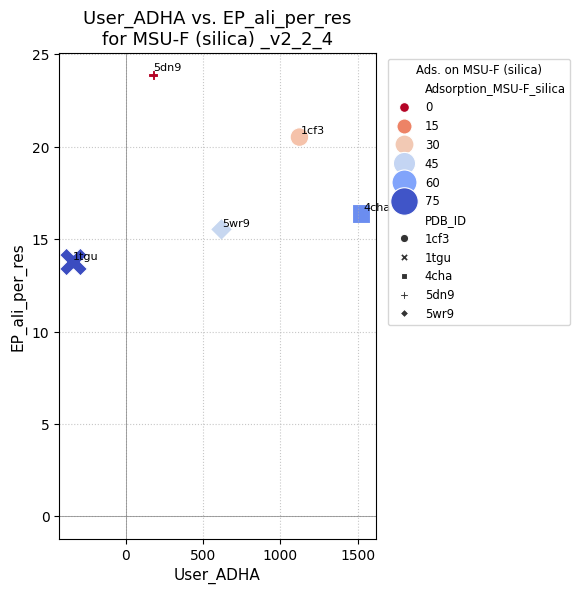

  산점도 (MSU-F-C (carbon), User_ADHA vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


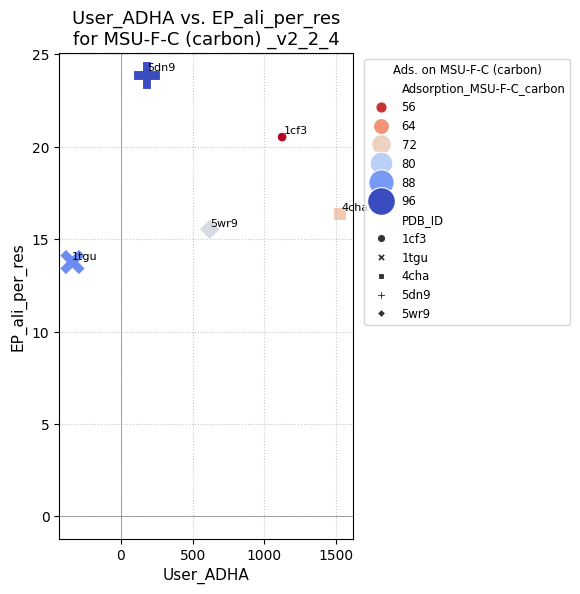

  산점도 (MSU-F (silica), User_ADHA vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_HEP_T2_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


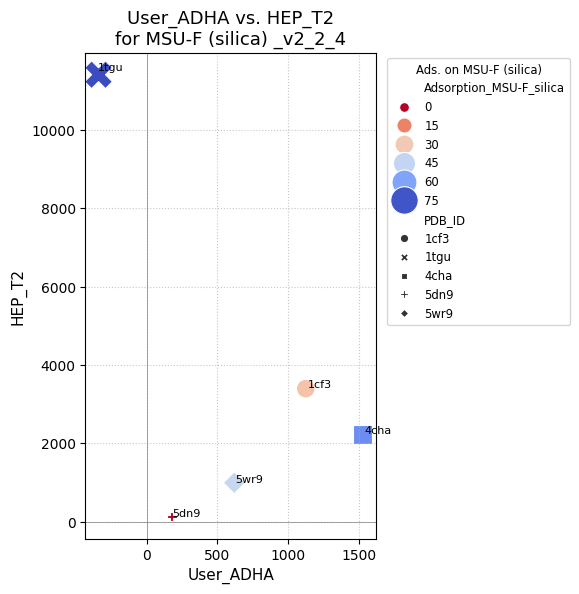

  산점도 (MSU-F-C (carbon), User_ADHA vs HEP_T2) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_HEP_T2_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


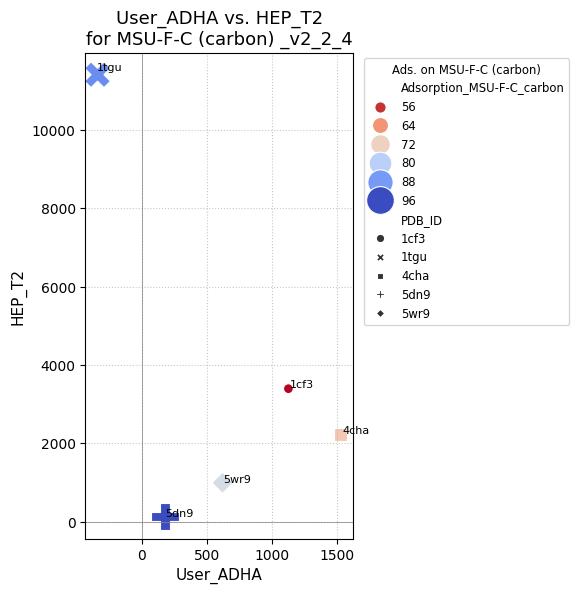

  산점도 (MSU-F (silica), User_ADHA vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_HEP_delta_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


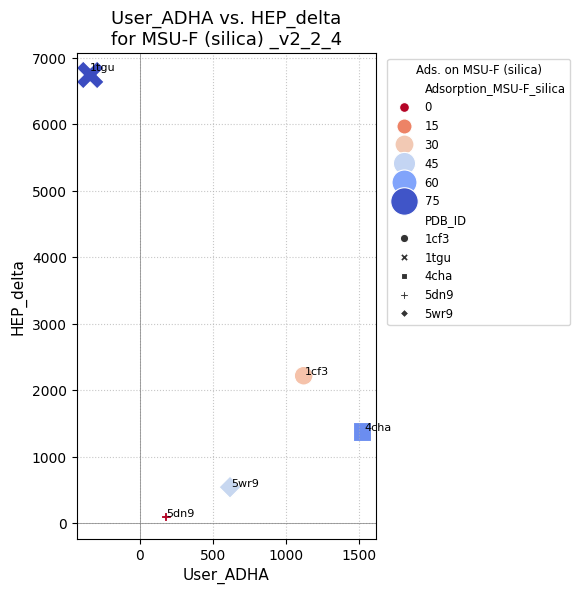

  산점도 (MSU-F-C (carbon), User_ADHA vs HEP_delta) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_HEP_delta_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


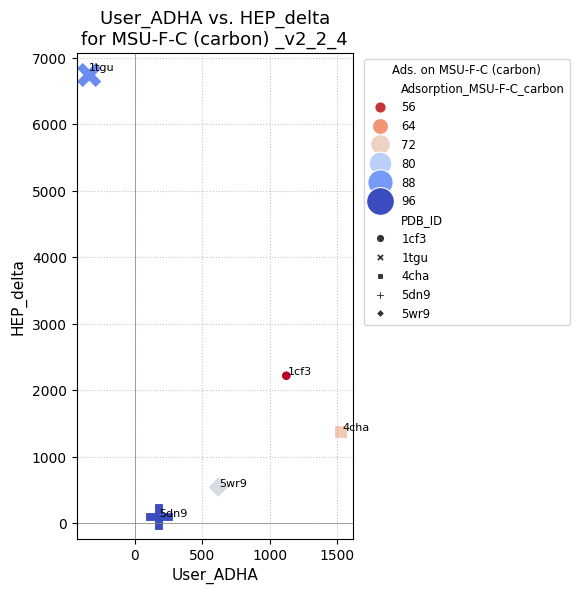

  산점도 (MSU-F (silica), User_ADHA vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_TRS_orig_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


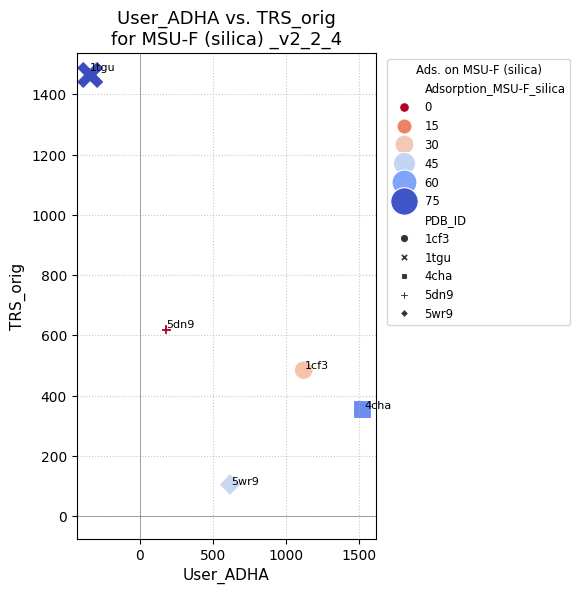

  산점도 (MSU-F-C (carbon), User_ADHA vs TRS_orig) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_ADHA_TRS_orig_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


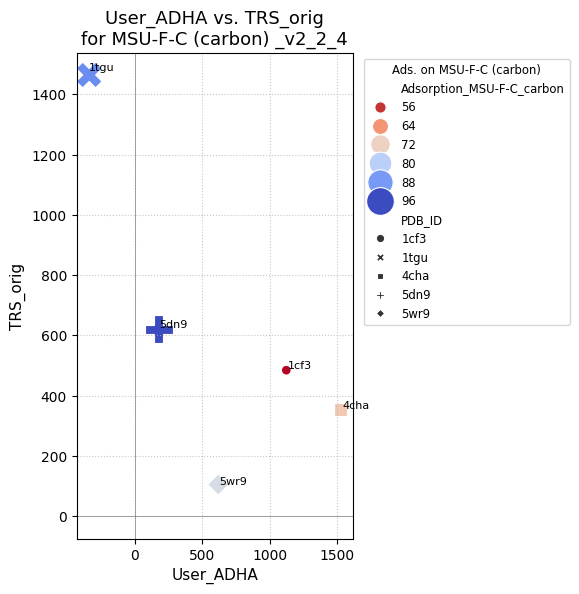

  산점도 (MSU-F (silica), User_SHAR vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_SHAR_EP_ali_per_res_Scatter_MSU-F_(silica)_v2_2_4_20250610_0429.png'


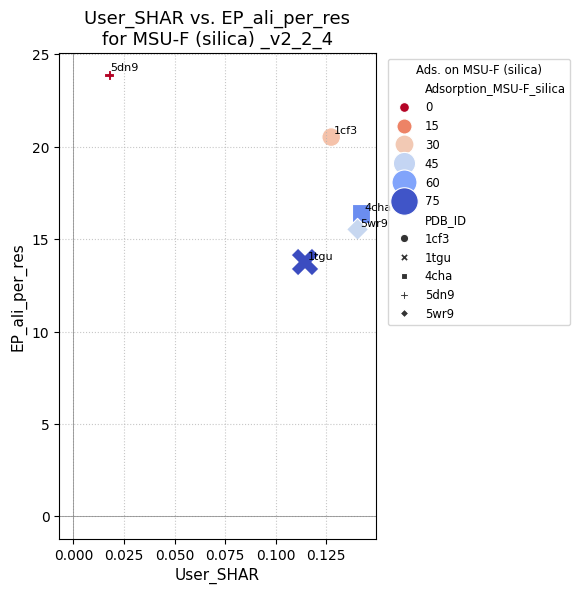

  산점도 (MSU-F-C (carbon), User_SHAR vs EP_ali_per_res) 저장: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250610_042739/User_SHAR_EP_ali_per_res_Scatter_MSU-F-C_(carbon)_v2_2_4_20250610_0429.png'


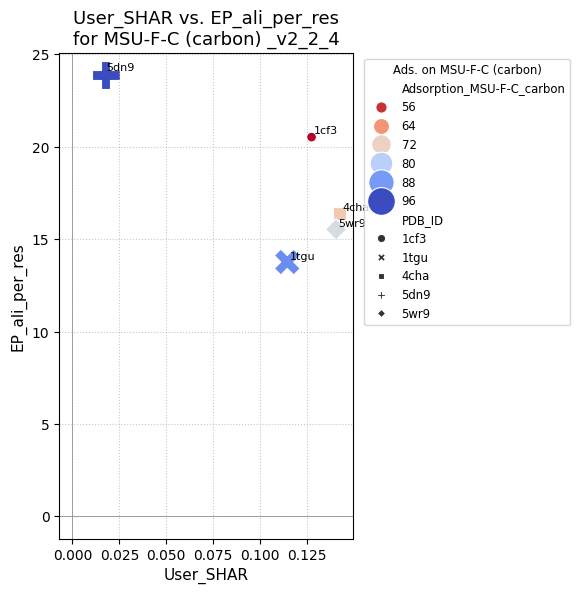


--- 지표와 실험적 흡착량 간의 상관관계 분석 ---

  표면: MSU-F (silica)
  Metric                         | Pearson Coeff.  | Pearson P-val   | Spearman Coeff. | Spearman P-val 
---------------------------------------------------------------------------------------------------------
  User_SHAR                      |      0.731      |    1.610e-01    |      0.400      |    5.046e-01   
  User_ADHA                      |     -0.009      |    9.889e-01    |     -0.100      |    8.729e-01   
  EP_ali_per_res                 |     -0.943      |    1.612e-02    |     -0.900      |    3.739e-02   
  EP_aro_per_res                 |      0.435      |    4.646e-01    |      0.200      |    7.471e-01   
  EP_mix_lvfyt_per_res           |     -0.710      |    1.795e-01    |     -0.600      |    2.848e-01   
  EP_all_hhr_subset_per_res      |     -0.910      |    3.222e-02    |     -1.000      |    1.404e-24   
  SHE_orig                       |      0.654      |    2.312e-01    |      0.500      |    3.910e-01   


In [ ]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.linear_model import LinearRegression
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from typing import List, Dict, Tuple, Any, Callable, Optional, Set

# --- 스크립트 버전 및 기본 설정 ---
SCRIPT_VERSION = "2.2.4" # 컬럼명 참조 오류 수정 및 일관성 강화
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
PDB_IDS = ["1cf3", "1tgu", "4cha", "5dn9", "5wr9"]

# --- 상수 정의 ---
KYTE_DOOLITTLE_SCALE = {
    'ALA': 1.8, 'ARG': -4.5, 'ASN': -3.5, 'ASP': -3.5, 'CYS': 2.5,
    'GLN': -3.5, 'GLU': -3.5, 'GLY': -0.4, 'HIS': -3.2, 'ILE': 4.5,
    'LEU': 3.8, 'LYS': -3.9, 'MET': 1.9, 'PHE': 2.8, 'PRO': -1.6,
    'SER': -0.8, 'THR': -0.7, 'TRP': -0.9, 'TYR': -1.3, 'VAL': 4.2
}
HYDROPHOBIC_RESIDUES_FOR_HHR = ['ALA', 'VAL', 'LEU', 'ILE', 'MET', 'PHE', 'TYR', 'TRP', 'CYS', 'PRO']
EXPERIMENTAL_ADSORPTION_VALUES = {
    "MSU-F (silica)": {"1tgu": 76.69, "4cha": 64.97, "5wr9": 44.05, "1cf3": 28.42, "5dn9": 0.00},
    "MSU-F-C (carbon)": {"5dn9": 96.02, "1tgu": 89.55, "5wr9": 76.09, "4cha": 70.26, "1cf3": 54.01}
}
RES_SETS_FOR_EP = {
    "ali"  : {"ILE", "LEU", "VAL"}, "aro"  : {"PHE", "TYR", "TRP"},
    "mix_lvfyt" : {"ILE", "LEU", "VAL", "PHE", "TYR"},
    "all_hhr_subset" : set(HYDROPHOBIC_RESIDUES_FOR_HHR)
}
STANDARD_ASA_TABLE_FOR_EP = {'ALA':115,'VAL':151,'LEU':183,'ILE':182,'MET':205,'PHE':218,'TYR':229,'TRP':259,
       'CYS':135,'PRO':129,'GLY':75,'SER':115,'THR':140,'ASN':160,'GLN':180,'ASP':150,
       'GLU':190,'HIS':195,'LYS':200,'ARG':225}

# === 데이터 로딩 및 전처리 함수 (이전과 동일) ===
def find_master_all_labels_csv(pdb_id: str, base_path: str, date_tag: Optional[str] = None) -> Optional[str]:
    filenames_to_try = []
    if date_tag:
        filenames_to_try.append(f"{pdb_id}_master_all_labels_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_labeled_data_{date_tag}.csv")
        filenames_to_try.append(f"{pdb_id}_master_residue_data_{date_tag}.csv")
    filenames_to_try.append(f"{pdb_id}_master_all_labels.csv")
    filenames_to_try.append(f"{pdb_id}_master_labeled_data.csv")
    filenames_to_try.append(f"{pdb_id}_master_residue_data.csv")
    for fname in filenames_to_try:
        path_to_check = os.path.join(base_path, fname)
        if os.path.exists(path_to_check):
            print(f"  정보: 입력 CSV 파일로 '{path_to_check}' 사용.")
            return path_to_check
    print(f"  경고: PDB ID '{pdb_id}'에 대한 마스터 CSV 파일을 '{base_path}'에서 찾을 수 없습니다.")
    return None

def add_kd_scores(df: pd.DataFrame, kd_scale: Dict[str, float],
                  resname_col: str = 'residue_name_3L', new_col_name: str = 'KD_score') -> pd.DataFrame:
    if resname_col not in df.columns: df[new_col_name] = np.nan; return df
    df[new_col_name] = df[resname_col].apply(lambda x: kd_scale.get(str(x).upper()))
    return df

def get_protein_sequence_and_mw(df: pd.DataFrame, chain_col: str = 'chain_id', res_num_col: str = 'residue_number', res_name_1L_col: str = 'residue_name_1L') -> Tuple[Optional[str], Optional[float], int]:
    num_residues_total = 0
    if chain_col in df.columns and res_num_col in df.columns: num_residues_total = df.drop_duplicates(subset=[chain_col, res_num_col]).shape[0]
    elif res_num_col in df.columns: num_residues_total = df[res_num_col].nunique()
    else: num_residues_total = len(df)
    if res_name_1L_col not in df.columns: return None, None, num_residues_total
    sort_cols = []
    if chain_col in df.columns: sort_cols.append(chain_col)
    if res_num_col in df.columns: sort_cols.append(res_num_col)
    if not sort_cols: unique_residues_df = df.drop_duplicates(subset=[res_name_1L_col])
    else:
        df_sorted = df.sort_values(by=sort_cols)
        unique_residues_df = df_sorted.drop_duplicates(subset=sort_cols)
    sequence = "".join(unique_residues_df[res_name_1L_col].astype(str).tolist())
    if not sequence: return None, None, num_residues_total
    try:
        standard_aa_chars = "ACDEFGHIKLMNPQRSTVWY"
        cleaned_sequence = "".join([char for char in sequence.upper() if char in standard_aa_chars])
        if not cleaned_sequence: return sequence, None, num_residues_total
        return cleaned_sequence, ProteinAnalysis(cleaned_sequence).molecular_weight(), len(cleaned_sequence)
    except Exception: return sequence, None, num_residues_total

# === 핵심 지표 계산 함수 (v2.2.4) ===
def calculate_protein_metrics_v2_2_4(df: pd.DataFrame,
                                     pdb_id: str,
                                     total_residues: int,
                                     molecular_weight: Optional[float],
                                     pymol_rsa_col: str = 'sasa_relative_total',
                                     dssp_rsa_col: str = 'dssp_accessibility_rsa',
                                     hydro_sasa_col: str = 'sasa_hydrophobic_total',
                                     total_sasa_abs_col: str = 'sasa_absolute_total',
                                     rmsf_t14_col: str = 'rmsf_T1.4',
                                     rmsf_t2_col: str = 'rmsf_T2.0',
                                     delta_rmsf_col_for_calc: Optional[str] = 'delta_rmsf_T2_T1.4',
                                     kd_col: str = 'KD_score',
                                     resname_col: str = 'residue_name_3L',
                                     tc_label_col_for_calc: str = 'is_transition_candidate',
                                     user_rsa_thresh_exposed: float = 0.5,
                                     user_rsa_thresh_buried: float = 0.25,
                                     orig_rsa_thresh_exposed: float = 0.6,
                                     orig_rsa_thresh_buried: float = 0.25,
                                     aa_sets_for_ep: Dict[str, Set[str]] = RES_SETS_FOR_EP,
                                     asa_table_for_ep: Dict[str, float] = STANDARD_ASA_TABLE_FOR_EP
                                    ) -> Dict[str, Any]:
    # (이전 답변의 함수 내용과 동일 - 내부 로직은 변경 없음)
    metrics = { "PDB_ID": pdb_id, "Total_Residues": total_residues, "MW": molecular_weight,
                "User_SHAR": None, "User_ADHA": None,
                "SHE_orig": None, "OSHR": None,
                "AHA_exposed_orig": 0.0, "AHA_buried_orig": 0.0, "ADHA_orig": None, "NDHA_orig": None,
                "HHR_count": None, "HHR_density": None, "Delta_KD_orig": None,
                "TRS_orig": None, "Normalized_TRS_orig": None,
                "EHAP": 0.0, "EHAP_density": 0.0,
                "TC_Count": 0, "TC_Ratio": 0.0,
                "TC_AvgDeltaRMSF": None, "TC_AvgRMSF_T2": None,
                "TP_custom": None, "BEP": 0.0, "SAP": None,
                "HEP_delta": None, "Normalized_HEP_delta": None,
                "HEP_T2": None, "Normalized_HEP_T2": None
              }
    for set_name in aa_sets_for_ep.keys(): metrics[f"EP_{set_name}_per_res"] = None
    df_numeric = df.copy()
    cols_to_ensure_numeric = [pymol_rsa_col, dssp_rsa_col, hydro_sasa_col, total_sasa_abs_col, rmsf_t14_col, rmsf_t2_col, kd_col]
    if delta_rmsf_col_for_calc and isinstance(delta_rmsf_col_for_calc, str) and delta_rmsf_col_for_calc in df_numeric.columns:
        cols_to_ensure_numeric.append(delta_rmsf_col_for_calc)
    for col_name in cols_to_ensure_numeric:
        if col_name in df_numeric.columns: df_numeric[col_name] = pd.to_numeric(df_numeric[col_name], errors='coerce')
        else: print(f"  경고 ({pdb_id}): 지표 계산 필수 컬럼 '{col_name}' 없음.")
    actual_delta_rmsf_series: Optional[pd.Series] = None
    if delta_rmsf_col_for_calc and delta_rmsf_col_for_calc in df_numeric.columns:
        actual_delta_rmsf_series = df_numeric[delta_rmsf_col_for_calc]
    elif rmsf_t14_col in df_numeric.columns and rmsf_t2_col in df_numeric.columns and df_numeric[rmsf_t14_col].notna().any() and df_numeric[rmsf_t2_col].notna().any():
        base_delta_col_name_temp = 'delta_rmsf_T2_T1.4_temp_calc'; df_numeric[base_delta_col_name_temp] = df_numeric[rmsf_t2_col] - df_numeric[rmsf_t14_col]
        actual_delta_rmsf_series = df_numeric[base_delta_col_name_temp]
    if actual_delta_rmsf_series is None: print(f"  경고 ({pdb_id}): 유효 Delta RMSF 데이터 없어 관련 지표 계산 제한됨.")
    sum_total_sasa_protein_val = 0.0
    if total_sasa_abs_col in df_numeric.columns:
        sum_total_sasa_protein_val = df_numeric[total_sasa_abs_col].sum(skipna=True)
        if not (pd.notna(sum_total_sasa_protein_val) and sum_total_sasa_protein_val > 0): sum_total_sasa_protein_val = 0.0
    rsa_col_for_user = dssp_rsa_col if dssp_rsa_col in df_numeric.columns and df_numeric[dssp_rsa_col].notna().any() else pymol_rsa_col
    if rsa_col_for_user not in df_numeric.columns: print(f"  경고 ({pdb_id}): User_SHAR/ADHA/EP_set 계산용 RSA 컬럼 없음.")
    elif hydro_sasa_col in df_numeric.columns and sum_total_sasa_protein_val > 0:
        shar_surface_residues = df_numeric[df_numeric[rsa_col_for_user] > user_rsa_thresh_exposed]
        metrics["User_SHAR"] = shar_surface_residues[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein_val
        aha_out_user = shar_surface_residues[hydro_sasa_col].sum(skipna=True)
        aha_in_user = df_numeric[df_numeric[rsa_col_for_user] < user_rsa_thresh_buried][hydro_sasa_col].sum(skipna=True)
        if pd.notna(aha_out_user) and pd.notna(aha_in_user): metrics["User_ADHA"] = aha_out_user - aha_in_user
    for set_name_ep, aa_set_ep in aa_sets_for_ep.items():
        col_name_ep_metric = f"EP_{set_name_ep}_per_res"; metrics[col_name_ep_metric] = 0.0
        if all(c in df_numeric.columns for c in [rsa_col_for_user, resname_col, rmsf_t2_col]):
            buried_set_residues_ep = df_numeric[(df_numeric[resname_col].isin(aa_set_ep)) & (df_numeric[rsa_col_for_user] < user_rsa_thresh_buried) ]
            if not buried_set_residues_ep.empty:
                ep_sum_for_set_val = 0.0
                for _, row_res_ep in buried_set_residues_ep.iterrows():
                    res_name_val_ep = str(row_res_ep[resname_col]).upper(); asa_val_for_ep = asa_table_for_ep.get(res_name_val_ep, 0)
                    rmsf_val_for_ep = row_res_ep[rmsf_t2_col]
                    if pd.notna(asa_val_for_ep) and pd.notna(rmsf_val_for_ep): ep_sum_for_set_val += asa_val_for_ep * rmsf_val_for_ep
                if total_residues > 0: metrics[col_name_ep_metric] = ep_sum_for_set_val / total_residues
                else: metrics[col_name_ep_metric] = np.nan
        else: metrics[col_name_ep_metric] = np.nan
    if hydro_sasa_col in df_numeric.columns and sum_total_sasa_protein_val > 0:
        metrics["OSHR"] = df_numeric[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein_val
    if pymol_rsa_col in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        if sum_total_sasa_protein_val > 0:
            surface_r_she_orig = df_numeric[df_numeric[pymol_rsa_col] > orig_rsa_thresh_exposed]
            metrics["SHE_orig"] = surface_r_she_orig[hydro_sasa_col].sum(skipna=True) / sum_total_sasa_protein_val
        exposed_r_aha_orig = df_numeric[df_numeric[pymol_rsa_col] > orig_rsa_thresh_exposed]
        buried_r_aha_orig = df_numeric[df_numeric[pymol_rsa_col] < orig_rsa_thresh_buried]
        metrics["AHA_exposed_orig"] = exposed_r_aha_orig[hydro_sasa_col].sum(skipna=True)
        metrics["AHA_buried_orig"] = buried_r_aha_orig[hydro_sasa_col].sum(skipna=True)
        if pd.notna(metrics["AHA_exposed_orig"]) and pd.notna(metrics["AHA_buried_orig"]):
            metrics["ADHA_orig"] = metrics["AHA_exposed_orig"] - metrics["AHA_buried_orig"]
            if pd.notna(metrics["ADHA_orig"]) and sum_total_sasa_protein_val > 0 : metrics["NDHA_orig"] = metrics["ADHA_orig"] / sum_total_sasa_protein_val
    buried_hydro_r_df_hhr = pd.DataFrame()
    if pymol_rsa_col in df_numeric.columns and resname_col in df_numeric.columns:
        buried_hydro_r_df_hhr = df_numeric[(df_numeric[pymol_rsa_col] < orig_rsa_thresh_buried) & (df_numeric[resname_col].isin(HYDROPHOBIC_RESIDUES_FOR_HHR))]
        metrics["HHR_count"] = len(buried_hydro_r_df_hhr)
        if total_residues > 0 and metrics["HHR_count"] is not None: metrics["HHR_density"] = metrics["HHR_count"] / total_residues
    if pymol_rsa_col in df_numeric.columns and kd_col in df_numeric.columns:
        b_kd_orig = df_numeric[df_numeric[pymol_rsa_col] < orig_rsa_thresh_buried]; s_kd_orig = df_numeric[df_numeric[pymol_rsa_col] > orig_rsa_thresh_exposed]
        if not b_kd_orig.empty and not s_kd_orig.empty and b_kd_orig[kd_col].notna().any() and s_kd_orig[kd_col].notna().any():
            mkb_o, mks_o = b_kd_orig[kd_col].mean(skipna=True), s_kd_orig[kd_col].mean(skipna=True)
            if pd.notna(mkb_o) and pd.notna(mks_o): metrics["Delta_KD_orig"] = mkb_o - mks_o
    if metrics.get("HHR_count", 0) > 0 and rmsf_t2_col in df_numeric.columns and not buried_hydro_r_df_hhr.empty:
        m_rmsf_t2_hhr_o = buried_hydro_r_df_hhr[rmsf_t2_col].mean(skipna=True)
        if pd.notna(m_rmsf_t2_hhr_o):
            metrics["TRS_orig"] = metrics["HHR_count"] * m_rmsf_t2_hhr_o
            if total_residues > 0 and metrics.get("HHR_density") is not None: metrics["Normalized_TRS_orig"] = metrics["HHR_density"] * m_rmsf_t2_hhr_o
    elif metrics.get("HHR_count") == 0: metrics["TRS_orig"] = 0.0; metrics["Normalized_TRS_orig"] = 0.0
    if actual_delta_rmsf_series is not None and not actual_delta_rmsf_series.empty and all(c in df_numeric.columns for c in [pymol_rsa_col, hydro_sasa_col]):
        temp_delta_col_name = "_temp_delta_for_tp_bep_sap"; df_numeric[temp_delta_col_name] = actual_delta_rmsf_series
        exposed_r_for_tp = df_numeric[df_numeric[pymol_rsa_col] > user_rsa_thresh_exposed]
        buried_r_for_tp = df_numeric[df_numeric[pymol_rsa_col] < user_rsa_thresh_buried]
        tp_exposed_term = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[temp_delta_col_name]).sum(skipna=True)
        tp_buried_term = (buried_r_for_tp[hydro_sasa_col] * buried_r_for_tp[temp_delta_col_name]).sum(skipna=True)
        if pd.notna(tp_exposed_term) and pd.notna(tp_buried_term): metrics["TP_custom"] = tp_exposed_term - tp_buried_term
        bep_sum = (buried_r_for_tp[hydro_sasa_col] * np.maximum(0, buried_r_for_tp[temp_delta_col_name])).sum(skipna=True)
        if pd.notna(bep_sum): metrics["BEP"] = bep_sum
        sap_sum = (exposed_r_for_tp[hydro_sasa_col] * exposed_r_for_tp[temp_delta_col_name]).sum(skipna=True)
        if pd.notna(sap_sum): metrics["SAP"] = sap_sum
        if temp_delta_col_name in df_numeric.columns: df_numeric.drop(columns=[temp_delta_col_name], inplace=True, errors='ignore')
    if tc_label_col_for_calc and tc_label_col_for_calc in df_numeric.columns and hydro_sasa_col in df_numeric.columns:
        if df_numeric[tc_label_col_for_calc].dtype == 'object' or df_numeric[tc_label_col_for_calc].dtype != 'bool':
             try: df_numeric[tc_label_col_for_calc] = df_numeric[tc_label_col_for_calc].apply(lambda x: str(x).lower() == 'true' if pd.notna(x) else False)
             except: df_numeric[tc_label_col_for_calc] = df_numeric[tc_label_col_for_calc].fillna(False).astype(bool)
        tc_df = df_numeric[df_numeric[tc_label_col_for_calc] == True]
        metrics["TC_Count"] = len(tc_df)
        if total_residues > 0: metrics["TC_Ratio"] = metrics["TC_Count"] / total_residues if total_residues > 0 else 0.0
        if not tc_df.empty:
            metrics["EHAP"] = tc_df[hydro_sasa_col].sum(skipna=True)
            if pd.notna(metrics["EHAP"]) and total_residues > 0: metrics["EHAP_density"] = metrics["EHAP"] / total_residues
            tc_avg_delta_val = None
            if actual_delta_rmsf_series is not None and not actual_delta_rmsf_series[df_numeric[tc_label_col_for_calc] == True].empty:
                tc_avg_delta_val = actual_delta_rmsf_series[df_numeric[tc_label_col_for_calc] == True].mean(skipna=True)
            metrics["TC_AvgDeltaRMSF"] = tc_avg_delta_val if pd.notna(tc_avg_delta_val) else None
            tc_avg_rmsf_t2_val = None
            if rmsf_t2_col in tc_df.columns: tc_avg_rmsf_t2_val = tc_df[rmsf_t2_col].mean(skipna=True)
            metrics["TC_AvgRMSF_T2"] = tc_avg_rmsf_t2_val if pd.notna(tc_avg_rmsf_t2_val) else None
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgDeltaRMSF")):
                metrics["HEP_delta"] = metrics["EHAP"] * metrics["TC_AvgDeltaRMSF"]
                if total_residues > 0 and pd.notna(metrics["HEP_delta"]): metrics["Normalized_HEP_delta"] = metrics["HEP_delta"] / total_residues
            else: metrics["HEP_delta"], metrics["Normalized_HEP_delta"] = None, None
            if pd.notna(metrics["EHAP"]) and pd.notna(metrics.get("TC_AvgRMSF_T2")):
                metrics["HEP_T2"] = metrics["EHAP"] * metrics["TC_AvgRMSF_T2"]
                if total_residues > 0 and pd.notna(metrics["HEP_T2"]): metrics["Normalized_HEP_T2"] = metrics["HEP_T2"] / total_residues
            else: metrics["HEP_T2"], metrics["Normalized_HEP_T2"] = None, None
        else:
            metrics["EHAP"], metrics["EHAP_density"] = 0.0, 0.0
            for k_hep in ["TC_AvgDeltaRMSF", "TC_AvgRMSF_T2", "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]:
                 metrics[k_hep] = None if "Avg" in k_hep else 0.0
    return metrics

# === 시각화 및 상관관계 함수 (이전 v2.2.2에서 가져와서 사용) ===
def plot_summary_metrics_bars_v2_2_4(summary_df: pd.DataFrame, metrics_to_plot: List[str], output_dir: str, file_suffix: str = ""):
    num_metrics = len(metrics_to_plot); plot_df = summary_df.set_index("PDB_ID")
    valid_metrics = [m for m in metrics_to_plot if m in plot_df.columns and plot_df[m].notna().any()]
    if not valid_metrics: print("  막대 플롯: 시각화할 유효 지표 없음."); return
    plot_df = plot_df[valid_metrics].fillna(0)
    n_cols = min(3, len(valid_metrics)); n_rows = (len(valid_metrics) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6.5 * n_cols, 5 * n_rows), squeeze=False, constrained_layout=True)
    axes = axes.flatten()
    for i, metric in enumerate(valid_metrics):
        sns.barplot(x=plot_df.index, y=plot_df[metric], ax=axes[i], palette="viridis"); axes[i].set_title(f"{metric}", fontsize=13)
        axes[i].set_xlabel("PDB ID", fontsize=11); axes[i].set_ylabel(metric, fontsize=11)
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=30, ha='right'); axes[i].tick_params(axis='y', labelsize=9)
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
        for p in axes[i].patches:
            height = p.get_height()
            if pd.notna(height): axes[i].annotate(f"{height:.2f}", (p.get_x()+p.get_width()/2., height), ha='center', va='center', xytext=(0,5), textcoords='offset points', fontsize=8)
    for j in range(i + 1, len(axes)): fig.delaxes(axes[j])
    fig.suptitle(f"Protein Feature Comparison {file_suffix}", fontsize=16, y=1.03 if n_rows > 1 else 0.99)
    fname = f"Metrics_BarPlots{file_suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
    try: plt.savefig(os.path.join(output_dir, fname), dpi=200); print(f"  막대 플롯 저장: '{os.path.join(output_dir, fname)}'")
    except Exception as e: print(f"  오류: 막대 플롯 저장 실패 - {e}")
    plt.show(); plt.close(fig)

def plot_scatter_metrics_vs_adsorption_v2_2_4(summary_df: pd.DataFrame, x_metric: str, y_metric: str, ads_data: Dict[str, Dict[str, float]], out_dir: str, suffix: str = ""):
    if x_metric not in summary_df.columns or y_metric not in summary_df.columns: print(f"  경고: '{x_metric}' 또는 '{y_metric}' 없어 산점도 생성 불가."); return
    for surf_name, ads_vals in ads_data.items():
        ads_col = f"Adsorption_{surf_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        if ads_col not in summary_df.columns: summary_df[ads_col] = summary_df["PDB_ID"].map(ads_vals)
        plt.figure(figsize=(7, 6.5)); plot_data = summary_df.dropna(subset=[ads_col, x_metric, y_metric])
        if plot_data.empty : print(f"  경고: {surf_name} ({x_metric} vs {y_metric}) 산점도 데이터 없음."); continue
        sns.scatterplot(data=plot_data,x=x_metric,y=y_metric,size=ads_col,hue=ads_col,sizes=(50,400),palette="coolwarm_r",legend="brief",style=plot_data["PDB_ID"] if len(plot_data["PDB_ID"].unique()) <=7 else None)
        for i in range(plot_data.shape[0]): plt.text(x=plot_data.iloc[i][x_metric]*1.01,y=plot_data.iloc[i][y_metric]*1.01,s=plot_data.iloc[i]['PDB_ID'],fontdict=dict(color='black',size=8))
        plt.title(f"{x_metric} vs. {y_metric}\nfor {surf_name} {suffix}",fontsize=13); plt.xlabel(f"{x_metric}",fontsize=11); plt.ylabel(f"{y_metric}",fontsize=11)
        plt.grid(True,ls=':',alpha=0.7); plt.axhline(0,color='grey',lw=0.5); plt.axvline(0,color='grey',lw=0.5)
        plt.legend(title=f"Ads. on {surf_name}",bbox_to_anchor=(1.02,1),loc='upper left',title_fontsize='small',fontsize='small')
        plt.tight_layout(rect=[0,0,0.85,0.93])
        fname=f"{x_metric.replace('/','_')}_{y_metric.replace('/','_')}_Scatter_{surf_name.replace(' ','_')}{suffix}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
        try: plt.savefig(os.path.join(out_dir,fname),dpi=200); print(f"  산점도 ({surf_name}, {x_metric} vs {y_metric}) 저장: '{os.path.join(out_dir, fname)}'")
        except Exception as e: print(f"  오류: 산점도 저장 실패 - {e}")
        plt.show(); plt.close()

def calculate_and_print_correlations_v2_2_4(summary_df: pd.DataFrame, metrics_to_corr: List[str], ads_data: Dict[str, Dict[str, float]]):
    print("\n--- 지표와 실험적 흡착량 간의 상관관계 분석 ---")
    results = {}
    for surf, ads_vals in ads_data.items():
        ads_col = f"Adsorption_{surf.replace(' ', '_').replace('(', '').replace(')', '')}"
        if ads_col not in summary_df.columns: continue
        print(f"\n  표면: {surf}"); print(f"  {'Metric':<30} | {'Pearson Coeff.':<15} | {'Pearson P-val':<15} | {'Spearman Coeff.':<15} | {'Spearman P-val':<15}"); print("-" * 105)
        surf_corr = {}
        for met in metrics_to_corr:
            if met in summary_df.columns:
                valid_df = summary_df[[met, ads_col]].dropna()
                if len(valid_df) < 3: print(f"  {met:<30} | {'N/A (데이터 부족)':<15} | {'N/A':<15} | {'N/A (데이터 부족)':<15} | {'N/A':<15}"); continue
                p_r,p_p=pearsonr(valid_df[met],valid_df[ads_col]); s_r,s_p=spearmanr(valid_df[met],valid_df[ads_col])
                print(f"  {met:<30} | {p_r:^15.3f} | {p_p:^15.3e} | {s_r:^15.3f} | {s_p:^15.3e}")
                surf_corr[met]={'pearson_r':p_r,'pearson_p':p_p,'spearman_r':s_r,'spearman_p':s_p}
        results[surf]=surf_corr; print("-" * 105)
    return results

# === 메인 실행 로직 (v2.2.4) ===
def main_v2_2_4():
    print(f"--- 단백질 흡착 특징 분석기 v{SCRIPT_VERSION} (사용자 정의 지표 및 회귀분석 통합) ---")
    date_tag_input = input(f"분석할 마스터 CSV 파일들의 날짜 태그 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    try:
        rsa_surf_in = input(f"User_SHAR, User_ADHA(외부) 등 계산 시 '표면 잔기' RSA 임계값 (> 값, 기본 0.5): ").strip()
        rsa_thresh_surf_custom = float(rsa_surf_in) if rsa_surf_in else 0.5
        if not (0.0 < rsa_thresh_surf_custom <= 1.0): raise ValueError("RSA 표면 임계값 0 초과 1 이하.")
        rsa_bur_in = input(f"User_ADHA(내부), User_EP_set 등 계산 시 '내부 잔기' RSA 임계값 (< 값, 기본 0.25): ").strip()
        rsa_thresh_bur_custom = float(rsa_bur_in) if rsa_bur_in else 0.25
        if not (0.0 <= rsa_thresh_bur_custom < 1.0): raise ValueError("RSA 내부 임계값 0 이상 1 미만.")
        if rsa_thresh_bur_custom >= rsa_thresh_surf_custom : raise ValueError("내부 RSA 임계값은 표면 RSA 임계값보다 작아야 합니다.")
    except ValueError as e:
        print(f"잘못된 RSA 임계값: {e}. 기본값 (표면 > 0.5, 내부 < 0.25) 사용."); rsa_thresh_surf_custom = 0.5; rsa_thresh_bur_custom = 0.25
    print(f"사용자 정의 지표용 RSA 임계값: 표면(외부) > {rsa_thresh_surf_custom}, 내부 < {rsa_thresh_bur_custom}")

    print("\nEHAP/HEP 및 관련 통계 계산에 사용할 Transition Candidate 정의 세트를 선택합니다.")
    tc_set_key_input = input(f"사용할 'set_key'를 입력하세요 (예: set3_default_0.25): ").strip()
    if not tc_set_key_input:
        default_tc_set_key = "set3_default_0.25"; print(f"경고: TC set_key 미입력. 기본값 '{default_tc_set_key}' 사용."); tc_set_key_for_analysis = default_tc_set_key
    else: tc_set_key_for_analysis = tc_set_key_input
    selected_tc_label_col = f"{tc_set_key_for_analysis}_is_transition_candidate"
    selected_delta_rmsf_col = f"delta_rmsf_T2_T1.4_{tc_set_key_for_analysis}"
    print(f"EHAP/HEP 분석용 TC 라벨 컬럼: '{selected_tc_label_col}'")
    print(f"EHAP/HEP 분석용 Delta RMSF 컬럼: '{selected_delta_rmsf_col}' (없을 시 기본 delta_rmsf_T2_T1.4 사용 또는 재계산)")

    all_protein_metrics_data = []
    for pdb_id in PDB_IDS:
        print(f"\n--- {pdb_id.upper()} 처리 시작 ---")
        master_csv_path = find_master_all_labels_csv(pdb_id, pdb_save_path, date_tag_input)
        if not master_csv_path: all_protein_metrics_data.append({"PDB_ID": pdb_id}); continue
        try:
            df = pd.read_csv(master_csv_path)
            print(f"  '{master_csv_path}' 로드 완료.")
            df = add_kd_scores(df, KYTE_DOOLITTLE_SCALE)
            sequence, mw, num_res = get_protein_sequence_and_mw(df)
            print(f"  총 잔기 수: {num_res}, 분자량: {mw if mw else 'N/A'} Da")

            final_tc_col = selected_tc_label_col
            if selected_tc_label_col not in df.columns:
                potential_tc = [col for col in df.columns if selected_tc_label_col.endswith('_is_transition_candidate') and col.startswith(tc_set_key_for_analysis)]
                if not potential_tc: potential_tc = [col for col in df.columns if 'is_transition_candidate' in col.lower()]
                if potential_tc: final_tc_col = potential_tc[0]; print(f"  경고: TC 컬럼 '{selected_tc_label_col}' 없음. 대신 '{final_tc_col}' 사용.")
                else: print(f"  경고: 유효 TC 컬럼 없어 EHAP/HEP 계산 영향."); final_tc_col = 'non_existent_tc_col'

            final_delta_rmsf_col_for_metrics = selected_delta_rmsf_col
            if selected_delta_rmsf_col not in df.columns:
                base_delta_col = 'delta_rmsf_T2_T1.4'
                if base_delta_col in df.columns: final_delta_rmsf_col_for_metrics = base_delta_col; print(f"  경고: Delta RMSF 컬럼 '{selected_delta_rmsf_col}' 없음. 대신 '{final_delta_rmsf_col_for_metrics}' 사용.")
                else: final_delta_rmsf_col_for_metrics = None

            metrics = calculate_protein_metrics_v2_2_4(
                df, pdb_id, num_res, mw,
                user_rsa_thresh_exposed=rsa_thresh_surf_custom,
                user_rsa_thresh_buried=rsa_thresh_bur_custom,
                #tc_label_col_for_calc=final_tc_col, # *** 수정된 키워드 인자명 *** delta_rmsf_col_for_calc=final_delta_rmsf_col_for_metrics, # *** 수정된 키워드 인자명 ***
                #dssp_rsa_col = 'dssp_accessibility_rsa'
                delta_rmsf_col_for_calc=final_delta_rmsf_col_for_metrics, # *** 수정: 주석 제거 및 올바른 인자명 확인 ***
                dssp_rsa_col = 'dssp_accessibility_rsa'
            )
            all_protein_metrics_data.append(metrics)
            print(f"  {pdb_id} 지표 계산 완료.")
        except Exception as e: print(f"  오류: {pdb_id} 처리 중 - {e}"); import traceback; traceback.print_exc(); all_protein_metrics_data.append({"PDB_ID": pdb_id})

    summary_df = pd.DataFrame(all_protein_metrics_data)
    if summary_df.empty: print("\n분석된 단백질 데이터 없음. 종료."); return

    for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
        ads_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
        summary_df[ads_col_name] = summary_df["PDB_ID"].map(ads_values)

    print(f"\n--- 계산된 전체 단백질 지표 요약 (v{SCRIPT_VERSION}) ---")
    display_cols = ["PDB_ID", "Total_Residues", "MW", "User_SHAR", "User_ADHA",
                    "EP_ali_per_res", "EP_aro_per_res", "EP_mix_lvfyt_per_res", "EP_all_hhr_subset_per_res",
                    "SHE_orig", "OSHR", "AHA_exposed_orig", "AHA_buried_orig", "ADHA_orig", "NDHA_orig",
                    "HHR_count", "HHR_density", "Delta_KD_orig",
                    "TRS_orig", "Normalized_TRS_orig",
                    "TC_Count", "TC_Ratio", "EHAP", "EHAP_density",
                    "TC_AvgDeltaRMSF", "TC_AvgRMSF_T2",
                    "TP_custom", "BEP", "SAP",
                    "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    display_cols.extend([col for col in summary_df.columns if col.startswith("Adsorption_")])
    final_display_cols = [col for col in display_cols if col in summary_df.columns]
    print(summary_df[final_display_cols].to_string(float_format="%.3f"))

    analysis_output_dir = os.path.join(pdb_save_path, f"Analysis_Results_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}")
    if not os.path.exists(analysis_output_dir): os.makedirs(analysis_output_dir)
    print(f"\n분석 결과는 '{analysis_output_dir}'에 저장됩니다.")
    summary_csv_filename = f"AllProteins_Features_Summary_v{SCRIPT_VERSION.replace('.', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.csv"
    summary_df[final_display_cols].to_csv(os.path.join(analysis_output_dir, summary_csv_filename), index=False, float_format='%.4f')
    print(f"  요약 테이블 저장 완료: '{os.path.join(analysis_output_dir, summary_csv_filename)}'")

    print("\n--- 선형 회귀 분석 ---")
    regression_features_cols = ['User_SHAR', 'User_ADHA', 'EP_ali_per_res']
    valid_regression_features = [col for col in regression_features_cols if col in summary_df.columns and summary_df[col].notna().all()]
    if len(valid_regression_features) < 1 :
        print(f"  경고: 회귀 분석에 사용할 유효한 feature가 충분하지 않습니다. (필요: {len(regression_features_cols)}, 사용 가능: {len(valid_regression_features)})")
    else: # 이 else 블록이 if len(valid_regression_features) < 1 : 에 대한 것임
        print(f"  회귀 분석 features: {valid_regression_features}")
        features_for_regression = summary_df[valid_regression_features].values
        all_coefs_data_list = []; coef_index_names = valid_regression_features + ['Intercept']
        for surface_name, ads_values in EXPERIMENTAL_ADSORPTION_VALUES.items():
            target_col_name = f"Adsorption_{surface_name.replace(' ', '_').replace('(', '').replace(')', '')}"
            if target_col_name not in summary_df.columns or summary_df[target_col_name].isnull().all():
                all_coefs_data_list.append([np.nan] * len(coef_index_names)); continue
            target_values = summary_df[target_col_name].values
            valid_data_mask = ~np.isnan(features_for_regression).any(axis=1) & ~np.isnan(target_values)
            if np.sum(valid_data_mask) < len(valid_regression_features) + 1:
                all_coefs_data_list.append([np.nan] * len(coef_index_names)); continue
            try:
                reg_model = LinearRegression().fit(features_for_regression[valid_data_mask], target_values[valid_data_mask])
                coeffs = list(reg_model.coef_) + [reg_model.intercept_]; all_coefs_data_list.append(coeffs)
                r2_score = reg_model.score(features_for_regression[valid_data_mask], target_values[valid_data_mask]); predictions = reg_model.predict(features_for_regression[valid_data_mask])
                print(f"\n  {surface_name} 예측 모델: R² = {r2_score:.3f}")
                plt.figure(figsize=(5.5, 4.5)); plt.scatter(target_values[valid_data_mask], predictions, alpha=0.7, edgecolor='k')
                pdb_labels_for_plot = summary_df['PDB_ID'][valid_data_mask].tolist()
                for i_plot, pdb_label in enumerate(pdb_labels_for_plot): plt.annotate(pdb_label, (target_values[valid_data_mask][i_plot], predictions[i_plot]), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)
                min_val_plot = min(target_values[valid_data_mask].min(), predictions.min()); max_val_plot = max(target_values[valid_data_mask].max(), predictions.max())
                plt.plot([min_val_plot, max_val_plot], [min_val_plot, max_val_plot], 'r--', lw=1)
                plt.xlabel(f"Actual Ads. on {surface_name} (%)", fontsize=10); plt.ylabel(f"Predicted Ads. on {surface_name} (%)", fontsize=10)
                plt.title(f"Adsorption on {surface_name} (R²={r2_score:.2f})", fontsize=12); plt.grid(True, linestyle=':', alpha=0.6); plt.tight_layout()
                reg_plot_filename = f"Regression_{surface_name.replace(' ', '_')}_{datetime.datetime.now().strftime('%Y%m%d_%H%M')}.png"
                plt.savefig(os.path.join(analysis_output_dir, reg_plot_filename), dpi=150); print(f"    회귀 분석 산점도 저장: '{os.path.join(analysis_output_dir, reg_plot_filename)}'"); plt.show(); plt.close()
            except Exception as e_reg: print(f"  오류: {surface_name} 선형 회귀 분석 중 - {e_reg}"); all_coefs_data_list.append([np.nan] * len(coef_index_names))

        if all_coefs_data_list: # 이 if는 for 루프 바깥, 그리고 바깥쪽 else 블록 내부에 있어야 함
            valid_surf_names = [s.replace(' ','_').replace('(','').replace(')','') for s in EXPERIMENTAL_ADSORPTION_VALUES.keys() if f"Adsorption_{s.replace(' ','_').replace('(','').replace(')','')}" in summary_df.columns and summary_df[f"Adsorption_{s.replace(' ','_').replace('(','').replace(')','')}"].notna().any()]
            if len(all_coefs_data_list) == len(valid_surf_names) and valid_surf_names :
                 coef_df = pd.DataFrame(np.array(all_coefs_data_list).T, columns=valid_surf_names, index=coef_index_names)
                 print("\n  CTP (선형 회귀) 계수:"); print(coef_df.round(3).to_string())
            else: # 이 else는 if len(all_coefs_data_list) == len(valid_surf_names) ... 에 대한 것
                 print("  경고: 회귀 분석 계수 테이블 생성 불가 (데이터/표면 이름 매칭 문제).")
    # 이전에 지적된 중복/잘못된 위치의 else는 제거된 상태여야 합니다.

    # 시각화 및 상관관계 함수 호출
    metrics_for_plotting_all = ["User_SHAR", "User_ADHA"] + \
                               [f"EP_{sn}_per_res" for sn in RES_SETS_FOR_EP.keys()] + \
                               ["SHE_orig", "OSHR", "AHA_exposed_orig", "AHA_buried_orig", "ADHA_orig", "NDHA_orig",
                                "HHR_count", "HHR_density", "Delta_KD_orig",
                                "TRS_orig", "Normalized_TRS_orig", "EHAP", "EHAP_density",
                                "TC_Count", "TC_Ratio", "TP_custom", "BEP", "SAP",
                                "HEP_delta", "Normalized_HEP_delta", "HEP_T2", "Normalized_HEP_T2"]
    valid_metrics_for_plot_corr = [m for m in metrics_for_plotting_all if m in summary_df.columns]

    plot_summary_metrics_bars_v2_2_4(summary_df, valid_metrics_for_plot_corr, analysis_output_dir, file_suffix=f"_AllMetrics_v{SCRIPT_VERSION.replace('.', '_')}")

    scatter_combinations = [('User_ADHA', 'EP_ali_per_res'), ('User_SHAR', 'EP_ali_per_res'),
                            ('Normalized_TRS_orig', 'EHAP'),
                            ('Normalized_TRS_orig', 'EP_ali_per_res'), ('EHAP', 'EP_ali_per_res'),
                            ('Delta_KD_orig', 'EP_ali_per_res')] + \
                           [(x,y) for x in ['Delta_KD_orig', 'User_ADHA', 'OSHR', 'SHE_orig'] for y in ['TRS_orig', 'EHAP_density', 'HEP_delta', 'HEP_T2', 'EP_ali_per_res', 'BEP'] if x in summary_df.columns and y in summary_df.columns]

                  #   - Normalized_TRS_orig
                  #  - EHAP
                  #  - EP_ali_per_res

    unique_scatter_combinations = sorted(list(set(scatter_combinations)))
    for x_met, y_met in unique_scatter_combinations:
        if x_met in summary_df.columns and y_met in summary_df.columns:
            plot_scatter_metrics_vs_adsorption_v2_2_4(summary_df, x_met, y_met, EXPERIMENTAL_ADSORPTION_VALUES, analysis_output_dir, suffix=f"_v{SCRIPT_VERSION.replace('.', '_')}")

    calculate_and_print_correlations_v2_2_4(summary_df, valid_metrics_for_plot_corr, EXPERIMENTAL_ADSORPTION_VALUES)

    print("\n--- 모든 분석 작업 완료 ---")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path): pdb_save_path = "."
    main_v2_2_4()


##2.2.6 회기 분석

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
# from sklearn.model_selection import train_test_split # 샘플 수가 적을 것으로 예상되어 전체 데이터 사용
from sklearn.metrics import r2_score
import itertools
import numpy as np
import os

# Google Drive 마운트 (Colab에서 실행 시 필요)
try:
    from google.colab import drive
    drive.mount('/content/drive')
    print("Google Drive 마운트 완료.")
    # 기본 경로 설정 (v2.2.4 스크립트와 일관성 유지)
    base_drive_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
except ImportError:
    print("Google Colab 환경이 아닙니다. 로컬 경로를 사용합니다.")
    # 로컬 환경에서 실행 시 이 경로를 적절히 수정해주세요.
    base_drive_path = '.' # 혹은 이전 스크립트의 pdb_save_path와 동일하게 설정

def find_best_regression_features(csv_filepath, target_columns, max_features_to_combine=3):
    """
    CSV 파일에서 데이터를 로드하여 다양한 특성 조합으로 선형 회귀를 수행하고,
    각 조합의 R^2 값을 기준으로 최적의 특성 조합을 찾습니다.

    Args:
        csv_filepath (str): 분석할 데이터가 있는 CSV 파일 경로.
        target_columns (list): 예측 대상이 되는 종속 변수 컬럼명 리스트.
        max_features_to_combine (int): 조합을 만들 최대 특성 개수.
    """
    try:
        df = pd.read_csv(csv_filepath)
        print(f"성공: CSV 파일 로드 완료 - {csv_filepath}")
    except FileNotFoundError:
        print(f"오류: CSV 파일을 찾을 수 없습니다 - {csv_filepath}")
        return
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 문제 발생 - {e}")
        return

    # PDB_ID 및 수치형 데이터가 아닌 컬럼, 타겟 컬럼 자체는 독립 변수 후보에서 제외
    potential_features = df.select_dtypes(include=np.number).columns.tolist()
    # 기본적으로 회귀 분석에 사용하지 않을 컬럼들
    # (이 리스트는 v2.2.4의 summary_df의 display_cols 와 유사하게 구성할 수 있으나, 여기서는 일반적인 경우를 가정)
    # Adsorption_ 컬럼들은 target_columns로 전달되므로 여기서는 제외하지 않음
    cols_to_exclude_from_features = ['PDB_ID', 'Total_Residues', 'MW'] # PDB_ID는 문자열일 수 있음

    # 타겟 컬럼도 특성 후보에서는 제외
    for col in target_columns:
        if col in cols_to_exclude_from_features: # 이미 있다면 중복 추가 방지
            pass
        elif col in potential_features:
             cols_to_exclude_from_features.append(col)


    features_candidate = [col for col in potential_features if col not in cols_to_exclude_from_features]

    # NaN 값이 너무 많은 컬럼 제외 (예: 50% 이상 NaN이면 제외)
    features_to_use = []
    for feature in features_candidate:
        if df[feature].isnull().sum() / len(df) < 0.5: # NaN 비율이 50% 미만인 경우만 사용
            features_to_use.append(feature)
        else:
            print(f"정보: 특성 '{feature}'는 NaN 값이 전체의 50% 이상이므로 분석에서 제외됩니다.")

    if not features_to_use:
        print("오류: 분석에 사용할 수 있는 유효한 특성이 없습니다.")
        return

    print(f"\n분석 대상 특성 후보 ({len(features_to_use)}개): {features_to_use}")
    print(f"예측 대상 컬럼: {target_columns}\n")

    regression_results_summary = {}

    for target_col in target_columns:
        if target_col not in df.columns:
            print(f"경고: 타겟 컬럼 '{target_col}'이 CSV 파일에 없습니다. 이 타겟에 대한 분석을 건너<0xEB><0x9B><0x84>니다.")
            continue

        print(f"--- 타겟 변수: {target_col} ---")

        # 타겟 변수에 NaN이 있는 행 제거 및 특성 데이터 복사
        # 원본 df는 유지하고, 각 target_col 분석 시 필요한 데이터프레임 생성
        analysis_df_full = df.copy()
        analysis_df = analysis_df_full.dropna(subset=[target_col]).copy() # 타겟에 NaN 없는 행만 사용

        # 특성 열의 NaN 값 평균으로 대체 (또는 다른 전략 사용 가능: 중앙값, 0 등)
        # 이 작업은 타겟 기준으로 데이터를 필터링 한 후에 수행
        current_features_for_analysis = []
        for feature in features_to_use:
            if feature in analysis_df.columns: # analysis_df에 해당 feature가 있는지 확인
                if analysis_df[feature].isnull().any():
                    analysis_df[feature] = analysis_df[feature].fillna(analysis_df[feature].mean())
                current_features_for_analysis.append(feature)

        if analysis_df.empty or not current_features_for_analysis:
            print(f"경고: 타겟 변수 '{target_col}'에 대해 유효한 데이터 또는 특성이 없어 분석을 건너<0xEB><0x9B><0x84>니다.")
            continue

        y = analysis_df[target_col]
        results_for_target = []

        for k in range(1, max_features_to_combine + 1):
            print(f"\n  {target_col}: {k}개의 특성 조합 테스트 중...")
            # 현재 타겟 분석에 사용할 수 있는 특성들로만 조합 생성
            valid_combinations = list(itertools.combinations(current_features_for_analysis, k))
            if not valid_combinations:
                print(f"    {k}개 특성 조합 생성 불가 (사용 가능 특성 부족).")
                continue

            for combo in valid_combinations:
                combo_list = list(combo)
                X = analysis_df[combo_list]

                # 샘플 수가 (특성 수 + 1) 보다 적으면 회귀 불가 (선형대수적으로 해가 유일하게 결정되지 않음)
                if X.shape[0] < X.shape[1] + 1 :
                    # print(f"    조합 {combo_list}는 샘플 수가 부족하여 건너<0xEB><0x9B><0x84>니다. (샘플: {X.shape[0]}, 필요: {X.shape[1]+1})")
                    continue

                try:
                    model = LinearRegression()
                    model.fit(X, y)
                    predictions = model.predict(X)
                    r2 = r2_score(y, predictions)

                    # 조정된 R^2 계산 (Adjusted R-squared)
                    # Adj_R2 = 1 - (1-R2)*(n-1)/(n-p-1)
                    # n = 샘플 수, p = 특성 수
                    n_samples = X.shape[0]
                    n_features = X.shape[1]
                    if (n_samples - n_features - 1) == 0: # 분모가 0이 되는 경우 방지
                        adj_r2 = r2 # 또는 np.nan 이나 다른 적절한 값
                    else:
                        adj_r2 = 1 - (1 - r2) * (n_samples - 1) / (n_samples - n_features - 1)

                    # 계수(coefficients) 및 절편(intercept) 저장
                    coefficients = model.coef_
                    intercept = model.intercept_

                    results_for_target.append({
                        'features': combo_list,
                        'R2': r2,
                        'Adjusted_R2': adj_r2,
                        'coefficients': coefficients,
                        'intercept': intercept
                    })

                except Exception as e:
                    print(f"    오류: 조합 {combo_list} 처리 중 - {e}")
                    results_for_target.append({'features': combo_list, 'R2': np.nan, 'Adjusted_R2': np.nan, 'coefficients': None, 'intercept': None})


        if not results_for_target:
            print(f"  {target_col}: 결과 없음. 유효한 특성 조합을 찾지 못했습니다.")
            regression_results_summary[target_col] = []
            continue

        # Adjusted R^2 기준으로 결과 정렬 (NaN 값은 뒤로 보내기 위해 -np.inf로 처리)
        sorted_results = sorted(
            [res for res in results_for_target if pd.notna(res['Adjusted_R2'])],
            key=lambda x: x['Adjusted_R2'],
            reverse=True
        )
        regression_results_summary[target_col] = sorted_results

        print(f"\n  --- {target_col} 상위 5개 특성 조합 (Adjusted R^2 기준) ---")
        if not sorted_results:
            print("    표시할 결과가 없습니다.")
        for i, res in enumerate(sorted_results[:5]): # 상위 5개 결과 출력
            print(f"    {i+1}. 특성: {res['features']}")
            print(f"       Adjusted R^2: {res['Adjusted_R2']:.4f}, R^2: {res['R2']:.4f}")
            if res['coefficients'] is not None:
                coeffs_str = ", ".join([f"{feat}: {coeff:.3f}" for feat, coeff in zip(res['features'], res['coefficients'])])
                print(f"       계수: [{coeffs_str}], 절편: {res['intercept']:.3f}")
        print("-" * 60)

    return regression_results_summary


# --- 실행 부분 ---
if __name__ == "__main__":
    # v2.2.4 스크립트에서 생성된 CSV 파일의 정확한 경로를 지정합니다.
    # Google Drive의 기본 경로와 분석 결과 폴더명, 파일명을 조합합니다.
    analysis_folder_name = "Analysis_Results_v2_2_4_20250603_032740" # 사용자가 언급한 폴더명
    csv_file_name = "AllProteins_Features_Summary_v2_2_4_20250603_0327.csv" # 사용자가 업로드한 파일명과 일치

    # 최종 CSV 파일 경로 (Colab 환경 고려)
    # base_drive_path는 Colab 마운트 시 설정되거나 로컬 기본값으로 설정됨
    csv_file_full_path = os.path.join(base_drive_path, analysis_folder_name, csv_file_name)

    print(f"대상 CSV 파일 경로: {csv_file_full_path}")

    # 예측하고자 하는 타겟 컬럼들을 리스트로 지정합니다.
    # v2.2.4 스크립트의 EXPERIMENTAL_ADSORPTION_VALUES 키 값을 기반으로 생성된 컬럼명
    targets_to_predict = ["Adsorption_MSU-F_silica", "Adsorption_MSU-F-C_carbon"]

    # 최대 몇 개의 특성을 조합하여 테스트할지 결정합니다.
    # (값이 커지면 조합의 수가 기하급수적으로 늘어나 실행 시간이 매우 길어질 수 있습니다.)
    # PDB ID가 5개이므로, 너무 많은 특성을 사용하면 과적합될 가능성이 높습니다.
    # 보통 샘플 수의 1/10 ~ 1/5 정도의 특성 수를 권장하기도 합니다. (여기서는 샘플이 5개)
    # 따라서 1개 또는 2개 조합이 현실적일 수 있습니다.
    max_k_features_to_combine = 1 # 샘플 수가 적으므로 조합 특성 수를 작게 유지

    # 함수 실행
    all_regression_outputs = find_best_regression_features(
        csv_filepath=csv_file_full_path,
        target_columns=targets_to_predict,
        max_features_to_combine=max_k_features_to_combine
    )

    # 결과 추가 활용 (예: 모든 결과를 DataFrame으로 만들어 저장 등)
    if all_regression_outputs:
        print("\n\n--- 모든 타겟에 대한 회귀 분석 요약 ---")
        for target, results in all_regression_outputs.items():
            print(f"\n타겟: {target}")
            if results:
                df_results = pd.DataFrame(results)
                # 필요한 컬럼만 선택하여 출력하거나 저장할 수 있습니다.
                # print(df_results[['features', 'Adjusted_R2', 'R2']].head())
                print(f"  상위 결과 (Adjusted R^2 기준):")
                for i, row in df_results.head(3).iterrows(): # 각 타겟별 상위 3개
                    print(f"    - 특성: {row['features']}, Adj_R2: {row['Adjusted_R2']:.4f}")

            else:
                print("  결과 없음.")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive 마운트 완료.
대상 CSV 파일 경로: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250603_032740/AllProteins_Features_Summary_v2_2_4_20250603_0327.csv
성공: CSV 파일 로드 완료 - /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250603_032740/AllProteins_Features_Summary_v2_2_4_20250603_0327.csv

분석 대상 특성 후보 (30개): ['User_SHAR', 'User_ADHA', 'EP_ali_per_res', 'EP_aro_per_res', 'EP_mix_lvfyt_per_res', 'EP_all_hhr_subset_per_res', 'SHE_orig', 'OSHR', 'AHA_exposed_orig', 'AHA_buried_orig', 'ADHA_orig', 'NDHA_orig', 'HHR_count', 'HHR_density', 'Delta_KD_orig', 'TRS_orig', 'Normalized_TRS_orig', 'TC_Count', 'TC_Ratio', 'EHAP', 'EHAP_density', 'TC_AvgDeltaRMSF', 'TC_AvgRMSF_T2', 'TP_custom', 'BEP', 'SAP', 'HEP_delta', 'Normalized_HEP_delta', 'HEP_T2', 'Normalized_HEP_T2']
예측 대상 컬럼: ['Ads

##2.2.7 공통인자

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import itertools
import numpy as np
import os

# Colab에서 Google Drive 마운트 (최초 실행 시 인증 필요)
from google.colab import drive
drive.mount('/content/drive', force_remount=True) # 혹시 모를 마운트 문제 방지 위해 force_remount 추가

def find_best_regression_features_colab(base_drive_path, analysis_folder_name, csv_filename, target_columns, max_features_to_combine=3):
    """
    Colab 환경에서 Google Drive의 CSV 파일을 로드하여 다양한 특성 조합으로 선형 회귀를 수행하고,
    각 조합의 R^2 및 Adjusted R^2 값을 기준으로 최적의 특성 조합을 찾습니다.

    Args:
        base_drive_path (str): Google Drive 내의 기본 경로.
        analysis_folder_name (str): 분석 결과 CSV 파일이 있는 폴더명.
        csv_filename (str): 분석할 데이터가 있는 CSV 파일 이름.
        target_columns (list): 예측 대상이 되는 종속 변수 컬럼명 리스트.
        max_features_to_combine (int): 조합을 만들 최대 특성 개수.
    """
    csv_filepath = os.path.join(base_drive_path, analysis_folder_name, csv_filename)

    try:
        df = pd.read_csv(csv_filepath)
        print(f"정보: CSV 파일 로드 성공 - {csv_filepath}")
    except FileNotFoundError:
        print(f"오류: CSV 파일을 찾을 수 없습니다 - {csv_filepath}")
        print(f"'{base_drive_path}/{analysis_folder_name}' 경로에 '{csv_filename}' 파일이 있는지 확인해주세요.")
        return

    potential_features = df.select_dtypes(include=np.number).columns.tolist()
    base_exclude_cols = ['PDB_ID', 'Total_Residues', 'MW']
    for col in target_columns + base_exclude_cols:
        if col in potential_features:
            potential_features.remove(col)

    features_to_use = []
    print("\n--- 특성 필터링 ---")
    for feature in potential_features:
        if df[feature].isnull().sum() / len(df) < 0.5:
            features_to_use.append(feature)
        else:
            print(f"  정보: 특성 '{feature}'는 NaN 값이 많아 제외됩니다 (NaN 비율: {df[feature].isnull().sum() / len(df):.2%}).")

    if not features_to_use:
        print("오류: 분석에 사용할 수 있는 유효한 특성이 없습니다.")
        return

    print(f"\n최종 분석 대상 특성 ({len(features_to_use)}개): {features_to_use}")
    print(f"예측 대상 컬럼: {target_columns}\n")

    all_target_results = {}

    for target_col in target_columns:
        if target_col not in df.columns:
            print(f"경고: 타겟 컬럼 '{target_col}'이 CSV 파일에 없습니다. 분석을 건너<0xEB><0x9B><0x84>니다.")
            continue

        print(f"--- 타겟 변수: {target_col} ---")
        analysis_df = df.dropna(subset=[target_col]).copy()

        current_features_for_target = []
        for feature in features_to_use:
            if feature in analysis_df.columns:
                if analysis_df[feature].isnull().any():
                    analysis_df[feature] = analysis_df[feature].fillna(analysis_df[feature].mean())
                current_features_for_target.append(feature)

        if not current_features_for_target:
            print(f"경고: 타겟 '{target_col}'에 대해 사용할 특성이 없습니다. 건너<0xEB><0x9B><0x84>니다.")
            continue

        if analysis_df.empty or len(analysis_df) < 2:
            print(f"경고: 타겟 변수 '{target_col}'에 유효한 데이터가 부족하여 (현재 {len(analysis_df)}개) 분석을 건너<0xEB><0x9B><0x84>니다.")
            continue

        y = analysis_df[target_col]
        results_for_current_target = []

        for k in range(1, max_features_to_combine + 1):
            if k > len(current_features_for_target):
                break
            print(f"\n  {k}개의 특성 조합 테스트 중...")
            for combo in itertools.combinations(current_features_for_target, k):
                combo_list = list(combo)
                X = analysis_df[combo_list]
                if X.shape[0] < X.shape[1] + 1:
                    continue
                try:
                    model = LinearRegression()
                    model.fit(X, y)
                    predictions = model.predict(X)
                    r2 = r2_score(y, predictions)
                    n_samples = len(y)
                    n_features = X.shape[1]
                    adj_r2 = 1 - (1 - r2) * (n_samples - 1) / (n_samples - n_features - 1) if (n_samples - n_features - 1) != 0 else r2
                    results_for_current_target.append({
                        'features': combo_list, 'R2': r2, 'Adjusted_R2': adj_r2,
                        'num_features': k, 'coefficients': model.coef_, 'intercept': model.intercept_
                    })
                except Exception as e:
                    results_for_current_target.append({'features': combo_list, 'R2': np.nan, 'Adjusted_R2': np.nan, 'num_features': k})

        if not results_for_current_target:
            print("  결과 없음: 유효한 특성 조합을 찾지 못했습니다.")
            all_target_results[target_col] = []
            continue

        sorted_results = sorted(
            [res for res in results_for_current_target if pd.notna(res['Adjusted_R2'])],
            key=lambda x: x['Adjusted_R2'], reverse=True
        )
        all_target_results[target_col] = sorted_results

        print(f"\n  {target_col}에 대한 상위 5개 특성 조합 (Adjusted R^2 기준):")
        for i, res in enumerate(sorted_results[:5]):
            print(f"    {i+1}. 특성 ({res['num_features']}개): {res['features']}, Adjusted R^2: {res['Adjusted_R2']:.4f}, R^2: {res['R2']:.4f}")
        print("-" * 60)

    print("\n\n--- 두 타겟 간 공통적으로 유의미한 특성 후보군 탐색 ---")
    if len(target_columns) == 2 and target_columns[0] in all_target_results and target_columns[1] in all_target_results:
        target1_top_features = set()
        for res in all_target_results[target_columns[0]][:10]:
            for feature in res['features']: target1_top_features.add(feature)
        target2_top_features = set()
        for res in all_target_results[target_columns[1]][:10]:
            for feature in res['features']: target2_top_features.add(feature)
        common_significant_features = target1_top_features.intersection(target2_top_features)
        if common_significant_features:
            print(f"두 타겟({target_columns[0]}, {target_columns[1]})의 상위 결과에 공통적으로 자주 등장하는 특성들:")
            for i, feature in enumerate(common_significant_features): print(f"  - {feature}")
        else:
            print("두 타겟의 상위 결과에서 공통적으로 자주 등장하는 특성을 찾지 못했습니다.")
    else:
        print("두 타겟에 대한 결과가 모두 있어야 공통 특성 분석이 가능합니다.")
    print("-" * 60)

# --- 실행 부분 ---
if __name__ == "__main__":
    gdrive_base_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025' # 사용자의 구글 드라이브 경로

    print(f"Google Drive 기본 경로: {gdrive_base_path}")
    print("하위 분석 결과 폴더 목록 (참고용):")
    available_folders = []
    try:
        # Analysis_Results_v 로 시작하는 모든 폴더를 찾도록 수정
        available_folders = sorted(
            [name for name in os.listdir(gdrive_base_path) if os.path.isdir(os.path.join(gdrive_base_path, name)) and name.startswith("Analysis_Results_v")],
            reverse=True
        )
        if available_folders:
            for i, folder in enumerate(available_folders):
                print(f"  {i+1}. {folder}")
        else:
            print(f"  '{gdrive_base_path}' 경로에 'Analysis_Results_v'로 시작하는 폴더 없음.")
    except FileNotFoundError:
        print(f"  오류: 기본 경로 '{gdrive_base_path}'를 찾을 수 없습니다.")
        # 스크립트 실행 중단 또는 적절한 처리
        exit()
    except Exception as e:
        print(f"  폴더 목록 조회 중 오류: {e}")
        exit()

    selected_analysis_folder = ""
    if not available_folders:
        print("\n분석할 수 있는 폴더가 없습니다. 스크립트를 종료합니다.")
        exit()

    while not selected_analysis_folder:
        try:
            folder_choice = input(f"\n위 목록에서 분석할 폴더의 번호 또는 전체 이름을 입력하세요 (예: 1 또는 Analysis_Results_...): ").strip()
            if folder_choice.isdigit():
                choice_index = int(folder_choice) - 1
                if 0 <= choice_index < len(available_folders):
                    selected_analysis_folder = available_folders[choice_index]
                else:
                    print("잘못된 번호입니다. 다시 입력해주세요.")
            else: # 전체 이름을 입력한 경우
                if folder_choice in available_folders:
                    selected_analysis_folder = folder_choice
                else: # 부분 이름 등으로 검색 시도 (선택적)
                    matched_folders = [f for f in available_folders if folder_choice in f]
                    if len(matched_folders) == 1:
                        selected_analysis_folder = matched_folders[0]
                        print(f"  '{selected_analysis_folder}' 폴더로 자동 선택됨.")
                    elif len(matched_folders) > 1:
                        print("  입력한 이름과 일치하는 폴더가 여러 개입니다. 더 정확한 이름을 입력하거나 번호를 사용하세요.")
                        for m_folder in matched_folders: print(f"    - {m_folder}")
                    else:
                        print("입력한 이름과 일치하는 폴더를 찾을 수 없습니다. 다시 입력해주세요.")
        except ValueError:
            print("잘못된 입력입니다. 숫자 또는 폴더 이름을 입력해주세요.")
        except Exception as e:
            print(f"입력 처리 중 오류 발생: {e}")


    print(f"\n선택된 분석 폴더: {selected_analysis_folder}")

    csv_file = ""
    if selected_analysis_folder:
        try:
            parts = selected_analysis_folder.split('_')
            # 폴더명 구조에서 버전 정보, 날짜, 시간 추출 (기존 로직 유지)
            # 예시: Analysis_Results_v2_2_4_20250530_052632
            # parts[0]=Analysis, parts[1]=Results, parts[2]=v2, parts[3]=2, parts[4]=4, parts[5]=YYYYMMDD, parts[6]=HHMMSS
            # 또는 Analysis_Results_v2_2_4_20250529_075513 set2_median 0.5 0.25 와 같이 뒤에 추가 정보가 있을 수 있음

            # 버전 정보는 항상 _v 다음에 3개의 파트로 구성된다고 가정 (예: vX_Y_Z)
            version_parts_index = -1
            for i, part in enumerate(parts):
                if part.startswith("v") and i+2 < len(parts) and parts[i+1].isdigit() and parts[i+2].isdigit(): # vX_Y_Z 패턴 찾기
                    version_parts_index = i
                    break

            if version_parts_index != -1 and version_parts_index + 4 < len(parts): # vX_Y_Z_Date_TimeHHMMSS 패턴 확인
                script_version_from_folder = "_".join(parts[version_parts_index : version_parts_index+3]) # "vX_Y_Z"
                date_part = parts[version_parts_index+3] # "YYYYMMDD"
                time_part_hhmmss = parts[version_parts_index+4]
                time_part_hhmm = time_part_hhmmss[:4] # "HHMM" (HHMMSS에서 HHMM 추출)

                csv_file = f"AllProteins_Features_Summary_{script_version_from_folder}_{date_part}_{time_part_hhmm}.csv"
                print(f"자동 생성된 CSV 파일명: {csv_file}")
            else: # 폴더명 패턴이 예상과 다를 경우 수동으로 파일명 확인 필요
                print(f"오류: 분석 폴더명 '{selected_analysis_folder}'에서 CSV 파일명 자동 생성에 필요한 정보를 추출하지 못했습니다.")
                print("예상 패턴: Analysis_Results_vX_Y_Z_YYYYMMDD_HHMMSS (또는 유사)")
                print(f"'{selected_analysis_folder}' 폴더 내에 'AllProteins_Features_Summary_...' 형태의 CSV 파일명을 직접 확인해주세요.")
                # 사용자가 업로드한 파일명을 fallback으로 사용하거나, 여기서 다시 입력을 받을 수도 있습니다.
                csv_file = "AllProteins_Features_Summary_v2_2_4_20250530_0526.csv" # 임시 fallback
                print(f"임시 대체 CSV 파일명 사용: {csv_file} (정확한 파일명으로 수정 필요할 수 있음)")


        except Exception as e:
            print(f"CSV 파일명 생성 중 오류: {e}")
            csv_file = "AllProteins_Features_Summary_v2_2_4_20250603_0327" # Fallback
            print(f"대체 CSV 파일명 사용 (오류 발생): {csv_file}")
    else:
        print("오류: 유효한 분석 폴더가 선택되지 않아 CSV 파일명을 생성할 수 없습니다.")


    targets_to_predict = ["Adsorption_MSU-F_silica", "Adsorption_MSU-F-C_carbon"]
    max_num_features_to_combine = 1 #최대 조합 개수

    if csv_file and selected_analysis_folder:
        find_best_regression_features_colab(
            gdrive_base_path,
            selected_analysis_folder,
            csv_file,
            targets_to_predict,
            max_features_to_combine=max_num_features_to_combine
        )
    else:
        print("\nCSV 파일 경로 또는 분석 폴더 문제로 분석을 실행할 수 없습니다.")

Mounted at /content/drive
Google Drive 기본 경로: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025
하위 분석 결과 폴더 목록 (참고용):
  1. Analysis_Results_v2_2_4_20250606_052250
  2. Analysis_Results_v2_2_4_20250606_051746
  3. Analysis_Results_v2_2_4_20250606_051239
  4. Analysis_Results_v2_2_4_20250606_050543
  5. Analysis_Results_v2_2_4_20250606_050130
  6. Analysis_Results_v2_2_4_20250606_045708
  7. Analysis_Results_v2_2_4_20250606_045222
  8. Analysis_Results_v2_2_4_20250606_044724
  9. Analysis_Results_v2_2_4_20250606_033850
  10. Analysis_Results_v2_2_4_20250605_050540
  11. Analysis_Results_v2_2_4_20250603_032740

위 목록에서 분석할 폴더의 번호 또는 전체 이름을 입력하세요 (예: 1 또는 Analysis_Results_...): Analysis_Results_v2_2_4_20250606_033850

선택된 분석 폴더: Analysis_Results_v2_2_4_20250606_033850
자동 생성된 CSV 파일명: AllProteins_Features_Summary_v2_2_4_20250606_0338.csv
정보: CSV 파일 로드 성공 - /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/Analysis_Results_v2_2_4_20250606_033850/AllProteins_F

# 1.3 시각화 및 분석

v1.2.3 스크립트로 생성된 라벨링된 CSV 파일(PDBID_master_labeled_data_날짜.csv)을 활용하여 "transition region"을 시각적으로 강조하는 v1.3 시각화 스크립트 전략을 제시해 드리겠습니다.

사용자님의 목표는 명확합니다:

Transition region으로 라벨링된 부분을 명확히 보여주기.
이러한 시각화를 통해 개별 단백질의 특징을 파악하고,
궁극적으로 5개 단백질 간 비교 분석의 기반을 마련하기.
제공해주신 시각화 예시 코드는 RMSF와 RSA를 함께 보여주는 훌륭한 시작점입니다. 여기에 "transition region" 정보를 효과적으로 통합하는 방향으로 전략을 구성하겠습니다.

v1.3 시각화 전략의 핵심:

입력 데이터 활용: v1.2.3에서 생성된 PDBID_master_labeled_data_날짜.csv 파일을 직접 로드합니다. 이 파일에는 이미 필요한 모든 계산값(RMSF, 전체 SASA, 소수성 SASA 등)과 라벨(exposure_label, flexibility_change_label, is_transition_candidate_v1.2.3 등)이 포함되어 있습니다.
Transition Region 강조: is_transition_candidate_v1.2.3 (또는 v1.2.3 스크립트에서 최종적으로 사용된 컬럼명)이 True인 잔기들을 그래프 상에서 명확하게 구분하여 표시합니다.
통합적 정보 제공: 기존 예시 코드의 장점인 RMSF 프로파일, RSA 프로파일, RSA 기반 색상 코딩, 소수성 구간 음영 등을 유지하면서 transition region 정보를 추가하여 한눈에 여러 특징을 파악할 수 있도록 합니다.
v1.3 시각화 스크립트 구현 방안:

사용자님의 예시 코드를 기반으로 다음과 같은 주요 단계를 거쳐 v1.3 스크립트를 구성합니다.

데이터 로딩 및 전처리 (load_and_prepare_data 함수):
v1.2.3에서 생성된 마스터 CSV 파일을 로드합니다.
시각화 코드 내부에서 사용할 컬럼명으로 일관성 있게 변경합니다 (예: residue_number -> residue, sasa_relative_total -> RSA, rmsf_T1.4 -> RMSF1, is_transition_candidate_v1.2.3 -> is_tc).
필요한 데이터 타입을 확인하고 변환합니다 (예: 숫자형, boolean형).
소수성 구간 (hydro_spans) 정의: 마스터 CSV의 sasa_hydrophobic_total 컬럼을 기준으로 hydrophobic boolean 컬럼을 생성합니다. 예를 들어, sasa_hydrophobic_total 값이 특정 임계값(예: 해당 컬럼의 중앙값 또는 사용자가 지정한 값)보다 크면 True로 설정하여 소수성 구간을 정의합니다.
Transition Candidate 구간 (tc_spans) 정의: is_tc (또는 해당하는 마스터 CSV 컬럼명)가 True인 연속된 잔기 구간을 식별합니다.
시각화 함수 (plot_protein_features_with_transition_regions 함수):
기존 2-패널 구조(상단 RMSF, 하단 RSA)를 유지합니다.
RMSF 플롯 (상단):
RMSF T=1.4와 T=2.0을 RSA 값에 따라 색상이 변하는 그래디언트 라인 및 산점도로 표시합니다.
RSA가 낮은(buried) 영역의 RMSF 선분을 특정 색(예: 빨간색)으로 강조합니다.
Transition Candidate 구간을 axvspan을 사용하여 특정 배경색(예: 연보라색, 연녹색 등)으로 음영 처리하여 명확히 구분합니다.
소수성 구간도 axvspan으로 다른 색(예: 연노랑색)으로 음영 처리합니다.
RSA 플롯 (하단):
RSA 프로파일을 라인 및 마커로 표시합니다.
Transition Candidate 구간과 소수성 구간을 상단 플롯과 동일하게 axvspan으로 음영 처리합니다.
범례 및 축 레이블: 모든 시각적 요소(라인, 산점도, 음영 구간)에 대한 명확한 범례를 제공하고, 축 레이블과 제목을 설정합니다.
체인 정보: 여러 체인이 있는 경우 상단 X축에 체인 ID를 표시합니다.
컬러바: RSA 값에 대한 컬러바를 유지합니다.
메인 실행 로직:
사용자에게 PDB ID를 입력받습니다.
해당 PDB ID의 라벨링된 마스터 CSV 파일 경로를 구성합니다 (v1.2.3에서 생성된 파일명 규칙 고려).
load_and_prepare_data 함수를 호출하여 데이터를 준비합니다.
plot_protein_features_with_transition_regions 함수를 호출하여 시각화를 생성합니다.
시각화 후, Transition Candidate로 식별된 잔기들의 간단한 통계 요약(개수, 주요 특성 평균 등)을 추가로 출력할 수 있습니다.
아래는 이러한 전략을 반영한 v1.3 시각화 스크립트의 예시입니다.
Protein Feature Visualization v1.3 (Highlighting Transition Regions)
5월 27일 오후 12:28

열기


---------------
## 생각하는 과정 표시
네, 좋습니다! 제공해주신 5wr9_master_labeled_data_20250527.csv 파일을 사용하여 v1.3 시각화 코드를 실행해볼 수 있도록 준비해 드리겠습니다.

v1.3 시각화 스크립트의 목표는 이 라벨링된 CSV 데이터를 바탕으로 "transition region"을 포함한 다양한 잔기 특성들을 효과적으로 보여주는 것입니다.

아래 코드는 이전에 함께 만들었던 visualization_script_v1_3_20250527 (버전 1.3.0)을 기반으로 하며, main_v1_3() 함수에서 PDB ID를 "5wr9"로 직접 설정하고, 제공해주신 CSV 파일명을 사용하도록 약간 수정하여 바로 실행해볼 수 있도록 했습니다.

실행 전 확인 사항:

CSV 파일 경로: 아래 코드의 pdb_save_path 변수가 사용자님의 5wr9_master_labeled_data_20250527.csv 파일이 있는 실제 경로와 일치하는지 확인해주세요. (현재는 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results로 설정되어 있습니다.)
필요한 라이브러리: Pandas, NumPy, Matplotlib이 설치되어 있어야 합니다. (Colab 환경에서는 보통 이미 설치되어 있습니다.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.0" # Transition Region 시각화 강조

# === 전역 스타일 설정 (사용자님 코드 유지, 일부 조정) ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 10, # 전체적인 가독성을 위해 약간 조정
    'axes.titlesize': 16,
    'axes.labelsize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'legend.title_fontsize': 11,
    'figure.titlesize': 18,
    'figure.dpi': 100 # 기본 DPI 설정
})




# === 데이터 로딩 및 전처리 함수 ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    """v1.2.3에서 생성된 라벨링된 마스터 CSV를 로드하고 시각화에 필요한 데이터를 준비합니다."""
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: 라벨링된 마스터 CSV 파일 '{master_labeled_csv_path}'를 찾을 수 없습니다.")
        return None

    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: 마스터 CSV 파일 로드 중 - {e}")
        return None

    # 시각화에 사용할 컬럼명으로 rename (v1.2.3 CSV의 컬럼명을 기준으로)
    # 사용자의 예시 코드와 v1.2.3 CSV의 컬럼명을 매핑합니다.
    column_map = {
        'residue_number': 'residue',
        'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1',
        'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total', # 총 소수성 SASA
        'is_transition_candidate_v1.2.3': 'is_tc' # v1.2.3에서 생성된 Transition Candidate 라벨
        # 'exposure_label', 'flexibility_change_label' 등도 필요시 rename 가능
    }

    # 실제 존재하는 컬럼만 rename 시도
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    # 필수 컬럼 존재 확인
    essential_plot_cols = ['residue', 'chain', 'RMSF1', 'RMSF2', 'RSA', 'is_tc', 'hydro_SA_total']
    missing_essential_cols = [col for col in essential_plot_cols if col not in df.columns]
    if missing_essential_cols:
        print(f"경고: 시각화에 필수적인 컬럼 {missing_essential_cols}이(가) DataFrame에 없습니다.")
        # 일부 컬럼이 없어도 진행 가능하도록 하거나, 여기서 None을 반환할 수 있습니다.
        # 여기서는 일단 진행하고, 플롯 함수 내에서 개별적으로 확인합니다.

    # 타입 변환 (오류 발생 시 NaN으로)
    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns:
        df['is_tc'] = df['is_tc'].astype(bool)
    else: # is_tc 컬럼이 없으면 False로 채움 (시각화 오류 방지)
        print("경고: 'is_transition_candidate_v1.2.3' (is_tc) 컬럼이 없어 Transition region 강조가 불가합니다.")
        df['is_tc'] = False


    # 'hydrophobic' boolean 컬럼 생성 (예: 총 소수성 SASA가 특정 기준 이상)
    if 'hydro_SA_total' in df.columns:
        # 예시: 해당 단백질 내 소수성 SASA 값의 중앙값(P50)을 기준으로 분류
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median):
            print(f"소수성 잔기 분류 기준 ('hydrophobic' 컬럼): 'hydro_SA_total' > {hydro_sasa_median:.2f} (중앙값)")
            df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else:
            print("경고: 'hydro_SA_total'의 중앙값을 계산할 수 없어 'hydrophobic' 컬럼을 모두 False로 설정합니다.")
            df['hydrophobic'] = False
    else:
        print("경고: 'hydro_SA_total' 컬럼이 없어 'hydrophobic' 컬럼을 모두 False로 설정합니다.")
        df['hydrophobic'] = False

    df.sort_values(['chain', 'residue'], inplace=True, ignore_index=True) # 체인별, 잔기번호 순 정렬

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다 (플롯 시 제외될 수 있음).")

    return df

# === 시각화 함수 (Transition Region 강조 추가) ===
def plot_protein_features_with_transition_regions_v1_3(df: pd.DataFrame, pdb_id: str):
    if df is None or df.empty:
        print(f"{pdb_id}에 대한 시각화 데이터가 없습니다."); return

    # 데이터 준비 (NaN 가능성 고려)
    res_orig = df['residue'].to_numpy() # 원본 잔기 번호 (전체 x축 스케일용)

    # NaN이 아닌 유효한 데이터만 필터링하여 플롯 (LineCollection 등에서 문제 방지)
    df_plot = df.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"{pdb_id}: 플롯할 유효한 RMSF/RSA 데이터가 없습니다."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot['is_tc'].to_numpy(dtype=bool)
    hydrophobic_plot = df_plot['hydrophobic'].to_numpy(dtype=bool)


    # 소수성 구간 식별 (필터링된 데이터 기준)
    hydro_spans = []
    start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None:
            hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))

    # Transition Candidate 구간 식별 (필터링된 데이터 기준)
    tc_spans = []
    start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None:
            tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    # 체인 정보 (원본 DataFrame 기준)
    chain_bounds = df.groupby('chain')['residue'].agg(['min','max'])
    chain_mid = (chain_bounds['min'] + chain_bounds['max']) / 2

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=2.5, zorder=2)
        lc.set_array(c_values[:-1]) # 또는 (c_values[:-1] + c_values[1:]) / 2
        ax.add_collection(lc)
        return lc

    fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(16, 8), gridspec_kw={'height_ratios':[3,1]})
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} (v{SCRIPT_VERSION_V1_3})", fontsize=18, y=0.98)

    # RSA 값의 전체 범위 (NaN 제외)
    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1 # 모든 값이 같거나 NaN일 경우 대비

    # --- 상단 플롯: RMSF ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)

    rsa_buried_threshold = 0.25 # 사용자의 예시 임계값
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=2.0, alpha=0.9,
                         label=f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}' if i == 0 and not any(h.get_label() == f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}' for h in ax1.get_legend().legendHandles) else "")

    sc1 = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=35, label='RMSF T=1.4', zorder=3, alpha=0.8)
    ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=35, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.8)

    # 배경 음영
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if hydro_spans.index((s,e))==0 else "")
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if tc_spans.index((s_tc,e_tc))==0 else "")

    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        ymin = np.nanmin(np.concatenate([r1, r2])) if np.any(np.isfinite(np.concatenate([r1, r2]))) else 0
        ymax = np.nanmax(np.concatenate([r1, r2])) if np.any(np.isfinite(np.concatenate([r1, r2]))) else 1
        ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=14)

    handles, labels = ax1.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(1.02, 1.0))

    if not chain_mid.empty:
        ax1_t = ax1.twiny(); ax1_t.set_xlim(ax1.get_xlim()); ax1_t.set_xticks(chain_mid.values)
        ax1_t.set_xticklabels(chain_mid.index, fontsize=9); ax1_t.set_xlabel('Chain', fontsize=12)

    # --- 하단 플롯: RSA ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=4, label='RSA Profile')
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightyellow', alpha=0.4, zorder=0)
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5)
    ax2.set_xlabel('Residue Number'); ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=14)
    ax2.set_ylim(-0.05, 1.05)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.02, 1.0))

    # 컬러바 (sc1 또는 lc1을 사용)
    if sc1: # 산점도 객체가 있다면 그것을 기준으로 컬러바 생성
        cbar = fig.colorbar(sc1, ax=fig.get_axes(), orientation='vertical', pad=0.02, aspect=30, shrink=0.8)
        cbar.set_label('Relative SASA (RSA)')
    elif lc1: # 라인 컬렉션 객체가 있다면 그것을 기준 (선택적)
        cbar = fig.colorbar(lc1, ax=fig.get_axes(), orientation='vertical', pad=0.02, aspect=30, shrink=0.8)
        cbar.set_label('Relative SASA (RSA for RMSF color)')

    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)
    fig.tight_layout(rect=[0, 0, 0.92, 0.95]) # 오른쪽 여백 컬러바 및 전체 제목 고려
    plt.show()

# === 메인 실행 로직 (v1.3) ===
def main_v1_3():
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5wr9): ").strip().lower()

    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    #today_date_str = datetime.date.today().strftime('%Y%m%d')
    today_date_str = 250529
    # v1.2.3에서 생성된 라벨링된 마스터 CSV 파일 경로 예상
    labeled_csv_filename_dated = f"{pdb_id_input}_master_labeled_data_{today_date_str}.csv"
    labeled_csv_filename_generic = f"{pdb_id_input}_master_labeled_data.csv"

    path_to_try1 = os.path.join(pdb_save_path, labeled_csv_filename_dated)
    path_to_try2 = os.path.join(pdb_save_path, labeled_csv_filename_generic)

    input_csv_path = None
    if os.path.exists(path_to_try1): input_csv_path = path_to_try1
    elif os.path.exists(path_to_try2): input_csv_path = path_to_try2


    if not input_csv_path:
        print(f"오류: '{path_to_try1}' 또는 '{path_to_try2}' 파일을 찾을 수 없습니다.")
        print("v1.2.3 스크립트를 먼저 실행하여 라벨링된 마스터 CSV를 생성해주세요.")
        return

    df_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)

    if df_protein is not None and not df_protein.empty:
        plot_protein_features_with_transition_regions_v1_3(df_protein, pdb_id_input)

        if 'is_tc' in df_protein.columns:
            tc_residues = df_protein[df_protein['is_tc'] == True]
            print(f"\n--- {pdb_id_input.upper()} Transition Candidate 요약 ---")
            print(f"총 Transition Candidate 잔기 수: {len(tc_residues)}")
            if not tc_residues.empty:
                print("Transition Candidate 잔기 목록 (Chain:ResidueNum ResName):")
                res_name_col_tc = 'residue_name_3L' if 'residue_name_3L' in tc_residues.columns else ('residue_name_1L' if 'residue_name_1L' in tc_residues.columns else None)
                if res_name_col_tc and all(c in tc_residues.columns for c in ['chain', 'residue']):
                    for _, row in tc_residues[['chain', 'residue', res_name_col_tc]].head(15).iterrows(): # 상위 15개
                        print(f"  {row['chain']}:{int(row['residue'])}{row[res_name_col_tc]}")
                else: print("  (잔기 목록 표시에 필요한 컬럼 부족)")

                print("\nTransition Candidate들의 주요 특성 평균값:")
                tc_cols_to_avg = ['RSA', 'hydro_SA_total', 'RMSF1', 'RMSF2', 'delta_rmsf_T2_T1.4', 'ca_bfactor']
                for col in tc_cols_to_avg:
                    if col in tc_residues.columns:
                        avg_val = pd.to_numeric(tc_residues[col], errors='coerce').mean()
                        if pd.notna(avg_val): print(f"  - 평균 {col}: {avg_val:.3f}")
                        else: print(f"  - 평균 {col}: 데이터 없음 또는 계산 불가")
    else:
        print("데이터프레임이 비어있거나 로드에 실패하여 시각화를 진행할 수 없습니다.")

if __name__ == "__main__":
    main_v1_3()



--- 단백질 특징 시각화 스크립트 v1.3.0 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5wr9): 4cha


NameError: name 'pdb_save_path' is not defined

##1.3.1


--- 단백질 특징 시각화 스크립트 v1.3.1 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5wr9): 5dn9
마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: 20250527, 없으면 엔터): 20250527
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_labeled_data_20250527.csv' 로드 완료 (722 행, 22 열).
소수성 잔기 분류 ('hydrophobic'): 'hydro_SA_total' > 0.00 (중앙값)
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.


<ipython-input-23-ecb03346f412>:194: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.88, 0.95]) # 오른쪽 여백을 12% (1.0 - 0.88) 확보


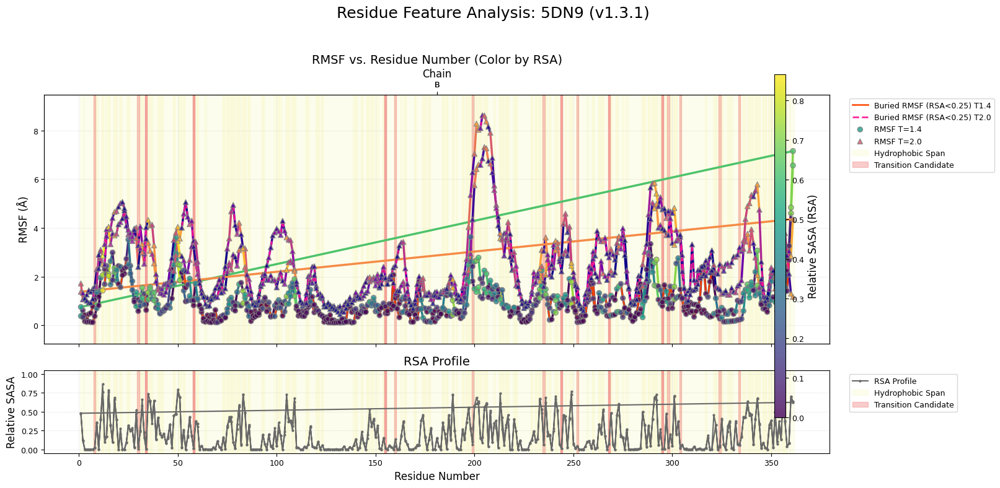


--- 5DN9 Transition Candidate 요약 ---
총 Transition Candidate 잔기 수: 22
Transition Candidate 잔기 목록 (Chain:ResidueNum ResName):
  A:34LEU
  A:58ILE
  A:155ILE
  A:199LEU
  A:235THR
  A:244LEU
  A:268ALA
  A:295TRP
  A:304ALA
  A:324ALA
  A:334PHE
  B:8TYR
  B:30ILE
  B:34LEU
  B:58ILE

Transition Candidate들의 주요 특성 평균값:
  - 평균 RSA: 0.030
  - 평균 hydro_SA_total: 1.676
  - 평균 RMSF1: 0.803
  - 평균 RMSF2: 3.013
  - 평균 delta_rmsf_T2_T1.4: 2.210
  - 평균 ca_bfactor: 9.300


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.1" # 컬러바 위치 수정

# === 전역 스타일 설정 (이전과 동일) ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 16,
    'axes.labelsize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'legend.title_fontsize': 11,
    'figure.titlesize': 18,
    'figure.dpi': 100
})

# === 데이터 로딩 및 전처리 함수 (v1.3.0과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    """v1.2.3에서 생성된 라벨링된 마스터 CSV를 로드하고 시각화에 필요한 데이터를 준비합니다."""
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: 라벨링된 마스터 CSV 파일 '{master_labeled_csv_path}'를 찾을 수 없습니다.")
        return None

    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: 마스터 CSV 파일 로드 중 - {e}")
        return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'is_transition_candidate_v1.2.3': 'is_tc', # v1.2.3 에서 생성된 컬럼명 가정
        'is_transition_candidate_v1.2.2': 'is_tc'  # 이전 버전 호환성
    }

    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns and 'is_transition_candidate' in df.columns:
        df = df.rename(columns={'is_transition_candidate': 'is_tc'})

    essential_plot_cols = ['residue', 'chain', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']
    missing_essential_cols = [col for col in essential_plot_cols if col not in df.columns]
    if missing_essential_cols:
        print(f"경고: 시각화 필수 컬럼 {missing_essential_cols} 없음.")

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: print("경고: 'is_tc' 컬럼 없음. Transition region 강조 불가."); df['is_tc'] = False

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median):
            df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
            print(f"소수성 잔기 분류 ('hydrophobic'): 'hydro_SA_total' > {hydro_sasa_median:.2f} (중앙값)")
        else: df['hydrophobic'] = False; print("경고: 'hydro_SA_total' 중앙값 계산 불가.")
    else: df['hydrophobic'] = False; print("경고: 'hydro_SA_total' 컬럼 없음.")

    df.sort_values(['chain', 'residue'], inplace=True, ignore_index=True)
    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (컬러바 위치 수정) ===
def plot_protein_features_with_transition_regions_v1_3_1(df: pd.DataFrame, pdb_id: str): # 버전 명시
    if df is None or df.empty:
        print(f"{pdb_id}에 대한 시각화 데이터가 없습니다."); return

    df_plot = df.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"{pdb_id}: 플롯할 유효한 RMSF/RSA 데이터가 없습니다."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot['is_tc'].to_numpy(dtype=bool)
    hydrophobic_plot = df_plot['hydrophobic'].to_numpy(dtype=bool)

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))

    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    chain_bounds = df.groupby('chain')['residue'].agg(['min','max'])
    chain_mid = (chain_bounds['min'] + chain_bounds['max']) / 2

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=2.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(16, 8), gridspec_kw={'height_ratios':[3,1]})
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} (v{SCRIPT_VERSION_V1_3})", fontsize=18, y=0.98)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)

    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=2.0, alpha=0.9, label=current_label)

    sc1_for_colorbar = None # 컬러바를 위해 scatter 객체 저장
    if np.any(np.isfinite(r1)):
        sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=35, label='RMSF T=1.4', zorder=3, alpha=0.8)
    if np.any(np.isfinite(r2)):
        ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=35, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.8)

    hydro_label_added = False
    for s,e in hydro_spans:
        ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans:
        ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True

    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]])
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=14)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(1.02, 1.0))

    if not chain_mid.empty:
        ax1_t = ax1.twiny(); ax1_t.set_xlim(ax1.get_xlim()); ax1_t.set_xticks(chain_mid.values)
        ax1_t.set_xticklabels(chain_mid.index, fontsize=9); ax1_t.set_xlabel('Chain', fontsize=12)

    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=4, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans:
        ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans:
        ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_xlabel('Residue Number'); ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=14)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper left', bbox_to_anchor=(1.02, 1.0))

    # --- 컬러바 위치 수정 ---
    # 컬러바를 오른쪽에 명시적으로 배치하기 위해 subplots_adjust와 함께 사용
    # 또는 fig.add_axes를 사용하여 컬러바용 축을 직접 만들 수 있음
    # 여기서는 가장 간단한 방법으로 fig.colorbar의 ax 인자를 리스트로 주고, tight_layout 조정
    if sc1_for_colorbar: # RMSF T=1.4의 산점도 객체를 컬러바 기준으로 사용
        # fig.subplots_adjust(right=0.85) # 컬러바와 범례를 위한 공간 확보
        cbar = fig.colorbar(sc1_for_colorbar, ax=[ax1, ax2], orientation='vertical', pad=0.02, aspect=30, shrink=0.9)
        cbar.set_label('Relative SASA (RSA)')
    elif lc1: # lc1 (RMSF T=1.4 라인 컬렉션)이 있으면 그것을 기준
        # fig.subplots_adjust(right=0.85)
        cbar = fig.colorbar(lc1, ax=[ax1, ax2], orientation='vertical', pad=0.02, aspect=30, shrink=0.9)
        cbar.set_label('Relative SASA (RSA for RMSF color)')

    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)

    # tight_layout을 호출하여 전체적인 레이아웃을 정리합니다.
    # 컬러바와 범례가 오른쪽에 있으므로, right 값을 조정하여 공간을 확보합니다.
    fig.tight_layout(rect=[0, 0, 0.88, 0.95]) # 오른쪽 여백을 12% (1.0 - 0.88) 확보

    plt.show()

# === 메인 실행 로직 (v1.3.1) ===
def main_v1_3_1(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")

    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5wr9): ").strip().lower()
    if not pdb_id_input:
        print("PDB ID가 입력되지 않았습니다. 종료합니다.")
        return

    # v1.2.3에서 생성된 라벨링된 마스터 CSV 파일 경로 예상
    # 사용자가 날짜를 직접 지정하거나, 가장 최근 파일을 찾는 로직 추가 가능
    # 여기서는 오늘 날짜 또는 일반적인 파일명으로 시도
    date_str_input = input(f"마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()

    if date_str_input:
        labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: # 날짜 입력 없으면 일반 파일명 시도
        labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"

    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        # 날짜 없는 파일도 한번 더 시도 (오늘 날짜 입력 안했을 경우 대비)
        if date_str_input: # 날짜를 입력했는데 못찾은 경우
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path):
                 print(f"경고: 날짜 태그({date_str_input})가 포함된 파일을 찾지 못했습니다. 날짜 없는 파일 '{fallback_path}'를 사용합니다.")
                 input_csv_path = fallback_path
             else:
                 print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다.")
                 return
        else: # 날짜 입력 안했고, 일반 파일명도 없는 경우
            print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다.")
            return


    df_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)

    if df_protein is not None and not df_protein.empty:
        plot_protein_features_with_transition_regions_v1_3_1(df_protein, pdb_id_input) # 수정된 함수 호출

        if 'is_tc' in df_protein.columns:
            tc_residues = df_protein[df_protein['is_tc'] == True]
            print(f"\n--- {pdb_id_input.upper()} Transition Candidate 요약 ---")
            print(f"총 Transition Candidate 잔기 수: {len(tc_residues)}")
            if not tc_residues.empty:
                print("Transition Candidate 잔기 목록 (Chain:ResidueNum ResName):")
                res_name_col_tc = None
                if 'residue_name_3L' in tc_residues.columns: res_name_col_tc = 'residue_name_3L'
                elif 'residue_name_1L' in tc_residues.columns: res_name_col_tc = 'residue_name_1L'
                if res_name_col_tc and all(c in tc_residues.columns for c in ['chain', 'residue']):
                    for _, row in tc_residues[['chain', 'residue', res_name_col_tc]].head(15).iterrows():
                        print(f"  {row['chain']}:{int(row['residue'])}{row[res_name_col_tc]}")
                else: print("  (잔기 목록 표시에 필요한 컬럼 부족)")
                print("\nTransition Candidate들의 주요 특성 평균값:")
                tc_cols_to_avg = ['RSA', 'hydro_SA_total', 'RMSF1', 'RMSF2', 'delta_rmsf_T2_T1.4', 'ca_bfactor']
                for col in tc_cols_to_avg:
                    if col in tc_residues.columns:
                        avg_val = pd.to_numeric(tc_residues[col], errors='coerce').mean()
                        if pd.notna(avg_val): print(f"  - 평균 {col}: {avg_val:.3f}")
                        else: print(f"  - 평균 {col}: 데이터 없음 또는 계산 불가")
    else:
        print("데이터프레임이 비어있거나 로드에 실패하여 시각화를 진행할 수 없습니다.")

if __name__ == "__main__":
    if not os.path.isdir(pdb_save_path):
        print(f"경고: pdb_save_path '{pdb_save_path}'가 유효한 디렉토리가 아닙니다. 현재 디렉토리를 사용합니다.")
        pdb_save_path = "."
    main_v1_3_1() # 수정된 main 함수 호출


##1.3.3

Chain separation

--- 단백질 특징 시각화 스크립트 v1.3.2 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dn9
마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: 20250527, 없으면 엔터): 20250527
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_labeled_data_20250527.csv' 로드 완료 (722 행, 22 열).
소수성 잔기 분류 ('hydrophobic'): 'hydro_SA_total' > 0.00 (중앙값)
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.

사용 가능한 체인 ID: ['A', 'B']
시각화할 체인 ID를 입력하세요 (예: A). 모든 체인을 순차적으로 보려면 'ALL' 또는 빈칸 입력: ALL

--- PDB: 5dn9, 체인: A 시각화 생성 중 ---


<ipython-input-24-dba320bc2fad>:182: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.92, 0.94]) # 오른쪽 여백 및 전체 제목 고려


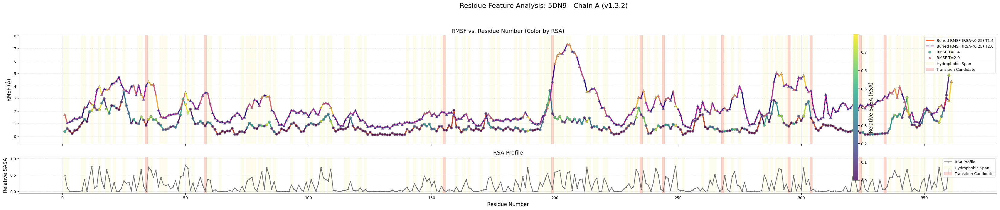


--- 5DN9 체인 A Transition Candidate 요약 ---
총 Transition Candidate 잔기 수: 11

--- PDB: 5dn9, 체인: B 시각화 생성 중 ---


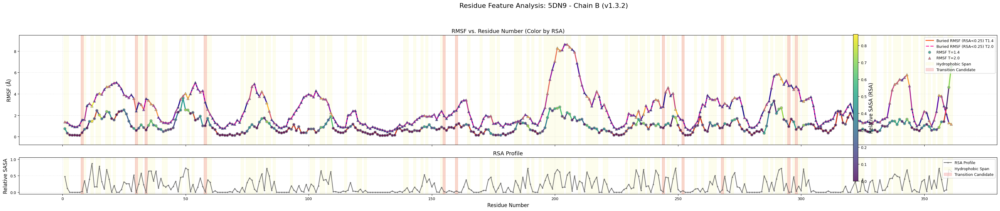


--- 5DN9 체인 B Transition Candidate 요약 ---
총 Transition Candidate 잔기 수: 11

모든 요청된 시각화 완료.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.2" # 체인별 그래프 분리 기능 추가

# === 전역 스타일 설정 (이전과 동일) ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 16,
    'axes.labelsize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'legend.title_fontsize': 11,
    'figure.titlesize': 18,
    'figure.dpi': 100
})

# === 데이터 로딩 및 전처리 함수 (v1.3.1과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    """v1.2.3 등에서 생성된 라벨링된 마스터 CSV를 로드하고 시각화에 필요한 데이터를 준비합니다."""
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: 라벨링된 마스터 CSV 파일 '{master_labeled_csv_path}'를 찾을 수 없습니다.")
        return None

    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: 마스터 CSV 파일 로드 중 - {e}")
        return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        # v1.2.3 또는 v1.2.2 등에서 생성된 Transition Candidate 라벨 컬럼명 확인 필요
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc'
    }

    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns: # 여러 버전의 컬럼명 시도
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'})
                break

    essential_plot_cols = ['residue', 'chain', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']
    missing_essential_cols = [col for col in essential_plot_cols if col not in df.columns]
    if missing_essential_cols:
        print(f"경고: 시각화 필수 컬럼 {missing_essential_cols} 없음.")

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: print("경고: 'is_tc' 컬럼 없음. Transition region 강조 불가."); df['is_tc'] = False

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median):
            df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
            print(f"소수성 잔기 분류 ('hydrophobic'): 'hydro_SA_total' > {hydro_sasa_median:.2f} (중앙값)")
        else: df['hydrophobic'] = False; print("경고: 'hydro_SA_total' 중앙값 계산 불가.")
    else: df['hydrophobic'] = False; print("경고: 'hydro_SA_total' 컬럼 없음.")

    # 체인별, 잔기번호 순 정렬은 시각화 함수에서 체인별 데이터프레임 생성 후 수행
    # df.sort_values(['chain', 'residue'], inplace=True, ignore_index=True)
    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (체인별 그래프 생성) ===
def plot_protein_features_for_chain_v1_3_2(df_chain: pd.DataFrame, pdb_id: str, chain_id: str):
    """특정 체인에 대한 특징 시각화를 생성합니다."""
    if df_chain is None or df_chain.empty:
        print(f"PDB {pdb_id}, 체인 {chain_id}에 대한 시각화 데이터가 없습니다."); return

    # 체인 내에서 잔기 번호 순으로 정렬
    df_chain = df_chain.sort_values('residue').reset_index(drop=True)

    # NaN 값을 포함할 수 있는 컬럼에 대해 유효한 데이터만 필터링하여 플롯 준비
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"PDB {pdb_id}, 체인 {chain_id}: 플롯할 유효한 RMSF/RSA 데이터가 없습니다."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot['is_tc'].to_numpy(dtype=bool) # is_tc는 df_chain에서 가져와야 함
    hydrophobic_plot = df_plot['hydrophobic'].to_numpy(dtype=bool) # hydrophobic도 df_chain에서

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot): # df_plot의 인덱스와 res를 사용
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))

    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot): # df_plot의 인덱스와 res를 사용
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=2.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(max(12, len(res)*0.1), 7), gridspec_kw={'height_ratios':[3,1]}) # figsize 조절
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=16, y=0.99)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)

    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=2.0, alpha=0.9, label=current_label)

    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)):
        sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=35, label='RMSF T=1.4', zorder=3, alpha=0.8)
    if np.any(np.isfinite(r2)):
        ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=35, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.8)

    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.3, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True

    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]])
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=13)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper right') # 범례 위치 조정 가능

    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=4, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.3, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_xlabel('Residue Number'); ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=13)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper right')

    if sc1_for_colorbar:
        cbar = fig.colorbar(sc1_for_colorbar, ax=fig.get_axes(), orientation='vertical', pad=0.02, aspect=30, shrink=0.9)
        cbar.set_label('Relative SASA (RSA)')

    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)
    fig.tight_layout(rect=[0, 0, 0.92, 0.94]) # 오른쪽 여백 및 전체 제목 고려
    plt.show()

# === 메인 실행 로직 (v1.3.2) ===
def main_v1_3_2(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path): # 날짜 없는 파일도 한번 더 시도
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path):
                 print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용.")
                 input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)

    if df_full_protein is None or df_full_protein.empty:
        print("데이터프레임이 비어있거나 로드에 실패하여 시각화를 진행할 수 없습니다.")
        return

    # 시각화할 체인 선택
    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID를 입력하세요 (예: A). 모든 체인을 순차적으로 보려면 'ALL' 또는 빈칸 입력: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL":
        chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains:
        chains_for_plotting = [chain_to_plot_input]
    else:
        print(f"경고: 입력하신 체인 ID '{chain_to_plot_input}'는 데이터에 없습니다. 사용 가능한 체인: {available_chains}")
        return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()

        if df_single_chain.empty:
            print(f"체인 {target_chain_id}에 대한 데이터가 없습니다.")
            continue

        plot_protein_features_for_chain_v1_3_2(df_single_chain, pdb_id_input, target_chain_id)

        # 체인별 Transition Candidate 요약 (선택적)
        if 'is_tc' in df_single_chain.columns:
            tc_residues_chain = df_single_chain[df_single_chain['is_tc'] == True]
            print(f"\n--- {pdb_id_input.upper()} 체인 {target_chain_id} Transition Candidate 요약 ---")
            print(f"총 Transition Candidate 잔기 수: {len(tc_residues_chain)}")
            if not tc_residues_chain.empty:
                # (이전과 유사한 요약 정보 출력 로직 추가 가능)
                pass
    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    if not os.path.isdir(pdb_save_path):
        print(f"경고: pdb_save_path '{pdb_save_path}'가 유효한 디렉토리가 아닙니다. 현재 디렉토리를 사용합니다.")
        pdb_save_path = "."
    main_v1_3_2()


**굵은 텍스트**##1.3.4
v1.3.3의 주요 변경점:

차트 크기 조절:
체인 길이에 따라 그래프 너비가 무한정 커지지 않도록 figsize의 너비 계산 로직을 수정했습니다. 잔기당 너비 증가율을 약간 줄이고, 최대 너비에도 제한을 두어 너무 긴 체인이라도 적절한 크기로 보이도록 했습니다. (figsize=(min(20, max(12, len(res)*0.08)), 7))
컬러바 위치 및 크기 조정:
컬러바가 그래프 데이터를 가리지 않도록, 플롯 영역의 오른쪽에 명확한 공간을 확보하고 그곳에 배치했습니다.
fig.colorbar() 호출 시 shrink와 aspect 파라미터를 사용하여 컬러바 자체의 크기를 조절하고, pad 값을 사용하여 주 플롯과의 간격을 설정했습니다.
fig.tight_layout(rect=[...])의 right 값을 조정하여 컬러바와 범례가 들어갈 충분한 오른쪽 여백을 확보했습니다.
아래는 수정된 v1.3.

--- 단백질 특징 시각화 스크립트 v1.3.4 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dn9
마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: 20250527, 없으면 엔터): 20250527
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_labeled_data_20250527.csv' 로드 완료 (722 행, 22 열).
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.

사용 가능한 체인 ID: ['A', 'B']
시각화할 체인 ID를 입력하세요 (예: A). 모든 체인을 순차적으로 보려면 'ALL' 또는 빈칸 입력: ALL

--- PDB: 5dn9, 체인: A 시각화 생성 중 ---


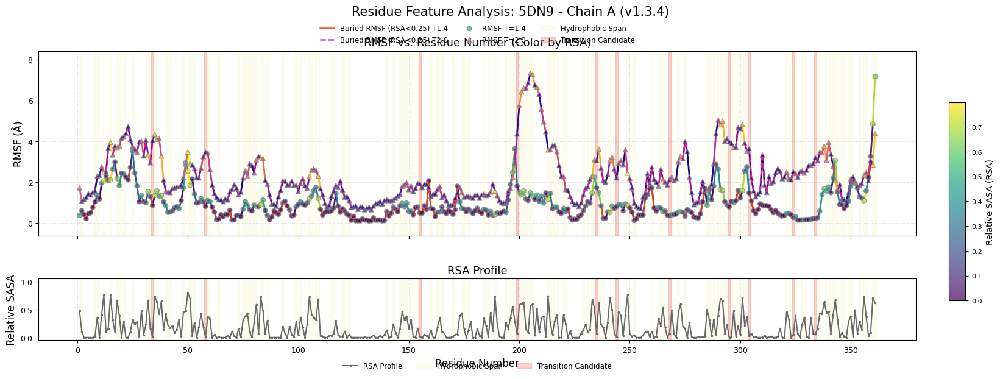


--- 5DN9 체인 A Transition Candidate 요약 ---
총 Transition Candidate 잔기 수: 11

--- PDB: 5dn9, 체인: B 시각화 생성 중 ---


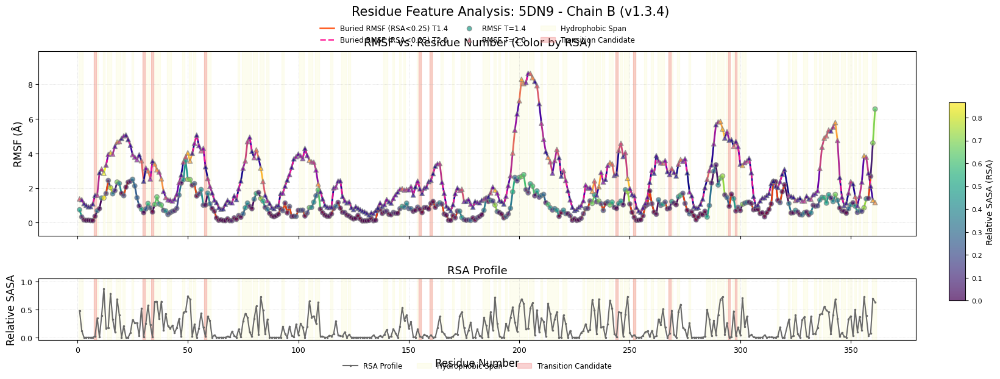


--- 5DN9 체인 B Transition Candidate 요약 ---
총 Transition Candidate 잔기 수: 11

모든 요청된 시각화 완료.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.4" # 범례 및 컬러바 위치 최종 조정

# === 전역 스타일 설정 (이전과 동일) ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 16,
    'axes.labelsize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 8, # 범례 폰트 약간 더 작게
    'legend.title_fontsize': 10,
    'figure.titlesize': 18,
    'figure.dpi': 100
})

# === 데이터 로딩 및 전처리 함수 (v1.3.3과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    """v1.2.3 등에서 생성된 라벨링된 마스터 CSV를 로드하고 시각화에 필요한 데이터를 준비합니다."""
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: 라벨링된 마스터 CSV 파일 '{master_labeled_csv_path}'를 찾을 수 없습니다.")
        return None

    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: 마스터 CSV 파일 로드 중 - {e}")
        return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc'
    }

    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break

    essential_plot_cols = ['residue', 'chain', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']
    missing_essential_cols = [col for col in essential_plot_cols if col not in df.columns]
    if missing_essential_cols: print(f"경고: 시각화 필수 컬럼 {missing_essential_cols} 없음.")

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: print("경고: 'is_tc' 컬럼 없음. Transition region 강조 불가."); df['is_tc'] = False

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median):
            df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
            # print(f"소수성 잔기 분류 ('hydrophobic'): 'hydro_SA_total' > {hydro_sasa_median:.2f} (중앙값)") # 출력 최소화
        else: df['hydrophobic'] = False; # print("경고: 'hydro_SA_total' 중앙값 계산 불가.")
    else: df['hydrophobic'] = False; # print("경고: 'hydro_SA_total' 컬럼 없음.")

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (범례 및 컬러바 위치 최종 조정) ===
def plot_protein_features_for_chain_v1_3_4(df_chain: pd.DataFrame, pdb_id: str, chain_id: str): # 버전 명시
    """특정 체인에 대한 특징 시각화를 생성합니다."""
    if df_chain is None or df_chain.empty:
        print(f"PDB {pdb_id}, 체인 {chain_id}에 대한 시각화 데이터가 없습니다."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"PDB {pdb_id}, 체인 {chain_id}: 플롯할 유효한 RMSF/RSA 데이터가 없습니다."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot['is_tc'].to_numpy(dtype=bool) # df_chain에서 가져와야 함
    hydrophobic_plot = df_plot['hydrophobic'].to_numpy(dtype=bool) # df_chain에서

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))

    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=2.0, zorder=2) # 선 두께 약간 줄임
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(18, max(10, len(res) * 0.07)) # 너비 조절
    fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(fig_width, 6.5), gridspec_kw={'height_ratios':[3,1]}) # 높이 약간 줄임
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=15, y=0.995)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)

    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (RSA<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.8, alpha=0.9, label=current_label)

    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)):
        sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=30, label='RMSF T=1.4', zorder=3, alpha=0.7)
    if np.any(np.isfinite(r2)):
        ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=30, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.7)

    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True

    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]])
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.15) # 상단 여백 확보
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=13)

    # --- ax1 범례: 그래프 위쪽 중앙에 배치 ---
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.18), ncol=min(3, len(by_label)), frameon=False, fontsize=8.5)


    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=3, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_xlabel('Residue Number'); ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=13)
    ax2.set_ylim(-0.05, 1.05)

    # --- ax2 범례: 그래프 아래쪽 중앙에 배치 ---
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=min(3, len(by_label2)), frameon=False, fontsize=8.5)

    # --- 컬러바: Figure의 오른쪽 중앙에 별도 축으로 배치 ---
    if sc1_for_colorbar:
        # [left, bottom, width, height] in figure coordinates
        # 이 값들은 fig.subplots_adjust와 함께 조정 필요
        # 컬러바를 그림의 오른쪽에 배치하고, 높이는 두 플롯의 중간 영역에 맞춤
        cbar_ax_rect = [0.90, 0.25, 0.015, 0.5] # left, bottom, width, height
        cax = fig.add_axes(cbar_ax_rect)
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax, orientation='vertical')
        cbar.set_label('Relative SASA (RSA)', size=10)
        cbar.ax.tick_params(labelsize=8)
    elif lc1: # sc1_for_colorbar가 None이고 lc1이 있을 경우 (라인 그래디언트만 있을 때)
        cbar_ax_rect = [0.90, 0.25, 0.015, 0.5]
        cax = fig.add_axes(cbar_ax_rect)
        cbar = fig.colorbar(lc1, cax=cax, orientation='vertical')
        cbar.set_label('Relative SASA (RSA for RMSF color)', size=10)
        cbar.ax.tick_params(labelsize=8)

    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.7)

    # 전체 레이아웃 조정 (범례와 컬러바 공간 확보)
    # right 값을 줄여서 오른쪽에 컬러바 공간을, top과 bottom을 조정하여 범례 공간 확보 0.35에서 0.25
    fig.subplots_adjust(left=0.07, right=0.87, bottom=0.15, top=0.88, hspace=0.25)

    plt.show()

# === 메인 실행 로직 (v1.3.4) ===
def main_v1_3_4(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path):
                 print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용.")
                 input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)

    if df_full_protein is None or df_full_protein.empty:
        print("데이터프레임이 비어있거나 로드에 실패하여 시각화를 진행할 수 없습니다.")
        return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID를 입력하세요 (예: A). 모든 체인을 순차적으로 보려면 'ALL' 또는 빈칸 입력: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력하신 체인 ID '{chain_to_plot_input}'는 데이터에 없습니다."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id}에 대한 데이터가 없습니다."); continue
        plot_protein_features_for_chain_v1_3_4(df_single_chain, pdb_id_input, target_chain_id) # 수정된 함수 호출

        if 'is_tc' in df_single_chain.columns:
            tc_residues_chain = df_single_chain[df_single_chain['is_tc'] == True]
            print(f"\n--- {pdb_id_input.upper()} 체인 {target_chain_id} Transition Candidate 요약 ---")
            print(f"총 Transition Candidate 잔기 수: {len(tc_residues_chain)}")
            # (요약 정보 출력 로직은 이전과 동일하게 유지 가능)
    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    if not os.path.isdir(pdb_save_path):
        print(f"경고: pdb_save_path '{pdb_save_path}'가 유효한 디렉토리가 아닙니다. 현재 디렉토리를 사용합니다.")
        pdb_save_path = "."
    main_v1_3_4() # 수정된 main 함수 호출


##1.3.5

--- 단백질 특징 시각화 스크립트 v1.3.5 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dn9
마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: 20250527, 없으면 엔터): 20250527
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_labeled_data_20250527.csv' 로드 완료 (722 행, 22 열).
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.

사용 가능한 체인 ID: ['A', 'B']
시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ALL

--- PDB: 5dn9, 체인: A 시각화 생성 중 ---


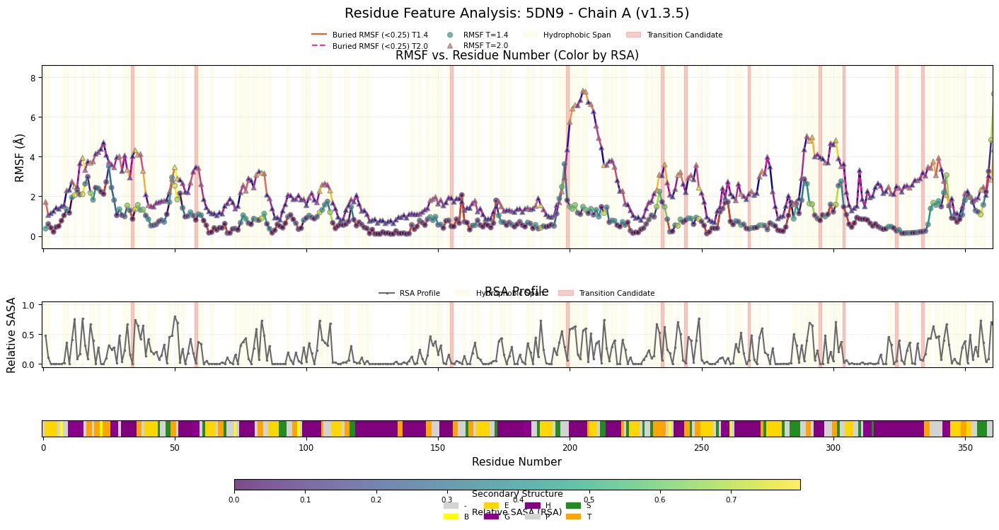


--- PDB: 5dn9, 체인: B 시각화 생성 중 ---


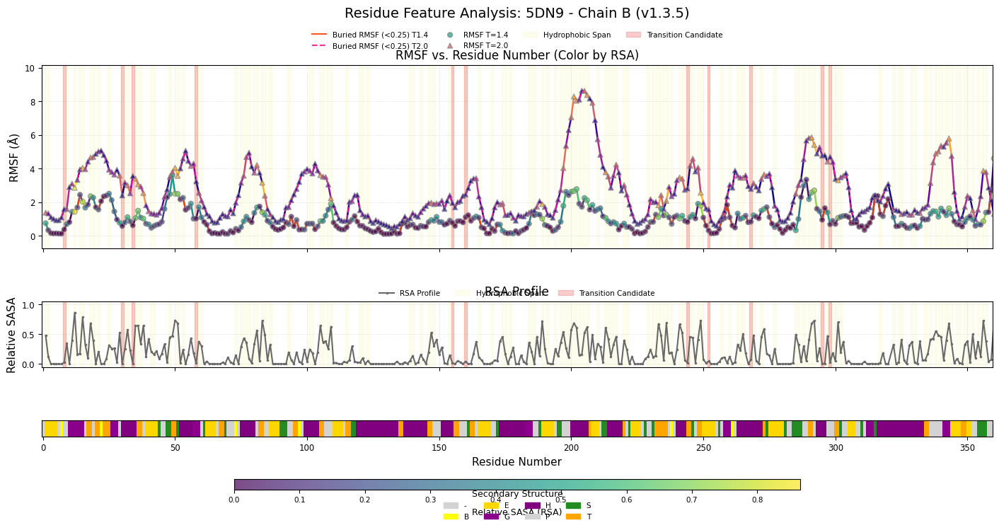


모든 요청된 시각화 완료.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.5" # 2차 구조 시각화 추가 및 레이아웃 최종 조정

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 14, # 약간 줄임
    'axes.labelsize': 11, # 약간 줄임
    'xtick.labelsize': 8.5,
    'ytick.labelsize': 8.5,
    'legend.fontsize': 7.5, # 범례 폰트 더 작게
    'legend.title_fontsize': 9,
    'figure.titlesize': 16, # 약간 줄임
    'figure.dpi': 100
})

# === 데이터 로딩 및 전처리 함수 ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss', # 2차 구조 컬럼 추가
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc'
    }
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break

    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False # print("경고: 'is_tc' 컬럼 없음.") # 출력 최소화

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (2차 구조 추가 및 레이아웃 최종 조정) ===
def plot_protein_features_for_chain_v1_3_5(df_chain: pd.DataFrame, pdb_id: str, chain_id: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy() # ss는 NaN 허용 후 처리
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy() # NaN은 Coil로

    # --- 구간 식별 ---
    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    # --- 2차 구조 색상 및 매핑 정의 (사용자 이미지 참고) ---
    ss_color_map = {
        'H': 'purple',  # Helix (Alpha helix)
        'E': 'gold',    # Strand (Extended strand)
        'T': 'orange',  # Turn
        'G': 'darkmagenta', # 3-10 Helix (H와 유사 계열)
        'I': 'mediumvioletred',# Pi Helix (H와 유사 계열)
        'B': 'yellow',  # Beta Bridge (E와 유사 계열)
        'S': 'forestgreen',   # Bend (T와 유사 계열 또는 별도)
        ' ': 'lightgrey',# Coil/Loop/Irregular
        '-': 'lightgrey' # DSSP에서 '-'도 Coil/Loop
    }
    # 실제 데이터에 있는 SS 코드만 사용
    unique_ss_codes_in_data = sorted(list(set(ss_plot)))
    active_ss_color_map = {code: ss_color_map.get(code.strip(), 'lightgrey') for code in unique_ss_codes_in_data}


    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.8, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(16, max(10, len(res) * 0.065)) # 너비 조정
    fig_height = 7.5 # 2차 구조 및 범례 공간 고려하여 높이 조정

    # --- 3개 패널 생성 (RMSF, RSA, Secondary Structure) ---
    fig, (ax1, ax2, ax_ss) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 1, 0.25]} # 높이 비율 조정
    )
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=14, y=0.99)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    # --- ax1: RMSF 플롯 ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=25, label='RMSF T=1.4', zorder=3, alpha=0.7)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=25, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.7)
    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True
    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.18)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=12)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.22), ncol=min(4, len(by_label)), frameon=False)
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.6)

    # --- ax2: RSA 프로파일 ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=3, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=12)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.28), ncol=min(3, len(by_label2)), frameon=False)
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.6)

    # --- ax_ss: 2차 구조 막대 ---
    if 'ss' in df_plot.columns and len(ss_plot) > 0:
        # pcolormesh를 위한 데이터 준비
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), ss_int_map.get(' ', len(ss_int_map)-1)) for s in ss_plot])

        custom_cmap_colors = list(active_ss_color_map.values())
        custom_cmap = mpl.colors.ListedColormap(custom_cmap_colors)
        norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(active_ss_color_map)-1)

        x_boundaries = np.arange(len(res) + 1) - 0.5 # 각 잔기 막대의 경계
        y_boundaries = np.array([0, 1]) # 막대 높이 (상대적)
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=custom_cmap, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1])
        ax_ss.set_ylim(0,1)
        ax_ss.set_yticks([])
        ax_ss.set_xlabel("Residue Number") # 맨 아래 플롯이므로 X축 레이블 표시
        ax_ss.tick_params(axis='x', which='major', labelsize=8.5)

        # 2차 구조 범례 (그림 하단 중앙)
        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items()]
        fig.legend(handles=ss_legend_handles, title="Secondary Structure", loc='lower center',
                   bbox_to_anchor=(0.5, 0.01), ncol=min(4, len(ss_legend_handles)+1), frameon=False, title_fontsize=9, fontsize=7.5)
    else:
        ax_ss.axis('off') # SS 데이터 없으면 축 숨김

    # --- RSA 컬러바: 그림 하단에 수평으로 배치 (2차 구조 범례 위) ---
    if sc1_for_colorbar:
        cbar_height = 0.020 # 컬러바 두께
        cbar_bottom_margin = 0.08 # 2차 구조 범례를 위한 공간 + 컬러바 자체 공간
        cax_colorbar = fig.add_axes([0.25, cbar_bottom_margin, 0.5, cbar_height]) # left, bottom, width, height
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='horizontal')
        cbar.set_label('Relative SASA (RSA)', size=9)
        cbar.ax.tick_params(labelsize=7.5)
        # 컬러바 틱 위치 조절 (선택적)
        # cbar.set_ticks(np.linspace(np.nanmin(rsa), np.nanmax(rsa), 5))
        # cbar.ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))

    # 전체 레이아웃 조정
    fig.subplots_adjust(left=0.08, right=0.92, bottom=0.18 if sc1_for_colorbar else 0.12 , top=0.88, hspace=0.6) # hspace 증가, bottom 증가

    plt.show()

# === 메인 실행 로직 (v1.3.5) ===
def main_v1_3_5(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그를 입력하세요 (YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path):
                 print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용.")
                 input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_5(df_single_chain, pdb_id_input, target_chain_id) # 수정된 함수 호출

        # (체인별 요약 정보 출력은 생략 또는 필요시 추가)
    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    # 전역 변수 pdb_save_path 정의 (사용자 환경에 맞게 수정 필요)
    pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025' # 예시: 현재 디렉토리
    # pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results' # Colab 예시
    if not os.path.isdir(pdb_save_path):
        print(f"경고: pdb_save_path '{pdb_save_path}'가 유효한 디렉토리가 아님. 현재 디렉토리 사용 시도.")
        pdb_save_path = "."
    main_v1_3_5()


##1.3.7

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.7" # 범례 및 컬러바 위치 최종 최적화

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9, # 전체적인 가독성을 위해 약간 더 조정
    'axes.titlesize': 13,
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7,
    'legend.title_fontsize': 8.5,
    'figure.titlesize': 15,
    'figure.dpi': 150
})

# === 데이터 로딩 및 전처리 함수 (v1.3.6과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc'
    }
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break

    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (범례 및 컬러바 위치 최종 조정) ===
def plot_protein_features_for_chain_v1_3_7(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, output_dir: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy()

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#FF69B4', 'E': '#FFD700', 'T': '#FFA500', 'G': '#E066FF',
        'I': '#DA70D6', 'B': '#FFFF00', 'S': '#7FFF00',
        ' ': '#D3D3D3', '-': '#D3D3D3' # 밝은 회색으로 변경
    } # 색상 예시 (사용자 이미지와 다를 수 있음, 필요시 조정)
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s.strip()))) # 공백 제외하고 고유 코드
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}


    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2) # 선 두께
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06)) # 너비 조정
    fig_height = 7.0 # 높이 고정 (범례 공간 고려)

    fig, (ax1, ax2, ax_ss) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 1, 0.20]} # 2차 구조 패널 높이 약간 줄임
    )
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=13, y=0.99)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)

    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True

    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.22) # 상단 여백 확보
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=min(4, len(by_label)), frameon=False, fontsize=7)
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightyellow', alpha=0.4, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.4, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=min(3, len(by_label2)), frameon=False, fontsize=7)
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot]) # 없는 코드는 마지막 다음 인덱스

        cmap_colors_list = list(active_ss_color_map.values())
        if len(ss_int_map) < len(active_ss_color_map): # ss_int_map에 없는 코드가 active_ss_color_map에 있을 경우 대비
             cmap_colors_list = [active_ss_color_map[code] for code in ss_int_map.keys()]

        if len(cmap_colors_list) == 0 : # active_ss_color_map이 비었을 경우
            cmap_ss = plt.get_cmap('tab10') # 기본 cmap
            norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1) )
        else:
            cmap_ss = mpl.colors.ListedColormap(cmap_colors_list)
            norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(active_ss_color_map)-1)


        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.set_xlabel("Residue Number")
        ax_ss.tick_params(axis='x', which='major', labelsize=8)

        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()] # 공백 라벨 제외
        if ss_legend_handles:
            fig.legend(handles=ss_legend_handles, title="Secondary Structure", loc='lower center',
                       bbox_to_anchor=(0.5, 0.01), ncol=min(4, len(ss_legend_handles)), frameon=False, title_fontsize=8, fontsize=7)
    else: ax_ss.axis('off')

    # RSA 컬러바: 그림 하단 중앙, 2차 구조 범례 위에 수평으로 배치
    if sc1_for_colorbar:
        cbar_height = 0.018
        cbar_bottom_y = 0.10 # 2차 구조 범례를 위한 공간 + 컬러바 자체 공간 + 약간의 패딩
        if not ss_legend_handles: cbar_bottom_y = 0.05 # SS 범례 없으면 더 아래로

        cax_colorbar = fig.add_axes([0.25, cbar_bottom_y, 0.5, cbar_height]) # left, bottom, width, height
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='horizontal')
        cbar.set_label('Relative SASA (RSA)', size=8.5)
        cbar.ax.tick_params(labelsize=7)
        cbar.outline.set_linewidth(0.5)


    # 전체 레이아웃 조정
    # bottom 값은 컬러바와 SS 범례 공간에 따라 동적으로 조절
    bottom_margin = 0.15
    if sc1_for_colorbar: bottom_margin += 0.05 # 컬러바 공간
    if ss_legend_handles: bottom_margin += 0.05 # SS 범례 공간

    fig.subplots_adjust(left=0.08, right=0.92, bottom=bottom_margin, top=0.86, hspace=0.65) # hspace 증가

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_plot_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200, bbox_inches='tight')
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")
    plt.show()

# === 메인 실행 로직 (v1.3.7) ===
def main_v1_3_7(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input)
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename) # 마스터 CSV는 기본 저장 경로에서 찾음

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path): print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용."); input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_7(df_single_chain, pdb_id_input, target_chain_id, pdb_specific_output_dir) # 수정된 함수 호출

    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    # 전역 변수 pdb_save_path 정의 (사용자 환경에 맞게 수정 필요)
    # pdb_save_path = './' # 예시: 현재 디렉토리
    pdb_save_path_global = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025' # Colab 예시
    if not os.path.isdir(pdb_save_path_global):
        print(f"경고: pdb_save_path '{pdb_save_path_global}'가 유효한 디렉토리가 아님. 현재 디렉토리 사용 시도.")
        pdb_save_path_global = "."
    # 스크립트 상단의 pdb_save_path가 이 값을 사용하도록 합니다.
    pdb_save_path = pdb_save_path_global
    main_v1_3_7()


--- 단백질 특징 시각화 스크립트 v1.3.7 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dni
PDB ID별 결과 폴더 생성: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dni'
마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: 20250528, 없으면 엔터): 20250528
오류: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dni_master_labeled_data_20250528.csv' 또는 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dni_master_labeled_data.csv' 파일을 찾을 수 없습니다.


##1.3.8

--- 단백질 특징 시각화 스크립트 v1.3.8 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dn9
마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: 20250528, 없으면 엔터): 20250528
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_labeled_data_20250528.csv' 로드 완료 (722 행, 23 열).
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.

사용 가능한 체인 ID: ['A', 'B']
시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ALL

--- PDB: 5dn9, 체인: A 시각화 생성 중 ---
  그래프 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9/5dn9_chain_A_features_plot_v1_3_8.png'


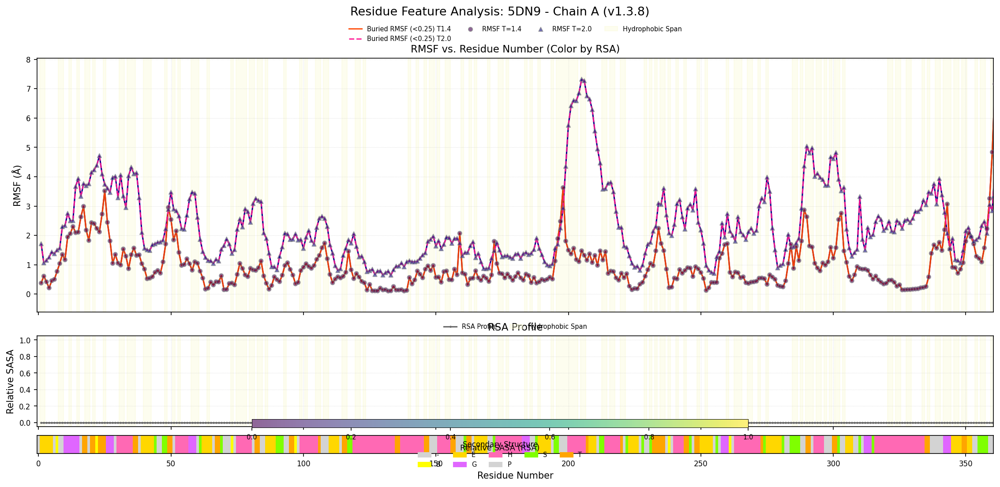


--- PDB: 5dn9, 체인: B 시각화 생성 중 ---
  그래프 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9/5dn9_chain_B_features_plot_v1_3_8.png'


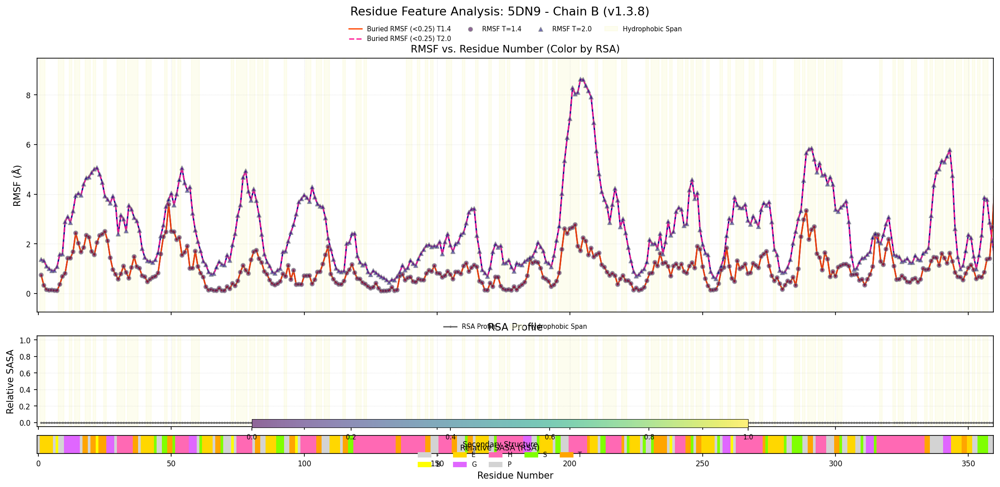


모든 요청된 시각화 완료.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.8" # constrained_layout 사용 및 plt.close(fig) 추가

# === 전역 스타일 설정 (이전과 동일) ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9,
    'axes.titlesize': 13,
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7,
    'legend.title_fontsize': 8.5,
    'figure.titlesize': 15,
    'figure.dpi': 150
})

# === 데이터 로딩 및 전처리 함수 (v1.3.7과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc',
        'is_transition_candidate_v1.2.X': 'is_tc' # 혹시 다른 버전의 컬럼명도 고려
    }

    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2', 'is_transition_candidate_v1.2.X']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break

    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (constrained_layout 및 plt.close 추가) ===
def plot_protein_features_for_chain_v1_3_8(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, output_dir: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy()

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#FF69B4', 'E': '#FFD700', 'T': '#FFA500', 'G': '#E066FF',
        'I': '#DA70D6', 'B': '#FFFF00', 'S': '#7FFF00',
        ' ': '#D3D3D3', '-': '#D3D3D3'
    }
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s.strip())))
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06))
    fig_height = 7.0

    fig, (ax1, ax2, ax_ss) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 1, 0.20]},
        constrained_layout=True # 자동 레이아웃 조정 활성화
    )
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=13, y=1.03) # y 값 조정

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)

    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True

    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1) # 범례 공간 위해 상단 여백 줄임
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=min(4, len(by_label)), frameon=False, fontsize=7) # y 위치 조정
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.20), ncol=min(3, len(by_label2)), frameon=False, fontsize=7) # y 위치 조정
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot])
        cmap_colors_list = list(active_ss_color_map.values())
        if not cmap_colors_list: cmap_ss = plt.get_cmap('tab10'); norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1))
        else: cmap_ss = mpl.colors.ListedColormap(cmap_colors_list); norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(active_ss_color_map)-1)
        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.set_xlabel("Residue Number")
        ax_ss.tick_params(axis='x', which='major', labelsize=8)
        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()]
        if ss_legend_handles:
            fig.legend(handles=ss_legend_handles, title="Secondary Structure", loc='lower center',
                       bbox_to_anchor=(0.5, 0.02), ncol=min(5, len(ss_legend_handles)), frameon=False, title_fontsize=8, fontsize=7) # ncol 증가
    else: ax_ss.axis('off')

    if sc1_for_colorbar:
        cbar_height = 0.018
        cbar_bottom_y = 0.12
        if not ss_legend_handles: cbar_bottom_y = 0.06
        cax_colorbar = fig.add_axes([0.25, cbar_bottom_y, 0.5, cbar_height])
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='horizontal')
        cbar.set_label('Relative SASA (RSA)', size=8.5)
        cbar.ax.tick_params(labelsize=7)
        cbar.outline.set_linewidth(0.5)

    # constrained_layout=True가 subplots_adjust와 함께 사용될 때 충돌할 수 있으므로,
    # constrained_layout을 우선하고, 필요한 경우 fig.tight_layout(pad=...) 사용 또는
    # subplots_adjust를 사용한다면 constrained_layout=False로 설정.
    # 여기서는 constrained_layout=True를 사용했으므로 subplots_adjust는 제거.
    # fig.subplots_adjust(left=0.08, right=0.92, bottom=bottom_margin, top=0.86, hspace=0.65)

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_plot_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200) # bbox_inches='tight'는 constrained_layout과 함께 사용 시 주의
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")
    plt.show()
    plt.close(fig) # Figure 객체 닫기

# === 메인 실행 로직 (v1.3.8) ===
def main_v1_3_8(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input)
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path): print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용."); input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_8(df_single_chain, pdb_id_input, target_chain_id, pdb_specific_output_dir) # 수정된 함수 호출

    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    pdb_save_path_global = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
    if not os.path.isdir(pdb_save_path_global):
        print(f"경고: pdb_save_path '{pdb_save_path_global}'가 유효한 디렉토리가 아님. 현재 디렉토리 사용 시도.")
        pdb_save_path_global = "."
    pdb_save_path = pdb_save_path_global
    main_v1_3_8()


##1.3.10

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.10" # 2차 구조 플롯을 RMSF 플롯 아래로 이동

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9,
    'axes.titlesize': 12, # 서브플롯 제목 크기 조정
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 6.5,
    'legend.title_fontsize': 8,
    'figure.titlesize': 14,
    'figure.dpi': 150
})

# === 데이터 로딩 및 전처리 함수 (v1.3.9와 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc',
        'is_transition_candidate_v1.2.X': 'is_tc'
    }
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2', 'is_transition_candidate_v1.2.X']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break
    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")
    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')
    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False
    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False
    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (2차 구조 플롯 위치 변경) ===
def plot_protein_features_for_chain_v1_3_10(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, output_dir: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy()

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#FF69B4', 'E': '#FFD700', 'T': '#FFA500', 'G': '#E066FF',
        'I': '#DA70D6', 'B': '#FFFF00', 'S': '#7FFF00',
        ' ': '#D3D3D3', '-': '#D3D3D3'
    }
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s.strip())))
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06))
    fig_height = 7.0

    # --- 서브플롯 순서 변경: RMSF, 2차구조, RSA ---
    fig, (ax1, ax_ss, ax2) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 0.15, 1]}, # ax_ss 높이 매우 작게
        constrained_layout=True
    )
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=13, y=1.03)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    # --- ax1: RMSF 플롯 ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)
    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True
    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper right', frameon=False, fontsize=6.5) # 내부 오른쪽 상단
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
    ax1.tick_params(labelbottom=False) # ax_ss와 x축 공유하므로 ax1의 x축 라벨 숨김

    # --- ax_ss: 2차 구조 막대 ---
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot])
        cmap_colors_list = list(active_ss_color_map.values())
        if not cmap_colors_list: cmap_ss = plt.get_cmap('tab10'); norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1))
        else: cmap_ss = mpl.colors.ListedColormap(cmap_colors_list); norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(active_ss_color_map)-1)
        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.tick_params(labelbottom=False) # ax2와 x축 공유하므로 ax_ss의 x축 라벨 숨김
        # 2차 구조 범례는 그림 하단으로 이동
    else: ax_ss.axis('off')

    # --- ax2: RSA 프로파일 ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper right', frameon=False, fontsize=6.5) # 내부 오른쪽 상단
    ax2.set_xlabel("Residue Number") # 가장 아래 플롯이므로 X축 레이블 표시
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    # --- 범례 및 컬러바 최종 배치 ---
    # 2차 구조 범례
    if ss_legend_handles := [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()]:
        fig.legend(handles=ss_legend_handles, title="Secondary Structure", loc='lower center',
                   bbox_to_anchor=(0.5, 0.01), ncol=min(6, len(ss_legend_handles)), frameon=False, title_fontsize=8, fontsize=6.5)
    # RSA 컬러바
    if sc1_for_colorbar:
        cbar_height = 0.018
        cbar_bottom_y = 0.08 # 2차 구조 범례 위로 조정
        if not ss_legend_handles: cbar_bottom_y = 0.03
        cax_colorbar = fig.add_axes([0.25, cbar_bottom_y, 0.5, cbar_height])
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='horizontal')
        cbar.set_label('Relative SASA (RSA)', size=8)
        cbar.ax.tick_params(labelsize=6.5); cbar.outline.set_linewidth(0.5)

    # constrained_layout=True가 이미 적용되었으므로, subplots_adjust는 보통 필요 없음
    # fig.subplots_adjust(...)

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_plot_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200)
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")
    plt.show()
    plt.close(fig)

# === 메인 실행 로직 (v1.3.10) ===
def main_v1_3_10(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input)
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path): print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용."); input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_10(df_single_chain, pdb_id_input, target_chain_id, pdb_specific_output_dir) # 수정된 함수 호출

    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    pdb_save_path_global = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
    if not os.path.isdir(pdb_save_path_global):
        print(f"경고: pdb_save_path '{pdb_save_path_global}'가 유효한 디렉토리가 아님. 현재 디렉토리 사용 시도.")
        pdb_save_path_global = "."
    pdb_save_path = pdb_save_path_global
    main_v1_3_10()


--- 단백질 특징 시각화 스크립트 v1.3.10 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 4cha
마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: 20250605, 없으면 엔터): 20250605
오류: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha_master_labeled_data_20250605.csv' 또는 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/4cha_master_labeled_data.csv' 파일을 찾을 수 없습니다.


#1.3.11 current
배치 완료

--- 단백질 특징 시각화 스크립트 v1.3.11 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dn9
마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: 20250610, 없으면 엔터): 20250529
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_all_labels_20250529.csv' 로드 완료 (722 행, 48 열).
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.

사용 가능한 체인 ID: ['A', 'B']
시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ALL

--- PDB: 5dn9, 체인: A 시각화 생성 중 ---
  그래프 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9/5dn9_chain_A_features_plot_v1_3_11.png'


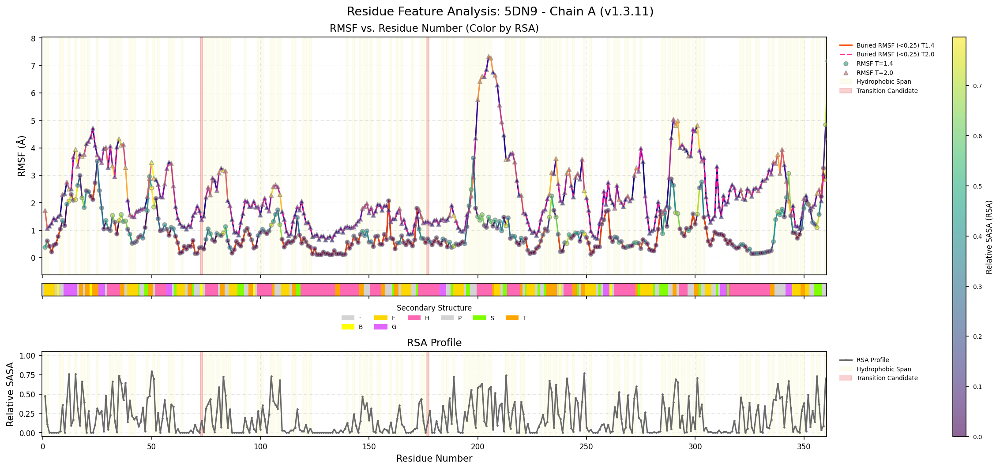


--- PDB: 5dn9, 체인: B 시각화 생성 중 ---
  그래프 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9/5dn9_chain_B_features_plot_v1_3_11.png'


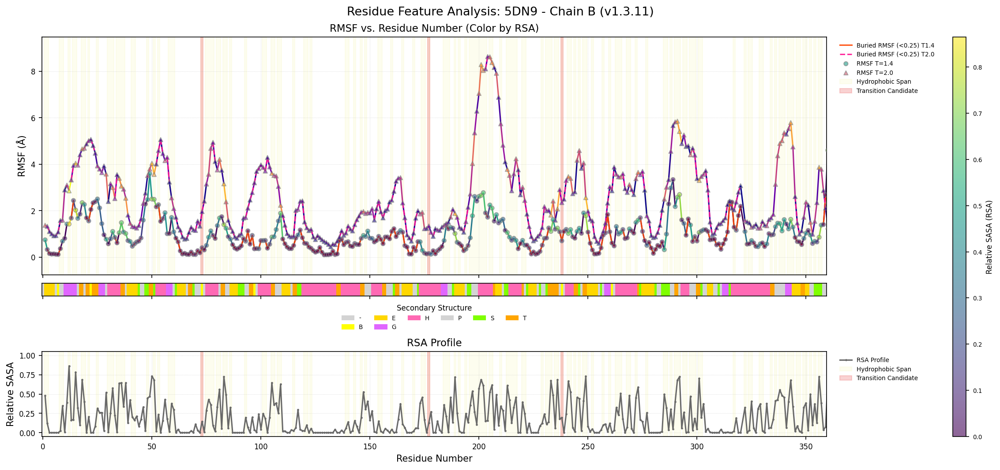


모든 요청된 시각화 완료.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.11" # 범례 및 컬러바 위치 정교화

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 6.5,
    'legend.title_fontsize': 8,
    'figure.titlesize': 14,
    'figure.dpi': 150
})

# === 데이터 로딩 및 전처리 함수 (v1.3.10과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc',
        'is_transition_candidate_v1.2.X': 'is_tc'
    }
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2', 'is_transition_candidate_v1.2.X']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break
    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")
    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')
    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False
    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False
    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (범례 및 컬러바 위치 정교화) ===
def plot_protein_features_for_chain_v1_3_11(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, output_dir: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy()

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#FF69B4', 'E': '#FFD700', 'T': '#FFA500', 'G': '#E066FF',
        'I': '#DA70D6', 'B': '#FFFF00', 'S': '#7FFF00',
        ' ': '#D3D3D3', '-': '#D3D3D3'
    }
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s.strip())))
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06))
    fig_height = 7.0


    fig, (ax1, ax_ss, ax2) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 0.15, 1]},
        constrained_layout=True          # ← 자동 여백 조정!
    )
    '''
    fig, (ax1, ax_ss, ax2) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 0.15, 1]}
        # constrained_layout=True # subplots_adjust와 함께 사용 시 주의, 여기서는 subplots_adjust 사용
    )
    '''
    # 전체 제목은 subplots_adjust로 top 공간 확보 후 설정
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=13)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    # --- ax1: RMSF 플롯 ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)
    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True
    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    # RMSF 범례: 플롯 오른쪽 바깥 상단
    ax1.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(1.01, 1.0), frameon=False, fontsize=6.5)
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
    ax1.tick_params(labelbottom=False)

    # --- ax_ss: 2차 구조 막대 ---
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot])
        cmap_colors_list = list(active_ss_color_map.values())
        if not cmap_colors_list: cmap_ss = plt.get_cmap('tab10'); norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1))
        else: cmap_ss = mpl.colors.ListedColormap(cmap_colors_list); norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(active_ss_color_map)-1)
        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.tick_params(labelbottom=False)
        # 2차 구조 범례는 ax_ss 바로 아래에 배치
        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()]
        if ss_legend_handles:
            ax_ss.legend(handles=ss_legend_handles, title="Secondary Structure", loc='upper center',
                         bbox_to_anchor=(0.5, -0.2), ncol=min(6, len(ss_legend_handles)), frameon=False, title_fontsize=8, fontsize=6.5)
    else: ax_ss.axis('off')

    # --- ax2: RSA 프로파일 ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    # RSA 범례: 플롯 오른쪽 바깥 상단
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper left', bbox_to_anchor=(1.01, 1.0), frameon=False, fontsize=6.5)
    ax2.set_xlabel("Residue Number")
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
    '''
    # --- RSA 컬러바: 그림의 가장 오른쪽에 세로로 배치 ---
    if sc1_for_colorbar:
        # 컬러바를 위한 새 축 위치: [left, bottom, width, height]
        # right=0.88로 조정했으므로, left는 0.89 또는 0.90부터 시작 가능
        cbar_left_margin = 0.90
        cbar_width = 0.015
        # ax1과 ax2의 높이를 고려하여 컬러바 높이 설정 (대략적으로 중앙 정렬)
        pos1 = ax1.get_position() # [left, bottom, width, height]
        pos2 = ax2.get_position()
        cbar_bottom = pos2.y0
        cbar_top = pos1.y0 + pos1.height
        cbar_ax_rect = [cbar_left_margin, cbar_bottom, cbar_width, cbar_top - cbar_bottom]

        cax_colorbar = fig.add_axes(cbar_ax_rect)
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='vertical')
        cbar.set_label('Relative SASA (RSA)', size=8)
        cbar.ax.tick_params(labelsize=4.0); cbar.outline.set_linewidth(0.5) #labelsiz = color bar
    '''
    # --- RSA 컬러바: constrained_layout 안에서 자동 정렬 ---
    if sc1_for_colorbar:
        cbar = fig.colorbar(sc1_for_colorbar,
        ax=[ax1, ax2],       # 두 축 모두 기준
        location='right',
        pad=0.02,            # 축과 컬러바 사이 여백
        aspect=30)
        cbar.set_label('Relative SASA (RSA)', size=8)
        cbar.ax.tick_params(labelsize=6.5)


    ## 전체 레이아웃 조정 (constrained_layout=True 대신 사용)
    # fig.subplots_adjust(left=0.08, right=0.88, bottom=0.1, top=0.90, hspace=0.5) # hspace 증가, top 감소, bottom 증가

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_plot_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200)
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")

# ... df_plot 생성 후 디버깅 코드...
    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()

    # DEBUG PRINT START - 체인 C 또는 F일 때 이 부분을 실행시켜 값 확인
    if chain_id in ['C', 'F']:
        print(f"\n--- Debugging plot data for Chain {chain_id} ---")
        print(f"Number of residues (len(res)): {len(res)}")
        if len(res) > 0:
            print(f"Residue range: {np.min(res)} - {np.max(res)}")

        # RMSF1 (r1)
        print(f"len(r1): {len(r1)}")
        if np.any(np.isfinite(r1)):
            print(f"RMSF1 (r1) finite values: min={np.nanmin(r1[np.isfinite(r1)])}, max={np.nanmax(r1[np.isfinite(r1)])}, mean={np.nanmean(r1[np.isfinite(r1)])}")
            print(f"Are all r1 values the same? {len(np.unique(r1[np.isfinite(r1)])) <= 1}")
        else:
            print("RMSF1 (r1) has no finite values.")
        print(f"NaNs in r1: {np.isnan(r1).sum()}")

        # RMSF2 (r2)
        print(f"len(r2): {len(r2)}")
        if np.any(np.isfinite(r2)):
            print(f"RMSF2 (r2) finite values: min={np.nanmin(r2[np.isfinite(r2)])}, max={np.nanmax(r2[np.isfinite(r2)])}, mean={np.nanmean(r2[np.isfinite(r2)])}")
            print(f"Are all r2 values the same? {len(np.unique(r2[np.isfinite(r2)])) <= 1}")
        else:
            print("RMSF2 (r2) has no finite values.")
        print(f"NaNs in r2: {np.isnan(r2).sum()}")

        # RSA (rsa)
        print(f"len(rsa): {len(rsa)}")
        if np.any(np.isfinite(rsa)):
            print(f"RSA (rsa) finite values: min={np.nanmin(rsa[np.isfinite(rsa)])}, max={np.nanmax(rsa[np.isfinite(rsa)])}, mean={np.nanmean(rsa[np.isfinite(rsa)])}")
            print(f"Are all rsa values the same? {len(np.unique(rsa[np.isfinite(rsa)])) <= 1}")
        else:
            print("RSA (rsa) has no finite values.")
        print(f"NaNs in rsa: {np.isnan(rsa).sum()}")

        rsa_min_val_debug, rsa_max_val_debug = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
        if rsa_min_val_debug == rsa_max_val_debug: rsa_min_val_debug, rsa_max_val_debug = 0, 1
        print(f"rsa_min_val for colorbar: {rsa_min_val_debug}, rsa_max_val for colorbar: {rsa_max_val_debug}")

        # Calculated Y limits for ax1
        if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
            valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]])
            if len(valid_r_values) > 0:
                ymin_calc, ymax_calc = np.min(valid_r_values), np.max(valid_r_values)
                print(f"Calculated y_lim for ax1: ({ymin_calc - (ymax_calc-ymin_calc)*0.1}, {ymax_calc + (ymax_calc-ymin_calc)*0.1})")
                if ymin_calc == ymax_calc:
                    print("WARNING: All valid RMSF values are identical for ax1 y-limits!")
            else:
                print("No valid R values for ax1 y-limits.")
        else:
            print("No finite r1 or r2 values for ax1 y-limits.")
        print(f"--- End Debugging plot data for Chain {chain_id} ---\n")
    # DEBUG PRINT END


    plt.show()
    plt.close(fig)

# === 메인 실행 로직 (v1.3.11) ===
def main_v1_3_11(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input)
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_all_labels_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path): print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용."); input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_11(df_single_chain, pdb_id_input, target_chain_id, pdb_specific_output_dir) # 수정된 함수 호출

    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    pdb_save_path_global = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
    if not os.path.isdir(pdb_save_path_global):
        print(f"경고: pdb_save_path '{pdb_save_path_global}'가 유효한 디렉토리가 아님. 현재 디렉토리 사용 시도.")
        pdb_save_path_global = "."
    pdb_save_path = pdb_save_path_global
    main_v1_3_11()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.11" # 범례 및 컬러바 위치 정교화

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 6.5,
    'legend.title_fontsize': 8,
    'figure.titlesize': 14,
    'figure.dpi': 150
})

# === 데이터 로딩 및 전처리 함수 (v1.3.10과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
        'is_transition_candidate_v1.2.3': 'is_tc',
        'is_transition_candidate_v1.2.2': 'is_tc',
        'is_transition_candidate_v1.2.X': 'is_tc'
    }
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns:
        possible_tc_cols = ['is_transition_candidate', 'is_transition_candidate_v1.2.3', 'is_transition_candidate_v1.2.2', 'is_transition_candidate_v1.2.X']
        for tc_col_name_try in possible_tc_cols:
            if tc_col_name_try in df.columns:
                df = df.rename(columns={tc_col_name_try: 'is_tc'}); break
    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")
    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')
    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False
    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False
    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (범례 및 컬러바 위치 정교화) ===
def plot_protein_features_for_chain_v1_3_11(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, output_dir: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy()

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#FF69B4', 'E': '#FFD700', 'T': '#FFA500', 'G': '#E066FF',
        'I': '#DA70D6', 'B': '#FFFF00', 'S': '#7FFF00',
        ' ': '#D3D3D3', '-': '#D3D3D3'
    }
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s.strip())))
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06))
    fig_height = 7.0

    fig, (ax1, ax_ss, ax2) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[2.8, 0.15, 1]}
        # constrained_layout=True # subplots_adjust와 함께 사용 시 주의, 여기서는 subplots_adjust 사용
    )
    # 전체 제목은 subplots_adjust로 top 공간 확보 후 설정
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=13)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    # --- ax1: RMSF 플롯 ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)
    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True
    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    # RMSF 범례: 플롯 오른쪽 바깥 상단
    ax1.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(1.01, 1.0), frameon=False, fontsize=6.5)
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
    ax1.tick_params(labelbottom=False)

    # --- ax_ss: 2차 구조 막대 ---
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot])
        cmap_colors_list = list(active_ss_color_map.values())
        if not cmap_colors_list: cmap_ss = plt.get_cmap('tab10'); norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1))
        else: cmap_ss = mpl.colors.ListedColormap(cmap_colors_list); norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(active_ss_color_map)-1)
        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.tick_params(labelbottom=False)
        # 2차 구조 범례는 ax_ss 바로 아래에 배치
        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()]
        if ss_legend_handles:
            ax_ss.legend(handles=ss_legend_handles, title="Secondary Structure", loc='upper center',
                         bbox_to_anchor=(0.5, -0.2), ncol=min(6, len(ss_legend_handles)), frameon=False, title_fontsize=8, fontsize=6.5)
    else: ax_ss.axis('off')

    # --- ax2: RSA 프로파일 ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    # RSA 범례: 플롯 오른쪽 바깥 상단
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper left', bbox_to_anchor=(1.01, 1.0), frameon=False, fontsize=6.5)
    ax2.set_xlabel("Residue Number")
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    # --- RSA 컬러바: 그림의 가장 오른쪽에 세로로 배치 ---
    if sc1_for_colorbar:
        # 컬러바를 위한 새 축 위치: [left, bottom, width, height]
        # right=0.88로 조정했으므로, left는 0.89 또는 0.90부터 시작 가능
        cbar_left_margin = 0.90
        cbar_width = 0.015
        # ax1과 ax2의 높이를 고려하여 컬러바 높이 설정 (대략적으로 중앙 정렬)
        pos1 = ax1.get_position() # [left, bottom, width, height]
        pos2 = ax2.get_position()
        cbar_bottom = pos2.y0
        cbar_top = pos1.y0 + pos1.height
        cbar_ax_rect = [cbar_left_margin, cbar_bottom, cbar_width, cbar_top - cbar_bottom]

        cax_colorbar = fig.add_axes(cbar_ax_rect)
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='vertical')
        cbar.set_label('Relative SASA (RSA)', size=8)
        cbar.ax.tick_params(labelsize=6.5); cbar.outline.set_linewidth(0.5)

    # 전체 레이아웃 조정 (constrained_layout=True 대신 사용)
    fig.subplots_adjust(left=0.08, right=0.88, bottom=0.1, top=0.90, hspace=0.5) # hspace 증가, top 감소, bottom 증가

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_plot_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200)
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")
    plt.show()
    plt.close(fig)

# === 메인 실행 로직 (v1.3.11) ===
def main_v1_3_11(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input)
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv"
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path):
        if date_str_input:
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path): print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용."); input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_11(df_single_chain, pdb_id_input, target_chain_id, pdb_specific_output_dir) # 수정된 함수 호출

    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    pdb_save_path_global = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025'
    if not os.path.isdir(pdb_save_path_global):
        print(f"경고: pdb_save_path '{pdb_save_path_global}'가 유효한 디렉토리가 아님. 현재 디렉토리 사용 시도.")
        pdb_save_path_global = "."
    pdb_save_path = pdb_save_path_global
    main_v1_3_11()


--- 단백질 특징 시각화 스크립트 v1.3.11 ---


KeyboardInterrupt: Interrupted by user

In [ ]:
##1.3.12

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime

# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.12" # 범례 및 컬러바 위치 최종 조정 (개선)

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9,
    'axes.titlesize': 13, # 약간 줄임
    'axes.labelsize': 11, # 약간 줄임
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7, # 범례 폰트 더 작게
    'legend.title_fontsize': 8.5,
    'figure.titlesize': 15, # 약간 줄임
    'figure.dpi': 120 # DPI 약간 높임
})

# === 데이터 로딩 및 전처리 함수 (v1.3.11과 동일) ===
def load_and_prepare_data_v1_3(master_labeled_csv_path: str, pdb_id: str):
    if not os.path.exists(master_labeled_csv_path):
        print(f"오류: CSV 파일 '{master_labeled_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_labeled_csv_path)
        print(f"'{master_labeled_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    column_map = {
        'residue_number': 'residue', 'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1', 'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
        'is_transition_candidate_v1.2.3': 'is_tc', # 이전 버전 컬럼명도 포함
        'is_transition_candidate_v1.2.2': 'is_tc', # 이전 버전 컬럼명도 포함
        'is_transition_candidate_v1.2.X': 'is_tc'  # 일반적인 패턴도 포함
    }
    cols_to_rename_existing = {k: v for k, v in column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    if 'is_tc' not in df.columns: # is_tc 컬럼을 찾기 위한 추가 시도
        possible_tc_cols = [col for col in df.columns if 'is_transition_candidate' in col]
        if possible_tc_cols:
            df = df.rename(columns={possible_tc_cols[0]: 'is_tc'}) # 첫 번째 매칭되는 컬럼 사용
            print(f"  Transition candidate 컬럼으로 '{possible_tc_cols[0]}'을(를) 'is_tc'로 사용합니다.")

    if 'ss' not in df.columns: print("경고: 'dssp_secondary_structure' (ss) 컬럼 없음. 2차 구조 시각화 불가.")
    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'is_tc' in df.columns: df['is_tc'] = df['is_tc'].astype(bool)
    else: df['is_tc'] = False; print("경고: 'is_tc' 컬럼이 최종적으로 없어 Transition region 강조 불가.")

    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (범례 및 컬러바 위치 최종 조정) ===
def plot_protein_features_for_chain_v1_3_12(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, output_dir: str): # 버전 명시
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    df_plot = df_chain.dropna(subset=['residue', 'RMSF1', 'RMSF2', 'RSA']).copy()
    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot.get('is_tc', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    hydrophobic_plot = df_plot.get('hydrophobic', pd.Series(False, index=df_plot.index)).to_numpy(dtype=bool)
    ss_plot = df_plot.get('ss', pd.Series(' ', index=df_plot.index)).fillna(' ').to_numpy()

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#FF69B4', 'E': '#FFD700', 'T': '#FFA500', 'G': '#E066FF',
        'I': '#DA70D6', 'B': '#FFFF00', 'S': '#7FFF00',
        ' ': '#D3D3D3', '-': '#D3D3D3', None: '#D3D3D3' # None 값 처리
    }
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s and s.strip())))
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06))
    fig_height = 7.5

    fig, (ax1, ax_ss, ax2) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[0.56, 0.08, 0.26]}, # 비율 조정 (ax1, ss, ax2)
        constrained_layout=False # False로 하고 subplots_adjust 사용
    )
    fig.suptitle(f"Residue Feature Analysis: {pdb_id.upper()} - Chain {chain_id} (v{SCRIPT_VERSION_V1_3})", fontsize=13, y=0.97)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    # --- ax1: RMSF 플롯 ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)
    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True
    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.1) # Y축 범위 자동조절
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.25), ncol=min(4, len(by_label)), frameon=False, fontsize=7) # 위쪽으로 이동
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
    ax1.tick_params(labelbottom=False) # ax_ss와 ax2가 x축을 공유하므로 여기서는 숨김

    # --- ax_ss: 2차 구조 막대 ---
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot]) # 없는 코드는 마지막 다음 인덱스

        cmap_colors_list = list(active_ss_color_map.values())
        # 없는 코드에 대한 색상 추가 (예: lightgrey)
        if len(ss_int_map) < len(set(ss_int_array)): # ss_int_map에 없는 코드가 ss_int_array에 있다면
             cmap_colors_list.append('lightgrey')

        if not cmap_colors_list: cmap_ss = plt.get_cmap('tab10'); norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1))
        else: cmap_ss = mpl.colors.ListedColormap(cmap_colors_list); norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(cmap_colors_list)-1)

        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.tick_params(labelbottom=False) # ax2가 x축을 공유하므로 여기서는 숨김
        # 2차 구조 범례는 그림 전체 하단으로 이동
    else: ax_ss.axis('off')

    # --- ax2: RSA 프로파일 ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=min(3, len(by_label2)), frameon=False) # 아래쪽으로 이동
    ax2.set_xlabel("Residue Number")
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    # --- RSA 컬러바: 그림 하단 중앙에 수평으로 배치 ---
    if sc1_for_colorbar:
        # [left, bottom, width, height] in figure coordinates
        # 2차 구조 범례와 RSA 프로파일 범례를 위한 공간을 고려하여 bottom 위치 조정
        cbar_bottom_position = 0.08 # 이전 0.03에서 약간 위로
        if active_ss_color_map and 'ss' in df_plot.columns: # 2차구조 범례가 있다면 더 위로
             cbar_bottom_position = 0.12

        cax_colorbar = fig.add_axes([0.25, cbar_bottom_position, 0.5, 0.020]) # 너비 50%, 높이 2%
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='horizontal')
        cbar.set_label('Relative SASA (RSA)', size=8)
        cbar.ax.tick_params(labelsize=6.5)
        cbar.outline.set_linewidth(0.5)

    # 2차 구조 범례 (컬러바 위, 그림 하단 중앙)
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()]
        if ss_legend_handles:
            legend_bottom_position = 0.01 if sc1_for_colorbar else 0.05 # 컬러바 유무에 따라 조정
            fig.legend(handles=ss_legend_handles, title="Secondary Structure", loc='lower center',
                       bbox_to_anchor=(0.5, legend_bottom_position), ncol=min(6, len(ss_legend_handles)),
                       frameon=False, title_fontsize=8, fontsize=6.5)

    # 전체 레이아웃 조정
    fig.subplots_adjust(left=0.1, right=0.9, bottom=0.22 if sc1_for_colorbar else 0.15 , top=0.85, hspace=0.7) # hspace 증가, top/bottom 조정

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_plot_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png"
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200, bbox_inches='tight') # bbox_inches='tight' 추가
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")
    plt.show()
    plt.close(fig) # Figure 객체 닫기

# === 메인 실행 로직 (v1.3.5) ===
def main_v1_3_5(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    # PDB ID별 출력 폴더 생성
    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input + "_plots_v135") # 버전 명시
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path


    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_labeled_data.csv" # 날짜 없는 기본 파일명
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename) # pdb_save_path는 마스터 CSV가 있는 경로

    if not os.path.exists(input_csv_path):
        if date_str_input: # 날짜를 입력했는데 못찾은 경우, 날짜 없는 파일명으로 다시 시도
             fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
             fallback_path = os.path.join(pdb_save_path, fallback_filename)
             if os.path.exists(fallback_path):
                 print(f"경고: 날짜 태그({date_str_input}) 포함 파일을 찾지 못함. 날짜 없는 파일 '{fallback_path}' 사용.")
                 input_csv_path = fallback_path
             else: print(f"오류: '{input_csv_path}' 또는 '{fallback_path}' 파일을 찾을 수 없습니다."); return
        else: # 날짜 입력 안했고, 일반 파일명도 없는 경우
            print(f"오류: '{input_csv_path}' 파일을 찾을 수 없습니다."); return

    df_full_protein = load_and_prepare_data_v1_3(input_csv_path, pdb_id_input)
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_5(df_single_chain, pdb_id_input, target_chain_id, pdb_specific_output_dir) # 수정된 함수 호출

        # (체인별 요약 정보 출력은 생략 또는 필요시 추가)
    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    # 전역 변수 pdb_save_path 정의 (사용자 환경에 맞게 수정 필요)
    # pdb_save_path = './' # 예시: 현재 디렉토리
    # pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results' # Colab 예시
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path):
        print(f"경고: 전역 변수 pdb_save_path가 설정되지 않았거나 유효한 디렉토리가 아닙니다. 현재 디렉토리를 사용합니다.")
        pdb_save_path = "." # 현재 스크립트가 실행되는 디렉토리
    main_v1_3_5()


##1.3.12

--- 단백질 특징 시각화 스크립트 v1.3.12 ---
분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): 5dn9
PDB ID별 결과 폴더 생성: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_plots_v13'
마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: 20250529, 없으면 엔터): 20250529

v1.2.5 스크립트에서 사용된 THRESHOLD_SETS의 키 예시: set1_strict, set2_median, set3_default_0.25
시각화에 사용할 라벨 세트의 'set_key'를 입력하세요 (예: set3_default_0.25): set2_median
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_master_all_labels_20250529.csv' 로드 완료 (722 행, 48 열).
참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.

사용 가능한 체인 ID: ['A', 'B']
시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ALL

--- PDB: 5dn9, 체인: A, 라벨 세트: set2_median 시각화 생성 중 ---
  그래프 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_plots_v13/5dn9_chain_A_features_set_set2_median_v1_3_12.png'


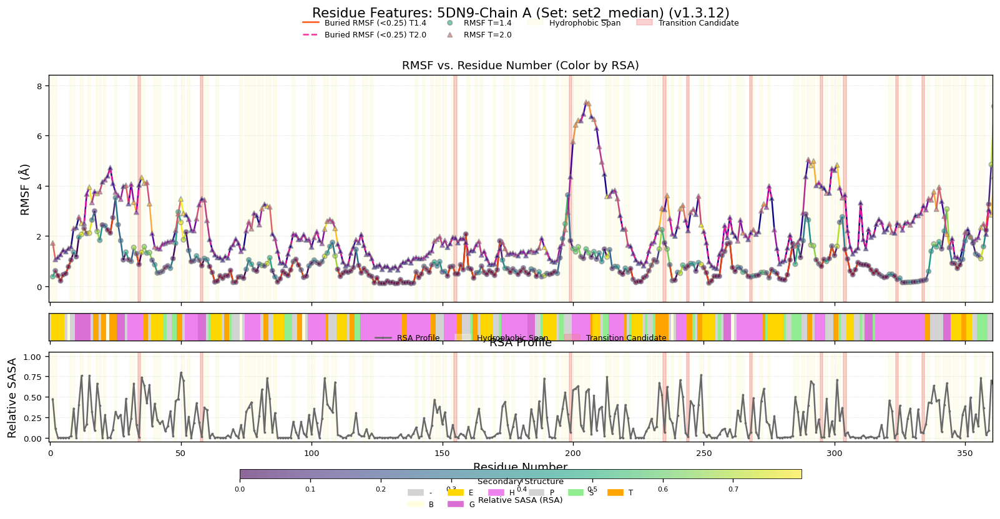


--- PDB: 5dn9, 체인: B, 라벨 세트: set2_median 시각화 생성 중 ---
  그래프 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results2025/5dn9_plots_v13/5dn9_chain_B_features_set_set2_median_v1_3_12.png'


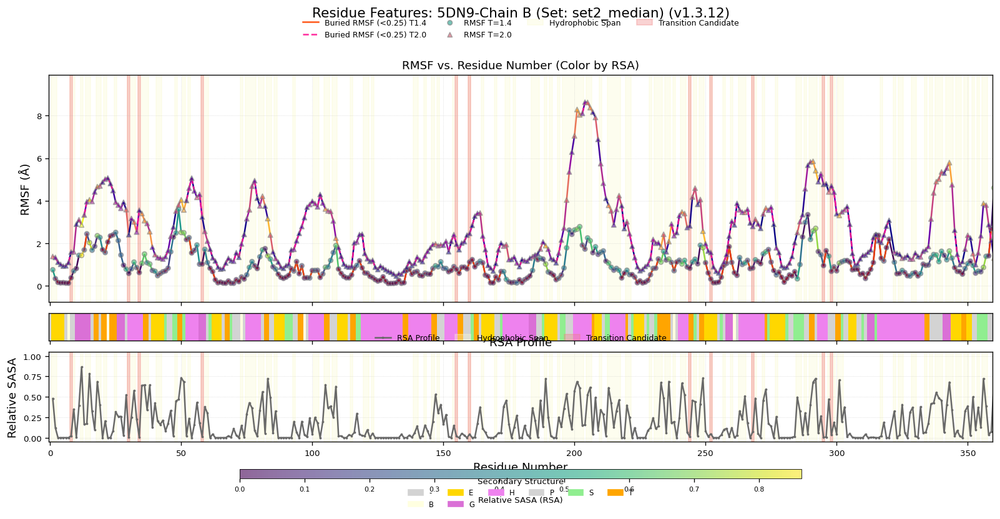


모든 요청된 시각화 완료.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import os
import datetime
from typing import List, Dict, Tuple, Any, Callable, Optional


# --- 스크립트 버전 ---
SCRIPT_VERSION_V1_3 = "1.3.12" # v1.2.x의 다중 라벨 세트 시각화 지원

# === 전역 스타일 설정 ===
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans'],
    'font.size': 9,
    'axes.titlesize': 13,
    'axes.labelsize': 11,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7,
    'legend.title_fontsize': 8.5,
    'figure.titlesize': 15,
    'figure.dpi': 120
})

# === 데이터 로딩 및 전처리 함수 ===
def load_and_prepare_data_v1_3_12(master_all_labels_csv_path: str, pdb_id: str, selected_set_key: str):
    """
    v1.2.5 등에서 생성된, 모든 라벨 세트가 포함된 마스터 CSV를 로드하고,
    선택된 set_key에 해당하는 라벨 컬럼을 일반적인 이름으로 매핑하여 준비합니다.
    """
    if not os.path.exists(master_all_labels_csv_path):
        print(f"오류: CSV 파일 '{master_all_labels_csv_path}' 없음."); return None
    try:
        df = pd.read_csv(master_all_labels_csv_path)
        print(f"'{master_all_labels_csv_path}' 로드 완료 ({len(df)} 행, {len(df.columns)} 열).")
    except Exception as e:
        print(f"오류: CSV 파일 로드 중 - {e}"); return None

    # 시각화에 사용할 일반적인 컬럼명 정의
    # 실제 마스터 CSV 컬럼명 -> 플롯 코드 내부에서 사용할 일반명
    column_map_base = {
        'residue_number': 'residue',
        'chain_id': 'chain',
        'rmsf_T1.4': 'RMSF1',
        'rmsf_T2.0': 'RMSF2',
        'sasa_relative_total': 'RSA',
        'sasa_hydrophobic_total': 'hydro_SA_total',
        'dssp_secondary_structure': 'ss',
    }

    # 선택된 set_key에 따른 라벨 컬럼명 매핑
    # v1.2.5에서 생성된 컬럼명 규칙: {set_key}_{label_type}
    column_map_set_specific = {
        f"{selected_set_key}_exposure_label": "exposure_label",
        f"{selected_set_key}_flexibility_change_label": "flexibility_change_label",
        f"{selected_set_key}_is_transition_candidate": "is_tc",
        # 상세 TC 경로 컬럼도 필요시 여기에 추가 가능
        f"{selected_set_key}_is_buried_by_rsa": "is_buried_for_tc",
        f"{selected_set_key}_is_flexible_under_stress": "is_flexible_for_tc",
        f"{selected_set_key}_has_buried_hydrophobicity": "has_hydro_for_tc",
    }

    final_column_map = {**column_map_base, **column_map_set_specific}

    cols_to_rename_existing = {k: v for k, v in final_column_map.items() if k in df.columns}
    df = df.rename(columns=cols_to_rename_existing)

    # 필수 컬럼 존재 확인 (rename 후의 이름 기준)
    essential_plot_cols = ['residue', 'chain', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total', 'ss']
    # is_tc 등 라벨 컬럼은 없어도 진행 가능하도록 처리

    missing_essential_cols = [col for col in essential_plot_cols if col not in df.columns]
    if missing_essential_cols:
        print(f"경고: 시각화 필수 컬럼 {missing_essential_cols} 없음.")
        # return None # 또는 일부 기능만 동작하도록

    for col in ['residue', 'RMSF1', 'RMSF2', 'RSA', 'hydro_SA_total']:
        if col in df.columns: df[col] = pd.to_numeric(df[col], errors='coerce')

    # 라벨 컬럼들은 boolean 또는 category로 처리
    for label_col in ['is_tc', 'is_buried_for_tc', 'is_flexible_for_tc', 'has_hydro_for_tc']:
        if label_col in df.columns:
            # True/False 문자열 또는 0/1 숫자형을 bool로 변환
            if df[label_col].dtype == 'object':
                df[label_col] = df[label_col].astype(str).str.lower().map({'true': True, 'false': False, '1': True, '0': False, '1.0': True, '0.0': False}).fillna(False)
            else:
                df[label_col] = df[label_col].astype(bool)
        else: # 컬럼이 없으면 False로 채움 (시각화 오류 방지)
            df[label_col] = False
            if label_col == 'is_tc': print(f"경고: '{selected_set_key}'의 TC 라벨 컬럼을 찾을 수 없어 TC 강조 불가.")


    if 'hydro_SA_total' in df.columns:
        hydro_sasa_median = df['hydro_SA_total'].quantile(0.50)
        if pd.notna(hydro_sasa_median): df['hydrophobic'] = df['hydro_SA_total'] > hydro_sasa_median
        else: df['hydrophobic'] = False
    else: df['hydrophobic'] = False

    if df[['RMSF1', 'RMSF2', 'RSA']].isnull().any().any():
        print("참고: RMSF 또는 RSA 데이터에 NaN 값이 포함되어 있습니다.")
    return df

# === 시각화 함수 (v1.3.11 기반, 레이아웃 개선) ===
def plot_protein_features_for_chain_v1_3_12(df_chain: pd.DataFrame, pdb_id: str, chain_id: str, set_key_name: str, output_dir: str):
    if df_chain is None or df_chain.empty:
        print(f"데이터 없음: PDB {pdb_id}, 체인 {chain_id}."); return

    df_chain = df_chain.sort_values('residue').reset_index(drop=True)
    # 시각화에 필요한 컬럼만 선택하고 NaN이 있는 행 제거 (특히 RMSF, RSA)
    plot_cols = ['residue', 'RMSF1', 'RMSF2', 'RSA', 'is_tc', 'hydrophobic', 'ss']
    df_plot = df_chain[plot_cols].dropna(subset=['RMSF1', 'RMSF2', 'RSA']).copy() # residue는 항상 있어야 함

    if df_plot.empty:
        print(f"유효 데이터 없음 (RMSF/RSA NaN): PDB {pdb_id}, 체인 {chain_id}."); return

    res = df_plot['residue'].to_numpy()
    r1  = df_plot['RMSF1'].to_numpy()
    r2  = df_plot['RMSF2'].to_numpy()
    rsa = df_plot['RSA'].to_numpy()
    is_tc_plot = df_plot['is_tc'].to_numpy(dtype=bool)
    hydrophobic_plot = df_plot['hydrophobic'].to_numpy(dtype=bool)
    ss_plot = df_plot['ss'].fillna(' ').to_numpy() # NaN은 Coil로

    hydro_spans = []; start_h = None
    for i, h_val in enumerate(hydrophobic_plot):
        if h_val and start_h is None: start_h = res[i]
        if not h_val and start_h is not None: hydro_spans.append((start_h, res[i-1] if i > 0 else start_h)); start_h = None
    if start_h is not None: hydro_spans.append((start_h, res[-1]))
    tc_spans = []; start_tc = None
    for i, tc_val in enumerate(is_tc_plot):
        if tc_val and start_tc is None: start_tc = res[i]
        if not tc_val and start_tc is not None: tc_spans.append((start_tc, res[i-1] if i > 0 else start_tc)); start_tc = None
    if start_tc is not None: tc_spans.append((start_tc, res[-1]))

    ss_color_map = {
        'H': '#EE82EE', 'E': '#FFD700', 'T': '#FFA500', 'G': '#DA70D6',
        'I': '#BA55D3', 'B': '#FFFFE0', 'S': '#90EE90',
        ' ': '#D3D3D3', '-': '#D3D3D3', None: '#D3D3D3'
    }
    unique_ss_codes_in_data = sorted(list(set(s.strip() for s in ss_plot if s and s.strip())))
    active_ss_color_map = {code: ss_color_map.get(code, '#D3D3D3') for code in unique_ss_codes_in_data if code}

    def add_gradient_line(ax, x, y, c_values, cmap_name, norm_min, norm_max):
        if len(x) < 2: return None
        pts = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
        lc = LineCollection(segs, cmap=plt.get_cmap(cmap_name), norm=Normalize(vmin=norm_min, vmax=norm_max), linewidth=1.5, zorder=2)
        lc.set_array(c_values[:-1])
        ax.add_collection(lc)
        return lc

    fig_width = min(15, max(9, len(res) * 0.06))
    fig_height = 7.0 # 높이 약간 줄임 (컬러바 하단 이동)

    fig, (ax1, ax_ss, ax2) = plt.subplots(
        3, 1, sharex=True, figsize=(fig_width, fig_height),
        gridspec_kw={'height_ratios':[0.58, 0.07, 0.23], 'hspace': 0.1} # hspace 추가, 비율 조정
    )
    fig.suptitle(f"Residue Features: {pdb_id.upper()}-Chain {chain_id} (Set: {set_key_name}) (v{SCRIPT_VERSION_V1_3})", fontsize=13, y=0.98)

    rsa_min_val, rsa_max_val = np.nanmin(rsa) if np.any(np.isfinite(rsa)) else 0, np.nanmax(rsa) if np.any(np.isfinite(rsa)) else 1
    if rsa_min_val == rsa_max_val: rsa_min_val, rsa_max_val = 0, 1

    # --- ax1: RMSF 플롯 ---
    lc1 = add_gradient_line(ax1, res, r1, rsa, 'viridis', rsa_min_val, rsa_max_val)
    lc2 = add_gradient_line(ax1, res, r2, rsa, 'plasma', rsa_min_val, rsa_max_val)
    rsa_buried_threshold = 0.25
    buried_label_t14_added, buried_label_t20_added = False, False
    for rmsf_arr, style, color, label_suffix in [(r1, '-', 'orangered', 'T1.4'), (r2, '--', 'deeppink', 'T2.0')]:
        for i in range(len(res)-1):
            if rsa[i] < rsa_buried_threshold and rsa[i+1] < rsa_buried_threshold:
                current_label = ""
                if label_suffix == 'T1.4' and not buried_label_t14_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t14_added = True
                elif label_suffix == 'T2.0' and not buried_label_t20_added: current_label = f'Buried RMSF (<{rsa_buried_threshold}) {label_suffix}'; buried_label_t20_added = True
                ax1.plot(res[i:i+2], rmsf_arr[i:i+2], color=color, linestyle=style, linewidth=1.5, alpha=0.9, label=current_label)
    sc1_for_colorbar = None
    if np.any(np.isfinite(r1)): sc1_for_colorbar = ax1.scatter(res, r1, c=rsa, cmap='viridis', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, label='RMSF T=1.4', zorder=3, alpha=0.6)
    if np.any(np.isfinite(r2)): ax1.scatter(res, r2, c=rsa, cmap='plasma', norm=Normalize(vmin=rsa_min_val, vmax=rsa_max_val), edgecolor='grey', s=20, marker='^', label='RMSF T=2.0', zorder=3, alpha=0.6)
    hydro_label_added = False
    for s,e in hydro_spans: ax1.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added else ""); hydro_label_added = True
    tc_label_added = False
    for s_tc, e_tc in tc_spans: ax1.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added else ""); tc_label_added = True
    if np.any(np.isfinite(r1)) or np.any(np.isfinite(r2)):
        valid_r_values = np.concatenate([r1[np.isfinite(r1)], r2[np.isfinite(r2)]]);
        if len(valid_r_values) > 0: ymin, ymax = np.min(valid_r_values), np.max(valid_r_values); ax1.set_ylim(ymin - (ymax-ymin)*0.1, ymax + (ymax-ymin)*0.15)
    ax1.set_ylabel('RMSF (Å)'); ax1.set_title('RMSF vs. Residue Number (Color by RSA)', fontsize=11)
    handles, labels = ax1.get_legend_handles_labels(); by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.28), ncol=min(4, len(by_label)), frameon=False, fontsize=7.5)
    ax1.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
    ax1.tick_params(labelbottom=False)

    # --- ax_ss: 2차 구조 막대 ---
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_int_map = {code: i for i, code in enumerate(active_ss_color_map.keys())}
        ss_int_array = np.array([ss_int_map.get(s.strip(), len(active_ss_color_map)) for s in ss_plot])
        cmap_colors_list = list(active_ss_color_map.values())
        if len(ss_int_map) < len(set(ss_int_array)): cmap_colors_list.append('lightgrey')
        if not cmap_colors_list: cmap_ss = plt.get_cmap('tab10'); norm_ss = Normalize(vmin=0, vmax=max(1,np.max(ss_int_array) if len(ss_int_array)>0 else 1))
        else: cmap_ss = mpl.colors.ListedColormap(cmap_colors_list); norm_ss = mpl.colors.Normalize(vmin=0, vmax=len(cmap_colors_list)-1)
        x_boundaries = np.arange(len(res) + 1) - 0.5
        y_boundaries = np.array([0, 1])
        ax_ss.pcolormesh(x_boundaries, y_boundaries, ss_int_array.reshape(1, -1), cmap=cmap_ss, norm=norm_ss, shading='flat', edgecolor='none')
        ax_ss.set_xlim(x_boundaries[0], x_boundaries[-1]); ax_ss.set_ylim(0,1); ax_ss.set_yticks([])
        ax_ss.tick_params(labelbottom=False)
    else: ax_ss.axis('off')

    # --- ax2: RSA 프로파일 ---
    ax2.plot(res, rsa, marker='.', linestyle='-', color='dimgray', markersize=2.5, label='RSA Profile')
    hydro_label_added_ax2 = False
    for s,e in hydro_spans: ax2.axvspan(s-0.5, e+0.5, color='lightgoldenrodyellow', alpha=0.35, zorder=0, label='Hydrophobic Span' if not hydro_label_added_ax2 else ""); hydro_label_added_ax2 = True
    tc_label_added_ax2 = False
    for s_tc, e_tc in tc_spans: ax2.axvspan(s_tc-0.5, e_tc+0.5, color='lightcoral', alpha=0.35, zorder=0.5, label='Transition Candidate' if not tc_label_added_ax2 else ""); tc_label_added_ax2 = True
    ax2.set_ylabel('Relative SASA'); ax2.set_title('RSA Profile', fontsize=11)
    ax2.set_ylim(-0.05, 1.05)
    handles2, labels2 = ax2.get_legend_handles_labels(); by_label2 = dict(zip(labels2, handles2))
    ax2.legend(by_label2.values(), by_label2.keys(), loc='upper center', bbox_to_anchor=(0.5, 1.28), ncol=min(3, len(by_label2)), frameon=False, fontsize=7.5)
    ax2.set_xlabel("Residue Number")
    ax2.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

    # --- 범례 및 컬러바 최종 배치 ---
    # 2차 구조 범례
    if 'ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map:
        ss_legend_handles = [mpl.patches.Patch(color=color, label=ss_type) for ss_type, color in active_ss_color_map.items() if ss_type.strip()]
        if ss_legend_handles:
            fig.legend(handles=ss_legend_handles, title="Secondary Structure", loc='lower center',
                       bbox_to_anchor=(0.5, 0.01), ncol=min(6, len(ss_legend_handles)), frameon=False, title_fontsize=8, fontsize=7)

    # RSA 컬러바 (2차 구조 범례 위쪽)
    if sc1_for_colorbar:
        cbar_bottom_pos = 0.08 if ('ss' in df_plot.columns and len(ss_plot) > 0 and active_ss_color_map and ss_legend_handles) else 0.03
        cax_colorbar = fig.add_axes([0.25, cbar_bottom_pos, 0.5, 0.018]) # left, bottom, width, height
        cbar = fig.colorbar(sc1_for_colorbar, cax=cax_colorbar, orientation='horizontal')
        cbar.set_label('Relative SASA (RSA)', size=8)
        cbar.ax.tick_params(labelsize=6.5)
        cbar.outline.set_linewidth(0.5)

    # 전체 레이아웃 조정
    fig.subplots_adjust(left=0.08, right=0.92, bottom=0.15 if sc1_for_colorbar else 0.1, top=0.85, hspace=0.5) # hspace 증가, top/bottom 조정

    if not os.path.exists(output_dir): os.makedirs(output_dir); print(f"출력 폴더 생성: '{output_dir}'")
    plot_filename = f"{pdb_id}_chain_{chain_id}_features_set_{set_key_name}_v{SCRIPT_VERSION_V1_3.replace('.', '_')}.png" # 파일명에 set_key 추가
    plot_full_path = os.path.join(output_dir, plot_filename)
    try:
        plt.savefig(plot_full_path, dpi=200, bbox_inches='tight')
        print(f"  그래프 저장 완료: '{plot_full_path}'")
    except Exception as e: print(f"  오류: 그래프 파일 저장 중 - {e}")
    plt.show()
    plt.close(fig)

# === 메인 실행 로직 (v1.3.12) ===
def main_v1_3_12(): # 함수명 변경
    print(f"--- 단백질 특징 시각화 스크립트 v{SCRIPT_VERSION_V1_3} ---")
    pdb_id_input = input("분석 및 시각화할 PDB ID를 입력하세요 (예: 5dn9): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    pdb_specific_output_dir = os.path.join(pdb_save_path, pdb_id_input + "_plots_v13") # 출력 폴더명 간결화
    if not os.path.exists(pdb_specific_output_dir):
        try: os.makedirs(pdb_specific_output_dir); print(f"PDB ID별 결과 폴더 생성: '{pdb_specific_output_dir}'")
        except Exception as e: print(f"오류: PDB ID별 결과 폴더 생성 실패 ('{pdb_specific_output_dir}') - {e}."); pdb_specific_output_dir = pdb_save_path

    date_str_input = input(f"마스터 CSV 파일의 날짜 태그(YYYYMMDD, 예: {datetime.date.today().strftime('%Y%m%d')}, 없으면 엔터): ").strip()
    # v1.2.5에서 생성된 _master_all_labels_ 파일을 우선적으로 찾음
    if date_str_input: labeled_csv_filename = f"{pdb_id_input}_master_all_labels_{date_str_input}.csv"
    else: labeled_csv_filename = f"{pdb_id_input}_master_all_labels.csv" # 날짜 없는 _master_all_labels
    input_csv_path = os.path.join(pdb_save_path, labeled_csv_filename)

    if not os.path.exists(input_csv_path): # 대체 파일명 시도
        if date_str_input: fallback_filename = f"{pdb_id_input}_master_labeled_data_{date_str_input}.csv"
        else: fallback_filename = f"{pdb_id_input}_master_labeled_data.csv"
        fallback_path = os.path.join(pdb_save_path, fallback_filename)
        if os.path.exists(fallback_path):
            print(f"경고: '{labeled_csv_filename}' 파일을 찾지 못했습니다. 대신 '{fallback_path}' 사용 시도.")
            input_csv_path = fallback_path
        else:
            print(f"오류: '{labeled_csv_filename}' 또는 '{fallback_filename}' 파일을 찾을 수 없습니다.")
            print("v1.2.5 (또는 v1.2.3) 스크립트를 먼저 실행하여 라벨링된 마스터 CSV를 생성해주세요.")
            return

    # 어떤 set_key의 라벨을 시각화할지 사용자에게 입력받음
    # THRESHOLD_SETS는 v1.2.5 스크립트에 정의되어 있다고 가정하고, 사용자가 그 키를 알고 입력
    print("\nv1.2.5 스크립트에서 사용된 THRESHOLD_SETS의 키 예시: set1_strict, set2_median, set3_default_0.25")
    set_key_to_visualize = input("시각화에 사용할 라벨 세트의 'set_key'를 입력하세요 (예: set3_default_0.25): ").strip()
    if not set_key_to_visualize: # 입력 없으면 기본값 사용 또는 오류 처리
        default_set_key_viz = "set3_default_0.25" # 또는 가장 일반적인 세트
        print(f"경고: 시각화할 set_key가 입력되지 않았습니다. 기본값 '{default_set_key_viz}'을(를) 사용합니다.")
        set_key_to_visualize = default_set_key_viz

    df_full_protein = load_and_prepare_data_v1_3_12(input_csv_path, pdb_id_input, set_key_to_visualize) # set_key 전달
    if df_full_protein is None or df_full_protein.empty: print("데이터 로드 실패."); return

    available_chains = sorted(df_full_protein['chain'].unique())
    print(f"\n사용 가능한 체인 ID: {available_chains}")
    chain_to_plot_input = input(f"시각화할 체인 ID (예: A). 모든 체인 순차적: 'ALL' 또는 빈칸: ").strip().upper()

    chains_for_plotting = []
    if not chain_to_plot_input or chain_to_plot_input == "ALL": chains_for_plotting = available_chains
    elif chain_to_plot_input in available_chains: chains_for_plotting = [chain_to_plot_input]
    else: print(f"경고: 입력 체인 ID '{chain_to_plot_input}' 없음."); return

    for target_chain_id in chains_for_plotting:
        print(f"\n--- PDB: {pdb_id_input}, 체인: {target_chain_id}, 라벨 세트: {set_key_to_visualize} 시각화 생성 중 ---")
        df_single_chain = df_full_protein[df_full_protein['chain'] == target_chain_id].copy()
        if df_single_chain.empty: print(f"체인 {target_chain_id} 데이터 없음."); continue
        plot_protein_features_for_chain_v1_3_12(df_single_chain, pdb_id_input, target_chain_id, set_key_to_visualize, pdb_specific_output_dir)

    print("\n모든 요청된 시각화 완료.")

if __name__ == "__main__":
    if 'pdb_save_path' not in globals() or not os.path.isdir(pdb_save_path):
        pdb_save_path = "."
    main_v1_3_12()


# 새 섹션------------------------- 분리용

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
from Bio.PDB.Residue import Residue # For type hinting
from Bio.PDB.Structure import Structure as BiopythonStructure # For type hinting
import datetime
from pathlib import Path
from typing import List, Dict, Tuple, Set, Any, Callable, Optional

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# --- Hydrophobic Atom Definitions ---
# 사용자가 제공한 PyMOL 선택 로직을 기반으로 정의된 소수성 원자들
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'],
    'THR': ['CG2'], # THR은 주로 CG2만 비극성으로 간주
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
    # GLY는 이 정의에서 명시적인 소수성 탄소 측쇄 원자가 없음
}

# --- PyMOL SASA 계산 관련 ---
MAX_SASA = { # (Gly-X-Gly 기준, Tien et al., 2013)
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

_pymol_initialized = False # PyMOL 초기화 상태 추적

def _initialize_pymol_session():
    global _pymol_initialized
    if not _pymol_initialized:
        try:
            pymol.finish_launching(['pymol', '-cq'])
            _pymol_initialized = True
        except Exception as e:
            print(f"PyMOL 초기화 중 참고: {e}")
            # 이미 실행 중일 수 있으므로 플래그를 True로 설정하여 반복 시도 방지
            _pymol_initialized = True


def _get_unique_residues_from_pymol_object(pymol_object_name: str) -> Set[Tuple[str, str, str]]:
    pymol_globals = {'_temp_list_residues': []}
    # 더 많은 대표 원자 추가 (핵산 및 일반 중합체 고려)
    sel_protein_ca = f"{pymol_object_name} and polymer and name CA"
    sel_na_p = f"{pymol_object_name} and polymer and name P"
    sel_na_c1prime = f"{pymol_object_name} and polymer and (name C1* or name C1')" # C1* 또는 C1'
    sel_generic_polymer_representative = f"{pymol_object_name} and polymer" # 최후의 수단

    try:
        cmd.iterate_state(1, sel_protein_ca, "_temp_list_residues.append((chain, resi, resn))", space=pymol_globals)
        if not pymol_globals['_temp_list_residues']:
            cmd.iterate_state(1, sel_na_p, "_temp_list_residues.append((chain, resi, resn))", space=pymol_globals)
        if not pymol_globals['_temp_list_residues']:
            cmd.iterate_state(1, sel_na_c1prime, "_temp_list_residues.append((chain, resi, resn))", space=pymol_globals)
        if not pymol_globals['_temp_list_residues']:
            print(f"경고: 대표 원자(CA, P, C1*)를 찾을 수 없습니다. 전체 중합체 원자로 잔기 정보 추출을 시도합니다 (느릴 수 있음).")
            # 이 경우, 같은 잔기가 여러 번 추가될 수 있으므로 set으로 고유성 보장
            cmd.iterate_state(1, sel_generic_polymer_representative, "_temp_list_residues.append((chain, resi, resn))", space=pymol_globals)

        unique_residues_info = set(pymol_globals['_temp_list_residues'])
        return unique_residues_info
    except pymol.CmdException as e:
        print(f"PyMOL iterate_state 중 오류 (잔기 정보 추출): {e}.")
        return set()

def calculate_sasa_with_pymol(structure_file_path: str, pymol_object_name: str ="sasa_target_total", output_csv_filename: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Any]]:
    """ 전체 SASA 및 RSA를 계산하여 딕셔너리로 반환하고, 선택적으로 CSV 파일로 저장합니다. """
    print(f"PyMOL을 사용하여 전체 SASA 계산 시작: {structure_file_path}")
    sasa_lookup = {}
    _initialize_pymol_session()
    cmd.reinitialize() # 새 계산을 위해 PyMOL 상태 초기화
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (전체 SASA용).")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues_info = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues_info:
        print("경고: 구조에서 잔기 정보를 추출하지 못했습니다 (전체 SASA).")
        cmd.delete(pymol_object_name)
        return sasa_lookup

    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residue_info)}개 잔기에 대해 전체 SASA 계산 중...")

    sasa_results_for_csv = [] # CSV 저장용 리스트

    for i, (chain_id, resi_str, resn) in enumerate(sorted_residue_info):
        if (i + 1) % 200 == 0: print(f"전체 SASA: {i+1}/{len(sorted_residue_info)} 처리 중...")
        try:
            resi_num = int(resi_str)
            residue_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            current_sasa = cmd.get_area(residue_selection)

            max_sasa_for_resn = MAX_SASA.get(resn.upper(), None)
            relative_sasa_val = "N/A"
            if max_sasa_for_resn is not None and max_sasa_for_resn > 0:
                relative_sasa_val = current_sasa / max_sasa_for_resn

            sasa_lookup[(chain_id, resi_num)] = {'sasa': current_sasa, 'relative_sasa': relative_sasa_val}
            if output_csv_filename: # CSV 저장 옵션이 있을 경우에만 리스트에 추가
                 sasa_results_for_csv.append([chain_id, resi_num, current_sasa, relative_sasa_val])

        except Exception as e:
            print(f"오류 (전체 SASA): 체인 {chain_id} 잔기 {resi_str}({resn}) - {e}")
            sasa_lookup[(chain_id, resi_num)] = {'sasa': "Error", 'relative_sasa': "Error"}
            if output_csv_filename:
                sasa_results_for_csv.append([chain_id, resi_num, "Error", "Error"])

    if output_csv_filename:
        try:
            with open(output_csv_filename, 'w', newline='') as csvfile:
                writer = csv.writer(csvfile)
                writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA'])
                writer.writerows(sasa_results_for_csv)
            print(f"전체 SASA 결과가 '{output_csv_filename}' 파일로 저장되었습니다.")
        except IOError:
            print(f"오류: 전체 SASA CSV 파일 '{output_csv_filename}' 쓰기 실패.")

    cmd.delete(pymol_object_name)
    print(f"전체 SASA 계산 완료. {len(sasa_lookup)} 잔기 처리됨.")
    return sasa_lookup

def calculate_hydrophobic_sasa_with_pymol(structure_file_path: str, pymol_object_name: str ="sasa_target_hydro") -> Dict[Tuple[str, int], Optional[float]]:
    """ 각 잔기의 소수성 원자들만의 SASA를 계산하여 딕셔너리로 반환합니다. """
    print(f"PyMOL을 사용하여 소수성 SASA 계산 시작: {structure_file_path}")
    hydrophobic_sasa_lookup = {}
    _initialize_pymol_session()
    # cmd.reinitialize() # 이전 계산에서 이미 로드된 다른 객체가 있을 수 있으므로 reinitialize는 주석 처리
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (소수성 SASA용).")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues_info = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues_info:
        print("경고: 구조에서 잔기 정보를 추출하지 못했습니다 (소수성 SASA).")
        cmd.delete(pymol_object_name)
        return hydrophobic_sasa_lookup

    sorted_residue_info = sorted(list(unique_residues_info), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residue_info)}개 잔기에 대해 소수성 SASA 계산 중...")

    for i, (chain_id, resi_str, resn) in enumerate(sorted_residue_info):
        if (i + 1) % 200 == 0: print(f"소수성 SASA: {i+1}/{len(sorted_residue_info)} 처리 중...")
        try:
            resi_num = int(resi_str)
            resn_upper = resn.upper()
            hydrophobic_atoms_for_resn = HYDROPHOBIC_ATOM_DEFS.get(resn_upper)

            current_hydrophobic_sasa = 0.0 # 기본값
            if hydrophobic_atoms_for_resn:
                atom_names_selection_part = "name " + "+".join(hydrophobic_atoms_for_resn)
                hydro_selection = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_names_selection_part}))"
                # 선택된 원자가 실제로 존재하는지 확인 후 get_area 호출 (선택 사항)
                # count_atoms는 선택된 원자 수를 반환. 0이면 get_area가 오류를 낼 수 있음.
                if cmd.count_atoms(hydro_selection) > 0:
                    current_hydrophobic_sasa = cmd.get_area(hydro_selection)
                else:
                    # print(f"참고 (소수성 SASA): 체인 {chain_id} 잔기 {resi_str}({resn})에 정의된 소수성 원자가 없거나 선택 실패.")
                    pass # current_hydrophobic_sasa는 0.0 유지

            hydrophobic_sasa_lookup[(chain_id, resi_num)] = current_hydrophobic_sasa
        except Exception as e:
            print(f"오류 (소수성 SASA): 체인 {chain_id} 잔기 {resi_str}({resn}) - {e}")
            hydrophobic_sasa_lookup[(chain_id, resi_num)] = None # 오류 발생 시 None

    cmd.delete(pymol_object_name)
    print(f"소수성 SASA 계산 완료. {len(hydrophobic_sasa_lookup)} 잔기 처리됨.")
    return hydrophobic_sasa_lookup

# --- BioPython 기반 함수들 ---
def load_biopython_structure(pdb_id: str, file_path_str: str) -> Optional[BiopythonStructure]:
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    structure: Optional[BiopythonStructure] = None
    try:
        if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
        elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
        else:
            print(f"경고: 파일 확장자가 PDB/CIF가 아닙니다 ('{file_path.suffix}'). PDB로 파싱 시도합니다.")
            parser = PDBParser(**parser_args)
        structure = parser.get_structure(pdb_id, str(file_path))
    except Exception as e:
        print(f"BioPython 구조 로딩 오류 ({file_path_str}): {e}")
        return None
    return structure

def analyze_structure_with_dssp(structure: BiopythonStructure, pdb_file_path_for_dssp: str, dssp_executable='mkdssp') -> List[List[Any]]:
    dssp_data_list = []
    if not structure: return dssp_data_list
    model = structure[0]
    try:
        # DSSP 실행 파일 경로가 시스템 PATH에 없거나 이름이 다르면 여기서 오류 발생 가능
        dssp = DSSP(model, pdb_file_path_for_dssp, dssp=dssp_executable)
        for key in dssp.keys():
            # key = (chain_id, residue_id_tuple)
            # residue_id_tuple = (het_field, sequence_identifier, insertion_code)
            # dssp[key] = (dssp_index, amino_acid, secondary_structure, relative_asa, phi, psi, ...)
            chain_id = key[0]
            residue_number = key[1][1] # sequence_identifier

            dssp_entry = dssp[key]
            residue_name_one_letter = dssp_entry[1]
            secondary_structure = dssp_entry[2]
            # BioPython의 DSSP 출력에서 accessibility (dssp_entry[3])는 일반적으로 RSA 값(0-1)입니다.
            accessibility_from_dssp = dssp_entry[3]
            dssp_data_list.append([chain_id, residue_number, residue_name_one_letter, secondary_structure, accessibility_from_dssp])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}')가 설치되어 있고 경로가 올바른지, 입력 파일 '{pdb_file_path_for_dssp}'이 유효한지 확인하세요.")
        if "mkdssp" in str(e).lower() or "FileNotFoundError" in str(e) : print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 합니다.")
    return dssp_data_list

# --- 마스터 CSV 생성/업데이트 로직의 필드 추출 함수들 ---
def _get_res_id_tuple_for_lookup(residue: Residue) -> Tuple[str, int]:
    """ Bio.PDB.Residue 객체에서 (chain_id, residue_sequence_number) 튜플을 반환합니다. (icode 무시) """
    return (residue.get_parent().id, residue.get_id()[1])

def _extract_residue_number(residue: Residue, context: Dict[str, Any]) -> int: return residue.get_id()[1]
def _extract_chain_id(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_parent().id
def _extract_residue_name_3L(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_resname()
def _extract_residue_name_1L(residue: Residue, context: Dict[str, Any]) -> str:
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname() # 비표준 아미노산은 3자리 코드로

def _extract_is_active_site(residue: Residue, context: Dict[str, Any]) -> bool:
    active_set = context.get('active_site_set', set())
    # active_set 키: (chain_id, resseq, icode)
    # residue.id: (hetflag, resseq, icode)
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in active_set

def _extract_atom_count(residue: Residue, context: Dict[str, Any]) -> int: return len(residue)
def _extract_ca_bfactor(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None

# SASA (PyMOL Total SASA CSV 기반)
def _extract_sasa_absolute_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    key = _get_res_id_tuple_for_lookup(residue)
    val = context.get('sasa_total_lookup', {}).get(key, {}).get('sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None

def _extract_sasa_relative_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    key = _get_res_id_tuple_for_lookup(residue)
    val = context.get('sasa_total_lookup', {}).get(key, {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None

# DSSP (analyze_structure_with_dssp 결과 기반)
def _extract_dssp_secondary_structure(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    key = _get_res_id_tuple_for_lookup(residue)
    return context.get('dssp_lookup', {}).get(key, {}).get('secondary_structure')

def _extract_dssp_accessibility(residue: Residue, context: Dict[str, Any]) -> Optional[float]: # DSSP의 접근성은 보통 RSA
    key = _get_res_id_tuple_for_lookup(residue)
    val = context.get('dssp_lookup', {}).get(key, {}).get('accessibility_from_dssp')
    return pd.to_numeric(val, errors='coerce') # DSSP accessibility는 이미 숫자일 가능성 높음

# Hydrophobic SASA (PyMOL Hydrophobic SASA 계산 기반)
def _extract_sasa_hydrophobic_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    key = _get_res_id_tuple_for_lookup(residue)
    val = context.get('hydrophobic_sasa_lookup', {}).get(key)
    return pd.to_numeric(val, errors='coerce') if val is not None else None

def _extract_sasa_hydrophobic_exposed_gt0(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    relative_total_sasa = _extract_sasa_relative_total(residue, context)
    if relative_total_sasa is not None and pd.notna(relative_total_sasa) and relative_total_sasa > 0:
        return _extract_sasa_hydrophobic_total(residue, context)
    return 0.0 # 노출 안되면 0.0 또는 None (None으로 통일 권장)

def _extract_sasa_hydrophobic_exposed_gt025(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    relative_total_sasa = _extract_sasa_relative_total(residue, context)
    if relative_total_sasa is not None and pd.notna(relative_total_sasa) and relative_total_sasa > 0.25:
        return _extract_sasa_hydrophobic_total(residue, context)
    return 0.0 # 노출 안되면 0.0 또는 None (None으로 통일 권장)

# --- 사용자가 선택 가능한 필드 목록 ---
AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    # 키: (설명, 추출 함수)
    "chain_id": ("Chain ID", _extract_chain_id),
    "residue_number": ("Residue Number (seq num from PDB)", _extract_residue_number),
    "residue_name_3L": ("Residue Name (3-letter)", _extract_residue_name_3L),
    "residue_name_1L": ("Residue Name (1-letter, non-standard as 3-letter)", _extract_residue_name_1L),
    "atom_count": ("Number of atoms in residue", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor (protein only)", _extract_ca_bfactor),
    "is_active_site": ("Is PDB SITE record residue?", _extract_is_active_site),
    "sasa_absolute_total": ("Total Absolute SASA (Å², PyMOL)", _extract_sasa_absolute_total),
    "sasa_relative_total": ("Total Relative SASA (0-1, PyMOL)", _extract_sasa_relative_total),
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility": ("DSSP Accessibility (RSA by DSSP)", _extract_dssp_accessibility), # DSSP의 accessibility가 RSA라고 가정
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_sasa_hydrophobic_total),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (Total RSA > 0) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt0),
    "sasa_hydrophobic_exposed_gt025": ("Exposed (Total RSA > 0.25) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt025),
    # 향후 추가 필드 예시 (사용자가 직접 함수 구현 필요)
    # "rmsf_T1.4": ("RMSF at T=1.4 (CABS-flex)", _extract_rmsf_t14), # _extract_rmsf_t14 함수는 사용자가 구현
    # "rmsf_T2.0": ("RMSF at T=2.0 (CABS-flex)", _extract_rmsf_t20), # _extract_rmsf_t20 함수는 사용자가 구현
    # "is_ligand_binding": ("Is Ligand/HETATM binding residue?", _extract_is_ligand_binding_site), # 함수 구현 필요
}

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    """PDB 파일에서 SITE 레코드를 파싱하여 (체인ID, 잔기번호, 삽입코드) 튜플의 집합을 반환합니다."""
    active_sites = set()
    if not pdb_file_path.exists():
        print(f"경고: SITE 레코드 파싱을 위한 PDB 파일 '{pdb_file_path}'를 찾을 수 없습니다.")
        return active_sites
    try:
        with pdb_file_path.open("r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    # SITE 레코드 형식에 따라 잔기 정보 추출
                    # 예: SITE   1 AC5  4 ASP A  58  HIS A  64  LYS A  88  TYR A  92
                    #      (18-20) (22) (23-26) (27) ... 반복
                    num_res_in_site = int(line[15:17].strip())
                    for i in range(num_res_in_site):
                        base_idx = 18 + (i * 11)
                        # res_name = line[base_idx : base_idx+3].strip() # 필요시 사용
                        chain_id = line[base_idx + 4 : base_idx + 5].strip()
                        res_seq_str = line[base_idx + 5 : base_idx + 9].strip()
                        ins_code = line[base_idx + 9 : base_idx + 10].strip() or " " # 삽입코드 없으면 공백

                        if chain_id and res_seq_str:
                            try:
                                active_sites.add((chain_id, int(res_seq_str), ins_code))
                            except ValueError:
                                print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{res_seq_str}' (라인: {line.strip()})")
    except Exception as e:
        print(f"SITE 레코드 파싱 중 오류: {e}")
    return active_sites

def generate_residue_centric_csv(
    pdb_id: str,
    biopython_structure: BiopythonStructure, # BioPython Structure 객체 직접 사용
    selected_fields: List[str],
    output_master_csv_path: str,
    context_data: Dict[str, Any] # 모든 사전 계산된 데이터(룩업 테이블 등) 포함
    ):
    print(f"\n마스터 CSV ('{output_master_csv_path}') 생성/업데이트 시작 (선택된 필드: {selected_fields})...")

    # 1. 선택된 필드 유효성 검사
    valid_selected_fields = []
    for f_key in selected_fields:
        if f_key in AVAILABLE_FIELDS:
            valid_selected_fields.append(f_key)
        else:
            print(f"경고: 알 수 없는 필드 '{f_key}'는 요청에서 제외됩니다.")
    if not valid_selected_fields:
        print("오류: 추출할 유효한 필드가 선택되지 않았습니다. 작업을 중단합니다.")
        return

    # 2. 잔기별 데이터 추출
    rows = []
    for model in biopython_structure: # 일반적으로 첫 번째 모델만 사용
        if model.id != 0: print(f"참고: 모델 {model.id} 처리 중 (일반적으로 모델 0만 사용).")
        for chain in model:
            for residue in chain:
                # 표준 아미노산 및 뉴클레오타이드만 (HETATM, 물 제외)
                if residue.id[0].strip() != "": continue

                row_data: Dict[str, Any] = {}
                extraction_successful_for_core_fields = True
                for field_key in valid_selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try:
                        row_data[field_key] = extractor_fn(residue, context_data)
                    except Exception as e:
                        # print(f"정보: 필드 '{field_key}' 추출 중 잔기 {residue.id} (체인 {chain.id})에서 오류: {e}")
                        row_data[field_key] = None
                        if field_key in ["chain_id", "residue_number"]: # 핵심 필드 오류 시
                            extraction_successful_for_core_fields = False
                            break
                if extraction_successful_for_core_fields:
                    rows.append(row_data)
        if model.id == 0: break # 대부분의 경우 첫 번째 모델만 처리

    if not rows: print("BioPython 구조에서 잔기 데이터를 추출하지 못했습니다."); return

    new_df = pd.DataFrame(rows)

    # ID 컬럼 및 사용자가 선택한 순서대로 컬럼 정렬
    id_cols = ["chain_id", "residue_number"]
    # 사용자가 선택한 필드 순서를 최대한 유지하되, ID 컬럼을 앞으로
    ordered_columns = [col for col in id_cols if col in new_df.columns]
    ordered_columns.extend([col for col in valid_selected_fields if col not in id_cols and col in new_df.columns])
    # 혹시 DataFrame에 생성되었지만 valid_selected_fields에 없는 컬럼이 있다면 추가 (정상적으론 없어야 함)
    ordered_columns.extend([col for col in new_df.columns if col not in ordered_columns])
    new_df = new_df[ordered_columns]

    if id_cols[0] in new_df.columns and id_cols[1] in new_df.columns:
        new_df = new_df.drop_duplicates(subset=id_cols, keep='first').sort_values(by=id_cols)
    else:
        print("경고: 핵심 ID 컬럼(chain_id, residue_number)이 새 데이터에 없어 중복제거/정렬이 불안정할 수 있습니다.")


    # 3. 마스터 CSV와 병합 또는 새로 저장
    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0:
        try:
            master_df = pd.read_csv(master_file)
            print(f"기존 마스터 CSV ('{master_file}') 로드 완료.")

            # 새로운 데이터프레임의 인덱스를 ID 컬럼으로 설정
            new_df_indexed = new_df.set_index(id_cols)
            master_df_indexed = master_df.set_index(id_cols)

            # 마스터에 새 컬럼 추가 또는 기존 컬럼 업데이트
            for col in new_df_indexed.columns:
                master_df_indexed[col] = new_df_indexed[col] # 새 값으로 덮어쓰거나 추가

            final_df = master_df_indexed.reset_index()

            # 최종 컬럼 순서: ID 컬럼 + (master에 있던 컬럼들 + 새로 추가된 컬럼들) 알파벳 순
            final_cols_ordered = id_cols + sorted([c for c in final_df.columns if c not in id_cols])
            final_df = final_df[final_cols_ordered]

            final_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"마스터 CSV가 업데이트되었습니다: '{master_file}'")
        except pd.errors.EmptyDataError: # 기존 파일이 비어있는 경우
            print(f"경고: 기존 마스터 CSV ('{master_file}')가 비어있습니다. 새 데이터로 덮어씁니다.")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        except Exception as e:
            print(f"오류: 마스터 CSV 병합 중 문제 발생: {e}")
            error_backup_path = master_file.with_name(f"{master_file.stem}_new_data_merge_error_{datetime.date.today().strftime('%Y%m%d')}.csv")
            new_df.to_csv(error_backup_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"새 데이터를 별도 파일로 저장합니다: '{error_backup_path}'")
    else: # 마스터 파일이 없거나 비어있는 경우
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")

# --- 시각화 함수 (이전과 동일하게 사용 가능, 필요시 여기에 포함) ---
# def identify_continuous_secondary_structures_for_chain(...)
# def visualize_protein_sequence(...)
# (이전 답변의 함수 정의를 여기에 복사하여 사용)

def main():
    pdb_id_input = input("PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다."); return

    # --- 파일 경로 설정 ---
    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"작업 대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    pdb_file_path_pdb = os.path.join(pdb_save_path, f"{pdb_id_input}.pdb")
    pdb_file_path_cif = os.path.join(pdb_save_path, f"{pdb_id_input}.cif")

    if os.path.exists(pdb_file_path_pdb): actual_structure_file_path = pdb_file_path_pdb
    elif os.path.exists(pdb_file_path_cif): actual_structure_file_path = pdb_file_path_cif
    else:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
        print(f"스크립트 실행 전에 해당 경로에 PDB 또는 CIF 파일을 다운로드/준비해주세요.")
        return

    biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
    if not biopython_structure: return

    # --- 데이터 계산 및 준비 ---
    # 1. 전체 SASA 계산 (PyMOL)
    sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    sasa_total_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{datetime.date.today().strftime('%Y%m%d')}.csv"
    sasa_total_csv_path = os.path.join(pdb_save_path, sasa_total_csv_filename)

    if os.path.exists(sasa_total_csv_path):
        if input(f"'{sasa_total_csv_path}' 전체 SASA 파일이 이미 존재합니다. 재계산 없이 기존 파일을 사용하시겠습니까? (Y/n): ").strip().lower() != 'n':
            print("기존 전체 SASA 파일을 로드합니다.")
            try:
                df_sasa_total = pd.read_csv(sasa_total_csv_path)
                for _, row in df_sasa_total.iterrows():
                    sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                        'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                        'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')
                    }
                print(f"전체 SASA 데이터 로드 완료 ({len(sasa_total_lookup)} 항목).")
            except Exception as e:
                print(f"경고: 기존 전체 SASA CSV 로드 실패 ({e}). 필요시 재계산됩니다.")
                sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_total_csv_path)
        else: # 재계산 선택
            sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_total_csv_path)
    else: # 파일이 없으면 계산
        sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, output_csv_filename=sasa_total_csv_path)

    if not sasa_total_lookup: print("경고: 전체 SASA 데이터가 준비되지 않았습니다.")

    # 2. 소수성 SASA 계산 (PyMOL)
    print(f"\nPyMOL 소수성 SASA 계산을 시작합니다 (필요시 매번 재계산).")
    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro_sasa")
    if not hydrophobic_sasa_lookup: print("경고: 소수성 SASA 데이터가 준비되지 않았습니다.")

    # 3. DSSP 분석
    dssp_data_list: List[List[Any]] = []
    dssp_input_file = pdb_file_path_pdb if os.path.exists(pdb_file_path_pdb) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            # DSSP 실행 파일 경로를 명시적으로 지정해야 할 수 있습니다 (예: dssp='/usr/bin/mkdssp')
            # Colab에서는 보통 apt-get install dssp 후 mkdssp로 사용 가능
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file, dssp_executable='mkdssp')
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
            else: print(f"DSSP 분석 완료 ({len(dssp_data_list)} 잔기 정보).")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else:
        print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    # 4. SITE 레코드 파싱 (마스터 CSV 생성 시 context로 전달)
    active_site_set = _parse_site_records_from_file(Path(actual_structure_file_path))
    if active_site_set: print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기 식별됨.")
    else: print("PDB SITE 레코드가 없거나 파싱에 실패했습니다.")

    # 모든 계산된 데이터를 담을 context 딕셔너리
    context_data_for_master_csv = {
        'sasa_total_lookup': sasa_total_lookup,
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {},
        'active_site_set': active_site_set
        # 향후 RMSF 데이터 등도 여기에 추가 가능
        # 'rmsf_t14_lookup': rmsf_t14_lookup,
        # 'rmsf_t20_lookup': rmsf_t20_lookup,
    }

    # --- 마스터 CSV 생성/업데이트를 위한 필드 선택 ---
    print("\n--- 마스터 CSV에 포함할 필드 선택 ---")
    print("사용 가능한 필드:")
    field_keys = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1}. {field_key:35} : {desc}")

    selected_indices_str = input(f"'{master_csv_filename}'에 포함/업데이트할 필드의 번호를 쉼표로 구분하여 입력하세요 (예: 1,2,8,9,12). 전체는 'ALL', 건너뛰려면 엔터: ").strip()

    selected_fields_for_csv = []
    default_fields_if_empty_selection = ["chain_id", "residue_number", "residue_name_3L", "sasa_relative_total", "sasa_hydrophobic_total"] # 기본적으로 유용한 필드

    if not selected_indices_str: # 엔터만 입력 시 건너뛰기
        print("필드 선택을 건너뛰어 마스터 CSV 생성/업데이트를 진행하지 않습니다.")
    elif selected_indices_str.upper() == 'ALL':
        selected_fields_for_csv = field_keys
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys):
                    selected_fields_for_csv.append(field_keys[idx])
                else:
                    print(f"경고: 잘못된 필드 번호 {idx+1}는 무시됩니다.")
        except ValueError:
            print(f"잘못된 입력입니다. 선택된 필드 없이 진행하거나 기본 필드를 고려합니다.")
            # selected_fields_for_csv = default_fields_if_empty_selection # 또는 여기서 중단

    if selected_fields_for_csv: # 선택된 필드가 있을 경우에만 진행
        # 필수 식별자 필드(chain_id, residue_number)가 항상 포함되도록 보장
        for id_col in ["residue_number", "chain_id"]: # 순서 중요
            if id_col not in selected_fields_for_csv:
                selected_fields_for_csv.insert(0, id_col)

        temp_ordered_list = [] # 중복 제거 및 순서 유지를 위함
        seen_in_ordered = set()
        for item in selected_fields_for_csv:
            if item not in seen_in_ordered:
                temp_ordered_list.append(item)
                seen_in_ordered.add(item)
        selected_fields_for_csv = temp_ordered_list

        print(f"선택된 최종 필드 (마스터 CSV용): {selected_fields_for_csv}")
        generate_residue_centric_csv(
            pdb_id=pdb_id_input,
            biopython_structure=biopython_structure, # 파싱된 BioPython 구조체 전달
            selected_fields=selected_fields_for_csv,
            output_master_csv_path=master_csv_full_path,
            context_data=context_data_for_master_csv
        )
    elif not selected_indices_str: # 엔터로 건너뛴 경우
        pass # 마스터 CSV 생성/업데이트 안 함
    else: # 잘못된 입력으로 selected_fields_for_csv가 비어있는 경우
        print("유효한 필드가 선택되지 않아 마스터 CSV를 생성/업데이트할 수 없습니다.")


    # --- (선택적) 시각화 로직은 필요에 따라 여기에 유지 또는 별도 실행 ---
    # ... (이전 답변의 시각화 로직) ...

    print("\n모든 작업 완료.")

if __name__ == "__main__":
    print("스크립트 시작. Colab 환경에서 PyMOL/DSSP를 사용하려면 관련 패키지 설치가 필요할 수 있습니다.")
    # 예: !pip install -q condacolab; import condacolab; condacolab.install(); !mamba install -c schrodinger pymol-open-source -y -q
    # 예: !apt-get install dssp -y # 또는 conda install -c salilab dssp -y -q
    main()



스크립트 시작. Colab 환경에서 PyMOL/DSSP를 사용하려면 관련 패키지 설치가 필요할 수 있습니다.
PDB ID를 입력하세요 (예: 1tgu): 4cha
작업 대상 마스터 CSV 파일: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha_master_residue_data.csv'
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha_ALLCHAINS_SASA_TOTAL_20250524.csv' 전체 SASA 파일이 이미 존재합니다. 재계산 없이 기존 파일을 사용하시겠습니까? (Y/n): n
PyMOL을 사용하여 전체 SASA 계산 시작: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha.pdb
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha.pdb' -> PyMOL 객체 'sasa_target_total' (전체 SASA용).
총 477개 잔기에 대해 전체 SASA 계산 중...
전체 SASA: 200/477 처리 중...
전체 SASA: 400/477 처리 중...
전체 SASA 결과가 '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha_ALLCHAINS_SASA_TOTAL_20250524.csv' 파일로 저장되었습니다.
전체 SASA 계산 완료. 477 잔기 처리됨.

PyMOL 소수성 SASA 계산을 시작합니다 (필요시 매번 재계산).
PyMOL을 사용하여 소수성 SASA 계산 시작: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/4cha.pdb
'/content/drive/MyDrive/Colab Notebooks/PDBLL

In [ ]:
import os
import pandas as pd
import pymol
from pymol import cmd
import csv
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP, Polypeptide
from Bio.PDB.Residue import Residue
from Bio.PDB.Structure import Structure as BiopythonStructure
from Bio.PDB.Model import Model as BiopythonModel
from Bio.PDB.Chain import Chain as BiopythonChain
from Bio.PDB.Atom import Atom as BiopythonAtom
from Bio.PDB.NeighborSearch import NeighborSearch # 리간드 결합 잔기 식별용
import datetime
from pathlib import Path
from typing import List, Dict, Tuple, Set, Any, Callable, Optional

# --- 스크립트 버전 ---
SCRIPT_VERSION = "1.0"

# --- 전역 설정 ---
# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results' # 사용자 환경에 맞게 수정
if not os.path.exists(pdb_save_path):
    try:
        os.makedirs(pdb_save_path)
        print(f"'{pdb_save_path}' 폴더를 생성했습니다.")
    except Exception as e:
        print(f"경고: '{pdb_save_path}' 폴더 생성에 실패했습니다: {e}. 현재 디렉토리에 파일이 저장될 수 있습니다.")
        pdb_save_path = "." # 현재 디렉토리로 대체

# --- 소수성 원자 정의 ---
HYDROPHOBIC_ATOM_DEFS = {
    'ARG': ['CG', 'CB'], 'GLN': ['CG', 'CB'], 'GLU': ['CG', 'CB'],
    'ILE': ['CG1', 'CG2', 'CD1', 'CB'], 'LEU': ['CG', 'CD1', 'CD2', 'CB'],
    'LYS': ['CG', 'CD', 'CB'], 'MET': ['CG', 'CE', 'CB'],
    'PHE': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'PRO': ['CG', 'CB'], 'THR': ['CG2'],
    'TRP': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'TYR': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'], 'VAL': ['CG1', 'CG2', 'CB'],
    'ASN': ['CB'], 'ALA': ['CB'], 'ASP': ['CB'], 'HIS': ['CB'], 'CYS': ['CB']
}

# --- 상대적 SASA 계산을 위한 표준 아미노산별 최대 SASA 값 (Å²) ---
MAX_SASA = { # (Gly-X-Gly 기준, Tien et al., 2013)
    'ALA': 129.0, 'ARG': 274.0, 'ASN': 195.0, 'ASP': 193.0, 'CYS': 167.0,
    'GLN': 225.0, 'GLU': 223.0, 'GLY': 104.0, 'HIS': 224.0, 'ILE': 197.0,
    'LEU': 201.0, 'LYS': 236.0, 'MET': 204.0, 'PHE': 240.0, 'PRO': 159.0,
    'SER': 155.0, 'THR': 172.0, 'TRP': 285.0, 'TYR': 263.0, 'VAL': 174.0,
}

# --- PyMOL 세션 관리 ---
_pymol_initialized = False
def _initialize_pymol_session():
    global _pymol_initialized
    if not _pymol_initialized:
        try:
            pymol.finish_launching(['pymol', '-cq']) # -c: command-line, -q: quiet
            _pymol_initialized = True
            print("PyMOL 세션이 초기화되었습니다.")
        except Exception as e:
            print(f"PyMOL 초기화 중 참고: {e} (이미 실행 중이거나 다른 문제일 수 있습니다)")
            _pymol_initialized = True # 반복 시도 방지

def _get_unique_residues_from_pymol_object(pymol_object_name: str, state: int = 1) -> Set[Tuple[str, str, str]]:
    """Helper to get unique (chain, resi, resn) from a PyMOL object for a given state."""
    # iterate_state는 문자열로 된 표현식을 실행하므로, 결과를 담을 리스트를 space 딕셔너리를 통해 전달합니다.
    pymol_context_space = {'_temp_residue_list_for_pymol': []}

    # 대표 원자들을 순서대로 시도
    representative_atom_selections = [
        f"{pymol_object_name} and state {state} and polymer and name CA",  # 단백질
        f"{pymol_object_name} and state {state} and polymer and name P",   # 핵산 (인)
        f"{pymol_object_name} and state {state} and polymer and (name C1* or name C1')", # 핵산 (C1 프라임)
    ]

    found_representative = False
    for sel in representative_atom_selections:
        cmd.iterate_state(state, sel, "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)
        if pymol_context_space['_temp_residue_list_for_pymol']:
            found_representative = True
            break

    if not found_representative:
        print(f"경고: 대표 원자(CA, P, C1*)를 찾을 수 없습니다 (객체: {pymol_object_name}, 상태: {state}). 전체 중합체 원자로 잔기 정보 추출을 시도합니다.")
        cmd.iterate_state(state, f"{pymol_object_name} and state {state} and polymer", "_temp_residue_list_for_pymol.append((chain, resi, resn))", space=pymol_context_space)

    unique_residues_info = set(pymol_context_space['_temp_residue_list_for_pymol'])
    return unique_residues_info

def calculate_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_total_obj", output_csv_filename: Optional[str] = None) -> Dict[Tuple[str, int], Dict[str, Any]]:
    print(f"\nPyMOL: 전체 SASA 계산 시작 ({structure_file_path})")
    sasa_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    _initialize_pymol_session()
    cmd.reinitialize()
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (전체 SASA)")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"경고: '{pymol_object_name}'에서 잔기 정보 추출 실패 (전체 SASA).")
        cmd.delete(pymol_object_name)
        return sasa_lookup

    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residues)}개 잔기에 대해 전체 SASA 계산 중...")

    results_for_csv = []
    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 200 == 0: print(f"  전체 SASA 진행: {i+1}/{len(sorted_residues)} 잔기...")
        try:
            resi_num = int(resi_str)
            sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer)"
            sasa_val = cmd.get_area(sel)
            max_sasa = MAX_SASA.get(resn.upper())
            rsa_val = (sasa_val / max_sasa) if max_sasa and max_sasa > 0 else "N/A"

            sasa_lookup[(chain_id, resi_num)] = {'sasa': sasa_val, 'relative_sasa': rsa_val}
            if output_csv_filename:
                results_for_csv.append([chain_id, resi_num, sasa_val, rsa_val])
        except Exception as e:
            print(f"  오류 (전체 SASA): 체인 {chain_id} 잔기 {resi_str}({resn}) - {e}")
            sasa_lookup[(chain_id, resi_num)] = {'sasa': "Error", 'relative_sasa': "Error"}
            if output_csv_filename:
                results_for_csv.append([chain_id, resi_num, "Error", "Error"])

    if output_csv_filename and results_for_csv:
        try:
            with open(output_csv_filename, 'w', newline='') as f:
                writer = csv.writer(f)
                writer.writerow(['Chain', 'Residue_Number', 'SASA', 'Relative_SASA'])
                writer.writerows(results_for_csv)
            print(f"전체 SASA 결과 저장 완료: '{output_csv_filename}'")
        except IOError as e: print(f"오류: 전체 SASA CSV 저장 실패 - {e}")

    cmd.delete(pymol_object_name)
    print("전체 SASA 계산 완료.")
    return sasa_lookup

def calculate_hydrophobic_sasa_with_pymol(structure_file_path: str, pymol_object_name: str = "sasa_hydro_obj") -> Dict[Tuple[str, int], Optional[float]]:
    print(f"\nPyMOL: 소수성 SASA 계산 시작 ({structure_file_path})")
    hydro_sasa_lookup: Dict[Tuple[str, int], Optional[float]] = {}
    _initialize_pymol_session()
    # cmd.reinitialize() # 이전 객체와 함께 작업할 수 있으므로 주석 처리 또는 선택적 호출
    cmd.load(structure_file_path, pymol_object_name)
    print(f"'{structure_file_path}' -> PyMOL 객체 '{pymol_object_name}' (소수성 SASA)")
    cmd.set("dot_solvent", 1)
    cmd.set("solvent_radius", 1.4)

    unique_residues = _get_unique_residues_from_pymol_object(pymol_object_name)
    if not unique_residues:
        print(f"경고: '{pymol_object_name}'에서 잔기 정보 추출 실패 (소수성 SASA).")
        cmd.delete(pymol_object_name)
        return hydro_sasa_lookup

    sorted_residues = sorted(list(unique_residues), key=lambda x: (x[0], int(x[1])))
    print(f"총 {len(sorted_residues)}개 잔기에 대해 소수성 SASA 계산 중...")

    for i, (chain_id, resi_str, resn) in enumerate(sorted_residues):
        if (i + 1) % 200 == 0: print(f"  소수성 SASA 진행: {i+1}/{len(sorted_residues)} 잔기...")
        try:
            resi_num = int(resi_str)
            atom_names = HYDROPHOBIC_ATOM_DEFS.get(resn.upper())
            sasa_val = 0.0
            if atom_names:
                atom_sel_str = "name " + "+".join(atom_names) # PyMOL 'or' selection for atoms
                sel = f"({pymol_object_name} and chain {chain_id} and resi {resi_num} and polymer and ({atom_sel_str}))"
                if cmd.count_atoms(sel) > 0: # 선택된 원자가 있을 때만 계산
                    sasa_val = cmd.get_area(sel)
            hydro_sasa_lookup[(chain_id, resi_num)] = sasa_val
        except Exception as e:
            print(f"  오류 (소수성 SASA): 체인 {chain_id} 잔기 {resi_str}({resn}) - {e}")
            hydro_sasa_lookup[(chain_id, resi_num)] = None # 오류 시 None

    cmd.delete(pymol_object_name)
    print("소수성 SASA 계산 완료.")
    return hydro_sasa_lookup

# --- BioPython 기반 함수들 ---
def load_biopython_structure(pdb_id: str, file_path_str: str) -> Optional[BiopythonStructure]:
    file_path = Path(file_path_str)
    parser_args = {'QUIET': True}
    structure: Optional[BiopythonStructure] = None
    try:
        if file_path.suffix.lower() == ".pdb": parser = PDBParser(**parser_args)
        elif file_path.suffix.lower() == ".cif": parser = MMCIFParser(**parser_args)
        else:
            print(f"경고: 인식할 수 없는 파일 확장자 '{file_path.suffix}'. PDB로 파싱 시도.")
            parser = PDBParser(**parser_args)
        structure = parser.get_structure(pdb_id, str(file_path))
    except Exception as e: print(f"BioPython 구조 로딩 오류 ({file_path_str}): {e}"); return None
    return structure

def analyze_structure_with_dssp(structure: BiopythonStructure, pdb_file_path_for_dssp: str, dssp_executable='mkdssp') -> List[List[Any]]:
    dssp_data_list = []
    if not structure: print("DSSP: BioPython 구조 객체가 없어 분석을 건너<0xEB><0x9B><0x84>니다."); return dssp_data_list
    model = structure[0]
    try:
        dssp = DSSP(model, pdb_file_path_for_dssp, dssp=dssp_executable)
        for key in dssp.keys():
            dssp_entry = dssp[key]
            dssp_data_list.append([
                key[0],                         # chain_id
                key[1][1],                      # residue_number (seq id)
                dssp_entry[1],                  # residue_name_one_letter
                dssp_entry[2],                  # secondary_structure
                dssp_entry[3]                   # accessibility_from_dssp (often RSA)
            ])
    except Exception as e:
        print(f"DSSP 실행 오류: {e}. DSSP ('{dssp_executable}')가 올바르게 설치/설정되었는지, 입력 파일 '{pdb_file_path_for_dssp}'이 유효한지 확인하세요.")
        if "mkdssp" in str(e).lower() or "FileNotFoundError" in str(e): print("팁: Colab에서는 '!apt-get install dssp -y' 또는 '!conda install -c salilab dssp -y' 등으로 DSSP(mkdssp)를 설치해야 합니다.")
    return dssp_data_list

def _parse_site_records_from_file(pdb_file_path: Path) -> Set[Tuple[str, int, str]]:
    active_sites = set()
    if not pdb_file_path.exists():
        print(f"경고: SITE 레코드 파싱용 PDB 파일 '{pdb_file_path}' 없음.")
        return active_sites
    try:
        with pdb_file_path.open("r", encoding="utf-8", errors="ignore") as fh:
            for line in fh:
                if line.startswith("SITE"):
                    num_res_in_site = int(line[15:17].strip())
                    for i in range(num_res_in_site):
                        base_idx = 18 + (i * 11)
                        # PDB format: Col 19-21 ResName, 23 ChainID, 24-27 ResSeq, 28 ICode
                        # Python slicing: str[start:end] end is exclusive
                        # res_name = line[base_idx : base_idx+3].strip() # Indices 18,19,20
                        chain_id = line[base_idx + 4 : base_idx + 5].strip() # Index 22
                        res_seq_str = line[base_idx + 5 : base_idx + 9].strip() # Indices 23,24,25,26
                        ins_code = line[base_idx + 9 : base_idx + 10].strip() or " "
                        if chain_id and res_seq_str:
                            try: active_sites.add((chain_id, int(res_seq_str), ins_code))
                            except ValueError: print(f"경고: SITE 레코드 파싱 중 잘못된 잔기 번호 '{res_seq_str}'")
    except Exception as e: print(f"SITE 레코드 파싱 중 오류: {e}")
    return active_sites

def _identify_ligand_binding_residues(
    biopython_structure: BiopythonStructure,
    ligand_residue_names: Optional[List[str]] = None,
    distance_cutoff: float = 4.0
) -> Set[Tuple[str, int, str]]:
    """Identifies protein/NA residues close to specified HETATM ligands."""
    binding_residues_set: Set[Tuple[str, int, str]] = set()
    if not biopython_structure: return binding_residues_set

    protein_na_atoms: List[BiopythonAtom] = []
    ligand_atoms: List[BiopythonAtom] = []

    for model in biopython_structure: # Typically model 0
        for chain in model:
            for residue in chain:
                hetflag = residue.id[0]
                if hetflag == ' ' or hetflag.startswith('D'): # Standard residue or DNA/RNA
                    for atom in residue: protein_na_atoms.append(atom)
                elif hetflag.startswith('H_') or hetflag == 'W': # HETATM or Water
                    if hetflag == 'W': continue # Skip water
                    if ligand_residue_names is None or residue.get_resname() in ligand_residue_names:
                        for atom in residue: ligand_atoms.append(atom)
        if model.id == 0: break # Process first model only

    if not ligand_atoms:
        # print("리간드/HETATM 원자를 찾을 수 없어 결합 부위 분석을 건너뜁니다.")
        return binding_residues_set
    if not protein_na_atoms:
        print("단백질/핵산 원자를 찾을 수 없어 결합 부위 분석을 건너뜁니다.")
        return binding_residues_set

    # print(f"{len(ligand_atoms)}개의 리간드 원자와 {len(protein_na_atoms)}개의 단백질/핵산 원자로 근접 탐색 수행...")
    neighbor_search = NeighborSearch(protein_na_atoms)
    for lig_atom in ligand_atoms:
        nearby_residues = neighbor_search.search(lig_atom.get_coord(), distance_cutoff, level='R')
        for res_obj in nearby_residues:
            binding_residues_set.add((res_obj.get_parent().id, res_obj.id[1], res_obj.id[2]))

    print(f"리간드 결합 잔기 식별 (cutoff {distance_cutoff}Å): {len(binding_residues_set)}개")
    return binding_residues_set

# --- 필드 추출 함수들 ---
def _get_res_id_tuple_for_lookup(residue: Residue) -> Tuple[str, int]:
    return (residue.get_parent().id, residue.get_id()[1])

def _extract_residue_number(residue: Residue, context: Dict[str, Any]) -> int: return residue.get_id()[1]
def _extract_chain_id(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_parent().id
def _extract_residue_name_3L(residue: Residue, context: Dict[str, Any]) -> str: return residue.get_resname()
def _extract_residue_name_1L(residue: Residue, context: Dict[str, Any]) -> str:
    try: return Polypeptide.three_to_one(residue.get_resname())
    except (KeyError, ValueError): return residue.get_resname()

def _extract_is_active_site(residue: Residue, context: Dict[str, Any]) -> bool:
    # SITE 레코드 기반 + 사용자 수동 입력 (향후 추가 시 context['user_active_sites'] 사용)
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('active_site_set', set())

def _extract_is_ligand_binding_site(residue: Residue, context: Dict[str, Any]) -> bool:
    key = (_extract_chain_id(residue), residue.get_id()[1], residue.get_id()[2])
    return key in context.get('ligand_binding_set', set())

def _extract_atom_count(residue: Residue, context: Dict[str, Any]) -> int: return len(residue)
def _extract_ca_bfactor(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    try: return float(residue["CA"].get_bfactor())
    except KeyError: return None

def _extract_sasa_absolute_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None
def _extract_sasa_relative_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('sasa_total_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('relative_sasa')
    return pd.to_numeric(val, errors='coerce') if val not in ["N/A", "Error", None] else None

def _extract_dssp_secondary_structure(residue: Residue, context: Dict[str, Any]) -> Optional[str]:
    return context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('secondary_structure')
def _extract_dssp_accessibility(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('dssp_lookup', {}).get(_get_res_id_tuple_for_lookup(residue), {}).get('accessibility_from_dssp')
    return pd.to_numeric(val, errors='coerce')

def _extract_sasa_hydrophobic_total(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    val = context.get('hydrophobic_sasa_lookup', {}).get(_get_res_id_tuple_for_lookup(residue))
    return pd.to_numeric(val, errors='coerce') if val is not None else None
def _extract_sasa_hydrophobic_exposed_gt0(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rsa_total = _extract_sasa_relative_total(residue, context)
    if rsa_total is not None and pd.notna(rsa_total) and rsa_total > 0:
        return _extract_sasa_hydrophobic_total(residue, context)
    return 0.0 if rsa_total is not None and pd.notna(rsa_total) else None # 노출 안되면 0, RSA가 없으면 None
def _extract_sasa_hydrophobic_exposed_gt025(residue: Residue, context: Dict[str, Any]) -> Optional[float]:
    rsa_total = _extract_sasa_relative_total(residue, context)
    if rsa_total is not None and pd.notna(rsa_total) and rsa_total > 0.25:
        return _extract_sasa_hydrophobic_total(residue, context)
    return 0.0 if rsa_total is not None and pd.notna(rsa_total) else None

AVAILABLE_FIELDS: Dict[str, Tuple[str, Callable]] = {
    "chain_id": ("Chain ID", _extract_chain_id),
    "residue_number": ("Residue Number (seq num)", _extract_residue_number),
    "residue_name_3L": ("Residue Name (3-letter)", _extract_residue_name_3L),
    "residue_name_1L": ("Residue Name (1-letter)", _extract_residue_name_1L),
    "atom_count": ("Atom Count in Residue", _extract_atom_count),
    "ca_bfactor": ("C-alpha B-factor", _extract_ca_bfactor),
    "is_active_site_pdb": ("Is PDB SITE record residue?", _extract_is_active_site),
    "is_ligand_binding_site": ("Is Ligand/HETATM binding residue (dist < 4.0Å)?", _extract_is_ligand_binding_site),
    "sasa_absolute_total": ("Total Abs. SASA (Å², PyMOL)", _extract_sasa_absolute_total),
    "sasa_relative_total": ("Total Rel. SASA (0-1, PyMOL)", _extract_sasa_relative_total),
    "dssp_secondary_structure": ("DSSP Secondary Structure", _extract_dssp_secondary_structure),
    "dssp_accessibility_rsa": ("DSSP Accessibility (RSA by DSSP)", _extract_dssp_accessibility),
    "sasa_hydrophobic_total": ("Total Hydrophobic SASA (Å², PyMOL)", _extract_sasa_hydrophobic_total),
    "sasa_hydrophobic_exposed_gt0": ("Exposed (RSA_total>0) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt0),
    "sasa_hydrophobic_exposed_gt025": ("Exposed (RSA_total>0.25) Hydrophobic SASA (Å²)", _extract_sasa_hydrophobic_exposed_gt025),
    # 향후 RMSF 필드 예시 (사용자 정의 함수 필요)
    # "rmsf_T1.4": ("RMSF at T=1.4 (CABS-flex)", lambda res, ctx: ctx.get('rmsf_t14_lookup', {}).get(_get_res_id_tuple_for_lookup(res))),
    # "rmsf_T2.0": ("RMSF at T=2.0 (CABS-flex)", lambda res, ctx: ctx.get('rmsf_t20_lookup', {}).get(_get_res_id_tuple_for_lookup(res))),
}

def generate_residue_centric_csv(
    pdb_id: str,
    biopython_structure: BiopythonStructure,
    selected_fields: List[str],
    output_master_csv_path: str,
    context_data: Dict[str, Any]
    ):
    print(f"\n마스터 CSV ('{output_master_csv_path}') 생성/업데이트 시작 (선택된 필드: {selected_fields})...")
    valid_selected_fields = [f for f in selected_fields if f in AVAILABLE_FIELDS]
    if not valid_selected_fields: print("오류: 유효한 필드가 선택되지 않음."); return

    rows = []
    for model in biopython_structure:
        if model.id != 0: continue # 첫 번째 모델만 처리
        for chain in model:
            for residue in chain:
                if residue.id[0].strip() != "": continue # 표준 잔기만
                row_data = {}
                core_info_ok = True
                for field_key in valid_selected_fields:
                    _, extractor_fn = AVAILABLE_FIELDS[field_key]
                    try: row_data[field_key] = extractor_fn(residue, context_data)
                    except Exception as e:
                        # print(f"추출 오류: 필드 '{field_key}', 잔기 {chain.id}:{residue.id[1]} - {e}")
                        row_data[field_key] = None
                        if field_key in ["chain_id", "residue_number"]: core_info_ok = False; break
                if core_info_ok: rows.append(row_data)

    if not rows: print("BioPython 구조에서 유효한 잔기 데이터를 추출하지 못했습니다."); return
    new_df = pd.DataFrame(rows)

    id_cols = ["chain_id", "residue_number"] # 병합 및 정렬 기준
    # DataFrame에 id_cols이 모두 있는지 확인
    if not all(col in new_df.columns for col in id_cols):
        print(f"오류: 새 데이터에 핵심 ID 컬럼({', '.join(id_cols)})이 없습니다. CSV를 저장할 수 없습니다.")
        return

    new_df = new_df.drop_duplicates(subset=id_cols, keep='first').sort_values(by=id_cols).reset_index(drop=True)

    # 최종 컬럼 순서: ID 컬럼들 -> 사용자가 선택한 나머지 필드들 (선택 순서 유지) -> 그 외 (알파벳 순)
    final_ordered_columns = [col for col in id_cols]
    final_ordered_columns.extend([col for col in valid_selected_fields if col not in id_cols and col in new_df.columns])
    final_ordered_columns.extend(sorted([col for col in new_df.columns if col not in final_ordered_columns]))
    new_df = new_df[final_ordered_columns]

    master_file = Path(output_master_csv_path)
    if master_file.exists() and os.path.getsize(master_file) > 0:
        try:
            master_df = pd.read_csv(master_file)
            print(f"기존 마스터 CSV ('{master_file}') 로드. 선택된 필드로 병합/업데이트합니다.")

            # master_df의 인덱스를 id_cols로 설정 (병합 및 업데이트 용이)
            if all(col in master_df.columns for col in id_cols):
                master_df = master_df.set_index(id_cols)
            else: # master_df에 id_cols이 없으면 새로 생성
                print(f"경고: 기존 마스터 CSV에 ID 컬럼({id_cols})이 불완전합니다. 새 데이터로 덮어쓸 수 있습니다.")
                master_df = pd.DataFrame(columns=id_cols).set_index(id_cols) # 빈 인덱스 DF

            new_df_indexed = new_df.set_index(id_cols)

            # 새로 계산된/선택된 컬럼으로 마스터 업데이트 (기존 값 덮어쓰기)
            for col in new_df_indexed.columns:
                master_df_indexed[col] = new_df_indexed[col]

            final_df = master_df_indexed.reset_index()

            # 컬럼 순서 재정의: ID 컬럼들, 그 다음은 master_df에 원래 있던 순서 + new_df에서 새로 추가된 컬럼들(알파벳순)
            # (더 간단하게는 그냥 ID 컬럼 후 나머지는 알파벳순으로 해도 무방)
            final_cols_order_merged = [col for col in id_cols]
            other_cols_merged = sorted([col for col in final_df.columns if col not in id_cols])
            final_cols_order_merged.extend(other_cols_merged)
            final_df = final_df[final_cols_order_merged]

            final_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"마스터 CSV가 업데이트되었습니다: '{master_file}'")

        except pd.errors.EmptyDataError:
            print(f"경고: 기존 마스터 CSV ('{master_file}')가 비어있습니다. 새 데이터로 덮어씁니다.")
            new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        except Exception as e:
            print(f"오류: 마스터 CSV 병합/업데이트 중 문제 발생: {e}")
            error_backup_path = master_file.with_name(f"{master_file.stem}_merge_error_{datetime.date.today().strftime('%Y%m%d')}.csv")
            new_df.to_csv(error_backup_path, index=False, quoting=csv.QUOTE_NONNUMERIC)
            print(f"현재 선택된 필드의 데이터를 별도 파일로 저장합니다: '{error_backup_path}'")
    else:
        new_df.to_csv(master_file, index=False, quoting=csv.QUOTE_NONNUMERIC)
        print(f"새 마스터 CSV가 저장되었습니다: '{master_file}'")


# --- 시각화 함수들 (이전과 유사하게 사용 가능, 필요시 여기에 포함) ---
# def identify_continuous_secondary_structures_for_chain(...)
# def visualize_protein_sequence(...)
# (이전 답변의 함수 정의를 여기에 복사하여 사용)

# --- Main 로직 ---
def main():
    print(f"--- 단백질 분석 및 마스터 CSV 생성기 v{SCRIPT_VERSION} ---")
    pdb_id_input = input("PDB ID를 입력하세요 (예: 1tgu): ").strip().lower()
    if not pdb_id_input: print("PDB ID가 입력되지 않았습니다. 종료합니다."); return

    master_csv_filename = f"{pdb_id_input}_master_residue_data.csv"
    master_csv_full_path = os.path.join(pdb_save_path, master_csv_filename)
    print(f"작업 대상 마스터 CSV 파일: '{master_csv_full_path}'")

    actual_structure_file_path = None
    for ext in [".pdb", ".cif"]: # .pdb 먼저 확인
        potential_path = os.path.join(pdb_save_path, f"{pdb_id_input}{ext}")
        if os.path.exists(potential_path):
            actual_structure_file_path = potential_path
            break
    if not actual_structure_file_path:
        print(f"오류: PDB/CIF 파일 '{pdb_id_input}'(.pdb 또는 .cif)을(를) '{pdb_save_path}'에서 찾을 수 없습니다.")
        print(f"스크립트 실행 전에 해당 경로에 PDB 또는 CIF 파일을 다운로드/준비해주세요.")
        return

    biopython_structure = load_biopython_structure(pdb_id_input, actual_structure_file_path)
    if not biopython_structure: return

    # --- 데이터 계산 단계 ---
    sasa_total_lookup: Dict[Tuple[str, int], Dict[str, Any]] = {}
    sasa_total_csv_filename = f"{pdb_id_input}_ALLCHAINS_SASA_TOTAL_{datetime.date.today().strftime('%Y%m%d')}.csv"
    sasa_total_csv_path = os.path.join(pdb_save_path, sasa_total_csv_filename)

    if os.path.exists(sasa_total_csv_path) and \
       input(f"'{sasa_total_csv_path}' 전체 SASA 파일이 이미 존재합니다. 재계산 없이 기존 파일을 사용하시겠습니까? (Y/n): ").strip().lower() != 'n':
        print("기존 전체 SASA 파일을 로드합니다.")
        try:
            df_sasa_total = pd.read_csv(sasa_total_csv_path)
            for _, row in df_sasa_total.iterrows():
                sasa_total_lookup[(str(row['Chain']), int(row['Residue_Number']))] = {
                    'sasa': pd.to_numeric(row['SASA'], errors='coerce'),
                    'relative_sasa': pd.to_numeric(row['Relative_SASA'], errors='coerce')}
            print(f"전체 SASA 데이터 로드 완료 ({len(sasa_total_lookup)} 항목).")
        except Exception as e:
            print(f"경고: 기존 전체 SASA CSV 로드 실패 ({e}). 재계산합니다.")
            sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    else:
        sasa_total_lookup = calculate_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_total_sasa", output_csv_filename=sasa_total_csv_path)
    if not sasa_total_lookup: print("경고: 전체 SASA 데이터가 준비되지 않았습니다. 관련 필드는 비어있을 수 있습니다.")

    hydrophobic_sasa_lookup = calculate_hydrophobic_sasa_with_pymol(actual_structure_file_path, pymol_object_name=f"{pdb_id_input}_hydro_sasa")
    if not hydrophobic_sasa_lookup: print("경고: 소수성 SASA 데이터가 준비되지 않았습니다. 관련 필드는 비어있을 수 있습니다.")

    dssp_data_list: List[List[Any]] = []
    # DSSP 입력 파일 결정 (PDB 우선)
    dssp_input_file = pdb_file_path_pdb if os.path.exists(pdb_file_path_pdb) else actual_structure_file_path
    if biopython_structure and os.path.exists(dssp_input_file):
        try:
            print(f"\nDSSP 분석을 위해 '{dssp_input_file}' 파일을 사용합니다.")
            dssp_data_list = analyze_structure_with_dssp(biopython_structure, dssp_input_file) # mkdssp 경로 확인 필요
            if not dssp_data_list: print("경고: DSSP 분석 결과 데이터가 없습니다.")
            else: print(f"DSSP 분석 완료 ({len(dssp_data_list)} 잔기 정보).")
        except Exception as e: print(f"DSSP 분석 중 오류 발생: {e}")
    else: print(f"경고: DSSP 분석에 필요한 파일/구조가 없어 DSSP 분석을 건너뜁니다.")

    active_site_set = _parse_site_records_from_file(Path(actual_structure_file_path)) # 원본 PDB 파일 사용
    if active_site_set: print(f"PDB SITE 레코드 파싱 완료: {len(active_site_set)} 활성 부위 잔기 식별됨.")
    else: print("PDB SITE 레코드가 없거나 파싱에 실패했습니다. 'is_active_site_pdb' 필드는 모두 False가 됩니다.")

    # 리간드 결합 부위 식별 (예시: 모든 HETATM 대상, 사용자가 리간드명 지정 가능하게 확장 가능)
    ligand_binding_set = _identify_ligand_binding_residues(biopython_structure)
    # if not ligand_binding_set: print("리간드 결합 부위 정보를 찾지 못했습니다.")


    context_data_for_master_csv = {
        'sasa_total_lookup': sasa_total_lookup,
        'hydrophobic_sasa_lookup': hydrophobic_sasa_lookup,
        'dssp_lookup': {(str(item[0]), int(item[1])): {'secondary_structure': item[3], 'accessibility_from_dssp': item[4]} for item in dssp_data_list} if dssp_data_list else {},
        'active_site_set': active_site_set,
        'ligand_binding_set': ligand_binding_set,
        # 'user_defined_active_sites': set(), # 향후 사용자 입력 활성부위 처리용
        # 'rmsf_t14_lookup': {}, # 향후 RMSF 데이터 처리용
        # 'rmsf_t20_lookup': {},
    }

    # --- 마스터 CSV 생성/업데이트를 위한 필드 선택 ---
    print("\n--- 마스터 CSV에 포함/업데이트할 필드 선택 ---")
    print("사용 가능한 필드:")
    field_keys_available = list(AVAILABLE_FIELDS.keys())
    for i, field_key in enumerate(field_keys_available):
        desc, _ = AVAILABLE_FIELDS[field_key]
        print(f"  {i+1:2d}. {field_key:35} : {desc}")

    selected_indices_str = input(f"'{master_csv_filename}'에 포함/업데이트할 필드의 번호를 쉼표로 구분하여 입력하세요 (예: 1,2,8,9,12). 전체는 'ALL', 건너뛰려면 엔터: ").strip()

    selected_fields_to_process = []
    if not selected_indices_str:
        print("필드 선택을 건너뛰어 마스터 CSV 생성/업데이트를 진행하지 않습니다.")
    elif selected_indices_str.upper() == 'ALL':
        selected_fields_to_process = field_keys_available
    else:
        try:
            selected_indices = [int(x.strip()) - 1 for x in selected_indices_str.split(',') if x.strip()]
            for idx in selected_indices:
                if 0 <= idx < len(field_keys_available):
                    selected_fields_to_process.append(field_keys_available[idx])
                else:
                    print(f"경고: 잘못된 필드 번호 {idx+1}는 무시됩니다.")
        except ValueError:
            print(f"잘못된 입력입니다. 필드 선택 없이 마스터 CSV 작업을 건너뜁니다.")

    if selected_fields_to_process:
        # 필수 식별자 필드가 항상 포함되도록 보장하고, 순서도 앞으로
        id_cols_ensure = ["chain_id", "residue_number"]
        final_selected_fields = [col for col in id_cols_ensure] # ID 컬럼 먼저
        for col in selected_fields_to_process: # 사용자가 선택한 나머지 컬럼
            if col not in final_selected_fields:
                final_selected_fields.append(col)

        print(f"선택된 최종 필드 (마스터 CSV용): {final_selected_fields}")
        if biopython_structure:
            generate_residue_centric_csv(
                pdb_id=pdb_id_input,
                biopython_structure=biopython_structure,
                selected_fields=final_selected_fields,
                output_master_csv_path=master_csv_full_path,
                context_data=context_data_for_master_csv
            )
        else:
            print("BioPython 구조 객체가 없어 마스터 CSV를 생성할 수 없습니다.")
    elif not selected_indices_str: # 사용자가 엔터로 건너뛴 경우
        pass
    else: # 잘못된 입력으로 필드 선택이 안 된 경우
        print("유효한 필드가 선택되지 않아 마스터 CSV를 생성/업데이트할 수 없습니다.")

    print("\n모든 작업 완료.")

if __name__ == "__main__":
    print(f"스크립트 시작 (버전 {SCRIPT_VERSION}). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.")
    # 예: !pip install -q condacolab; import condacolab; condacolab.install(); !mamba install -q -c schrodinger pymol-open-source -y
    # 예: !apt-get install dssp -y
    main()



스크립트 시작 (버전 1.0). Colab 환경에서 PyMOL/DSSP 사용 시 관련 패키지 설치 필요.
--- 단백질 분석 및 마스터 CSV 생성기 v1.0 ---
PDB ID를 입력하세요 (예: 1tgu): 5wr9
작업 대상 마스터 CSV 파일: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_master_residue_data.csv'
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_ALLCHAINS_SASA_TOTAL_20250524.csv' 전체 SASA 파일이 이미 존재합니다. 재계산 없이 기존 파일을 사용하시겠습니까? (Y/n): n

PyMOL: 전체 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb)
PyMOL 세션이 초기화되었습니다.
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb' -> PyMOL 객체 '5wr9_total_sasa' (전체 SASA)
총 129개 잔기에 대해 전체 SASA 계산 중...
전체 SASA 결과 저장 완료: '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9_ALLCHAINS_SASA_TOTAL_20250524.csv'
전체 SASA 계산 완료.

PyMOL: 소수성 SASA 계산 시작 (/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb)
'/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5wr9.pdb' -> PyMOL 객체 '5wr9_hydro_sasa' (소수성 SAS

NameError: name 'pdb_file_path_pdb' is not defined

##SASA 계산 및 exel 저장

In [ ]:
import os
import pandas as pd
from Bio.PDB import PDBParser, MMCIFParser
from pymol import cmd

# Define the working folder path
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# Load PDB or CIF file
def load_structure(pdb_id, save_path):
    print(f"Trying to load structure {pdb_id}...")
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        print(f"PDB file found for {pdb_id}. Loading with PDBParser...")
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        print(f"CIF file found for {pdb_id}. Loading with MMCIFParser...")
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb or {pdb_id}.cif file does not exist in path {save_path}.")

    print(f"Structure {pdb_id} loaded successfully.")
    return structure

def calculate_sasa_and_identify_exposed_residues(pdb_id, chain_id, exposure_threshold=20.0):
    print(f"Initializing PyMOL for SASA calculation on chain {chain_id}...")
    cmd.reinitialize()
    pdb_file_path = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
    cmd.load(pdb_file_path)

    print("Calculating SASA...")
    cmd.set('dot_solvent', 1)
    cmd.set('dot_density', 2)  # Adjusted dot density for balance between speed and precision

    total_area = cmd.get_area(selection=f'chain {chain_id}')

    residues_data = []
    exposed_residues = []

    # Get model with all CA atoms for efficiency
    model = cmd.get_model(f'chain {chain_id} and name CA')

    for residue in model.atom:
        sasa = cmd.get_area(selection=f"resi {residue.resi} and chain {chain_id}")
        residues_data.append([residue.chain, int(residue.resi), residue.resn, sasa])

        if sasa > exposure_threshold:
            exposed_residues.append(residue.resi)

    df_residues = pd.DataFrame(residues_data, columns=['Chain', 'Residue Number', 'Residue Name', 'SASA'])

    print(f"Total SASA for chain {chain_id}: {total_area:.2f}")
    print(f"Number of exposed residues with SASA > {exposure_threshold}: {len(exposed_residues)}")

    return df_residues, exposed_residues

def save_df_to_excel(df, filename):
    file_path = os.path.join(pdb_save_path, filename)
    df.to_excel(file_path, index=False)
    print(f"DataFrame saved to Excel file: {file_path}")

def main():
    pdb_id_input = input("Enter PDB ID: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    chain_id = input("Enter chain ID to visualize (e.g., A): ").strip().upper()
    exposure_threshold = float(input("Enter SASA exposure threshold (default: 20.0): ").strip() or 20.0)

    df_residues, exposed_residues = calculate_sasa_and_identify_exposed_residues(pdb_id, chain_id, exposure_threshold)
    save_df_to_excel(df_residues, f"{pdb_id}_{chain_id}_sasa.xlsx")

    print(f"Exposed residues (SASA > {exposure_threshold}): {exposed_residues}")

if __name__ == "__main__":
    main()

## 7~8분 걸림

Enter PDB ID: 5dn9


/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11912.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11986.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 12060.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12590.
  warnings.warn(


Trying to load structure 5dn9...
PDB file found for 5dn9. Loading with PDBParser...
Structure 5dn9 loaded successfully.
Enter chain ID to visualize (e.g., A): A
Enter SASA exposure threshold (default: 20.0): 20
Initializing PyMOL for SASA calculation on chain A...
Calculating SASA...
Total SASA for chain A: 13459.12
Number of exposed residues with SASA > 20.0: 172
DataFrame saved to Excel file: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_A_sasa.xlsx
Exposed residues (SASA > 20.0): ['1', '2', '9', '11', '12', '13', '14', '15', '16', '17', '18', '19', '21', '25', '26', '27', '29', '31', '32', '33', '35', '36', '37', '38', '39', '40', '41', '42', '43', '45', '46', '48', '49', '50', '51', '53', '55', '56', '57', '59', '60', '70', '73', '75', '76', '77', '78', '80', '81', '83', '84', '86', '93', '96', '99', '101', '102', '104', '105', '106', '107', '108', '109', '117', '140', '143', '143', '146', '147', '148', '149', '150', '151', '154', '160', '163', '164', '165', '

Reason for Choosing 20 Å² as Default
Empirical Studies and Convention: Studies in structural biology often use 20 Å² as a benchmark to classify residues as exposed. This is because residues with SASA values above this threshold are generally considered accessible to solvent, indicating exposure on the protein surface.

Balancing Sensitivity and Specificity: A threshold of 20 Å² strikes a balance between sensitivity (detecting truly exposed residues) and specificity (minimizing false positives where buried residues are incorrectly classified as exposed).

Hydrophobic vs. Hydrophilic Exposure: In many protein studies, residues with a SASA greater than 20 Å² are more likely to participate in interactions, such as binding or catalysis, because they are solvent-accessible. This threshold helps identify potentially active sites or regions of interest on the protein surface.

Contextual Flexibility: The threshold is adjustable in the script to accommodate different requirements. If you're analyzing a small protein or a membrane protein, or if you need to detect only highly exposed residues, you might set a higher threshold. Conversely, for a more detailed analysis of slightly exposed residues, you might lower the threshold.

##SASA with hydrophobicity

결과 예시

Enter PDB ID: 5dn9_0906
Trying to load structure 5dn9_0906...
PDB file found for 5dn9_0906. Loading with PDBParser...
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11373.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11447.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11521.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12051.
  warnings.warn(
Structure 5dn9_0906 loaded successfully.
Enter chain ID to visualize (e.g., A): A
Enter SASA exposure threshold (default: 20.0): 25
Initializing PyMOL for SASA calculation on chain A...
Calculating SASA...
Total SASA for chain A: 13459.12
Number of exposed residues with SASA > 25.0: 161
DataFrame saved to Excel file: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_0906_A_sasa_hphobic.xlsx
Exposed residues (SASA > 25.0): ['1', '2', '9', '11', '12', '15', '16', '18', '19', '21', '25', '26', '27', '29', '31', '32', '33', '35', '36', '37', '38', '39', '40', '41', '42', '43', '46', '48', '49', '50', '51', '53', '55', '56', '57', '59', '60', '73', '75', '76', '77', '78', '80', '81', '83', '84', '86', '93', '96', '99', '101', '102', '104', '105', '106', '107', '108', '109', '117', '143', '143', '146', '147', '148', '149', '150', '151', '160', '163', '164', '165', '173', '174', '175', '177', '178', '181', '184', '185', '187', '189', '190', '194', '195', '196', '197', '198', '200', '201', '202', '205', '206', '208', '210', '211', '213', '214', '216', '217', '220', '221', '230', '232', '233', '234', '236', '238', '240', '241', '242', '245', '246', '248', '249', '258', '263', '264', '265', '266', '269', '272', '273', '275', '277', '285', '286', '288', '290', '291', '292', '294', '297', '299', '301', '302', '303', '318', '321', '321', '322', '325', '328', '329', '332', '335', '336', '337', '338', '339', '340', '342', '343', '344', '349', '350', '352', '354', '356', '357', '360', '361']


In [ ]:
import os
import pandas as pd
from Bio.PDB import PDBParser, MMCIFParser
from pymol import cmd

# Define the working folder path
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# Load PDB or CIF file
def load_structure(pdb_id, save_path):
    print(f"Trying to load structure {pdb_id}...")
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        print(f"PDB file found for {pdb_id}. Loading with PDBParser...")
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        print(f"CIF file found for {pdb_id}. Loading with MMCIFParser...")
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb or {pdb_id}.cif file does not exist in path {save_path}.")

    print(f"Structure {pdb_id} loaded successfully.")
    return structure

def calculate_sasa_and_identify_exposed_residues(pdb_id, chain_id, exposure_threshold=20.0):
    print(f"Initializing PyMOL for SASA calculation on chain {chain_id}...")
    cmd.reinitialize()
    pdb_file_path = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
    cmd.load(pdb_file_path)

    print("Calculating SASA...")
    cmd.set('dot_solvent', 1)
    cmd.set('dot_density', 2)  # Adjusted dot density for balance between speed and precision

    # Define the hydrophobic selection criteria
    hydrophobic_selection = ("(resn arg and name cg+cb) + (resn gln and name cg+cb) + (resn glu and name cg+cb) + "
                             "(resn ile and name cg1+cg2+cd1+cb) + (resn leu and name cg+cd1+cd2+cb) + "
                             "(resn lys and name cg+cd+cb) + (resn met and name cg+ce+cb) + "
                             "(resn phe and name cg+cd1+ce1+cz+ce2+cd2+cb) + (resn pro and name cg+cb) + "
                             "(resn thr and name cg2) + (resn trp and name cg+cd2+cz2+ch2+cz3+ce3+cb) + "
                             "(resn tyr and name cg+ce1+cd1+ce2+cd2+cb) + (resn val and name cg1+cg2+cb) + "
                             "(resn asn and name cb) + (resn ala and name cb) + (resn asp and name cb) + "
                             "(resn his and name cb) + (resn cys and name cb)")

    total_area = cmd.get_area(selection=f'chain {chain_id}')

    residues_data = []
    exposed_residues = []

    # Get model with all CA atoms for efficiency
    model = cmd.get_model(f'chain {chain_id} and name CA')

    for residue in model.atom:
        sasa = cmd.get_area(selection=f"resi {residue.resi} and chain {chain_id}")
        hydrophobic_sasa = cmd.get_area(selection=f"resi {residue.resi} and chain {chain_id} and ({hydrophobic_selection})")
        residues_data.append([residue.chain, int(residue.resi), residue.resn, sasa, hydrophobic_sasa])

        if sasa > exposure_threshold:
            exposed_residues.append(residue.resi)

    df_residues = pd.DataFrame(residues_data, columns=['Chain', 'Residue Number', 'Residue Name', 'SASA', 'Hydrophobic SASA'])

    print(f"Total SASA for chain {chain_id}: {total_area:.2f}")
    print(f"Number of exposed residues with SASA > {exposure_threshold}: {len(exposed_residues)}")

    return df_residues, exposed_residues

def save_df_to_excel(df, filename):
    file_path = os.path.join(pdb_save_path, filename)
    df.to_excel(file_path, index=False)
    print(f"DataFrame saved to Excel file: {file_path}")

def main():
    pdb_id_input = input("Enter PDB ID: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    chain_id = input("Enter chain ID to visualize (e.g., A): ").strip().upper()
    exposure_threshold = float(input("Enter SASA exposure threshold (default: 20.0): ").strip() or 20.0)

    df_residues, exposed_residues = calculate_sasa_and_identify_exposed_residues(pdb_id, chain_id, exposure_threshold)
    save_df_to_excel(df_residues, f"{pdb_id}_{chain_id}_sasa_hphobic.xlsx")

    print(f"Exposed residues (SASA > {exposure_threshold}): {exposed_residues}")

if __name__ == "__main__":
    main()


Enter PDB ID: 5dn9_0906
Trying to load structure 5dn9_0906...
PDB file found for 5dn9_0906. Loading with PDBParser...


/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11373.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11447.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11521.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12051.
  warnings.warn(


Structure 5dn9_0906 loaded successfully.
Enter chain ID to visualize (e.g., A): A
Enter SASA exposure threshold (default: 20.0): 25
Initializing PyMOL for SASA calculation on chain A...
Calculating SASA...
Total SASA for chain A: 13459.12
Number of exposed residues with SASA > 25.0: 161
DataFrame saved to Excel file: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_0906_A_sasa_hphobic.xlsx
Exposed residues (SASA > 25.0): ['1', '2', '9', '11', '12', '15', '16', '18', '19', '21', '25', '26', '27', '29', '31', '32', '33', '35', '36', '37', '38', '39', '40', '41', '42', '43', '46', '48', '49', '50', '51', '53', '55', '56', '57', '59', '60', '73', '75', '76', '77', '78', '80', '81', '83', '84', '86', '93', '96', '99', '101', '102', '104', '105', '106', '107', '108', '109', '117', '143', '143', '146', '147', '148', '149', '150', '151', '160', '163', '164', '165', '173', '174', '175', '177', '178', '181', '184', '185', '187', '189', '190', '194', '195', '196', '197', '198',

Enter PDB ID: 5dn9


/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11912.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11986.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 12060.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12590.
  warnings.warn(


Enter chain ID to visualize (e.g., A, B or type 'total' for all chains): total
Enter rSASA (Relative Solvent Accessible Surface Area) threshold (default: 0, 0 <values< 1): 0.5

Analyzing chain A...

=== Surface Area Results for Chain A ===
Total surface area of chain A: 0.00
Surface area of hydrophobic surface in chain A: 0.00

=== Surface Area Results for Chain A ===
Total surface area of exposed area ( > threshold): 0.00

Surface area of hydrophobic surface of exposed area ( > threshold): 0.00


=== Surface Area Results for Chain A ===
Total surface area of continous residues with expsed one  A: 0.00
Surface area of hydrophobic surface of continous residues with exposed one: 0.00



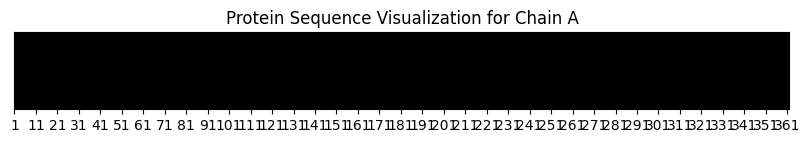

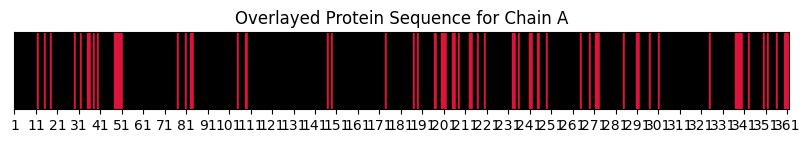

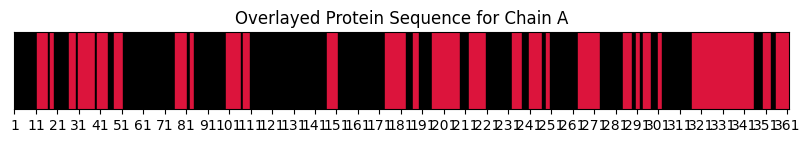


=== Group SASA Calculations for Chain A ===
A group (entire chain) residue count: 361, SASA sum: 80.32
B group (exposed residues) residue count: 124, SASA sum: 82.69
C group (secondary structures) residue count: 316, SASA sum: 117.61
B group SASA as percentage of A group: 102.95%
C group SASA as percentage of A group: 146.43%

Analyzing chain B...

=== Surface Area Results for Chain B ===
Total surface area of chain B: 0.00
Surface area of hydrophobic surface in chain B: 0.00

=== Surface Area Results for Chain B ===
Total surface area of exposed area ( > threshold): 0.00

Surface area of hydrophobic surface of exposed area ( > threshold): 0.00


=== Surface Area Results for Chain B ===
Total surface area of continous residues with expsed one  B: 0.00
Surface area of hydrophobic surface of continous residues with exposed one: 0.00



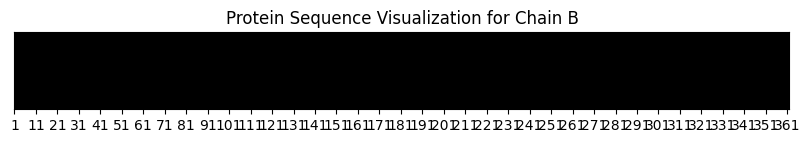

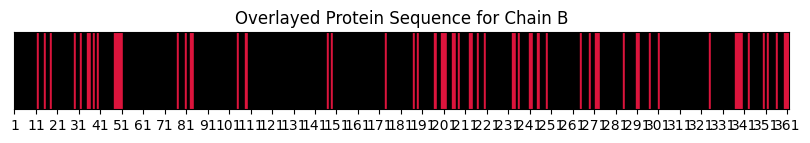

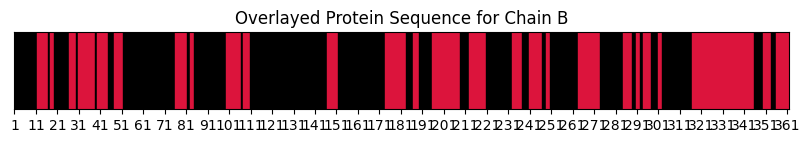


=== Group SASA Calculations for Chain B ===
A group (entire chain) residue count: 361, SASA sum: 80.24
B group (exposed residues) residue count: 124, SASA sum: 82.69
C group (secondary structures) residue count: 316, SASA sum: 117.61
B group SASA as percentage of A group: 103.05%
C group SASA as percentage of A group: 146.58%


In [ ]:
from time import sleep
import os
import pandas as pd
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser, DSSP
from pymol import cmd

# Set the working folder path
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# Load PDB or CIF file
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb or {pdb_id}.cif file does not exist in path {pdb_save_path}.")

    return structure

# Define the hydrophobic selection criteria
hydrophobic_selection = ( "(resn arg and name cg+cb) + (resn gln and name cg+cb) + (resn glu and name cg+cb) + "
                          "(resn ile and name cg1+cg2+cd1+cb) + (resn leu and name cg+cd1+cd2+cb) + "
                          "(resn lys and name cg+cd+cb) + (resn met and name cg+ce+cb) + "
                          "(resn phe and name cg+cd1+ce1+cz+ce2+cd2+cb) + (resn pro and name cg+cb) + "
                          "(resn thr and name cg2) + (resn trp and name cg+cd2+cz2+ch2+cz3+ce3+cb) + "
                          "(resn tyr and name cg+ce1+cd1+ce2+cd2+cb) + (resn val and name cg1+cg2+cb) + "
                          "(resn asn and name cb) + (resn ala and name cb) + (resn asp and name cb) + "
                          "(resn his and name cb) + (resn cys and name cb)")


# DSSP analysis function
def analyze_structure_with_dssp(structure, pdb_file_path):
    model = structure[0]  # Use the first model
    dssp = DSSP(model, pdb_file_path)

    # Extract residue number, name, exposure, secondary structure, etc. from DSSP
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])

    return dssp_data

# Identify exposed residues based on a user-defined accessibility threshold
def identify_exposed_residues(dssp_data, accessibility_threshold=0):
    exposed_residues = []
    for data in dssp_data:
        residue_number = data[1]
        accessibility = data[4]
        if accessibility > accessibility_threshold:  # Determine if exposed
            exposed_residues.append(residue_number)
    return exposed_residues

# Identify and save secondary structures including exposed residues
def identify_secondary_structures(dssp_data, exposed_residues):
    secondary_structure_data = []

    for exposed_residue in exposed_residues:
        dssp_residue_data = [data for data in dssp_data if data[1] == exposed_residue]

        if dssp_residue_data:
            chain_id, residue_number, residue_name, sec_structure, accessibility = dssp_residue_data[0]
            current_structure = sec_structure
            secondary_structure_data.append([residue_number, current_structure])

            # Find residues with the same secondary structure backwards
            i = residue_number - 1
            while i >= min(exposed_residues):
                prev_residue_data = [data for data in dssp_data if data[1] == i]
                if prev_residue_data and prev_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i -= 1

            # Find residues with the same secondary structure forwards
            i = residue_number + 1
            while i <= max(exposed_residues):
                next_residue_data = [data for data in dssp_data if data[1] == i]
                if next_residue_data and next_residue_data[0][3] == current_structure:
                    secondary_structure_data.append([i, current_structure])
                else:
                    break
                i += 1

    # Save to DataFrame
    df_secondary_structure = pd.DataFrame(secondary_structure_data, columns=['Residue Number', 'Secondary Structure'])
    return df_secondary_structure

# Visualization function
def visualize_protein_sequence(dssp_data, chain_id, highlighted_residues=None, highlighted_secondary_structure=None, overlay=False):
    if highlighted_residues is None:
        highlighted_residues = []
    if highlighted_secondary_structure is None:
        highlighted_secondary_structure = []

    # Filter residues for the selected chain
    chain_residues = [data for data in dssp_data if data[0] == chain_id]

    # Sequence length and residue numbers list
    sequence_length = len(chain_residues)
    residue_numbers = [res[1] for res in chain_residues]

    # Sequence visualization
    fig, ax = plt.subplots(figsize=(10, 1))
    bar = ax.bar(range(sequence_length), [1] * sequence_length, color='black', edgecolor='black')

    # Change color for highlighted residues
    for i, (residue_number, bar_segment) in enumerate(zip(residue_numbers, bar)):
        if overlay:
            if residue_number in highlighted_residues:
                bar_segment.set_color('crimson')
            elif residue_number in highlighted_secondary_structure:
                bar_segment.set_color('orange')
        else:
            if residue_number in highlighted_residues:
                bar_segment.set_color('crimson')
            elif residue_number in highlighted_secondary_structure:
                bar_segment.set_color('orange')

    ax.set_xlim(0, sequence_length)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_xticks(range(0, sequence_length, 10))
    ax.set_xticklabels(residue_numbers[::10])

    if overlay:
        ax.set_title(f'Overlayed Protein Sequence for Chain {chain_id}')
    else:
        ax.set_title(f'Protein Sequence Visualization for Chain {chain_id}')
    plt.show()

# Set up get_area calculation and usage function
def calculate_areas(pdb_id, chain_id, exposed_residues, df_secondary_structure):
    cmd.reinitialize()

    # Load PDB file
    pdb_file_path = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
    cmd.load(pdb_file_path)
    cmd.remove('solvent')

    # PyMOL settings for SASA calculation
    cmd.set('dot_solvent', 1)
    cmd.set('dot_density', 2)

    # 전체 넓이, 전체&hydrophobic 넓이
    total_area = cmd.get_area(selection=f'chain {chain_id}')
    cmd.select('total_hydrophobic', f'chain {chain_id} and ({hydrophobic_selection})')
    total_hydrophobic_area = cmd.get_area(selection='total_hydrophobic')

    # 입계값 조건 exposed, exposed & hydrophobic
    exposed_residues_str = '+'.join([str(res) for res in exposed_residues])
    cmd.select('exposed', f'chain {chain_id} and resi {exposed_residues_str}')
    exposed_area = cmd.get_area(selection='exposed')
    cmd.select('exposed_hydrophobic', f'chain {chain_id} and resi {exposed_residues_str} and ({hydrophobic_selection})')
    exposed_hydrophobic_area = cmd.get_area(selection='exposed_hydrophobic')

    # 연속 2차 구조, 연속 2차 & hydrophobic 넓이
    secondary_residues_str = '+'.join([str(res) for res in df_secondary_structure['Residue Number'].tolist()])
    cmd.select('secondary', f'chain {chain_id} and resi {secondary_residues_str}')
    secondary_area = cmd.get_area(selection='secondary')
    cmd.select('secondary_hydrophobic', f'chain {chain_id} and resi {secondary_residues_str} and ({hydrophobic_selection})')
    secondary_hydrophobic_area = cmd.get_area(selection='secondary_hydrophobic')

    return total_area, total_hydrophobic_area, exposed_area, exposed_hydrophobic_area, secondary_area, secondary_hydrophobic_area


# Main function for setting conditions and running analysis
def main():
    pdb_id_input = input("Enter PDB ID: ").strip().lower()
    pdb_id = pdb_id_input
    structure = load_structure(pdb_id, pdb_save_path)

    # DSSP analysis and visualization data preparation
    dssp_data = analyze_structure_with_dssp(structure, os.path.join(pdb_save_path, f"{pdb_id}.pdb"))
    chain_id = input("Enter chain ID to visualize (e.g., A, B or type 'total' for all chains): ").strip().upper()

    # Get SASA threshold from user input
    try:
        sasa_threshold = float(input("Enter rSASA (Relative Solvent Accessible Surface Area) threshold (default: 0, 0 <values< 1): ").strip())
    except ValueError:
        sasa_threshold = 0

    # 전체 체인 분석을 위한 처리
    if chain_id == 'TOTAL':
        chain_ids = sorted(set([residue[0] for residue in dssp_data]))  # dssp_data에서 모든 체인을 추출
    else:
        chain_ids = [chain_id]

    for chain in chain_ids:
        print(f"\nAnalyzing chain {chain}...")

        # Identify exposed residues and secondary structures
        exposed_residues = identify_exposed_residues(dssp_data, accessibility_threshold=sasa_threshold)

        df_secondary_structure = identify_secondary_structures(dssp_data, exposed_residues)

        # Calculate areas
        total_area, total_hydrophobic_area, exposed_area, exposed_hydrophobic_area, secondary_area, secondary_hydrophobic_area = calculate_areas(pdb_id, chain_id, exposed_residues, df_secondary_structure)

        # Display results for each chain
        print(f"\n=== Surface Area Results for Chain {chain} ===")
        print(f"Total surface area of chain {chain}: {total_area:.2f}")
        print(f"Surface area of hydrophobic surface in chain {chain}: {total_hydrophobic_area:.2f}")

        print(f"\n=== Surface Area Results for Chain {chain} ===")
        print(f"Total surface area of exposed area ( > threshold): {exposed_area:.2f}\n")
        print(f"Surface area of hydrophobic surface of exposed area ( > threshold): {exposed_hydrophobic_area:.2f}\n")

        print(f"\n=== Surface Area Results for Chain {chain} ===")
        print(f"Total surface area of continous residues with expsed one  {chain}: {secondary_area:.2f}")
        print(f"Surface area of hydrophobic surface of continous residues with exposed one: {secondary_hydrophobic_area:.2f}\n")


        # Visualize the sequences with highlighted features
        visualize_protein_sequence(dssp_data, chain, highlighted_residues=None, highlighted_secondary_structure=None, overlay=False)
        visualize_protein_sequence(dssp_data, chain, highlighted_residues=exposed_residues, overlay=True)
        visualize_protein_sequence(dssp_data, chain, highlighted_residues= df_secondary_structure['Residue Number'].tolist(), overlay=True)

        # Group calculations and ratiosv 이부분 수정해야됨 0906

        A_group_residues = [residue for residue in dssp_data if residue[0] == chain]
        A_count = len(A_group_residues)
        A_sasa_sum = sum([residue[4] for residue in A_group_residues])

        B_group_residues = [residue for residue in dssp_data if residue[1] in exposed_residues]
        B_count = len(B_group_residues)
        B_sasa_sum = sum([residue[4] for residue in B_group_residues])

        C_group_residues = [residue for residue in dssp_data if residue[1] in df_secondary_structure['Residue Number'].tolist()]
        C_count = len(C_group_residues)
        C_sasa_sum = sum([residue[4] for residue in C_group_residues])

        print(f"\n=== Group SASA Calculations for Chain {chain} ===")
        print(f"A group (entire chain) residue count: {A_count}, SASA sum: {A_sasa_sum:.2f}")
        print(f"B group (exposed residues) residue count: {B_count}, SASA sum: {B_sasa_sum:.2f}")
        print(f"C group (secondary structures) residue count: {C_count}, SASA sum: {C_sasa_sum:.2f}")

        # Optionally calculate and print SASA ratios between groups
        if A_sasa_sum > 0:
            B_to_A_ratio = (B_sasa_sum / A_sasa_sum) * 100
            C_to_A_ratio = (C_sasa_sum / A_sasa_sum) * 100
            print(f"B group SASA as percentage of A group: {B_to_A_ratio:.2f}%")
            print(f"C group SASA as percentage of A group: {C_to_A_ratio:.2f}%")

# 실행 부분
main()

## B factor 계산 및 시각화

PDB ID를 입력하세요: 5dn9


/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 11912.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 11986.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain A is discontinuous at line 12060.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/Bio/PDB/StructureBuilder.py:100: PDBConstructionWarning: WARNING: Chain B is discontinuous at line 12590.
  warnings.warn(


엑셀 파일이 저장되었습니다: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_analysis.xlsx


<Figure size 1200x500 with 0 Axes>

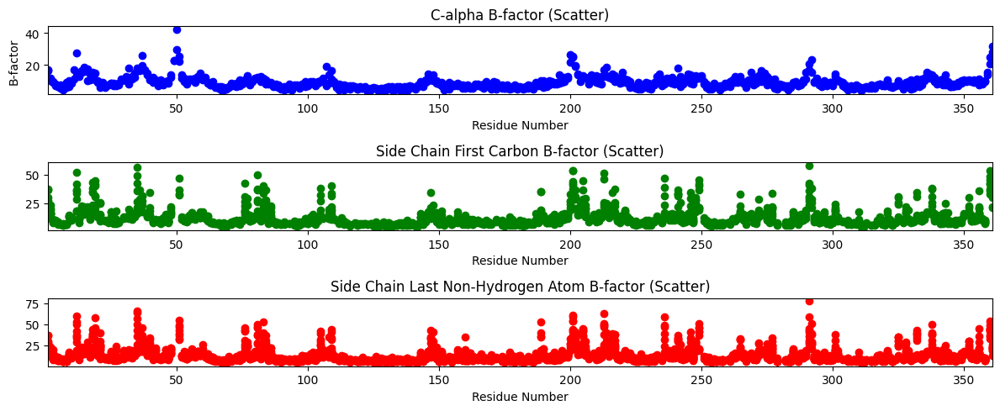

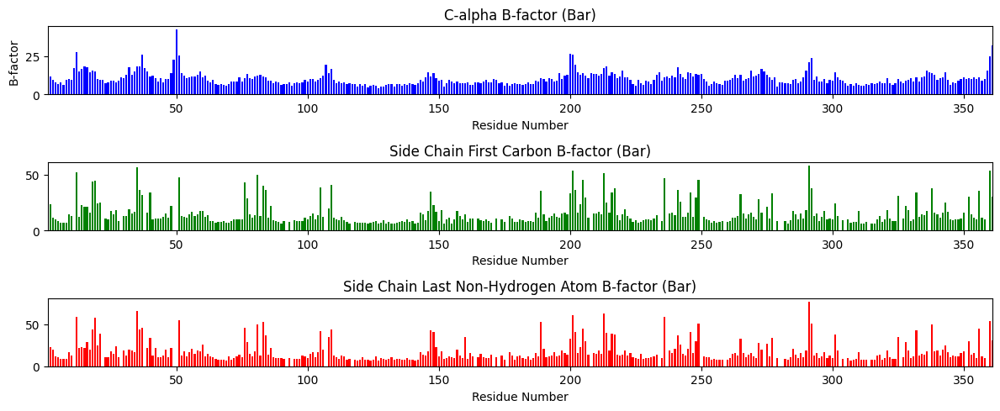

그래프가 저장되었습니다: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_b_factor_plots.png


<Figure size 640x480 with 0 Axes>

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from Bio.PDB import PDBParser, MMCIFParser
import requests

# 작업할 폴더 경로 설정
pdb_save_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results'
if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

# PDB 다운로드 함수
def download_pdb(pdb_id, save_path):
    url = f"https://files.rcsb.org/download/{pdb_id.upper()}.pdb"
    response = requests.get(url)
    if response.status_code == 200:
        with open(os.path.join(save_path, f"{pdb_id}.pdb"), 'wb') as f:
            f.write(response.content)
        print(f"Downloaded {pdb_id}.pdb")
    else:
        raise FileNotFoundError(f"Unable to download {pdb_id}.pdb from RCSB.")

# PDB 또는 CIF 파일 로드
def load_structure(pdb_id, save_path):
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if not os.path.exists(pdb_file_path) and not os.path.exists(cif_file_path):
        download_pdb(pdb_id, save_path)

    if os.path.exists(pdb_file_path):
        parser = PDBParser()
        structure = parser.get_structure(pdb_id, pdb_file_path)
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 {pdb_id}.cif 파일이 경로 {pdb_save_path}에 존재하지 않습니다.")

    return structure

# 원자 정보 추출 함수
def analyze_structure(structure):
    atom_data = []
    for model in structure:
        for chain in model:
            for residue in chain:
                for atom in residue:
                    residue_number = residue.get_id()[1]
                    residue_name = residue.get_resname()
                    atom_name = atom.get_name()
                    b_factor = atom.get_bfactor()
                    atom_data.append([residue_number, residue_name, atom_name, b_factor])

    df = pd.DataFrame(atom_data, columns=['Residue Number', 'Residue Name', 'Atom Name', 'B Factor'])
    return df
import matplotlib.pyplot as plt

import os
import matplotlib.pyplot as plt

# 그래프 그리기 및 저장 함수
def plot_b_factor(df, pdb_id, save_path):
    # Graph 1: C-alpha 의 B-factor
    ca_df = df[df['Atom Name'] == 'CA']

    # Graph 2: Side chain의 첫 Carbon B-factor
    side_chain_first_c_df = df[df['Atom Name'].isin(['CB', 'CG', 'CD', 'CE', 'CZ'])]

    # Graph 3: Side chain의 마지막 수소가 아닌 원자의 B-factor
    side_chain_last_non_h_df = df[~df['Atom Name'].str.startswith('H') & (df['Atom Name'] != 'N') &
                                  (df['Atom Name'] != 'C') & (df['Atom Name'] != 'O') &
                                  (df['Atom Name'] != 'CA')]

    plt.figure(figsize=(12, 5))

    # Set common x-axis limits based on residue number range
    x_min = ca_df['Residue Number'].min()
    x_max = ca_df['Residue Number'].max()

    # First set: Scatter Plots
    plt.figure(figsize=(12, 5))  # Set figure size for scatter plots
    # Graph 1 - C-alpha B-factor (Scatter)
    plt.subplot(3, 1, 1)
    plt.scatter(ca_df['Residue Number'], ca_df['B Factor'], color='b')
    plt.title('C-alpha B-factor (Scatter)')
    plt.xlabel('Residue Number')
    plt.ylabel('B-factor')
    plt.xlim(x_min, x_max)

    # Graph 2 - Side Chain First Carbon B-factor (Scatter)
    plt.subplot(3, 1, 2)
    plt.scatter(side_chain_first_c_df['Residue Number'], side_chain_first_c_df['B Factor'], color='g')
    plt.title('Side Chain First Carbon B-factor (Scatter)')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    # Graph 3 - Side Chain Last Non-Hydrogen Atom B-factor (Scatter)
    plt.subplot(3, 1, 3)
    plt.scatter(side_chain_last_non_h_df['Residue Number'], side_chain_last_non_h_df['B Factor'], color='r')
    plt.title('Side Chain Last Non-Hydrogen Atom B-factor (Scatter)')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    plt.tight_layout()
    plt.show()

    # Second set: Bar Graphs
    plt.figure(figsize=(12, 5))  # Set figure size for bar graphs

    # Graph 1 - C-alpha B-factor (Bar)
    plt.subplot(3, 1, 1)
    plt.bar(ca_df['Residue Number'], ca_df['B Factor'], color='b', width=0.7)
    plt.title('C-alpha B-factor (Bar)')
    plt.xlabel('Residue Number')
    plt.ylabel('B-factor')
    plt.xlim(x_min, x_max)

    # Graph 2 - Side Chain First Carbon B-factor (Bar)
    plt.subplot(3, 1, 2)
    plt.bar(side_chain_first_c_df['Residue Number'], side_chain_first_c_df['B Factor'], color='g', width=0.7)
    plt.title('Side Chain First Carbon B-factor (Bar)')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    # Graph 3 - Side Chain Last Non-Hydrogen Atom B-factor (Bar)
    plt.subplot(3, 1, 3)
    plt.bar(side_chain_last_non_h_df['Residue Number'], side_chain_last_non_h_df['B Factor'], color='r', width=0.7)
    plt.title('Side Chain Last Non-Hydrogen Atom B-factor (Bar)')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    plt.tight_layout()
    plt.show()

    # Save the plot to a file
    plot_file_path = os.path.join(save_path, f"{pdb_id}_b_factor_plots.png")
    plt.savefig(plot_file_path)
    print(f"그래프가 저장되었습니다: {plot_file_path}")
'''
# Example usage
pdb_id = 'example_pdb_id'  # Replace with your PDB ID
save_path = '.'  # Replace with your save path
plot_b_factor(df, pdb_id, save_path)  # Replace 'df' with your actual DataFrame

# 그래프 그리기 및 저장 함수
def plot_b_factor(df, pdb_id, save_path):
    # Graph 1: C-alpha 의 B-factor
    ca_df = df[df['Atom Name'] == 'CA']

    # Graph 2: Side chain의 첫 Carbon B-factor
    side_chain_first_c_df = df[df['Atom Name'].isin(['CB', 'CG', 'CD', 'CE', 'CZ'])]

    # Graph 3: Side chain의 마지막 수소가 아닌 원자의 B-factor
    side_chain_last_non_h_df = df[~df['Atom Name'].str.startswith('H') & (df['Atom Name'] != 'N') &
                                  (df['Atom Name'] != 'C') & (df['Atom Name'] != 'O') &
                                  (df['Atom Name'] != 'CA')]

    plt.figure(figsize=(15, 5))

    # Set common x-axis limits based on residue number range
    x_min = ca_df['Residue Number'].min()
    x_max = ca_df['Residue Number'].max()

    # Graph 1 - C-alpha B-factor
    plt.subplot(1, 3, 1)
    plt.scatter(ca_df['Residue Number'], ca_df['B Factor'], color='b')
    plt.title('C-alpha B-factor')
    plt.xlabel('Residue Number')
    plt.ylabel('B-factor')
    plt.xlim(x_min, x_max)

    # Graph 2 - Side Chain First Carbon B-factor
    plt.subplot(1, 3, 2)
    plt.scatter(side_chain_first_c_df['Residue Number'], side_chain_first_c_df['B Factor'], color='g')
    plt.title('Side Chain First Carbon B-factor')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    # Graph 3 - Side Chain Last Non-Hydrogen Atom B-factor
    plt.subplot(1, 3, 3)
    plt.scatter(side_chain_last_non_h_df['Residue Number'], side_chain_last_non_h_df['B Factor'], color='r')
    plt.title('Side Chain Last Non-Hydrogen Atom B-factor')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    plt.tight_layout()

    # Plotting as Bar Graph
    plt.figure(figsize=(10, 5))
    plt.bar(ca_df['Residue Number'], ca_df['B Factor'], color='b', width=0.8)
    plt.title('Average B-factor for Hydrophobic Residue Carbons')
    plt.xlabel('Residue Number')
    plt.ylabel('Average B-factor')

    # 그래프를 파일로 저장
    plot_file_path = os.path.join(save_path, f"{pdb_id}_b_factor_plots.png")
    plt.savefig(plot_file_path)
    plt.show()
    print(f"그래프가 저장되었습니다: {plot_file_path}")

    # Example usage (replace ca_df, side_chain_first_c_df, side_chain_last_non_h_df with your DataFrames)
    # x_min and x_max should be set to the minimum and maximum residue numbers from ca_df.
    #plot_b_factors_bar(ca_df, side_chain_first_c_df, side_chain_last_non_h_df, x_min, x_max)

    # Plotting B-factors as Bar Graphs
    # def plot_b_factors_bar(ca_df, side_chain_first_c_df, side_chain_last_non_h_df, x_min, x_max):
    plt.figure(figsize=(15, 5))  # Set a larger figure size for multiple plots

    # Graph 1 - C-alpha B-factor
    plt.subplot(1, 3, 1)
    plt.bar(ca_df['Residue Number'], ca_df['B Factor'], color='b', width=0.7)
    plt.title('C-alpha B-factor')
    plt.xlabel('Residue Number')
    plt.ylabel('B-factor')
    plt.xlim(x_min, x_max)

    # Graph 2 - Side Chain First Carbon B-factor
    plt.subplot(1, 3, 2)
    plt.bar(side_chain_first_c_df['Residue Number'], side_chain_first_c_df['B Factor'], color='g', width=0.7)
    plt.title('Side Chain First Carbon B-factor')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    # Graph 3 - Side Chain Last Non-Hydrogen Atom B-factor
    plt.subplot(1, 3, 3)
    plt.bar(side_chain_last_non_h_df['Residue Number'], side_chain_last_non_h_df['B Factor'], color='r', width=0.7)
    plt.title('Side Chain Last Non-Hydrogen Atom B-factor')
    plt.xlabel('Residue Number')
    plt.xlim(x_min, x_max)

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Show the plot
    plt.show()



# # 그래프 그리기 및 저장 함수
# def plot_b_factor(df, pdb_id, save_path):
#     # Graph 1: C-alpha 의 B-factor
#     ca_df = df[df['Atom Name'] == 'CA']

#     # Graph 2: Side chain의 첫 Carbon B-factor
#     side_chain_first_c_df = df[df['Atom Name'].isin(['CB', 'CG', 'CD', 'CE', 'CZ'])]

#     # Graph 3: Side chain의 마지막 수소가 아닌 원자의 B-factor
#     side_chain_last_non_h_df = df[~df['Atom Name'].str.startswith('H') & (df['Atom Name'] != 'N') & (df['Atom Name'] != 'C') & (df['Atom Name'] != 'O') & (df['Atom Name'] != 'CA')]

#     plt.figure(figsize=(15, 5))

#     # Graph 1
#     plt.subplot(1, 3, 1)
#     plt.plot(ca_df['Residue Number'], ca_df['B Factor'], marker='o', linestyle='-', color='b')
#     plt.title('C-alpha B-factor')
#     plt.xlabel('Residue Number')
#     plt.ylabel('B-factor')

#     # Graph 2
#     plt.subplot(1, 3, 2)
#     plt.plot(side_chain_first_c_df['Residue Number'], side_chain_first_c_df['B Factor'], marker='o', linestyle='-', color='g')
#     plt.title('Side Chain First Carbon B-factor')
#     plt.xlabel('Residue Number')

#     # Graph 3
#     plt.subplot(1, 3, 3)
#     plt.plot(side_chain_last_non_h_df['Residue Number'], side_chain_last_non_h_df['B Factor'], marker='o', linestyle='-', color='r')
#     plt.title('Side Chain Last Non-Hydrogen Atom B-factor')
#     plt.xlabel('Residue Number')

#     plt.tight_layout()

    #  # 그래프를 파일로 저장
    #  plot_file_path = os.path.join(save_path, f"{pdb_id}_b_factor_plots.png")
    #  plt.savefig(plot_file_path)
    #  plt.show()
    #  print(f"그래프가 저장되었습니다: {plot_file_path}")
'''
# 엑셀 파일 저장 함수
def save_to_excel(df, file_path):
    df.to_excel(file_path, index=False)
    print(f"엑셀 파일이 저장되었습니다: {file_path}")

# PDB ID 입력 및 분석 실행
pdb_id = input("PDB ID를 입력하세요: ").strip().lower()
structure = load_structure(pdb_id, pdb_save_path)
atom_df = analyze_structure(structure)

# 엑셀 파일로 데이터 저장
excel_file_path = os.path.join(pdb_save_path, f"{pdb_id}_analysis.xlsx")
save_to_excel(atom_df, excel_file_path)

# 그래프 그리기
plot_b_factor(atom_df, pdb_id, pdb_save_path)



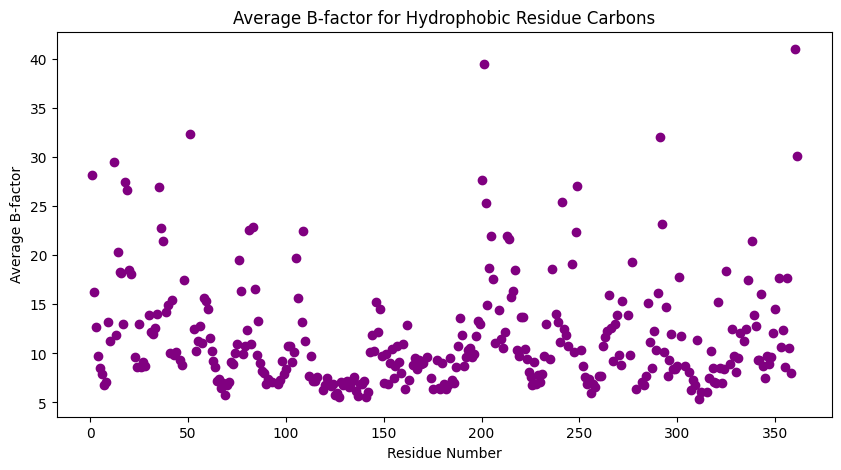

Hydrophobic residue B-factor graph saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_hydrophobic_b_factors.png


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 그래프 그리기 및 저장 함수 (Hydrophobic Residues)
def plot_hydrophobic_b_factors(df, pdb_id, save_path):
    # Define hydrophobic selection for residues and their atom names
    hydrophobic_residues = {
        'arg': ['CG', 'CB'],
        'gln': ['CG', 'CB'],
        'glu': ['CG', 'CB'],
        'ile': ['CG1', 'CG2', 'CD1', 'CB'],
        'leu': ['CG', 'CD1', 'CD2', 'CB'],
        'lys': ['CG', 'CD', 'CB'],
        'met': ['CG', 'CE', 'CB'],
        'phe': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
        'pro': ['CG', 'CB'],
        'thr': ['CG2'],
        'trp': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
        'tyr': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'],
        'val': ['CG1', 'CG2', 'CB'],
        'asn': ['CB'],
        'ala': ['CB'],
        'asp': ['CB'],
        'his': ['CB'],
        'cys': ['CB']
    }

    # Filter the DataFrame for atoms that match the hydrophobic selection
    hydrophobic_df = pd.DataFrame()

    for residue_name, atom_names in hydrophobic_residues.items():
        temp_df = df[(df['Residue Name'].str.lower() == residue_name) & (df['Atom Name'].isin(atom_names))]
        hydrophobic_df = pd.concat([hydrophobic_df, temp_df])

    # Calculate average B-factor per residue
    avg_b_factors = hydrophobic_df.groupby('Residue Number')['B Factor'].mean().reset_index()

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.scatter(avg_b_factors['Residue Number'], avg_b_factors['B Factor'], color='purple')
    plt.title('Average B-factor for Hydrophobic Residue Carbons')
    plt.xlabel('Residue Number')
    plt.ylabel('Average B-factor')

    # Save the plot
    plot_file_path = os.path.join(save_path, f"{pdb_id}_hydrophobic_b_factors.png")
    plt.savefig(plot_file_path)
    plt.show()
    print(f"Hydrophobic residue B-factor graph saved: {plot_file_path}")

# PDB ID 입력 및 분석 실행 (Assume you have already loaded and analyzed the structure)

# Assuming you already have `atom_df` from your previous analysis
# Now plot the hydrophobic B-factor graph
plot_hydrophobic_b_factors(atom_df, pdb_id, pdb_save_path)


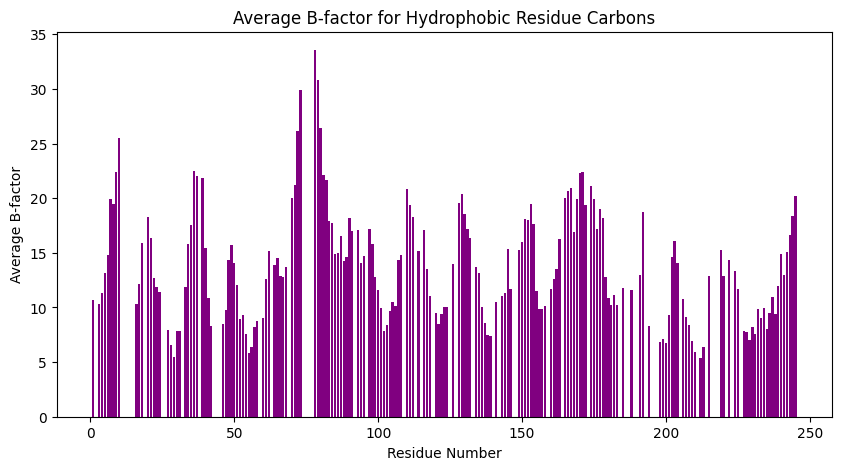

Hydrophobic residue B-factor bar graph saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_hydrophobic_b_factors_bar.png


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 그래프 그리기 및 저장 함수 (Hydrophobic Residues)
def plot_hydrophobic_b_factors_bar(df, pdb_id, save_path):
    # Define hydrophobic selection for residues and their atom names
    hydrophobic_residues = {
        'arg': ['CG', 'CB'],
        'gln': ['CG', 'CB'],
        'glu': ['CG', 'CB'],
        'ile': ['CG1', 'CG2', 'CD1', 'CB'],
        'leu': ['CG', 'CD1', 'CD2', 'CB'],
        'lys': ['CG', 'CD', 'CB'],
        'met': ['CG', 'CE', 'CB'],
        'phe': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
        'pro': ['CG', 'CB'],
        'thr': ['CG2'],
        'trp': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
        'tyr': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'],
        'val': ['CG1', 'CG2', 'CB'],
        'asn': ['CB'],
        'ala': ['CB'],
        'asp': ['CB'],
        'his': ['CB'],
        'cys': ['CB']
    }

    # Filter the DataFrame for atoms that match the hydrophobic selection
    hydrophobic_df = pd.DataFrame()

    for residue_name, atom_names in hydrophobic_residues.items():
        temp_df = df[(df['Residue Name'].str.lower() == residue_name) & (df['Atom Name'].isin(atom_names))]
        hydrophobic_df = pd.concat([hydrophobic_df, temp_df])

    # Calculate average B-factor per residue
    avg_b_factors = hydrophobic_df.groupby('Residue Number')['B Factor'].mean().reset_index()

    # Plotting as Bar Graph
    plt.figure(figsize=(12, 5))
    plt.bar(avg_b_factors['Residue Number'], avg_b_factors['B Factor'], color='purple', width=0.8)
    plt.title('Average B-factor for Hydrophobic Residue Carbons')
    plt.xlabel('Residue Number')
    plt.ylabel('Average B-factor')

    # Save the plot
    plot_file_path = os.path.join(save_path, f"{pdb_id}_hydrophobic_b_factors_bar.png")
    plt.savefig(plot_file_path)
    plt.show()
    print(f"Hydrophobic residue B-factor bar graph saved: {plot_file_path}")

# PDB ID 입력 및 분석 실행 (Assume you have already loaded and analyzed the structure)


# Assuming you already have `atom_df` from your previous analysis
# Now plot the hydrophobic B-factor bar graph
plot_hydrophobic_b_factors_bar(atom_df, pdb_id, pdb_save_path)


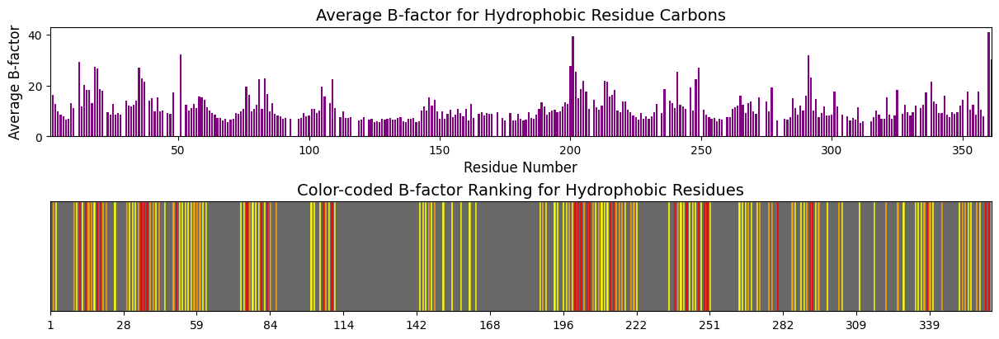

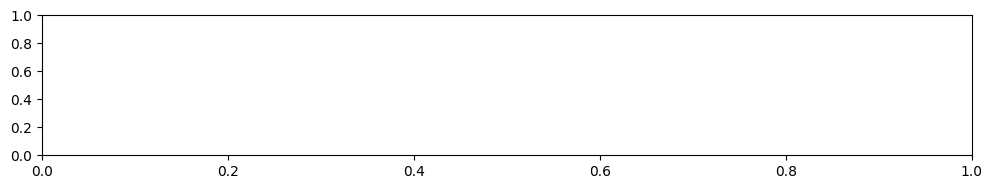

<Figure size 1200x200 with 0 Axes>

Hydrophobic residue B-factor graphs saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_hydrophobic_b_factors_bar_and_color.png


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

import matplotlib.pyplot as plt
import pandas as pd
import os

# 그래프 그리기 및 저장 함수 (Hydrophobic Residues)
def plot_hydrophobic_b_factors_bar_and_color(df, pdb_id, save_path):
    # Define hydrophobic selection for residues and their atom names
    hydrophobic_residues = {
        'arg': ['CG', 'CB'],
        'gln': ['CG', 'CB'],
        'glu': ['CG', 'CB'],
        'ile': ['CG1', 'CG2', 'CD1', 'CB'],
        'leu': ['CG', 'CD1', 'CD2', 'CB'],
        'lys': ['CG', 'CD', 'CB'],
        'met': ['CG', 'CE', 'CB'],
        'phe': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
        'pro': ['CG', 'CB'],
        'thr': ['CG2'],
        'trp': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
        'tyr': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'],
        'val': ['CG1', 'CG2', 'CB'],
        'asn': ['CB'],
        'ala': ['CB'],
        'asp': ['CB'],
        'his': ['CB'],
        'cys': ['CB']
    }

    # Filter the DataFrame for atoms that match the hydrophobic selection
    hydrophobic_df = pd.DataFrame()

    for residue_name, atom_names in hydrophobic_residues.items():
        temp_df = df[(df['Residue Name'].str.lower() == residue_name) & (df['Atom Name'].isin(atom_names))]
        hydrophobic_df = pd.concat([hydrophobic_df, temp_df])

    # Calculate average B-factor per residue
    avg_b_factors = hydrophobic_df.groupby('Residue Number')['B Factor'].mean().reset_index()

    # Sort avg_b_factors based on B-factor, but don't alter the order in the plot
    avg_b_factors_sorted = avg_b_factors.sort_values(by='B Factor', ascending=False).reset_index(drop=True)

    # Determine the number of residues in each percentile
    total_residues = len(avg_b_factors_sorted)
    top_10_percent = int(0.10 * total_residues)
    top_25_percent = int(0.25 * total_residues)
    top_50_percent = int(0.50 * total_residues)

    # Assign colors based on ranking
    # Create a dictionary to map colors back to the original residue order
    colors_dict = {}
    for idx, row in avg_b_factors_sorted.iterrows():
        if idx < top_10_percent:
            colors_dict[row['Residue Number']] = 'red'  # Top 0% ~ 10%
        elif idx < top_25_percent:
            colors_dict[row['Residue Number']] = 'orange'  # Top 10% ~ 25%
        elif idx < top_50_percent:
            colors_dict[row['Residue Number']] = 'yellow'  # Top 25% ~ 50
        else:
            colors_dict[row['Residue Number']] = 'dimgray'  # Bottom 50%

    # Get the original order of residue numbers and assign colors accordingly
    avg_b_factors['Color'] = avg_b_factors['Residue Number'].map(colors_dict)

    # Create the figure and subplots (one for the bar chart, one for the color-coded sequence)
    fig, axs = plt.subplots(2, 1, figsize=(12,4), constrained_layout=True)  # Adjust the figure size for balance

    # Set common limits
    x_min = avg_b_factors['Residue Number'].min()
    x_max = avg_b_factors['Residue Number'].max()

    # Graph 1: Bar Graph of Average B-factors
    plt.subplot(2,1,1)
    plt.figure(figsize = (12, 4))
    axs[0].bar(avg_b_factors['Residue Number'], avg_b_factors['B Factor'], color='purple', width=0.7)
    axs[0].set_title('Average B-factor for Hydrophobic Residue Carbons', fontsize=14)
    axs[0].set_xlim(x_min, x_max)
    axs[0].set_xlabel('Residue Number', fontsize=12)
    axs[0].set_ylabel('Average B-factor', fontsize=12)

    # Graph 2: Color-coded sequence bar (based on B-factor ranking)
    plt.subplot(2,1,2)
    plt.figure(figsize = (12, 2))
    sequence_length = len(avg_b_factors)
    residue_numbers = avg_b_factors['Residue Number'].values
    axs[1].bar(range(sequence_length), [1] * sequence_length, color=avg_b_factors['Color'], edgecolor='dimgray', width=0.9)

    # Customize x-axis to display residue numbers every 25 residues
    axs[1].set_xlim(0, sequence_length)
    axs[1].set_ylim(0, 1)
    axs[1].set_yticks([])  # No y-axis labels
    axs[1].set_xticks(range(0, sequence_length, 25))
    axs[1].set_xticklabels(residue_numbers[::25], fontsize=10)  # Show residue numbers as x-axis labels
    axs[1].set_title('Color-coded B-factor Ranking for Hydrophobic Residues', fontsize=14)

    # Improve layout
    plt.tight_layout()

    # Save the plot
    plot_file_path = os.path.join(save_path, f"{pdb_id}_hydrophobic_b_factors_bar_and_color.png")
    plt.savefig(plot_file_path)
    plt.show()

    print(f"Hydrophobic residue B-factor graphs saved: {plot_file_path}")

# Example usage (assuming the DataFrame 'df' is loaded):
# plot_hydrophobic_b_factors_bar_and_color(df, 'example_pdb', './')

# PDB ID 입력 및 분석 실행 (Assume you have already loaded and analyzed the structure)

# Now plot the hydrophobic B-factor bar graph and color-coded graph
plot_hydrophobic_b_factors_bar_and_color(atom_df, pdb_id, pdb_save_path)


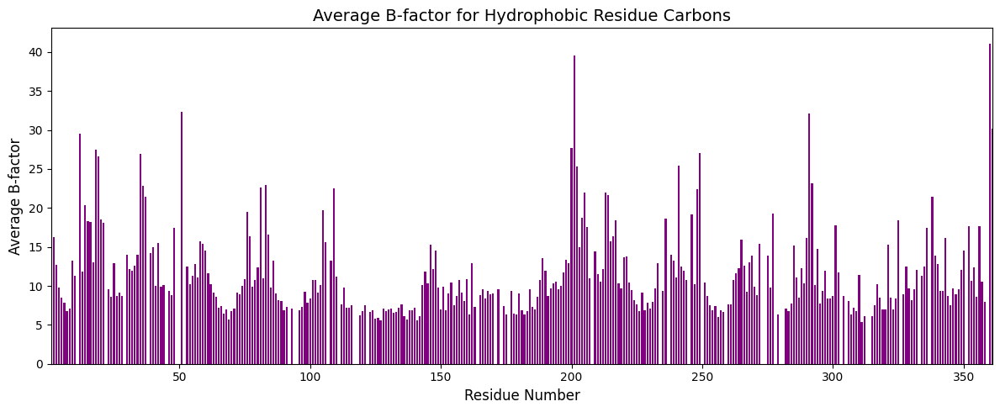

Bar graph saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_b_factors_bar.png


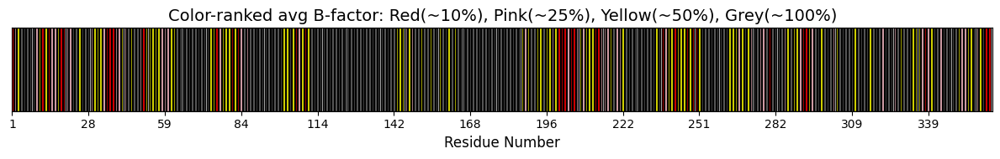

Color-coded graph saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/5dn9_b_factors_color.png


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import os

# 그래프 그리기 및 저장 함수 (Hydrophobic Residues)
def plot_hydrophobic_b_factors_bar_and_color(df, pdb_id, save_path):
    # Define hydrophobic selection for residues and their atom names
    hydrophobic_residues = {
        'arg': ['CG', 'CB'],
        'gln': ['CG', 'CB'],
        'glu': ['CG', 'CB'],
        'ile': ['CG1', 'CG2', 'CD1', 'CB'],
        'leu': ['CG', 'CD1', 'CD2', 'CB'],
        'lys': ['CG', 'CD', 'CB'],
        'met': ['CG', 'CE', 'CB'],
        'phe': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
        'pro': ['CG', 'CB'],
        'thr': ['CG2'],
        'trp': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
        'tyr': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'],
        'val': ['CG1', 'CG2', 'CB'],
        'asn': ['CB'],
        'ala': ['CB'],
        'asp': ['CB'],
        'his': ['CB'],
        'cys': ['CB']
    }

    # Filter the DataFrame for atoms that match the hydrophobic selection
    hydrophobic_df = pd.DataFrame()

    for residue_name, atom_names in hydrophobic_residues.items():
        temp_df = df[(df['Residue Name'].str.lower() == residue_name) & (df['Atom Name'].isin(atom_names))]
        hydrophobic_df = pd.concat([hydrophobic_df, temp_df])

    # Calculate average B-factor per residue
    avg_b_factors = hydrophobic_df.groupby('Residue Number')['B Factor'].mean().reset_index()

    # Sort avg_b_factors based on B-factor, but don't alter the order in the plot
    avg_b_factors_sorted = avg_b_factors.sort_values(by='B Factor', ascending=False).reset_index(drop=True)

    # Determine the number of residues in each percentile
    total_residues = len(avg_b_factors_sorted)
    top_10_percent = int(0.10 * total_residues)
    top_25_percent = int(0.25 * total_residues)
    top_50_percent = int(0.50 * total_residues)

    # Assign colors based on ranking
    colors_dict = {}
    for idx, row in avg_b_factors_sorted.iterrows():
        if idx < top_10_percent:
            colors_dict[row['Residue Number']] = 'red'  # Top 0% ~ 10%
        elif idx < top_25_percent:
            colors_dict[row['Residue Number']] = 'pink'  # Top 10% ~ 25%
        elif idx < top_50_percent:
            colors_dict[row['Residue Number']] = 'yellow'  # Top 25% ~ 50%
        else:
            colors_dict[row['Residue Number']] = 'dimgray'  # Bottom 75%

    # Get the original order of residue numbers and assign colors accordingly
    avg_b_factors['Color'] = avg_b_factors['Residue Number'].map(colors_dict)

    # --- First graph: Bar Graph of Average B-factors ---
    plt.figure(figsize=(12, 5))
    plt.bar(avg_b_factors['Residue Number'], avg_b_factors['B Factor'], color='purple', width=0.7)
    plt.title('Average B-factor for Hydrophobic Residue Carbons', fontsize=14)
    plt.xlim(avg_b_factors['Residue Number'].min(), avg_b_factors['Residue Number'].max())
    plt.xlabel('Residue Number', fontsize=12)
    plt.ylabel('Average B-factor', fontsize=12)

    # Save the bar graph
    bar_plot_file_path = os.path.join(save_path, f"{pdb_id}_b_factors_bar.png")
    plt.tight_layout()
    plt.savefig(bar_plot_file_path)
    plt.show()

    print(f"Bar graph saved: {bar_plot_file_path}")

    # --- Second graph: Color-coded sequence bar (based on B-factor ranking) ---
    plt.figure(figsize=(12, 2))
    sequence_length = len(avg_b_factors)
    residue_numbers = avg_b_factors['Residue Number'].values
    plt.bar(range(sequence_length), [1] * sequence_length, color=avg_b_factors['Color'], edgecolor='black', width=0.7)
    plt.xlabel('Residue Number', fontsize=12)

    # Customize x-axis to display residue numbers every 25 residues
    plt.xlim(0, sequence_length)
    plt.ylim(0, 1)
    plt.yticks([])  # No y-axis labels
    plt.xticks(range(0, sequence_length, 25), residue_numbers[::25], fontsize=10)  # Show residue numbers as x-axis labels
    plt.title('Color-ranked avg B-factor: Red(~10%), Pink(~25%), Yellow(~50%), Grey(~100%)', fontsize=14)

    # Save the color-coded sequence bar graph
    color_plot_file_path = os.path.join(save_path, f"{pdb_id}_b_factors_color.png")
    plt.tight_layout()
    plt.savefig(color_plot_file_path)
    plt.show()

    print(f"Color-coded graph saved: {color_plot_file_path}")

# Example usage (assuming the DataFrame 'df' is loaded):
# plot_hydrophobic_b_factors_bar_and_color(df, 'example_pdb', './')
plot_hydrophobic_b_factors_bar_and_color(atom_df, pdb_id, pdb_save_path)

In [ ]:
### 전처리 및 라이브러리 로드 부분 (기존과 동일)
from google.colab import drive
drive.mount('/content/drive')

import os
import matplotlib.pyplot as plt
import pandas as pd
from Bio import SeqIO
from Bio.PDB import PDBParser, MMCIFParser, DSSP
from Bio.PDB.PDBList import PDBList
import datetime

# PDB 저장 및 결과 디렉토리 설정
base_path = '/content/drive/MyDrive/Colab Notebooks/PDBLLM/'
pdb_save_path = os.path.join(base_path, 'my_pymol_results')
save_path = pdb_save_path

if not os.path.exists(pdb_save_path):
    os.makedirs(pdb_save_path)

### 아미노산, 분자량 테이블
three_to_one = {
    'ALA': 'A', 'ARG': 'R', 'ASN': 'N', 'ASP': 'D', 'CYS': 'C',
    'GLN': 'Q', 'GLU': 'E', 'GLY': 'G', 'HIS': 'H', 'ILE': 'I',
    'LEU': 'L', 'LYS': 'K', 'MET': 'M', 'PHE': 'F', 'PRO': 'P',
    'SER': 'S', 'THR': 'T', 'TRP': 'W', 'TYR': 'Y', 'VAL': 'V'
}

amino_acid_weights = {
    'ALA': 89.09, 'ARG': 174.20, 'ASN': 132.12, 'ASP': 133.10, 'CYS': 121.15,
    'GLN': 146.15, 'GLU': 147.13, 'GLY': 75.07, 'HIS': 155.16, 'ILE': 131.17,
    'LEU': 131.17, 'LYS': 146.19, 'MET': 149.21, 'PHE': 165.19, 'PRO': 115.13,
    'SER': 105.09, 'THR': 119.12, 'TRP': 204.23, 'TYR': 181.19, 'VAL': 117.15
}

# 소수성 아미노산 정의(수정 가능)
hydrophobic_residues = {
    'arg': ['CG', 'CB'],
    'gln': ['CG', 'CB'],
    'glu': ['CG', 'CB'],
    'ile': ['CG1', 'CG2', 'CD1', 'CB'],
    'leu': ['CG', 'CD1', 'CD2', 'CB'],
    'lys': ['CG', 'CD', 'CB'],
    'met': ['CG', 'CE', 'CB'],
    'phe': ['CG', 'CD1', 'CE1', 'CZ', 'CE2', 'CD2', 'CB'],
    'pro': ['CG', 'CB'],
    'thr': ['CG2'],
    'trp': ['CG', 'CD2', 'CZ2', 'CH2', 'CZ3', 'CE3', 'CB'],
    'tyr': ['CG', 'CE1', 'CD1', 'CE2', 'CD2', 'CB'],
    'val': ['CG1', 'CG2', 'CB'],
    'asn': ['CB'],
    'ala': ['CB'],
    'asp': ['CB'],
    'his': ['CB'],
    'cys': ['CB']
}

### 함수 정의
def download_pdb(pdb_id, save_path):
    """PDB 파일 다운로드"""
    pdbl = PDBList()
    pdbl.retrieve_pdb_file(pdb_id, file_format='pdb', pdir=save_path)
    print(f"{pdb_id} 파일이 다운로드되었습니다.")

def load_structure(pdb_id, save_path):
    """PDB 또는 CIF 파일 로드"""
    pdb_file_path = os.path.join(save_path, f"{pdb_id}.pdb")
    cif_file_path = os.path.join(save_path, f"{pdb_id}.cif")

    if os.path.exists(pdb_file_path):
        parser = PDBParser(QUIET=True)
        structure = parser.get_structure(pdb_id, pdb_file_path)
        return structure, pdb_file_path
    elif os.path.exists(cif_file_path):
        parser = MMCIFParser()
        structure = parser.get_structure(pdb_id, cif_file_path)
        return structure, cif_file_path
    else:
        raise FileNotFoundError(f"{pdb_id}.pdb 또는 .cif 파일이 {save_path}에 존재하지 않습니다.")

def extract_pdb_info(pdb_id, file_path):
    """PDB 기본 정보 및 체인별 시퀀스, 분자량 추출"""
    if file_path.endswith(".pdb") or file_path.endswith(".ent"):
        parser = PDBParser(QUIET=True)
    elif file_path.endswith(".cif"):
        parser = MMCIFParser()
    else:
        raise ValueError("지원되지 않는 파일 형식입니다.")

    structure = parser.get_structure(pdb_id, file_path)
    model = structure[0]

    # MMCIF 일 경우 추가 정보
    protein_name = "N/A"
    if file_path.endswith(".cif"):
        from Bio.PDB import MMCIF2Dict
        mmcif_dict = MMCIF2Dict.MMCIF2Dict(file_path)
        protein_name = mmcif_dict.get('_entity.pdbx_description', ['N/A'])[0]

    chains_info = {}
    total_molecular_weight = 0.0

    for chain in model:
        chain_id = chain.id
        chain_seq = ""
        chain_mw = 0.0
        for residue in chain:
            if residue.id[0] == " ":
                rname = residue.resname
                if rname in amino_acid_weights:
                    chain_mw += amino_acid_weights[rname]
                    chain_seq += three_to_one[rname]
        chains_info[chain_id] = {
            'sequence': chain_seq,
            'molecular_weight': chain_mw
        }
        total_molecular_weight += chain_mw

    # 필요 시 반환
    return structure, chains_info, total_molecular_weight, protein_name

def run_dssp(structure, file_path):
    """DSSP를 이용해 2차구조 및 접근가능면적 분석"""
    model = structure[0]
    dssp = DSSP(model, file_path)
    dssp_data = []
    for key, value in dssp.property_dict.items():
        chain_id, residue_id = key
        residue_number = residue_id[1]
        residue_name = value[1]
        secondary_structure = value[2]
        accessibility = value[3]
        dssp_data.append([chain_id, residue_number, residue_name, secondary_structure, accessibility])
    return dssp_data

def identify_exposed_residues(dssp_data, accessibility_threshold):
    exposed = []
    for data in dssp_data:
        if data[4] > accessibility_threshold:
            exposed.append(data[1])
    return exposed

def filter_hydrophobic_atoms(atom_df):
    """입력 DataFrame에서 hydrophobic_residues에 해당하는 원자만 필터링"""
    hydrophobic_df = pd.DataFrame()
    for rname, atms in hydrophobic_residues.items():
        temp_df = atom_df[(atom_df['Residue Name'].str.lower() == rname) & (atom_df['Atom Name'].isin(atms))]
        hydrophobic_df = pd.concat([hydrophobic_df, temp_df])
    return hydrophobic_df

def compute_b_factors(atom_df):
    """잔기별 평균 B-factor 계산"""
    avg_b = atom_df.groupby('Residue Number')['B Factor'].mean().reset_index()
    return avg_b

def rank_b_factors(avg_b_factors):
    """B-factor 순위에 따른 색상 할당"""
    avg_b_factors_sorted = avg_b_factors.sort_values(by='B Factor', ascending=False).reset_index(drop=True)
    total_residues = len(avg_b_factors_sorted)
    top_10_percent = int(0.10 * total_residues)
    top_25_percent = int(0.25 * total_residues)
    top_50_percent = int(0.50 * total_residues)

    colors_dict = {}
    for idx, row in avg_b_factors_sorted.iterrows():
        if idx < top_10_percent:
            colors_dict[row['Residue Number']] = 'red'
        elif idx < top_25_percent:
            colors_dict[row['Residue Number']] = 'pink'
        elif idx < top_50_percent:
            colors_dict[row['Residue Number']] = 'yellow'
        else:
            colors_dict[row['Residue Number']] = 'dimgray'
    avg_b_factors['Color'] = avg_b_factors['Residue Number'].map(colors_dict)
    return avg_b_factors

def plot_b_factors(avg_b_factors, pdb_id, save_path):
    """평균 B-factor 바 그래프 및 색상 시퀀스 그래프 저장"""
    # Bar graph
    plt.figure(figsize=(12, 5))
    plt.bar(avg_b_factors['Residue Number'], avg_b_factors['B Factor'], color='purple', width=0.7)
    plt.title(f'Average B-factor for Hydrophobic Residue Carbons - {pdb_id}')
    plt.xlabel('Residue Number')
    plt.ylabel('Average B-factor')
    plt.tight_layout()
    bar_plot_file = os.path.join(save_path, f"{pdb_id}_b_factors_bar.png")
    plt.savefig(bar_plot_file)
    plt.close()

    # Color-coded bar
    plt.figure(figsize=(12, 2))
    seq_len = len(avg_b_factors)
    res_nums = avg_b_factors['Residue Number'].values
    plt.bar(range(seq_len), [1]*seq_len, color=avg_b_factors['Color'], edgecolor='black', width=0.7)
    plt.xticks(range(0, seq_len, max(1,int(seq_len/10))), res_nums[::max(1,int(seq_len/10))])
    plt.yticks([])
    plt.title(f'Color-ranked avg B-factor: Red(~10%), Pink(~25%), Yellow(~50%), Grey(~100%) - {pdb_id}')
    plt.tight_layout()
    color_plot_file = os.path.join(save_path, f"{pdb_id}_b_factors_color.png")
    plt.savefig(color_plot_file)
    plt.close()

def process_pdb(pdb_id, sasa_thresholds):
    """단일 PDB ID에 대해 주어진 threshold 리스트를 순회하며 분석"""
    # 파일 로딩 확인
    file_pdb = os.path.join(pdb_save_path, f"{pdb_id}.pdb")
    file_cif = os.path.join(pdb_save_path, f"{pdb_id}.cif")
    if not (os.path.exists(file_pdb) or os.path.exists(file_cif)):
        download_pdb(pdb_id, pdb_save_path)

    # 구조 로드
    structure, file_path = load_structure(pdb_id, pdb_save_path)
    _, chains_info, total_mw, protein_name = extract_pdb_info(pdb_id, file_path)
    dssp_data = run_dssp(structure, file_path)

    # 구조에서 모든 원자를 DataFrame으로 정리(예: B-factor 분석용)
    # BioPython 구조 파싱 -> 원자 정보 수집
    atoms_list = []
    for model in structure:
        for chain in model:
            for residue in chain:
                if residue.id[0] == " ":
                    for atom in residue.get_atoms():
                        atoms_list.append([chain.id, residue.resname, residue.id[1],
                                           atom.get_name(), atom.get_bfactor()])
    atom_df = pd.DataFrame(atoms_list, columns=['Chain', 'Residue Name', 'Residue Number', 'Atom Name', 'B Factor'])

    results = []
    for threshold in sasa_thresholds:
        exposed = identify_exposed_residues(dssp_data, threshold)
        hydrophobic_df = filter_hydrophobic_atoms(atom_df)
        avg_b_factors = compute_b_factors(hydrophobic_df)
        avg_b_factors = rank_b_factors(avg_b_factors)
        plot_b_factors(avg_b_factors, f"{pdb_id}_sasa{threshold}", pdb_save_path)

        # 결과 테이블에 저장
        # 여기서는 각 threshold마다 상위 10% 평균 B-factor 도출 등 추가적 통계를 낼 수 있음
        # 예시: 상위 10% B-factor 평균 계산
        sorted_factors = avg_b_factors.sort_values('B Factor', ascending=False)
        top_10_count = max(1,int(len(sorted_factors)*0.1))
        top_10_mean = sorted_factors.head(top_10_count)['B Factor'].mean()
        results.append({
            'PDB_ID': pdb_id,
            'Protein_Name': protein_name,
            'SASA_Threshold': threshold,
            'Top10%_Mean_Bfactor': top_10_mean,
            'Total_Residue_Count': len(avg_b_factors)
        })

    return pd.DataFrame(results)

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from Bio.SeqUtils import seq1  # three_to_one 대신 seq1 사용

def visualize_chain_horizontal(dssp_data, chain_id='A', labeling_group=None):
    chain_residues = [res for res in dssp_data if res[0] == chain_id]
    chain_residues.sort(key=lambda x: x[1])  # residue_number 순으로 정렬

    residues = []
    for (c_id, r_num, r_name, s_struc, acc) in chain_residues:
        # seq1 함수는 3-letter 아미노산 코드를 1-letter 코드로 변환
        one_letter = seq1(r_name) if len(r_name) == 3 else 'X'

        if s_struc == 'H':
            sec_type = 'Helix'
        elif s_struc == 'E':
            sec_type = 'Strand'
        else:
            sec_type = 'Loop'

        residues.append((r_num, one_letter, sec_type))

    sequence_length = len(residues)
    color_map = {
        'Helix': '#FFA07A',
        'Strand': '#ADD8E6',
        'Loop': '#98FB98'
    }

    fig, ax = plt.subplots(figsize=(max(10,sequence_length*0.1), 2))

    if labeling_group:
        for group in labeling_group:
            if isinstance(group, tuple) and len(group) == 2:
                start_res, end_res = group
                indices = [i for i, (rnum,_,_) in enumerate(residues) if start_res <= rnum <= end_res]
                if indices:
                    left_idx = min(indices)
                    right_idx = max(indices)
                    rect = patches.Rectangle((left_idx-0.5, -0.4),
                                             (right_idx - left_idx + 1),
                                             0.8,
                                             linewidth=1,
                                             edgecolor='r',
                                             facecolor='yellow',
                                             alpha=0.3)
                    ax.add_patch(rect)
            else:
                # labeling_group이 리스트 형태일 경우
                if isinstance(group, list):
                    start_res, end_res = min(group), max(group)
                    indices = [i for i, (rnum,_,_) in enumerate(residues) if rnum in group]
                    if indices:
                        left_idx = min(indices)
                        right_idx = max(indices)
                        rect = patches.Rectangle((left_idx-0.5, -0.4),
                                                 (right_idx - left_idx + 1),
                                                 0.8,
                                                 linewidth=1,
                                                 edgecolor='r',
                                                 facecolor='yellow',
                                                 alpha=0.3)
                        ax.add_patch(rect)

    for i, (rnum, one_letter, sec_type) in enumerate(residues):
        col = color_map.get(sec_type, 'grey')
        ax.plot([i, i], [0,0], marker='s', markersize=10, color=col, markeredgecolor='black')
        ax.text(i, 0, one_letter, va='center', ha='center', fontsize=8, color='black')

    res_nums = [r[0] for r in residues]
    ax.set_xlim(-1, sequence_length)
    ax.set_ylim(-1, 1)
    ax.set_yticks([])

    tick_interval = max(1, sequence_length // 20)
    ax.set_xticks(range(0, sequence_length, tick_interval))
    ax.set_xticklabels([res_nums[i] for i in range(0, sequence_length, tick_interval)], rotation=90)

    ax.set_title(f"Chain {chain_id} Visualization: One-letter, Secondary Structure, Labeling Group")
    ax.set_xlabel("Residue Number")

    plt.tight_layout()
    plt.show()

def compute_labeling_group_stats(residues_df, labeling_group):
    """
    residues_df: 잔기별 평균 B-factor 정보가 들어있는 DataFrame
                 columns 예: ['Residue Number', 'B Factor']
    labeling_group: [(start, end), ...] 혹은 [res_list] 형태

    반환값: labeling 영역 내 평균 B-factor 등 원하는 통계치 딕셔너리
    """

    if not labeling_group:
        # 라벨링 그룹 없으면 None 반환
        return None

    # labeling_group을 단순화하여 모든 해당 residue number 집합을 획득
    labeling_residues = set()
    for group in labeling_group:
        if isinstance(group, tuple) and len(group) == 2:
            start_res, end_res = group
            labeling_residues.update(range(start_res, end_res+1))
        elif isinstance(group, list):
            labeling_residues.update(group)
        else:
            # 형식이 다를 경우 예외 처리
            pass

    # labeling_residues에 해당하는 행 필터링
    subset_df = residues_df[residues_df['Residue Number'].isin(labeling_residues)]
    if len(subset_df) == 0:
        return None

    # 예: 평균 B-factor 계산
    mean_b = subset_df['B Factor'].mean()
    max_b = subset_df['B Factor'].max()
    count_label = len(subset_df)

    # 필요 시 상위 10% 비율, 중앙값 등 다른 통계치도 계산 가능
    return {
        'Labeling_Mean_Bfactor': mean_b,
        'Labeling_Max_Bfactor': max_b,
        'Labeling_Residue_Count': count_label
    }


def process_pdb(pdb_id, sasa_thresholds, labeling_group=None):
    """
    기존 process_pdb 함수에 labeling_group 파라미터 추가.
    labeling_group을 통해 라벨링 영역 통계 계산 및 시각화 파일 path 기록.
    """
    if not (os.path.exists(os.path.join(pdb_save_path, f"{pdb_id}.pdb")) or
            os.path.exists(os.path.join(pdb_save_path, f"{pdb_id}.cif"))):
        download_pdb(pdb_id, pdb_save_path)

    structure, file_path = load_structure(pdb_id, pdb_save_path)
    _, chains_info, total_mw, protein_name = extract_pdb_info(pdb_id, file_path)
    dssp_data = run_dssp(structure, file_path)

    # atom_df 생성(이전 코드와 동일)
    atoms_list = []
    for model in structure:
        for chain in model:
            for residue in chain:
                if residue.id[0] == " ":
                    for atom in residue.get_atoms():
                        atoms_list.append([chain.id, residue.resname, residue.id[1],
                                           atom.get_name(), atom.get_bfactor()])
    atom_df = pd.DataFrame(atoms_list, columns=['Chain', 'Residue Name', 'Residue Number', 'Atom Name', 'B Factor'])

    results = []
    for threshold in sasa_thresholds:
        exposed = identify_exposed_residues(dssp_data, threshold)
        hydrophobic_df = filter_hydrophobic_atoms(atom_df)
        avg_b_factors = compute_b_factors(hydrophobic_df)
        avg_b_factors = rank_b_factors(avg_b_factors)

        # 기존 바 그래프 그리기
        plot_b_factors(avg_b_factors, f"{pdb_id}_sasa{threshold}", pdb_save_path)

        # 라벨링 그룹을 포함한 시각화 (옵션)
        # labeling_group이 있다면 visualize_chain_horizontal 호출
        chain_id = 'A'  # 필요시 사용자 지정
        chain_plot_file = None
        if labeling_group:
            # 시각화
            # visualize_chain_horizontal 함수 내부를 수정해 파일 저장 기능 추가
            chain_plot_file = visualize_chain_horizontal_save(dssp_data, chain_id, labeling_group, pdb_id, threshold)

        # 라벨링 그룹 통계
        labeling_stats = compute_labeling_group_stats(avg_b_factors, labeling_group)

        sorted_factors = avg_b_factors.sort_values('B Factor', ascending=False)
        top_10_count = max(1,int(len(sorted_factors)*0.1))
        top_10_mean = sorted_factors.head(top_10_count)['B Factor'].mean()

        result_entry = {
            'PDB_ID': pdb_id,
            'Protein_Name': protein_name,
            'SASA_Threshold': threshold,
            'Top10%_Mean_Bfactor': top_10_mean,
            'Total_Residue_Count': len(avg_b_factors)
        }

        if labeling_stats:
            result_entry.update(labeling_stats)

        if chain_plot_file:
            result_entry['Chain_Visualization_File'] = chain_plot_file

        results.append(result_entry)

    return pd.DataFrame(results)


def visualize_chain_horizontal_save(dssp_data, chain_id, labeling_group, pdb_id, threshold):
    """
    이전에 만든 visualize_chain_horizontal 함수를 수정하여
    플롯을 파일로 저장하고 경로를 반환하도록 함.
    """
    from Bio.SeqUtils import seq1
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    chain_residues = [res for res in dssp_data if res[0] == chain_id]
    chain_residues.sort(key=lambda x: x[1])

    residues = []
    for (c_id, r_num, r_name, s_struc, acc) in chain_residues:
        one_letter = seq1(r_name) if len(r_name) == 3 else 'X'
        if s_struc == 'H':
            sec_type = 'Helix'
        elif s_struc == 'E':
            sec_type = 'Strand'
        else:
            sec_type = 'Loop'
        residues.append((r_num, one_letter, sec_type))

    sequence_length = len(residues)
    color_map = {
        'Helix': '#FFA07A',
        'Strand': '#ADD8E6',
        'Loop': '#98FB98'
    }

    fig, ax = plt.subplots(figsize=(max(10, sequence_length*0.1), 2))

    if labeling_group:
        for group in labeling_group:
            if isinstance(group, tuple) and len(group) == 2:
                start_res, end_res = group
                indices = [i for i, (rnum,_,_) in enumerate(residues) if start_res <= rnum <= end_res]
                if indices:
                    left_idx = min(indices)
                    right_idx = max(indices)
                    rect = patches.Rectangle((left_idx-0.5, -0.4),
                                             (right_idx - left_idx + 1),
                                             0.8,
                                             linewidth=1,
                                             edgecolor='r',
                                             facecolor='yellow',
                                             alpha=0.3)
                    ax.add_patch(rect)
            elif isinstance(group, list):
                start_res, end_res = min(group), max(group)
                indices = [i for i, (rnum,_,_) in enumerate(residues) if rnum in group]
                if indices:
                    left_idx = min(indices)
                    right_idx = max(indices)
                    rect = patches.Rectangle((left_idx-0.5, -0.4),
                                             (right_idx - left_idx + 1),
                                             0.8,
                                             linewidth=1,
                                             edgecolor='r',
                                             facecolor='yellow',
                                             alpha=0.3)
                    ax.add_patch(rect)

    for i, (rnum, one_letter, sec_type) in enumerate(residues):
        col = color_map.get(sec_type, 'grey')
        ax.plot([i, i], [0,0], marker='s', markersize=10, color=col, markeredgecolor='black')
        ax.text(i, 0, one_letter, va='center', ha='center', fontsize=8, color='black')

    res_nums = [r[0] for r in residues]
    ax.set_xlim(-1, sequence_length)
    ax.set_ylim(-1, 1)
    ax.set_yticks([])

    tick_interval = max(1, sequence_length // 20)
    ax.set_xticks(range(0, sequence_length, tick_interval))
    ax.set_xticklabels([res_nums[i] for i in range(0, sequence_length, tick_interval)], rotation=90)

    ax.set_title(f"{pdb_id} Chain {chain_id} Visualization (SASA:{threshold})")
    ax.set_xlabel("Residue Number")

    plt.tight_layout()

    # 결과 그림 저장
    chain_plot_file = os.path.join(pdb_save_path, f"{pdb_id}_chain{chain_id}_sasa{threshold}.png")
    plt.savefig(chain_plot_file)
    plt.close()

    return chain_plot_file


def main():
    # 다중 PDB 분석
    pdb_ids = input("분석할 PDB ID들을 입력하세요 (쉼표로 구분): ").strip().split(',')
    pdb_ids = [p.strip().lower() for p in pdb_ids if p.strip() != '']
    if not pdb_ids:
        print("유효한 PDB ID가 없습니다.")
        return

    # 여러 임계값에 대한 민감도 분석
    sasa_thresholds = input("SASA 임계값들을 쉼표로 구분하여 입력 (예: 0,50,100): ").strip().split(',')
    sasa_thresholds = [float(v.strip()) for v in sasa_thresholds if v.strip() != '']

    all_results = pd.DataFrame()

    for pdb_id in pdb_ids:
        pdb_results = process_pdb(pdb_id, sasa_thresholds)
        all_results = pd.concat([all_results, pdb_results])

    # 결과 CSV 저장
    result_file = os.path.join(pdb_save_path, "analysis_results.csv")
    all_results.to_csv(result_file, index=False)
    print(f"최종 결과가 {result_file}에 저장되었습니다.")

    # 향후 RMSF 등 MD 결과 통합 가능 (여기서는 MD 없이 구조 기반 분석)
    # 추후 MD 시뮬레이션을 통해 RMSF나 alternative conformations 데이터프레임을 생성 후
    # all_results와 merge하여 더욱 풍부한 해석 가능.

if __name__ == "__main__":
    main()
#4cha, 5dn9, 5wr9, 1cf3, 1tgu

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
분석할 PDB ID들을 입력하세요 (쉼표로 구분): 4cha
SASA 임계값들을 쉼표로 구분하여 입력 (예: 0,50,100): 50
최종 결과가 /content/drive/MyDrive/Colab Notebooks/PDBLLM/my_pymol_results/analysis_results.csv에 저장되었습니다.


In [ ]:
def compute_labeling_group_stats(residues_df, labeling_group):
    """
    residues_df: 잔기별 평균 B-factor 정보가 들어있는 DataFrame
                 columns 예: ['Residue Number', 'B Factor']
    labeling_group: [(start, end), ...] 혹은 [res_list] 형태

    반환값: labeling 영역 내 평균 B-factor 등 원하는 통계치 딕셔너리
    """

    if not labeling_group:
        # 라벨링 그룹 없으면 None 반환
        return None

    # labeling_group을 단순화하여 모든 해당 residue number 집합을 획득
    labeling_residues = set()
    for group in labeling_group:
        if isinstance(group, tuple) and len(group) == 2:
            start_res, end_res = group
            labeling_residues.update(range(start_res, end_res+1))
        elif isinstance(group, list):
            labeling_residues.update(group)
        else:
            # 형식이 다를 경우 예외 처리
            pass

    # labeling_residues에 해당하는 행 필터링
    subset_df = residues_df[residues_df['Residue Number'].isin(labeling_residues)]
    if len(subset_df) == 0:
        return None

    # 예: 평균 B-factor 계산
    mean_b = subset_df['B Factor'].mean()
    max_b = subset_df['B Factor'].max()
    count_label = len(subset_df)

    # 필요 시 상위 10% 비율, 중앙값 등 다른 통계치도 계산 가능
    return {
        'Labeling_Mean_Bfactor': mean_b,
        'Labeling_Max_Bfactor': max_b,
        'Labeling_Residue_Count': count_label
    }


def process_pdb(pdb_id, sasa_thresholds, labeling_group=None):
    """
    기존 process_pdb 함수에 labeling_group 파라미터 추가.
    labeling_group을 통해 라벨링 영역 통계 계산 및 시각화 파일 path 기록.
    """
    if not (os.path.exists(os.path.join(pdb_save_path, f"{pdb_id}.pdb")) or
            os.path.exists(os.path.join(pdb_save_path, f"{pdb_id}.cif"))):
        download_pdb(pdb_id, pdb_save_path)

    structure, file_path = load_structure(pdb_id, pdb_save_path)
    _, chains_info, total_mw, protein_name = extract_pdb_info(pdb_id, file_path)
    dssp_data = run_dssp(structure, file_path)

    # atom_df 생성(이전 코드와 동일)
    atoms_list = []
    for model in structure:
        for chain in model:
            for residue in chain:
                if residue.id[0] == " ":
                    for atom in residue.get_atoms():
                        atoms_list.append([chain.id, residue.resname, residue.id[1],
                                           atom.get_name(), atom.get_bfactor()])
    atom_df = pd.DataFrame(atoms_list, columns=['Chain', 'Residue Name', 'Residue Number', 'Atom Name', 'B Factor'])

    results = []
    for threshold in sasa_thresholds:
        exposed = identify_exposed_residues(dssp_data, threshold)
        hydrophobic_df = filter_hydrophobic_atoms(atom_df)
        avg_b_factors = compute_b_factors(hydrophobic_df)
        avg_b_factors = rank_b_factors(avg_b_factors)

        # 기존 바 그래프 그리기
        plot_b_factors(avg_b_factors, f"{pdb_id}_sasa{threshold}", pdb_save_path)

        # 라벨링 그룹을 포함한 시각화 (옵션)
        # labeling_group이 있다면 visualize_chain_horizontal 호출
        chain_id = 'A'  # 필요시 사용자 지정
        chain_plot_file = None
        if labeling_group:
            # 시각화
            # visualize_chain_horizontal 함수 내부를 수정해 파일 저장 기능 추가
            chain_plot_file = visualize_chain_horizontal_save(dssp_data, chain_id, labeling_group, pdb_id, threshold)

        # 라벨링 그룹 통계
        labeling_stats = compute_labeling_group_stats(avg_b_factors, labeling_group)

        sorted_factors = avg_b_factors.sort_values('B Factor', ascending=False)
        top_10_count = max(1,int(len(sorted_factors)*0.1))
        top_10_mean = sorted_factors.head(top_10_count)['B Factor'].mean()

        result_entry = {
            'PDB_ID': pdb_id,
            'Protein_Name': protein_name,
            'SASA_Threshold': threshold,
            'Top10%_Mean_Bfactor': top_10_mean,
            'Total_Residue_Count': len(avg_b_factors)
        }

        if labeling_stats:
            result_entry.update(labeling_stats)

        if chain_plot_file:
            result_entry['Chain_Visualization_File'] = chain_plot_file

        results.append(result_entry)

    return pd.DataFrame(results)


def visualize_chain_horizontal_save(dssp_data, chain_id, labeling_group, pdb_id, threshold):
    """
    이전에 만든 visualize_chain_horizontal 함수를 수정하여
    플롯을 파일로 저장하고 경로를 반환하도록 함.
    """
    from Bio.SeqUtils import seq1
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    chain_residues = [res for res in dssp_data if res[0] == chain_id]
    chain_residues.sort(key=lambda x: x[1])

    residues = []
    for (c_id, r_num, r_name, s_struc, acc) in chain_residues:
        one_letter = seq1(r_name) if len(r_name) == 3 else 'X'
        if s_struc == 'H':
            sec_type = 'Helix'
        elif s_struc == 'E':
            sec_type = 'Strand'
        else:
            sec_type = 'Loop'
        residues.append((r_num, one_letter, sec_type))

    sequence_length = len(residues)
    color_map = {
        'Helix': '#FFA07A',
        'Strand': '#ADD8E6',
        'Loop': '#98FB98'
    }

    fig, ax = plt.subplots(figsize=(max(10, sequence_length*0.1), 2))

    if labeling_group:
        for group in labeling_group:
            if isinstance(group, tuple) and len(group) == 2:
                start_res, end_res = group
                indices = [i for i, (rnum,_,_) in enumerate(residues) if start_res <= rnum <= end_res]
                if indices:
                    left_idx = min(indices)
                    right_idx = max(indices)
                    rect = patches.Rectangle((left_idx-0.5, -0.4),
                                             (right_idx - left_idx + 1),
                                             0.8,
                                             linewidth=1,
                                             edgecolor='r',
                                             facecolor='yellow',
                                             alpha=0.3)
                    ax.add_patch(rect)
            elif isinstance(group, list):
                start_res, end_res = min(group), max(group)
                indices = [i for i, (rnum,_,_) in enumerate(residues) if rnum in group]
                if indices:
                    left_idx = min(indices)
                    right_idx = max(indices)
                    rect = patches.Rectangle((left_idx-0.5, -0.4),
                                             (right_idx - left_idx + 1),
                                             0.8,
                                             linewidth=1,
                                             edgecolor='r',
                                             facecolor='yellow',
                                             alpha=0.3)
                    ax.add_patch(rect)

    for i, (rnum, one_letter, sec_type) in enumerate(residues):
        col = color_map.get(sec_type, 'grey')
        ax.plot([i, i], [0,0], marker='s', markersize=10, color=col, markeredgecolor='black')
        ax.text(i, 0, one_letter, va='center', ha='center', fontsize=8, color='black')

    res_nums = [r[0] for r in residues]
    ax.set_xlim(-1, sequence_length)
    ax.set_ylim(-1, 1)
    ax.set_yticks([])

    tick_interval = max(1, sequence_length // 20)
    ax.set_xticks(range(0, sequence_length, tick_interval))
    ax.set_xticklabels([res_nums[i] for i in range(0, sequence_length, tick_interval)], rotation=90)

    ax.set_title(f"{pdb_id} Chain {chain_id} Visualization (SASA:{threshold})")
    ax.set_xlabel("Residue Number")

    plt.tight_layout()

    # 결과 그림 저장
    chain_plot_file = os.path.join(pdb_save_path, f"{pdb_id}_chain{chain_id}_sasa{threshold}.png")
    plt.savefig(chain_plot_file)
    plt.close()

    return chain_plot_file


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
E: dpkg was interrupted, you must manually run 'dpkg --configure -a' to correct the problem. 
ERROR: Could not find a version that satisfies the requirement pymol2==0.5.0 (from versions: none)
ERROR: No matching distribution found for pymol2==0.5.0
Enter the PDB ID: 1tgu
Enter the chain ID: A,B,C,D,E,F
All residues information saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/analysis_outputs/pdb_processing/1TGU_all_residues.csv
Chain summary saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/analysis_outputs/pdb_processing/1TGU_chain_summary.csv
Overall amino acid composition saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/analysis_outputs/pdb_processing/1TGU_overall_amino_acids.csv
Hydrophobic SASA results saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/analysis_outputs/pymol_sasa/1TGU_chain_A,B,C,D,E,F_hydrophobic_sasa.csv


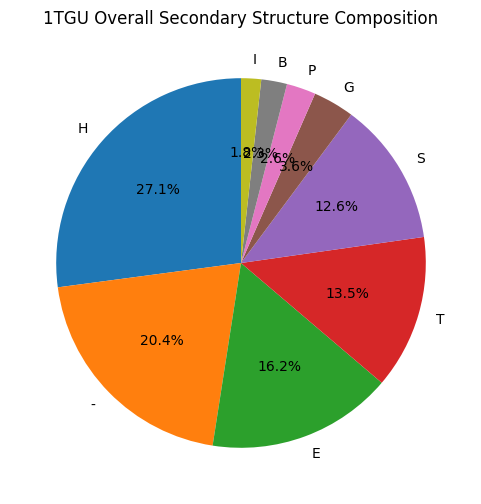

Figure saved: /content/drive/MyDrive/Colab Notebooks/PDBLLM/analysis_outputs/figures/1TGU_overall_sec_distribution.png

All processing complete. Check the directories for CSV and PNG outputs.


In [ ]:
#############################
# 초기 환경 설정 (Google Drive 마운트, 폴더 구조 생성)
#############################
from google.colab import drive
drive.mount('/content/drive')

import os
import sys
import matplotlib.pyplot as plt
import pandas as pd
from Bio.PDB import PDBList, PDBParser
from Bio.PDB.DSSP import DSSP
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from Bio.SeqUtils import seq1

!apt-get install -y dssp
!pip install pymol2==0.5.0 biopython

from pymol import cmd

# 기본 작업 디렉토리
base_dir = "/content/drive/MyDrive/Colab Notebooks/PDBLLM"

# 폴더 구조 생성
raw_data_dir = os.path.join(base_dir, "raw_data")
analysis_dir = os.path.join(base_dir, "analysis_outputs")
pdb_proc_dir = os.path.join(analysis_dir, "pdb_processing")
pymol_sasa_dir = os.path.join(analysis_dir, "pymol_sasa")
figures_dir = os.path.join(analysis_dir, "figures")

for d in [raw_data_dir, analysis_dir, pdb_proc_dir, pymol_sasa_dir, figures_dir]:
    if not os.path.exists(d):
        os.makedirs(d)

#############################
# 사용자 입력
#############################
pdb_id = input("Enter the PDB ID: ").strip().upper()
chain_id = input("Enter the chain ID: ").strip().upper()

#############################
# PDB 파일 다운로드
#############################
pdb_file = os.path.join(raw_data_dir, f"{pdb_id}.pdb")
if not os.path.exists(pdb_file):
    print(f"Downloading {pdb_id}...")
    pdbl = PDBList()
    pdbl.retrieve_pdb_file(pdb_id, pdir=raw_data_dir, file_format="pdb")
    downloaded_file = os.path.join(raw_data_dir, f"pdb{pdb_id.lower()}.ent")
    if os.path.exists(downloaded_file):
        os.rename(downloaded_file, pdb_file)
else:
    print(f"Structure exists: '{pdb_file}'")

#############################
# PDB 파싱 & DSSP 분석
#############################
parser = PDBParser(QUIET=True)
structure = parser.get_structure(pdb_id, pdb_file)
model = structure[0]

try:
    dssp = DSSP(model, pdb_file)
except Exception as e:
    print("DSSP 실행에 문제가 발생했습니다. DSSP가 설치되었는지 확인해주세요.")
    raise e

# DSSP 결과를 DataFrame으로 정리
all_res_data = []
for key in dssp.keys():
    chain_, (hetfield, resnum, icode) = key
    if hetfield == ' ':  # 표준 아미노산
        resname_3 = model[chain_][(hetfield, resnum, icode)].resname
        sec_str = dssp[key][2]
        asa = dssp[key][3]
        all_res_data.append([chain_, resnum, resname_3, sec_str, asa])

all_res_df = pd.DataFrame(all_res_data, columns=['Chain','Residue Number','Residue Name(3-letter)','Sec.Structure','ASA'])
all_res_csv = os.path.join(pdb_proc_dir, f"{pdb_id}_all_residues.csv")
all_res_df.to_csv(all_res_csv, index=False)
print(f"All residues information saved: {all_res_csv}")

#############################
# 전체 단백질 one-letter 시퀀스 및 분석
#############################
# 전체 chain 시퀀스 추출
chains = list(set(all_res_df['Chain']))
total_sequence = ""
chain_info_list = []

for c in chains:
    chain_df = all_res_df[all_res_df['Chain'] == c]
    # residue order로 정렬
    chain_df = chain_df.sort_values('Residue Number')
    seq_3 = chain_df['Residue Name(3-letter)'].tolist()
    seq_1 = "".join([seq1(x) if len(x)==3 else 'X' for x in seq_3])
    total_sequence += seq_1

    # 아미노산 조성
    aa_count = pd.Series(list(seq_1)).value_counts()
    aa_comp_df = aa_count.reset_index()
    aa_comp_df.columns = ['Amino Acid','Count']
    aa_comp_df['Percentage'] = aa_comp_df['Count']/aa_comp_df['Count'].sum()*100
    aa_comp_df = aa_comp_df.sort_values('Count', ascending=False)
    chain_aa_csv = os.path.join(pdb_proc_dir, f"{pdb_id}_chain_{c}_amino_acids.csv")
    aa_comp_df.to_csv(chain_aa_csv, index=False)

    # 2차 구조 비율(H/E/-기준)
    sec_counts = chain_df['Sec.Structure'].value_counts()
    main_h = sec_counts.get('H',0)
    main_e = sec_counts.get('E',0)
    main_coil = sec_counts.get('-',0)
    main_total = main_h+main_e+main_coil if (main_h+main_e+main_coil)>0 else 1
    chain_info_list.append({
        'Chain': c,
        'Length': len(seq_1),
        'Helix(%)': (main_h/main_total)*100,
        'Sheet(%)': (main_e/main_total)*100,
        'Coil(%)': (main_coil/main_total)*100
    })

chain_summary_df = pd.DataFrame(chain_info_list)
chain_summary_csv = os.path.join(pdb_proc_dir, f"{pdb_id}_chain_summary.csv")
chain_summary_df.to_csv(chain_summary_csv, index=False)
print(f"Chain summary saved: {chain_summary_csv}")

# 전체 아미노산 조성
all_aa_count = pd.Series(list(total_sequence)).value_counts()
all_aa_df = all_aa_count.reset_index()
all_aa_df.columns = ['Amino Acid','Count']
all_aa_df['Percentage'] = all_aa_df['Count']/all_aa_df['Count'].sum()*100
all_aa_df = all_aa_df.sort_values('Count', ascending=False)
overall_aa_csv = os.path.join(pdb_proc_dir, f"{pdb_id}_overall_amino_acids.csv")
all_aa_df.to_csv(overall_aa_csv, index=False)
print(f"Overall amino acid composition saved: {overall_aa_csv}")

#############################
# PyMOL을 이용한 hydrophobic SASA 계산 예시
# (chain_id에 해당하는 체인의 소수성 노출면적 계산)
#############################
from pymol import cmd

cmd.reinitialize()
cmd.load(pdb_file)
cmd.set('dot_solvent', 1)
cmd.set('dot_density', 4)

# 여기서는 단순히 예시용으로 기본 면적만 계산
chain_selection = f"chain {chain_id}"
total_area = cmd.get_area(selection=chain_selection)

# 간단한 hydrophobic selection 예시 (실제로는 이전 코드처럼 상세 지정 가능)
hydrophobic_atoms = "(resn ALA+VAL+LEU+ILE+MET+PHE+TRP+TYR+PRO+GLY)"
cmd.select('hydro_sel', f"{chain_selection} and {hydrophobic_atoms}")
hydrophobic_area = cmd.get_area(selection='hydro_sel')

sasa_results = {
    'Chain': chain_id,
    'Total_Area': total_area,
    'Hydrophobic_Area': hydrophobic_area,
    'Hydrophobic_Ratio(%)': (hydrophobic_area/total_area)*100 if total_area>0 else 0
}
sasa_df = pd.DataFrame([sasa_results])
hydro_sasa_csv = os.path.join(pymol_sasa_dir, f"{pdb_id}_chain_{chain_id}_hydrophobic_sasa.csv")
sasa_df.to_csv(hydro_sasa_csv, index=False)
print(f"Hydrophobic SASA results saved: {hydro_sasa_csv}")

#############################
# 간단한 그래프 예시 생성
#############################
# 2차 구조 파이차트 (전체)
overall_sec_counts = all_res_df['Sec.Structure'].value_counts()
plt.figure(figsize=(6,6))
overall_sec_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title(f'{pdb_id} Overall Secondary Structure Composition')
plt.ylabel('')
fig_path = os.path.join(figures_dir, f"{pdb_id}_overall_sec_distribution.png")
plt.savefig(fig_path, dpi=150)
plt.show()
print(f"Figure saved: {fig_path}")

print("\nAll processing complete. Check the directories for CSV and PNG outputs.")


0513

--- Google Colab 환경 설정 (단계 1/3) ---
Mounted at /content/drive

apt-get 패키지 목록 업데이트 중...
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)

PyMOL 설치 중...
ERROR: Could not find a version that satisfies the requirement pymol-open-source (from versions: none)
ERROR: No matching distribution found for pymol-open-source
PyMOL 설치 완료.

DSSP 설치 중...
DSSP 설치 완료.

pip 업그레이드 중...
pip 업그레이드 완료.

기본 Python 패키지 (biopython, matplotlib, prody) 설치 중...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
chex 0.1.89 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
scikit-image 0.25.2 requires numpy>=1.24, but you have numpy 1.23.5 wh

--- Google Colab 환경 설정 (단계 2/3) ---

NumPy를 버전 1.26.4으로 강제 재설치 중...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 374.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
prody 2.4.1 requires numpy<1.24,>=1.10, but you have numpy 1.26.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.

Pandas를 새로운 NumPy에 맞춰 강제 재설치 중...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 350.5 MB/s eta 0:00:00

NumPy 및 Pandas 재설치 완료.

재설치 후 패키지 버전 확인:
NumPy version: 1.23.5
Pandas version: 2.2.3

--- 환경 설정 (단계 2/3) 완료 ---
********************************************************************************
* 중요: 다음 셀(메인 스크립트)을 실행하기 전에, 다시 한번                     *
* Colab의 '런타임' 메뉴 -> '세션 다시 시작'을 수동으로 

In [ ]:

# === 라이브러리 Import (메인 스크립트용) ===
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- BioPython ---
from Bio.PDB import PDBParser, PDBList, MMCIFParser
from Bio.PDB.DSSP import DSSP

# --- ProDy ---
try:
    import prody
    # 오류 수정: verbosity 값을 소문자로 변경
    prody.confProDy(verbosity='warning') # 'WARNING' -> 'warning'
except ImportError:
    print("오류: ProDy 라이브러리를 찾을 수 없습니다. 셀 1에서 설치가 올바르게 되었는지 확인해주세요.")
    # exit() # Colab에서는 exit() 대신 return 사용 또는 그냥 두기
# --- PyMOL ---
os.environ['PYMOL_FATAL_ERRORS'] = '0'
try:
    import pymol
    pymol.finish_launching(['pymol', '-qc']) # Quiet, No GUI
    from pymol import cmd, stored
except ImportError:
    print("오류: PyMOL을 import 할 수 없습니다. 셀 1에서 설치가 올바르게 되었는지 확인해주세요.")
    cmd = None
    stored = None
except Exception as e:
    print(f"PyMOL 초기화 중 예외 발생: {e}")
    cmd = None
    stored = None

# === 상수 및 경로 설정 (Google Drive 기준) ===
# (이전 답변의 경로 설정 코드와 동일하게 사용)
# 사용자의 기본 작업 폴더 (Google Drive 내)
USER_BASE_DRIVE_PATH = '/content/drive/MyDrive/Colab Notebooks/PDBLLM' # 사용자 설정에 맞게 변경 가능

BASE_OUTPUT_DIR = os.path.join(USER_BASE_DRIVE_PATH, "protein_conformational_analysis_colab")
PDB_RAW_DIR = os.path.join(BASE_OUTPUT_DIR, "0_pdb_raw")
# ... (나머지 경로 설정은 이전 답변과 동일하게 여기에 복사) ...
TEMP_DIR = os.path.join(BASE_OUTPUT_DIR, "temp_files")

HYDROPHOBIC_SELECTION_PYMOL = (
    "((resn ALA and name CB) or "
    "(resn VAL and (name CB or name CG1 or name CG2)) or "
    "(resn LEU and (name CB or name CG or name CD1 or name CD2)) or "
    "(resn ILE and (name CB or name CG1 or name CG2 or name CD1)) or "
    "(resn MET and (name CB or name CG or name SD or name CE)) or "
    "(resn PHE and (name CB or name CG or name CD1 or name CD2 or name CE1 or name CE2 or name CZ)) or "
    "(resn TRP and (name CB or name CG or name CD1 or name CD2 or name NE1 or name CE2 or name CE3 or name CZ2 or name CZ3 or name CH2)) or "
    "(resn TYR and (name CB or name CG or name CD1 or name CD2 or name CE1 or name CE2 or name CZ)) or "
    "(resn PRO and (name CB or name CG or name CD)) or "
    "(resn GLY and name CA))"
)


# === 유틸리티 함수 ===
# (이전 답변의 모든 유틸리티 함수들: setup_directories, get_pdb_filepath, ...)
# (get_biopython_structure, get_ca_b_factors_biopython, calculate_hea_with_pymol, ...)
# (perform_anm_calculation, generate_conformers_main_loop, analyze_generated_conformers)
# ... 여기에 이전 답변의 함수 정의들을 모두 복사 ...
# setup_directories 함수 정의
def setup_directories():
    """결과 저장을 위한 디렉토리들을 생성합니다."""
    print(f"\n출력 디렉토리 설정 중 (Base: {BASE_OUTPUT_DIR})...")
    for dirname in [BASE_OUTPUT_DIR, PDB_RAW_DIR, PDB_PROCESSED_DIR, ANM_OUTPUT_DIR,
                    GENERATED_CONFORMERS_DIR, ANALYSIS_REPORTS_DIR, TEMP_DIR]:
        if not os.path.exists(dirname):
            try:
                os.makedirs(dirname)
            except OSError as e:
                print(f"디렉토리 생성 실패 {dirname}: {e}")
    print(f"출력 디렉토리들이 '{BASE_OUTPUT_DIR}' 내에 준비(또는 이미 존재)되었습니다.")

# get_pdb_filepath 함수 정의
def get_pdb_filepath(pdb_id, download_dir):
    """PDB 파일이 로컬에 없으면 다운로드하고, 파일 경로를 반환합니다."""
    pdb_id_lower = pdb_id.lower()
    potential_filenames = [
        f"{pdb_id_lower}.pdb", f"pdb{pdb_id_lower}.ent",
        f"{pdb_id.upper()}.pdb", f"PDB{pdb_id.upper()}.ENT",
        f"{pdb_id_lower}.cif"
    ]
    pdb_filepath = None
    for fname in potential_filenames:
        fpath = os.path.join(download_dir, fname)
        if os.path.exists(fpath):
            pdb_filepath = fpath
            print(f"로컬에서 PDB 파일 '{pdb_filepath}'을(를) 찾았습니다.")
            break

    if not pdb_filepath:
        print(f"로컬에서 PDB ID '{pdb_id}' 파일을 찾을 수 없습니다. RCSB PDB에서 다운로드를 시도합니다.")
        pdbl = PDBList(verbose=False)
        retrieved_file = None
        try:
            retrieved_file = pdbl.retrieve_pdb_file(pdb_id, pdir=download_dir, file_format='pdb')
        except Exception:
            try:
                print(f"PDB 형식 다운로드 실패. CIF 형식으로 재시도합니다...")
                retrieved_file = pdbl.retrieve_pdb_file(pdb_id, pdir=download_dir, file_format='mmCif')
            except Exception as e_cif:
                print(f"PDB 및 CIF 형식 모두 다운로드 실패: {e_cif}")
                return None

        if retrieved_file and os.path.exists(retrieved_file):
            file_ext = ".cif" if "cif" in retrieved_file.lower() else ".pdb"
            standard_path = os.path.join(download_dir, f"{pdb_id_lower}{file_ext}")
            if retrieved_file != standard_path:
                if os.path.exists(standard_path): os.remove(standard_path)
                try:
                    shutil.move(retrieved_file, standard_path)
                except Exception as move_e:
                    print(f"파일 이동 실패({move_e}), 복사로 대체 시도.")
                    try:
                        shutil.copy(retrieved_file, standard_path)
                        os.remove(retrieved_file)
                    except Exception as copy_e:
                        print(f"파일 복사/이동 최종 실패: {copy_e}")
                        return None
            pdb_filepath = standard_path
            print(f"PDB 파일 '{pdb_filepath}' 다운로드 완료.")
        else:
            print(f"오류: PDB ID '{pdb_id}' 파일 다운로드에 실패했습니다.")
            return None

    return pdb_filepath

# get_biopython_structure 함수 정의
def get_biopython_structure(pdb_filepath):
    if not pdb_filepath or not os.path.exists(pdb_filepath):
        print(f"오류: BioPython 파싱을 위한 파일이 없습니다: {pdb_filepath}")
        return None

    parser = None
    structure_id = os.path.splitext(os.path.basename(pdb_filepath))[0]
    if pdb_filepath.lower().endswith(".cif"):
        parser = MMCIFParser(QUIET=True)
    elif pdb_filepath.lower().endswith(".pdb") or pdb_filepath.lower().endswith(".ent"):
        parser = PDBParser(QUIET=True)
    else:
        print(f"오류: 지원하지 않는 파일 형식입니다: {pdb_filepath}")
        return None

    try:
        structure = parser.get_structure(structure_id, pdb_filepath)
        return structure
    except Exception as e:
        print(f"BioPython PDB/CIF 파싱 중 오류 ({pdb_filepath}): {e}")
        return None

# get_ca_b_factors_biopython 함수 정의
def get_ca_b_factors_biopython(bp_structure, chain_id):
    b_factor_data = []
    if bp_structure is None: return pd.DataFrame(b_factor_data)

    try:
        model = bp_structure[0]
        if chain_id not in model:
            print(f"경고: BioPython 구조에 체인 ID '{chain_id}'가 없습니다.")
            if len(model.child_list) > 0:
                chain_id_fallback = model.child_list[0].id
                print(f"대신 첫 번째 체인 ID '{chain_id_fallback}'를 사용합니다.")
                chain = model[chain_id_fallback]
            else:
                print("구조에 체인이 없어 B-factor를 추출할 수 없습니다.")
                return pd.DataFrame(b_factor_data)
        else:
            chain = model[chain_id]

        for residue in chain:
            if residue.get_id()[0] == ' ' and residue.has_id('CA'):
                ca_atom = residue['CA']
                b_factor_data.append({
                    "pdb_resnum": residue.get_id()[1],
                    "resname": residue.get_resname(),
                    "ca_b_factor": ca_atom.get_bfactor()
                })
    except Exception as e:
        print(f"C-alpha B-factor 추출 중 오류: {e}")

    return pd.DataFrame(b_factor_data)

# calculate_hea_with_pymol 함수 정의
def calculate_hea_with_pymol(pdb_filepath_for_pymol, chain_id_for_pymol, hydrophobic_selector):
    global cmd, stored
    if cmd is None or stored is None:
        print("PyMOL 모듈이 로드되지 않아 HEA를 계산할 수 없습니다.")
        return 0.0

    if not os.path.exists(pdb_filepath_for_pymol):
        print(f"HEA 계산 오류: PDB 파일을 찾을 수 없습니다 - {pdb_filepath_for_pymol}")
        return 0.0

    obj_name = "temp_hea_protein_colab"
    cmd.reinitialize()
    cmd.load(pdb_filepath_for_pymol, obj_name)
    cmd.remove(f"{obj_name} and solvent")
    cmd.set("dot_solvent", 1)
    cmd.set("dot_density", 3)

    sel_name = "hydrophobic_area_selection_colab"
    full_selector = f"({obj_name} and chain {chain_id_for_pymol.upper()}) and ({hydrophobic_selector})"

    cmd.select(sel_name, full_selector)
    num_selected_atoms = cmd.count_atoms(sel_name)

    hea_value = 0.0
    if num_selected_atoms > 0:
        try:
            hea_value = cmd.get_area(sel_name)
        except Exception as e:
            print(f"PyMOL get_area 실행 중 오류 발생 ({os.path.basename(pdb_filepath_for_pymol)}): {e}")

    cmd.delete(sel_name)
    cmd.delete(obj_name)
    return hea_value

# perform_anm_calculation 함수 정의
def perform_anm_calculation(prody_ca_selection, num_modes_to_calculate, anm_id="protein_anm_colab"):
    if prody_ca_selection is None or len(prody_ca_selection) < 4:
        print("오류: ANM 계산을 위한 C-alpha 원자가 충분하지 않습니다 (최소 4개 필요).")
        return None

    anm = prody.ANM(anm_id)
    try:
        anm.buildHessian(prody_ca_selection.getCoords())
        anm.calcModes(n_modes=num_modes_to_calculate + 6)
    except Exception as e:
        print(f"ANM 계산 중 오류 발생: {e}")
        return None
    print(f"ANM 계산 완료. 총 {anm.numModes()}개 모드 계산됨 (상위 {num_modes_to_calculate}개 non-trivial 모드 사용 예정).")
    return anm

# generate_conformers_main_loop 함수 정의
def generate_conformers_main_loop(
    original_prody_chain_hv,
    original_prody_ca_selection,
    anm_model,
    target_hea,
    hea_tol,
    max_conformers,
    attempts_per_mode,
    perturb_scale_rmsd,
    pdb_id_prefix,
    chain_id_for_hea,
    hydrophobic_pymol_selector
):
    generated_conformers_list = []
    non_trivial_modes = [m for m in anm_model if not m.isTrivial()]
    if not non_trivial_modes:
        print("오류: 사용 가능한 non-trivial ANM 모드가 없습니다.")
        return generated_conformers_list

    print(f"\n목표 HEA 근접 구조 생성 시작 (사용 모드 수: {len(non_trivial_modes)})...")

    for mode_idx_enum, current_mode in enumerate(non_trivial_modes):
        if len(generated_conformers_list) >= max_conformers:
            print("최대 저장 개수에 도달하여 구조 생성을 중단합니다.")
            break

        print(f"  ANM Mode (ProDy Index {current_mode.getIndex()}, Used Index {mode_idx_enum}, Eigval: {current_mode.getEigval():.2e}) 사용 중...")

        for attempt in range(attempts_per_mode):
            if len(generated_conformers_list) >= max_conformers: break

            perturbed_all_atom_hv = original_prody_chain_hv.copy()
            random_rmsd = (np.random.rand() - 0.5) * 2 * perturb_scale_rmsd

            try:
                perturbed_ca_ensemble = prody.traverseMode(current_mode, original_prody_ca_selection,
                                                           n_steps=1, rmsd=abs(random_rmsd))
                if not perturbed_ca_ensemble: continue

                prody.extendModel(original_prody_ca_selection,
                                  perturbed_ca_ensemble[0].getCoords(),
                                  perturbed_all_atom_hv)
                perturbed_all_atom_hv.setCoords(perturbed_all_atom_hv.getCoords())

            except IndexError: continue
            except Exception as e:
                print(f"    Mode {current_mode.getIndex()}, Attempt {attempt+1}: 구조 변형 중 오류: {e}")
                continue

            temp_pdb_path = os.path.join(TEMP_DIR, f"temp_conf_m{current_mode.getIndex()}_a{attempt}.pdb")
            prody.writePDB(temp_pdb_path, perturbed_all_atom_hv)
            current_hea = calculate_hea_with_pymol(temp_pdb_path, chain_id_for_hea, hydrophobic_pymol_selector)

            if abs(current_hea - target_hea) <= hea_tol:
                conf_num = len(generated_conformers_list) + 1
                savename = f"{pdb_id_prefix}_conf{conf_num}_m{current_mode.getIndex()}_hea{current_hea:.1f}.pdb"
                final_pdb_path = os.path.join(GENERATED_CONFORMERS_DIR, savename)

                try:
                    shutil.copy(temp_pdb_path, final_pdb_path)
                except Exception as e_io:
                    print(f"파일 저장 실패 ({savename}): {e_io}. 임시 파일 경로로 대체합니다.")
                    final_pdb_path = temp_pdb_path

                generated_conformers_list.append({
                    'filename': final_pdb_path, 'hea': current_hea,
                    'mode_index_prody': current_mode.getIndex(),
                    'mode_eigenvalue': current_mode.getEigval(),
                    'perturbation_rmsd_applied': random_rmsd
                })
                print(f"    > 구조 저장됨: {os.path.basename(final_pdb_path)} (HEA: {current_hea:.2f} Å²)")

    if os.path.exists(TEMP_DIR):
        for f_name in os.listdir(TEMP_DIR):
            is_saved_temp = any(info['filename'] == os.path.join(TEMP_DIR, f_name) for info in generated_conformers_list)
            if not is_saved_temp:
                 try:
                    os.remove(os.path.join(TEMP_DIR, f_name))
                 except OSError: pass

    return generated_conformers_list

# analyze_generated_conformers 함수 정의
def analyze_generated_conformers(original_prody_ca_selection, conformer_info_list, chain_id_report, pdb_id_report):
    if not conformer_info_list:
        print("분석할 생성된 구조가 없습니다.")
        return pd.DataFrame()

    print("\n생성된 구조 분석 중 (RMSD 및 변형)...")
    analysis_results = []

    for info in conformer_info_list:
        filepath = info['filename']
        if not os.path.exists(filepath):
            print(f"  경고: 분석할 파일 없음 - {filepath}. 건너뜀.")
            info['rmsd_ca_to_original'] = np.nan
            analysis_results.append(info)
            continue

        loaded_conf = prody.parsePDB(filepath)
        if loaded_conf is None:
            info['rmsd_ca_to_original'] = np.nan; analysis_results.append(info); continue

        conf_chain_selection = loaded_conf.getHierView()[chain_id_report] if chain_id_report in loaded_conf.getHierView() else loaded_conf.getHierView()
        conf_ca_selection = conf_chain_selection.select('name CA and noh')

        current_analysis = info.copy()
        if conf_ca_selection is None or len(conf_ca_selection) != len(original_prody_ca_selection):
            print(f"  경고: {os.path.basename(filepath)} C-alpha 원자 수 불일치. RMSD/변형 분석 건너뜀.")
            current_analysis.update({'rmsd_ca_to_original': np.nan, 'max_ca_displacement_pdb_resnum': np.nan, 'max_ca_displacement_value': np.nan})
        else:
            prody.superpose(conf_ca_selection, original_prody_ca_selection)
            rmsd_value = prody.calcRMSD(conf_ca_selection, original_prody_ca_selection)
            current_analysis['rmsd_ca_to_original'] = rmsd_value

            displacements = np.linalg.norm(conf_ca_selection.getCoords() - original_prody_ca_selection.getCoords(), axis=1)
            pdb_resnums_original_ca = original_prody_ca_selection.getResnums()

            if displacements.size > 0:
                max_disp_idx = np.argmax(displacements)
                current_analysis['max_ca_displacement_pdb_resnum'] = pdb_resnums_original_ca[max_disp_idx]
                current_analysis['max_ca_displacement_value'] = displacements[max_disp_idx]
        analysis_results.append(current_analysis)

    return pd.DataFrame(analysis_results)


# === 주 실행 함수 (Colab용) ===
def run_analysis_workflow_colab():
    if cmd is None or stored is None:
        print("치명적 오류: PyMOL 'cmd' 또는 'stored' 객체를 초기화할 수 없습니다.")
        print("Colab 환경에서 PyMOL 설치가 올바르게 완료되었는지 확인하고 셀 1, 2를 재실행해주세요.")
        return

    # 경로 설정 함수 호출은 이제 main workflow 안에서!
    # setup_directories() # run_analysis_workflow_colab 시작 시 호출하도록 이동

    print("\n단백질 구조 변형 및 소수성 노출 영역(HEA) 분석 (Google Colab)")
    print("=" * 60)
    pdb_id = input("1. 분석할 PDB ID를 입력하세요 (예: 1AKE): ").strip()
    chain_id = input(f"2. '{pdb_id}'에서 분석할 단일 체인 ID를 입력하세요 (예: A): ").strip().upper()

    target_hea = float(input("3. 목표 HEA 값을 Å² 단위로 입력하세요: "))
    hea_tolerance = float(input("4. HEA 목표값의 허용 오차를 Å² 단위로 입력하세요: "))
    b_factor_thresh_for_flex = float(input("5. 유연한 잔기 선정을 위한 C-alpha B-factor 임계값을 입력하세요 (미사용 시 0): "))
    max_conformers_to_save = int(input("6. 저장할 최대 생성 구조 개수를 입력하세요: "))
    num_anm_modes = int(input("7. 사용할 ANM non-trivial 모드 개수를 입력하세요 (예: 10 또는 20): "))
    attempts_per_anm_mode = int(input("8. 각 ANM 모드당 구조 생성 시도 횟수를 입력하세요: "))
    perturb_rmsd_scale = float(input("9. ANM 모드 변형 시 대략적인 RMSD 크기(Å)를 입력하세요 (예: 1.0 에서 3.0): "))
    print("=" * 60 + "\n")

    # 워크플로우 시작 시 디렉토리 설정
    setup_directories()


    # --- 1. PDB 파일 로드 및 초기 분석 ---
    print("--- 단계 1: PDB 파일 준비 및 초기 분석 ---")
    pdb_filepath_local = get_pdb_filepath(pdb_id, PDB_RAW_DIR)
    if not pdb_filepath_local: return

    bp_struct = get_biopython_structure(pdb_filepath_local)
    if bp_struct:
        ca_b_factors_df = get_ca_b_factors_biopython(bp_struct, chain_id)
        if not ca_b_factors_df.empty:
            bfactor_csv_path = os.path.join(PDB_PROCESSED_DIR, f"{pdb_id}_{chain_id}_ca_b_factors.csv")
            ca_b_factors_df.to_csv(bfactor_csv_path, index=False)
            print(f"C-alpha B-factor 정보 저장됨: {bfactor_csv_path}")
        else:
            print(f"체인 {chain_id}의 C-alpha B-factor 정보를 추출하지 못했습니다.")

    original_prody_structure = prody.parsePDB(pdb_filepath_local)
    if original_prody_structure is None: return

    try:
        original_prody_chain_hv = original_prody_structure.getHierView()[chain_id]
    except KeyError:
        print(f"오류: ProDy HierarchicalView에서 체인 '{chain_id}'를 찾을 수 없습니다. PDB 파일의 체인 ID를 확인하세요.")
        available_chains = list(original_prody_structure.getHierView().getChids())
        if available_chains:
            print(f"사용 가능한 체인 ID: {available_chains}")
        return

    if original_prody_chain_hv is None or len(original_prody_chain_hv) == 0: return
    original_prody_ca_selection = original_prody_chain_hv.select('name CA and noh')

    if original_prody_ca_selection is None or len(original_prody_ca_selection) == 0: return

    initial_hea_value = calculate_hea_with_pymol(pdb_filepath_local, chain_id, HYDROPHOBIC_SELECTION_PYMOL)
    print(f"원본 구조 ({pdb_id} Chain {chain_id})의 초기 HEA: {initial_hea_value:.2f} Å²")

    # --- 2. ANM 계산 ---
    print("\n--- 단계 2: ANM 계산 ---")
    anm_results = perform_anm_calculation(original_prody_ca_selection, num_anm_modes,
                                          anm_id=f"{pdb_id}_{chain_id}_anm")
    if not anm_results: return
    anm_save_path = os.path.join(ANM_OUTPUT_DIR, f"{pdb_id}_{chain_id}_anm_model.anm.npz")
    prody.saveModel(anm_results, anm_save_path)
    print(f"ANM 모델 저장됨: {anm_save_path}")

    # --- 3. 구조 생성 루프 ---
    print("\n--- 단계 3: 구조 생성 및 HEA 평가 ---")
    generated_conformers = generate_conformers_main_loop(
        original_prody_chain_hv=original_prody_chain_hv,
        original_prody_ca_selection=original_prody_ca_selection,
        anm_model=anm_results,
        target_hea=target_hea,
        hea_tol=hea_tolerance,
        max_conformers=max_conformers_to_save,
        attempts_per_mode=attempts_per_anm_mode,
        perturb_scale_rmsd=perturb_rmsd_scale,
        pdb_id_prefix=f"{pdb_id}_{chain_id}",
        chain_id_for_hea=chain_id,
        hydrophobic_pymol_selector=HYDROPHOBIC_SELECTION_PYMOL
    )

    if not generated_conformers:
        print("목표 HEA를 만족하는 구조를 생성하지 못했습니다.")
    else:
        print(f"\n총 {len(generated_conformers)}개의 후보 구조 생성 완료.")

        # --- 4. 최종 분석 및 저장 ---
        print("\n--- 단계 4: 최종 분석 (RMSD, 변형) ---")
        final_analysis_df = analyze_generated_conformers(original_prody_ca_selection, generated_conformers,
                                                         chain_id_report=chain_id, pdb_id_report=pdb_id)

        if not final_analysis_df.empty:
            report_path = os.path.join(ANALYSIS_REPORTS_DIR, f"{pdb_id}_{chain_id}_conformer_analysis_report.csv")
            final_analysis_df.to_csv(report_path, index=False, float_format='%.3f')
            print(f"최종 분석 보고서 저장됨: {report_path}")
            print("\n분석 요약 (상위 결과):")
            print(final_analysis_df[['filename', 'hea', 'rmsd_ca_to_original', 'max_ca_displacement_value', 'max_ca_displacement_pdb_resnum']].head())
        else:
            print("생성된 구조가 없어 최종 분석을 수행할 수 없습니다.")

    print("\n모든 분석 과정이 완료되었습니다.")
    print(f"결과물은 Google Drive의 '{BASE_OUTPUT_DIR}' 폴더를 확인하세요.")


# === 스크립트 실행 (Colab에서 이 셀 마지막에 추가 또는 새 셀에서 호출) ===
# run_analysis_workflow_colab()
# 위 라인의 주석을 해제하여 바로 실행하거나,
# 모든 셀 정의가 끝난 후 새 코드 셀에서 run_analysis_workflow_colab()를 호출하세요.

오류: ProDy 라이브러리를 찾을 수 없습니다. 셀 1에서 설치가 올바르게 되었는지 확인해주세요.


In [ ]:
# -*- coding: utf-8 -*-
"""
단백질 구조 변형 및 소수성 노출 영역(HEA) 분석 스크립트 (Google Colab 실행용)

이 스크립트는 다음 기능을 수행합니다:
1. PDB 파일 다운로드 및 파싱 (BioPython, ProDy)
2. B-factor 분석을 통한 유연한 잔기 후보 선정 (BioPython 또는 ProDy)
3. ProDy를 사용한 Anisotropic Network Model (ANM) 계산
4. ANM 모드를 따라 단백질 구조 변형
5. 변형된 각 구조의 소수성 노출 영역 (HEA) 계산 (PyMOL 사용)
6. 목표 HEA 값에 근접하는 구조 선별 및 저장
7. 원본 구조와 생성된 구조 간의 RMSD 계산 및 변형 분석
"""

# === Google Colab 환경 설정 ===
print("--- Google Colab 환경 설정 시작 ---")
from google.colab import drive
drive.mount('/content/drive', force_remount=True) # 매번 마운트 강제 (필요시)

# --- 필수 라이브러리 설치 ---
# PyMOL (분석에 약 1-2분 소요될 수 있음)
print("\nPyMOL 설치 중...")
!apt-get update -qq > /dev/null && apt-get install -y pymol -qq > /dev/null
print("PyMOL 설치 완료.")

# DSSP
print("\nDSSP 설치 중...")
!apt-get update -qq > /dev/null && apt-get install -y dssp -qq > /dev/null
print("DSSP 설치 완료.")

# Python 패키지 (ProDy, BioPython, Pandas, Matplotlib 등)
print("\nPython 패키지 설치 중 (prody, biopython, pandas, matplotlib)...")
!pip install prody biopython pandas matplotlib -q
print("Python 패키지 설치 완료.")
print("--- Google Colab 환경 설정 완료 ---\n")

# === 라이브러리 Import ===
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- BioPython ---
from Bio.PDB import PDBParser, PDBList, MMCIFParser # MMCIFParser 추가
from Bio.PDB.DSSP import DSSP

# --- ProDy ---
try:
    import prody
    prody.confProDy(verbosity='WARNING')
except ImportError:
    print("오류: ProDy 라이브러리를 찾을 수 없습니다. 위에서 설치가 올바르게 되었는지 확인해주세요.")
    exit()

# --- PyMOL ---
os.environ['PYMOL_FATAL_ERRORS'] = '0'
try:
    import pymol
    pymol.finish_launching(['pymol', '-qc']) # Quiet, No GUI
    from pymol import cmd, stored
except ImportError:
    print("오류: PyMOL을 import 할 수 없습니다. 위에서 설치가 올바르게 되었는지 확인해주세요.")
    cmd = None
    stored = None
except Exception as e:
    print(f"PyMOL 초기화 중 예외 발생: {e}") # PyMOL 초기화 중 다른 에러 확인
    cmd = None
    stored = None


# === 상수 및 경로 설정 (Google Drive 기준) ===
# 사용자의 기본 작업 폴더 (Google Drive 내)
USER_BASE_DRIVE_PATH = '/content/drive/MyDrive/Colab Notebooks/PDBLLM' # 사용자 설정에 맞게 변경 가능

BASE_OUTPUT_DIR = os.path.join(USER_BASE_DRIVE_PATH, "protein_conformational_analysis_colab")
PDB_RAW_DIR = os.path.join(BASE_OUTPUT_DIR, "0_pdb_raw")
PDB_PROCESSED_DIR = os.path.join(BASE_OUTPUT_DIR, "1_pdb_processed_data")
ANM_OUTPUT_DIR = os.path.join(BASE_OUTPUT_DIR, "2_anm_calculations")
GENERATED_CONFORMERS_DIR = os.path.join(BASE_OUTPUT_DIR, "3_generated_conformers")
ANALYSIS_REPORTS_DIR = os.path.join(BASE_OUTPUT_DIR, "4_analysis_reports")
TEMP_DIR = os.path.join(BASE_OUTPUT_DIR, "temp_files") # Colab에서는 /tmp도 좋지만, Drive에 두면 중간 결과 확인 용이

# PyMOL용 소수성 잔기 및 원자 선택자 (로컬 스크립트와 동일)
HYDROPHOBIC_SELECTION_PYMOL = (
    "((resn ALA and name CB) or "
    "(resn VAL and (name CB or name CG1 or name CG2)) or "
    "(resn LEU and (name CB or name CG or name CD1 or name CD2)) or "
    "(resn ILE and (name CB or name CG1 or name CG2 or name CD1)) or "
    "(resn MET and (name CB or name CG or name SD or name CE)) or "
    "(resn PHE and (name CB or name CG or name CD1 or name CD2 or name CE1 or name CE2 or name CZ)) or "
    "(resn TRP and (name CB or name CG or name CD1 or name CD2 or name NE1 or name CE2 or name CE3 or name CZ2 or name CZ3 or name CH2)) or "
    "(resn TYR and (name CB or name CG or name CD1 or name CD2 or name CE1 or name CE2 or name CZ)) or "
    "(resn PRO and (name CB or name CG or name CD)) or "
    "(resn GLY and name CA))"
)

# === 유틸리티 함수 (로컬 스크립트와 동일 또는 유사) ===
def setup_directories():
    """결과 저장을 위한 디렉토리들을 생성합니다."""
    print(f"\n출력 디렉토리 설정 중 (Base: {BASE_OUTPUT_DIR})...")
    for dirname in [BASE_OUTPUT_DIR, PDB_RAW_DIR, PDB_PROCESSED_DIR, ANM_OUTPUT_DIR,
                    GENERATED_CONFORMERS_DIR, ANALYSIS_REPORTS_DIR, TEMP_DIR]:
        if not os.path.exists(dirname):
            try:
                os.makedirs(dirname)
            except OSError as e:
                print(f"디렉토리 생성 실패 {dirname}: {e}")
                # Colab Drive I/O 이슈일 수 있으므로, 잠시 대기 후 재시도 로직 추가 가능
    print(f"출력 디렉토리들이 '{BASE_OUTPUT_DIR}' 내에 준비(또는 이미 존재)되었습니다.")


def get_pdb_filepath(pdb_id, download_dir):
    """PDB 파일이 로컬에 없으면 다운로드하고, 파일 경로를 반환합니다."""
    pdb_id_lower = pdb_id.lower()
    potential_filenames = [
        f"{pdb_id_lower}.pdb", f"pdb{pdb_id_lower}.ent",
        f"{pdb_id.upper()}.pdb", f"PDB{pdb_id.upper()}.ENT",
        f"{pdb_id_lower}.cif"
    ]
    pdb_filepath = None
    for fname in potential_filenames:
        fpath = os.path.join(download_dir, fname)
        if os.path.exists(fpath):
            pdb_filepath = fpath
            print(f"로컬에서 PDB 파일 '{pdb_filepath}'을(를) 찾았습니다.")
            break

    if not pdb_filepath:
        print(f"로컬에서 PDB ID '{pdb_id}' 파일을 찾을 수 없습니다. RCSB PDB에서 다운로드를 시도합니다.")
        pdbl = PDBList(verbose=False)
        retrieved_file = None
        try: # PDB 형식 먼저 시도
            retrieved_file = pdbl.retrieve_pdb_file(pdb_id, pdir=download_dir, file_format='pdb')
        except Exception: # PDB 형식 실패 시 CIF 형식 시도
            try:
                print(f"PDB 형식 다운로드 실패. CIF 형식으로 재시도합니다...")
                retrieved_file = pdbl.retrieve_pdb_file(pdb_id, pdir=download_dir, file_format='mmCif')
            except Exception as e_cif:
                print(f"PDB 및 CIF 형식 모두 다운로드 실패: {e_cif}")
                return None

        if retrieved_file and os.path.exists(retrieved_file):
            file_ext = ".cif" if "cif" in retrieved_file.lower() else ".pdb"
            standard_path = os.path.join(download_dir, f"{pdb_id_lower}{file_ext}")
            if retrieved_file != standard_path:
                if os.path.exists(standard_path): os.remove(standard_path)
                try:
                    shutil.move(retrieved_file, standard_path)
                except Exception as move_e: # Colab Drive에서 가끔 move 에러 발생
                    print(f"파일 이동 실패({move_e}), 복사로 대체 시도.")
                    try:
                        shutil.copy(retrieved_file, standard_path)
                        os.remove(retrieved_file) # 복사 성공 시 원본 삭제
                    except Exception as copy_e:
                        print(f"파일 복사/이동 최종 실패: {copy_e}")
                        return None # 파일 처리 실패
            pdb_filepath = standard_path
            print(f"PDB 파일 '{pdb_filepath}' 다운로드 완료.")
        else:
            print(f"오류: PDB ID '{pdb_id}' 파일 다운로드에 실패했습니다.")
            return None

    return pdb_filepath

def get_biopython_structure(pdb_filepath):
    if not pdb_filepath or not os.path.exists(pdb_filepath):
        print(f"오류: BioPython 파싱을 위한 파일이 없습니다: {pdb_filepath}")
        return None

    parser = None
    structure_id = os.path.splitext(os.path.basename(pdb_filepath))[0] # 파일명에서 ID 추출
    if pdb_filepath.lower().endswith(".cif"):
        parser = MMCIFParser(QUIET=True)
    elif pdb_filepath.lower().endswith(".pdb") or pdb_filepath.lower().endswith(".ent"):
        parser = PDBParser(QUIET=True)
    else:
        print(f"오류: 지원하지 않는 파일 형식입니다: {pdb_filepath}")
        return None

    try:
        structure = parser.get_structure(structure_id, pdb_filepath)
        return structure
    except Exception as e:
        print(f"BioPython PDB/CIF 파싱 중 오류 ({pdb_filepath}): {e}")
        return None

def get_ca_b_factors_biopython(bp_structure, chain_id):
    b_factor_data = []
    if bp_structure is None: return pd.DataFrame(b_factor_data)

    try:
        model = bp_structure[0]
        if chain_id not in model:
            print(f"경고: BioPython 구조에 체인 ID '{chain_id}'가 없습니다.")
            # 첫 번째 체인을 사용하거나, 사용자가 선택하도록 변경 가능
            if len(model.child_list) > 0:
                chain_id_fallback = model.child_list[0].id
                print(f"대신 첫 번째 체인 ID '{chain_id_fallback}'를 사용합니다.")
                chain = model[chain_id_fallback]
            else:
                print("구조에 체인이 없어 B-factor를 추출할 수 없습니다.")
                return pd.DataFrame(b_factor_data)
        else:
            chain = model[chain_id]

        for residue in chain:
            if residue.get_id()[0] == ' ' and residue.has_id('CA'): # 표준 잔기이고 CA가 있는지 확인
                ca_atom = residue['CA']
                b_factor_data.append({
                    "pdb_resnum": residue.get_id()[1],
                    "resname": residue.get_resname(),
                    "ca_b_factor": ca_atom.get_bfactor()
                })
    except Exception as e:
        print(f"C-alpha B-factor 추출 중 오류: {e}")

    return pd.DataFrame(b_factor_data)

def calculate_hea_with_pymol(pdb_filepath_for_pymol, chain_id_for_pymol, hydrophobic_selector):
    global cmd, stored
    if cmd is None or stored is None:
        print("PyMOL 모듈이 로드되지 않아 HEA를 계산할 수 없습니다.")
        return 0.0

    if not os.path.exists(pdb_filepath_for_pymol):
        print(f"HEA 계산 오류: PDB 파일을 찾을 수 없습니다 - {pdb_filepath_for_pymol}")
        return 0.0

    obj_name = "temp_hea_protein_colab" # Colab에서 객체 이름 충돌 방지
    cmd.reinitialize()
    cmd.load(pdb_filepath_for_pymol, obj_name)
    cmd.remove(f"{obj_name} and solvent")
    cmd.set("dot_solvent", 1)
    cmd.set("dot_density", 3) # Colab에서는 조금 낮춰서 속도 확보 고려

    sel_name = "hydrophobic_area_selection_colab"
    full_selector = f"({obj_name} and chain {chain_id_for_pymol.upper()}) and ({hydrophobic_selector})"

    cmd.select(sel_name, full_selector)
    num_selected_atoms = cmd.count_atoms(sel_name)

    hea_value = 0.0
    if num_selected_atoms > 0:
        try:
            hea_value = cmd.get_area(sel_name)
        except Exception as e:
            print(f"PyMOL get_area 실행 중 오류 발생 ({os.path.basename(pdb_filepath_for_pymol)}): {e}")

    cmd.delete(sel_name)
    cmd.delete(obj_name)
    return hea_value

def perform_anm_calculation(prody_ca_selection, num_modes_to_calculate, anm_id="protein_anm_colab"):
    if prody_ca_selection is None or len(prody_ca_selection) < 4:
        print("오류: ANM 계산을 위한 C-alpha 원자가 충분하지 않습니다 (최소 4개 필요).")
        return None

    anm = prody.ANM(anm_id)
    try:
        anm.buildHessian(prody_ca_selection.getCoords())
        anm.calcModes(n_modes=num_modes_to_calculate + 6) # 6 trivial modes
    except Exception as e:
        print(f"ANM 계산 중 오류 발생: {e}")
        return None
    print(f"ANM 계산 완료. 총 {anm.numModes()}개 모드 계산됨 (상위 {num_modes_to_calculate}개 non-trivial 모드 사용 예정).")
    return anm

def generate_conformers_main_loop(
    original_prody_chain_hv,
    original_prody_ca_selection,
    anm_model,
    target_hea,
    hea_tol,
    max_conformers,
    attempts_per_mode,
    perturb_scale_rmsd,
    pdb_id_prefix,
    chain_id_for_hea,
    hydrophobic_pymol_selector
):
    generated_conformers_list = []
    non_trivial_modes = [m for m in anm_model if not m.isTrivial()] # 이미 계산된 모드에서 non-trivial 필터링
    if not non_trivial_modes:
        print("오류: 사용 가능한 non-trivial ANM 모드가 없습니다.")
        return generated_conformers_list

    print(f"\n목표 HEA 근접 구조 생성 시작 (사용 모드 수: {len(non_trivial_modes)})...")

    for mode_idx_enum, current_mode in enumerate(non_trivial_modes): # 열거형으로 실제 사용 모드 인덱스 추적
        if len(generated_conformers_list) >= max_conformers:
            print("최대 저장 개수에 도달하여 구조 생성을 중단합니다.")
            break

        # current_mode.getIndex()는 ProDy 모델 내 전체 인덱스
        print(f"  ANM Mode (ProDy Index {current_mode.getIndex()}, Used Index {mode_idx_enum}, Eigval: {current_mode.getEigval():.2e}) 사용 중...")

        for attempt in range(attempts_per_mode):
            if len(generated_conformers_list) >= max_conformers: break

            perturbed_all_atom_hv = original_prody_chain_hv.copy()
            random_rmsd = (np.random.rand() - 0.5) * 2 * perturb_scale_rmsd

            try:
                perturbed_ca_ensemble = prody.traverseMode(current_mode, original_prody_ca_selection,
                                                           n_steps=1, rmsd=abs(random_rmsd))
                if not perturbed_ca_ensemble: continue

                prody.extendModel(original_prody_ca_selection,
                                  perturbed_ca_ensemble[0].getCoords(),
                                  perturbed_all_atom_hv)
                perturbed_all_atom_hv.setCoords(perturbed_all_atom_hv.getCoords())

            except IndexError: continue
            except Exception as e:
                print(f"    Mode {current_mode.getIndex()}, Attempt {attempt+1}: 구조 변형 중 오류: {e}")
                continue

            temp_pdb_path = os.path.join(TEMP_DIR, f"temp_conf_m{current_mode.getIndex()}_a{attempt}.pdb")
            prody.writePDB(temp_pdb_path, perturbed_all_atom_hv)
            current_hea = calculate_hea_with_pymol(temp_pdb_path, chain_id_for_hea, hydrophobic_pymol_selector)

            if abs(current_hea - target_hea) <= hea_tol:
                conf_num = len(generated_conformers_list) + 1
                savename = f"{pdb_id_prefix}_conf{conf_num}_m{current_mode.getIndex()}_hea{current_hea:.1f}.pdb"
                final_pdb_path = os.path.join(GENERATED_CONFORMERS_DIR, savename)

                try: # Colab Drive I/O 에러 대비
                    shutil.copy(temp_pdb_path, final_pdb_path)
                except Exception as e_io:
                    print(f"파일 저장 실패 ({savename}): {e_io}. 임시 파일 경로로 대체합니다.")
                    final_pdb_path = temp_pdb_path # 임시 파일 경로 사용 (나중에 수동 정리 필요할 수 있음)

                generated_conformers_list.append({
                    'filename': final_pdb_path, 'hea': current_hea,
                    'mode_index_prody': current_mode.getIndex(),
                    'mode_eigenvalue': current_mode.getEigval(),
                    'perturbation_rmsd_applied': random_rmsd
                })
                print(f"    > 구조 저장됨: {os.path.basename(final_pdb_path)} (HEA: {current_hea:.2f} Å²)")

    # 임시 파일 정리 (루프 종료 후)
    if os.path.exists(TEMP_DIR): # TEMP_DIR이 아직 존재하면 (에러로 인해 final_pdb_path가 temp_pdb_path가 된 경우 제외)
        for f_name in os.listdir(TEMP_DIR):
            # 생성된 구조 파일 리스트에 있는 임시 파일은 삭제하지 않음 (만약 final_pdb_path가 temp_pdb_path였던 경우)
            is_saved_temp = any(info['filename'] == os.path.join(TEMP_DIR, f_name) for info in generated_conformers_list)
            if not is_saved_temp:
                 try:
                    os.remove(os.path.join(TEMP_DIR, f_name))
                 except OSError: pass # Colab에서 가끔 삭제 권한 문제 발생

    return generated_conformers_list

def analyze_generated_conformers(original_prody_ca_selection, conformer_info_list, chain_id_report, pdb_id_report):
    if not conformer_info_list:
        print("분석할 생성된 구조가 없습니다.")
        return pd.DataFrame()

    print("\n생성된 구조 분석 중 (RMSD 및 변형)...")
    analysis_results = []

    for info in conformer_info_list:
        filepath = info['filename']
        if not os.path.exists(filepath): # 파일 존재 여부 확인
            print(f"  경고: 분석할 파일 없음 - {filepath}. 건너뜀.")
            info['rmsd_ca_to_original'] = np.nan
            # ... 다른 필드도 np.nan으로 채우기
            analysis_results.append(info)
            continue

        loaded_conf = prody.parsePDB(filepath)
        if loaded_conf is None:
            info['rmsd_ca_to_original'] = np.nan; analysis_results.append(info); continue

        # 체인 선택 및 CA 선택
        conf_chain_selection = loaded_conf.getHierView()[chain_id_report] if chain_id_report in loaded_conf.getHierView() else loaded_conf.getHierView()
        conf_ca_selection = conf_chain_selection.select('name CA and noh')

        current_analysis = info.copy()
        if conf_ca_selection is None or len(conf_ca_selection) != len(original_prody_ca_selection):
            print(f"  경고: {os.path.basename(filepath)} C-alpha 원자 수 불일치. RMSD/변형 분석 건너뜀.")
            current_analysis.update({'rmsd_ca_to_original': np.nan, 'max_ca_displacement_pdb_resnum': np.nan, 'max_ca_displacement_value': np.nan})
        else:
            prody.superpose(conf_ca_selection, original_prody_ca_selection)
            rmsd_value = prody.calcRMSD(conf_ca_selection, original_prody_ca_selection)
            current_analysis['rmsd_ca_to_original'] = rmsd_value

            displacements = np.linalg.norm(conf_ca_selection.getCoords() - original_prody_ca_selection.getCoords(), axis=1)
            pdb_resnums_original_ca = original_prody_ca_selection.getResnums()

            if displacements.size > 0:
                max_disp_idx = np.argmax(displacements)
                current_analysis['max_ca_displacement_pdb_resnum'] = pdb_resnums_original_ca[max_disp_idx]
                current_analysis['max_ca_displacement_value'] = displacements[max_disp_idx]
        analysis_results.append(current_analysis)

    return pd.DataFrame(analysis_results)

# === 주 실행 함수 ===
def run_analysis_workflow_colab():
    # Colab에서 PyMOL 사용 가능 여부 확인
    if cmd is None or stored is None:
        print("치명적 오류: PyMOL 'cmd' 또는 'stored' 객체를 초기화할 수 없습니다.")
        print("Colab 환경에서 PyMOL 설치가 올바르게 완료되었는지 확인하고 다시 시도해주세요.")
        return # PyMOL 없이는 HEA 계산 불가

    setup_directories()

    print("\n단백질 구조 변형 및 소수성 노출 영역(HEA) 분석 (Google Colab)")
    print("=" * 60)
    pdb_id = input("1. 분석할 PDB ID를 입력하세요 (예: 1AKE): ").strip()
    chain_id = input(f"2. '{pdb_id}'에서 분석할 단일 체인 ID를 입력하세요 (예: A): ").strip().upper()

    target_hea = float(input("3. 목표 HEA 값을 Å² 단위로 입력하세요: "))
    hea_tolerance = float(input("4. HEA 목표값의 허용 오차를 Å² 단위로 입력하세요: "))
    b_factor_thresh_for_flex = float(input("5. 유연한 잔기 선정을 위한 C-alpha B-factor 임계값을 입력하세요 (미사용 시 0): ")) # 현재 직접 사용 안 함
    max_conformers_to_save = int(input("6. 저장할 최대 생성 구조 개수를 입력하세요: "))
    num_anm_modes = int(input("7. 사용할 ANM non-trivial 모드 개수를 입력하세요 (예: 10 또는 20): "))
    attempts_per_anm_mode = int(input("8. 각 ANM 모드당 구조 생성 시도 횟수를 입력하세요: "))
    perturb_rmsd_scale = float(input("9. ANM 모드 변형 시 대략적인 RMSD 크기(Å)를 입력하세요 (예: 1.0 에서 3.0): "))
    print("=" * 60 + "\n")

    # --- 1. PDB 파일 로드 및 초기 분석 ---
    print("--- 단계 1: PDB 파일 준비 및 초기 분석 ---")
    pdb_filepath_local = get_pdb_filepath(pdb_id, PDB_RAW_DIR)
    if not pdb_filepath_local: return

    bp_struct = get_biopython_structure(pdb_filepath_local)
    if bp_struct:
        ca_b_factors_df = get_ca_b_factors_biopython(bp_struct, chain_id)
        if not ca_b_factors_df.empty:
            bfactor_csv_path = os.path.join(PDB_PROCESSED_DIR, f"{pdb_id}_{chain_id}_ca_b_factors.csv")
            ca_b_factors_df.to_csv(bfactor_csv_path, index=False)
            print(f"C-alpha B-factor 정보 저장됨: {bfactor_csv_path}")
        else:
            print(f"체인 {chain_id}의 C-alpha B-factor 정보를 추출하지 못했습니다.")

    original_prody_structure = prody.parsePDB(pdb_filepath_local)
    if original_prody_structure is None: return

    try:
        original_prody_chain_hv = original_prody_structure.getHierView()[chain_id]
    except KeyError:
        print(f"오류: ProDy HierarchicalView에서 체인 '{chain_id}'를 찾을 수 없습니다. PDB 파일의 체인 ID를 확인하세요.")
        # 사용 가능한 체인 ID 목록 표시 시도
        available_chains = list(original_prody_structure.getHierView().getChids())
        if available_chains:
            print(f"사용 가능한 체인 ID: {available_chains}")
        return

    if original_prody_chain_hv is None or len(original_prody_chain_hv) == 0: return
    original_prody_ca_selection = original_prody_chain_hv.select('name CA and noh')

    if original_prody_ca_selection is None or len(original_prody_ca_selection) == 0: return

    initial_hea_value = calculate_hea_with_pymol(pdb_filepath_local, chain_id, HYDROPHOBIC_SELECTION_PYMOL)
    print(f"원본 구조 ({pdb_id} Chain {chain_id})의 초기 HEA: {initial_hea_value:.2f} Å²")

    # --- 2. ANM 계산 ---
    print("\n--- 단계 2: ANM 계산 ---")
    anm_results = perform_anm_calculation(original_prody_ca_selection, num_anm_modes,
                                          anm_id=f"{pdb_id}_{chain_id}_anm")
    if not anm_results: return
    anm_save_path = os.path.join(ANM_OUTPUT_DIR, f"{pdb_id}_{chain_id}_anm_model.anm.npz")
    prody.saveModel(anm_results, anm_save_path)
    print(f"ANM 모델 저장됨: {anm_save_path}")

    # --- 3. 구조 생성 루프 ---
    print("\n--- 단계 3: 구조 생성 및 HEA 평가 ---")
    generated_conformers = generate_conformers_main_loop(
        original_prody_chain_hv=original_prody_chain_hv,
        original_prody_ca_selection=original_prody_ca_selection,
        anm_model=anm_results,
        target_hea=target_hea,
        hea_tol=hea_tolerance,
        max_conformers=max_conformers_to_save,
        attempts_per_mode=attempts_per_anm_mode,
        perturb_scale_rmsd=perturb_rmsd_scale,
        pdb_id_prefix=f"{pdb_id}_{chain_id}",
        chain_id_for_hea=chain_id,
        hydrophobic_pymol_selector=HYDROPHOBIC_SELECTION_PYMOL
    )

    if not generated_conformers:
        print("목표 HEA를 만족하는 구조를 생성하지 못했습니다.")
    else:
        print(f"\n총 {len(generated_conformers)}개의 후보 구조 생성 완료.")

        # --- 4. 최종 분석 및 저장 ---
        print("\n--- 단계 4: 최종 분석 (RMSD, 변형) ---")
        final_analysis_df = analyze_generated_conformers(original_prody_ca_selection, generated_conformers,
                                                         chain_id_report=chain_id, pdb_id_report=pdb_id)

        if not final_analysis_df.empty:
            report_path = os.path.join(ANALYSIS_REPORTS_DIR, f"{pdb_id}_{chain_id}_conformer_analysis_report.csv")
            final_analysis_df.to_csv(report_path, index=False, float_format='%.3f')
            print(f"최종 분석 보고서 저장됨: {report_path}")
            print("\n분석 요약 (상위 결과):")
            print(final_analysis_df[['filename', 'hea', 'rmsd_ca_to_original', 'max_ca_displacement_value', 'max_ca_displacement_pdb_resnum']].head())
        else:
            print("생성된 구조가 없어 최종 분석을 수행할 수 없습니다.")

    print("\n모든 분석 과정이 완료되었습니다.")
    print(f"결과물은 Google Drive의 '{BASE_OUTPUT_DIR}' 폴더를 확인하세요.")

# === 스크립트 실행 (Colab 셀에서 이 함수 호출) ===
# run_analysis_workflow_colab()
# 위 라인을 주석 해제하거나, Colab 셀에서 직접 이 함수를 호출하여 실행하세요.
# 예:
# if __name__ == "__main__": # .py 파일로 실행 시
# run_analysis_workflow_colab()

--- Google Colab 환경 설정 시작 ---
Mounted at /content/drive

PyMOL 설치 중...
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Extracting templates from packages: 100%
PyMOL 설치 완료.

DSSP 설치 중...
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
DSSP 설치 완료.

Python 패키지 설치 중 (prody, biopython, pandas, matplotlib)...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.7/21.7 MB 105.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 77.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behavio

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject